In [1]:
import pandas as pd
import numpy as np
from time import time
from IPython.display import display
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import seaborn as sns
import copy
%matplotlib inline
plt.style.use('seaborn')

#Import data
pd.options.display.float_format = "{:.5f}".format
df = pd.read_csv('costsummarydayl2_201905101409.csv')
df.timedim = pd.to_datetime(df.timedim)

#drop useless data
df = df.drop([ "ys_tenant_uuid","ys_billingmonth", "payeraccountid","ys_custom_1","ys_custom_2","ys_custom_3",
              "ys_custom_4","ys_custom_5","ys_custom_6","ys_custom_7","ys_custom_8","ys_custom_9","ys_custom_10",
              "ys_custom_11","ys_custom_12","ys_custom_13","ys_custom_14","ys_custom_15","ys_custom_16",
              "ys_custom_17","ys_custom_18","ys_custom_19","ys_custom_20","run_timestamp", "ys_updatedon"], axis=1)
df = df.drop(["blendedcost", "ys_usagequantity", "ys_reservedusagequantity", "linkedaccountid","ys_role", 
              "ys_customer","ys_costcenter","ys_compliance", "availabilityzone", "ys_instancetype", "ys_os", 
              "ys_tenancytype", "ys_reservedusagetype","usagetype","ys_usagetype","ys_operationgroup"], axis=1)

#one-hot encoding
data = pd.get_dummies(df)
encoded = list(data.columns)
print("{} total features after one-hot encoding.".format(len(encoded)))

#drop highly-correlated features
corr_matrix = data.corr().abs()
upper = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(np.bool))
to_drop = [column for column in upper.columns if any(upper[column] > 0.5)]
data=data.drop(data[to_drop], axis=1)
data.head()

646 total features after one-hot encoding.


,timedim,usagequantity,unblendedcost,productname_APN Annual Program Fee,productname_AWS Budgets,productname_AWS CloudTrail,productname_AWS Config,productname_AWS Cost Explorer,productname_AWS Glue,productname_AWS Key Management Service,...,ys_project_yotascale-cost-processing,ys_project_yotascale-dev-playground,ys_project_yotascale-exports,ys_project_yotascale-forecasting-emr-logs,ys_project_yotascale-staging-2,ys_project_yotascale-terraform-state,ys_project_yotascale-weekly-cost-report,ys_project_zookeeper-playground,ys_type_Cost,reservedinstance_N
0,2019-01-01,986.00000,0.00000,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,1,1
1,2019-01-01,602.00000,0.00000,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,1,1
2,2019-01-01,583.00000,0.00000,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,1,1
3,2019-01-01,0.03226,0.03226,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,1,1
4,2019-01-01,0.09677,0.09677,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,1,1


In [2]:
#drop negative data
data=data[data.unblendedcost>=0]
#drop 1 extreme data (formal data)
data2=data[data.unblendedcost<data.unblendedcost.max()]
#drop other extreme data as training set
data3=data2[data2.unblendedcost<=5*data2.unblendedcost.std()+data2.unblendedcost.mean()]

# Daily Aggregated Data Analysis

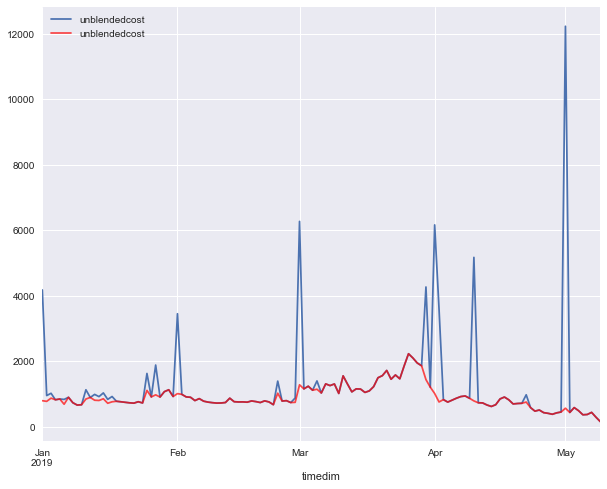

In [3]:
daily_data_final = data2.groupby('timedim')['timedim','unblendedcost'].sum().dropna()
ax = daily_data_final.plot(label='real data',figsize=(10,8))
daily_data_for_train = data3.groupby('timedim')['timedim','unblendedcost'].sum().dropna()
daily_data_for_train.plot(ax=ax,label='remove extreme data', alpha=0.7, color='red')
plt.legend()
plt.show()

## ARIMA

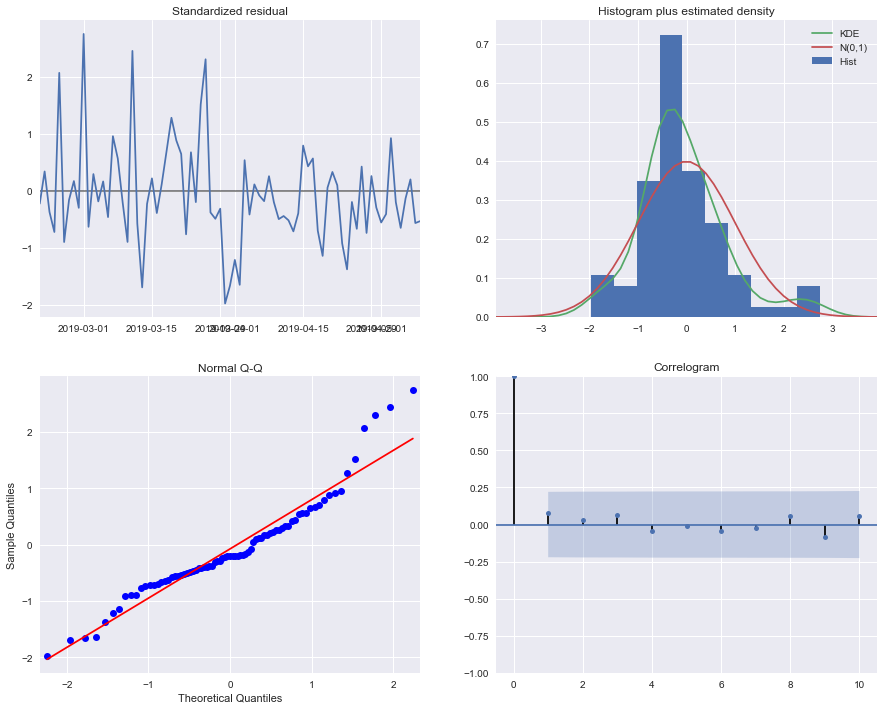

In [4]:
import warnings
import statsmodels.api as sm
warnings.filterwarnings("ignore") # specify to ignore warning messages

warnings.filterwarnings("ignore")
mod = sm.tsa.statespace.SARIMAX(daily_data_for_train,
                                    order = (2, 0, 4),
                                    seasonal_order = (3, 1, 2, 12),
                                    enforce_stationarity = False,
                                    enforce_invertibility = False)
results = mod.fit()
results.plot_diagnostics(figsize=(15,12))
plt.show()

In [5]:
#make prediction with test data (including extreme values)
train_size = int(len(daily_data_final) * 0.60)
train, test = daily_data_final[0:train_size], daily_data_final[train_size:]

pred = results.get_prediction(start = test.iloc[0].name, dynamic = False)
pred_ci = pred.conf_int()

### model result with real data (including extreme values)

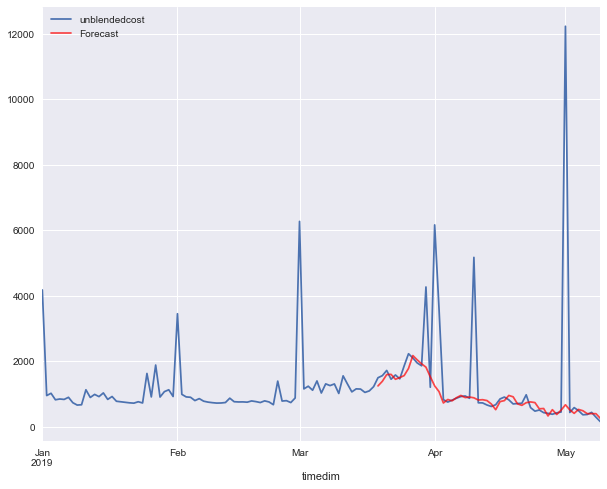

In [6]:
ax = daily_data_final.plot(label='actual', figsize=(10,8))
pred.predicted_mean.plot(ax=ax, label='Forecast', alpha=0.7, color='red')
plt.legend()
plt.show()

In [7]:
from sklearn.metrics import mean_squared_error

def mean_absolute_percentage_error(y_true, y_pred): 
    y_true, y_pred = np.array(y_true), np.array(y_pred)
    return np.median(np.abs((y_true - y_pred) / np.mean(y_true))) * 100

def standardized_rmse(y_true, y_pred):
    y_true, y_pred = np.array(y_true), np.array(y_pred)
    return np.sqrt(mean_squared_error(y_true, y_pred))

mape = mean_absolute_percentage_error(test, pred.predicted_mean)
print('MAPE {}'.format(mape))
rmse = standardized_rmse(test, pred.predicted_mean)
print('rmse {}'.format(rmse))

MAPE 33.16869110047661
rmse 1907.6152298484851


### model results of data without extreme values

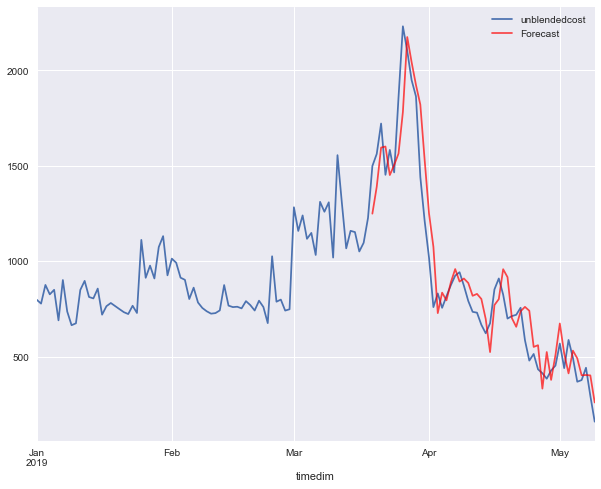

MAPE 43.642498454505564
rmse 156.42555747461168


In [8]:
ax = daily_data_for_train.plot(label='actual', figsize=(10,8))
pred.predicted_mean.plot(ax=ax, label='Forecast', alpha=0.7, color='red')
plt.legend()
plt.show()

mape = mean_absolute_percentage_error(daily_data_for_train[train_size:], pred.predicted_mean)
print('MAPE {}'.format(mape))
rmse = standardized_rmse(daily_data_for_train[train_size:], pred.predicted_mean)
print('rmse {}'.format(rmse))

## RNN: univariate, only on y
### model training

In [9]:
import tensorflow as tf
from tensorflow.python import keras

def model_train_param(parameters):
    #train on data without extreme values
    Y=daily_data_for_train['unblendedcost']

    y=Y[:train_size]
    n_steps = parameters[0]

    train_x = np.array(y[:-1])
    train_y = np.array(y[1:])

    train_num=len(train_x)

    X_train = []
    Y_train = []
    for i in range(train_num-n_steps):
        X_train.append(train_x[i:i+n_steps].reshape(n_steps,-1))
        Y_train.append(train_y[i:i+n_steps].reshape(n_steps,-1))
    X_train = np.array(X_train)
    Y_train = np.array(Y_train)

    #scale data
    Y_train,X_train=Y_train/1000,X_train/1000
    
    #print(Y_train.shape)
    #print(X_train.shape)

    input_tensor = keras.layers.Input((n_steps,1))
    hidden = keras.layers.LSTM(units=parameters[1],activation=parameters[2],return_sequences=True)(input_tensor)
    output = keras.layers.Dense(units=1,activation=None)(hidden)
    model = keras.models.Model(inputs = input_tensor,outputs = output)
    def loss_custom(y_true,y_pred):
        y_true_reshape = keras.backend.reshape(y_true,shape=(-1,n_steps))
        y_pred_reshape = keras.backend.reshape(y_pred,shape=(-1,n_steps))
        return keras.losses.mse(y_true_reshape,y_pred_reshape)
    adam = keras.optimizers.Adam(lr=parameters[3])
    sgd = keras.optimizers.SGD()
    #metrics=['mse']
    model.compile(optimizer=adam,loss='mse',metrics=['mse'])
    es = keras.callbacks.EarlyStopping(monitor='mean_squared_error', mode='min', verbose=1, patience=5)
    model.fit(X_train,Y_train,batch_size=16,epochs=1000,callbacks=[es],verbose=1)

    return model,X_train,Y_train

In [10]:
def model_overfitting_check(model,n_steps,X_train,Y_train):
    #make prediction with test data (out of sample)
    X_test = []
    Y_test = [] 
    test_x = np.array((daily_data_for_train['unblendedcost'])[train_size-n_steps:])
    test_num=len(test_x)
    for i in range(test_num-n_steps-1):
        X_test.append(test_x[i:i+n_steps].reshape(n_steps,-1))
        Y_test.append(test_x[i:i+n_steps].reshape(n_steps,-1))
    X_test = np.array(X_test)
    Y_test = np.array(Y_test)
    X_test,Y_test =X_test/1000,Y_test/1000
    y_predict=model.predict(X_test)
    data_temp2=daily_data_final.iloc[train_size-1:train_size-n_steps+test_num-2,].copy()
    data_temp2.loc[:,'unblendedcost']=list((y_predict.reshape(-1))[list(range(n_steps-1,n_steps*(len(y_predict)+1)-1,n_steps))])
    data_temp2.unblendedcost*=1000
    # check overfitting
    predicted_train=model.predict(X_train)
    data_temp1=daily_data_final.iloc[n_steps:train_size-1,].copy()
    data_temp1.loc[:,'unblendedcost']=list((predicted_train.reshape(-1))[list(range(n_steps-1,n_steps*(len(predicted_train)+1)-1,n_steps))])
    data_temp1.unblendedcost*=1000
    
    ax = daily_data_for_train.plot(label='actual', figsize=(10,8))
    (data_temp1.unblendedcost).plot(ax=ax, label='Forecast', alpha=0.7, color='green')
    (data_temp2.unblendedcost).plot(ax=ax, label='Forecast', alpha=0.7, color='red')
    plt.legend()
    plt.show()
    
    print('in sample')
    mape1 = mean_absolute_percentage_error(daily_data_for_train.iloc[n_steps:train_size-1,], data_temp1.unblendedcost)
    print('MAPE {}'.format(mape1))
    rmse1 = standardized_rmse(daily_data_for_train.iloc[n_steps:train_size-1,], data_temp1.unblendedcost)
    print('rmse {}'.format(rmse1))

    print('out of sample')
    mape2 = mean_absolute_percentage_error(daily_data_for_train.iloc[train_size-1:train_size-n_steps+test_num-2,], data_temp2.unblendedcost)
    print('mape {}'.format(mape2))
    rmse2 = standardized_rmse(daily_data_for_train.iloc[train_size-1:train_size-n_steps+test_num-2,], data_temp2.unblendedcost)
    print('rmse {}'.format(rmse2))
    return [mape1,rmse1,mape2,rmse2]

### Grid Search

In [11]:
import itertools
n_steps_list=range(7,18,3)
units_list=[16,32,64]
activation_list=['tanh','relu']
lr_list=[0.0001,0.0003,0.001,0.003,0.01]

# Generate all different combinations

parameter_combination = list(itertools.product(n_steps_list, units_list, activation_list, lr_list))

In [12]:
grid_search_results=pd.DataFrame(columns=['n_step','unit','activ','lr','MAPE_in','rmse_in','MAPE_out','rmse_out'])

W1012 01:45:28.942967 14204 deprecation.py:506] From C:\Users\leung\Anaconda3\lib\site-packages\tensorflow\python\ops\init_ops.py:1251: calling VarianceScaling.__init__ (from tensorflow.python.ops.init_ops) with dtype is deprecated and will be removed in a future version.
Instructions for updating:
Call initializer instance with the dtype argument instead of passing it to the constructor
W1012 01:45:29.555392 14204 deprecation.py:323] From C:\Users\leung\Anaconda3\lib\site-packages\tensorflow\python\ops\math_grad.py:1250: add_dispatch_support.<locals>.wrapper (from tensorflow.python.ops.array_ops) is deprecated and will be removed in a future version.
Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where


Epoch 1/1000
69/69 [==============================] - 1s 9ms/sample - loss: 0.8899 - mean_squared_error: 0.8899
Epoch 2/1000
69/69 [==============================] - 0s 434us/sample - loss: 0.8818 - mean_squared_error: 0.8818
Epoch 3/1000
69/69 [==============================] - 0s 318us/sample - loss: 0.8738 - mean_squared_error: 0.8738
Epoch 4/1000
69/69 [==============================] - 0s 448us/sample - loss: 0.8659 - mean_squared_error: 0.8659
Epoch 5/1000
69/69 [==============================] - 0s 506us/sample - loss: 0.8579 - mean_squared_error: 0.8579
Epoch 6/1000
69/69 [==============================] - 0s 347us/sample - loss: 0.8501 - mean_squared_error: 0.8501
Epoch 7/1000
69/69 [==============================] - 0s 318us/sample - loss: 0.8422 - mean_squared_error: 0.8422
Epoch 8/1000
69/69 [==============================] - 0s 419us/sample - loss: 0.8346 - mean_squared_error: 0.8346
Epoch 9/1000
69/69 [==============================] - 0s 347us/sample - loss: 0.8269 - mea

69/69 [==============================] - 0s 434us/sample - loss: 0.3840 - mean_squared_error: 0.3840
Epoch 73/1000
69/69 [==============================] - 0s 361us/sample - loss: 0.3776 - mean_squared_error: 0.3776
Epoch 74/1000
69/69 [==============================] - 0s 405us/sample - loss: 0.3714 - mean_squared_error: 0.3714
Epoch 75/1000
69/69 [==============================] - 0s 520us/sample - loss: 0.3651 - mean_squared_error: 0.3651
Epoch 76/1000
69/69 [==============================] - 0s 347us/sample - loss: 0.3590 - mean_squared_error: 0.3590
Epoch 77/1000
69/69 [==============================] - 0s 434us/sample - loss: 0.3529 - mean_squared_error: 0.3529
Epoch 78/1000
69/69 [==============================] - 0s 448us/sample - loss: 0.3471 - mean_squared_error: 0.3471
Epoch 79/1000
69/69 [==============================] - 0s 520us/sample - loss: 0.3411 - mean_squared_error: 0.3411
Epoch 80/1000
69/69 [==============================] - 0s 419us/sample - loss: 0.3354 - mean_s

69/69 [==============================] - 0s 535us/sample - loss: 0.1860 - mean_squared_error: 0.1860
Epoch 143/1000
69/69 [==============================] - 0s 506us/sample - loss: 0.1854 - mean_squared_error: 0.1854
Epoch 144/1000
69/69 [==============================] - 0s 535us/sample - loss: 0.1848 - mean_squared_error: 0.1848
Epoch 145/1000
69/69 [==============================] - 0s 520us/sample - loss: 0.1842 - mean_squared_error: 0.1842
Epoch 146/1000
69/69 [==============================] - 0s 477us/sample - loss: 0.1836 - mean_squared_error: 0.1836
Epoch 147/1000
69/69 [==============================] - 0s 477us/sample - loss: 0.1830 - mean_squared_error: 0.1830
Epoch 148/1000
69/69 [==============================] - 0s 491us/sample - loss: 0.1824 - mean_squared_error: 0.1824
Epoch 149/1000
69/69 [==============================] - 0s 463us/sample - loss: 0.1818 - mean_squared_error: 0.1818
Epoch 150/1000
69/69 [==============================] - 0s 491us/sample - loss: 0.1813 

69/69 [==============================] - 0s 448us/sample - loss: 0.1491 - mean_squared_error: 0.1491
Epoch 213/1000
69/69 [==============================] - 0s 463us/sample - loss: 0.1486 - mean_squared_error: 0.1486
Epoch 214/1000
69/69 [==============================] - 0s 506us/sample - loss: 0.1481 - mean_squared_error: 0.1481
Epoch 215/1000
69/69 [==============================] - 0s 463us/sample - loss: 0.1477 - mean_squared_error: 0.1477
Epoch 216/1000
69/69 [==============================] - 0s 520us/sample - loss: 0.1472 - mean_squared_error: 0.1472
Epoch 217/1000
69/69 [==============================] - 0s 477us/sample - loss: 0.1467 - mean_squared_error: 0.1467
Epoch 218/1000
69/69 [==============================] - 0s 520us/sample - loss: 0.1463 - mean_squared_error: 0.1463
Epoch 219/1000
69/69 [==============================] - 0s 477us/sample - loss: 0.1458 - mean_squared_error: 0.1458
Epoch 220/1000
69/69 [==============================] - 0s 405us/sample - loss: 0.1453 

69/69 [==============================] - 0s 463us/sample - loss: 0.1189 - mean_squared_error: 0.1189
Epoch 283/1000
69/69 [==============================] - 0s 347us/sample - loss: 0.1185 - mean_squared_error: 0.1185
Epoch 284/1000
69/69 [==============================] - 0s 549us/sample - loss: 0.1181 - mean_squared_error: 0.1181
Epoch 285/1000
69/69 [==============================] - 0s 419us/sample - loss: 0.1177 - mean_squared_error: 0.1177
Epoch 286/1000
69/69 [==============================] - 0s 419us/sample - loss: 0.1173 - mean_squared_error: 0.1173
Epoch 287/1000
69/69 [==============================] - 0s 448us/sample - loss: 0.1169 - mean_squared_error: 0.1169
Epoch 288/1000
69/69 [==============================] - 0s 477us/sample - loss: 0.1166 - mean_squared_error: 0.1166
Epoch 289/1000
69/69 [==============================] - 0s 434us/sample - loss: 0.1162 - mean_squared_error: 0.1162
Epoch 290/1000
69/69 [==============================] - 0s 405us/sample - loss: 0.1158 

69/69 [==============================] - 0s 390us/sample - loss: 0.0936 - mean_squared_error: 0.0936
Epoch 353/1000
69/69 [==============================] - 0s 419us/sample - loss: 0.0933 - mean_squared_error: 0.0933
Epoch 354/1000
69/69 [==============================] - 0s 361us/sample - loss: 0.0930 - mean_squared_error: 0.0930
Epoch 355/1000
69/69 [==============================] - 0s 434us/sample - loss: 0.0926 - mean_squared_error: 0.0926
Epoch 356/1000
69/69 [==============================] - 0s 520us/sample - loss: 0.0923 - mean_squared_error: 0.0923
Epoch 357/1000
69/69 [==============================] - 0s 564us/sample - loss: 0.0920 - mean_squared_error: 0.0920
Epoch 358/1000
69/69 [==============================] - 0s 405us/sample - loss: 0.0916 - mean_squared_error: 0.0916
Epoch 359/1000
69/69 [==============================] - 0s 491us/sample - loss: 0.0913 - mean_squared_error: 0.0913
Epoch 360/1000
69/69 [==============================] - 0s 463us/sample - loss: 0.0910 

69/69 [==============================] - 0s 463us/sample - loss: 0.0726 - mean_squared_error: 0.0726
Epoch 423/1000
69/69 [==============================] - 0s 448us/sample - loss: 0.0724 - mean_squared_error: 0.0724
Epoch 424/1000
69/69 [==============================] - 0s 535us/sample - loss: 0.0721 - mean_squared_error: 0.0721
Epoch 425/1000
69/69 [==============================] - 0s 448us/sample - loss: 0.0718 - mean_squared_error: 0.0718
Epoch 426/1000
69/69 [==============================] - 0s 419us/sample - loss: 0.0716 - mean_squared_error: 0.0716
Epoch 427/1000
69/69 [==============================] - 0s 434us/sample - loss: 0.0713 - mean_squared_error: 0.0713
Epoch 428/1000
69/69 [==============================] - 0s 434us/sample - loss: 0.0710 - mean_squared_error: 0.0710
Epoch 429/1000
69/69 [==============================] - 0s 448us/sample - loss: 0.0708 - mean_squared_error: 0.0708
Epoch 430/1000
69/69 [==============================] - 0s 491us/sample - loss: 0.0705 

69/69 [==============================] - 0s 419us/sample - loss: 0.0574 - mean_squared_error: 0.0574
Epoch 493/1000
69/69 [==============================] - 0s 376us/sample - loss: 0.0572 - mean_squared_error: 0.0572
Epoch 494/1000
69/69 [==============================] - 0s 361us/sample - loss: 0.0570 - mean_squared_error: 0.0570
Epoch 495/1000
69/69 [==============================] - 0s 462us/sample - loss: 0.0569 - mean_squared_error: 0.0569
Epoch 496/1000
69/69 [==============================] - 0s 419us/sample - loss: 0.0567 - mean_squared_error: 0.0567
Epoch 497/1000
69/69 [==============================] - 0s 477us/sample - loss: 0.0565 - mean_squared_error: 0.0565
Epoch 498/1000
69/69 [==============================] - 0s 491us/sample - loss: 0.0564 - mean_squared_error: 0.0564
Epoch 499/1000
69/69 [==============================] - 0s 622us/sample - loss: 0.0562 - mean_squared_error: 0.0562
Epoch 500/1000
69/69 [==============================] - 0s 419us/sample - loss: 0.0561 

69/69 [==============================] - 0s 549us/sample - loss: 0.0481 - mean_squared_error: 0.0481
Epoch 563/1000
69/69 [==============================] - 0s 405us/sample - loss: 0.0480 - mean_squared_error: 0.0480
Epoch 564/1000
69/69 [==============================] - 0s 434us/sample - loss: 0.0479 - mean_squared_error: 0.0479
Epoch 565/1000
69/69 [==============================] - 0s 477us/sample - loss: 0.0478 - mean_squared_error: 0.0478
Epoch 566/1000
69/69 [==============================] - 0s 419us/sample - loss: 0.0477 - mean_squared_error: 0.0477
Epoch 567/1000
69/69 [==============================] - 0s 390us/sample - loss: 0.0476 - mean_squared_error: 0.0476
Epoch 568/1000
69/69 [==============================] - 0s 463us/sample - loss: 0.0475 - mean_squared_error: 0.0475
Epoch 569/1000
69/69 [==============================] - 0s 419us/sample - loss: 0.0474 - mean_squared_error: 0.0474
Epoch 570/1000
69/69 [==============================] - 0s 535us/sample - loss: 0.0473 

69/69 [==============================] - 0s 419us/sample - loss: 0.0418 - mean_squared_error: 0.0418
Epoch 633/1000
69/69 [==============================] - 0s 390us/sample - loss: 0.0417 - mean_squared_error: 0.0417
Epoch 634/1000
69/69 [==============================] - 0s 477us/sample - loss: 0.0417 - mean_squared_error: 0.0417
Epoch 635/1000
69/69 [==============================] - 0s 448us/sample - loss: 0.0416 - mean_squared_error: 0.0416
Epoch 636/1000
69/69 [==============================] - 0s 448us/sample - loss: 0.0415 - mean_squared_error: 0.0415
Epoch 637/1000
69/69 [==============================] - 0s 405us/sample - loss: 0.0414 - mean_squared_error: 0.0414
Epoch 638/1000
69/69 [==============================] - 0s 535us/sample - loss: 0.0414 - mean_squared_error: 0.0414
Epoch 639/1000
69/69 [==============================] - 0s 405us/sample - loss: 0.0413 - mean_squared_error: 0.0413
Epoch 640/1000
69/69 [==============================] - 0s 347us/sample - loss: 0.0412 

69/69 [==============================] - 0s 226us/sample - loss: 0.0368 - mean_squared_error: 0.0368
Epoch 703/1000
69/69 [==============================] - 0s 226us/sample - loss: 0.0367 - mean_squared_error: 0.0367
Epoch 704/1000
69/69 [==============================] - 0s 226us/sample - loss: 0.0366 - mean_squared_error: 0.0366
Epoch 705/1000
69/69 [==============================] - 0s 906us/sample - loss: 0.0366 - mean_squared_error: 0.0366
Epoch 706/1000
69/69 [==============================] - 0s 1ms/sample - loss: 0.0365 - mean_squared_error: 0.0365
Epoch 707/1000
69/69 [==============================] - 0s 205us/sample - loss: 0.0364 - mean_squared_error: 0.0364
Epoch 708/1000
69/69 [==============================] - 0s 453us/sample - loss: 0.0364 - mean_squared_error: 0.0364
Epoch 709/1000
69/69 [==============================] - 0s 453us/sample - loss: 0.0363 - mean_squared_error: 0.0363
Epoch 710/1000
69/69 [==============================] - 0s 453us/sample - loss: 0.0362 - 

69/69 [==============================] - 0s 226us/sample - loss: 0.0325 - mean_squared_error: 0.0325
Epoch 772/1000
69/69 [==============================] - 0s 226us/sample - loss: 0.0325 - mean_squared_error: 0.0325
Epoch 773/1000
69/69 [==============================] - 0s 453us/sample - loss: 0.0324 - mean_squared_error: 0.0324
Epoch 774/1000
69/69 [==============================] - 0s 453us/sample - loss: 0.0324 - mean_squared_error: 0.0324
Epoch 775/1000
69/69 [==============================] - 0s 226us/sample - loss: 0.0323 - mean_squared_error: 0.0323
Epoch 776/1000
69/69 [==============================] - 0s 453us/sample - loss: 0.0322 - mean_squared_error: 0.0322
Epoch 777/1000
69/69 [==============================] - 0s 453us/sample - loss: 0.0322 - mean_squared_error: 0.0322
Epoch 778/1000
69/69 [==============================] - 0s 453us/sample - loss: 0.0321 - mean_squared_error: 0.0321
Epoch 779/1000
69/69 [==============================] - ETA: 0s - loss: 0.0358 - mean_s

69/69 [==============================] - 0s 318us/sample - loss: 0.0290 - mean_squared_error: 0.0290
Epoch 841/1000
69/69 [==============================] - 0s 390us/sample - loss: 0.0290 - mean_squared_error: 0.0290
Epoch 842/1000
69/69 [==============================] - 0s 376us/sample - loss: 0.0289 - mean_squared_error: 0.0289
Epoch 843/1000
69/69 [==============================] - 0s 491us/sample - loss: 0.0289 - mean_squared_error: 0.0289
Epoch 844/1000
69/69 [==============================] - 0s 462us/sample - loss: 0.0288 - mean_squared_error: 0.0288
Epoch 845/1000
69/69 [==============================] - 0s 463us/sample - loss: 0.0288 - mean_squared_error: 0.0288
Epoch 846/1000
69/69 [==============================] - 0s 433us/sample - loss: 0.0287 - mean_squared_error: 0.0287
Epoch 847/1000
69/69 [==============================] - 0s 448us/sample - loss: 0.0287 - mean_squared_error: 0.0287
Epoch 848/1000
69/69 [==============================] - 0s 390us/sample - loss: 0.0286 

69/69 [==============================] - 0s 376us/sample - loss: 0.0261 - mean_squared_error: 0.0261
Epoch 911/1000
69/69 [==============================] - 0s 535us/sample - loss: 0.0260 - mean_squared_error: 0.0260
Epoch 912/1000
69/69 [==============================] - 0s 419us/sample - loss: 0.0260 - mean_squared_error: 0.0260
Epoch 913/1000
69/69 [==============================] - 0s 477us/sample - loss: 0.0259 - mean_squared_error: 0.0259
Epoch 914/1000
69/69 [==============================] - 0s 347us/sample - loss: 0.0259 - mean_squared_error: 0.0259
Epoch 915/1000
69/69 [==============================] - 0s 419us/sample - loss: 0.0259 - mean_squared_error: 0.0259
Epoch 916/1000
69/69 [==============================] - 0s 434us/sample - loss: 0.0258 - mean_squared_error: 0.0258
Epoch 917/1000
69/69 [==============================] - 0s 434us/sample - loss: 0.0258 - mean_squared_error: 0.0258
Epoch 918/1000
69/69 [==============================] - 0s 477us/sample - loss: 0.0258 

69/69 [==============================] - 0s 549us/sample - loss: 0.0238 - mean_squared_error: 0.0238
Epoch 980/1000
69/69 [==============================] - 0s 434us/sample - loss: 0.0237 - mean_squared_error: 0.0237
Epoch 981/1000
69/69 [==============================] - 0s 535us/sample - loss: 0.0237 - mean_squared_error: 0.0237
Epoch 982/1000
69/69 [==============================] - 0s 506us/sample - loss: 0.0237 - mean_squared_error: 0.0237
Epoch 983/1000
69/69 [==============================] - 0s 708us/sample - loss: 0.0236 - mean_squared_error: 0.0236
Epoch 984/1000
69/69 [==============================] - 0s 477us/sample - loss: 0.0236 - mean_squared_error: 0.0236
Epoch 985/1000
69/69 [==============================] - 0s 564us/sample - loss: 0.0236 - mean_squared_error: 0.0236
Epoch 986/1000
69/69 [==============================] - 0s 477us/sample - loss: 0.0236 - mean_squared_error: 0.0236
Epoch 987/1000
69/69 [==============================] - 0s 419us/sample - loss: 0.0235 

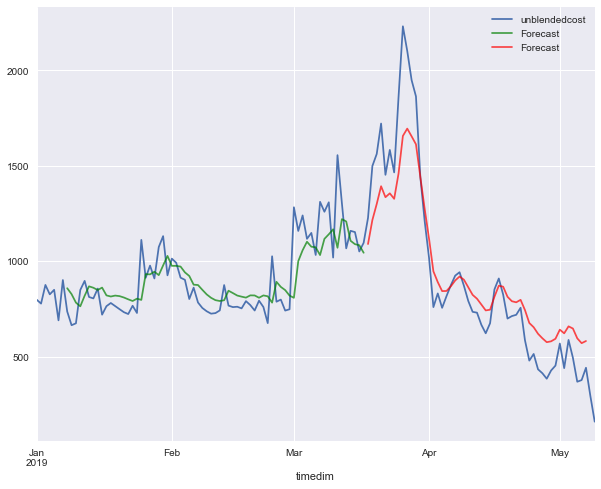

in sample
MAPE 15.928411007926888
rmse 132.0711046080611
out of sample
mape 38.32141849295612
rmse 183.42824405774303
[7, 16, 'tanh', 0.0001]
Epoch 1/1000
69/69 [==============================] - 1s 8ms/sample - loss: 0.7632 - mean_squared_error: 0.7632
Epoch 2/1000
69/69 [==============================] - 0s 1ms/sample - loss: 0.7348 - mean_squared_error: 0.7348
Epoch 3/1000
69/69 [==============================] - 0s 419us/sample - loss: 0.7076 - mean_squared_error: 0.7076
Epoch 4/1000
69/69 [==============================] - 0s 549us/sample - loss: 0.6796 - mean_squared_error: 0.6796
Epoch 5/1000
69/69 [==============================] - 0s 347us/sample - loss: 0.6536 - mean_squared_error: 0.6536
Epoch 6/1000
69/69 [==============================] - 0s 405us/sample - loss: 0.6274 - mean_squared_error: 0.6274
Epoch 7/1000
69/69 [==============================] - 0s 318us/sample - loss: 0.6017 - mean_squared_error: 0.6017
Epoch 8/1000
69/69 [==============================] - 0s 347us/s

69/69 [==============================] - 0s 187us/sample - loss: 0.1035 - mean_squared_error: 0.1035
Epoch 71/1000
69/69 [==============================] - 0s 453us/sample - loss: 0.1026 - mean_squared_error: 0.1026
Epoch 72/1000
69/69 [==============================] - 0s 679us/sample - loss: 0.1016 - mean_squared_error: 0.1016
Epoch 73/1000
69/69 [==============================] - 0s 453us/sample - loss: 0.1007 - mean_squared_error: 0.1007
Epoch 74/1000
69/69 [==============================] - 0s 453us/sample - loss: 0.0998 - mean_squared_error: 0.0998
Epoch 75/1000
69/69 [==============================] - 0s 226us/sample - loss: 0.0989 - mean_squared_error: 0.0989
Epoch 76/1000
69/69 [==============================] - 0s 453us/sample - loss: 0.0980 - mean_squared_error: 0.0980
Epoch 77/1000
69/69 [==============================] - 0s 552us/sample - loss: 0.0971 - mean_squared_error: 0.0971
Epoch 78/1000
69/69 [==============================] - 0s 341us/sample - loss: 0.0962 - mean_s

69/69 [==============================] - 0s 507us/sample - loss: 0.0539 - mean_squared_error: 0.0539
Epoch 141/1000
69/69 [==============================] - 0s 524us/sample - loss: 0.0535 - mean_squared_error: 0.0535
Epoch 142/1000
69/69 [==============================] - 0s 390us/sample - loss: 0.0531 - mean_squared_error: 0.0531
Epoch 143/1000
69/69 [==============================] - 0s 405us/sample - loss: 0.0527 - mean_squared_error: 0.0527
Epoch 144/1000
69/69 [==============================] - 0s 347us/sample - loss: 0.0523 - mean_squared_error: 0.0523
Epoch 145/1000
69/69 [==============================] - 0s 419us/sample - loss: 0.0519 - mean_squared_error: 0.0519
Epoch 146/1000
69/69 [==============================] - 0s 376us/sample - loss: 0.0515 - mean_squared_error: 0.0515
Epoch 147/1000
69/69 [==============================] - 0s 390us/sample - loss: 0.0511 - mean_squared_error: 0.0511
Epoch 148/1000
69/69 [==============================] - 0s 477us/sample - loss: 0.0507 

69/69 [==============================] - 0s 453us/sample - loss: 0.0368 - mean_squared_error: 0.0368
Epoch 211/1000
69/69 [==============================] - 0s 226us/sample - loss: 0.0366 - mean_squared_error: 0.0366
Epoch 212/1000
69/69 [==============================] - 0s 453us/sample - loss: 0.0365 - mean_squared_error: 0.0365
Epoch 213/1000
69/69 [==============================] - 0s 453us/sample - loss: 0.0363 - mean_squared_error: 0.0363
Epoch 214/1000
69/69 [==============================] - 0s 453us/sample - loss: 0.0362 - mean_squared_error: 0.0362
Epoch 215/1000
69/69 [==============================] - 0s 453us/sample - loss: 0.0360 - mean_squared_error: 0.0360
Epoch 216/1000
69/69 [==============================] - 0s 226us/sample - loss: 0.0359 - mean_squared_error: 0.0359
Epoch 217/1000
69/69 [==============================] - 0s 226us/sample - loss: 0.0357 - mean_squared_error: 0.0357
Epoch 218/1000
69/69 [==============================] - 0s 453us/sample - loss: 0.0356 

Epoch 280/1000
69/69 [==============================] - 0s 390us/sample - loss: 0.0285 - mean_squared_error: 0.0285
Epoch 281/1000
69/69 [==============================] - 0s 390us/sample - loss: 0.0285 - mean_squared_error: 0.0285
Epoch 282/1000
69/69 [==============================] - 0s 361us/sample - loss: 0.0284 - mean_squared_error: 0.0284
Epoch 283/1000
69/69 [==============================] - 0s 419us/sample - loss: 0.0283 - mean_squared_error: 0.0283
Epoch 284/1000
69/69 [==============================] - 0s 376us/sample - loss: 0.0282 - mean_squared_error: 0.0282
Epoch 285/1000
69/69 [==============================] - 0s 376us/sample - loss: 0.0281 - mean_squared_error: 0.0281
Epoch 286/1000
69/69 [==============================] - 0s 361us/sample - loss: 0.0280 - mean_squared_error: 0.0280
Epoch 287/1000
69/69 [==============================] - 0s 347us/sample - loss: 0.0279 - mean_squared_error: 0.0279
Epoch 288/1000
69/69 [==============================] - 0s 361us/sample 

69/69 [==============================] - 0s 347us/sample - loss: 0.0234 - mean_squared_error: 0.0234
Epoch 351/1000
69/69 [==============================] - 0s 376us/sample - loss: 0.0233 - mean_squared_error: 0.0233
Epoch 352/1000
69/69 [==============================] - 0s 347us/sample - loss: 0.0233 - mean_squared_error: 0.0233
Epoch 353/1000
69/69 [==============================] - 0s 332us/sample - loss: 0.0232 - mean_squared_error: 0.0232
Epoch 354/1000
69/69 [==============================] - 0s 347us/sample - loss: 0.0232 - mean_squared_error: 0.0232
Epoch 355/1000
69/69 [==============================] - 0s 376us/sample - loss: 0.0231 - mean_squared_error: 0.0231
Epoch 356/1000
69/69 [==============================] - 0s 332us/sample - loss: 0.0231 - mean_squared_error: 0.0231
Epoch 357/1000
69/69 [==============================] - 0s 347us/sample - loss: 0.0230 - mean_squared_error: 0.0230
Epoch 358/1000
69/69 [==============================] - 0s 361us/sample - loss: 0.0229 

69/69 [==============================] - 0s 390us/sample - loss: 0.0205 - mean_squared_error: 0.0205
Epoch 421/1000
69/69 [==============================] - 0s 405us/sample - loss: 0.0205 - mean_squared_error: 0.0205
Epoch 422/1000
69/69 [==============================] - 0s 434us/sample - loss: 0.0205 - mean_squared_error: 0.0205
Epoch 423/1000
69/69 [==============================] - 0s 390us/sample - loss: 0.0204 - mean_squared_error: 0.0204
Epoch 424/1000
69/69 [==============================] - 0s 361us/sample - loss: 0.0204 - mean_squared_error: 0.0204
Epoch 425/1000
69/69 [==============================] - 0s 376us/sample - loss: 0.0204 - mean_squared_error: 0.0204
Epoch 426/1000
69/69 [==============================] - 0s 405us/sample - loss: 0.0204 - mean_squared_error: 0.0204
Epoch 427/1000
69/69 [==============================] - 0s 390us/sample - loss: 0.0204 - mean_squared_error: 0.0204
Epoch 428/1000
69/69 [==============================] - 0s 390us/sample - loss: 0.0203 

69/69 [==============================] - 0s 462us/sample - loss: 0.0192 - mean_squared_error: 0.0192
Epoch 490/1000
69/69 [==============================] - 0s 419us/sample - loss: 0.0192 - mean_squared_error: 0.0192
Epoch 491/1000
69/69 [==============================] - 0s 549us/sample - loss: 0.0192 - mean_squared_error: 0.0192
Epoch 492/1000
69/69 [==============================] - 0s 421us/sample - loss: 0.0192 - mean_squared_error: 0.0192
Epoch 493/1000
69/69 [==============================] - 0s 361us/sample - loss: 0.0191 - mean_squared_error: 0.0191
Epoch 494/1000
69/69 [==============================] - 0s 332us/sample - loss: 0.0191 - mean_squared_error: 0.0191
Epoch 495/1000
69/69 [==============================] - 0s 361us/sample - loss: 0.0191 - mean_squared_error: 0.0191
Epoch 496/1000
69/69 [==============================] - 0s 354us/sample - loss: 0.0191 - mean_squared_error: 0.0191
Epoch 497/1000
69/69 [==============================] - 0s 332us/sample - loss: 0.0191 

69/69 [==============================] - 0s 434us/sample - loss: 0.0185 - mean_squared_error: 0.0185
Epoch 560/1000
69/69 [==============================] - 0s 463us/sample - loss: 0.0185 - mean_squared_error: 0.0185
Epoch 561/1000
69/69 [==============================] - 0s 520us/sample - loss: 0.0185 - mean_squared_error: 0.0185
Epoch 562/1000
69/69 [==============================] - 0s 520us/sample - loss: 0.0185 - mean_squared_error: 0.0185
Epoch 563/1000
69/69 [==============================] - 0s 477us/sample - loss: 0.0185 - mean_squared_error: 0.0185
Epoch 564/1000
69/69 [==============================] - 0s 376us/sample - loss: 0.0185 - mean_squared_error: 0.0185
Epoch 565/1000
69/69 [==============================] - 0s 347us/sample - loss: 0.0185 - mean_squared_error: 0.0185
Epoch 566/1000
69/69 [==============================] - 0s 318us/sample - loss: 0.0185 - mean_squared_error: 0.0185
Epoch 567/1000
69/69 [==============================] - 0s 332us/sample - loss: 0.0185 

69/69 [==============================] - 0s 376us/sample - loss: 0.0182 - mean_squared_error: 0.0182
Epoch 630/1000
69/69 [==============================] - 0s 434us/sample - loss: 0.0182 - mean_squared_error: 0.0182
Epoch 631/1000
69/69 [==============================] - 0s 405us/sample - loss: 0.0182 - mean_squared_error: 0.0182
Epoch 632/1000
69/69 [==============================] - 0s 405us/sample - loss: 0.0182 - mean_squared_error: 0.0182
Epoch 633/1000
69/69 [==============================] - 0s 405us/sample - loss: 0.0182 - mean_squared_error: 0.0182
Epoch 634/1000
69/69 [==============================] - 0s 390us/sample - loss: 0.0182 - mean_squared_error: 0.0182
Epoch 635/1000
69/69 [==============================] - 0s 419us/sample - loss: 0.0182 - mean_squared_error: 0.0182
Epoch 636/1000
69/69 [==============================] - 0s 419us/sample - loss: 0.0181 - mean_squared_error: 0.0181
Epoch 637/1000
69/69 [==============================] - 0s 448us/sample - loss: 0.0181 

69/69 [==============================] - 0s 390us/sample - loss: 0.0180 - mean_squared_error: 0.0180
Epoch 700/1000
69/69 [==============================] - 0s 390us/sample - loss: 0.0180 - mean_squared_error: 0.0180
Epoch 701/1000
69/69 [==============================] - 0s 405us/sample - loss: 0.0180 - mean_squared_error: 0.0180
Epoch 702/1000
69/69 [==============================] - 0s 361us/sample - loss: 0.0180 - mean_squared_error: 0.0180
Epoch 703/1000
69/69 [==============================] - 0s 376us/sample - loss: 0.0180 - mean_squared_error: 0.0180
Epoch 704/1000
69/69 [==============================] - 0s 347us/sample - loss: 0.0180 - mean_squared_error: 0.0180
Epoch 705/1000
69/69 [==============================] - 0s 361us/sample - loss: 0.0180 - mean_squared_error: 0.0180
Epoch 706/1000
69/69 [==============================] - 0s 376us/sample - loss: 0.0180 - mean_squared_error: 0.0180
Epoch 707/1000
69/69 [==============================] - 0s 361us/sample - loss: 0.0180 

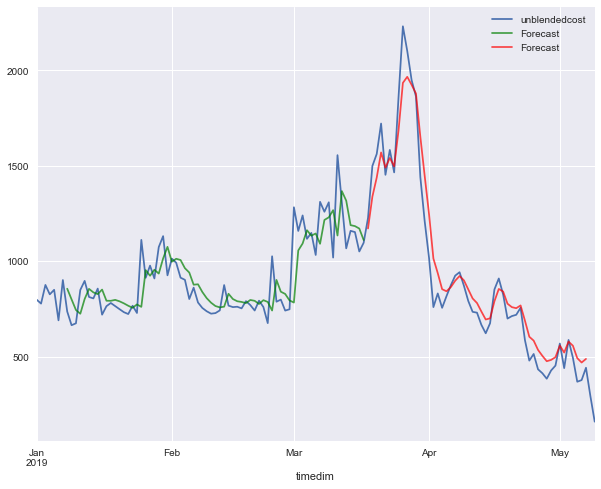

in sample
MAPE 16.894947142460733
rmse 129.33320376555278
out of sample
mape 40.0826288743183
rmse 107.48147617744192
[7, 16, 'tanh', 0.0003]
Epoch 1/1000
69/69 [==============================] - 1s 8ms/sample - loss: 1.1218 - mean_squared_error: 1.1218
Epoch 2/1000
69/69 [==============================] - 0s 506us/sample - loss: 0.9982 - mean_squared_error: 0.9982
Epoch 3/1000
69/69 [==============================] - 0s 419us/sample - loss: 0.8855 - mean_squared_error: 0.8855
Epoch 4/1000
69/69 [==============================] - 0s 607us/sample - loss: 0.7798 - mean_squared_error: 0.7798
Epoch 5/1000
69/69 [==============================] - 0s 448us/sample - loss: 0.6859 - mean_squared_error: 0.6859
Epoch 6/1000
69/69 [==============================] - 0s 332us/sample - loss: 0.5960 - mean_squared_error: 0.5960
Epoch 7/1000
69/69 [==============================] - 0s 347us/sample - loss: 0.5165 - mean_squared_error: 0.5165
Epoch 8/1000
69/69 [==============================] - 0s 332us

69/69 [==============================] - 0s 332us/sample - loss: 0.0495 - mean_squared_error: 0.0495
Epoch 71/1000
69/69 [==============================] - 0s 318us/sample - loss: 0.0487 - mean_squared_error: 0.0487
Epoch 72/1000
69/69 [==============================] - 0s 318us/sample - loss: 0.0480 - mean_squared_error: 0.0480
Epoch 73/1000
69/69 [==============================] - 0s 304us/sample - loss: 0.0471 - mean_squared_error: 0.0471
Epoch 74/1000
69/69 [==============================] - 0s 332us/sample - loss: 0.0464 - mean_squared_error: 0.0464
Epoch 75/1000
69/69 [==============================] - 0s 347us/sample - loss: 0.0458 - mean_squared_error: 0.0458
Epoch 76/1000
69/69 [==============================] - 0s 361us/sample - loss: 0.0451 - mean_squared_error: 0.0451
Epoch 77/1000
69/69 [==============================] - 0s 318us/sample - loss: 0.0445 - mean_squared_error: 0.0445
Epoch 78/1000
69/69 [==============================] - 0s 332us/sample - loss: 0.0438 - mean_s

69/69 [==============================] - 0s 318us/sample - loss: 0.0243 - mean_squared_error: 0.0243
Epoch 142/1000
69/69 [==============================] - 0s 318us/sample - loss: 0.0242 - mean_squared_error: 0.0242
Epoch 143/1000
69/69 [==============================] - 0s 332us/sample - loss: 0.0240 - mean_squared_error: 0.0240
Epoch 144/1000
69/69 [==============================] - 0s 318us/sample - loss: 0.0239 - mean_squared_error: 0.0239
Epoch 145/1000
69/69 [==============================] - 0s 318us/sample - loss: 0.0237 - mean_squared_error: 0.0237
Epoch 146/1000
69/69 [==============================] - 0s 332us/sample - loss: 0.0236 - mean_squared_error: 0.0236
Epoch 147/1000
69/69 [==============================] - 0s 332us/sample - loss: 0.0234 - mean_squared_error: 0.0234
Epoch 148/1000
69/69 [==============================] - 0s 332us/sample - loss: 0.0233 - mean_squared_error: 0.0233
Epoch 149/1000
69/69 [==============================] - 0s 303us/sample - loss: 0.0232 

69/69 [==============================] - 0s 332us/sample - loss: 0.0189 - mean_squared_error: 0.0189
Epoch 212/1000
69/69 [==============================] - 0s 332us/sample - loss: 0.0189 - mean_squared_error: 0.0189
Epoch 213/1000
69/69 [==============================] - 0s 347us/sample - loss: 0.0189 - mean_squared_error: 0.0189
Epoch 214/1000
69/69 [==============================] - 0s 332us/sample - loss: 0.0189 - mean_squared_error: 0.0189
Epoch 215/1000
69/69 [==============================] - 0s 332us/sample - loss: 0.0188 - mean_squared_error: 0.0188
Epoch 216/1000
69/69 [==============================] - 0s 318us/sample - loss: 0.0188 - mean_squared_error: 0.0188
Epoch 217/1000
69/69 [==============================] - 0s 318us/sample - loss: 0.0188 - mean_squared_error: 0.0188
Epoch 218/1000
69/69 [==============================] - 0s 332us/sample - loss: 0.0187 - mean_squared_error: 0.0187
Epoch 219/1000
69/69 [==============================] - 0s 318us/sample - loss: 0.0187 

69/69 [==============================] - 0s 361us/sample - loss: 0.0181 - mean_squared_error: 0.0181
Epoch 282/1000
69/69 [==============================] - 0s 405us/sample - loss: 0.0181 - mean_squared_error: 0.0181
Epoch 283/1000
69/69 [==============================] - 0s 376us/sample - loss: 0.0181 - mean_squared_error: 0.0181
Epoch 00283: early stopping


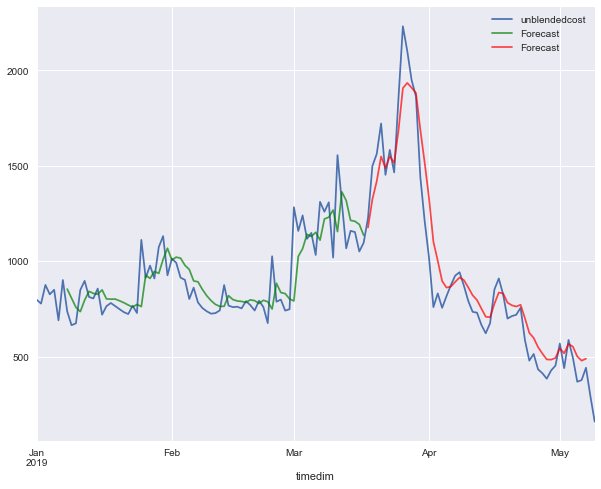

in sample
MAPE 16.858496178287023
rmse 129.55331490568938
out of sample
mape 40.84030608815896
rmse 129.39751558520342
[7, 16, 'tanh', 0.001]
Epoch 1/1000
69/69 [==============================] - 1s 9ms/sample - loss: 0.8373 - mean_squared_error: 0.8373
Epoch 2/1000
69/69 [==============================] - 0s 376us/sample - loss: 0.5640 - mean_squared_error: 0.5640
Epoch 3/1000
69/69 [==============================] - 0s 332us/sample - loss: 0.3361 - mean_squared_error: 0.3361
Epoch 4/1000
69/69 [==============================] - 0s 332us/sample - loss: 0.1944 - mean_squared_error: 0.1944
Epoch 5/1000
69/69 [==============================] - 0s 361us/sample - loss: 0.1491 - mean_squared_error: 0.1491
Epoch 6/1000
69/69 [==============================] - 0s 318us/sample - loss: 0.1545 - mean_squared_error: 0.1545
Epoch 7/1000
69/69 [==============================] - 0s 332us/sample - loss: 0.1363 - mean_squared_error: 0.1363
Epoch 8/1000
69/69 [==============================] - 0s 347us

69/69 [==============================] - 0s 376us/sample - loss: 0.0189 - mean_squared_error: 0.0189
Epoch 71/1000
69/69 [==============================] - 0s 361us/sample - loss: 0.0190 - mean_squared_error: 0.0190
Epoch 72/1000
69/69 [==============================] - 0s 347us/sample - loss: 0.0190 - mean_squared_error: 0.0190
Epoch 73/1000
69/69 [==============================] - 0s 347us/sample - loss: 0.0189 - mean_squared_error: 0.0189
Epoch 74/1000
69/69 [==============================] - 0s 376us/sample - loss: 0.0188 - mean_squared_error: 0.0188
Epoch 75/1000
69/69 [==============================] - 0s 390us/sample - loss: 0.0186 - mean_squared_error: 0.0186
Epoch 76/1000
69/69 [==============================] - 0s 347us/sample - loss: 0.0186 - mean_squared_error: 0.0186
Epoch 77/1000
69/69 [==============================] - 0s 376us/sample - loss: 0.0185 - mean_squared_error: 0.0185
Epoch 78/1000
69/69 [==============================] - 0s 347us/sample - loss: 0.0185 - mean_s

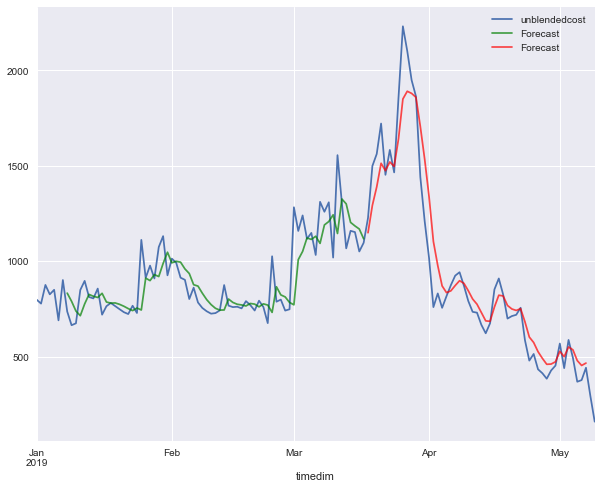

in sample
MAPE 16.656795162270082
rmse 128.8367311471501
out of sample
mape 40.435474857890384
rmse 134.5978620055781
[7, 16, 'tanh', 0.003]
Epoch 1/1000
69/69 [==============================] - 1s 8ms/sample - loss: 0.5236 - mean_squared_error: 0.5236
Epoch 2/1000
69/69 [==============================] - 0s 332us/sample - loss: 0.1289 - mean_squared_error: 0.1289
Epoch 3/1000
69/69 [==============================] - 0s 318us/sample - loss: 0.1320 - mean_squared_error: 0.1320
Epoch 4/1000
69/69 [==============================] - 0s 303us/sample - loss: 0.0745 - mean_squared_error: 0.0745
Epoch 5/1000
69/69 [==============================] - 0s 332us/sample - loss: 0.0665 - mean_squared_error: 0.0665
Epoch 6/1000
69/69 [==============================] - 0s 318us/sample - loss: 0.0603 - mean_squared_error: 0.0603
Epoch 7/1000
69/69 [==============================] - 0s 318us/sample - loss: 0.0450 - mean_squared_error: 0.0450
Epoch 8/1000
69/69 [==============================] - 0s 318us/

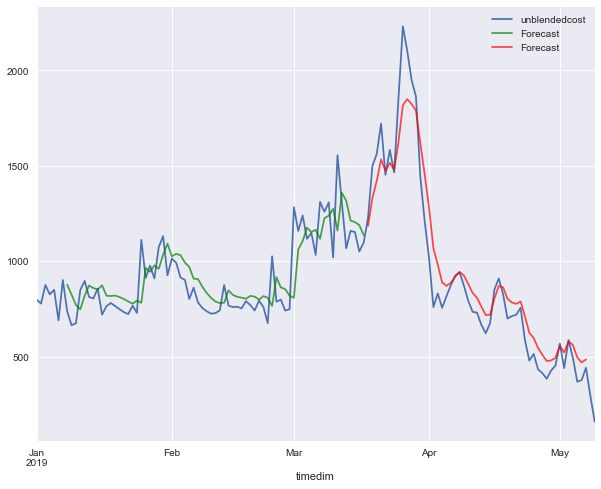

in sample
MAPE 17.257050847149024
rmse 131.2098896777703
out of sample
mape 40.85379460386234
rmse 131.99116630483132
[7, 16, 'tanh', 0.01]
Epoch 1/1000
69/69 [==============================] - 1s 9ms/sample - loss: 0.7035 - mean_squared_error: 0.7035
Epoch 2/1000
69/69 [==============================] - 0s 304us/sample - loss: 0.7007 - mean_squared_error: 0.7007
Epoch 3/1000
69/69 [==============================] - 0s 304us/sample - loss: 0.6979 - mean_squared_error: 0.6979
Epoch 4/1000
69/69 [==============================] - 0s 318us/sample - loss: 0.6950 - mean_squared_error: 0.6950
Epoch 5/1000
69/69 [==============================] - 0s 318us/sample - loss: 0.6923 - mean_squared_error: 0.6923
Epoch 6/1000
69/69 [==============================] - 0s 315us/sample - loss: 0.6894 - mean_squared_error: 0.6894
Epoch 7/1000
69/69 [==============================] - 0s 347us/sample - loss: 0.6866 - mean_squared_error: 0.6866
Epoch 8/1000
69/69 [==============================] - 0s 332us/s

69/69 [==============================] - 0s 318us/sample - loss: 0.4984 - mean_squared_error: 0.4984
Epoch 71/1000
69/69 [==============================] - 0s 303us/sample - loss: 0.4952 - mean_squared_error: 0.4952
Epoch 72/1000
69/69 [==============================] - 0s 304us/sample - loss: 0.4919 - mean_squared_error: 0.4919
Epoch 73/1000
69/69 [==============================] - 0s 347us/sample - loss: 0.4887 - mean_squared_error: 0.4887
Epoch 74/1000
69/69 [==============================] - 0s 318us/sample - loss: 0.4855 - mean_squared_error: 0.4855
Epoch 75/1000
69/69 [==============================] - 0s 332us/sample - loss: 0.4822 - mean_squared_error: 0.4822
Epoch 76/1000
69/69 [==============================] - 0s 332us/sample - loss: 0.4791 - mean_squared_error: 0.4791
Epoch 77/1000
69/69 [==============================] - 0s 332us/sample - loss: 0.4758 - mean_squared_error: 0.4758
Epoch 78/1000
69/69 [==============================] - 0s 347us/sample - loss: 0.4726 - mean_s

69/69 [==============================] - 0s 376us/sample - loss: 0.2710 - mean_squared_error: 0.2710
Epoch 142/1000
69/69 [==============================] - 0s 347us/sample - loss: 0.2683 - mean_squared_error: 0.2683
Epoch 143/1000
69/69 [==============================] - 0s 361us/sample - loss: 0.2655 - mean_squared_error: 0.2655
Epoch 144/1000
69/69 [==============================] - 0s 390us/sample - loss: 0.2627 - mean_squared_error: 0.2627
Epoch 145/1000
69/69 [==============================] - 0s 405us/sample - loss: 0.2601 - mean_squared_error: 0.2601
Epoch 146/1000
69/69 [==============================] - 0s 347us/sample - loss: 0.2574 - mean_squared_error: 0.2574
Epoch 147/1000
69/69 [==============================] - 0s 347us/sample - loss: 0.2548 - mean_squared_error: 0.2548
Epoch 148/1000
69/69 [==============================] - 0s 347us/sample - loss: 0.2523 - mean_squared_error: 0.2523
Epoch 149/1000
69/69 [==============================] - 0s 376us/sample - loss: 0.2498 

69/69 [==============================] - 0s 347us/sample - loss: 0.1757 - mean_squared_error: 0.1757
Epoch 212/1000
69/69 [==============================] - 0s 405us/sample - loss: 0.1752 - mean_squared_error: 0.1752
Epoch 213/1000
69/69 [==============================] - 0s 390us/sample - loss: 0.1747 - mean_squared_error: 0.1747
Epoch 214/1000
69/69 [==============================] - 0s 405us/sample - loss: 0.1742 - mean_squared_error: 0.1742
Epoch 215/1000
69/69 [==============================] - 0s 361us/sample - loss: 0.1737 - mean_squared_error: 0.1737
Epoch 216/1000
69/69 [==============================] - 0s 361us/sample - loss: 0.1733 - mean_squared_error: 0.1733
Epoch 217/1000
69/69 [==============================] - 0s 376us/sample - loss: 0.1728 - mean_squared_error: 0.1728
Epoch 218/1000
69/69 [==============================] - 0s 332us/sample - loss: 0.1723 - mean_squared_error: 0.1723
Epoch 219/1000
69/69 [==============================] - 0s 376us/sample - loss: 0.1719 

69/69 [==============================] - 0s 419us/sample - loss: 0.1437 - mean_squared_error: 0.1437
Epoch 282/1000
69/69 [==============================] - 0s 376us/sample - loss: 0.1433 - mean_squared_error: 0.1433
Epoch 283/1000
69/69 [==============================] - 0s 390us/sample - loss: 0.1429 - mean_squared_error: 0.1429
Epoch 284/1000
69/69 [==============================] - 0s 361us/sample - loss: 0.1424 - mean_squared_error: 0.1424
Epoch 285/1000
69/69 [==============================] - 0s 361us/sample - loss: 0.1419 - mean_squared_error: 0.1419
Epoch 286/1000
69/69 [==============================] - 0s 361us/sample - loss: 0.1415 - mean_squared_error: 0.1415
Epoch 287/1000
69/69 [==============================] - 0s 390us/sample - loss: 0.1411 - mean_squared_error: 0.1411
Epoch 288/1000
69/69 [==============================] - 0s 361us/sample - loss: 0.1406 - mean_squared_error: 0.1406
Epoch 289/1000
69/69 [==============================] - 0s 361us/sample - loss: 0.1402 

69/69 [==============================] - 0s 318us/sample - loss: 0.1126 - mean_squared_error: 0.1126
Epoch 352/1000
69/69 [==============================] - 0s 318us/sample - loss: 0.1122 - mean_squared_error: 0.1122
Epoch 353/1000
69/69 [==============================] - 0s 303us/sample - loss: 0.1118 - mean_squared_error: 0.1118
Epoch 354/1000
69/69 [==============================] - 0s 318us/sample - loss: 0.1113 - mean_squared_error: 0.1113
Epoch 355/1000
69/69 [==============================] - 0s 318us/sample - loss: 0.1109 - mean_squared_error: 0.1109
Epoch 356/1000
69/69 [==============================] - 0s 347us/sample - loss: 0.1105 - mean_squared_error: 0.1105
Epoch 357/1000
69/69 [==============================] - 0s 347us/sample - loss: 0.1101 - mean_squared_error: 0.1101
Epoch 358/1000
69/69 [==============================] - 0s 347us/sample - loss: 0.1096 - mean_squared_error: 0.1096
Epoch 359/1000
69/69 [==============================] - 0s 332us/sample - loss: 0.1092 

69/69 [==============================] - 0s 434us/sample - loss: 0.0885 - mean_squared_error: 0.0885
Epoch 422/1000
69/69 [==============================] - 0s 376us/sample - loss: 0.0883 - mean_squared_error: 0.0883
Epoch 423/1000
69/69 [==============================] - 0s 376us/sample - loss: 0.0881 - mean_squared_error: 0.0881
Epoch 424/1000
69/69 [==============================] - 0s 376us/sample - loss: 0.0878 - mean_squared_error: 0.0878
Epoch 425/1000
69/69 [==============================] - 0s 332us/sample - loss: 0.0876 - mean_squared_error: 0.0876
Epoch 426/1000
69/69 [==============================] - 0s 332us/sample - loss: 0.0874 - mean_squared_error: 0.0874
Epoch 427/1000
69/69 [==============================] - 0s 332us/sample - loss: 0.0871 - mean_squared_error: 0.0871
Epoch 428/1000
69/69 [==============================] - 0s 318us/sample - loss: 0.0869 - mean_squared_error: 0.0869
Epoch 429/1000
69/69 [==============================] - 0s 318us/sample - loss: 0.0867 

69/69 [==============================] - 0s 318us/sample - loss: 0.0760 - mean_squared_error: 0.0760
Epoch 492/1000
69/69 [==============================] - 0s 318us/sample - loss: 0.0759 - mean_squared_error: 0.0759
Epoch 493/1000
69/69 [==============================] - 0s 318us/sample - loss: 0.0757 - mean_squared_error: 0.0757
Epoch 494/1000
69/69 [==============================] - 0s 318us/sample - loss: 0.0756 - mean_squared_error: 0.0756
Epoch 495/1000
69/69 [==============================] - 0s 318us/sample - loss: 0.0754 - mean_squared_error: 0.0754
Epoch 496/1000
69/69 [==============================] - 0s 332us/sample - loss: 0.0753 - mean_squared_error: 0.0753
Epoch 497/1000
69/69 [==============================] - 0s 332us/sample - loss: 0.0751 - mean_squared_error: 0.0751
Epoch 498/1000
69/69 [==============================] - 0s 347us/sample - loss: 0.0750 - mean_squared_error: 0.0750
Epoch 499/1000
69/69 [==============================] - 0s 332us/sample - loss: 0.0749 

69/69 [==============================] - 0s 347us/sample - loss: 0.0666 - mean_squared_error: 0.0666
Epoch 562/1000
69/69 [==============================] - 0s 477us/sample - loss: 0.0665 - mean_squared_error: 0.0665
Epoch 563/1000
69/69 [==============================] - 0s 376us/sample - loss: 0.0663 - mean_squared_error: 0.0663
Epoch 564/1000
69/69 [==============================] - 0s 361us/sample - loss: 0.0662 - mean_squared_error: 0.0662
Epoch 565/1000
69/69 [==============================] - 0s 434us/sample - loss: 0.0661 - mean_squared_error: 0.0661
Epoch 566/1000
69/69 [==============================] - 0s 578us/sample - loss: 0.0660 - mean_squared_error: 0.0660
Epoch 567/1000
69/69 [==============================] - 0s 347us/sample - loss: 0.0658 - mean_squared_error: 0.0658
Epoch 568/1000
69/69 [==============================] - 0s 318us/sample - loss: 0.0657 - mean_squared_error: 0.0657
Epoch 569/1000
69/69 [==============================] - 0s 376us/sample - loss: 0.0656 

69/69 [==============================] - 0s 347us/sample - loss: 0.0583 - mean_squared_error: 0.0583
Epoch 632/1000
69/69 [==============================] - 0s 332us/sample - loss: 0.0582 - mean_squared_error: 0.0582
Epoch 633/1000
69/69 [==============================] - 0s 332us/sample - loss: 0.0581 - mean_squared_error: 0.0581
Epoch 634/1000
69/69 [==============================] - 0s 347us/sample - loss: 0.0580 - mean_squared_error: 0.0580
Epoch 635/1000
69/69 [==============================] - 0s 332us/sample - loss: 0.0578 - mean_squared_error: 0.0578
Epoch 636/1000
69/69 [==============================] - 0s 405us/sample - loss: 0.0577 - mean_squared_error: 0.0577
Epoch 637/1000
69/69 [==============================] - 0s 332us/sample - loss: 0.0576 - mean_squared_error: 0.0576
Epoch 638/1000
69/69 [==============================] - 0s 332us/sample - loss: 0.0575 - mean_squared_error: 0.0575
Epoch 639/1000
69/69 [==============================] - 0s 318us/sample - loss: 0.0574 

69/69 [==============================] - 0s 332us/sample - loss: 0.0504 - mean_squared_error: 0.0504
Epoch 702/1000
69/69 [==============================] - 0s 347us/sample - loss: 0.0503 - mean_squared_error: 0.0503
Epoch 703/1000
69/69 [==============================] - 0s 347us/sample - loss: 0.0502 - mean_squared_error: 0.0502
Epoch 704/1000
69/69 [==============================] - 0s 332us/sample - loss: 0.0501 - mean_squared_error: 0.0501
Epoch 705/1000
69/69 [==============================] - 0s 318us/sample - loss: 0.0500 - mean_squared_error: 0.0500
Epoch 706/1000
69/69 [==============================] - 0s 318us/sample - loss: 0.0499 - mean_squared_error: 0.0499
Epoch 707/1000
69/69 [==============================] - 0s 318us/sample - loss: 0.0498 - mean_squared_error: 0.0498
Epoch 708/1000
69/69 [==============================] - 0s 318us/sample - loss: 0.0497 - mean_squared_error: 0.0497
Epoch 709/1000
69/69 [==============================] - 0s 318us/sample - loss: 0.0496 

69/69 [==============================] - 0s 390us/sample - loss: 0.0440 - mean_squared_error: 0.0440
Epoch 772/1000
69/69 [==============================] - 0s 434us/sample - loss: 0.0439 - mean_squared_error: 0.0439
Epoch 773/1000
69/69 [==============================] - 0s 376us/sample - loss: 0.0439 - mean_squared_error: 0.0439
Epoch 774/1000
69/69 [==============================] - 0s 332us/sample - loss: 0.0438 - mean_squared_error: 0.0438
Epoch 775/1000
69/69 [==============================] - 0s 361us/sample - loss: 0.0437 - mean_squared_error: 0.0437
Epoch 776/1000
69/69 [==============================] - 0s 361us/sample - loss: 0.0436 - mean_squared_error: 0.0436
Epoch 777/1000
69/69 [==============================] - 0s 332us/sample - loss: 0.0435 - mean_squared_error: 0.0435
Epoch 778/1000
69/69 [==============================] - 0s 361us/sample - loss: 0.0435 - mean_squared_error: 0.0435
Epoch 779/1000
69/69 [==============================] - 0s 361us/sample - loss: 0.0434 

69/69 [==============================] - 0s 361us/sample - loss: 0.0391 - mean_squared_error: 0.0391
Epoch 842/1000
69/69 [==============================] - 0s 361us/sample - loss: 0.0390 - mean_squared_error: 0.0390
Epoch 843/1000
69/69 [==============================] - 0s 347us/sample - loss: 0.0390 - mean_squared_error: 0.0390
Epoch 844/1000
69/69 [==============================] - 0s 332us/sample - loss: 0.0389 - mean_squared_error: 0.0389
Epoch 845/1000
69/69 [==============================] - 0s 332us/sample - loss: 0.0388 - mean_squared_error: 0.0388
Epoch 846/1000
69/69 [==============================] - 0s 376us/sample - loss: 0.0388 - mean_squared_error: 0.0388
Epoch 847/1000
69/69 [==============================] - 0s 361us/sample - loss: 0.0387 - mean_squared_error: 0.0387
Epoch 848/1000
69/69 [==============================] - 0s 347us/sample - loss: 0.0387 - mean_squared_error: 0.0387
Epoch 849/1000
69/69 [==============================] - 0s 361us/sample - loss: 0.0386 

69/69 [==============================] - 0s 318us/sample - loss: 0.0355 - mean_squared_error: 0.0355
Epoch 912/1000
69/69 [==============================] - 0s 347us/sample - loss: 0.0354 - mean_squared_error: 0.0354
Epoch 913/1000
69/69 [==============================] - 0s 318us/sample - loss: 0.0354 - mean_squared_error: 0.0354
Epoch 914/1000
69/69 [==============================] - 0s 304us/sample - loss: 0.0354 - mean_squared_error: 0.0354
Epoch 915/1000
69/69 [==============================] - 0s 318us/sample - loss: 0.0353 - mean_squared_error: 0.0353
Epoch 916/1000
69/69 [==============================] - 0s 304us/sample - loss: 0.0353 - mean_squared_error: 0.0353
Epoch 917/1000
69/69 [==============================] - 0s 347us/sample - loss: 0.0352 - mean_squared_error: 0.0352
Epoch 918/1000
69/69 [==============================] - 0s 318us/sample - loss: 0.0352 - mean_squared_error: 0.0352
Epoch 919/1000
69/69 [==============================] - 0s 318us/sample - loss: 0.0352 

69/69 [==============================] - 0s 347us/sample - loss: 0.0328 - mean_squared_error: 0.0328
Epoch 982/1000
69/69 [==============================] - 0s 304us/sample - loss: 0.0328 - mean_squared_error: 0.0328
Epoch 983/1000
69/69 [==============================] - 0s 318us/sample - loss: 0.0327 - mean_squared_error: 0.0327
Epoch 984/1000
69/69 [==============================] - 0s 347us/sample - loss: 0.0327 - mean_squared_error: 0.0327
Epoch 985/1000
69/69 [==============================] - 0s 318us/sample - loss: 0.0327 - mean_squared_error: 0.0327
Epoch 986/1000
69/69 [==============================] - 0s 347us/sample - loss: 0.0326 - mean_squared_error: 0.0326
Epoch 987/1000
69/69 [==============================] - 0s 318us/sample - loss: 0.0326 - mean_squared_error: 0.0326
Epoch 988/1000
69/69 [==============================] - 0s 347us/sample - loss: 0.0326 - mean_squared_error: 0.0326
Epoch 989/1000
69/69 [==============================] - 0s 376us/sample - loss: 0.0325 

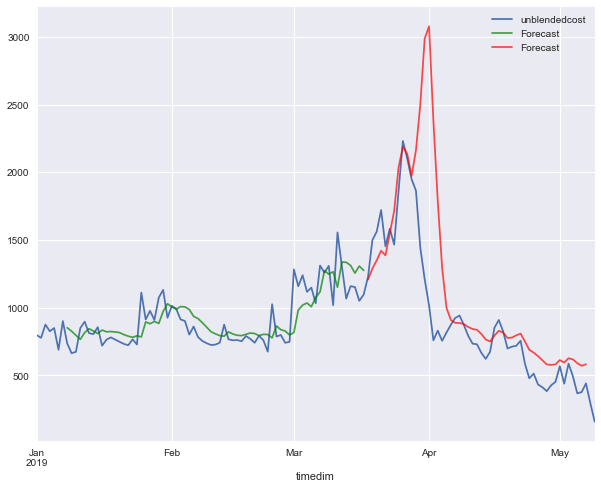

in sample
MAPE 16.559166942430885
rmse 139.65573375517073
out of sample
mape 44.68411047824871
rmse 510.2667854207409
[7, 16, 'relu', 0.0001]
Epoch 1/1000
69/69 [==============================] - 1s 11ms/sample - loss: 0.8186 - mean_squared_error: 0.8186
Epoch 2/1000
69/69 [==============================] - 0s 301us/sample - loss: 0.8036 - mean_squared_error: 0.8036
Epoch 3/1000
69/69 [==============================] - 0s 453us/sample - loss: 0.7895 - mean_squared_error: 0.7895
Epoch 4/1000
69/69 [==============================] - 0s 226us/sample - loss: 0.7756 - mean_squared_error: 0.7756
Epoch 5/1000
69/69 [==============================] - 0s 453us/sample - loss: 0.7622 - mean_squared_error: 0.7622
Epoch 6/1000
69/69 [==============================] - 0s 226us/sample - loss: 0.7490 - mean_squared_error: 0.7490
Epoch 7/1000
69/69 [==============================] - 0s 226us/sample - loss: 0.7359 - mean_squared_error: 0.7359
Epoch 8/1000
69/69 [==============================] - 0s 226u

69/69 [==============================] - 0s 448us/sample - loss: 0.1769 - mean_squared_error: 0.1769
Epoch 71/1000
69/69 [==============================] - 0s 549us/sample - loss: 0.1751 - mean_squared_error: 0.1751
Epoch 72/1000
69/69 [==============================] - 0s 607us/sample - loss: 0.1734 - mean_squared_error: 0.1734
Epoch 73/1000
69/69 [==============================] - 0s 491us/sample - loss: 0.1716 - mean_squared_error: 0.1716
Epoch 74/1000
69/69 [==============================] - 0s 535us/sample - loss: 0.1698 - mean_squared_error: 0.1698
Epoch 75/1000
69/69 [==============================] - 0s 491us/sample - loss: 0.1680 - mean_squared_error: 0.1680
Epoch 76/1000
69/69 [==============================] - 0s 448us/sample - loss: 0.1663 - mean_squared_error: 0.1663
Epoch 77/1000
69/69 [==============================] - 0s 448us/sample - loss: 0.1644 - mean_squared_error: 0.1644
Epoch 78/1000
69/69 [==============================] - 0s 448us/sample - loss: 0.1627 - mean_s

69/69 [==============================] - 0s 491us/sample - loss: 0.0882 - mean_squared_error: 0.0882
Epoch 142/1000
69/69 [==============================] - 0s 506us/sample - loss: 0.0877 - mean_squared_error: 0.0877
Epoch 143/1000
69/69 [==============================] - 0s 491us/sample - loss: 0.0872 - mean_squared_error: 0.0872
Epoch 144/1000
69/69 [==============================] - 0s 520us/sample - loss: 0.0867 - mean_squared_error: 0.0867
Epoch 145/1000
69/69 [==============================] - 0s 535us/sample - loss: 0.0863 - mean_squared_error: 0.0863
Epoch 146/1000
69/69 [==============================] - 0s 636us/sample - loss: 0.0859 - mean_squared_error: 0.0859
Epoch 147/1000
69/69 [==============================] - 0s 549us/sample - loss: 0.0854 - mean_squared_error: 0.0854
Epoch 148/1000
69/69 [==============================] - 0s 578us/sample - loss: 0.0849 - mean_squared_error: 0.0849
Epoch 149/1000
69/69 [==============================] - 0s 506us/sample - loss: 0.0844 

69/69 [==============================] - 0s 520us/sample - loss: 0.0621 - mean_squared_error: 0.0621
Epoch 212/1000
69/69 [==============================] - 0s 477us/sample - loss: 0.0618 - mean_squared_error: 0.0618
Epoch 213/1000
69/69 [==============================] - 0s 549us/sample - loss: 0.0615 - mean_squared_error: 0.0615
Epoch 214/1000
69/69 [==============================] - 0s 463us/sample - loss: 0.0612 - mean_squared_error: 0.0612
Epoch 215/1000
69/69 [==============================] - 0s 549us/sample - loss: 0.0610 - mean_squared_error: 0.0610
Epoch 216/1000
69/69 [==============================] - 0s 520us/sample - loss: 0.0607 - mean_squared_error: 0.0607
Epoch 217/1000
69/69 [==============================] - 0s 477us/sample - loss: 0.0604 - mean_squared_error: 0.0604
Epoch 218/1000
69/69 [==============================] - 0s 650us/sample - loss: 0.0601 - mean_squared_error: 0.0601
Epoch 219/1000
69/69 [==============================] - 0s 549us/sample - loss: 0.0599 

69/69 [==============================] - 0s 463us/sample - loss: 0.0464 - mean_squared_error: 0.0464
Epoch 282/1000
69/69 [==============================] - 0s 448us/sample - loss: 0.0462 - mean_squared_error: 0.0462
Epoch 283/1000
69/69 [==============================] - 0s 405us/sample - loss: 0.0461 - mean_squared_error: 0.0461
Epoch 284/1000
69/69 [==============================] - 0s 448us/sample - loss: 0.0459 - mean_squared_error: 0.0459
Epoch 285/1000
69/69 [==============================] - 0s 549us/sample - loss: 0.0457 - mean_squared_error: 0.0457
Epoch 286/1000
69/69 [==============================] - 0s 390us/sample - loss: 0.0455 - mean_squared_error: 0.0455
Epoch 287/1000
69/69 [==============================] - 0s 535us/sample - loss: 0.0454 - mean_squared_error: 0.0454
Epoch 288/1000
69/69 [==============================] - 0s 564us/sample - loss: 0.0452 - mean_squared_error: 0.0452
Epoch 289/1000
69/69 [==============================] - 0s 648us/sample - loss: 0.0450 

69/69 [==============================] - 0s 448us/sample - loss: 0.0362 - mean_squared_error: 0.0362
Epoch 352/1000
69/69 [==============================] - 0s 535us/sample - loss: 0.0360 - mean_squared_error: 0.0360
Epoch 353/1000
69/69 [==============================] - 0s 477us/sample - loss: 0.0359 - mean_squared_error: 0.0359
Epoch 354/1000
69/69 [==============================] - 0s 477us/sample - loss: 0.0358 - mean_squared_error: 0.0358
Epoch 355/1000
69/69 [==============================] - 0s 549us/sample - loss: 0.0357 - mean_squared_error: 0.0357
Epoch 356/1000
69/69 [==============================] - 0s 463us/sample - loss: 0.0356 - mean_squared_error: 0.0356
Epoch 357/1000
69/69 [==============================] - 0s 491us/sample - loss: 0.0355 - mean_squared_error: 0.0355
Epoch 358/1000
69/69 [==============================] - 0s 462us/sample - loss: 0.0354 - mean_squared_error: 0.0354
Epoch 359/1000
69/69 [==============================] - 0s 520us/sample - loss: 0.0352 

69/69 [==============================] - 0s 405us/sample - loss: 0.0293 - mean_squared_error: 0.0293
Epoch 422/1000
69/69 [==============================] - 0s 520us/sample - loss: 0.0292 - mean_squared_error: 0.0292
Epoch 423/1000
69/69 [==============================] - 0s 506us/sample - loss: 0.0291 - mean_squared_error: 0.0291
Epoch 424/1000
69/69 [==============================] - 0s 593us/sample - loss: 0.0290 - mean_squared_error: 0.0290
Epoch 425/1000
69/69 [==============================] - 0s 448us/sample - loss: 0.0289 - mean_squared_error: 0.0289
Epoch 426/1000
69/69 [==============================] - 0s 419us/sample - loss: 0.0289 - mean_squared_error: 0.0289
Epoch 427/1000
69/69 [==============================] - 0s 549us/sample - loss: 0.0288 - mean_squared_error: 0.0288
Epoch 428/1000
69/69 [==============================] - 0s 448us/sample - loss: 0.0287 - mean_squared_error: 0.0287
Epoch 429/1000
69/69 [==============================] - 0s 419us/sample - loss: 0.0286 

69/69 [==============================] - 0s 376us/sample - loss: 0.0245 - mean_squared_error: 0.0245
Epoch 492/1000
69/69 [==============================] - 0s 405us/sample - loss: 0.0245 - mean_squared_error: 0.0245
Epoch 493/1000
69/69 [==============================] - 0s 491us/sample - loss: 0.0244 - mean_squared_error: 0.0244
Epoch 494/1000
69/69 [==============================] - 0s 390us/sample - loss: 0.0244 - mean_squared_error: 0.0244
Epoch 495/1000
69/69 [==============================] - 0s 477us/sample - loss: 0.0243 - mean_squared_error: 0.0243
Epoch 496/1000
69/69 [==============================] - 0s 549us/sample - loss: 0.0243 - mean_squared_error: 0.0243
Epoch 497/1000
69/69 [==============================] - 0s 463us/sample - loss: 0.0242 - mean_squared_error: 0.0242
Epoch 498/1000
69/69 [==============================] - 0s 448us/sample - loss: 0.0242 - mean_squared_error: 0.0242
Epoch 499/1000
69/69 [==============================] - 0s 419us/sample - loss: 0.0241 

69/69 [==============================] - 0s 463us/sample - loss: 0.0214 - mean_squared_error: 0.0214
Epoch 562/1000
69/69 [==============================] - 0s 549us/sample - loss: 0.0214 - mean_squared_error: 0.0214
Epoch 563/1000
69/69 [==============================] - 0s 506us/sample - loss: 0.0213 - mean_squared_error: 0.0213
Epoch 564/1000
69/69 [==============================] - 0s 650us/sample - loss: 0.0213 - mean_squared_error: 0.0213
Epoch 565/1000
69/69 [==============================] - 0s 564us/sample - loss: 0.0213 - mean_squared_error: 0.0213
Epoch 566/1000
69/69 [==============================] - 0s 419us/sample - loss: 0.0212 - mean_squared_error: 0.0212
Epoch 567/1000
69/69 [==============================] - 0s 477us/sample - loss: 0.0212 - mean_squared_error: 0.0212
Epoch 568/1000
69/69 [==============================] - 0s 463us/sample - loss: 0.0212 - mean_squared_error: 0.0212
Epoch 569/1000
69/69 [==============================] - 0s 607us/sample - loss: 0.0212 

69/69 [==============================] - 0s 419us/sample - loss: 0.0197 - mean_squared_error: 0.0197
Epoch 632/1000
69/69 [==============================] - 0s 390us/sample - loss: 0.0197 - mean_squared_error: 0.0197
Epoch 633/1000
69/69 [==============================] - 0s 405us/sample - loss: 0.0197 - mean_squared_error: 0.0197
Epoch 634/1000
69/69 [==============================] - 0s 361us/sample - loss: 0.0197 - mean_squared_error: 0.0197
Epoch 635/1000
69/69 [==============================] - 0s 462us/sample - loss: 0.0196 - mean_squared_error: 0.0196
Epoch 636/1000
69/69 [==============================] - 0s 448us/sample - loss: 0.0196 - mean_squared_error: 0.0196
Epoch 637/1000
69/69 [==============================] - 0s 434us/sample - loss: 0.0196 - mean_squared_error: 0.0196
Epoch 638/1000
69/69 [==============================] - 0s 506us/sample - loss: 0.0196 - mean_squared_error: 0.0196
Epoch 639/1000
69/69 [==============================] - 0s 448us/sample - loss: 0.0196 

69/69 [==============================] - 0s 622us/sample - loss: 0.0190 - mean_squared_error: 0.0190
Epoch 702/1000
69/69 [==============================] - 0s 549us/sample - loss: 0.0190 - mean_squared_error: 0.0190
Epoch 703/1000
69/69 [==============================] - 0s 578us/sample - loss: 0.0190 - mean_squared_error: 0.0190
Epoch 704/1000
69/69 [==============================] - 0s 694us/sample - loss: 0.0190 - mean_squared_error: 0.0190
Epoch 705/1000
69/69 [==============================] - 0s 463us/sample - loss: 0.0190 - mean_squared_error: 0.0190
Epoch 706/1000
69/69 [==============================] - 0s 549us/sample - loss: 0.0190 - mean_squared_error: 0.0190
Epoch 707/1000
69/69 [==============================] - 0s 491us/sample - loss: 0.0190 - mean_squared_error: 0.0190
Epoch 708/1000
69/69 [==============================] - 0s 535us/sample - loss: 0.0190 - mean_squared_error: 0.0190
Epoch 709/1000
69/69 [==============================] - 0s 405us/sample - loss: 0.0190 

69/69 [==============================] - 0s 477us/sample - loss: 0.0188 - mean_squared_error: 0.0188
Epoch 772/1000
69/69 [==============================] - 0s 477us/sample - loss: 0.0188 - mean_squared_error: 0.0188
Epoch 773/1000
69/69 [==============================] - 0s 564us/sample - loss: 0.0188 - mean_squared_error: 0.0188
Epoch 774/1000
69/69 [==============================] - 0s 463us/sample - loss: 0.0188 - mean_squared_error: 0.0188
Epoch 775/1000
69/69 [==============================] - 0s 419us/sample - loss: 0.0187 - mean_squared_error: 0.0187
Epoch 776/1000
69/69 [==============================] - 0s 462us/sample - loss: 0.0187 - mean_squared_error: 0.0187
Epoch 777/1000
69/69 [==============================] - 0s 463us/sample - loss: 0.0187 - mean_squared_error: 0.0187
Epoch 778/1000
69/69 [==============================] - 0s 448us/sample - loss: 0.0187 - mean_squared_error: 0.0187
Epoch 779/1000
69/69 [==============================] - 0s 448us/sample - loss: 0.0188 

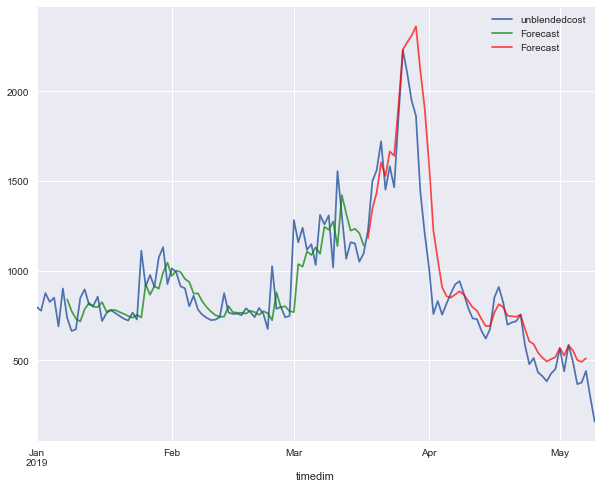

in sample
MAPE 16.81653258816602
rmse 133.03583589107487
out of sample
mape 40.84602172880567
rmse 210.20339185472628
[7, 16, 'relu', 0.0003]
Epoch 1/1000
69/69 [==============================] - 1s 9ms/sample - loss: 0.7440 - mean_squared_error: 0.7440
Epoch 2/1000
69/69 [==============================] - 0s 434us/sample - loss: 0.7188 - mean_squared_error: 0.7188
Epoch 3/1000
69/69 [==============================] - 0s 477us/sample - loss: 0.6943 - mean_squared_error: 0.6943
Epoch 4/1000
69/69 [==============================] - 0s 448us/sample - loss: 0.6693 - mean_squared_error: 0.6693
Epoch 5/1000
69/69 [==============================] - 0s 390us/sample - loss: 0.6439 - mean_squared_error: 0.6439
Epoch 6/1000
69/69 [==============================] - 0s 419us/sample - loss: 0.6182 - mean_squared_error: 0.6182
Epoch 7/1000
69/69 [==============================] - 0s 434us/sample - loss: 0.5928 - mean_squared_error: 0.5928
Epoch 8/1000
69/69 [==============================] - 0s 448us

69/69 [==============================] - 0s 506us/sample - loss: 0.0424 - mean_squared_error: 0.0424
Epoch 71/1000
69/69 [==============================] - 0s 419us/sample - loss: 0.0411 - mean_squared_error: 0.0411
Epoch 72/1000
69/69 [==============================] - 0s 506us/sample - loss: 0.0405 - mean_squared_error: 0.0405
Epoch 73/1000
69/69 [==============================] - 0s 390us/sample - loss: 0.0402 - mean_squared_error: 0.0402
Epoch 74/1000
69/69 [==============================] - 0s 448us/sample - loss: 0.0398 - mean_squared_error: 0.0398
Epoch 75/1000
69/69 [==============================] - 0s 376us/sample - loss: 0.0384 - mean_squared_error: 0.0384
Epoch 76/1000
69/69 [==============================] - 0s 448us/sample - loss: 0.0377 - mean_squared_error: 0.0377
Epoch 77/1000
69/69 [==============================] - 0s 390us/sample - loss: 0.0372 - mean_squared_error: 0.0372
Epoch 78/1000
69/69 [==============================] - 0s 607us/sample - loss: 0.0365 - mean_s

69/69 [==============================] - 0s 535us/sample - loss: 0.0197 - mean_squared_error: 0.0197
Epoch 142/1000
69/69 [==============================] - 0s 376us/sample - loss: 0.0197 - mean_squared_error: 0.0197
Epoch 143/1000
69/69 [==============================] - 0s 636us/sample - loss: 0.0197 - mean_squared_error: 0.0197
Epoch 144/1000
69/69 [==============================] - 0s 405us/sample - loss: 0.0196 - mean_squared_error: 0.0196
Epoch 145/1000
69/69 [==============================] - 0s 520us/sample - loss: 0.0194 - mean_squared_error: 0.0194
Epoch 146/1000
69/69 [==============================] - 0s 419us/sample - loss: 0.0196 - mean_squared_error: 0.0196
Epoch 147/1000
69/69 [==============================] - 0s 448us/sample - loss: 0.0194 - mean_squared_error: 0.0194
Epoch 148/1000
69/69 [==============================] - 0s 477us/sample - loss: 0.0195 - mean_squared_error: 0.0195
Epoch 149/1000
69/69 [==============================] - 0s 477us/sample - loss: 0.0192 

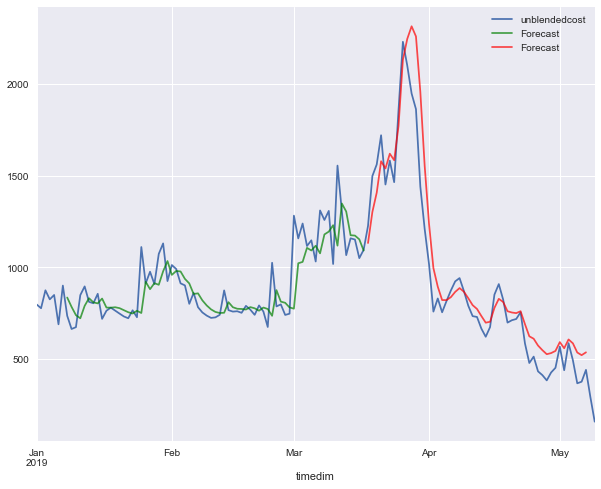

in sample
MAPE 16.231627989212143
rmse 129.3025949370368
out of sample
mape 39.27352888283652
rmse 152.78399403727187
[7, 16, 'relu', 0.001]
Epoch 1/1000
69/69 [==============================] - 1s 9ms/sample - loss: 0.7306 - mean_squared_error: 0.7306
Epoch 2/1000
69/69 [==============================] - 0s 434us/sample - loss: 0.5919 - mean_squared_error: 0.5919
Epoch 3/1000
69/69 [==============================] - 0s 491us/sample - loss: 0.4618 - mean_squared_error: 0.4618
Epoch 4/1000
69/69 [==============================] - 0s 419us/sample - loss: 0.3383 - mean_squared_error: 0.3383
Epoch 5/1000
69/69 [==============================] - 0s 491us/sample - loss: 0.2283 - mean_squared_error: 0.2283
Epoch 6/1000
69/69 [==============================] - 0s 434us/sample - loss: 0.1525 - mean_squared_error: 0.1525
Epoch 7/1000
69/69 [==============================] - 0s 491us/sample - loss: 0.1389 - mean_squared_error: 0.1389
Epoch 8/1000
69/69 [==============================] - 0s 463us/

69/69 [==============================] - 0s 434us/sample - loss: 0.0185 - mean_squared_error: 0.0185
Epoch 71/1000
69/69 [==============================] - 0s 448us/sample - loss: 0.0184 - mean_squared_error: 0.0184
Epoch 72/1000
69/69 [==============================] - 0s 419us/sample - loss: 0.0184 - mean_squared_error: 0.0184
Epoch 73/1000
69/69 [==============================] - 0s 491us/sample - loss: 0.0184 - mean_squared_error: 0.0184
Epoch 74/1000
69/69 [==============================] - 0s 578us/sample - loss: 0.0182 - mean_squared_error: 0.0182
Epoch 75/1000
69/69 [==============================] - 0s 390us/sample - loss: 0.0180 - mean_squared_error: 0.0180
Epoch 76/1000
69/69 [==============================] - 0s 535us/sample - loss: 0.0179 - mean_squared_error: 0.0179
Epoch 77/1000
69/69 [==============================] - 0s 520us/sample - loss: 0.0178 - mean_squared_error: 0.0178
Epoch 78/1000
69/69 [==============================] - 0s 419us/sample - loss: 0.0176 - mean_s

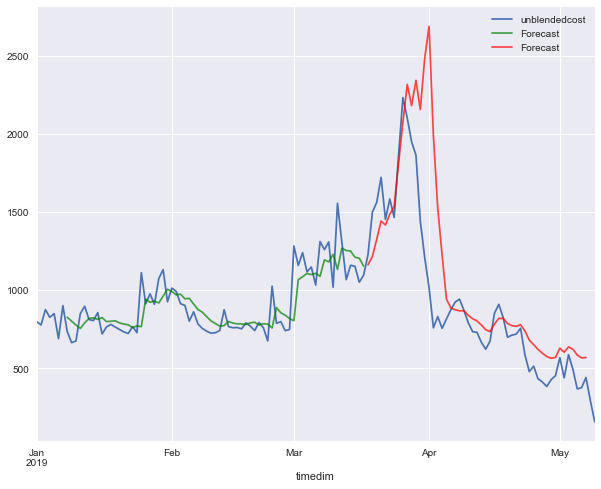

in sample
MAPE 16.646643699117373
rmse 126.3218502584349
out of sample
mape 42.75473487459717
rmse 400.5525537967455
[7, 16, 'relu', 0.003]
Epoch 1/1000
69/69 [==============================] - 1s 10ms/sample - loss: 0.9654 - mean_squared_error: 0.9654
Epoch 2/1000
69/69 [==============================] - 0s 506us/sample - loss: 0.6736 - mean_squared_error: 0.6736
Epoch 3/1000
69/69 [==============================] - 0s 506us/sample - loss: 0.4552 - mean_squared_error: 0.4552
Epoch 4/1000
69/69 [==============================] - 0s 463us/sample - loss: 0.2570 - mean_squared_error: 0.2570
Epoch 5/1000
69/69 [==============================] - 0s 405us/sample - loss: 0.1340 - mean_squared_error: 0.1340
Epoch 6/1000
69/69 [==============================] - 0s 448us/sample - loss: 0.1185 - mean_squared_error: 0.1185
Epoch 7/1000
69/69 [==============================] - 0s 477us/sample - loss: 0.0805 - mean_squared_error: 0.0805
Epoch 8/1000
69/69 [==============================] - 0s 477us/

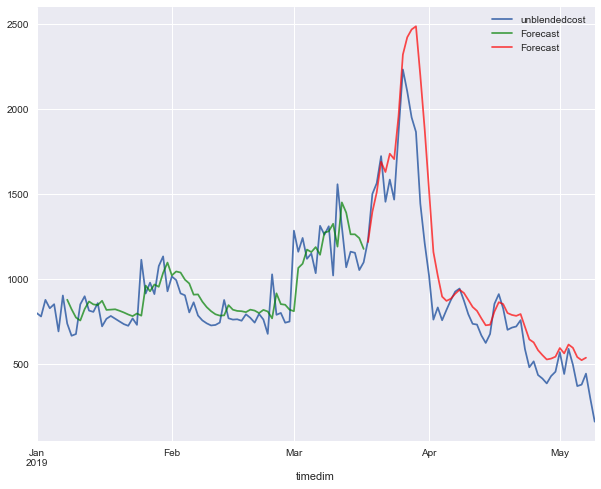

in sample
MAPE 17.54545610319325
rmse 136.05501931400394
out of sample
mape 42.49437315530199
rmse 229.11454886217933
[7, 16, 'relu', 0.01]
Epoch 1/1000
69/69 [==============================] - 1s 10ms/sample - loss: 0.8069 - mean_squared_error: 0.8069
Epoch 2/1000
69/69 [==============================] - 0s 462us/sample - loss: 0.7921 - mean_squared_error: 0.7921
Epoch 3/1000
69/69 [==============================] - 0s 463us/sample - loss: 0.7775 - mean_squared_error: 0.7775
Epoch 4/1000
69/69 [==============================] - 0s 448us/sample - loss: 0.7629 - mean_squared_error: 0.7629
Epoch 5/1000
69/69 [==============================] - 0s 463us/sample - loss: 0.7486 - mean_squared_error: 0.7486
Epoch 6/1000
69/69 [==============================] - 0s 419us/sample - loss: 0.7346 - mean_squared_error: 0.7346
Epoch 7/1000
69/69 [==============================] - 0s 477us/sample - loss: 0.7207 - mean_squared_error: 0.7207
Epoch 8/1000
69/69 [==============================] - 0s 477us/

69/69 [==============================] - 0s 419us/sample - loss: 0.1759 - mean_squared_error: 0.1759
Epoch 71/1000
69/69 [==============================] - 0s 463us/sample - loss: 0.1742 - mean_squared_error: 0.1742
Epoch 72/1000
69/69 [==============================] - 0s 564us/sample - loss: 0.1726 - mean_squared_error: 0.1726
Epoch 73/1000
69/69 [==============================] - 0s 564us/sample - loss: 0.1711 - mean_squared_error: 0.1711
Epoch 74/1000
69/69 [==============================] - 0s 419us/sample - loss: 0.1697 - mean_squared_error: 0.1697
Epoch 75/1000
69/69 [==============================] - 0s 477us/sample - loss: 0.1685 - mean_squared_error: 0.1685
Epoch 76/1000
69/69 [==============================] - 0s 636us/sample - loss: 0.1674 - mean_squared_error: 0.1674
Epoch 77/1000
69/69 [==============================] - 0s 448us/sample - loss: 0.1663 - mean_squared_error: 0.1663
Epoch 78/1000
69/69 [==============================] - 0s 549us/sample - loss: 0.1652 - mean_s

69/69 [==============================] - 0s 376us/sample - loss: 0.1258 - mean_squared_error: 0.1258
Epoch 142/1000
69/69 [==============================] - 0s 593us/sample - loss: 0.1252 - mean_squared_error: 0.1252
Epoch 143/1000
69/69 [==============================] - ETA: 0s - loss: 0.1257 - mean_squared_error: 0.12 - 0s 434us/sample - loss: 0.1247 - mean_squared_error: 0.1247
Epoch 144/1000
69/69 [==============================] - 0s 405us/sample - loss: 0.1242 - mean_squared_error: 0.1242
Epoch 145/1000
69/69 [==============================] - 0s 506us/sample - loss: 0.1236 - mean_squared_error: 0.1236
Epoch 146/1000
69/69 [==============================] - 0s 549us/sample - loss: 0.1231 - mean_squared_error: 0.1231
Epoch 147/1000
69/69 [==============================] - 0s 390us/sample - loss: 0.1226 - mean_squared_error: 0.1226
Epoch 148/1000
69/69 [==============================] - 0s 549us/sample - loss: 0.1220 - mean_squared_error: 0.1220
Epoch 149/1000
69/69 [=============

69/69 [==============================] - 0s 564us/sample - loss: 0.0918 - mean_squared_error: 0.0918
Epoch 212/1000
69/69 [==============================] - 0s 448us/sample - loss: 0.0914 - mean_squared_error: 0.0914
Epoch 213/1000
69/69 [==============================] - 0s 506us/sample - loss: 0.0909 - mean_squared_error: 0.0909
Epoch 214/1000
69/69 [==============================] - 0s 506us/sample - loss: 0.0905 - mean_squared_error: 0.0905
Epoch 215/1000
69/69 [==============================] - 0s 433us/sample - loss: 0.0901 - mean_squared_error: 0.0901
Epoch 216/1000
69/69 [==============================] - 0s 636us/sample - loss: 0.0896 - mean_squared_error: 0.0896
Epoch 217/1000
69/69 [==============================] - 0s 564us/sample - loss: 0.0892 - mean_squared_error: 0.0892
Epoch 218/1000
69/69 [==============================] - 0s 361us/sample - loss: 0.0888 - mean_squared_error: 0.0888
Epoch 219/1000
69/69 [==============================] - 0s 549us/sample - loss: 0.0884 

69/69 [==============================] - 0s 477us/sample - loss: 0.0648 - mean_squared_error: 0.0648
Epoch 282/1000
69/69 [==============================] - 0s 477us/sample - loss: 0.0645 - mean_squared_error: 0.0645
Epoch 283/1000
69/69 [==============================] - 0s 535us/sample - loss: 0.0642 - mean_squared_error: 0.0642
Epoch 284/1000
69/69 [==============================] - 0s 405us/sample - loss: 0.0639 - mean_squared_error: 0.0639
Epoch 285/1000
69/69 [==============================] - 0s 405us/sample - loss: 0.0636 - mean_squared_error: 0.0636
Epoch 286/1000
69/69 [==============================] - 0s 434us/sample - loss: 0.0633 - mean_squared_error: 0.0633
Epoch 287/1000
69/69 [==============================] - 0s 520us/sample - loss: 0.0630 - mean_squared_error: 0.0630
Epoch 288/1000
69/69 [==============================] - 0s 405us/sample - loss: 0.0627 - mean_squared_error: 0.0627
Epoch 289/1000
69/69 [==============================] - 0s 593us/sample - loss: 0.0624 

69/69 [==============================] - 0s 491us/sample - loss: 0.0486 - mean_squared_error: 0.0486
Epoch 352/1000
69/69 [==============================] - 0s 520us/sample - loss: 0.0485 - mean_squared_error: 0.0485
Epoch 353/1000
69/69 [==============================] - 0s 520us/sample - loss: 0.0483 - mean_squared_error: 0.0483
Epoch 354/1000
69/69 [==============================] - 0s 535us/sample - loss: 0.0482 - mean_squared_error: 0.0482
Epoch 355/1000
69/69 [==============================] - 0s 491us/sample - loss: 0.0480 - mean_squared_error: 0.0480
Epoch 356/1000
69/69 [==============================] - 0s 419us/sample - loss: 0.0479 - mean_squared_error: 0.0479
Epoch 357/1000
69/69 [==============================] - 0s 578us/sample - loss: 0.0477 - mean_squared_error: 0.0477
Epoch 358/1000
69/69 [==============================] - 0s 549us/sample - loss: 0.0476 - mean_squared_error: 0.0476
Epoch 359/1000
69/69 [==============================] - 0s 434us/sample - loss: 0.0474 

69/69 [==============================] - 0s 578us/sample - loss: 0.0400 - mean_squared_error: 0.0400
Epoch 422/1000
69/69 [==============================] - 0s 419us/sample - loss: 0.0399 - mean_squared_error: 0.0399
Epoch 423/1000
69/69 [==============================] - 0s 506us/sample - loss: 0.0398 - mean_squared_error: 0.0398
Epoch 424/1000
69/69 [==============================] - 0s 520us/sample - loss: 0.0397 - mean_squared_error: 0.0397
Epoch 425/1000
69/69 [==============================] - 0s 607us/sample - loss: 0.0396 - mean_squared_error: 0.0396
Epoch 426/1000
69/69 [==============================] - 0s 390us/sample - loss: 0.0395 - mean_squared_error: 0.0395
Epoch 427/1000
69/69 [==============================] - 0s 593us/sample - loss: 0.0394 - mean_squared_error: 0.0394
Epoch 428/1000
69/69 [==============================] - 0s 520us/sample - loss: 0.0393 - mean_squared_error: 0.0393
Epoch 429/1000
69/69 [==============================] - 0s 492us/sample - loss: 0.0392 

69/69 [==============================] - 0s 463us/sample - loss: 0.0337 - mean_squared_error: 0.0337
Epoch 492/1000
69/69 [==============================] - 0s 520us/sample - loss: 0.0336 - mean_squared_error: 0.0336
Epoch 493/1000
69/69 [==============================] - 0s 506us/sample - loss: 0.0335 - mean_squared_error: 0.0335
Epoch 494/1000
69/69 [==============================] - 0s 390us/sample - loss: 0.0334 - mean_squared_error: 0.0334
Epoch 495/1000
69/69 [==============================] - 0s 491us/sample - loss: 0.0334 - mean_squared_error: 0.0334
Epoch 496/1000
69/69 [==============================] - 0s 463us/sample - loss: 0.0333 - mean_squared_error: 0.0333
Epoch 497/1000
69/69 [==============================] - 0s 448us/sample - loss: 0.0332 - mean_squared_error: 0.0332
Epoch 498/1000
69/69 [==============================] - 0s 506us/sample - loss: 0.0331 - mean_squared_error: 0.0331
Epoch 499/1000
69/69 [==============================] - 0s 549us/sample - loss: 0.0330 

69/69 [==============================] - 0s 650us/sample - loss: 0.0287 - mean_squared_error: 0.0287
Epoch 562/1000
69/69 [==============================] - 0s 622us/sample - loss: 0.0286 - mean_squared_error: 0.0286
Epoch 563/1000
69/69 [==============================] - 0s 506us/sample - loss: 0.0286 - mean_squared_error: 0.0286
Epoch 564/1000
69/69 [==============================] - 0s 593us/sample - loss: 0.0285 - mean_squared_error: 0.0285
Epoch 565/1000
69/69 [==============================] - 0s 535us/sample - loss: 0.0284 - mean_squared_error: 0.0284
Epoch 566/1000
69/69 [==============================] - 0s 448us/sample - loss: 0.0284 - mean_squared_error: 0.0284
Epoch 567/1000
69/69 [==============================] - 0s 549us/sample - loss: 0.0283 - mean_squared_error: 0.0283
Epoch 568/1000
69/69 [==============================] - 0s 405us/sample - loss: 0.0282 - mean_squared_error: 0.0282
Epoch 569/1000
69/69 [==============================] - 0s 462us/sample - loss: 0.0282 

69/69 [==============================] - 0s 506us/sample - loss: 0.0248 - mean_squared_error: 0.0248
Epoch 632/1000
69/69 [==============================] - 0s 448us/sample - loss: 0.0248 - mean_squared_error: 0.0248
Epoch 633/1000
69/69 [==============================] - 0s 463us/sample - loss: 0.0247 - mean_squared_error: 0.0247
Epoch 634/1000
69/69 [==============================] - 0s 463us/sample - loss: 0.0247 - mean_squared_error: 0.0247
Epoch 635/1000
69/69 [==============================] - 0s 448us/sample - loss: 0.0247 - mean_squared_error: 0.0247
Epoch 636/1000
69/69 [==============================] - 0s 448us/sample - loss: 0.0246 - mean_squared_error: 0.0246
Epoch 637/1000
69/69 [==============================] - 0s 491us/sample - loss: 0.0246 - mean_squared_error: 0.0246
Epoch 638/1000
69/69 [==============================] - 0s 434us/sample - loss: 0.0245 - mean_squared_error: 0.0245
Epoch 639/1000
69/69 [==============================] - 0s 549us/sample - loss: 0.0245 

69/69 [==============================] - 0s 506us/sample - loss: 0.0221 - mean_squared_error: 0.0221
Epoch 702/1000
69/69 [==============================] - 0s 506us/sample - loss: 0.0221 - mean_squared_error: 0.0221
Epoch 703/1000
69/69 [==============================] - 0s 549us/sample - loss: 0.0220 - mean_squared_error: 0.0220
Epoch 704/1000
69/69 [==============================] - 0s 491us/sample - loss: 0.0220 - mean_squared_error: 0.0220
Epoch 705/1000
69/69 [==============================] - 0s 520us/sample - loss: 0.0220 - mean_squared_error: 0.0220
Epoch 706/1000
69/69 [==============================] - 0s 491us/sample - loss: 0.0219 - mean_squared_error: 0.0219
Epoch 707/1000
69/69 [==============================] - 0s 607us/sample - loss: 0.0219 - mean_squared_error: 0.0219
Epoch 708/1000
69/69 [==============================] - 0s 535us/sample - loss: 0.0219 - mean_squared_error: 0.0219
Epoch 709/1000
69/69 [==============================] - 0s 564us/sample - loss: 0.0219 

69/69 [==============================] - 0s 578us/sample - loss: 0.0204 - mean_squared_error: 0.0204
Epoch 772/1000
69/69 [==============================] - 0s 477us/sample - loss: 0.0204 - mean_squared_error: 0.0204
Epoch 773/1000
69/69 [==============================] - 0s 549us/sample - loss: 0.0203 - mean_squared_error: 0.0203
Epoch 774/1000
69/69 [==============================] - 0s 564us/sample - loss: 0.0203 - mean_squared_error: 0.0203
Epoch 775/1000
69/69 [==============================] - 0s 520us/sample - loss: 0.0203 - mean_squared_error: 0.0203
Epoch 776/1000
69/69 [==============================] - 0s 448us/sample - loss: 0.0203 - mean_squared_error: 0.0203
Epoch 777/1000
69/69 [==============================] - 0s 477us/sample - loss: 0.0203 - mean_squared_error: 0.0203
Epoch 778/1000
69/69 [==============================] - 0s 520us/sample - loss: 0.0203 - mean_squared_error: 0.0203
Epoch 779/1000
69/69 [==============================] - 0s 477us/sample - loss: 0.0202 

69/69 [==============================] - 0s 376us/sample - loss: 0.0193 - mean_squared_error: 0.0193
Epoch 842/1000
69/69 [==============================] - 0s 506us/sample - loss: 0.0193 - mean_squared_error: 0.0193
Epoch 843/1000
69/69 [==============================] - 0s 463us/sample - loss: 0.0193 - mean_squared_error: 0.0193
Epoch 844/1000
69/69 [==============================] - 0s 520us/sample - loss: 0.0193 - mean_squared_error: 0.0193
Epoch 845/1000
69/69 [==============================] - 0s 564us/sample - loss: 0.0193 - mean_squared_error: 0.0193
Epoch 846/1000
69/69 [==============================] - 0s 463us/sample - loss: 0.0193 - mean_squared_error: 0.0193
Epoch 847/1000
69/69 [==============================] - 0s 419us/sample - loss: 0.0193 - mean_squared_error: 0.0193
Epoch 848/1000
69/69 [==============================] - 0s 491us/sample - loss: 0.0193 - mean_squared_error: 0.0193
Epoch 849/1000
69/69 [==============================] - 0s 621us/sample - loss: 0.0193 

69/69 [==============================] - 0s 549us/sample - loss: 0.0187 - mean_squared_error: 0.0187
Epoch 912/1000
69/69 [==============================] - 0s 448us/sample - loss: 0.0187 - mean_squared_error: 0.0187
Epoch 913/1000
69/69 [==============================] - 0s 463us/sample - loss: 0.0187 - mean_squared_error: 0.0187
Epoch 914/1000
69/69 [==============================] - 0s 535us/sample - loss: 0.0187 - mean_squared_error: 0.0187
Epoch 915/1000
69/69 [==============================] - 0s 491us/sample - loss: 0.0187 - mean_squared_error: 0.0187
Epoch 916/1000
69/69 [==============================] - 0s 405us/sample - loss: 0.0187 - mean_squared_error: 0.0187
Epoch 917/1000
69/69 [==============================] - 0s 463us/sample - loss: 0.0187 - mean_squared_error: 0.0187
Epoch 918/1000
69/69 [==============================] - 0s 390us/sample - loss: 0.0187 - mean_squared_error: 0.0187
Epoch 919/1000
69/69 [==============================] - 0s 506us/sample - loss: 0.0187 

69/69 [==============================] - 0s 520us/sample - loss: 0.0184 - mean_squared_error: 0.0184
Epoch 982/1000
69/69 [==============================] - 0s 477us/sample - loss: 0.0183 - mean_squared_error: 0.0183
Epoch 983/1000
69/69 [==============================] - 0s 434us/sample - loss: 0.0183 - mean_squared_error: 0.0183
Epoch 984/1000
69/69 [==============================] - 0s 520us/sample - loss: 0.0183 - mean_squared_error: 0.0183
Epoch 985/1000
69/69 [==============================] - 0s 390us/sample - loss: 0.0183 - mean_squared_error: 0.0183
Epoch 986/1000
69/69 [==============================] - 0s 462us/sample - loss: 0.0183 - mean_squared_error: 0.0183
Epoch 987/1000
69/69 [==============================] - 0s 578us/sample - loss: 0.0183 - mean_squared_error: 0.0183
Epoch 988/1000
69/69 [==============================] - 0s 376us/sample - loss: 0.0183 - mean_squared_error: 0.0183
Epoch 989/1000
69/69 [==============================] - 0s 491us/sample - loss: 0.0183 

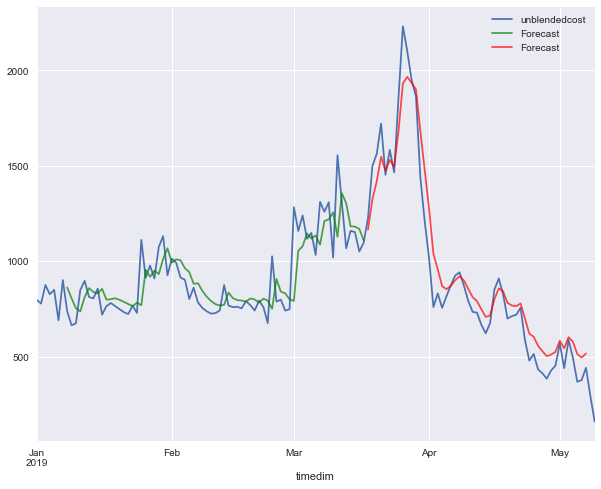

in sample
MAPE 16.807006537904126
rmse 129.08665911236193
out of sample
mape 39.83738035274292
rmse 120.49393193290425
[7, 32, 'tanh', 0.0001]
Epoch 1/1000
69/69 [==============================] - 1s 11ms/sample - loss: 0.8115 - mean_squared_error: 0.8115
Epoch 2/1000
69/69 [==============================] - 0s 433us/sample - loss: 0.7725 - mean_squared_error: 0.7725
Epoch 3/1000
69/69 [==============================] - 0s 506us/sample - loss: 0.7345 - mean_squared_error: 0.7345
Epoch 4/1000
69/69 [==============================] - 0s 477us/sample - loss: 0.6972 - mean_squared_error: 0.6972
Epoch 5/1000
69/69 [==============================] - 0s 448us/sample - loss: 0.6615 - mean_squared_error: 0.6615
Epoch 6/1000
69/69 [==============================] - 0s 477us/sample - loss: 0.6264 - mean_squared_error: 0.6264
Epoch 7/1000
69/69 [==============================] - 0s 549us/sample - loss: 0.5923 - mean_squared_error: 0.5923
Epoch 8/1000
69/69 [==============================] - 0s 448

69/69 [==============================] - 0s 477us/sample - loss: 0.1126 - mean_squared_error: 0.1126
Epoch 71/1000
69/69 [==============================] - 0s 463us/sample - loss: 0.1111 - mean_squared_error: 0.1111
Epoch 72/1000
69/69 [==============================] - 0s 520us/sample - loss: 0.1096 - mean_squared_error: 0.1096
Epoch 73/1000
69/69 [==============================] - 0s 622us/sample - loss: 0.1082 - mean_squared_error: 0.1082
Epoch 74/1000
69/69 [==============================] - 0s 549us/sample - loss: 0.1067 - mean_squared_error: 0.1067
Epoch 75/1000
69/69 [==============================] - 0s 491us/sample - loss: 0.1053 - mean_squared_error: 0.1053
Epoch 76/1000
69/69 [==============================] - 0s 491us/sample - loss: 0.1039 - mean_squared_error: 0.1039
Epoch 77/1000
69/69 [==============================] - 0s 694us/sample - loss: 0.1025 - mean_squared_error: 0.1025
Epoch 78/1000
69/69 [==============================] - 0s 665us/sample - loss: 0.1011 - mean_s

69/69 [==============================] - 0s 968us/sample - loss: 0.0541 - mean_squared_error: 0.0541
Epoch 142/1000
69/69 [==============================] - 0s 650us/sample - loss: 0.0537 - mean_squared_error: 0.0537
Epoch 143/1000
69/69 [==============================] - 0s 766us/sample - loss: 0.0533 - mean_squared_error: 0.0533
Epoch 144/1000
69/69 [==============================] - 0s 650us/sample - loss: 0.0530 - mean_squared_error: 0.0530
Epoch 145/1000
69/69 [==============================] - 0s 679us/sample - loss: 0.0526 - mean_squared_error: 0.0526
Epoch 146/1000
69/69 [==============================] - 0s 578us/sample - loss: 0.0523 - mean_squared_error: 0.0523
Epoch 147/1000
69/69 [==============================] - 0s 535us/sample - loss: 0.0519 - mean_squared_error: 0.0519
Epoch 148/1000
69/69 [==============================] - 0s 593us/sample - loss: 0.0516 - mean_squared_error: 0.0516
Epoch 149/1000
69/69 [==============================] - 0s 708us/sample - loss: 0.0512 

69/69 [==============================] - 0s 419us/sample - loss: 0.0347 - mean_squared_error: 0.0347
Epoch 212/1000
69/69 [==============================] - 0s 535us/sample - loss: 0.0344 - mean_squared_error: 0.0344
Epoch 213/1000
69/69 [==============================] - 0s 520us/sample - loss: 0.0342 - mean_squared_error: 0.0342
Epoch 214/1000
69/69 [==============================] - 0s 463us/sample - loss: 0.0340 - mean_squared_error: 0.0340
Epoch 215/1000
69/69 [==============================] - 0s 405us/sample - loss: 0.0338 - mean_squared_error: 0.0338
Epoch 216/1000
69/69 [==============================] - 0s 463us/sample - loss: 0.0336 - mean_squared_error: 0.0336
Epoch 217/1000
69/69 [==============================] - 0s 390us/sample - loss: 0.0335 - mean_squared_error: 0.0335
Epoch 218/1000
69/69 [==============================] - 0s 549us/sample - loss: 0.0333 - mean_squared_error: 0.0333
Epoch 219/1000
69/69 [==============================] - 0s 376us/sample - loss: 0.0331 

69/69 [==============================] - 0s 1ms/sample - loss: 0.0243 - mean_squared_error: 0.0243
Epoch 282/1000
69/69 [==============================] - 0s 679us/sample - loss: 0.0242 - mean_squared_error: 0.0242
Epoch 283/1000
69/69 [==============================] - 0s 535us/sample - loss: 0.0241 - mean_squared_error: 0.0241
Epoch 284/1000
69/69 [==============================] - 0s 491us/sample - loss: 0.0240 - mean_squared_error: 0.0240
Epoch 285/1000
69/69 [==============================] - 0s 463us/sample - loss: 0.0239 - mean_squared_error: 0.0239
Epoch 286/1000
69/69 [==============================] - 0s 506us/sample - loss: 0.0238 - mean_squared_error: 0.0238
Epoch 287/1000
69/69 [==============================] - 0s 419us/sample - loss: 0.0237 - mean_squared_error: 0.0237
Epoch 288/1000
69/69 [==============================] - 0s 491us/sample - loss: 0.0236 - mean_squared_error: 0.0236
Epoch 289/1000
69/69 [==============================] - 0s 491us/sample - loss: 0.0235 - 

69/69 [==============================] - 0s 491us/sample - loss: 0.0198 - mean_squared_error: 0.0198
Epoch 352/1000
69/69 [==============================] - 0s 477us/sample - loss: 0.0197 - mean_squared_error: 0.0197
Epoch 353/1000
69/69 [==============================] - 0s 535us/sample - loss: 0.0197 - mean_squared_error: 0.0197
Epoch 354/1000
69/69 [==============================] - 0s 477us/sample - loss: 0.0197 - mean_squared_error: 0.0197
Epoch 355/1000
69/69 [==============================] - 0s 520us/sample - loss: 0.0196 - mean_squared_error: 0.0196
Epoch 356/1000
69/69 [==============================] - 0s 491us/sample - loss: 0.0196 - mean_squared_error: 0.0196
Epoch 357/1000
69/69 [==============================] - 0s 564us/sample - loss: 0.0196 - mean_squared_error: 0.0196
Epoch 358/1000
69/69 [==============================] - 0s 477us/sample - loss: 0.0195 - mean_squared_error: 0.0195
Epoch 359/1000
69/69 [==============================] - 0s 448us/sample - loss: 0.0195 

69/69 [==============================] - 0s 795us/sample - loss: 0.0183 - mean_squared_error: 0.0183
Epoch 422/1000
69/69 [==============================] - 0s 564us/sample - loss: 0.0182 - mean_squared_error: 0.0182
Epoch 423/1000
69/69 [==============================] - 0s 549us/sample - loss: 0.0182 - mean_squared_error: 0.0182
Epoch 424/1000
69/69 [==============================] - 0s 564us/sample - loss: 0.0182 - mean_squared_error: 0.0182
Epoch 425/1000
69/69 [==============================] - 0s 520us/sample - loss: 0.0182 - mean_squared_error: 0.0182
Epoch 426/1000
69/69 [==============================] - 0s 694us/sample - loss: 0.0182 - mean_squared_error: 0.0182
Epoch 427/1000
69/69 [==============================] - 0s 578us/sample - loss: 0.0182 - mean_squared_error: 0.0182
Epoch 428/1000
69/69 [==============================] - 0s 636us/sample - loss: 0.0182 - mean_squared_error: 0.0182
Epoch 429/1000
69/69 [==============================] - 0s 708us/sample - loss: 0.0182 

69/69 [==============================] - 0s 636us/sample - loss: 0.0179 - mean_squared_error: 0.0179
Epoch 492/1000
69/69 [==============================] - 0s 752us/sample - loss: 0.0178 - mean_squared_error: 0.0178
Epoch 493/1000
69/69 [==============================] - 0s 853us/sample - loss: 0.0178 - mean_squared_error: 0.0178
Epoch 494/1000
69/69 [==============================] - 0s 607us/sample - loss: 0.0179 - mean_squared_error: 0.0179
Epoch 495/1000
69/69 [==============================] - 0s 723us/sample - loss: 0.0178 - mean_squared_error: 0.0178
Epoch 496/1000
69/69 [==============================] - 0s 593us/sample - loss: 0.0178 - mean_squared_error: 0.0178
Epoch 497/1000
69/69 [==============================] - 0s 752us/sample - loss: 0.0178 - mean_squared_error: 0.0178
Epoch 498/1000
69/69 [==============================] - 0s 622us/sample - loss: 0.0178 - mean_squared_error: 0.0178
Epoch 499/1000
69/69 [==============================] - 0s 650us/sample - loss: 0.0178 

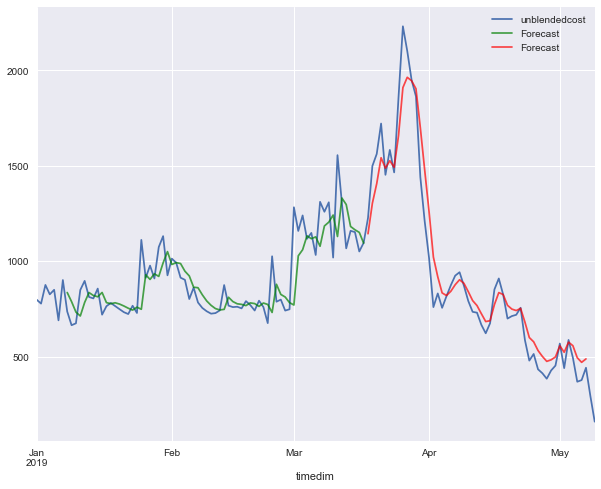

in sample
MAPE 16.70547929356396
rmse 128.5395582822944
out of sample
mape 39.78704604510939
rmse 115.91510252279602
[7, 32, 'tanh', 0.0003]
Epoch 1/1000
69/69 [==============================] - 1s 14ms/sample - loss: 0.8276 - mean_squared_error: 0.8276
Epoch 2/1000
69/69 [==============================] - 0s 347us/sample - loss: 0.6860 - mean_squared_error: 0.6860
Epoch 3/1000
69/69 [==============================] - 0s 347us/sample - loss: 0.5609 - mean_squared_error: 0.5609
Epoch 4/1000
69/69 [==============================] - 0s 405us/sample - loss: 0.4528 - mean_squared_error: 0.4528
Epoch 5/1000
69/69 [==============================] - 0s 853us/sample - loss: 0.3578 - mean_squared_error: 0.3578
Epoch 6/1000
69/69 [==============================] - 0s 650us/sample - loss: 0.2819 - mean_squared_error: 0.2819
Epoch 7/1000
69/69 [==============================] - 0s 520us/sample - loss: 0.2269 - mean_squared_error: 0.2269
Epoch 8/1000
69/69 [==============================] - 0s 477us

69/69 [==============================] - 0s 448us/sample - loss: 0.0279 - mean_squared_error: 0.0279
Epoch 71/1000
69/69 [==============================] - ETA: 0s - loss: 0.0247 - mean_squared_error: 0.02 - 0s 564us/sample - loss: 0.0274 - mean_squared_error: 0.0274
Epoch 72/1000
69/69 [==============================] - 0s 549us/sample - loss: 0.0269 - mean_squared_error: 0.0269
Epoch 73/1000
69/69 [==============================] - 0s 578us/sample - loss: 0.0265 - mean_squared_error: 0.0265
Epoch 74/1000
69/69 [==============================] - 0s 463us/sample - loss: 0.0261 - mean_squared_error: 0.0261
Epoch 75/1000
69/69 [==============================] - 0s 506us/sample - loss: 0.0257 - mean_squared_error: 0.0257
Epoch 76/1000
69/69 [==============================] - 0s 448us/sample - loss: 0.0253 - mean_squared_error: 0.0253
Epoch 77/1000
69/69 [==============================] - 0s 492us/sample - loss: 0.0250 - mean_squared_error: 0.0250
Epoch 78/1000
69/69 [=====================

69/69 [==============================] - 0s 318us/sample - loss: 0.0182 - mean_squared_error: 0.0182
Epoch 141/1000
69/69 [==============================] - 0s 332us/sample - loss: 0.0181 - mean_squared_error: 0.0181
Epoch 142/1000
69/69 [==============================] - 0s 332us/sample - loss: 0.0182 - mean_squared_error: 0.0182
Epoch 143/1000
69/69 [==============================] - 0s 347us/sample - loss: 0.0181 - mean_squared_error: 0.0181
Epoch 144/1000
69/69 [==============================] - 0s 347us/sample - loss: 0.0181 - mean_squared_error: 0.0181
Epoch 145/1000
69/69 [==============================] - 0s 347us/sample - loss: 0.0181 - mean_squared_error: 0.0181
Epoch 146/1000
69/69 [==============================] - 0s 347us/sample - loss: 0.0181 - mean_squared_error: 0.0181
Epoch 147/1000
69/69 [==============================] - 0s 361us/sample - loss: 0.0180 - mean_squared_error: 0.0180
Epoch 148/1000
69/69 [==============================] - 0s 347us/sample - loss: 0.0180 

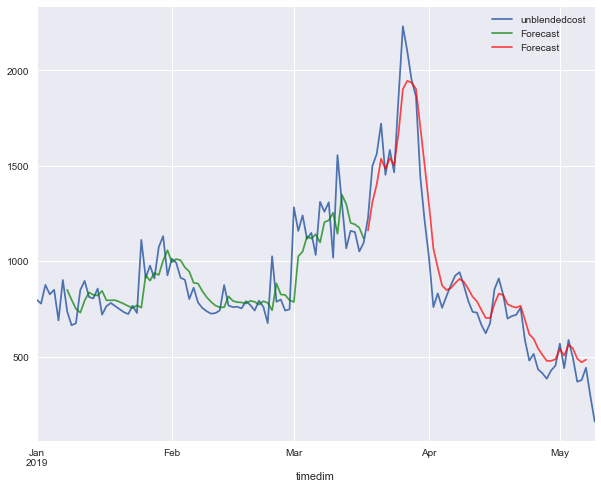

in sample
MAPE 16.492946888149053
rmse 128.7452163609795
out of sample
mape 40.57311710297172
rmse 124.4027031462654
[7, 32, 'tanh', 0.001]
Epoch 1/1000
69/69 [==============================] - 1s 12ms/sample - loss: 0.5664 - mean_squared_error: 0.5664
Epoch 2/1000
69/69 [==============================] - 0s 332us/sample - loss: 0.3104 - mean_squared_error: 0.3104
Epoch 3/1000
69/69 [==============================] - 0s 347us/sample - loss: 0.1588 - mean_squared_error: 0.1588
Epoch 4/1000
69/69 [==============================] - 0s 347us/sample - loss: 0.1582 - mean_squared_error: 0.1582
Epoch 5/1000
69/69 [==============================] - 0s 361us/sample - loss: 0.1206 - mean_squared_error: 0.1206
Epoch 6/1000
69/69 [==============================] - 0s 347us/sample - loss: 0.1002 - mean_squared_error: 0.1002
Epoch 7/1000
69/69 [==============================] - 0s 347us/sample - loss: 0.0931 - mean_squared_error: 0.0931
Epoch 8/1000
69/69 [==============================] - 0s 347us/

69/69 [==============================] - 0s 361us/sample - loss: 0.0178 - mean_squared_error: 0.0178
Epoch 71/1000
69/69 [==============================] - 0s 332us/sample - loss: 0.0179 - mean_squared_error: 0.0179
Epoch 72/1000
69/69 [==============================] - 0s 361us/sample - loss: 0.0179 - mean_squared_error: 0.0179
Epoch 73/1000
69/69 [==============================] - 0s 347us/sample - loss: 0.0178 - mean_squared_error: 0.0178
Epoch 74/1000
69/69 [==============================] - 0s 332us/sample - loss: 0.0179 - mean_squared_error: 0.0179
Epoch 75/1000
69/69 [==============================] - 0s 332us/sample - loss: 0.0178 - mean_squared_error: 0.0178
Epoch 76/1000
69/69 [==============================] - 0s 347us/sample - loss: 0.0179 - mean_squared_error: 0.0179
Epoch 77/1000
69/69 [==============================] - 0s 347us/sample - loss: 0.0178 - mean_squared_error: 0.0178
Epoch 78/1000
69/69 [==============================] - 0s 332us/sample - loss: 0.0178 - mean_s

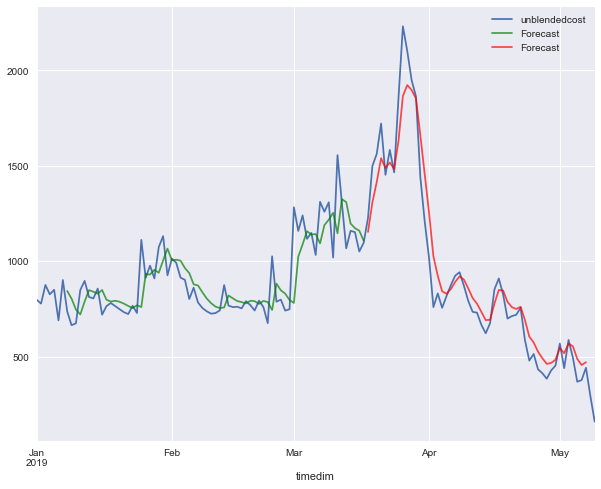

in sample
MAPE 16.716415730214948
rmse 128.04567344668482
out of sample
mape 40.299099878097266
rmse 117.67467455757244
[7, 32, 'tanh', 0.003]
Epoch 1/1000
69/69 [==============================] - 1s 14ms/sample - loss: 0.6129 - mean_squared_error: 0.6129
Epoch 2/1000
69/69 [==============================] - 0s 332us/sample - loss: 0.1767 - mean_squared_error: 0.1767
Epoch 3/1000
69/69 [==============================] - 0s 332us/sample - loss: 0.0872 - mean_squared_error: 0.0872
Epoch 4/1000
69/69 [==============================] - 0s 347us/sample - loss: 0.0760 - mean_squared_error: 0.0760
Epoch 5/1000
69/69 [==============================] - 0s 347us/sample - loss: 0.0465 - mean_squared_error: 0.0465
Epoch 6/1000
69/69 [==============================] - 0s 347us/sample - loss: 0.0452 - mean_squared_error: 0.0452
Epoch 7/1000
69/69 [==============================] - 0s 376us/sample - loss: 0.0327 - mean_squared_error: 0.0327
Epoch 8/1000
69/69 [==============================] - 0s 347

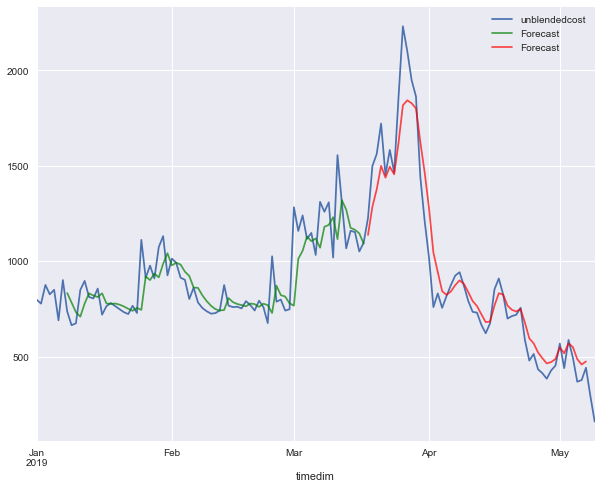

in sample
MAPE 16.665181523301072
rmse 129.17655945755448
out of sample
mape 39.62886342765533
rmse 128.72646815501847
[7, 32, 'tanh', 0.01]
Epoch 1/1000
69/69 [==============================] - 1s 15ms/sample - loss: 0.8190 - mean_squared_error: 0.8190
Epoch 2/1000
69/69 [==============================] - 0s 332us/sample - loss: 0.8155 - mean_squared_error: 0.8155
Epoch 3/1000
69/69 [==============================] - 0s 375us/sample - loss: 0.8120 - mean_squared_error: 0.8120
Epoch 4/1000
69/69 [==============================] - 0s 332us/sample - loss: 0.8085 - mean_squared_error: 0.8085
Epoch 5/1000
69/69 [==============================] - 0s 347us/sample - loss: 0.8051 - mean_squared_error: 0.8051
Epoch 6/1000
69/69 [==============================] - 0s 347us/sample - loss: 0.8016 - mean_squared_error: 0.8016
Epoch 7/1000
69/69 [==============================] - 0s 347us/sample - loss: 0.7982 - mean_squared_error: 0.7982
Epoch 8/1000
69/69 [==============================] - 0s 347us

69/69 [==============================] - 0s 361us/sample - loss: 0.5753 - mean_squared_error: 0.5753
Epoch 71/1000
69/69 [==============================] - 0s 376us/sample - loss: 0.5713 - mean_squared_error: 0.5713
Epoch 72/1000
69/69 [==============================] - 0s 361us/sample - loss: 0.5673 - mean_squared_error: 0.5673
Epoch 73/1000
69/69 [==============================] - 0s 376us/sample - loss: 0.5632 - mean_squared_error: 0.5632
Epoch 74/1000
69/69 [==============================] - 0s 347us/sample - loss: 0.5591 - mean_squared_error: 0.5591
Epoch 75/1000
69/69 [==============================] - 0s 376us/sample - loss: 0.5550 - mean_squared_error: 0.5550
Epoch 76/1000
69/69 [==============================] - 0s 376us/sample - loss: 0.5508 - mean_squared_error: 0.5508
Epoch 77/1000
69/69 [==============================] - 0s 390us/sample - loss: 0.5467 - mean_squared_error: 0.5467
Epoch 78/1000
69/69 [==============================] - 0s 390us/sample - loss: 0.5426 - mean_s

69/69 [==============================] - 0s 347us/sample - loss: 0.2255 - mean_squared_error: 0.2255
Epoch 142/1000
69/69 [==============================] - 0s 332us/sample - loss: 0.2240 - mean_squared_error: 0.2240
Epoch 143/1000
69/69 [==============================] - 0s 361us/sample - loss: 0.2226 - mean_squared_error: 0.2226
Epoch 144/1000
69/69 [==============================] - 0s 376us/sample - loss: 0.2212 - mean_squared_error: 0.2212
Epoch 145/1000
69/69 [==============================] - 0s 361us/sample - loss: 0.2198 - mean_squared_error: 0.2198
Epoch 146/1000
69/69 [==============================] - 0s 390us/sample - loss: 0.2185 - mean_squared_error: 0.2185
Epoch 147/1000
69/69 [==============================] - 0s 332us/sample - loss: 0.2172 - mean_squared_error: 0.2172
Epoch 148/1000
69/69 [==============================] - 0s 361us/sample - loss: 0.2159 - mean_squared_error: 0.2159
Epoch 149/1000
69/69 [==============================] - 0s 390us/sample - loss: 0.2146 

69/69 [==============================] - 0s 347us/sample - loss: 0.1358 - mean_squared_error: 0.1358
Epoch 212/1000
69/69 [==============================] - 0s 361us/sample - loss: 0.1349 - mean_squared_error: 0.1349
Epoch 213/1000
69/69 [==============================] - 0s 347us/sample - loss: 0.1340 - mean_squared_error: 0.1340
Epoch 214/1000
69/69 [==============================] - 0s 361us/sample - loss: 0.1331 - mean_squared_error: 0.1331
Epoch 215/1000
69/69 [==============================] - 0s 361us/sample - loss: 0.1323 - mean_squared_error: 0.1323
Epoch 216/1000
69/69 [==============================] - 0s 376us/sample - loss: 0.1314 - mean_squared_error: 0.1314
Epoch 217/1000
69/69 [==============================] - 0s 376us/sample - loss: 0.1306 - mean_squared_error: 0.1306
Epoch 218/1000
69/69 [==============================] - 0s 347us/sample - loss: 0.1299 - mean_squared_error: 0.1299
Epoch 219/1000
69/69 [==============================] - 0s 361us/sample - loss: 0.1291 

69/69 [==============================] - 0s 376us/sample - loss: 0.1008 - mean_squared_error: 0.1008
Epoch 282/1000
69/69 [==============================] - 0s 376us/sample - loss: 0.1004 - mean_squared_error: 0.1004
Epoch 283/1000
69/69 [==============================] - ETA: 0s - loss: 0.1214 - mean_squared_error: 0.12 - 0s 405us/sample - loss: 0.1001 - mean_squared_error: 0.1001
Epoch 284/1000
69/69 [==============================] - 0s 376us/sample - loss: 0.0997 - mean_squared_error: 0.0997
Epoch 285/1000
69/69 [==============================] - 0s 361us/sample - loss: 0.0994 - mean_squared_error: 0.0994
Epoch 286/1000
69/69 [==============================] - 0s 361us/sample - loss: 0.0990 - mean_squared_error: 0.0990
Epoch 287/1000
69/69 [==============================] - 0s 390us/sample - loss: 0.0987 - mean_squared_error: 0.0987
Epoch 288/1000
69/69 [==============================] - 0s 347us/sample - loss: 0.0984 - mean_squared_error: 0.0984
Epoch 289/1000
69/69 [=============

69/69 [==============================] - 0s 477us/sample - loss: 0.0804 - mean_squared_error: 0.0804
Epoch 351/1000
69/69 [==============================] - 0s 448us/sample - loss: 0.0802 - mean_squared_error: 0.0802
Epoch 352/1000
69/69 [==============================] - 0s 809us/sample - loss: 0.0799 - mean_squared_error: 0.0799
Epoch 353/1000
69/69 [==============================] - 0s 506us/sample - loss: 0.0797 - mean_squared_error: 0.0797
Epoch 354/1000
69/69 [==============================] - 0s 622us/sample - loss: 0.0794 - mean_squared_error: 0.0794
Epoch 355/1000
69/69 [==============================] - 0s 607us/sample - loss: 0.0792 - mean_squared_error: 0.0792
Epoch 356/1000
69/69 [==============================] - 0s 549us/sample - loss: 0.0789 - mean_squared_error: 0.0789
Epoch 357/1000
69/69 [==============================] - 0s 491us/sample - loss: 0.0787 - mean_squared_error: 0.0787
Epoch 358/1000
69/69 [==============================] - 0s 549us/sample - loss: 0.0785 

69/69 [==============================] - 0s 535us/sample - loss: 0.0645 - mean_squared_error: 0.0645
Epoch 421/1000
69/69 [==============================] - 0s 549us/sample - loss: 0.0643 - mean_squared_error: 0.0643
Epoch 422/1000
69/69 [==============================] - 0s 549us/sample - loss: 0.0641 - mean_squared_error: 0.0641
Epoch 423/1000
69/69 [==============================] - 0s 535us/sample - loss: 0.0639 - mean_squared_error: 0.0639
Epoch 424/1000
69/69 [==============================] - 0s 462us/sample - loss: 0.0637 - mean_squared_error: 0.0637
Epoch 425/1000
69/69 [==============================] - 0s 665us/sample - loss: 0.0635 - mean_squared_error: 0.0635
Epoch 426/1000
69/69 [==============================] - 0s 491us/sample - loss: 0.0633 - mean_squared_error: 0.0633
Epoch 427/1000
69/69 [==============================] - 0s 477us/sample - loss: 0.0631 - mean_squared_error: 0.0631
Epoch 428/1000
69/69 [==============================] - 0s 434us/sample - loss: 0.0629 

69/69 [==============================] - 0s 463us/sample - loss: 0.0517 - mean_squared_error: 0.0517
Epoch 491/1000
69/69 [==============================] - 0s 549us/sample - loss: 0.0515 - mean_squared_error: 0.0515
Epoch 492/1000
69/69 [==============================] - 0s 448us/sample - loss: 0.0514 - mean_squared_error: 0.0514
Epoch 493/1000
69/69 [==============================] - 0s 622us/sample - loss: 0.0512 - mean_squared_error: 0.0512
Epoch 494/1000
69/69 [==============================] - 0s 390us/sample - loss: 0.0510 - mean_squared_error: 0.0510
Epoch 495/1000
69/69 [==============================] - 0s 405us/sample - loss: 0.0509 - mean_squared_error: 0.0509
Epoch 496/1000
69/69 [==============================] - 0s 549us/sample - loss: 0.0507 - mean_squared_error: 0.0507
Epoch 497/1000
69/69 [==============================] - 0s 520us/sample - loss: 0.0506 - mean_squared_error: 0.0506
Epoch 498/1000
69/69 [==============================] - 0s 434us/sample - loss: 0.0504 

69/69 [==============================] - 0s 434us/sample - loss: 0.0418 - mean_squared_error: 0.0418
Epoch 561/1000
69/69 [==============================] - 0s 679us/sample - loss: 0.0416 - mean_squared_error: 0.0416
Epoch 562/1000
69/69 [==============================] - 0s 578us/sample - loss: 0.0415 - mean_squared_error: 0.0415
Epoch 563/1000
69/69 [==============================] - 0s 448us/sample - loss: 0.0414 - mean_squared_error: 0.0414
Epoch 564/1000
69/69 [==============================] - 0s 549us/sample - loss: 0.0413 - mean_squared_error: 0.0413
Epoch 565/1000
69/69 [==============================] - 0s 477us/sample - loss: 0.0412 - mean_squared_error: 0.0412
Epoch 566/1000
69/69 [==============================] - 0s 607us/sample - loss: 0.0411 - mean_squared_error: 0.0411
Epoch 567/1000
69/69 [==============================] - 0s 506us/sample - loss: 0.0409 - mean_squared_error: 0.0409
Epoch 568/1000
69/69 [==============================] - 0s 564us/sample - loss: 0.0408 

69/69 [==============================] - 0s 506us/sample - loss: 0.0349 - mean_squared_error: 0.0349
Epoch 631/1000
69/69 [==============================] - 0s 463us/sample - loss: 0.0348 - mean_squared_error: 0.0348
Epoch 632/1000
69/69 [==============================] - 0s 434us/sample - loss: 0.0347 - mean_squared_error: 0.0347
Epoch 633/1000
69/69 [==============================] - 0s 535us/sample - loss: 0.0346 - mean_squared_error: 0.0346
Epoch 634/1000
69/69 [==============================] - 0s 448us/sample - loss: 0.0346 - mean_squared_error: 0.0346
Epoch 635/1000
69/69 [==============================] - 0s 448us/sample - loss: 0.0345 - mean_squared_error: 0.0345
Epoch 636/1000
69/69 [==============================] - 0s 520us/sample - loss: 0.0344 - mean_squared_error: 0.0344
Epoch 637/1000
69/69 [==============================] - 0s 520us/sample - loss: 0.0343 - mean_squared_error: 0.0343
Epoch 638/1000
69/69 [==============================] - 0s 593us/sample - loss: 0.0343 

69/69 [==============================] - 0s 506us/sample - loss: 0.0302 - mean_squared_error: 0.0302
Epoch 701/1000
69/69 [==============================] - 0s 477us/sample - loss: 0.0302 - mean_squared_error: 0.0302
Epoch 702/1000
69/69 [==============================] - 0s 419us/sample - loss: 0.0301 - mean_squared_error: 0.0301
Epoch 703/1000
69/69 [==============================] - 0s 520us/sample - loss: 0.0300 - mean_squared_error: 0.0300
Epoch 704/1000
69/69 [==============================] - 0s 520us/sample - loss: 0.0300 - mean_squared_error: 0.0300
Epoch 705/1000
69/69 [==============================] - 0s 376us/sample - loss: 0.0299 - mean_squared_error: 0.0299
Epoch 706/1000
69/69 [==============================] - 0s 564us/sample - loss: 0.0299 - mean_squared_error: 0.0299
Epoch 707/1000
69/69 [==============================] - 0s 535us/sample - loss: 0.0298 - mean_squared_error: 0.0298
Epoch 708/1000
69/69 [==============================] - 0s 549us/sample - loss: 0.0298 

69/69 [==============================] - 0s 448us/sample - loss: 0.0269 - mean_squared_error: 0.0269
Epoch 771/1000
69/69 [==============================] - 0s 506us/sample - loss: 0.0268 - mean_squared_error: 0.0268
Epoch 772/1000
69/69 [==============================] - 0s 520us/sample - loss: 0.0268 - mean_squared_error: 0.0268
Epoch 773/1000
69/69 [==============================] - 0s 448us/sample - loss: 0.0268 - mean_squared_error: 0.0268
Epoch 774/1000
69/69 [==============================] - 0s 549us/sample - loss: 0.0267 - mean_squared_error: 0.0267
Epoch 775/1000
69/69 [==============================] - 0s 520us/sample - loss: 0.0267 - mean_squared_error: 0.0267
Epoch 776/1000
69/69 [==============================] - 0s 694us/sample - loss: 0.0266 - mean_squared_error: 0.0266
Epoch 777/1000
69/69 [==============================] - 0s 564us/sample - loss: 0.0266 - mean_squared_error: 0.0266
Epoch 778/1000
69/69 [==============================] - 0s 578us/sample - loss: 0.0266 

69/69 [==============================] - 0s 419us/sample - loss: 0.0244 - mean_squared_error: 0.0244
Epoch 841/1000
69/69 [==============================] - 0s 564us/sample - loss: 0.0244 - mean_squared_error: 0.0244
Epoch 842/1000
69/69 [==============================] - 0s 737us/sample - loss: 0.0243 - mean_squared_error: 0.0243
Epoch 843/1000
69/69 [==============================] - 0s 520us/sample - loss: 0.0243 - mean_squared_error: 0.0243
Epoch 844/1000
69/69 [==============================] - 0s 491us/sample - loss: 0.0243 - mean_squared_error: 0.0243
Epoch 845/1000
69/69 [==============================] - 0s 506us/sample - loss: 0.0243 - mean_squared_error: 0.0243
Epoch 846/1000
69/69 [==============================] - 0s 535us/sample - loss: 0.0242 - mean_squared_error: 0.0242
Epoch 847/1000
69/69 [==============================] - 0s 506us/sample - loss: 0.0242 - mean_squared_error: 0.0242
Epoch 848/1000
69/69 [==============================] - 0s 477us/sample - loss: 0.0242 

69/69 [==============================] - 0s 477us/sample - loss: 0.0226 - mean_squared_error: 0.0226
Epoch 911/1000
69/69 [==============================] - 0s 477us/sample - loss: 0.0225 - mean_squared_error: 0.0225
Epoch 912/1000
69/69 [==============================] - 0s 448us/sample - loss: 0.0225 - mean_squared_error: 0.0225
Epoch 913/1000
69/69 [==============================] - 0s 564us/sample - loss: 0.0225 - mean_squared_error: 0.0225
Epoch 914/1000
69/69 [==============================] - 0s 622us/sample - loss: 0.0225 - mean_squared_error: 0.0225
Epoch 915/1000
69/69 [==============================] - 0s 607us/sample - loss: 0.0225 - mean_squared_error: 0.0225
Epoch 916/1000
69/69 [==============================] - 0s 564us/sample - loss: 0.0224 - mean_squared_error: 0.0224
Epoch 917/1000
69/69 [==============================] - 0s 520us/sample - loss: 0.0224 - mean_squared_error: 0.0224
Epoch 918/1000
69/69 [==============================] - 0s 636us/sample - loss: 0.0224 

69/69 [==============================] - 0s 434us/sample - loss: 0.0212 - mean_squared_error: 0.0212
Epoch 981/1000
69/69 [==============================] - 0s 477us/sample - loss: 0.0212 - mean_squared_error: 0.0212
Epoch 982/1000
69/69 [==============================] - 0s 376us/sample - loss: 0.0212 - mean_squared_error: 0.0212
Epoch 983/1000
69/69 [==============================] - 0s 448us/sample - loss: 0.0211 - mean_squared_error: 0.0211
Epoch 984/1000
69/69 [==============================] - 0s 592us/sample - loss: 0.0211 - mean_squared_error: 0.0211
Epoch 985/1000
69/69 [==============================] - 0s 665us/sample - loss: 0.0211 - mean_squared_error: 0.0211
Epoch 986/1000
69/69 [==============================] - 0s 506us/sample - loss: 0.0211 - mean_squared_error: 0.0211
Epoch 987/1000
69/69 [==============================] - 0s 463us/sample - loss: 0.0211 - mean_squared_error: 0.0211
Epoch 988/1000
69/69 [==============================] - 0s 506us/sample - loss: 0.0211 

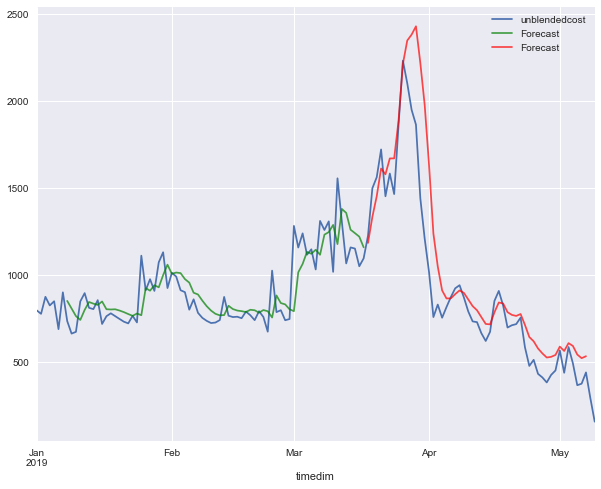

in sample
MAPE 16.75596916087935
rmse 131.27198116227382
out of sample
mape 41.744679460053355
rmse 236.09648885468613
[7, 32, 'relu', 0.0001]
Epoch 1/1000
69/69 [==============================] - 1s 12ms/sample - loss: 0.9105 - mean_squared_error: 0.9105
Epoch 2/1000
69/69 [==============================] - 0s 448us/sample - loss: 0.8910 - mean_squared_error: 0.8910
Epoch 3/1000
69/69 [==============================] - 0s 448us/sample - loss: 0.8723 - mean_squared_error: 0.8723
Epoch 4/1000
69/69 [==============================] - 0s 463us/sample - loss: 0.8539 - mean_squared_error: 0.8539
Epoch 5/1000
69/69 [==============================] - 0s 535us/sample - loss: 0.8368 - mean_squared_error: 0.8368
Epoch 6/1000
69/69 [==============================] - 0s 506us/sample - loss: 0.8194 - mean_squared_error: 0.8194
Epoch 7/1000
69/69 [==============================] - 0s 477us/sample - loss: 0.8024 - mean_squared_error: 0.8024
Epoch 8/1000
69/69 [==============================] - 0s 520

69/69 [==============================] - 0s 491us/sample - loss: 0.1409 - mean_squared_error: 0.1409
Epoch 71/1000
69/69 [==============================] - 0s 477us/sample - loss: 0.1381 - mean_squared_error: 0.1381
Epoch 72/1000
69/69 [==============================] - 0s 578us/sample - loss: 0.1354 - mean_squared_error: 0.1354
Epoch 73/1000
69/69 [==============================] - 0s 506us/sample - loss: 0.1326 - mean_squared_error: 0.1326
Epoch 74/1000
69/69 [==============================] - 0s 506us/sample - loss: 0.1299 - mean_squared_error: 0.1299
Epoch 75/1000
69/69 [==============================] - 0s 535us/sample - loss: 0.1271 - mean_squared_error: 0.1271
Epoch 76/1000
69/69 [==============================] - 0s 520us/sample - loss: 0.1244 - mean_squared_error: 0.1244
Epoch 77/1000
69/69 [==============================] - 0s 477us/sample - loss: 0.1218 - mean_squared_error: 0.1218
Epoch 78/1000
69/69 [==============================] - 0s 390us/sample - loss: 0.1193 - mean_s

69/69 [==============================] - 0s 448us/sample - loss: 0.0639 - mean_squared_error: 0.0639
Epoch 142/1000
69/69 [==============================] - 0s 477us/sample - loss: 0.0633 - mean_squared_error: 0.0633
Epoch 143/1000
69/69 [==============================] - 0s 463us/sample - loss: 0.0628 - mean_squared_error: 0.0628
Epoch 144/1000
69/69 [==============================] - 0s 593us/sample - loss: 0.0623 - mean_squared_error: 0.0623
Epoch 145/1000
69/69 [==============================] - 0s 549us/sample - loss: 0.0618 - mean_squared_error: 0.0618
Epoch 146/1000
69/69 [==============================] - 0s 622us/sample - loss: 0.0613 - mean_squared_error: 0.0613
Epoch 147/1000
69/69 [==============================] - 0s 520us/sample - loss: 0.0608 - mean_squared_error: 0.0608
Epoch 148/1000
69/69 [==============================] - 0s 549us/sample - loss: 0.0603 - mean_squared_error: 0.0603
Epoch 149/1000
69/69 [==============================] - 0s 549us/sample - loss: 0.0598 

69/69 [==============================] - 0s 448us/sample - loss: 0.0367 - mean_squared_error: 0.0367
Epoch 212/1000
69/69 [==============================] - 0s 434us/sample - loss: 0.0364 - mean_squared_error: 0.0364
Epoch 213/1000
69/69 [==============================] - 0s 477us/sample - loss: 0.0362 - mean_squared_error: 0.0362
Epoch 214/1000
69/69 [==============================] - 0s 491us/sample - loss: 0.0359 - mean_squared_error: 0.0359
Epoch 215/1000
69/69 [==============================] - 0s 535us/sample - loss: 0.0357 - mean_squared_error: 0.0357
Epoch 216/1000
69/69 [==============================] - 0s 448us/sample - loss: 0.0355 - mean_squared_error: 0.0355
Epoch 217/1000
69/69 [==============================] - 0s 520us/sample - loss: 0.0353 - mean_squared_error: 0.0353
Epoch 218/1000
69/69 [==============================] - 0s 448us/sample - loss: 0.0350 - mean_squared_error: 0.0350
Epoch 219/1000
69/69 [==============================] - 0s 477us/sample - loss: 0.0348 

69/69 [==============================] - 0s 477us/sample - loss: 0.0263 - mean_squared_error: 0.0263
Epoch 282/1000
69/69 [==============================] - 0s 593us/sample - loss: 0.0261 - mean_squared_error: 0.0261
Epoch 283/1000
69/69 [==============================] - 0s 578us/sample - loss: 0.0261 - mean_squared_error: 0.0261
Epoch 284/1000
69/69 [==============================] - 0s 520us/sample - loss: 0.0260 - mean_squared_error: 0.0260
Epoch 285/1000
69/69 [==============================] - 0s 463us/sample - loss: 0.0259 - mean_squared_error: 0.0259
Epoch 286/1000
69/69 [==============================] - 0s 448us/sample - loss: 0.0258 - mean_squared_error: 0.0258
Epoch 287/1000
69/69 [==============================] - 0s 477us/sample - loss: 0.0257 - mean_squared_error: 0.0257
Epoch 288/1000
69/69 [==============================] - 0s 491us/sample - loss: 0.0256 - mean_squared_error: 0.0256
Epoch 289/1000
69/69 [==============================] - 0s 463us/sample - loss: 0.0255 

69/69 [==============================] - 0s 520us/sample - loss: 0.0216 - mean_squared_error: 0.0216
Epoch 352/1000
69/69 [==============================] - 0s 405us/sample - loss: 0.0215 - mean_squared_error: 0.0215
Epoch 353/1000
69/69 [==============================] - 0s 405us/sample - loss: 0.0215 - mean_squared_error: 0.0215
Epoch 354/1000
69/69 [==============================] - 0s 477us/sample - loss: 0.0214 - mean_squared_error: 0.0214
Epoch 355/1000
69/69 [==============================] - 0s 578us/sample - loss: 0.0214 - mean_squared_error: 0.0214
Epoch 356/1000
69/69 [==============================] - 0s 448us/sample - loss: 0.0213 - mean_squared_error: 0.0213
Epoch 357/1000
69/69 [==============================] - 0s 491us/sample - loss: 0.0213 - mean_squared_error: 0.0213
Epoch 358/1000
69/69 [==============================] - 0s 520us/sample - loss: 0.0213 - mean_squared_error: 0.0213
Epoch 359/1000
69/69 [==============================] - 0s 491us/sample - loss: 0.0212 

69/69 [==============================] - 0s 434us/sample - loss: 0.0194 - mean_squared_error: 0.0194
Epoch 422/1000
69/69 [==============================] - 0s 419us/sample - loss: 0.0193 - mean_squared_error: 0.0193
Epoch 423/1000
69/69 [==============================] - 0s 463us/sample - loss: 0.0193 - mean_squared_error: 0.0193
Epoch 424/1000
69/69 [==============================] - 0s 477us/sample - loss: 0.0193 - mean_squared_error: 0.0193
Epoch 425/1000
69/69 [==============================] - 0s 463us/sample - loss: 0.0193 - mean_squared_error: 0.0193
Epoch 426/1000
69/69 [==============================] - 0s 448us/sample - loss: 0.0193 - mean_squared_error: 0.0193
Epoch 427/1000
69/69 [==============================] - 0s 477us/sample - loss: 0.0192 - mean_squared_error: 0.0192
Epoch 428/1000
69/69 [==============================] - 0s 564us/sample - loss: 0.0193 - mean_squared_error: 0.0193
Epoch 429/1000
69/69 [==============================] - 0s 390us/sample - loss: 0.0192 

69/69 [==============================] - 0s 520us/sample - loss: 0.0185 - mean_squared_error: 0.0185
Epoch 492/1000
69/69 [==============================] - 0s 506us/sample - loss: 0.0185 - mean_squared_error: 0.0185
Epoch 493/1000
69/69 [==============================] - 0s 578us/sample - loss: 0.0184 - mean_squared_error: 0.0184
Epoch 494/1000
69/69 [==============================] - 0s 506us/sample - loss: 0.0184 - mean_squared_error: 0.0184
Epoch 495/1000
69/69 [==============================] - 0s 607us/sample - loss: 0.0184 - mean_squared_error: 0.0184
Epoch 496/1000
69/69 [==============================] - 0s 564us/sample - loss: 0.0184 - mean_squared_error: 0.0184
Epoch 497/1000
69/69 [==============================] - 0s 491us/sample - loss: 0.0184 - mean_squared_error: 0.0184
Epoch 498/1000
69/69 [==============================] - 0s 564us/sample - loss: 0.0184 - mean_squared_error: 0.0184
Epoch 499/1000
69/69 [==============================] - 0s 448us/sample - loss: 0.0184 

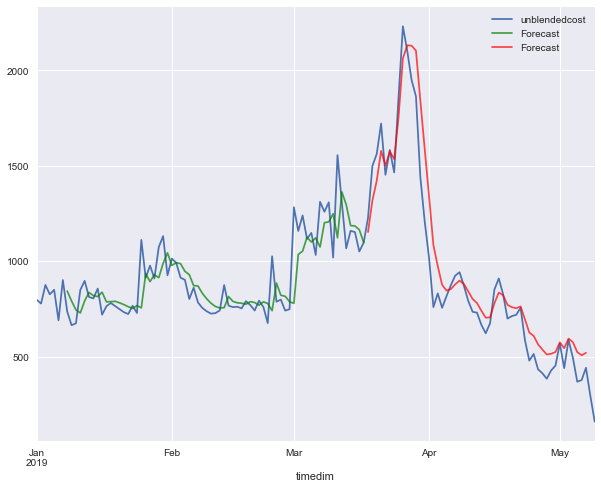

in sample
MAPE 16.31128637008756
rmse 129.05392578638038
out of sample
mape 39.53899976628693
rmse 138.72596534797233
[7, 32, 'relu', 0.0003]
Epoch 1/1000
69/69 [==============================] - 1s 12ms/sample - loss: 0.7994 - mean_squared_error: 0.7994
Epoch 2/1000
69/69 [==============================] - 0s 390us/sample - loss: 0.7193 - mean_squared_error: 0.7193
Epoch 3/1000
69/69 [==============================] - 0s 564us/sample - loss: 0.6437 - mean_squared_error: 0.6437
Epoch 4/1000
69/69 [==============================] - 0s 448us/sample - loss: 0.5716 - mean_squared_error: 0.5716
Epoch 5/1000
69/69 [==============================] - 0s 491us/sample - loss: 0.5047 - mean_squared_error: 0.5047
Epoch 6/1000
69/69 [==============================] - 0s 462us/sample - loss: 0.4412 - mean_squared_error: 0.4412
Epoch 7/1000
69/69 [==============================] - 0s 520us/sample - loss: 0.3825 - mean_squared_error: 0.3825
Epoch 8/1000
69/69 [==============================] - 0s 679u

69/69 [==============================] - 0s 506us/sample - loss: 0.0262 - mean_squared_error: 0.0262
Epoch 71/1000
69/69 [==============================] - 0s 419us/sample - loss: 0.0258 - mean_squared_error: 0.0258
Epoch 72/1000
69/69 [==============================] - 0s 434us/sample - loss: 0.0252 - mean_squared_error: 0.0252
Epoch 73/1000
69/69 [==============================] - 0s 564us/sample - loss: 0.0249 - mean_squared_error: 0.0249
Epoch 74/1000
69/69 [==============================] - 0s 448us/sample - loss: 0.0245 - mean_squared_error: 0.0245
Epoch 75/1000
69/69 [==============================] - 0s 651us/sample - loss: 0.0240 - mean_squared_error: 0.0240
Epoch 76/1000
69/69 [==============================] - 0s 506us/sample - loss: 0.0237 - mean_squared_error: 0.0237
Epoch 77/1000
69/69 [==============================] - 0s 520us/sample - loss: 0.0234 - mean_squared_error: 0.0234
Epoch 78/1000
69/69 [==============================] - 0s 491us/sample - loss: 0.0230 - mean_s

69/69 [==============================] - 0s 564us/sample - loss: 0.0185 - mean_squared_error: 0.0185
Epoch 142/1000
69/69 [==============================] - 0s 506us/sample - loss: 0.0182 - mean_squared_error: 0.0182
Epoch 143/1000
69/69 [==============================] - 0s 535us/sample - loss: 0.0183 - mean_squared_error: 0.0183
Epoch 144/1000
69/69 [==============================] - 0s 405us/sample - loss: 0.0182 - mean_squared_error: 0.0182
Epoch 145/1000
69/69 [==============================] - 0s 535us/sample - loss: 0.0182 - mean_squared_error: 0.0182
Epoch 00145: early stopping


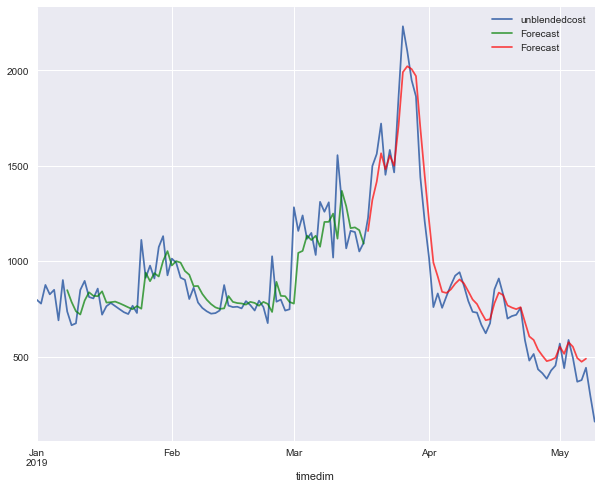

in sample
MAPE 16.521488778810394
rmse 129.3177362393649
out of sample
mape 39.96294464861357
rmse 104.50675175417395
[7, 32, 'relu', 0.001]
Epoch 1/1000
69/69 [==============================] - 1s 13ms/sample - loss: 0.9951 - mean_squared_error: 0.9951
Epoch 2/1000
69/69 [==============================] - 0s 448us/sample - loss: 0.8270 - mean_squared_error: 0.8270
Epoch 3/1000
69/69 [==============================] - 0s 491us/sample - loss: 0.6862 - mean_squared_error: 0.6862
Epoch 4/1000
69/69 [==============================] - 0s 535us/sample - loss: 0.5657 - mean_squared_error: 0.5657
Epoch 5/1000
69/69 [==============================] - 0s 535us/sample - loss: 0.4533 - mean_squared_error: 0.4533
Epoch 6/1000
69/69 [==============================] - 0s 578us/sample - loss: 0.3313 - mean_squared_error: 0.3313
Epoch 7/1000
69/69 [==============================] - 0s 665us/sample - loss: 0.2246 - mean_squared_error: 0.2246
Epoch 8/1000
69/69 [==============================] - 0s 578us

69/69 [==============================] - 0s 650us/sample - loss: 0.0177 - mean_squared_error: 0.0177
Epoch 71/1000
69/69 [==============================] - 0s 564us/sample - loss: 0.0178 - mean_squared_error: 0.0178
Epoch 72/1000
69/69 [==============================] - 0s 549us/sample - loss: 0.0180 - mean_squared_error: 0.0180
Epoch 73/1000
69/69 [==============================] - 0s 578us/sample - loss: 0.0179 - mean_squared_error: 0.0179
Epoch 74/1000
69/69 [==============================] - 0s 463us/sample - loss: 0.0178 - mean_squared_error: 0.0178
Epoch 75/1000
69/69 [==============================] - 0s 607us/sample - loss: 0.0176 - mean_squared_error: 0.0176
Epoch 76/1000
69/69 [==============================] - 0s 535us/sample - loss: 0.0177 - mean_squared_error: 0.0177
Epoch 77/1000
69/69 [==============================] - 0s 535us/sample - loss: 0.0177 - mean_squared_error: 0.0177
Epoch 78/1000
69/69 [==============================] - 0s 477us/sample - loss: 0.0176 - mean_s

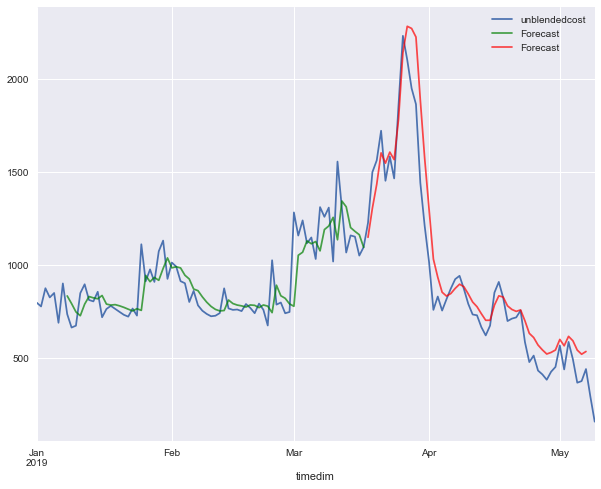

in sample
MAPE 16.643355755338362
rmse 128.02647572932514
out of sample
mape 39.424451096088745
rmse 149.18822836837327
[7, 32, 'relu', 0.003]
Epoch 1/1000
69/69 [==============================] - 1s 13ms/sample - loss: 0.6015 - mean_squared_error: 0.6015
Epoch 2/1000
69/69 [==============================] - 0s 462us/sample - loss: 0.2068 - mean_squared_error: 0.2068
Epoch 3/1000
69/69 [==============================] - 0s 564us/sample - loss: 0.1195 - mean_squared_error: 0.1195
Epoch 4/1000
69/69 [==============================] - 0s 433us/sample - loss: 0.1027 - mean_squared_error: 0.1027
Epoch 5/1000
69/69 [==============================] - 0s 463us/sample - loss: 0.0738 - mean_squared_error: 0.0738
Epoch 6/1000
69/69 [==============================] - 0s 491us/sample - loss: 0.0611 - mean_squared_error: 0.0611
Epoch 7/1000
69/69 [==============================] - 0s 419us/sample - loss: 0.0535 - mean_squared_error: 0.0535
Epoch 8/1000
69/69 [==============================] - 0s 564

69/69 [==============================] - 0s 434us/sample - loss: 0.0173 - mean_squared_error: 0.0173
Epoch 71/1000
69/69 [==============================] - 0s 477us/sample - loss: 0.0174 - mean_squared_error: 0.0174
Epoch 72/1000
69/69 [==============================] - 0s 448us/sample - loss: 0.0173 - mean_squared_error: 0.0173
Epoch 73/1000
69/69 [==============================] - 0s 607us/sample - loss: 0.0174 - mean_squared_error: 0.0174
Epoch 74/1000
69/69 [==============================] - 0s 463us/sample - loss: 0.0174 - mean_squared_error: 0.0174
Epoch 75/1000
69/69 [==============================] - 0s 549us/sample - loss: 0.0173 - mean_squared_error: 0.0173
Epoch 76/1000
69/69 [==============================] - 0s 520us/sample - loss: 0.0173 - mean_squared_error: 0.0173
Epoch 77/1000
69/69 [==============================] - 0s 491us/sample - loss: 0.0173 - mean_squared_error: 0.0173
Epoch 78/1000
69/69 [==============================] - 0s 549us/sample - loss: 0.0174 - mean_s

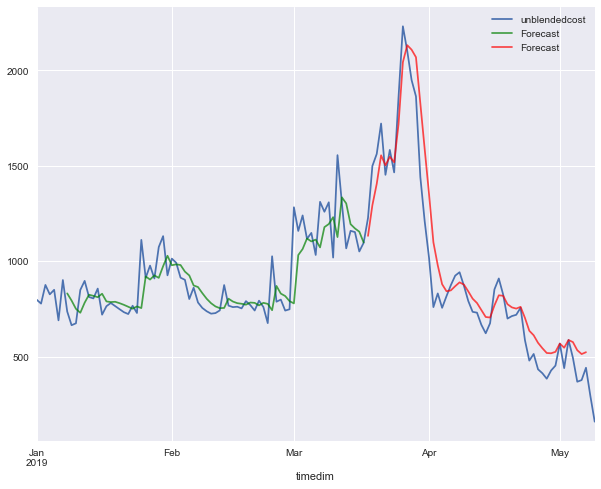

in sample
MAPE 16.348652273581436
rmse 127.90325552794442
out of sample
mape 39.38039708849013
rmse 142.20466897553575
[7, 32, 'relu', 0.01]
Epoch 1/1000
69/69 [==============================] - 1s 13ms/sample - loss: 0.8794 - mean_squared_error: 0.8794
Epoch 2/1000
69/69 [==============================] - 0s 650us/sample - loss: 0.8525 - mean_squared_error: 0.8525
Epoch 3/1000
69/69 [==============================] - 0s 795us/sample - loss: 0.8263 - mean_squared_error: 0.8263
Epoch 4/1000
69/69 [==============================] - 0s 694us/sample - loss: 0.8008 - mean_squared_error: 0.8008
Epoch 5/1000
69/69 [==============================] - 0s 708us/sample - loss: 0.7758 - mean_squared_error: 0.7758
Epoch 6/1000
69/69 [==============================] - 0s 824us/sample - loss: 0.7512 - mean_squared_error: 0.7512
Epoch 7/1000
69/69 [==============================] - 0s 665us/sample - loss: 0.7270 - mean_squared_error: 0.7270
Epoch 8/1000
69/69 [==============================] - 0s 723us

69/69 [==============================] - 0s 636us/sample - loss: 0.1828 - mean_squared_error: 0.1828
Epoch 71/1000
69/69 [==============================] - 0s 780us/sample - loss: 0.1815 - mean_squared_error: 0.1815
Epoch 72/1000
69/69 [==============================] - 0s 650us/sample - loss: 0.1801 - mean_squared_error: 0.1801
Epoch 73/1000
69/69 [==============================] - 0s 867us/sample - loss: 0.1788 - mean_squared_error: 0.1788
Epoch 74/1000
69/69 [==============================] - 0s 737us/sample - loss: 0.1775 - mean_squared_error: 0.1775
Epoch 75/1000
69/69 [==============================] - 0s 867us/sample - loss: 0.1762 - mean_squared_error: 0.1762
Epoch 76/1000
69/69 [==============================] - 0s 809us/sample - loss: 0.1749 - mean_squared_error: 0.1749
Epoch 77/1000
69/69 [==============================] - 0s 694us/sample - loss: 0.1736 - mean_squared_error: 0.1736
Epoch 78/1000
69/69 [==============================] - 0s 809us/sample - loss: 0.1723 - mean_s

69/69 [==============================] - 0s 752us/sample - loss: 0.1046 - mean_squared_error: 0.1046
Epoch 142/1000
69/69 [==============================] - 0s 766us/sample - loss: 0.1037 - mean_squared_error: 0.1037
Epoch 143/1000
69/69 [==============================] - 0s 665us/sample - loss: 0.1029 - mean_squared_error: 0.1029
Epoch 144/1000
69/69 [==============================] - 0s 723us/sample - loss: 0.1021 - mean_squared_error: 0.1021
Epoch 145/1000
69/69 [==============================] - 0s 752us/sample - loss: 0.1013 - mean_squared_error: 0.1013
Epoch 146/1000
69/69 [==============================] - 0s 665us/sample - loss: 0.1005 - mean_squared_error: 0.1005
Epoch 147/1000
69/69 [==============================] - 0s 737us/sample - loss: 0.0998 - mean_squared_error: 0.0998
Epoch 148/1000
69/69 [==============================] - 0s 665us/sample - loss: 0.0990 - mean_squared_error: 0.0990
Epoch 149/1000
69/69 [==============================] - 0s 780us/sample - loss: 0.0982 

69/69 [==============================] - 0s 737us/sample - loss: 0.0683 - mean_squared_error: 0.0683
Epoch 212/1000
69/69 [==============================] - 0s 766us/sample - loss: 0.0680 - mean_squared_error: 0.0680
Epoch 213/1000
69/69 [==============================] - 0s 723us/sample - loss: 0.0677 - mean_squared_error: 0.0677
Epoch 214/1000
69/69 [==============================] - 0s 679us/sample - loss: 0.0674 - mean_squared_error: 0.0674
Epoch 215/1000
69/69 [==============================] - 0s 752us/sample - loss: 0.0671 - mean_squared_error: 0.0671
Epoch 216/1000
69/69 [==============================] - 0s 737us/sample - loss: 0.0668 - mean_squared_error: 0.0668
Epoch 217/1000
69/69 [==============================] - 0s 694us/sample - loss: 0.0665 - mean_squared_error: 0.0665
Epoch 218/1000
69/69 [==============================] - 0s 737us/sample - loss: 0.0662 - mean_squared_error: 0.0662
Epoch 219/1000
69/69 [==============================] - 0s 737us/sample - loss: 0.0660 

69/69 [==============================] - 0s 766us/sample - loss: 0.0511 - mean_squared_error: 0.0511
Epoch 282/1000
69/69 [==============================] - 0s 665us/sample - loss: 0.0509 - mean_squared_error: 0.0509
Epoch 283/1000
69/69 [==============================] - 0s 665us/sample - loss: 0.0507 - mean_squared_error: 0.0507
Epoch 284/1000
69/69 [==============================] - 0s 838us/sample - loss: 0.0505 - mean_squared_error: 0.0505
Epoch 285/1000
69/69 [==============================] - 0s 665us/sample - loss: 0.0503 - mean_squared_error: 0.0503
Epoch 286/1000
69/69 [==============================] - 0s 636us/sample - loss: 0.0501 - mean_squared_error: 0.0501
Epoch 287/1000
69/69 [==============================] - 0s 636us/sample - loss: 0.0499 - mean_squared_error: 0.0499
Epoch 288/1000
69/69 [==============================] - 0s 809us/sample - loss: 0.0497 - mean_squared_error: 0.0497
Epoch 289/1000
69/69 [==============================] - 0s 853us/sample - loss: 0.0495 

69/69 [==============================] - 0s 665us/sample - loss: 0.0390 - mean_squared_error: 0.0390
Epoch 352/1000
69/69 [==============================] - 0s 795us/sample - loss: 0.0388 - mean_squared_error: 0.0388
Epoch 353/1000
69/69 [==============================] - 0s 795us/sample - loss: 0.0387 - mean_squared_error: 0.0387
Epoch 354/1000
69/69 [==============================] - 0s 694us/sample - loss: 0.0385 - mean_squared_error: 0.0385
Epoch 355/1000
69/69 [==============================] - 0s 737us/sample - loss: 0.0384 - mean_squared_error: 0.0384
Epoch 356/1000
69/69 [==============================] - 0s 708us/sample - loss: 0.0382 - mean_squared_error: 0.0382
Epoch 357/1000
69/69 [==============================] - 0s 737us/sample - loss: 0.0381 - mean_squared_error: 0.0381
Epoch 358/1000
69/69 [==============================] - 0s 694us/sample - loss: 0.0379 - mean_squared_error: 0.0379
Epoch 359/1000
69/69 [==============================] - 0s 622us/sample - loss: 0.0378 

69/69 [==============================] - 0s 665us/sample - loss: 0.0305 - mean_squared_error: 0.0305
Epoch 422/1000
69/69 [==============================] - 0s 781us/sample - loss: 0.0304 - mean_squared_error: 0.0304
Epoch 423/1000
69/69 [==============================] - 0s 665us/sample - loss: 0.0303 - mean_squared_error: 0.0303
Epoch 424/1000
69/69 [==============================] - 0s 694us/sample - loss: 0.0302 - mean_squared_error: 0.0302
Epoch 425/1000
69/69 [==============================] - 0s 665us/sample - loss: 0.0301 - mean_squared_error: 0.0301
Epoch 426/1000
69/69 [==============================] - 0s 650us/sample - loss: 0.0300 - mean_squared_error: 0.0300
Epoch 427/1000
69/69 [==============================] - 0s 708us/sample - loss: 0.0299 - mean_squared_error: 0.0299
Epoch 428/1000
69/69 [==============================] - 0s 737us/sample - loss: 0.0298 - mean_squared_error: 0.0298
Epoch 429/1000
69/69 [==============================] - 0s 679us/sample - loss: 0.0297 

69/69 [==============================] - 0s 694us/sample - loss: 0.0250 - mean_squared_error: 0.0250
Epoch 492/1000
69/69 [==============================] - 0s 766us/sample - loss: 0.0249 - mean_squared_error: 0.0249
Epoch 493/1000
69/69 [==============================] - 0s 708us/sample - loss: 0.0249 - mean_squared_error: 0.0249
Epoch 494/1000
69/69 [==============================] - 0s 737us/sample - loss: 0.0248 - mean_squared_error: 0.0248
Epoch 495/1000
69/69 [==============================] - 0s 723us/sample - loss: 0.0247 - mean_squared_error: 0.0247
Epoch 496/1000
69/69 [==============================] - 0s 781us/sample - loss: 0.0247 - mean_squared_error: 0.0247
Epoch 497/1000
69/69 [==============================] - 0s 650us/sample - loss: 0.0246 - mean_squared_error: 0.0246
Epoch 498/1000
69/69 [==============================] - 0s 781us/sample - loss: 0.0246 - mean_squared_error: 0.0246
Epoch 499/1000
69/69 [==============================] - 0s 737us/sample - loss: 0.0245 

69/69 [==============================] - 0s 795us/sample - loss: 0.0216 - mean_squared_error: 0.0216
Epoch 562/1000
69/69 [==============================] - 0s 665us/sample - loss: 0.0216 - mean_squared_error: 0.0216
Epoch 563/1000
69/69 [==============================] - 0s 679us/sample - loss: 0.0216 - mean_squared_error: 0.0216
Epoch 564/1000
69/69 [==============================] - 0s 809us/sample - loss: 0.0215 - mean_squared_error: 0.0215
Epoch 565/1000
69/69 [==============================] - 0s 752us/sample - loss: 0.0215 - mean_squared_error: 0.0215
Epoch 566/1000
69/69 [==============================] - 0s 809us/sample - loss: 0.0215 - mean_squared_error: 0.0215
Epoch 567/1000
69/69 [==============================] - 0s 795us/sample - loss: 0.0214 - mean_squared_error: 0.0214
Epoch 568/1000
69/69 [==============================] - 0s 694us/sample - loss: 0.0214 - mean_squared_error: 0.0214
Epoch 569/1000
69/69 [==============================] - 0s 853us/sample - loss: 0.0214 

69/69 [==============================] - 0s 694us/sample - loss: 0.0197 - mean_squared_error: 0.0197
Epoch 632/1000
69/69 [==============================] - 0s 723us/sample - loss: 0.0197 - mean_squared_error: 0.0197
Epoch 633/1000
69/69 [==============================] - 0s 708us/sample - loss: 0.0197 - mean_squared_error: 0.0197
Epoch 634/1000
69/69 [==============================] - 0s 737us/sample - loss: 0.0196 - mean_squared_error: 0.0196
Epoch 635/1000
69/69 [==============================] - 0s 694us/sample - loss: 0.0196 - mean_squared_error: 0.0196
Epoch 636/1000
69/69 [==============================] - 0s 723us/sample - loss: 0.0196 - mean_squared_error: 0.0196
Epoch 637/1000
69/69 [==============================] - 0s 650us/sample - loss: 0.0196 - mean_squared_error: 0.0196
Epoch 638/1000
69/69 [==============================] - 0s 708us/sample - loss: 0.0196 - mean_squared_error: 0.0196
Epoch 639/1000
69/69 [==============================] - 0s 723us/sample - loss: 0.0195 

69/69 [==============================] - 0s 665us/sample - loss: 0.0186 - mean_squared_error: 0.0186
Epoch 702/1000
69/69 [==============================] - 0s 593us/sample - loss: 0.0186 - mean_squared_error: 0.0186
Epoch 703/1000
69/69 [==============================] - 0s 694us/sample - loss: 0.0186 - mean_squared_error: 0.0186
Epoch 704/1000
69/69 [==============================] - 0s 809us/sample - loss: 0.0186 - mean_squared_error: 0.0186
Epoch 705/1000
69/69 [==============================] - 0s 723us/sample - loss: 0.0186 - mean_squared_error: 0.0186
Epoch 706/1000
69/69 [==============================] - 0s 650us/sample - loss: 0.0186 - mean_squared_error: 0.0186
Epoch 707/1000
69/69 [==============================] - 0s 795us/sample - loss: 0.0186 - mean_squared_error: 0.0186
Epoch 708/1000
69/69 [==============================] - 0s 737us/sample - loss: 0.0186 - mean_squared_error: 0.0186
Epoch 709/1000
69/69 [==============================] - 0s 622us/sample - loss: 0.0186 

69/69 [==============================] - 0s 694us/sample - loss: 0.0182 - mean_squared_error: 0.0182
Epoch 772/1000
69/69 [==============================] - 0s 636us/sample - loss: 0.0182 - mean_squared_error: 0.0182
Epoch 773/1000
69/69 [==============================] - 0s 809us/sample - loss: 0.0182 - mean_squared_error: 0.0182
Epoch 774/1000
69/69 [==============================] - 0s 723us/sample - loss: 0.0181 - mean_squared_error: 0.0181
Epoch 775/1000
69/69 [==============================] - 0s 593us/sample - loss: 0.0181 - mean_squared_error: 0.0181
Epoch 776/1000
69/69 [==============================] - 0s 824us/sample - loss: 0.0181 - mean_squared_error: 0.0181
Epoch 777/1000
69/69 [==============================] - 0s 636us/sample - loss: 0.0181 - mean_squared_error: 0.0181
Epoch 778/1000
69/69 [==============================] - 0s 737us/sample - loss: 0.0181 - mean_squared_error: 0.0181
Epoch 779/1000
69/69 [==============================] - 0s 737us/sample - loss: 0.0181 

69/69 [==============================] - 0s 737us/sample - loss: 0.0180 - mean_squared_error: 0.0180
Epoch 842/1000
69/69 [==============================] - 0s 766us/sample - loss: 0.0180 - mean_squared_error: 0.0180
Epoch 843/1000
69/69 [==============================] - 0s 650us/sample - loss: 0.0180 - mean_squared_error: 0.0180
Epoch 844/1000
69/69 [==============================] - 0s 737us/sample - loss: 0.0180 - mean_squared_error: 0.0180
Epoch 845/1000
69/69 [==============================] - 0s 781us/sample - loss: 0.0179 - mean_squared_error: 0.0179
Epoch 846/1000
69/69 [==============================] - 0s 867us/sample - loss: 0.0179 - mean_squared_error: 0.0179
Epoch 847/1000
69/69 [==============================] - 0s 954us/sample - loss: 0.0179 - mean_squared_error: 0.0179
Epoch 848/1000
69/69 [==============================] - 0s 867us/sample - loss: 0.0179 - mean_squared_error: 0.0179
Epoch 849/1000
69/69 [==============================] - 0s 781us/sample - loss: 0.0179 

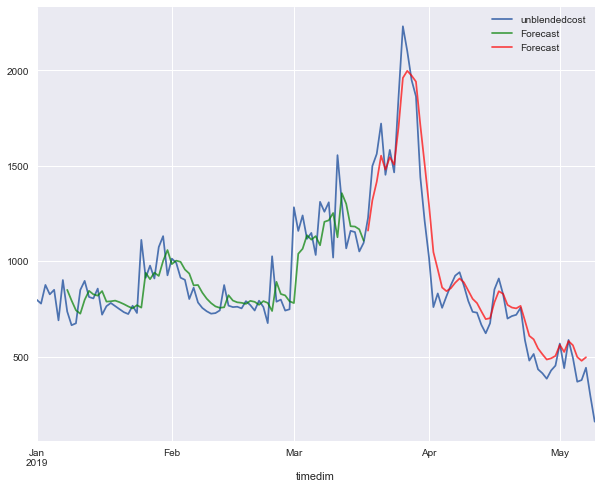

in sample
MAPE 16.6262701741697
rmse 129.0394119737899
out of sample
mape 40.15205887457588
rmse 117.97471933767538
[7, 64, 'tanh', 0.0001]
Epoch 1/1000
69/69 [==============================] - 1s 17ms/sample - loss: 1.0048 - mean_squared_error: 1.0048
Epoch 2/1000
69/69 [==============================] - 0s 709us/sample - loss: 0.9359 - mean_squared_error: 0.9359
Epoch 3/1000
69/69 [==============================] - 0s 1ms/sample - loss: 0.8703 - mean_squared_error: 0.8703
Epoch 4/1000
69/69 [==============================] - 0s 997us/sample - loss: 0.8076 - mean_squared_error: 0.8076
Epoch 5/1000
69/69 [==============================] - 0s 1ms/sample - loss: 0.7479 - mean_squared_error: 0.7479
Epoch 6/1000
69/69 [==============================] - 0s 1ms/sample - loss: 0.6880 - mean_squared_error: 0.6880
Epoch 7/1000
69/69 [==============================] - 0s 1ms/sample - loss: 0.6326 - mean_squared_error: 0.6326
Epoch 8/1000
69/69 [==============================] - 0s 824us/sample -

69/69 [==============================] - 0s 737us/sample - loss: 0.0800 - mean_squared_error: 0.0800
Epoch 71/1000
69/69 [==============================] - 0s 838us/sample - loss: 0.0789 - mean_squared_error: 0.0789
Epoch 72/1000
69/69 [==============================] - 0s 781us/sample - loss: 0.0778 - mean_squared_error: 0.0778
Epoch 73/1000
69/69 [==============================] - 0s 728us/sample - loss: 0.0769 - mean_squared_error: 0.0769
Epoch 74/1000
69/69 [==============================] - 0s 650us/sample - loss: 0.0758 - mean_squared_error: 0.0758
Epoch 75/1000
69/69 [==============================] - 0s 723us/sample - loss: 0.0749 - mean_squared_error: 0.0749
Epoch 76/1000
69/69 [==============================] - 0s 1ms/sample - loss: 0.0740 - mean_squared_error: 0.0740
Epoch 77/1000
69/69 [==============================] - 0s 911us/sample - loss: 0.0731 - mean_squared_error: 0.0731
Epoch 78/1000
69/69 [==============================] - 0s 1ms/sample - loss: 0.0723 - mean_squar

69/69 [==============================] - 0s 636us/sample - loss: 0.0380 - mean_squared_error: 0.0380
Epoch 142/1000
69/69 [==============================] - 0s 607us/sample - loss: 0.0376 - mean_squared_error: 0.0376
Epoch 143/1000
69/69 [==============================] - 0s 578us/sample - loss: 0.0373 - mean_squared_error: 0.0373
Epoch 144/1000
69/69 [==============================] - 0s 607us/sample - loss: 0.0370 - mean_squared_error: 0.0370
Epoch 145/1000
69/69 [==============================] - 0s 636us/sample - loss: 0.0366 - mean_squared_error: 0.0366
Epoch 146/1000
69/69 [==============================] - 0s 636us/sample - loss: 0.0363 - mean_squared_error: 0.0363
Epoch 147/1000
69/69 [==============================] - 0s 723us/sample - loss: 0.0360 - mean_squared_error: 0.0360
Epoch 148/1000
69/69 [==============================] - 0s 766us/sample - loss: 0.0357 - mean_squared_error: 0.0357
Epoch 149/1000
69/69 [==============================] - 0s 781us/sample - loss: 0.0354 

69/69 [==============================] - 0s 535us/sample - loss: 0.0235 - mean_squared_error: 0.0235
Epoch 212/1000
69/69 [==============================] - 0s 564us/sample - loss: 0.0234 - mean_squared_error: 0.0234
Epoch 213/1000
69/69 [==============================] - 0s 564us/sample - loss: 0.0233 - mean_squared_error: 0.0233
Epoch 214/1000
69/69 [==============================] - 0s 564us/sample - loss: 0.0232 - mean_squared_error: 0.0232
Epoch 215/1000
69/69 [==============================] - 0s 535us/sample - loss: 0.0231 - mean_squared_error: 0.0231
Epoch 216/1000
69/69 [==============================] - 0s 535us/sample - loss: 0.0230 - mean_squared_error: 0.0230
Epoch 217/1000
69/69 [==============================] - 0s 549us/sample - loss: 0.0229 - mean_squared_error: 0.0229
Epoch 218/1000
69/69 [==============================] - 0s 549us/sample - loss: 0.0228 - mean_squared_error: 0.0228
Epoch 219/1000
69/69 [==============================] - 0s 549us/sample - loss: 0.0227 

69/69 [==============================] - 0s 752us/sample - loss: 0.0189 - mean_squared_error: 0.0189
Epoch 282/1000
69/69 [==============================] - 0s 737us/sample - loss: 0.0188 - mean_squared_error: 0.0188
Epoch 283/1000
69/69 [==============================] - 0s 737us/sample - loss: 0.0188 - mean_squared_error: 0.0188
Epoch 284/1000
69/69 [==============================] - 0s 723us/sample - loss: 0.0187 - mean_squared_error: 0.0187
Epoch 285/1000
69/69 [==============================] - 0s 867us/sample - loss: 0.0187 - mean_squared_error: 0.0187
Epoch 286/1000
69/69 [==============================] - 0s 867us/sample - loss: 0.0187 - mean_squared_error: 0.0187
Epoch 287/1000
69/69 [==============================] - 0s 708us/sample - loss: 0.0187 - mean_squared_error: 0.0187
Epoch 288/1000
69/69 [==============================] - 0s 780us/sample - loss: 0.0186 - mean_squared_error: 0.0186
Epoch 289/1000
69/69 [==============================] - 0s 607us/sample - loss: 0.0186 

69/69 [==============================] - 0s 997us/sample - loss: 0.0179 - mean_squared_error: 0.0179
Epoch 352/1000
69/69 [==============================] - 0s 954us/sample - loss: 0.0179 - mean_squared_error: 0.0179
Epoch 353/1000
69/69 [==============================] - 0s 896us/sample - loss: 0.0179 - mean_squared_error: 0.0179
Epoch 354/1000
69/69 [==============================] - 0s 997us/sample - loss: 0.0179 - mean_squared_error: 0.0179
Epoch 355/1000
69/69 [==============================] - 0s 1ms/sample - loss: 0.0179 - mean_squared_error: 0.0179
Epoch 356/1000
69/69 [==============================] - 0s 781us/sample - loss: 0.0179 - mean_squared_error: 0.0179
Epoch 357/1000
69/69 [==============================] - 0s 723us/sample - loss: 0.0179 - mean_squared_error: 0.0179
Epoch 358/1000
69/69 [==============================] - 0s 723us/sample - loss: 0.0179 - mean_squared_error: 0.0179
Epoch 359/1000
69/69 [==============================] - 0s 737us/sample - loss: 0.0179 - 

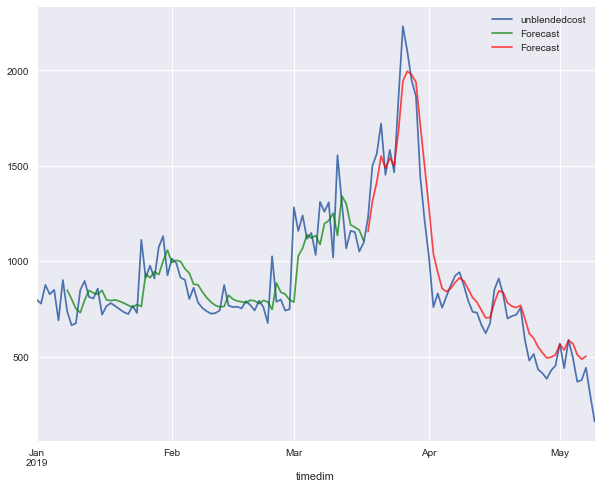

in sample
MAPE 16.547777378863334
rmse 128.34572492854306
out of sample
mape 39.825402188419986
rmse 119.9367509878991
[7, 64, 'tanh', 0.0003]
Epoch 1/1000
69/69 [==============================] - 1s 16ms/sample - loss: 0.5665 - mean_squared_error: 0.5665
Epoch 2/1000
69/69 [==============================] - 0s 607us/sample - loss: 0.4022 - mean_squared_error: 0.4022
Epoch 3/1000
69/69 [==============================] - 0s 607us/sample - loss: 0.2714 - mean_squared_error: 0.2714
Epoch 4/1000
69/69 [==============================] - 0s 593us/sample - loss: 0.1865 - mean_squared_error: 0.1865
Epoch 5/1000
69/69 [==============================] - 0s 607us/sample - loss: 0.1690 - mean_squared_error: 0.1690
Epoch 6/1000
69/69 [==============================] - 0s 607us/sample - loss: 0.1641 - mean_squared_error: 0.1641
Epoch 7/1000
69/69 [==============================] - 0s 636us/sample - loss: 0.1431 - mean_squared_error: 0.1431
Epoch 8/1000
69/69 [==============================] - 0s 694

69/69 [==============================] - 0s 752us/sample - loss: 0.0203 - mean_squared_error: 0.0203
Epoch 71/1000
69/69 [==============================] - 0s 708us/sample - loss: 0.0203 - mean_squared_error: 0.0203
Epoch 72/1000
69/69 [==============================] - 0s 679us/sample - loss: 0.0201 - mean_squared_error: 0.0201
Epoch 73/1000
69/69 [==============================] - 0s 939us/sample - loss: 0.0198 - mean_squared_error: 0.0198
Epoch 74/1000
69/69 [==============================] - 0s 824us/sample - loss: 0.0197 - mean_squared_error: 0.0197
Epoch 75/1000
69/69 [==============================] - 0s 809us/sample - loss: 0.0196 - mean_squared_error: 0.0196
Epoch 76/1000
69/69 [==============================] - 0s 694us/sample - loss: 0.0194 - mean_squared_error: 0.0194
Epoch 77/1000
69/69 [==============================] - 0s 925us/sample - loss: 0.0194 - mean_squared_error: 0.0194
Epoch 78/1000
69/69 [==============================] - 0s 824us/sample - loss: 0.0192 - mean_s

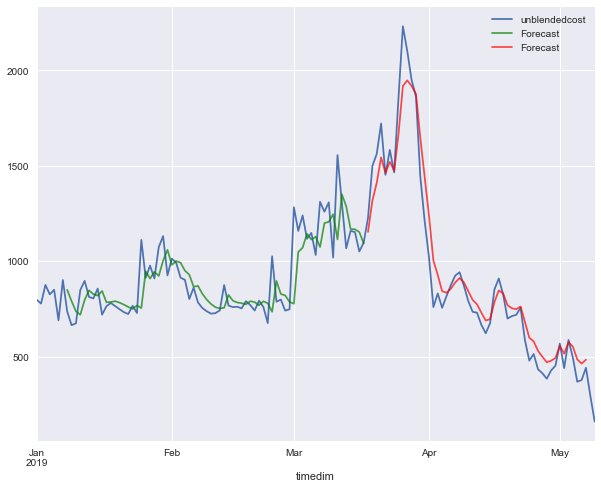

in sample
MAPE 16.73148043812256
rmse 129.01667437653396
out of sample
mape 40.10588108362395
rmse 108.55571813638096
[7, 64, 'tanh', 0.001]
Epoch 1/1000
69/69 [==============================] - 1s 21ms/sample - loss: 0.4950 - mean_squared_error: 0.4950
Epoch 2/1000
69/69 [==============================] - 0s 1ms/sample - loss: 0.1993 - mean_squared_error: 0.1993
Epoch 3/1000
69/69 [==============================] - 0s 997us/sample - loss: 0.1564 - mean_squared_error: 0.1564
Epoch 4/1000
69/69 [==============================] - 0s 824us/sample - loss: 0.1118 - mean_squared_error: 0.1118
Epoch 5/1000
69/69 [==============================] - 0s 795us/sample - loss: 0.1008 - mean_squared_error: 0.1008
Epoch 6/1000
69/69 [==============================] - 0s 838us/sample - loss: 0.0759 - mean_squared_error: 0.0759
Epoch 7/1000
69/69 [==============================] - 0s 896us/sample - loss: 0.0648 - mean_squared_error: 0.0648
Epoch 8/1000
69/69 [==============================] - 0s 983us/s

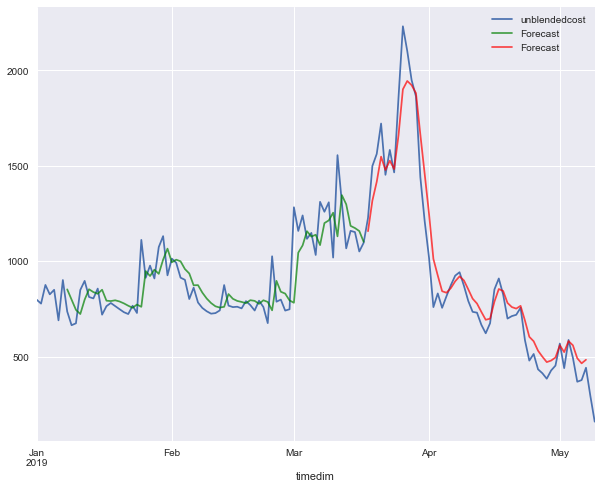

in sample
MAPE 16.760675016817924
rmse 128.54218318107132
out of sample
mape 40.15871677755257
rmse 112.78391645635098
[7, 64, 'tanh', 0.003]
Epoch 1/1000
69/69 [==============================] - 3s 38ms/sample - loss: 0.3515 - mean_squared_error: 0.3515
Epoch 2/1000
69/69 [==============================] - 0s 716us/sample - loss: 0.1065 - mean_squared_error: 0.1065
Epoch 3/1000
69/69 [==============================] - 0s 780us/sample - loss: 0.0585 - mean_squared_error: 0.0585
Epoch 4/1000
69/69 [==============================] - 0s 716us/sample - loss: 0.0480 - mean_squared_error: 0.0480
Epoch 5/1000
69/69 [==============================] - 0s 809us/sample - loss: 0.0315 - mean_squared_error: 0.0315
Epoch 6/1000
69/69 [==============================] - 0s 795us/sample - loss: 0.0275 - mean_squared_error: 0.0275
Epoch 7/1000
69/69 [==============================] - 0s 708us/sample - loss: 0.0247 - mean_squared_error: 0.0247
Epoch 8/1000
69/69 [==============================] - 0s 708u

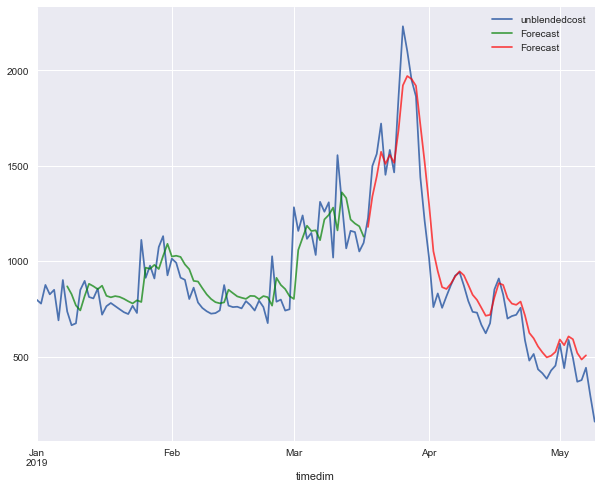

in sample
MAPE 17.100430016839834
rmse 131.05092729615856
out of sample
mape 40.4046490988976
rmse 125.40343306762136
[7, 64, 'tanh', 0.01]
Epoch 1/1000
69/69 [==============================] - 1s 20ms/sample - loss: 0.8133 - mean_squared_error: 0.8133
Epoch 2/1000
69/69 [==============================] - 0s 665us/sample - loss: 0.8057 - mean_squared_error: 0.8057
Epoch 3/1000
69/69 [==============================] - 0s 687us/sample - loss: 0.7979 - mean_squared_error: 0.7979
Epoch 4/1000
69/69 [==============================] - 0s 752us/sample - loss: 0.7904 - mean_squared_error: 0.7904
Epoch 5/1000
69/69 [==============================] - 0s 807us/sample - loss: 0.7827 - mean_squared_error: 0.7827
Epoch 6/1000
69/69 [==============================] - 0s 708us/sample - loss: 0.7750 - mean_squared_error: 0.7750
Epoch 7/1000
69/69 [==============================] - 0s 716us/sample - loss: 0.7675 - mean_squared_error: 0.7675
Epoch 8/1000
69/69 [==============================] - 0s 737us/

69/69 [==============================] - 0s 896us/sample - loss: 0.2744 - mean_squared_error: 0.2744
Epoch 71/1000
69/69 [==============================] - 0s 940us/sample - loss: 0.2686 - mean_squared_error: 0.2686
Epoch 72/1000
69/69 [==============================] - 0s 737us/sample - loss: 0.2634 - mean_squared_error: 0.2634
Epoch 73/1000
69/69 [==============================] - 0s 851us/sample - loss: 0.2585 - mean_squared_error: 0.2585
Epoch 74/1000
69/69 [==============================] - 0s 954us/sample - loss: 0.2542 - mean_squared_error: 0.2542
Epoch 75/1000
69/69 [==============================] - 0s 824us/sample - loss: 0.2505 - mean_squared_error: 0.2505
Epoch 76/1000
69/69 [==============================] - 0s 766us/sample - loss: 0.2469 - mean_squared_error: 0.2469
Epoch 77/1000
69/69 [==============================] - 0s 817us/sample - loss: 0.2440 - mean_squared_error: 0.2440
Epoch 78/1000
69/69 [==============================] - 0s 867us/sample - loss: 0.2415 - mean_s

69/69 [==============================] - 0s 694us/sample - loss: 0.1478 - mean_squared_error: 0.1478
Epoch 141/1000
69/69 [==============================] - 0s 774us/sample - loss: 0.1468 - mean_squared_error: 0.1468
Epoch 142/1000
69/69 [==============================] - 0s 802us/sample - loss: 0.1459 - mean_squared_error: 0.1459
Epoch 143/1000
69/69 [==============================] - 0s 968us/sample - loss: 0.1449 - mean_squared_error: 0.1449
Epoch 144/1000
69/69 [==============================] - 0s 853us/sample - loss: 0.1440 - mean_squared_error: 0.1440
Epoch 145/1000
69/69 [==============================] - 0s 766us/sample - loss: 0.1431 - mean_squared_error: 0.1431
Epoch 146/1000
69/69 [==============================] - 0s 752us/sample - loss: 0.1424 - mean_squared_error: 0.1424
Epoch 147/1000
69/69 [==============================] - 0s 1ms/sample - loss: 0.1417 - mean_squared_error: 0.1417
Epoch 148/1000
69/69 [==============================] - 0s 997us/sample - loss: 0.1409 - 

Epoch 211/1000
69/69 [==============================] - 0s 824us/sample - loss: 0.1075 - mean_squared_error: 0.1075
Epoch 212/1000
69/69 [==============================] - 0s 723us/sample - loss: 0.1071 - mean_squared_error: 0.1071
Epoch 213/1000
69/69 [==============================] - 0s 809us/sample - loss: 0.1066 - mean_squared_error: 0.1066
Epoch 214/1000
69/69 [==============================] - 0s 853us/sample - loss: 0.1063 - mean_squared_error: 0.1063
Epoch 215/1000
69/69 [==============================] - 0s 781us/sample - loss: 0.1058 - mean_squared_error: 0.1058
Epoch 216/1000
69/69 [==============================] - 0s 708us/sample - loss: 0.1053 - mean_squared_error: 0.1053
Epoch 217/1000
69/69 [==============================] - 0s 867us/sample - loss: 0.1048 - mean_squared_error: 0.1048
Epoch 218/1000
69/69 [==============================] - 0s 824us/sample - loss: 0.1044 - mean_squared_error: 0.1044
Epoch 219/1000
69/69 [==============================] - 0s 838us/sample 

69/69 [==============================] - 0s 781us/sample - loss: 0.0797 - mean_squared_error: 0.0797
Epoch 282/1000
69/69 [==============================] - 0s 824us/sample - loss: 0.0794 - mean_squared_error: 0.0794
Epoch 283/1000
69/69 [==============================] - 0s 896us/sample - loss: 0.0791 - mean_squared_error: 0.0791
Epoch 284/1000
69/69 [==============================] - 0s 824us/sample - loss: 0.0788 - mean_squared_error: 0.0788
Epoch 285/1000
69/69 [==============================] - 0s 795us/sample - loss: 0.0785 - mean_squared_error: 0.0785
Epoch 286/1000
69/69 [==============================] - 0s 795us/sample - loss: 0.0782 - mean_squared_error: 0.0782
Epoch 287/1000
69/69 [==============================] - 0s 838us/sample - loss: 0.0779 - mean_squared_error: 0.0779
Epoch 288/1000
69/69 [==============================] - 0s 809us/sample - loss: 0.0775 - mean_squared_error: 0.0775
Epoch 289/1000
69/69 [==============================] - 0s 824us/sample - loss: 0.0772 

69/69 [==============================] - 0s 1ms/sample - loss: 0.0626 - mean_squared_error: 0.0626
Epoch 352/1000
69/69 [==============================] - 0s 1ms/sample - loss: 0.0624 - mean_squared_error: 0.0624
Epoch 353/1000
69/69 [==============================] - 0s 1ms/sample - loss: 0.0622 - mean_squared_error: 0.0622
Epoch 354/1000
69/69 [==============================] - 0s 838us/sample - loss: 0.0619 - mean_squared_error: 0.0619
Epoch 355/1000
69/69 [==============================] - 0s 867us/sample - loss: 0.0617 - mean_squared_error: 0.0617
Epoch 356/1000
69/69 [==============================] - 0s 853us/sample - loss: 0.0616 - mean_squared_error: 0.0616
Epoch 357/1000
69/69 [==============================] - 0s 911us/sample - loss: 0.0614 - mean_squared_error: 0.0614
Epoch 358/1000
69/69 [==============================] - 0s 896us/sample - loss: 0.0612 - mean_squared_error: 0.0612
Epoch 359/1000
69/69 [==============================] - 0s 983us/sample - loss: 0.0610 - mean

69/69 [==============================] - 0s 1ms/sample - loss: 0.0510 - mean_squared_error: 0.0510
Epoch 422/1000
69/69 [==============================] - 0s 1ms/sample - loss: 0.0508 - mean_squared_error: 0.0508
Epoch 423/1000
69/69 [==============================] - 0s 867us/sample - loss: 0.0506 - mean_squared_error: 0.0506
Epoch 424/1000
69/69 [==============================] - 0s 853us/sample - loss: 0.0505 - mean_squared_error: 0.0505
Epoch 425/1000
69/69 [==============================] - 0s 824us/sample - loss: 0.0504 - mean_squared_error: 0.0504
Epoch 426/1000
69/69 [==============================] - 0s 737us/sample - loss: 0.0503 - mean_squared_error: 0.0503
Epoch 427/1000
69/69 [==============================] - 0s 766us/sample - loss: 0.0502 - mean_squared_error: 0.0502
Epoch 428/1000
69/69 [==============================] - 0s 679us/sample - loss: 0.0500 - mean_squared_error: 0.0500
Epoch 429/1000
69/69 [==============================] - 0s 737us/sample - loss: 0.0498 - me

69/69 [==============================] - 0s 824us/sample - loss: 0.0420 - mean_squared_error: 0.0420
Epoch 492/1000
69/69 [==============================] - 0s 781us/sample - loss: 0.0419 - mean_squared_error: 0.0419
Epoch 493/1000
69/69 [==============================] - 0s 882us/sample - loss: 0.0418 - mean_squared_error: 0.0418
Epoch 494/1000
69/69 [==============================] - 0s 838us/sample - loss: 0.0416 - mean_squared_error: 0.0416
Epoch 495/1000
69/69 [==============================] - 0s 781us/sample - loss: 0.0415 - mean_squared_error: 0.0415
Epoch 496/1000
69/69 [==============================] - 0s 925us/sample - loss: 0.0414 - mean_squared_error: 0.0414
Epoch 497/1000
69/69 [==============================] - 0s 968us/sample - loss: 0.0413 - mean_squared_error: 0.0413
Epoch 498/1000
69/69 [==============================] - 0s 781us/sample - loss: 0.0412 - mean_squared_error: 0.0412
Epoch 499/1000
69/69 [==============================] - 0s 954us/sample - loss: 0.0411 

69/69 [==============================] - 0s 983us/sample - loss: 0.0348 - mean_squared_error: 0.0348
Epoch 562/1000
69/69 [==============================] - 0s 1ms/sample - loss: 0.0346 - mean_squared_error: 0.0346
Epoch 563/1000
69/69 [==============================] - 0s 940us/sample - loss: 0.0346 - mean_squared_error: 0.0346
Epoch 564/1000
69/69 [==============================] - 0s 1ms/sample - loss: 0.0345 - mean_squared_error: 0.0345
Epoch 565/1000
69/69 [==============================] - 0s 1ms/sample - loss: 0.0344 - mean_squared_error: 0.0344
Epoch 566/1000
69/69 [==============================] - 0s 997us/sample - loss: 0.0343 - mean_squared_error: 0.0343
Epoch 567/1000
69/69 [==============================] - 0s 1ms/sample - loss: 0.0342 - mean_squared_error: 0.0342
Epoch 568/1000
69/69 [==============================] - 0s 983us/sample - loss: 0.0341 - mean_squared_error: 0.0341
Epoch 569/1000
69/69 [==============================] - 0s 1ms/sample - loss: 0.0340 - mean_squ

69/69 [==============================] - 0s 781us/sample - loss: 0.0291 - mean_squared_error: 0.0291
Epoch 633/1000
69/69 [==============================] - 0s 809us/sample - loss: 0.0290 - mean_squared_error: 0.0290
Epoch 634/1000
69/69 [==============================] - 0s 867us/sample - loss: 0.0289 - mean_squared_error: 0.0289
Epoch 635/1000
69/69 [==============================] - 0s 809us/sample - loss: 0.0289 - mean_squared_error: 0.0289
Epoch 636/1000
69/69 [==============================] - 0s 824us/sample - loss: 0.0288 - mean_squared_error: 0.0288
Epoch 637/1000
69/69 [==============================] - 0s 824us/sample - loss: 0.0288 - mean_squared_error: 0.0288
Epoch 638/1000
69/69 [==============================] - 0s 838us/sample - loss: 0.0287 - mean_squared_error: 0.0287
Epoch 639/1000
69/69 [==============================] - 0s 824us/sample - loss: 0.0285 - mean_squared_error: 0.0285
Epoch 640/1000
69/69 [==============================] - 0s 853us/sample - loss: 0.0285 

69/69 [==============================] - 0s 940us/sample - loss: 0.0251 - mean_squared_error: 0.0251
Epoch 703/1000
69/69 [==============================] - 0s 723us/sample - loss: 0.0251 - mean_squared_error: 0.0251
Epoch 704/1000
69/69 [==============================] - 0s 853us/sample - loss: 0.0250 - mean_squared_error: 0.0250
Epoch 705/1000
69/69 [==============================] - 0s 925us/sample - loss: 0.0250 - mean_squared_error: 0.0250
Epoch 706/1000
69/69 [==============================] - 0s 795us/sample - loss: 0.0250 - mean_squared_error: 0.0250
Epoch 707/1000
69/69 [==============================] - 0s 824us/sample - loss: 0.0249 - mean_squared_error: 0.0249
Epoch 708/1000
69/69 [==============================] - 0s 766us/sample - loss: 0.0248 - mean_squared_error: 0.0248
Epoch 709/1000
69/69 [==============================] - 0s 809us/sample - loss: 0.0249 - mean_squared_error: 0.0249
Epoch 710/1000
69/69 [==============================] - 0s 853us/sample - loss: 0.0247 

69/69 [==============================] - 0s 867us/sample - loss: 0.0227 - mean_squared_error: 0.0227
Epoch 773/1000
69/69 [==============================] - 0s 795us/sample - loss: 0.0225 - mean_squared_error: 0.0225
Epoch 774/1000
69/69 [==============================] - 0s 795us/sample - loss: 0.0225 - mean_squared_error: 0.0225
Epoch 775/1000
69/69 [==============================] - 0s 809us/sample - loss: 0.0224 - mean_squared_error: 0.0224
Epoch 776/1000
69/69 [==============================] - 0s 781us/sample - loss: 0.0224 - mean_squared_error: 0.0224
Epoch 777/1000
69/69 [==============================] - 0s 795us/sample - loss: 0.0224 - mean_squared_error: 0.0224
Epoch 778/1000
69/69 [==============================] - 0s 809us/sample - loss: 0.0223 - mean_squared_error: 0.0223
Epoch 779/1000
69/69 [==============================] - 0s 882us/sample - loss: 0.0223 - mean_squared_error: 0.0223
Epoch 780/1000
69/69 [==============================] - 0s 766us/sample - loss: 0.0223 

69/69 [==============================] - 0s 795us/sample - loss: 0.0207 - mean_squared_error: 0.0207
Epoch 843/1000
69/69 [==============================] - 0s 911us/sample - loss: 0.0207 - mean_squared_error: 0.0207
Epoch 844/1000
69/69 [==============================] - 0s 940us/sample - loss: 0.0207 - mean_squared_error: 0.0207
Epoch 845/1000
69/69 [==============================] - 0s 853us/sample - loss: 0.0206 - mean_squared_error: 0.0206
Epoch 846/1000
69/69 [==============================] - 0s 882us/sample - loss: 0.0206 - mean_squared_error: 0.0206
Epoch 847/1000
69/69 [==============================] - 0s 997us/sample - loss: 0.0206 - mean_squared_error: 0.0206
Epoch 848/1000
69/69 [==============================] - 0s 1ms/sample - loss: 0.0206 - mean_squared_error: 0.0206
Epoch 849/1000
69/69 [==============================] - 0s 824us/sample - loss: 0.0205 - mean_squared_error: 0.0205
Epoch 850/1000
69/69 [==============================] - 0s 824us/sample - loss: 0.0206 - 

69/69 [==============================] - 0s 781us/sample - loss: 0.0194 - mean_squared_error: 0.0194
Epoch 913/1000
69/69 [==============================] - 0s 925us/sample - loss: 0.0195 - mean_squared_error: 0.0195
Epoch 914/1000
69/69 [==============================] - 0s 795us/sample - loss: 0.0194 - mean_squared_error: 0.0194
Epoch 915/1000
69/69 [==============================] - 0s 853us/sample - loss: 0.0194 - mean_squared_error: 0.0194
Epoch 916/1000
69/69 [==============================] - 0s 911us/sample - loss: 0.0194 - mean_squared_error: 0.0194
Epoch 917/1000
69/69 [==============================] - 0s 752us/sample - loss: 0.0194 - mean_squared_error: 0.0194
Epoch 918/1000
69/69 [==============================] - 0s 882us/sample - loss: 0.0193 - mean_squared_error: 0.0193
Epoch 919/1000
69/69 [==============================] - ETA: 0s - loss: 0.0240 - mean_squared_error: 0.02 - 0s 1ms/sample - loss: 0.0194 - mean_squared_error: 0.0194
Epoch 920/1000
69/69 [===============

69/69 [==============================] - 0s 838us/sample - loss: 0.0186 - mean_squared_error: 0.0186
Epoch 983/1000
69/69 [==============================] - 0s 780us/sample - loss: 0.0186 - mean_squared_error: 0.0186
Epoch 984/1000
69/69 [==============================] - 0s 939us/sample - loss: 0.0186 - mean_squared_error: 0.0186
Epoch 985/1000
69/69 [==============================] - 0s 867us/sample - loss: 0.0186 - mean_squared_error: 0.0186
Epoch 986/1000
69/69 [==============================] - 0s 838us/sample - loss: 0.0186 - mean_squared_error: 0.0186
Epoch 987/1000
69/69 [==============================] - 0s 925us/sample - loss: 0.0186 - mean_squared_error: 0.0186
Epoch 988/1000
69/69 [==============================] - 0s 853us/sample - loss: 0.0186 - mean_squared_error: 0.0186
Epoch 989/1000
69/69 [==============================] - 0s 824us/sample - loss: 0.0186 - mean_squared_error: 0.0186
Epoch 990/1000
69/69 [==============================] - 0s 896us/sample - loss: 0.0186 

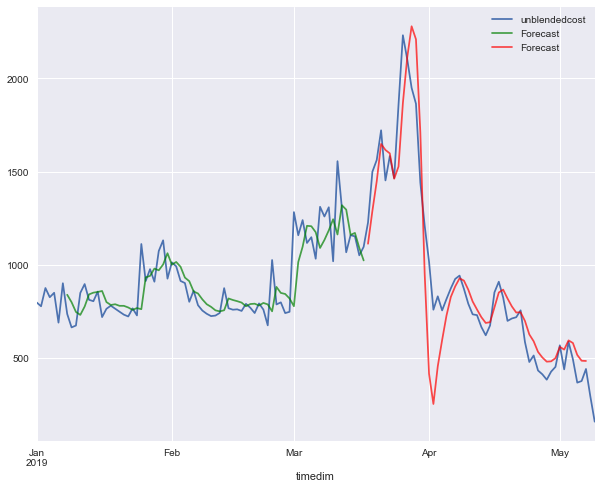

in sample
MAPE 16.49817509299104
rmse 127.30454018000691
out of sample
mape 38.29642410922678
rmse 181.88257945955272
[7, 64, 'relu', 0.0001]
Epoch 1/1000
69/69 [==============================] - 1s 16ms/sample - loss: 0.9169 - mean_squared_error: 0.9169
Epoch 2/1000
69/69 [==============================] - 0s 824us/sample - loss: 0.8914 - mean_squared_error: 0.8914
Epoch 3/1000
69/69 [==============================] - 0s 781us/sample - loss: 0.8670 - mean_squared_error: 0.8670
Epoch 4/1000
69/69 [==============================] - 0s 650us/sample - loss: 0.8441 - mean_squared_error: 0.8441
Epoch 5/1000
69/69 [==============================] - 0s 737us/sample - loss: 0.8221 - mean_squared_error: 0.8221
Epoch 6/1000
69/69 [==============================] - 0s 766us/sample - loss: 0.8009 - mean_squared_error: 0.8009
Epoch 7/1000
69/69 [==============================] - 0s 737us/sample - loss: 0.7805 - mean_squared_error: 0.7805
Epoch 8/1000
69/69 [==============================] - 0s 766u

69/69 [==============================] - 0s 824us/sample - loss: 0.1265 - mean_squared_error: 0.1265
Epoch 71/1000
69/69 [==============================] - 0s 723us/sample - loss: 0.1250 - mean_squared_error: 0.1250
Epoch 72/1000
69/69 [==============================] - 0s 882us/sample - loss: 0.1235 - mean_squared_error: 0.1235
Epoch 73/1000
69/69 [==============================] - 0s 694us/sample - loss: 0.1224 - mean_squared_error: 0.1224
Epoch 74/1000
69/69 [==============================] - 0s 795us/sample - loss: 0.1210 - mean_squared_error: 0.1210
Epoch 75/1000
69/69 [==============================] - 0s 766us/sample - loss: 0.1198 - mean_squared_error: 0.1198
Epoch 76/1000
69/69 [==============================] - 0s 781us/sample - loss: 0.1184 - mean_squared_error: 0.1184
Epoch 77/1000
69/69 [==============================] - 0s 694us/sample - loss: 0.1172 - mean_squared_error: 0.1172
Epoch 78/1000
69/69 [==============================] - 0s 679us/sample - loss: 0.1160 - mean_s

69/69 [==============================] - 0s 838us/sample - loss: 0.0618 - mean_squared_error: 0.0618
Epoch 142/1000
69/69 [==============================] - 0s 997us/sample - loss: 0.0613 - mean_squared_error: 0.0613
Epoch 143/1000
69/69 [==============================] - 0s 1ms/sample - loss: 0.0607 - mean_squared_error: 0.0607
Epoch 144/1000
69/69 [==============================] - 0s 911us/sample - loss: 0.0603 - mean_squared_error: 0.0603
Epoch 145/1000
69/69 [==============================] - 0s 853us/sample - loss: 0.0598 - mean_squared_error: 0.0598
Epoch 146/1000
69/69 [==============================] - 0s 766us/sample - loss: 0.0593 - mean_squared_error: 0.0593
Epoch 147/1000
69/69 [==============================] - 0s 925us/sample - loss: 0.0589 - mean_squared_error: 0.0589
Epoch 148/1000
69/69 [==============================] - 0s 737us/sample - loss: 0.0584 - mean_squared_error: 0.0584
Epoch 149/1000
69/69 [==============================] - 0s 838us/sample - loss: 0.0579 - 

69/69 [==============================] - 0s 838us/sample - loss: 0.0385 - mean_squared_error: 0.0385
Epoch 212/1000
69/69 [==============================] - 0s 824us/sample - loss: 0.0382 - mean_squared_error: 0.0382
Epoch 213/1000
69/69 [==============================] - 0s 780us/sample - loss: 0.0382 - mean_squared_error: 0.0382
Epoch 214/1000
69/69 [==============================] - 0s 925us/sample - loss: 0.0378 - mean_squared_error: 0.0378
Epoch 215/1000
69/69 [==============================] - 0s 925us/sample - loss: 0.0378 - mean_squared_error: 0.0378
Epoch 216/1000
69/69 [==============================] - 0s 766us/sample - loss: 0.0375 - mean_squared_error: 0.0375
Epoch 217/1000
69/69 [==============================] - 0s 838us/sample - loss: 0.0372 - mean_squared_error: 0.0372
Epoch 218/1000
69/69 [==============================] - 0s 997us/sample - loss: 0.0369 - mean_squared_error: 0.0369
Epoch 219/1000
69/69 [==============================] - 0s 997us/sample - loss: 0.0367 

69/69 [==============================] - 0s 694us/sample - loss: 0.0263 - mean_squared_error: 0.0263
Epoch 282/1000
69/69 [==============================] - 0s 781us/sample - loss: 0.0263 - mean_squared_error: 0.0263
Epoch 283/1000
69/69 [==============================] - 0s 780us/sample - loss: 0.0261 - mean_squared_error: 0.0261
Epoch 284/1000
69/69 [==============================] - 0s 766us/sample - loss: 0.0260 - mean_squared_error: 0.0260
Epoch 285/1000
69/69 [==============================] - 0s 679us/sample - loss: 0.0260 - mean_squared_error: 0.0260
Epoch 286/1000
69/69 [==============================] - 0s 694us/sample - loss: 0.0258 - mean_squared_error: 0.0258
Epoch 287/1000
69/69 [==============================] - 0s 680us/sample - loss: 0.0257 - mean_squared_error: 0.0257
Epoch 288/1000
69/69 [==============================] - 0s 781us/sample - loss: 0.0256 - mean_squared_error: 0.0256
Epoch 289/1000
69/69 [==============================] - 0s 795us/sample - loss: 0.0255 

69/69 [==============================] - 0s 781us/sample - loss: 0.0212 - mean_squared_error: 0.0212
Epoch 352/1000
69/69 [==============================] - 0s 636us/sample - loss: 0.0211 - mean_squared_error: 0.0211
Epoch 353/1000
69/69 [==============================] - 0s 593us/sample - loss: 0.0211 - mean_squared_error: 0.0211
Epoch 354/1000
69/69 [==============================] - 0s 593us/sample - loss: 0.0209 - mean_squared_error: 0.0209
Epoch 355/1000
69/69 [==============================] - 0s 636us/sample - loss: 0.0210 - mean_squared_error: 0.0210
Epoch 356/1000
69/69 [==============================] - 0s 766us/sample - loss: 0.0209 - mean_squared_error: 0.0209
Epoch 357/1000
69/69 [==============================] - 0s 896us/sample - loss: 0.0209 - mean_squared_error: 0.0209
Epoch 358/1000
69/69 [==============================] - 0s 766us/sample - loss: 0.0206 - mean_squared_error: 0.0206
Epoch 359/1000
69/69 [==============================] - 0s 665us/sample - loss: 0.0209 

69/69 [==============================] - 0s 968us/sample - loss: 0.0186 - mean_squared_error: 0.0186
Epoch 422/1000
69/69 [==============================] - 0s 838us/sample - loss: 0.0186 - mean_squared_error: 0.0186
Epoch 423/1000
69/69 [==============================] - 0s 911us/sample - loss: 0.0186 - mean_squared_error: 0.0186
Epoch 424/1000
69/69 [==============================] - 0s 911us/sample - loss: 0.0186 - mean_squared_error: 0.0186
Epoch 425/1000
69/69 [==============================] - 0s 809us/sample - loss: 0.0185 - mean_squared_error: 0.0185
Epoch 426/1000
69/69 [==============================] - 0s 925us/sample - loss: 0.0185 - mean_squared_error: 0.0185
Epoch 427/1000
69/69 [==============================] - 0s 954us/sample - loss: 0.0185 - mean_squared_error: 0.0185
Epoch 428/1000
69/69 [==============================] - 0s 795us/sample - loss: 0.0185 - mean_squared_error: 0.0185
Epoch 429/1000
69/69 [==============================] - 0s 853us/sample - loss: 0.0185 

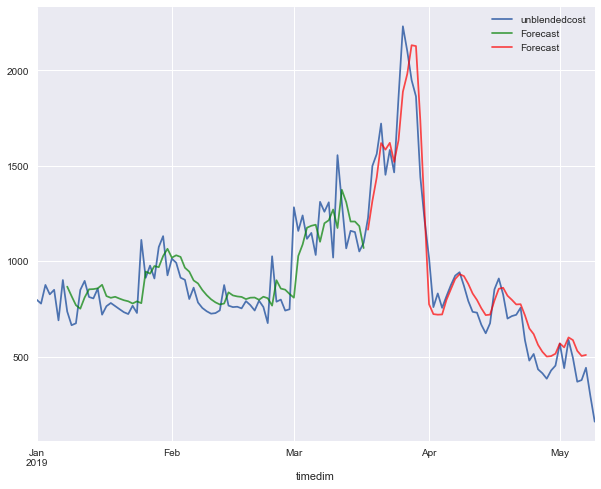

in sample
MAPE 16.96399705525486
rmse 129.09994720775288
out of sample
mape 37.429520816519464
rmse 124.09409274100531
[7, 64, 'relu', 0.0003]
Epoch 1/1000
69/69 [==============================] - 1s 18ms/sample - loss: 0.8621 - mean_squared_error: 0.8621
Epoch 2/1000
69/69 [==============================] - 0s 968us/sample - loss: 0.7723 - mean_squared_error: 0.7723
Epoch 3/1000
69/69 [==============================] - 0s 925us/sample - loss: 0.6905 - mean_squared_error: 0.6905
Epoch 4/1000
69/69 [==============================] - 0s 925us/sample - loss: 0.6121 - mean_squared_error: 0.6121
Epoch 5/1000
69/69 [==============================] - 0s 824us/sample - loss: 0.5354 - mean_squared_error: 0.5354
Epoch 6/1000
69/69 [==============================] - 0s 954us/sample - loss: 0.4561 - mean_squared_error: 0.4561
Epoch 7/1000
69/69 [==============================] - 0s 997us/sample - loss: 0.3788 - mean_squared_error: 0.3788
Epoch 8/1000
69/69 [==============================] - 0s 968

69/69 [==============================] - 0s 752us/sample - loss: 0.0306 - mean_squared_error: 0.0306
Epoch 72/1000
69/69 [==============================] - 0s 694us/sample - loss: 0.0304 - mean_squared_error: 0.0304
Epoch 73/1000
69/69 [==============================] - 0s 1ms/sample - loss: 0.0297 - mean_squared_error: 0.0297
Epoch 74/1000
69/69 [==============================] - 0s 1ms/sample - loss: 0.0292 - mean_squared_error: 0.0292
Epoch 75/1000
69/69 [==============================] - 0s 1ms/sample - loss: 0.0289 - mean_squared_error: 0.0289
Epoch 76/1000
69/69 [==============================] - 0s 2ms/sample - loss: 0.0285 - mean_squared_error: 0.0285
Epoch 77/1000
69/69 [==============================] - 0s 2ms/sample - loss: 0.0280 - mean_squared_error: 0.0280
Epoch 78/1000
69/69 [==============================] - 0s 2ms/sample - loss: 0.0276 - mean_squared_error: 0.0276
Epoch 79/1000
69/69 [==============================] - 0s 1ms/sample - loss: 0.0274 - mean_squared_error: 

69/69 [==============================] - 0s 1ms/sample - loss: 0.0186 - mean_squared_error: 0.0186
Epoch 143/1000
69/69 [==============================] - 0s 1ms/sample - loss: 0.0184 - mean_squared_error: 0.0184
Epoch 144/1000
69/69 [==============================] - 0s 925us/sample - loss: 0.0184 - mean_squared_error: 0.0184
Epoch 145/1000
69/69 [==============================] - 0s 1ms/sample - loss: 0.0185 - mean_squared_error: 0.0185
Epoch 146/1000
69/69 [==============================] - 0s 983us/sample - loss: 0.0183 - mean_squared_error: 0.0183
Epoch 147/1000
69/69 [==============================] - 0s 1ms/sample - loss: 0.0183 - mean_squared_error: 0.0183
Epoch 148/1000
69/69 [==============================] - 0s 997us/sample - loss: 0.0182 - mean_squared_error: 0.0182
Epoch 149/1000
69/69 [==============================] - 0s 1ms/sample - loss: 0.0182 - mean_squared_error: 0.0182
Epoch 150/1000
69/69 [==============================] - 0s 983us/sample - loss: 0.0182 - mean_squ

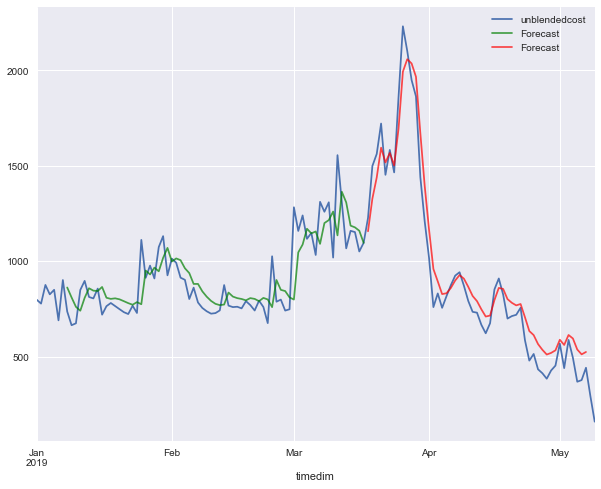

in sample
MAPE 16.661936491921228
rmse 128.70046271393932
out of sample
mape 39.306093573275234
rmse 107.0522584580991
[7, 64, 'relu', 0.001]
Epoch 1/1000
69/69 [==============================] - 1s 21ms/sample - loss: 0.7050 - mean_squared_error: 0.7050
Epoch 2/1000
69/69 [==============================] - 0s 983us/sample - loss: 0.4503 - mean_squared_error: 0.4503
Epoch 3/1000
69/69 [==============================] - 0s 766us/sample - loss: 0.2440 - mean_squared_error: 0.2440
Epoch 4/1000
69/69 [==============================] - 0s 766us/sample - loss: 0.1973 - mean_squared_error: 0.1973
Epoch 5/1000
69/69 [==============================] - 0s 723us/sample - loss: 0.1638 - mean_squared_error: 0.1638
Epoch 6/1000
69/69 [==============================] - 0s 737us/sample - loss: 0.1374 - mean_squared_error: 0.1374
Epoch 7/1000
69/69 [==============================] - 0s 896us/sample - loss: 0.1268 - mean_squared_error: 0.1268
Epoch 8/1000
69/69 [==============================] - 0s 752u

69/69 [==============================] - 0s 1ms/sample - loss: 0.0177 - mean_squared_error: 0.0177
Epoch 71/1000
69/69 [==============================] - 0s 1ms/sample - loss: 0.0178 - mean_squared_error: 0.0178
Epoch 72/1000
69/69 [==============================] - 0s 1ms/sample - loss: 0.0179 - mean_squared_error: 0.0179
Epoch 73/1000
69/69 [==============================] - 0s 925us/sample - loss: 0.0177 - mean_squared_error: 0.0177
Epoch 74/1000
69/69 [==============================] - 0s 1ms/sample - loss: 0.0177 - mean_squared_error: 0.0177
Epoch 75/1000
69/69 [==============================] - 0s 1ms/sample - loss: 0.0177 - mean_squared_error: 0.0177
Epoch 76/1000
69/69 [==============================] - 0s 954us/sample - loss: 0.0178 - mean_squared_error: 0.0178
Epoch 77/1000
69/69 [==============================] - 0s 867us/sample - loss: 0.0180 - mean_squared_error: 0.0180
Epoch 78/1000
69/69 [==============================] - 0s 911us/sample - loss: 0.0180 - mean_squared_err

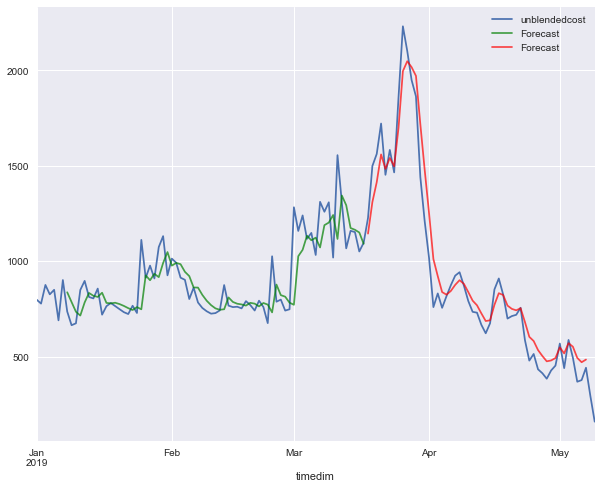

in sample
MAPE 16.590399974091312
rmse 129.19021213436295
out of sample
mape 40.19065181142789
rmse 109.60626343171603
[7, 64, 'relu', 0.003]
Epoch 1/1000
69/69 [==============================] - 1s 17ms/sample - loss: 0.5634 - mean_squared_error: 0.5634
Epoch 2/1000
69/69 [==============================] - 0s 809us/sample - loss: 0.2032 - mean_squared_error: 0.2032
Epoch 3/1000
69/69 [==============================] - 0s 853us/sample - loss: 0.1210 - mean_squared_error: 0.1210
Epoch 4/1000
69/69 [==============================] - 0s 809us/sample - loss: 0.0977 - mean_squared_error: 0.0977
Epoch 5/1000
69/69 [==============================] - 0s 737us/sample - loss: 0.0709 - mean_squared_error: 0.0709
Epoch 6/1000
69/69 [==============================] - 0s 766us/sample - loss: 0.0579 - mean_squared_error: 0.0579
Epoch 7/1000
69/69 [==============================] - 0s 766us/sample - loss: 0.0464 - mean_squared_error: 0.0464
Epoch 8/1000
69/69 [==============================] - 0s 795u

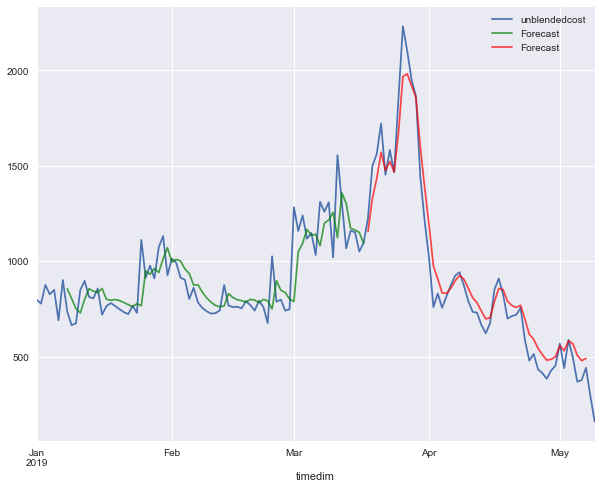

in sample
MAPE 16.672881079967727
rmse 128.73695610289832
out of sample
mape 39.897452414617945
rmse 99.60997877082745
[7, 64, 'relu', 0.01]
Epoch 1/1000
66/66 [==============================] - 1s 18ms/sample - loss: 0.9057 - mean_squared_error: 0.9057
Epoch 2/1000
66/66 [==============================] - 0s 468us/sample - loss: 0.8971 - mean_squared_error: 0.8971
Epoch 3/1000
66/66 [==============================] - 0s 453us/sample - loss: 0.8886 - mean_squared_error: 0.8886
Epoch 4/1000
66/66 [==============================] - 0s 468us/sample - loss: 0.8801 - mean_squared_error: 0.8801
Epoch 5/1000
66/66 [==============================] - 0s 499us/sample - loss: 0.8715 - mean_squared_error: 0.8715
Epoch 6/1000
66/66 [==============================] - 0s 453us/sample - loss: 0.8631 - mean_squared_error: 0.8631
Epoch 7/1000
66/66 [==============================] - 0s 468us/sample - loss: 0.8547 - mean_squared_error: 0.8547
Epoch 8/1000
66/66 [==============================] - 0s 484us

66/66 [==============================] - 0s 544us/sample - loss: 0.3016 - mean_squared_error: 0.3016
Epoch 71/1000
66/66 [==============================] - 0s 559us/sample - loss: 0.2950 - mean_squared_error: 0.2950
Epoch 72/1000
66/66 [==============================] - 0s 544us/sample - loss: 0.2888 - mean_squared_error: 0.2888
Epoch 73/1000
66/66 [==============================] - 0s 574us/sample - loss: 0.2827 - mean_squared_error: 0.2827
Epoch 74/1000
66/66 [==============================] - 0s 499us/sample - loss: 0.2768 - mean_squared_error: 0.2768
Epoch 75/1000
66/66 [==============================] - 0s 529us/sample - loss: 0.2708 - mean_squared_error: 0.2708
Epoch 76/1000
66/66 [==============================] - 0s 514us/sample - loss: 0.2656 - mean_squared_error: 0.2656
Epoch 77/1000
66/66 [==============================] - 0s 559us/sample - loss: 0.2606 - mean_squared_error: 0.2606
Epoch 78/1000
66/66 [==============================] - 0s 559us/sample - loss: 0.2559 - mean_s

66/66 [==============================] - 0s 574us/sample - loss: 0.1686 - mean_squared_error: 0.1686
Epoch 142/1000
66/66 [==============================] - 0s 620us/sample - loss: 0.1680 - mean_squared_error: 0.1680
Epoch 143/1000
66/66 [==============================] - 0s 529us/sample - loss: 0.1674 - mean_squared_error: 0.1674
Epoch 144/1000
66/66 [==============================] - 0s 499us/sample - loss: 0.1668 - mean_squared_error: 0.1668
Epoch 145/1000
66/66 [==============================] - 0s 499us/sample - loss: 0.1663 - mean_squared_error: 0.1663
Epoch 146/1000
66/66 [==============================] - 0s 529us/sample - loss: 0.1657 - mean_squared_error: 0.1657
Epoch 147/1000
66/66 [==============================] - 0s 589us/sample - loss: 0.1652 - mean_squared_error: 0.1652
Epoch 148/1000
66/66 [==============================] - 0s 529us/sample - loss: 0.1646 - mean_squared_error: 0.1646
Epoch 149/1000
66/66 [==============================] - 0s 529us/sample - loss: 0.1640 

66/66 [==============================] - 0s 468us/sample - loss: 0.1326 - mean_squared_error: 0.1326
Epoch 212/1000
66/66 [==============================] - 0s 453us/sample - loss: 0.1322 - mean_squared_error: 0.1322
Epoch 213/1000
66/66 [==============================] - 0s 468us/sample - loss: 0.1317 - mean_squared_error: 0.1317
Epoch 214/1000
66/66 [==============================] - 0s 484us/sample - loss: 0.1313 - mean_squared_error: 0.1313
Epoch 215/1000
66/66 [==============================] - 0s 514us/sample - loss: 0.1308 - mean_squared_error: 0.1308
Epoch 216/1000
66/66 [==============================] - 0s 453us/sample - loss: 0.1304 - mean_squared_error: 0.1304
Epoch 217/1000
66/66 [==============================] - 0s 453us/sample - loss: 0.1299 - mean_squared_error: 0.1299
Epoch 218/1000
66/66 [==============================] - 0s 453us/sample - loss: 0.1295 - mean_squared_error: 0.1295
Epoch 219/1000
66/66 [==============================] - 0s 499us/sample - loss: 0.1291 

66/66 [==============================] - 0s 468us/sample - loss: 0.1044 - mean_squared_error: 0.1044
Epoch 282/1000
66/66 [==============================] - 0s 484us/sample - loss: 0.1041 - mean_squared_error: 0.1041
Epoch 283/1000
66/66 [==============================] - 0s 453us/sample - loss: 0.1037 - mean_squared_error: 0.1037
Epoch 284/1000
66/66 [==============================] - 0s 453us/sample - loss: 0.1034 - mean_squared_error: 0.1034
Epoch 285/1000
66/66 [==============================] - 0s 499us/sample - loss: 0.1030 - mean_squared_error: 0.1030
Epoch 286/1000
66/66 [==============================] - 0s 468us/sample - loss: 0.1027 - mean_squared_error: 0.1027
Epoch 287/1000
66/66 [==============================] - 0s 484us/sample - loss: 0.1023 - mean_squared_error: 0.1023
Epoch 288/1000
66/66 [==============================] - 0s 484us/sample - loss: 0.1020 - mean_squared_error: 0.1020
Epoch 289/1000
66/66 [==============================] - 0s 453us/sample - loss: 0.1017 

66/66 [==============================] - 0s 453us/sample - loss: 0.0824 - mean_squared_error: 0.0824
Epoch 352/1000
66/66 [==============================] - 0s 468us/sample - loss: 0.0821 - mean_squared_error: 0.0821
Epoch 353/1000
66/66 [==============================] - 0s 453us/sample - loss: 0.0818 - mean_squared_error: 0.0818
Epoch 354/1000
66/66 [==============================] - 0s 468us/sample - loss: 0.0816 - mean_squared_error: 0.0816
Epoch 355/1000
66/66 [==============================] - 0s 453us/sample - loss: 0.0813 - mean_squared_error: 0.0813
Epoch 356/1000
66/66 [==============================] - 0s 499us/sample - loss: 0.0810 - mean_squared_error: 0.0810
Epoch 357/1000
66/66 [==============================] - 0s 468us/sample - loss: 0.0808 - mean_squared_error: 0.0808
Epoch 358/1000
66/66 [==============================] - 0s 468us/sample - loss: 0.0805 - mean_squared_error: 0.0805
Epoch 359/1000
66/66 [==============================] - 0s 468us/sample - loss: 0.0802 

66/66 [==============================] - 0s 484us/sample - loss: 0.0663 - mean_squared_error: 0.0663
Epoch 422/1000
66/66 [==============================] - 0s 484us/sample - loss: 0.0661 - mean_squared_error: 0.0661
Epoch 423/1000
66/66 [==============================] - 0s 484us/sample - loss: 0.0659 - mean_squared_error: 0.0659
Epoch 424/1000
66/66 [==============================] - 0s 468us/sample - loss: 0.0657 - mean_squared_error: 0.0657
Epoch 425/1000
66/66 [==============================] - 0s 453us/sample - loss: 0.0655 - mean_squared_error: 0.0655
Epoch 426/1000
66/66 [==============================] - 0s 484us/sample - loss: 0.0653 - mean_squared_error: 0.0653
Epoch 427/1000
66/66 [==============================] - 0s 468us/sample - loss: 0.0651 - mean_squared_error: 0.0651
Epoch 428/1000
66/66 [==============================] - 0s 484us/sample - loss: 0.0650 - mean_squared_error: 0.0650
Epoch 429/1000
66/66 [==============================] - 0s 484us/sample - loss: 0.0648 

66/66 [==============================] - 0s 559us/sample - loss: 0.0554 - mean_squared_error: 0.0554
Epoch 492/1000
66/66 [==============================] - 0s 620us/sample - loss: 0.0553 - mean_squared_error: 0.0553
Epoch 493/1000
66/66 [==============================] - 0s 514us/sample - loss: 0.0552 - mean_squared_error: 0.0552
Epoch 494/1000
66/66 [==============================] - 0s 604us/sample - loss: 0.0550 - mean_squared_error: 0.0550
Epoch 495/1000
66/66 [==============================] - 0s 544us/sample - loss: 0.0549 - mean_squared_error: 0.0549
Epoch 496/1000
66/66 [==============================] - 0s 574us/sample - loss: 0.0548 - mean_squared_error: 0.0548
Epoch 497/1000
66/66 [==============================] - 0s 665us/sample - loss: 0.0547 - mean_squared_error: 0.0547
Epoch 498/1000
66/66 [==============================] - 0s 574us/sample - loss: 0.0546 - mean_squared_error: 0.0546
Epoch 499/1000
66/66 [==============================] - 0s 816us/sample - loss: 0.0544 

66/66 [==============================] - 0s 468us/sample - loss: 0.0482 - mean_squared_error: 0.0482
Epoch 562/1000
66/66 [==============================] - 0s 650us/sample - loss: 0.0481 - mean_squared_error: 0.0481
Epoch 563/1000
66/66 [==============================] - 0s 771us/sample - loss: 0.0480 - mean_squared_error: 0.0480
Epoch 564/1000
66/66 [==============================] - 0s 650us/sample - loss: 0.0479 - mean_squared_error: 0.0479
Epoch 565/1000
66/66 [==============================] - 0s 680us/sample - loss: 0.0478 - mean_squared_error: 0.0478
Epoch 566/1000
66/66 [==============================] - 0s 484us/sample - loss: 0.0477 - mean_squared_error: 0.0477
Epoch 567/1000
66/66 [==============================] - 0s 514us/sample - loss: 0.0476 - mean_squared_error: 0.0476
Epoch 568/1000
66/66 [==============================] - 0s 499us/sample - loss: 0.0475 - mean_squared_error: 0.0475
Epoch 569/1000
66/66 [==============================] - 0s 484us/sample - loss: 0.0474 

66/66 [==============================] - 0s 499us/sample - loss: 0.0425 - mean_squared_error: 0.0425
Epoch 632/1000
66/66 [==============================] - 0s 499us/sample - loss: 0.0424 - mean_squared_error: 0.0424
Epoch 633/1000
66/66 [==============================] - 0s 499us/sample - loss: 0.0423 - mean_squared_error: 0.0423
Epoch 634/1000
66/66 [==============================] - 0s 710us/sample - loss: 0.0423 - mean_squared_error: 0.0423
Epoch 635/1000
66/66 [==============================] - 0s 695us/sample - loss: 0.0422 - mean_squared_error: 0.0422
Epoch 636/1000
66/66 [==============================] - 0s 665us/sample - loss: 0.0421 - mean_squared_error: 0.0421
Epoch 637/1000
66/66 [==============================] - 0s 589us/sample - loss: 0.0420 - mean_squared_error: 0.0420
Epoch 638/1000
66/66 [==============================] - 0s 619us/sample - loss: 0.0420 - mean_squared_error: 0.0420
Epoch 639/1000
66/66 [==============================] - 0s 605us/sample - loss: 0.0419 

66/66 [==============================] - 0s 514us/sample - loss: 0.0378 - mean_squared_error: 0.0378
Epoch 702/1000
66/66 [==============================] - 0s 680us/sample - loss: 0.0377 - mean_squared_error: 0.0377
Epoch 703/1000
66/66 [==============================] - 0s 801us/sample - loss: 0.0376 - mean_squared_error: 0.0376
Epoch 704/1000
66/66 [==============================] - 0s 862us/sample - loss: 0.0376 - mean_squared_error: 0.0376
Epoch 705/1000
66/66 [==============================] - 0s 665us/sample - loss: 0.0375 - mean_squared_error: 0.0375
Epoch 706/1000
66/66 [==============================] - 0s 604us/sample - loss: 0.0374 - mean_squared_error: 0.0374
Epoch 707/1000
66/66 [==============================] - 0s 771us/sample - loss: 0.0374 - mean_squared_error: 0.0374
Epoch 708/1000
66/66 [==============================] - 0s 680us/sample - loss: 0.0373 - mean_squared_error: 0.0373
Epoch 709/1000
66/66 [==============================] - 0s 710us/sample - loss: 0.0373 

66/66 [==============================] - 0s 604us/sample - loss: 0.0337 - mean_squared_error: 0.0337
Epoch 772/1000
66/66 [==============================] - 0s 695us/sample - loss: 0.0337 - mean_squared_error: 0.0337
Epoch 773/1000
66/66 [==============================] - 0s 574us/sample - loss: 0.0336 - mean_squared_error: 0.0336
Epoch 774/1000
66/66 [==============================] - 0s 604us/sample - loss: 0.0336 - mean_squared_error: 0.0336
Epoch 775/1000
66/66 [==============================] - 0s 801us/sample - loss: 0.0335 - mean_squared_error: 0.0335
Epoch 776/1000
66/66 [==============================] - 0s 771us/sample - loss: 0.0335 - mean_squared_error: 0.0335
Epoch 777/1000
66/66 [==============================] - 0s 725us/sample - loss: 0.0334 - mean_squared_error: 0.0334
Epoch 778/1000
66/66 [==============================] - 0s 846us/sample - loss: 0.0334 - mean_squared_error: 0.0334
Epoch 779/1000
66/66 [==============================] - 0s 589us/sample - loss: 0.0333 

66/66 [==============================] - 0s 589us/sample - loss: 0.0303 - mean_squared_error: 0.0303
Epoch 842/1000
66/66 [==============================] - 0s 710us/sample - loss: 0.0303 - mean_squared_error: 0.0303
Epoch 843/1000
66/66 [==============================] - 0s 771us/sample - loss: 0.0302 - mean_squared_error: 0.0302
Epoch 844/1000
66/66 [==============================] - 0s 620us/sample - loss: 0.0302 - mean_squared_error: 0.0302
Epoch 845/1000
66/66 [==============================] - 0s 514us/sample - loss: 0.0302 - mean_squared_error: 0.0302
Epoch 846/1000
66/66 [==============================] - 0s 589us/sample - loss: 0.0301 - mean_squared_error: 0.0301
Epoch 847/1000
66/66 [==============================] - 0s 719us/sample - loss: 0.0301 - mean_squared_error: 0.0301
Epoch 848/1000
66/66 [==============================] - 0s 680us/sample - loss: 0.0300 - mean_squared_error: 0.0300
Epoch 849/1000
66/66 [==============================] - 0s 680us/sample - loss: 0.0300 

66/66 [==============================] - 0s 665us/sample - loss: 0.0274 - mean_squared_error: 0.0274
Epoch 912/1000
66/66 [==============================] - 0s 786us/sample - loss: 0.0274 - mean_squared_error: 0.0274
Epoch 913/1000
66/66 [==============================] - 0s 771us/sample - loss: 0.0274 - mean_squared_error: 0.0274
Epoch 914/1000
66/66 [==============================] - 0s 725us/sample - loss: 0.0273 - mean_squared_error: 0.0273
Epoch 915/1000
66/66 [==============================] - 0s 680us/sample - loss: 0.0273 - mean_squared_error: 0.0273
Epoch 916/1000
66/66 [==============================] - 0s 574us/sample - loss: 0.0272 - mean_squared_error: 0.0272
Epoch 917/1000
66/66 [==============================] - 0s 680us/sample - loss: 0.0272 - mean_squared_error: 0.0272
Epoch 918/1000
66/66 [==============================] - 0s 786us/sample - loss: 0.0272 - mean_squared_error: 0.0272
Epoch 919/1000
66/66 [==============================] - 0s 740us/sample - loss: 0.0271 

66/66 [==============================] - 0s 665us/sample - loss: 0.0250 - mean_squared_error: 0.0250
Epoch 982/1000
66/66 [==============================] - 0s 756us/sample - loss: 0.0250 - mean_squared_error: 0.0250
Epoch 983/1000
66/66 [==============================] - 0s 876us/sample - loss: 0.0250 - mean_squared_error: 0.0250
Epoch 984/1000
66/66 [==============================] - 0s 635us/sample - loss: 0.0249 - mean_squared_error: 0.0249
Epoch 985/1000
66/66 [==============================] - 0s 559us/sample - loss: 0.0249 - mean_squared_error: 0.0249
Epoch 986/1000
66/66 [==============================] - 0s 499us/sample - loss: 0.0249 - mean_squared_error: 0.0249
Epoch 987/1000
66/66 [==============================] - 0s 695us/sample - loss: 0.0248 - mean_squared_error: 0.0248
Epoch 988/1000
66/66 [==============================] - 0s 680us/sample - loss: 0.0248 - mean_squared_error: 0.0248
Epoch 989/1000
66/66 [==============================] - 0s 665us/sample - loss: 0.0248 

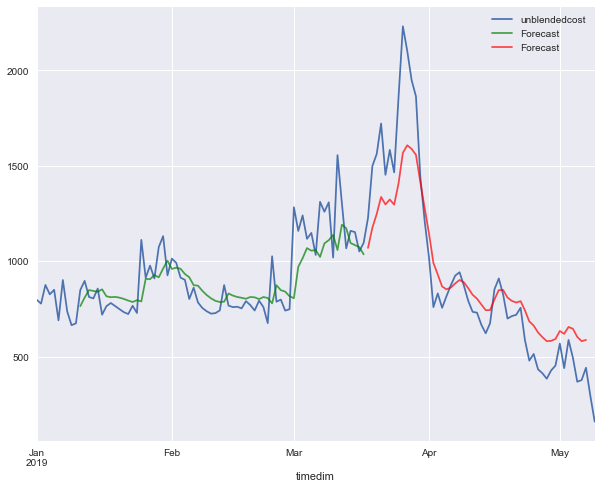

in sample
MAPE 15.365875052502615
rmse 134.39655354861793
out of sample
mape 37.90533006513324
rmse 208.48632799920117
[10, 16, 'tanh', 0.0001]
Epoch 1/1000
66/66 [==============================] - 1s 18ms/sample - loss: 0.8589 - mean_squared_error: 0.8589
Epoch 2/1000
66/66 [==============================] - 0s 620us/sample - loss: 0.8262 - mean_squared_error: 0.8262
Epoch 3/1000
66/66 [==============================] - 0s 574us/sample - loss: 0.7941 - mean_squared_error: 0.7941
Epoch 4/1000
66/66 [==============================] - 0s 665us/sample - loss: 0.7635 - mean_squared_error: 0.7635
Epoch 5/1000
66/66 [==============================] - 0s 635us/sample - loss: 0.7336 - mean_squared_error: 0.7336
Epoch 6/1000
66/66 [==============================] - 0s 514us/sample - loss: 0.7044 - mean_squared_error: 0.7044
Epoch 7/1000
66/66 [==============================] - 0s 650us/sample - loss: 0.6766 - mean_squared_error: 0.6766
Epoch 8/1000
66/66 [==============================] - 0s 60

66/66 [==============================] - 0s 604us/sample - loss: 0.1153 - mean_squared_error: 0.1153
Epoch 71/1000
66/66 [==============================] - 0s 619us/sample - loss: 0.1144 - mean_squared_error: 0.1144
Epoch 72/1000
66/66 [==============================] - 0s 650us/sample - loss: 0.1134 - mean_squared_error: 0.1134
Epoch 73/1000
66/66 [==============================] - 0s 710us/sample - loss: 0.1125 - mean_squared_error: 0.1125
Epoch 74/1000
66/66 [==============================] - 0s 740us/sample - loss: 0.1116 - mean_squared_error: 0.1116
Epoch 75/1000
66/66 [==============================] - 0s 892us/sample - loss: 0.1108 - mean_squared_error: 0.1108
Epoch 76/1000
66/66 [==============================] - 0s 710us/sample - loss: 0.1099 - mean_squared_error: 0.1099
Epoch 77/1000
66/66 [==============================] - 0s 756us/sample - loss: 0.1090 - mean_squared_error: 0.1090
Epoch 78/1000
66/66 [==============================] - 0s 861us/sample - loss: 0.1081 - mean_s

66/66 [==============================] - 0s 620us/sample - loss: 0.0658 - mean_squared_error: 0.0658
Epoch 142/1000
66/66 [==============================] - 0s 771us/sample - loss: 0.0654 - mean_squared_error: 0.0654
Epoch 143/1000
66/66 [==============================] - 0s 982us/sample - loss: 0.0649 - mean_squared_error: 0.0649
Epoch 144/1000
66/66 [==============================] - 0s 771us/sample - loss: 0.0644 - mean_squared_error: 0.0644
Epoch 145/1000
66/66 [==============================] - 0s 725us/sample - loss: 0.0639 - mean_squared_error: 0.0639
Epoch 146/1000
66/66 [==============================] - 0s 559us/sample - loss: 0.0634 - mean_squared_error: 0.0634
Epoch 147/1000
66/66 [==============================] - 0s 650us/sample - loss: 0.0630 - mean_squared_error: 0.0630
Epoch 148/1000
66/66 [==============================] - 0s 620us/sample - loss: 0.0625 - mean_squared_error: 0.0625
Epoch 149/1000
66/66 [==============================] - 0s 665us/sample - loss: 0.0620 

66/66 [==============================] - 0s 574us/sample - loss: 0.0416 - mean_squared_error: 0.0416
Epoch 212/1000
66/66 [==============================] - 0s 514us/sample - loss: 0.0414 - mean_squared_error: 0.0414
Epoch 213/1000
66/66 [==============================] - 0s 529us/sample - loss: 0.0412 - mean_squared_error: 0.0412
Epoch 214/1000
66/66 [==============================] - 0s 589us/sample - loss: 0.0410 - mean_squared_error: 0.0410
Epoch 215/1000
66/66 [==============================] - 0s 620us/sample - loss: 0.0408 - mean_squared_error: 0.0408
Epoch 216/1000
66/66 [==============================] - 0s 650us/sample - loss: 0.0406 - mean_squared_error: 0.0406
Epoch 217/1000
66/66 [==============================] - 0s 665us/sample - loss: 0.0404 - mean_squared_error: 0.0404
Epoch 218/1000
66/66 [==============================] - 0s 635us/sample - loss: 0.0403 - mean_squared_error: 0.0403
Epoch 219/1000
66/66 [==============================] - 0s 635us/sample - loss: 0.0401 

66/66 [==============================] - 0s 861us/sample - loss: 0.0317 - mean_squared_error: 0.0317
Epoch 282/1000
66/66 [==============================] - 0s 786us/sample - loss: 0.0316 - mean_squared_error: 0.0316
Epoch 283/1000
66/66 [==============================] - 0s 620us/sample - loss: 0.0315 - mean_squared_error: 0.0315
Epoch 284/1000
66/66 [==============================] - 0s 680us/sample - loss: 0.0314 - mean_squared_error: 0.0314
Epoch 285/1000
66/66 [==============================] - 0s 892us/sample - loss: 0.0313 - mean_squared_error: 0.0313
Epoch 286/1000
66/66 [==============================] - 0s 650us/sample - loss: 0.0312 - mean_squared_error: 0.0312
Epoch 287/1000
66/66 [==============================] - 0s 620us/sample - loss: 0.0311 - mean_squared_error: 0.0311
Epoch 288/1000
66/66 [==============================] - 0s 650us/sample - loss: 0.0310 - mean_squared_error: 0.0310
Epoch 289/1000
66/66 [==============================] - 0s 620us/sample - loss: 0.0310 

66/66 [==============================] - 0s 473us/sample - loss: 0.0262 - mean_squared_error: 0.0262
Epoch 352/1000
66/66 [==============================] - 0s 522us/sample - loss: 0.0261 - mean_squared_error: 0.0261
Epoch 353/1000
66/66 [==============================] - 0s 382us/sample - loss: 0.0260 - mean_squared_error: 0.0260
Epoch 354/1000
66/66 [==============================] - 0s 710us/sample - loss: 0.0259 - mean_squared_error: 0.0259
Epoch 355/1000
66/66 [==============================] - 0s 473us/sample - loss: 0.0259 - mean_squared_error: 0.0259
Epoch 356/1000
66/66 [==============================] - 0s 473us/sample - loss: 0.0258 - mean_squared_error: 0.0258
Epoch 357/1000
66/66 [==============================] - 0s 710us/sample - loss: 0.0258 - mean_squared_error: 0.0258
Epoch 358/1000
66/66 [==============================] - 0s 710us/sample - loss: 0.0257 - mean_squared_error: 0.0257
Epoch 359/1000
66/66 [==============================] - 0s 473us/sample - loss: 0.0257 

66/66 [==============================] - 0s 473us/sample - loss: 0.0223 - mean_squared_error: 0.0223
Epoch 422/1000
66/66 [==============================] - 0s 704us/sample - loss: 0.0223 - mean_squared_error: 0.0223
Epoch 423/1000
66/66 [==============================] - 0s 346us/sample - loss: 0.0222 - mean_squared_error: 0.0222
Epoch 424/1000
66/66 [==============================] - 0s 474us/sample - loss: 0.0222 - mean_squared_error: 0.0222
Epoch 425/1000
66/66 [==============================] - 0s 473us/sample - loss: 0.0222 - mean_squared_error: 0.0222
Epoch 426/1000
66/66 [==============================] - 0s 710us/sample - loss: 0.0221 - mean_squared_error: 0.0221
Epoch 427/1000
66/66 [==============================] - 0s 473us/sample - loss: 0.0220 - mean_squared_error: 0.0220
Epoch 428/1000
66/66 [==============================] - 0s 928us/sample - loss: 0.0219 - mean_squared_error: 0.0219
Epoch 429/1000
66/66 [==============================] - 0s 544us/sample - loss: 0.0219 

66/66 [==============================] - 0s 514us/sample - loss: 0.0197 - mean_squared_error: 0.0197
Epoch 492/1000
66/66 [==============================] - 0s 529us/sample - loss: 0.0197 - mean_squared_error: 0.0197
Epoch 493/1000
66/66 [==============================] - 0s 589us/sample - loss: 0.0197 - mean_squared_error: 0.0197
Epoch 494/1000
66/66 [==============================] - 0s 514us/sample - loss: 0.0196 - mean_squared_error: 0.0196
Epoch 495/1000
66/66 [==============================] - 0s 499us/sample - loss: 0.0196 - mean_squared_error: 0.0196
Epoch 496/1000
66/66 [==============================] - 0s 604us/sample - loss: 0.0196 - mean_squared_error: 0.0196
Epoch 497/1000
66/66 [==============================] - 0s 574us/sample - loss: 0.0196 - mean_squared_error: 0.0196
Epoch 498/1000
66/66 [==============================] - 0s 514us/sample - loss: 0.0195 - mean_squared_error: 0.0195
Epoch 499/1000
66/66 [==============================] - 0s 650us/sample - loss: 0.0195 

66/66 [==============================] - 0s 650us/sample - loss: 0.0183 - mean_squared_error: 0.0183
Epoch 562/1000
66/66 [==============================] - 0s 831us/sample - loss: 0.0183 - mean_squared_error: 0.0183
Epoch 563/1000
66/66 [==============================] - 0s 740us/sample - loss: 0.0183 - mean_squared_error: 0.0183
Epoch 564/1000
66/66 [==============================] - 0s 771us/sample - loss: 0.0183 - mean_squared_error: 0.0183
Epoch 565/1000
66/66 [==============================] - 0s 574us/sample - loss: 0.0182 - mean_squared_error: 0.0182
Epoch 566/1000
66/66 [==============================] - 0s 1ms/sample - loss: 0.0183 - mean_squared_error: 0.0183
Epoch 567/1000
66/66 [==============================] - 0s 650us/sample - loss: 0.0182 - mean_squared_error: 0.0182
Epoch 568/1000
66/66 [==============================] - 0s 529us/sample - loss: 0.0182 - mean_squared_error: 0.0182
Epoch 569/1000
66/66 [==============================] - 0s 544us/sample - loss: 0.0182 - 

66/66 [==============================] - 0s 589us/sample - loss: 0.0175 - mean_squared_error: 0.0175
Epoch 632/1000
66/66 [==============================] - 0s 650us/sample - loss: 0.0175 - mean_squared_error: 0.0175
Epoch 633/1000
66/66 [==============================] - 0s 535us/sample - loss: 0.0175 - mean_squared_error: 0.0175
Epoch 634/1000
66/66 [==============================] - 0s 559us/sample - loss: 0.0175 - mean_squared_error: 0.0175
Epoch 635/1000
66/66 [==============================] - 0s 567us/sample - loss: 0.0175 - mean_squared_error: 0.0175
Epoch 636/1000
66/66 [==============================] - 0s 574us/sample - loss: 0.0175 - mean_squared_error: 0.0175
Epoch 637/1000
66/66 [==============================] - 0s 574us/sample - loss: 0.0175 - mean_squared_error: 0.0175
Epoch 638/1000
66/66 [==============================] - 0s 567us/sample - loss: 0.0175 - mean_squared_error: 0.0175
Epoch 639/1000
66/66 [==============================] - 0s 514us/sample - loss: 0.0175 

66/66 [==============================] - 0s 529us/sample - loss: 0.0171 - mean_squared_error: 0.0171
Epoch 702/1000
66/66 [==============================] - 0s 612us/sample - loss: 0.0171 - mean_squared_error: 0.0171
Epoch 703/1000
66/66 [==============================] - 0s 620us/sample - loss: 0.0171 - mean_squared_error: 0.0171
Epoch 704/1000
66/66 [==============================] - 0s 559us/sample - loss: 0.0171 - mean_squared_error: 0.0171
Epoch 705/1000
66/66 [==============================] - 0s 589us/sample - loss: 0.0171 - mean_squared_error: 0.0171
Epoch 706/1000
66/66 [==============================] - 0s 650us/sample - loss: 0.0171 - mean_squared_error: 0.0171
Epoch 707/1000
66/66 [==============================] - 0s 756us/sample - loss: 0.0171 - mean_squared_error: 0.0171
Epoch 708/1000
66/66 [==============================] - 0s 650us/sample - loss: 0.0171 - mean_squared_error: 0.0171
Epoch 709/1000
66/66 [==============================] - 0s 589us/sample - loss: 0.0171 

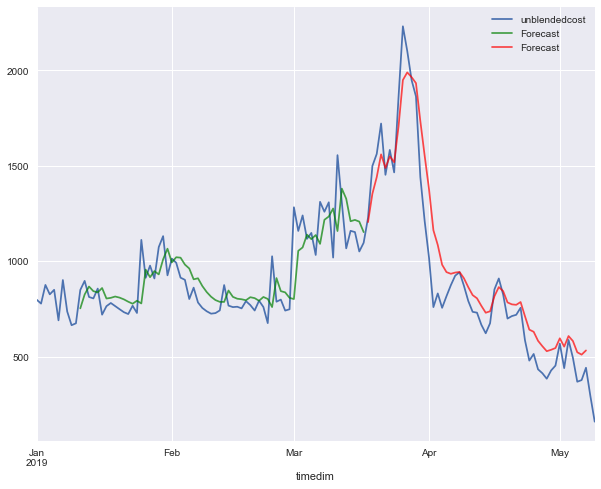

in sample
MAPE 17.225850985315116
rmse 132.03528191400437
out of sample
mape 40.83087206305875
rmse 146.33583332599696
[10, 16, 'tanh', 0.0003]
Epoch 1/1000
66/66 [==============================] - 1s 19ms/sample - loss: 0.3598 - mean_squared_error: 0.3598
Epoch 2/1000
66/66 [==============================] - 0s 665us/sample - loss: 0.2833 - mean_squared_error: 0.2833
Epoch 3/1000
66/66 [==============================] - 0s 816us/sample - loss: 0.2172 - mean_squared_error: 0.2172
Epoch 4/1000
66/66 [==============================] - 0s 786us/sample - loss: 0.1660 - mean_squared_error: 0.1660
Epoch 5/1000
66/66 [==============================] - 0s 544us/sample - loss: 0.1282 - mean_squared_error: 0.1282
Epoch 6/1000
66/66 [==============================] - 0s 725us/sample - loss: 0.1048 - mean_squared_error: 0.1048
Epoch 7/1000
66/66 [==============================] - 0s 574us/sample - loss: 0.0926 - mean_squared_error: 0.0926
Epoch 8/1000
66/66 [==============================] - 0s 52

66/66 [==============================] - 0s 468us/sample - loss: 0.0260 - mean_squared_error: 0.0260
Epoch 71/1000
66/66 [==============================] - 0s 499us/sample - loss: 0.0257 - mean_squared_error: 0.0257
Epoch 72/1000
66/66 [==============================] - 0s 514us/sample - loss: 0.0255 - mean_squared_error: 0.0255
Epoch 73/1000
66/66 [==============================] - 0s 468us/sample - loss: 0.0253 - mean_squared_error: 0.0253
Epoch 74/1000
66/66 [==============================] - 0s 483us/sample - loss: 0.0251 - mean_squared_error: 0.0251
Epoch 75/1000
66/66 [==============================] - 0s 499us/sample - loss: 0.0249 - mean_squared_error: 0.0249
Epoch 76/1000
66/66 [==============================] - 0s 529us/sample - loss: 0.0246 - mean_squared_error: 0.0246
Epoch 77/1000
66/66 [==============================] - 0s 529us/sample - loss: 0.0244 - mean_squared_error: 0.0244
Epoch 78/1000
66/66 [==============================] - 0s 499us/sample - loss: 0.0244 - mean_s

66/66 [==============================] - 0s 559us/sample - loss: 0.0183 - mean_squared_error: 0.0183
Epoch 142/1000
66/66 [==============================] - 0s 801us/sample - loss: 0.0182 - mean_squared_error: 0.0182
Epoch 143/1000
66/66 [==============================] - 0s 680us/sample - loss: 0.0182 - mean_squared_error: 0.0182
Epoch 144/1000
66/66 [==============================] - 0s 635us/sample - loss: 0.0181 - mean_squared_error: 0.0181
Epoch 145/1000
66/66 [==============================] - 0s 574us/sample - loss: 0.0181 - mean_squared_error: 0.0181
Epoch 146/1000
66/66 [==============================] - 0s 529us/sample - loss: 0.0180 - mean_squared_error: 0.0180
Epoch 147/1000
66/66 [==============================] - 0s 559us/sample - loss: 0.0180 - mean_squared_error: 0.0180
Epoch 148/1000
66/66 [==============================] - 0s 544us/sample - loss: 0.0180 - mean_squared_error: 0.0180
Epoch 149/1000
66/66 [==============================] - 0s 650us/sample - loss: 0.0179 

66/66 [==============================] - 0s 472us/sample - loss: 0.0170 - mean_squared_error: 0.0170
Epoch 212/1000
66/66 [==============================] - 0s 473us/sample - loss: 0.0170 - mean_squared_error: 0.0170
Epoch 213/1000
66/66 [==============================] - 0s 670us/sample - loss: 0.0169 - mean_squared_error: 0.0169
Epoch 214/1000
66/66 [==============================] - 0s 301us/sample - loss: 0.0168 - mean_squared_error: 0.0168
Epoch 215/1000
66/66 [==============================] - 0s 473us/sample - loss: 0.0169 - mean_squared_error: 0.0169
Epoch 216/1000
66/66 [==============================] - 0s 473us/sample - loss: 0.0168 - mean_squared_error: 0.0168
Epoch 217/1000
66/66 [==============================] - 0s 473us/sample - loss: 0.0168 - mean_squared_error: 0.0168
Epoch 218/1000
66/66 [==============================] - 0s 473us/sample - loss: 0.0168 - mean_squared_error: 0.0168
Epoch 219/1000
66/66 [==============================] - 0s 473us/sample - loss: 0.0168 

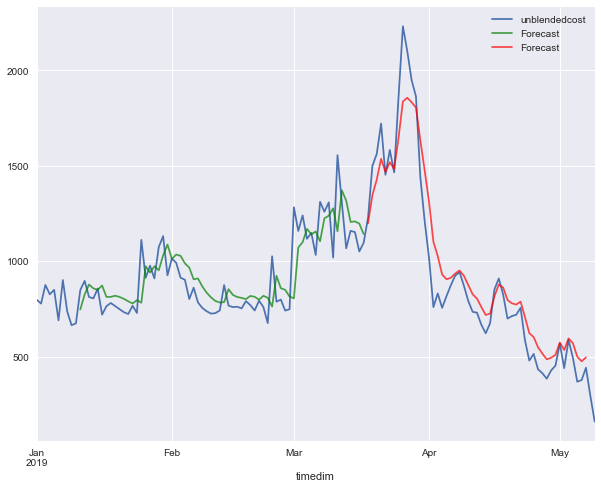

in sample
MAPE 17.516073628374233
rmse 131.81818005016146
out of sample
mape 40.99326750795472
rmse 136.08480281146302
[10, 16, 'tanh', 0.001]
Epoch 1/1000
66/66 [==============================] - 1s 19ms/sample - loss: 0.5867 - mean_squared_error: 0.5867
Epoch 2/1000
66/66 [==============================] - 0s 665us/sample - loss: 0.3078 - mean_squared_error: 0.3078
Epoch 3/1000
66/66 [==============================] - 0s 710us/sample - loss: 0.1580 - mean_squared_error: 0.1580
Epoch 4/1000
66/66 [==============================] - 0s 574us/sample - loss: 0.1481 - mean_squared_error: 0.1481
Epoch 5/1000
66/66 [==============================] - 0s 619us/sample - loss: 0.1444 - mean_squared_error: 0.1444
Epoch 6/1000
66/66 [==============================] - 0s 635us/sample - loss: 0.1188 - mean_squared_error: 0.1188
Epoch 7/1000
66/66 [==============================] - 0s 574us/sample - loss: 0.1032 - mean_squared_error: 0.1032
Epoch 8/1000
66/66 [==============================] - 0s 650

66/66 [==============================] - 0s 473us/sample - loss: 0.0187 - mean_squared_error: 0.0187
Epoch 71/1000
66/66 [==============================] - 0s 710us/sample - loss: 0.0186 - mean_squared_error: 0.0186
Epoch 72/1000
66/66 [==============================] - 0s 473us/sample - loss: 0.0186 - mean_squared_error: 0.0186
Epoch 73/1000
66/66 [==============================] - 0s 527us/sample - loss: 0.0186 - mean_squared_error: 0.0186
Epoch 74/1000
66/66 [==============================] - 0s 710us/sample - loss: 0.0182 - mean_squared_error: 0.0182
Epoch 75/1000
66/66 [==============================] - 0s 473us/sample - loss: 0.0183 - mean_squared_error: 0.0183
Epoch 76/1000
66/66 [==============================] - 0s 710us/sample - loss: 0.0181 - mean_squared_error: 0.0181
Epoch 77/1000
66/66 [==============================] - 0s 727us/sample - loss: 0.0181 - mean_squared_error: 0.0181
Epoch 78/1000
66/66 [==============================] - 0s 409us/sample - loss: 0.0181 - mean_s

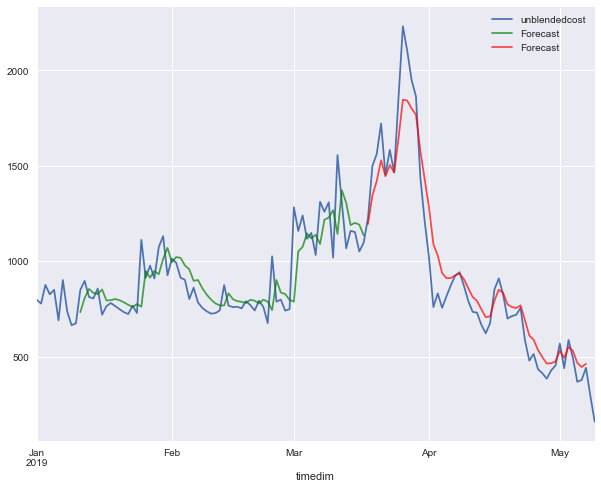

in sample
MAPE 17.24739497058314
rmse 131.18800222994574
out of sample
mape 41.17608186347463
rmse 128.15643796524677
[10, 16, 'tanh', 0.003]
Epoch 1/1000
66/66 [==============================] - 1s 21ms/sample - loss: 0.6986 - mean_squared_error: 0.6986
Epoch 2/1000
66/66 [==============================] - 0s 680us/sample - loss: 0.1520 - mean_squared_error: 0.1520
Epoch 3/1000
66/66 [==============================] - 0s 665us/sample - loss: 0.1292 - mean_squared_error: 0.1292
Epoch 4/1000
66/66 [==============================] - 0s 665us/sample - loss: 0.0632 - mean_squared_error: 0.0632
Epoch 5/1000
66/66 [==============================] - 0s 740us/sample - loss: 0.0605 - mean_squared_error: 0.0605
Epoch 6/1000
66/66 [==============================] - 0s 725us/sample - loss: 0.0452 - mean_squared_error: 0.0452
Epoch 7/1000
66/66 [==============================] - 0s 710us/sample - loss: 0.0391 - mean_squared_error: 0.0391
Epoch 8/1000
66/66 [==============================] - 0s 710u

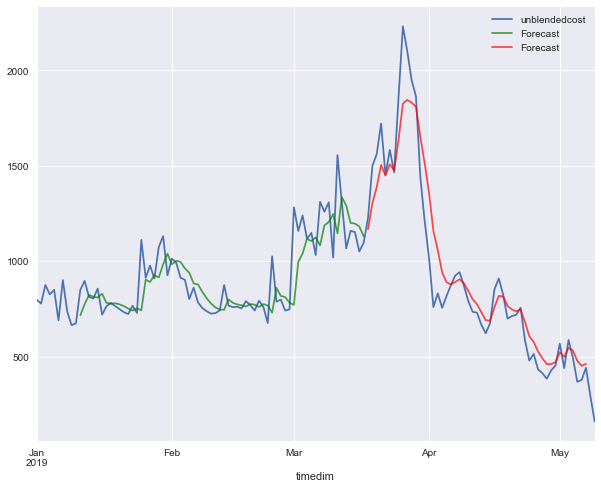

in sample
MAPE 16.82824573611551
rmse 131.4247303050331
out of sample
mape 40.676671402630454
rmse 143.39511009312642
[10, 16, 'tanh', 0.01]
Epoch 1/1000
66/66 [==============================] - 1s 21ms/sample - loss: 0.8485 - mean_squared_error: 0.8485
Epoch 2/1000
66/66 [==============================] - 0s 589us/sample - loss: 0.8438 - mean_squared_error: 0.8438
Epoch 3/1000
66/66 [==============================] - 0s 665us/sample - loss: 0.8391 - mean_squared_error: 0.8391
Epoch 4/1000
66/66 [==============================] - 0s 756us/sample - loss: 0.8344 - mean_squared_error: 0.8344
Epoch 5/1000
66/66 [==============================] - 0s 801us/sample - loss: 0.8293 - mean_squared_error: 0.8293
Epoch 6/1000
66/66 [==============================] - 0s 710us/sample - loss: 0.8239 - mean_squared_error: 0.8239
Epoch 7/1000
66/66 [==============================] - 0s 589us/sample - loss: 0.8185 - mean_squared_error: 0.8185
Epoch 8/1000
66/66 [==============================] - 0s 635us

66/66 [==============================] - 0s 1ms/sample - loss: 0.5221 - mean_squared_error: 0.5221
Epoch 71/1000
66/66 [==============================] - 0s 1ms/sample - loss: 0.5172 - mean_squared_error: 0.5172
Epoch 72/1000
66/66 [==============================] - 0s 1ms/sample - loss: 0.5124 - mean_squared_error: 0.5124
Epoch 73/1000
66/66 [==============================] - 0s 876us/sample - loss: 0.5075 - mean_squared_error: 0.5075
Epoch 74/1000
66/66 [==============================] - 0s 1ms/sample - loss: 0.5026 - mean_squared_error: 0.5026
Epoch 75/1000
66/66 [==============================] - 0s 1ms/sample - loss: 0.4978 - mean_squared_error: 0.4978
Epoch 76/1000
66/66 [==============================] - 0s 1ms/sample - loss: 0.4929 - mean_squared_error: 0.4929
Epoch 77/1000
66/66 [==============================] - 0s 1ms/sample - loss: 0.4879 - mean_squared_error: 0.4879
Epoch 78/1000
66/66 [==============================] - 0s 1ms/sample - loss: 0.4829 - mean_squared_error: 0.

66/66 [==============================] - 0s 1ms/sample - loss: 0.2079 - mean_squared_error: 0.2079
Epoch 142/1000
66/66 [==============================] - 0s 892us/sample - loss: 0.2069 - mean_squared_error: 0.2069
Epoch 143/1000
66/66 [==============================] - 0s 740us/sample - loss: 0.2059 - mean_squared_error: 0.2059
Epoch 144/1000
66/66 [==============================] - 0s 710us/sample - loss: 0.2050 - mean_squared_error: 0.2050
Epoch 145/1000
66/66 [==============================] - 0s 771us/sample - loss: 0.2040 - mean_squared_error: 0.2040
Epoch 146/1000
66/66 [==============================] - 0s 740us/sample - loss: 0.2031 - mean_squared_error: 0.2031
Epoch 147/1000
66/66 [==============================] - 0s 710us/sample - loss: 0.2022 - mean_squared_error: 0.2022
Epoch 148/1000
66/66 [==============================] - 0s 801us/sample - loss: 0.2013 - mean_squared_error: 0.2013
Epoch 149/1000
66/66 [==============================] - 0s 861us/sample - loss: 0.2004 - 

66/66 [==============================] - 0s 695us/sample - loss: 0.1510 - mean_squared_error: 0.1510
Epoch 212/1000
66/66 [==============================] - 0s 982us/sample - loss: 0.1502 - mean_squared_error: 0.1502
Epoch 213/1000
66/66 [==============================] - 0s 756us/sample - loss: 0.1495 - mean_squared_error: 0.1495
Epoch 214/1000
66/66 [==============================] - 0s 635us/sample - loss: 0.1487 - mean_squared_error: 0.1487
Epoch 215/1000
66/66 [==============================] - 0s 740us/sample - loss: 0.1479 - mean_squared_error: 0.1479
Epoch 216/1000
66/66 [==============================] - 0s 589us/sample - loss: 0.1471 - mean_squared_error: 0.1471
Epoch 217/1000
66/66 [==============================] - 0s 635us/sample - loss: 0.1464 - mean_squared_error: 0.1464
Epoch 218/1000
66/66 [==============================] - 0s 907us/sample - loss: 0.1456 - mean_squared_error: 0.1456
Epoch 219/1000
66/66 [==============================] - 0s 604us/sample - loss: 0.1448 

66/66 [==============================] - 0s 710us/sample - loss: 0.1059 - mean_squared_error: 0.1059
Epoch 282/1000
66/66 [==============================] - 0s 665us/sample - loss: 0.1056 - mean_squared_error: 0.1056
Epoch 283/1000
66/66 [==============================] - 0s 786us/sample - loss: 0.1052 - mean_squared_error: 0.1052
Epoch 284/1000
66/66 [==============================] - 0s 695us/sample - loss: 0.1049 - mean_squared_error: 0.1049
Epoch 285/1000
66/66 [==============================] - 0s 650us/sample - loss: 0.1046 - mean_squared_error: 0.1046
Epoch 286/1000
66/66 [==============================] - 0s 740us/sample - loss: 0.1043 - mean_squared_error: 0.1043
Epoch 287/1000
66/66 [==============================] - 0s 680us/sample - loss: 0.1039 - mean_squared_error: 0.1039
Epoch 288/1000
66/66 [==============================] - 0s 680us/sample - loss: 0.1036 - mean_squared_error: 0.1036
Epoch 289/1000
66/66 [==============================] - 0s 725us/sample - loss: 0.1034 

66/66 [==============================] - 0s 922us/sample - loss: 0.0888 - mean_squared_error: 0.0888
Epoch 352/1000
66/66 [==============================] - 0s 876us/sample - loss: 0.0886 - mean_squared_error: 0.0886
Epoch 353/1000
66/66 [==============================] - 0s 1ms/sample - loss: 0.0884 - mean_squared_error: 0.0884
Epoch 354/1000
66/66 [==============================] - 0s 1ms/sample - loss: 0.0882 - mean_squared_error: 0.0882
Epoch 355/1000
66/66 [==============================] - 0s 771us/sample - loss: 0.0881 - mean_squared_error: 0.0881
Epoch 356/1000
66/66 [==============================] - 0s 982us/sample - loss: 0.0878 - mean_squared_error: 0.0878
Epoch 357/1000
66/66 [==============================] - 0s 801us/sample - loss: 0.0876 - mean_squared_error: 0.0876
Epoch 358/1000
66/66 [==============================] - 0s 801us/sample - loss: 0.0874 - mean_squared_error: 0.0874
Epoch 359/1000
66/66 [==============================] - 0s 861us/sample - loss: 0.0872 - me

66/66 [==============================] - 0s 710us/sample - loss: 0.0756 - mean_squared_error: 0.0756
Epoch 423/1000
66/66 [==============================] - 0s 635us/sample - loss: 0.0754 - mean_squared_error: 0.0754
Epoch 424/1000
66/66 [==============================] - 0s 771us/sample - loss: 0.0752 - mean_squared_error: 0.0752
Epoch 425/1000
66/66 [==============================] - 0s 695us/sample - loss: 0.0750 - mean_squared_error: 0.0750
Epoch 426/1000
66/66 [==============================] - ETA: 0s - loss: 0.0655 - mean_squared_error: 0.06 - 0s 725us/sample - loss: 0.0748 - mean_squared_error: 0.0748
Epoch 427/1000
66/66 [==============================] - 0s 725us/sample - loss: 0.0746 - mean_squared_error: 0.0746
Epoch 428/1000
66/66 [==============================] - 0s 922us/sample - loss: 0.0745 - mean_squared_error: 0.0745
Epoch 429/1000
66/66 [==============================] - 0s 756us/sample - loss: 0.0743 - mean_squared_error: 0.0743
Epoch 430/1000
66/66 [=============

66/66 [==============================] - 0s 635us/sample - loss: 0.0648 - mean_squared_error: 0.0648
Epoch 492/1000
66/66 [==============================] - 0s 710us/sample - loss: 0.0647 - mean_squared_error: 0.0647
Epoch 493/1000
66/66 [==============================] - 0s 620us/sample - loss: 0.0645 - mean_squared_error: 0.0645
Epoch 494/1000
66/66 [==============================] - 0s 756us/sample - loss: 0.0644 - mean_squared_error: 0.0644
Epoch 495/1000
66/66 [==============================] - 0s 816us/sample - loss: 0.0643 - mean_squared_error: 0.0643
Epoch 496/1000
66/66 [==============================] - 0s 680us/sample - loss: 0.0641 - mean_squared_error: 0.0641
Epoch 497/1000
66/66 [==============================] - 0s 741us/sample - loss: 0.0640 - mean_squared_error: 0.0640
Epoch 498/1000
66/66 [==============================] - 0s 816us/sample - loss: 0.0639 - mean_squared_error: 0.0639
Epoch 499/1000
66/66 [==============================] - 0s 740us/sample - loss: 0.0637 

66/66 [==============================] - 0s 801us/sample - loss: 0.0559 - mean_squared_error: 0.0559
Epoch 562/1000
66/66 [==============================] - 0s 740us/sample - loss: 0.0558 - mean_squared_error: 0.0558
Epoch 563/1000
66/66 [==============================] - 0s 635us/sample - loss: 0.0557 - mean_squared_error: 0.0557
Epoch 564/1000
66/66 [==============================] - 0s 589us/sample - loss: 0.0556 - mean_squared_error: 0.0556
Epoch 565/1000
66/66 [==============================] - 0s 604us/sample - loss: 0.0555 - mean_squared_error: 0.0555
Epoch 566/1000
66/66 [==============================] - 0s 665us/sample - loss: 0.0554 - mean_squared_error: 0.0554
Epoch 567/1000
66/66 [==============================] - 0s 725us/sample - loss: 0.0552 - mean_squared_error: 0.0552
Epoch 568/1000
66/66 [==============================] - 0s 680us/sample - loss: 0.0551 - mean_squared_error: 0.0551
Epoch 569/1000
66/66 [==============================] - 0s 725us/sample - loss: 0.0550 

66/66 [==============================] - 0s 604us/sample - loss: 0.0486 - mean_squared_error: 0.0486
Epoch 632/1000
66/66 [==============================] - 0s 695us/sample - loss: 0.0486 - mean_squared_error: 0.0486
Epoch 633/1000
66/66 [==============================] - 0s 756us/sample - loss: 0.0484 - mean_squared_error: 0.0484
Epoch 634/1000
66/66 [==============================] - 0s 695us/sample - loss: 0.0484 - mean_squared_error: 0.0484
Epoch 635/1000
66/66 [==============================] - 0s 604us/sample - loss: 0.0483 - mean_squared_error: 0.0483
Epoch 636/1000
66/66 [==============================] - 0s 695us/sample - loss: 0.0482 - mean_squared_error: 0.0482
Epoch 637/1000
66/66 [==============================] - 0s 710us/sample - loss: 0.0481 - mean_squared_error: 0.0481
Epoch 638/1000
66/66 [==============================] - 0s 650us/sample - loss: 0.0480 - mean_squared_error: 0.0480
Epoch 639/1000
66/66 [==============================] - 0s 831us/sample - loss: 0.0479 

66/66 [==============================] - 0s 756us/sample - loss: 0.0424 - mean_squared_error: 0.0424
Epoch 702/1000
66/66 [==============================] - 0s 786us/sample - loss: 0.0424 - mean_squared_error: 0.0424
Epoch 703/1000
66/66 [==============================] - 0s 620us/sample - loss: 0.0423 - mean_squared_error: 0.0423
Epoch 704/1000
66/66 [==============================] - 0s 695us/sample - loss: 0.0422 - mean_squared_error: 0.0422
Epoch 705/1000
66/66 [==============================] - 0s 574us/sample - loss: 0.0421 - mean_squared_error: 0.0421
Epoch 706/1000
66/66 [==============================] - 0s 635us/sample - loss: 0.0420 - mean_squared_error: 0.0420
Epoch 707/1000
66/66 [==============================] - 0s 801us/sample - loss: 0.0420 - mean_squared_error: 0.0420
Epoch 708/1000
66/66 [==============================] - 0s 604us/sample - loss: 0.0419 - mean_squared_error: 0.0419
Epoch 709/1000
66/66 [==============================] - 0s 589us/sample - loss: 0.0418 

66/66 [==============================] - 0s 665us/sample - loss: 0.0372 - mean_squared_error: 0.0372
Epoch 772/1000
66/66 [==============================] - 0s 635us/sample - loss: 0.0371 - mean_squared_error: 0.0371
Epoch 773/1000
66/66 [==============================] - 0s 740us/sample - loss: 0.0371 - mean_squared_error: 0.0371
Epoch 774/1000
66/66 [==============================] - 0s 892us/sample - loss: 0.0370 - mean_squared_error: 0.0370
Epoch 775/1000
66/66 [==============================] - 0s 650us/sample - loss: 0.0370 - mean_squared_error: 0.0370
Epoch 776/1000
66/66 [==============================] - 0s 574us/sample - loss: 0.0369 - mean_squared_error: 0.0369
Epoch 777/1000
66/66 [==============================] - 0s 635us/sample - loss: 0.0368 - mean_squared_error: 0.0368
Epoch 778/1000
66/66 [==============================] - 0s 604us/sample - loss: 0.0368 - mean_squared_error: 0.0368
Epoch 779/1000
66/66 [==============================] - 0s 589us/sample - loss: 0.0367 

66/66 [==============================] - 0s 680us/sample - loss: 0.0327 - mean_squared_error: 0.0327
Epoch 842/1000
66/66 [==============================] - 0s 756us/sample - loss: 0.0326 - mean_squared_error: 0.0326
Epoch 843/1000
66/66 [==============================] - 0s 846us/sample - loss: 0.0326 - mean_squared_error: 0.0326
Epoch 844/1000
66/66 [==============================] - 0s 771us/sample - loss: 0.0325 - mean_squared_error: 0.0325
Epoch 845/1000
66/66 [==============================] - 0s 816us/sample - loss: 0.0325 - mean_squared_error: 0.0325
Epoch 846/1000
66/66 [==============================] - 0s 786us/sample - loss: 0.0324 - mean_squared_error: 0.0324
Epoch 847/1000
66/66 [==============================] - 0s 982us/sample - loss: 0.0323 - mean_squared_error: 0.0323
Epoch 848/1000
66/66 [==============================] - 0s 695us/sample - loss: 0.0323 - mean_squared_error: 0.0323
Epoch 849/1000
66/66 [==============================] - 0s 710us/sample - loss: 0.0322 

66/66 [==============================] - 0s 635us/sample - loss: 0.0289 - mean_squared_error: 0.0289
Epoch 912/1000
66/66 [==============================] - 0s 544us/sample - loss: 0.0288 - mean_squared_error: 0.0288
Epoch 913/1000
66/66 [==============================] - 0s 620us/sample - loss: 0.0288 - mean_squared_error: 0.0288
Epoch 914/1000
66/66 [==============================] - 0s 695us/sample - loss: 0.0287 - mean_squared_error: 0.0287
Epoch 915/1000
66/66 [==============================] - 0s 604us/sample - loss: 0.0287 - mean_squared_error: 0.0287
Epoch 916/1000
66/66 [==============================] - 0s 680us/sample - loss: 0.0286 - mean_squared_error: 0.0286
Epoch 917/1000
66/66 [==============================] - 0s 604us/sample - loss: 0.0286 - mean_squared_error: 0.0286
Epoch 918/1000
66/66 [==============================] - 0s 740us/sample - loss: 0.0285 - mean_squared_error: 0.0285
Epoch 919/1000
66/66 [==============================] - 0s 740us/sample - loss: 0.0285 

66/66 [==============================] - 0s 680us/sample - loss: 0.0260 - mean_squared_error: 0.0260
Epoch 982/1000
66/66 [==============================] - 0s 725us/sample - loss: 0.0259 - mean_squared_error: 0.0259
Epoch 983/1000
66/66 [==============================] - 0s 786us/sample - loss: 0.0259 - mean_squared_error: 0.0259
Epoch 984/1000
66/66 [==============================] - 0s 801us/sample - loss: 0.0259 - mean_squared_error: 0.0259
Epoch 985/1000
66/66 [==============================] - 0s 861us/sample - loss: 0.0258 - mean_squared_error: 0.0258
Epoch 986/1000
66/66 [==============================] - 0s 907us/sample - loss: 0.0258 - mean_squared_error: 0.0258
Epoch 987/1000
66/66 [==============================] - 0s 831us/sample - loss: 0.0258 - mean_squared_error: 0.0258
Epoch 988/1000
66/66 [==============================] - 0s 1ms/sample - loss: 0.0257 - mean_squared_error: 0.0257
Epoch 989/1000
66/66 [==============================] - 0s 937us/sample - loss: 0.0257 - 

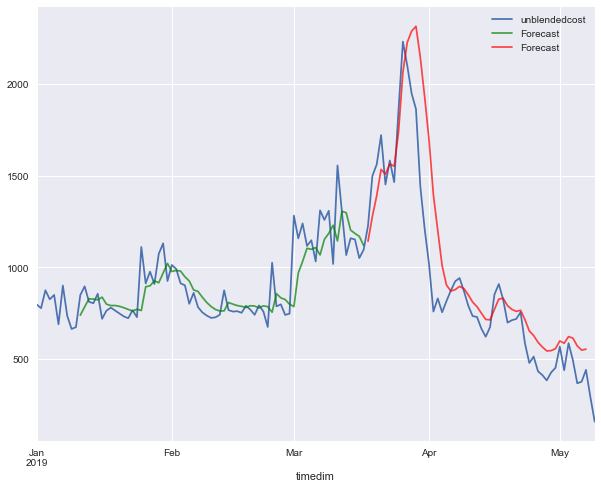

in sample
MAPE 16.182786444459563
rmse 129.85885092626
out of sample
mape 41.046748058398435
rmse 240.00916188607235
[10, 16, 'relu', 0.0001]
Epoch 1/1000
66/66 [==============================] - 1s 22ms/sample - loss: 0.8078 - mean_squared_error: 0.8078
Epoch 2/1000
66/66 [==============================] - 0s 484us/sample - loss: 0.7988 - mean_squared_error: 0.7988
Epoch 3/1000
66/66 [==============================] - 0s 499us/sample - loss: 0.7897 - mean_squared_error: 0.7897
Epoch 4/1000
66/66 [==============================] - 0s 499us/sample - loss: 0.7809 - mean_squared_error: 0.7809
Epoch 5/1000
66/66 [==============================] - 0s 499us/sample - loss: 0.7725 - mean_squared_error: 0.7725
Epoch 6/1000
66/66 [==============================] - 0s 499us/sample - loss: 0.7643 - mean_squared_error: 0.7643
Epoch 7/1000
66/66 [==============================] - 0s 559us/sample - loss: 0.7563 - mean_squared_error: 0.7563
Epoch 8/1000
66/66 [==============================] - 0s 529u

66/66 [==============================] - 0s 604us/sample - loss: 0.1454 - mean_squared_error: 0.1454
Epoch 71/1000
66/66 [==============================] - 0s 861us/sample - loss: 0.1436 - mean_squared_error: 0.1436
Epoch 72/1000
66/66 [==============================] - 0s 937us/sample - loss: 0.1417 - mean_squared_error: 0.1417
Epoch 73/1000
66/66 [==============================] - 0s 816us/sample - loss: 0.1398 - mean_squared_error: 0.1398
Epoch 74/1000
66/66 [==============================] - 0s 680us/sample - loss: 0.1379 - mean_squared_error: 0.1379
Epoch 75/1000
66/66 [==============================] - 0s 650us/sample - loss: 0.1360 - mean_squared_error: 0.1360
Epoch 76/1000
66/66 [==============================] - 0s 756us/sample - loss: 0.1341 - mean_squared_error: 0.1341
Epoch 77/1000
66/66 [==============================] - 0s 620us/sample - loss: 0.1323 - mean_squared_error: 0.1323
Epoch 78/1000
66/66 [==============================] - 0s 620us/sample - loss: 0.1303 - mean_s

66/66 [==============================] - 0s 544us/sample - loss: 0.0656 - mean_squared_error: 0.0656
Epoch 142/1000
66/66 [==============================] - 0s 604us/sample - loss: 0.0652 - mean_squared_error: 0.0652
Epoch 143/1000
66/66 [==============================] - 0s 499us/sample - loss: 0.0647 - mean_squared_error: 0.0647
Epoch 144/1000
66/66 [==============================] - 0s 635us/sample - loss: 0.0642 - mean_squared_error: 0.0642
Epoch 145/1000
66/66 [==============================] - 0s 604us/sample - loss: 0.0637 - mean_squared_error: 0.0637
Epoch 146/1000
66/66 [==============================] - 0s 529us/sample - loss: 0.0633 - mean_squared_error: 0.0633
Epoch 147/1000
66/66 [==============================] - 0s 499us/sample - loss: 0.0629 - mean_squared_error: 0.0629
Epoch 148/1000
66/66 [==============================] - 0s 589us/sample - loss: 0.0624 - mean_squared_error: 0.0624
Epoch 149/1000
66/66 [==============================] - 0s 529us/sample - loss: 0.0620 

66/66 [==============================] - 0s 544us/sample - loss: 0.0434 - mean_squared_error: 0.0434
Epoch 212/1000
66/66 [==============================] - 0s 499us/sample - loss: 0.0434 - mean_squared_error: 0.0434
Epoch 213/1000
66/66 [==============================] - 0s 499us/sample - loss: 0.0432 - mean_squared_error: 0.0432
Epoch 214/1000
66/66 [==============================] - 0s 514us/sample - loss: 0.0428 - mean_squared_error: 0.0428
Epoch 215/1000
66/66 [==============================] - 0s 499us/sample - loss: 0.0429 - mean_squared_error: 0.0429
Epoch 216/1000
66/66 [==============================] - 0s 499us/sample - loss: 0.0428 - mean_squared_error: 0.0428
Epoch 217/1000
66/66 [==============================] - 0s 484us/sample - loss: 0.0423 - mean_squared_error: 0.0423
Epoch 218/1000
66/66 [==============================] - 0s 484us/sample - loss: 0.0422 - mean_squared_error: 0.0422
Epoch 219/1000
66/66 [==============================] - 0s 499us/sample - loss: 0.0419 

66/66 [==============================] - 0s 620us/sample - loss: 0.0329 - mean_squared_error: 0.0329
Epoch 282/1000
66/66 [==============================] - 0s 544us/sample - loss: 0.0328 - mean_squared_error: 0.0328
Epoch 283/1000
66/66 [==============================] - 0s 529us/sample - loss: 0.0328 - mean_squared_error: 0.0328
Epoch 284/1000
66/66 [==============================] - 0s 499us/sample - loss: 0.0326 - mean_squared_error: 0.0326
Epoch 285/1000
66/66 [==============================] - 0s 499us/sample - loss: 0.0324 - mean_squared_error: 0.0324
Epoch 286/1000
66/66 [==============================] - 0s 559us/sample - loss: 0.0324 - mean_squared_error: 0.0324
Epoch 287/1000
66/66 [==============================] - 0s 559us/sample - loss: 0.0322 - mean_squared_error: 0.0322
Epoch 288/1000
66/66 [==============================] - 0s 589us/sample - loss: 0.0321 - mean_squared_error: 0.0321
Epoch 289/1000
66/66 [==============================] - 0s 756us/sample - loss: 0.0320 

66/66 [==============================] - 0s 544us/sample - loss: 0.0263 - mean_squared_error: 0.0263
Epoch 352/1000
66/66 [==============================] - 0s 514us/sample - loss: 0.0262 - mean_squared_error: 0.0262
Epoch 353/1000
66/66 [==============================] - 0s 604us/sample - loss: 0.0262 - mean_squared_error: 0.0262
Epoch 354/1000
66/66 [==============================] - 0s 559us/sample - loss: 0.0261 - mean_squared_error: 0.0261
Epoch 355/1000
66/66 [==============================] - 0s 544us/sample - loss: 0.0261 - mean_squared_error: 0.0261
Epoch 356/1000
66/66 [==============================] - 0s 892us/sample - loss: 0.0260 - mean_squared_error: 0.0260
Epoch 357/1000
66/66 [==============================] - 0s 997us/sample - loss: 0.0259 - mean_squared_error: 0.0259
Epoch 358/1000
66/66 [==============================] - 0s 725us/sample - loss: 0.0259 - mean_squared_error: 0.0259
Epoch 359/1000
66/66 [==============================] - 0s 710us/sample - loss: 0.0258 

66/66 [==============================] - 0s 635us/sample - loss: 0.0222 - mean_squared_error: 0.0222
Epoch 422/1000
66/66 [==============================] - 0s 680us/sample - loss: 0.0222 - mean_squared_error: 0.0222
Epoch 423/1000
66/66 [==============================] - 0s 665us/sample - loss: 0.0221 - mean_squared_error: 0.0221
Epoch 424/1000
66/66 [==============================] - 0s 710us/sample - loss: 0.0221 - mean_squared_error: 0.0221
Epoch 425/1000
66/66 [==============================] - 0s 665us/sample - loss: 0.0220 - mean_squared_error: 0.0220
Epoch 426/1000
66/66 [==============================] - 0s 680us/sample - loss: 0.0221 - mean_squared_error: 0.0221
Epoch 427/1000
66/66 [==============================] - 0s 604us/sample - loss: 0.0220 - mean_squared_error: 0.0220
Epoch 428/1000
66/66 [==============================] - 0s 680us/sample - loss: 0.0220 - mean_squared_error: 0.0220
Epoch 429/1000
66/66 [==============================] - 0s 695us/sample - loss: 0.0219 

66/66 [==============================] - 0s 680us/sample - loss: 0.0197 - mean_squared_error: 0.0197
Epoch 492/1000
66/66 [==============================] - 0s 831us/sample - loss: 0.0196 - mean_squared_error: 0.0196
Epoch 493/1000
66/66 [==============================] - 0s 1ms/sample - loss: 0.0195 - mean_squared_error: 0.0195
Epoch 494/1000
66/66 [==============================] - 0s 710us/sample - loss: 0.0195 - mean_squared_error: 0.0195
Epoch 495/1000
66/66 [==============================] - 0s 756us/sample - loss: 0.0195 - mean_squared_error: 0.0195
Epoch 496/1000
66/66 [==============================] - 0s 710us/sample - loss: 0.0194 - mean_squared_error: 0.0194
Epoch 497/1000
66/66 [==============================] - 0s 740us/sample - loss: 0.0194 - mean_squared_error: 0.0194
Epoch 498/1000
66/66 [==============================] - 0s 861us/sample - loss: 0.0195 - mean_squared_error: 0.0195
Epoch 499/1000
66/66 [==============================] - 0s 756us/sample - loss: 0.0194 - 

66/66 [==============================] - 0s 725us/sample - loss: 0.0181 - mean_squared_error: 0.0181
Epoch 562/1000
66/66 [==============================] - 0s 756us/sample - loss: 0.0182 - mean_squared_error: 0.0182
Epoch 563/1000
66/66 [==============================] - 0s 907us/sample - loss: 0.0181 - mean_squared_error: 0.0181
Epoch 00563: early stopping


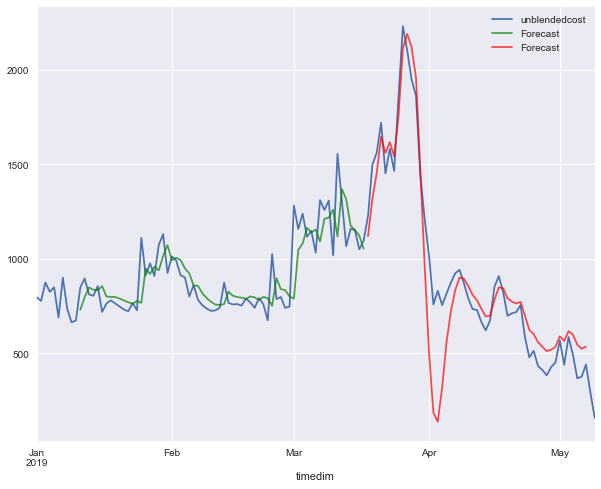

in sample
MAPE 16.947204616778528
rmse 128.93824034408595
out of sample
mape 38.53826107690654
rmse 188.83529100289644
[10, 16, 'relu', 0.0003]
Epoch 1/1000
66/66 [==============================] - 2s 24ms/sample - loss: 0.4867 - mean_squared_error: 0.4867
Epoch 2/1000
66/66 [==============================] - 0s 344us/sample - loss: 0.4278 - mean_squared_error: 0.4278
Epoch 3/1000
66/66 [==============================] - 0s 710us/sample - loss: 0.3711 - mean_squared_error: 0.3711
Epoch 4/1000
66/66 [==============================] - 0s 473us/sample - loss: 0.3163 - mean_squared_error: 0.3163
Epoch 5/1000
66/66 [==============================] - 0s 710us/sample - loss: 0.2641 - mean_squared_error: 0.2641
Epoch 6/1000
66/66 [==============================] - 0s 473us/sample - loss: 0.2172 - mean_squared_error: 0.2172
Epoch 7/1000
66/66 [==============================] - 0s 710us/sample - loss: 0.1780 - mean_squared_error: 0.1780
Epoch 8/1000
66/66 [==============================] - 0s 47

66/66 [==============================] - 0s 378us/sample - loss: 0.0343 - mean_squared_error: 0.0343
Epoch 71/1000
66/66 [==============================] - 0s 710us/sample - loss: 0.0345 - mean_squared_error: 0.0345
Epoch 72/1000
66/66 [==============================] - 0s 710us/sample - loss: 0.0330 - mean_squared_error: 0.0330
Epoch 73/1000
66/66 [==============================] - 0s 473us/sample - loss: 0.0327 - mean_squared_error: 0.0327
Epoch 74/1000
66/66 [==============================] - 0s 597us/sample - loss: 0.0324 - mean_squared_error: 0.0324
Epoch 75/1000
66/66 [==============================] - 0s 587us/sample - loss: 0.0318 - mean_squared_error: 0.0318
Epoch 76/1000
66/66 [==============================] - 0s 473us/sample - loss: 0.0314 - mean_squared_error: 0.0314
Epoch 77/1000
66/66 [==============================] - 0s 473us/sample - loss: 0.0311 - mean_squared_error: 0.0311
Epoch 78/1000
66/66 [==============================] - 0s 473us/sample - loss: 0.0307 - mean_s

66/66 [==============================] - 0s 541us/sample - loss: 0.0193 - mean_squared_error: 0.0193
Epoch 142/1000
66/66 [==============================] - 0s 409us/sample - loss: 0.0193 - mean_squared_error: 0.0193
Epoch 143/1000
66/66 [==============================] - 0s 473us/sample - loss: 0.0191 - mean_squared_error: 0.0191
Epoch 144/1000
66/66 [==============================] - 0s 710us/sample - loss: 0.0191 - mean_squared_error: 0.0191
Epoch 145/1000
66/66 [==============================] - 0s 473us/sample - loss: 0.0190 - mean_squared_error: 0.0190
Epoch 146/1000
66/66 [==============================] - 0s 473us/sample - loss: 0.0189 - mean_squared_error: 0.0189
Epoch 147/1000
66/66 [==============================] - 0s 710us/sample - loss: 0.0189 - mean_squared_error: 0.0189
Epoch 148/1000
66/66 [==============================] - 0s 473us/sample - loss: 0.0188 - mean_squared_error: 0.0188
Epoch 149/1000
66/66 [==============================] - 0s 505us/sample - loss: 0.0189 

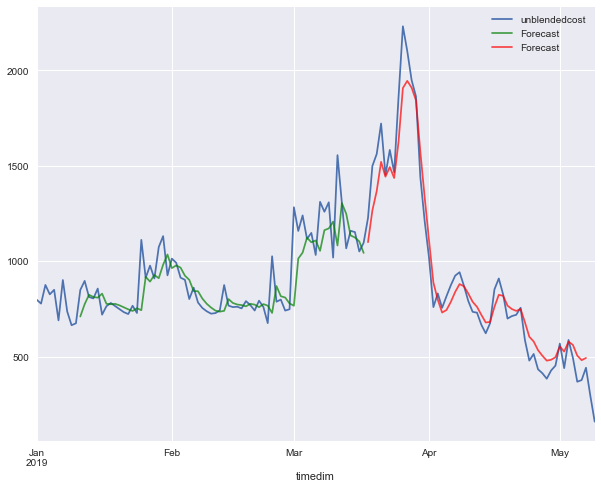

in sample
MAPE 16.47609664932971
rmse 131.5335136148496
out of sample
mape 37.5633971605194
rmse 105.39427753184312
[10, 16, 'relu', 0.001]
Epoch 1/1000
66/66 [==============================] - 1s 22ms/sample - loss: 0.6428 - mean_squared_error: 0.6428
Epoch 2/1000
66/66 [==============================] - 0s 261us/sample - loss: 0.5088 - mean_squared_error: 0.5088
Epoch 3/1000
66/66 [==============================] - 0s 473us/sample - loss: 0.3988 - mean_squared_error: 0.3988
Epoch 4/1000
66/66 [==============================] - 0s 473us/sample - loss: 0.3038 - mean_squared_error: 0.3038
Epoch 5/1000
66/66 [==============================] - 0s 473us/sample - loss: 0.2172 - mean_squared_error: 0.2172
Epoch 6/1000
66/66 [==============================] - 0s 474us/sample - loss: 0.1498 - mean_squared_error: 0.1498
Epoch 7/1000
66/66 [==============================] - 0s 710us/sample - loss: 0.1337 - mean_squared_error: 0.1337
Epoch 8/1000
66/66 [==============================] - 0s 473us/

66/66 [==============================] - 0s 473us/sample - loss: 0.0176 - mean_squared_error: 0.0176
Epoch 71/1000
66/66 [==============================] - 0s 473us/sample - loss: 0.0174 - mean_squared_error: 0.0174
Epoch 72/1000
66/66 [==============================] - 0s 473us/sample - loss: 0.0173 - mean_squared_error: 0.0173
Epoch 73/1000
66/66 [==============================] - 0s 473us/sample - loss: 0.0173 - mean_squared_error: 0.0173
Epoch 74/1000
66/66 [==============================] - 0s 341us/sample - loss: 0.0173 - mean_squared_error: 0.0173
Epoch 75/1000
66/66 [==============================] - 0s 692us/sample - loss: 0.0173 - mean_squared_error: 0.0173
Epoch 76/1000
66/66 [==============================] - 0s 473us/sample - loss: 0.0173 - mean_squared_error: 0.0173
Epoch 77/1000
66/66 [==============================] - 0s 473us/sample - loss: 0.0172 - mean_squared_error: 0.0172
Epoch 78/1000
66/66 [==============================] - 0s 473us/sample - loss: 0.0171 - mean_s

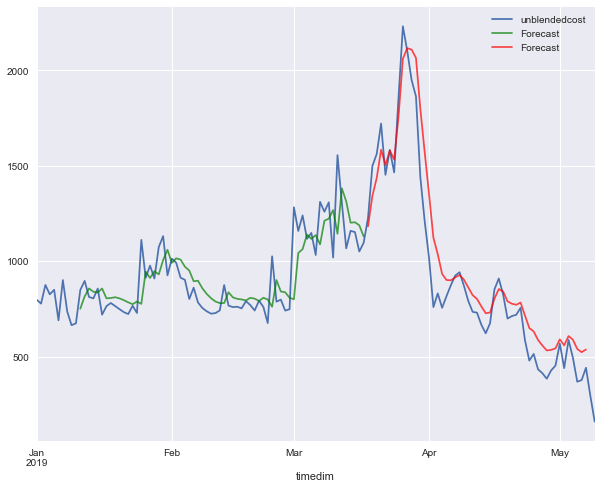

in sample
MAPE 16.867735048376105
rmse 130.5947381857283
out of sample
mape 40.238553448211626
rmse 143.74775554718335
[10, 16, 'relu', 0.003]
Epoch 1/1000
66/66 [==============================] - 1s 22ms/sample - loss: 0.3743 - mean_squared_error: 0.3743
Epoch 2/1000
66/66 [==============================] - 0s 274us/sample - loss: 0.1445 - mean_squared_error: 0.1445
Epoch 3/1000
66/66 [==============================] - 0s 473us/sample - loss: 0.1022 - mean_squared_error: 0.1022
Epoch 4/1000
66/66 [==============================] - 0s 474us/sample - loss: 0.0798 - mean_squared_error: 0.0798
Epoch 5/1000
66/66 [==============================] - 0s 596us/sample - loss: 0.0665 - mean_squared_error: 0.0665
Epoch 6/1000
66/66 [==============================] - 0s 473us/sample - loss: 0.0529 - mean_squared_error: 0.0529
Epoch 7/1000
66/66 [==============================] - 0s 473us/sample - loss: 0.0478 - mean_squared_error: 0.0478
Epoch 8/1000
66/66 [==============================] - 0s 473

66/66 [==============================] - 0s 710us/sample - loss: 0.0164 - mean_squared_error: 0.0164
Epoch 71/1000
66/66 [==============================] - 0s 473us/sample - loss: 0.0163 - mean_squared_error: 0.0163
Epoch 72/1000
66/66 [==============================] - 0s 473us/sample - loss: 0.0163 - mean_squared_error: 0.0163
Epoch 73/1000
66/66 [==============================] - 0s 473us/sample - loss: 0.0165 - mean_squared_error: 0.0165
Epoch 74/1000
66/66 [==============================] - 0s 563us/sample - loss: 0.0162 - mean_squared_error: 0.0162
Epoch 75/1000
66/66 [==============================] - 0s 503us/sample - loss: 0.0165 - mean_squared_error: 0.0165
Epoch 76/1000
66/66 [==============================] - 0s 473us/sample - loss: 0.0164 - mean_squared_error: 0.0164
Epoch 77/1000
66/66 [==============================] - 0s 473us/sample - loss: 0.0163 - mean_squared_error: 0.0163
Epoch 78/1000
66/66 [==============================] - 0s 473us/sample - loss: 0.0167 - mean_s

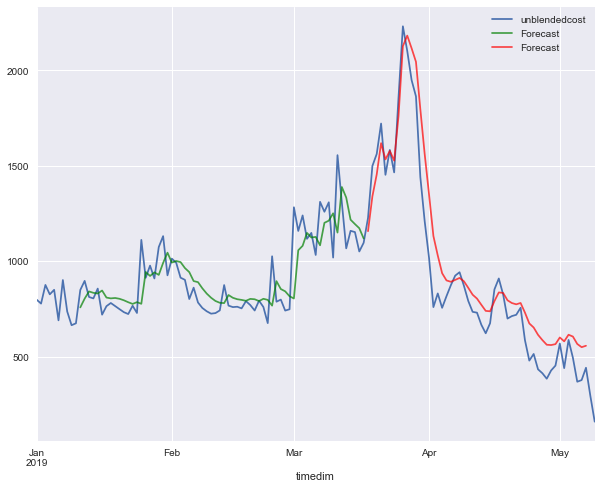

in sample
MAPE 16.85759524855382
rmse 128.69945952611675
out of sample
mape 39.76598572974419
rmse 148.4760083667617
[10, 16, 'relu', 0.01]
Epoch 1/1000
66/66 [==============================] - 2s 25ms/sample - loss: 0.9114 - mean_squared_error: 0.9114
Epoch 2/1000
66/66 [==============================] - 0s 513us/sample - loss: 0.8916 - mean_squared_error: 0.8916
Epoch 3/1000
66/66 [==============================] - 0s 473us/sample - loss: 0.8730 - mean_squared_error: 0.8730
Epoch 4/1000
66/66 [==============================] - 0s 710us/sample - loss: 0.8543 - mean_squared_error: 0.8543
Epoch 5/1000
66/66 [==============================] - 0s 649us/sample - loss: 0.8360 - mean_squared_error: 0.8360
Epoch 6/1000
66/66 [==============================] - 0s 527us/sample - loss: 0.8181 - mean_squared_error: 0.8181
Epoch 7/1000
66/66 [==============================] - 0s 473us/sample - loss: 0.8004 - mean_squared_error: 0.8004
Epoch 8/1000
66/66 [==============================] - 0s 710us/

66/66 [==============================] - 0s 412us/sample - loss: 0.1725 - mean_squared_error: 0.1725
Epoch 71/1000
66/66 [==============================] - 0s 622us/sample - loss: 0.1714 - mean_squared_error: 0.1714
Epoch 72/1000
66/66 [==============================] - 0s 345us/sample - loss: 0.1704 - mean_squared_error: 0.1704
Epoch 73/1000
66/66 [==============================] - 0s 473us/sample - loss: 0.1694 - mean_squared_error: 0.1694
Epoch 74/1000
66/66 [==============================] - 0s 473us/sample - loss: 0.1684 - mean_squared_error: 0.1684
Epoch 75/1000
66/66 [==============================] - 0s 473us/sample - loss: 0.1674 - mean_squared_error: 0.1674
Epoch 76/1000
66/66 [==============================] - 0s 473us/sample - loss: 0.1664 - mean_squared_error: 0.1664
Epoch 77/1000
66/66 [==============================] - 0s 710us/sample - loss: 0.1654 - mean_squared_error: 0.1654
Epoch 78/1000
66/66 [==============================] - 0s 534us/sample - loss: 0.1645 - mean_s

66/66 [==============================] - 0s 473us/sample - loss: 0.1168 - mean_squared_error: 0.1168
Epoch 142/1000
66/66 [==============================] - 0s 473us/sample - loss: 0.1162 - mean_squared_error: 0.1162
Epoch 143/1000
66/66 [==============================] - 0s 473us/sample - loss: 0.1156 - mean_squared_error: 0.1156
Epoch 144/1000
66/66 [==============================] - 0s 473us/sample - loss: 0.1150 - mean_squared_error: 0.1150
Epoch 145/1000
66/66 [==============================] - 0s 473us/sample - loss: 0.1144 - mean_squared_error: 0.1144
Epoch 146/1000
66/66 [==============================] - 0s 473us/sample - loss: 0.1138 - mean_squared_error: 0.1138
Epoch 147/1000
66/66 [==============================] - 0s 473us/sample - loss: 0.1132 - mean_squared_error: 0.1132
Epoch 148/1000
66/66 [==============================] - 0s 473us/sample - loss: 0.1126 - mean_squared_error: 0.1126
Epoch 149/1000
66/66 [==============================] - 0s 778us/sample - loss: 0.1120 

66/66 [==============================] - 0s 710us/sample - loss: 0.0813 - mean_squared_error: 0.0813
Epoch 212/1000
66/66 [==============================] - 0s 535us/sample - loss: 0.0809 - mean_squared_error: 0.0809
Epoch 213/1000
66/66 [==============================] - 0s 710us/sample - loss: 0.0805 - mean_squared_error: 0.0805
Epoch 214/1000
66/66 [==============================] - 0s 473us/sample - loss: 0.0801 - mean_squared_error: 0.0801
Epoch 215/1000
66/66 [==============================] - 0s 473us/sample - loss: 0.0797 - mean_squared_error: 0.0797
Epoch 216/1000
66/66 [==============================] - 0s 710us/sample - loss: 0.0793 - mean_squared_error: 0.0793
Epoch 217/1000
66/66 [==============================] - 0s 646us/sample - loss: 0.0789 - mean_squared_error: 0.0789
Epoch 218/1000
66/66 [==============================] - 0s 293us/sample - loss: 0.0785 - mean_squared_error: 0.0785
Epoch 219/1000
66/66 [==============================] - 0s 473us/sample - loss: 0.0781 

66/66 [==============================] - 0s 473us/sample - loss: 0.0611 - mean_squared_error: 0.0611
Epoch 282/1000
66/66 [==============================] - 0s 710us/sample - loss: 0.0609 - mean_squared_error: 0.0609
Epoch 283/1000
66/66 [==============================] - 0s 473us/sample - loss: 0.0607 - mean_squared_error: 0.0607
Epoch 284/1000
66/66 [==============================] - 0s 710us/sample - loss: 0.0605 - mean_squared_error: 0.0605
Epoch 285/1000
66/66 [==============================] - 0s 473us/sample - loss: 0.0604 - mean_squared_error: 0.0604
Epoch 286/1000
66/66 [==============================] - 0s 674us/sample - loss: 0.0602 - mean_squared_error: 0.0602
Epoch 287/1000
66/66 [==============================] - 0s 473us/sample - loss: 0.0600 - mean_squared_error: 0.0600
Epoch 288/1000
66/66 [==============================] - 0s 710us/sample - loss: 0.0598 - mean_squared_error: 0.0598
Epoch 289/1000
66/66 [==============================] - 0s 473us/sample - loss: 0.0597 

66/66 [==============================] - 0s 710us/sample - loss: 0.0502 - mean_squared_error: 0.0502
Epoch 352/1000
66/66 [==============================] - 0s 473us/sample - loss: 0.0500 - mean_squared_error: 0.0500
Epoch 353/1000
66/66 [==============================] - 0s 473us/sample - loss: 0.0499 - mean_squared_error: 0.0499
Epoch 354/1000
66/66 [==============================] - 0s 473us/sample - loss: 0.0498 - mean_squared_error: 0.0498
Epoch 355/1000
66/66 [==============================] - 0s 710us/sample - loss: 0.0497 - mean_squared_error: 0.0497
Epoch 356/1000
66/66 [==============================] - 0s 473us/sample - loss: 0.0495 - mean_squared_error: 0.0495
Epoch 357/1000
66/66 [==============================] - 0s 473us/sample - loss: 0.0494 - mean_squared_error: 0.0494
Epoch 358/1000
66/66 [==============================] - 0s 684us/sample - loss: 0.0493 - mean_squared_error: 0.0493
Epoch 359/1000
66/66 [==============================] - 0s 473us/sample - loss: 0.0492 

66/66 [==============================] - 0s 710us/sample - loss: 0.0420 - mean_squared_error: 0.0420
Epoch 422/1000
66/66 [==============================] - 0s 473us/sample - loss: 0.0419 - mean_squared_error: 0.0419
Epoch 423/1000
66/66 [==============================] - 0s 473us/sample - loss: 0.0418 - mean_squared_error: 0.0418
Epoch 424/1000
66/66 [==============================] - 0s 703us/sample - loss: 0.0417 - mean_squared_error: 0.0417
Epoch 425/1000
66/66 [==============================] - 0s 710us/sample - loss: 0.0416 - mean_squared_error: 0.0416
Epoch 426/1000
66/66 [==============================] - 0s 473us/sample - loss: 0.0415 - mean_squared_error: 0.0415
Epoch 427/1000
66/66 [==============================] - 0s 473us/sample - loss: 0.0414 - mean_squared_error: 0.0414
Epoch 428/1000
66/66 [==============================] - 0s 508us/sample - loss: 0.0413 - mean_squared_error: 0.0413
Epoch 429/1000
66/66 [==============================] - 0s 473us/sample - loss: 0.0412 

66/66 [==============================] - 0s 710us/sample - loss: 0.0356 - mean_squared_error: 0.0356
Epoch 492/1000
66/66 [==============================] - 0s 473us/sample - loss: 0.0355 - mean_squared_error: 0.0355
Epoch 493/1000
66/66 [==============================] - 0s 473us/sample - loss: 0.0354 - mean_squared_error: 0.0354
Epoch 494/1000
66/66 [==============================] - 0s 710us/sample - loss: 0.0354 - mean_squared_error: 0.0354
Epoch 495/1000
66/66 [==============================] - 0s 473us/sample - loss: 0.0353 - mean_squared_error: 0.0353
Epoch 496/1000
66/66 [==============================] - 0s 473us/sample - loss: 0.0352 - mean_squared_error: 0.0352
Epoch 497/1000
66/66 [==============================] - 0s 473us/sample - loss: 0.0352 - mean_squared_error: 0.0352
Epoch 498/1000
66/66 [==============================] - 0s 473us/sample - loss: 0.0351 - mean_squared_error: 0.0351
Epoch 499/1000
66/66 [==============================] - 0s 666us/sample - loss: 0.0350 

66/66 [==============================] - 0s 473us/sample - loss: 0.0306 - mean_squared_error: 0.0306
Epoch 562/1000
66/66 [==============================] - 0s 473us/sample - loss: 0.0306 - mean_squared_error: 0.0306
Epoch 563/1000
66/66 [==============================] - 0s 679us/sample - loss: 0.0305 - mean_squared_error: 0.0305
Epoch 564/1000
66/66 [==============================] - 0s 468us/sample - loss: 0.0304 - mean_squared_error: 0.0304
Epoch 565/1000
66/66 [==============================] - 0s 473us/sample - loss: 0.0304 - mean_squared_error: 0.0304
Epoch 566/1000
66/66 [==============================] - 0s 473us/sample - loss: 0.0303 - mean_squared_error: 0.0303
Epoch 567/1000
66/66 [==============================] - 0s 523us/sample - loss: 0.0303 - mean_squared_error: 0.0303
Epoch 568/1000
66/66 [==============================] - 0s 473us/sample - loss: 0.0302 - mean_squared_error: 0.0302
Epoch 569/1000
66/66 [==============================] - 0s 473us/sample - loss: 0.0301 

66/66 [==============================] - 0s 473us/sample - loss: 0.0268 - mean_squared_error: 0.0268
Epoch 632/1000
66/66 [==============================] - 0s 473us/sample - loss: 0.0268 - mean_squared_error: 0.0268
Epoch 633/1000
66/66 [==============================] - 0s 473us/sample - loss: 0.0267 - mean_squared_error: 0.0267
Epoch 634/1000
66/66 [==============================] - 0s 710us/sample - loss: 0.0267 - mean_squared_error: 0.0267
Epoch 635/1000
66/66 [==============================] - 0s 473us/sample - loss: 0.0266 - mean_squared_error: 0.0266
Epoch 636/1000
66/66 [==============================] - 0s 473us/sample - loss: 0.0266 - mean_squared_error: 0.0266
Epoch 637/1000
66/66 [==============================] - 0s 473us/sample - loss: 0.0265 - mean_squared_error: 0.0265
Epoch 638/1000
66/66 [==============================] - 0s 947us/sample - loss: 0.0265 - mean_squared_error: 0.0265
Epoch 639/1000
66/66 [==============================] - 0s 671us/sample - loss: 0.0264 

66/66 [==============================] - 0s 603us/sample - loss: 0.0239 - mean_squared_error: 0.0239
Epoch 702/1000
66/66 [==============================] - 0s 710us/sample - loss: 0.0239 - mean_squared_error: 0.0239
Epoch 703/1000
66/66 [==============================] - 0s 473us/sample - loss: 0.0239 - mean_squared_error: 0.0239
Epoch 704/1000
66/66 [==============================] - 0s 722us/sample - loss: 0.0238 - mean_squared_error: 0.0238
Epoch 705/1000
66/66 [==============================] - 0s 473us/sample - loss: 0.0238 - mean_squared_error: 0.0238
Epoch 706/1000
66/66 [==============================] - 0s 655us/sample - loss: 0.0237 - mean_squared_error: 0.0237
Epoch 707/1000
66/66 [==============================] - 0s 473us/sample - loss: 0.0237 - mean_squared_error: 0.0237
Epoch 708/1000
66/66 [==============================] - 0s 620us/sample - loss: 0.0237 - mean_squared_error: 0.0237
Epoch 709/1000
66/66 [==============================] - 0s 473us/sample - loss: 0.0236 

66/66 [==============================] - 0s 947us/sample - loss: 0.0218 - mean_squared_error: 0.0218
Epoch 772/1000
66/66 [==============================] - 0s 947us/sample - loss: 0.0217 - mean_squared_error: 0.0217
Epoch 773/1000
66/66 [==============================] - 0s 717us/sample - loss: 0.0217 - mean_squared_error: 0.0217
Epoch 774/1000
66/66 [==============================] - 0s 710us/sample - loss: 0.0217 - mean_squared_error: 0.0217
Epoch 775/1000
66/66 [==============================] - 0s 570us/sample - loss: 0.0217 - mean_squared_error: 0.0217
Epoch 776/1000
66/66 [==============================] - 0s 710us/sample - loss: 0.0216 - mean_squared_error: 0.0216
Epoch 777/1000
66/66 [==============================] - 0s 710us/sample - loss: 0.0216 - mean_squared_error: 0.0216
Epoch 778/1000
66/66 [==============================] - 0s 473us/sample - loss: 0.0216 - mean_squared_error: 0.0216
Epoch 779/1000
66/66 [==============================] - 0s 473us/sample - loss: 0.0216 

66/66 [==============================] - 0s 473us/sample - loss: 0.0202 - mean_squared_error: 0.0202
Epoch 842/1000
66/66 [==============================] - 0s 710us/sample - loss: 0.0202 - mean_squared_error: 0.0202
Epoch 843/1000
66/66 [==============================] - 0s 750us/sample - loss: 0.0202 - mean_squared_error: 0.0202
Epoch 844/1000
66/66 [==============================] - 0s 710us/sample - loss: 0.0201 - mean_squared_error: 0.0201
Epoch 845/1000
66/66 [==============================] - 0s 710us/sample - loss: 0.0201 - mean_squared_error: 0.0201
Epoch 846/1000
66/66 [==============================] - 0s 473us/sample - loss: 0.0201 - mean_squared_error: 0.0201
Epoch 847/1000
66/66 [==============================] - 0s 653us/sample - loss: 0.0201 - mean_squared_error: 0.0201
Epoch 848/1000
66/66 [==============================] - 0s 407us/sample - loss: 0.0201 - mean_squared_error: 0.0201
Epoch 849/1000
66/66 [==============================] - 0s 710us/sample - loss: 0.0200 

66/66 [==============================] - 0s 710us/sample - loss: 0.0190 - mean_squared_error: 0.0190
Epoch 912/1000
66/66 [==============================] - 0s 473us/sample - loss: 0.0190 - mean_squared_error: 0.0190
Epoch 913/1000
66/66 [==============================] - 0s 710us/sample - loss: 0.0190 - mean_squared_error: 0.0190
Epoch 914/1000
66/66 [==============================] - 0s 710us/sample - loss: 0.0190 - mean_squared_error: 0.0190
Epoch 915/1000
66/66 [==============================] - 0s 718us/sample - loss: 0.0190 - mean_squared_error: 0.0190
Epoch 916/1000
66/66 [==============================] - 0s 511us/sample - loss: 0.0189 - mean_squared_error: 0.0189
Epoch 917/1000
66/66 [==============================] - 0s 710us/sample - loss: 0.0189 - mean_squared_error: 0.0189
Epoch 918/1000
66/66 [==============================] - 0s 473us/sample - loss: 0.0189 - mean_squared_error: 0.0189
Epoch 919/1000
66/66 [==============================] - 0s 710us/sample - loss: 0.0189 

66/66 [==============================] - 0s 473us/sample - loss: 0.0181 - mean_squared_error: 0.0181
Epoch 982/1000
66/66 [==============================] - 0s 473us/sample - loss: 0.0181 - mean_squared_error: 0.0181
Epoch 983/1000
66/66 [==============================] - 0s 473us/sample - loss: 0.0181 - mean_squared_error: 0.0181
Epoch 984/1000
66/66 [==============================] - 0s 473us/sample - loss: 0.0181 - mean_squared_error: 0.0181
Epoch 985/1000
66/66 [==============================] - 0s 473us/sample - loss: 0.0181 - mean_squared_error: 0.0181
Epoch 986/1000
66/66 [==============================] - 0s 659us/sample - loss: 0.0181 - mean_squared_error: 0.0181
Epoch 987/1000
66/66 [==============================] - 0s 479us/sample - loss: 0.0181 - mean_squared_error: 0.0181
Epoch 988/1000
66/66 [==============================] - 0s 473us/sample - loss: 0.0181 - mean_squared_error: 0.0181
Epoch 989/1000
66/66 [==============================] - 0s 710us/sample - loss: 0.0180 

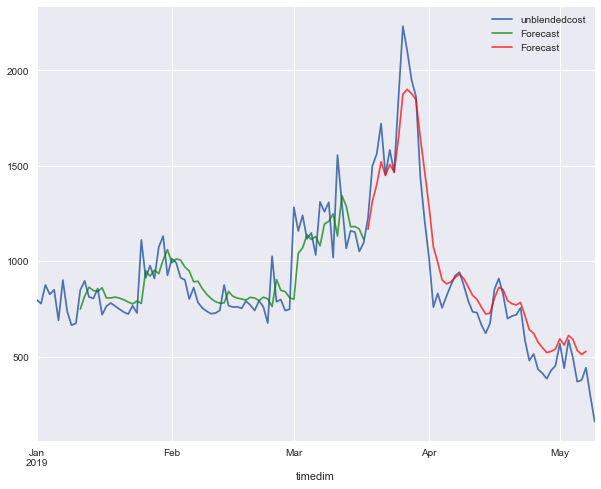

in sample
MAPE 16.740537770881513
rmse 129.5523451002368
out of sample
mape 40.140525306136006
rmse 135.0024074363896
[10, 32, 'tanh', 0.0001]
Epoch 1/1000
66/66 [==============================] - 2s 24ms/sample - loss: 0.7232 - mean_squared_error: 0.7232
Epoch 2/1000
66/66 [==============================] - 0s 267us/sample - loss: 0.6801 - mean_squared_error: 0.6801
Epoch 3/1000
66/66 [==============================] - 0s 473us/sample - loss: 0.6389 - mean_squared_error: 0.6389
Epoch 4/1000
66/66 [==============================] - 0s 579us/sample - loss: 0.5979 - mean_squared_error: 0.5979
Epoch 5/1000
66/66 [==============================] - 0s 473us/sample - loss: 0.5586 - mean_squared_error: 0.5586
Epoch 6/1000
66/66 [==============================] - 0s 473us/sample - loss: 0.5200 - mean_squared_error: 0.5200
Epoch 7/1000
66/66 [==============================] - 0s 710us/sample - loss: 0.4824 - mean_squared_error: 0.4824
Epoch 8/1000
66/66 [==============================] - 0s 473

66/66 [==============================] - 0s 710us/sample - loss: 0.0740 - mean_squared_error: 0.0740
Epoch 71/1000
66/66 [==============================] - 0s 473us/sample - loss: 0.0730 - mean_squared_error: 0.0730
Epoch 72/1000
66/66 [==============================] - 0s 710us/sample - loss: 0.0721 - mean_squared_error: 0.0721
Epoch 73/1000
66/66 [==============================] - 0s 473us/sample - loss: 0.0712 - mean_squared_error: 0.0712
Epoch 74/1000
66/66 [==============================] - 0s 710us/sample - loss: 0.0703 - mean_squared_error: 0.0703
Epoch 75/1000
66/66 [==============================] - 0s 473us/sample - loss: 0.0695 - mean_squared_error: 0.0695
Epoch 76/1000
66/66 [==============================] - 0s 730us/sample - loss: 0.0687 - mean_squared_error: 0.0687
Epoch 77/1000
66/66 [==============================] - 0s 442us/sample - loss: 0.0679 - mean_squared_error: 0.0679
Epoch 78/1000
66/66 [==============================] - 0s 710us/sample - loss: 0.0672 - mean_s

66/66 [==============================] - 0s 473us/sample - loss: 0.0421 - mean_squared_error: 0.0421
Epoch 141/1000
66/66 [==============================] - 0s 473us/sample - loss: 0.0419 - mean_squared_error: 0.0419
Epoch 142/1000
66/66 [==============================] - 0s 473us/sample - loss: 0.0416 - mean_squared_error: 0.0416
Epoch 143/1000
66/66 [==============================] - 0s 473us/sample - loss: 0.0414 - mean_squared_error: 0.0414
Epoch 144/1000
66/66 [==============================] - 0s 473us/sample - loss: 0.0411 - mean_squared_error: 0.0411
Epoch 145/1000
66/66 [==============================] - 0s 473us/sample - loss: 0.0409 - mean_squared_error: 0.0409
Epoch 146/1000
66/66 [==============================] - 0s 473us/sample - loss: 0.0406 - mean_squared_error: 0.0406
Epoch 147/1000
66/66 [==============================] - 0s 473us/sample - loss: 0.0403 - mean_squared_error: 0.0403
Epoch 148/1000
66/66 [==============================] - 0s 710us/sample - loss: 0.0401 

66/66 [==============================] - 0s 710us/sample - loss: 0.0287 - mean_squared_error: 0.0287
Epoch 211/1000
66/66 [==============================] - 0s 442us/sample - loss: 0.0286 - mean_squared_error: 0.0286
Epoch 212/1000
66/66 [==============================] - 0s 947us/sample - loss: 0.0284 - mean_squared_error: 0.0284
Epoch 213/1000
66/66 [==============================] - 0s 710us/sample - loss: 0.0284 - mean_squared_error: 0.0284
Epoch 214/1000
66/66 [==============================] - 0s 710us/sample - loss: 0.0282 - mean_squared_error: 0.0282
Epoch 215/1000
66/66 [==============================] - 0s 473us/sample - loss: 0.0281 - mean_squared_error: 0.0281
Epoch 216/1000
66/66 [==============================] - 0s 473us/sample - loss: 0.0280 - mean_squared_error: 0.0280
Epoch 217/1000
66/66 [==============================] - 0s 473us/sample - loss: 0.0279 - mean_squared_error: 0.0279
Epoch 218/1000
66/66 [==============================] - 0s 473us/sample - loss: 0.0277 

66/66 [==============================] - 0s 473us/sample - loss: 0.0223 - mean_squared_error: 0.0223
Epoch 281/1000
66/66 [==============================] - 0s 710us/sample - loss: 0.0222 - mean_squared_error: 0.0222
Epoch 282/1000
66/66 [==============================] - 0s 997us/sample - loss: 0.0222 - mean_squared_error: 0.0222
Epoch 283/1000
66/66 [==============================] - 0s 611us/sample - loss: 0.0221 - mean_squared_error: 0.0221
Epoch 284/1000
66/66 [==============================] - 0s 710us/sample - loss: 0.0221 - mean_squared_error: 0.0221
Epoch 285/1000
66/66 [==============================] - 0s 710us/sample - loss: 0.0221 - mean_squared_error: 0.0221
Epoch 286/1000
66/66 [==============================] - 0s 473us/sample - loss: 0.0220 - mean_squared_error: 0.0220
Epoch 287/1000
66/66 [==============================] - 0s 710us/sample - loss: 0.0219 - mean_squared_error: 0.0219
Epoch 288/1000
66/66 [==============================] - 0s 574us/sample - loss: 0.0218 

66/66 [==============================] - 0s 473us/sample - loss: 0.0189 - mean_squared_error: 0.0189
Epoch 351/1000
66/66 [==============================] - 0s 710us/sample - loss: 0.0190 - mean_squared_error: 0.0190
Epoch 352/1000
66/66 [==============================] - 0s 473us/sample - loss: 0.0189 - mean_squared_error: 0.0189
Epoch 353/1000
66/66 [==============================] - 0s 473us/sample - loss: 0.0189 - mean_squared_error: 0.0189
Epoch 354/1000
66/66 [==============================] - 0s 710us/sample - loss: 0.0188 - mean_squared_error: 0.0188
Epoch 355/1000
66/66 [==============================] - 0s 691us/sample - loss: 0.0188 - mean_squared_error: 0.0188
Epoch 356/1000
66/66 [==============================] - 0s 361us/sample - loss: 0.0188 - mean_squared_error: 0.0188
Epoch 357/1000
66/66 [==============================] - 0s 473us/sample - loss: 0.0187 - mean_squared_error: 0.0187
Epoch 358/1000
66/66 [==============================] - 0s 473us/sample - loss: 0.0187 

66/66 [==============================] - 0s 665us/sample - loss: 0.0172 - mean_squared_error: 0.0172
Epoch 421/1000
66/66 [==============================] - 0s 801us/sample - loss: 0.0172 - mean_squared_error: 0.0172
Epoch 422/1000
66/66 [==============================] - 0s 1ms/sample - loss: 0.0172 - mean_squared_error: 0.0172
Epoch 423/1000
66/66 [==============================] - 0s 650us/sample - loss: 0.0172 - mean_squared_error: 0.0172
Epoch 424/1000
66/66 [==============================] - 0s 680us/sample - loss: 0.0172 - mean_squared_error: 0.0172
Epoch 425/1000
66/66 [==============================] - 0s 620us/sample - loss: 0.0172 - mean_squared_error: 0.0172
Epoch 426/1000
66/66 [==============================] - 0s 604us/sample - loss: 0.0171 - mean_squared_error: 0.0171
Epoch 427/1000
66/66 [==============================] - 0s 589us/sample - loss: 0.0171 - mean_squared_error: 0.0171
Epoch 428/1000
66/66 [==============================] - 0s 604us/sample - loss: 0.0171 - 

66/66 [==============================] - 0s 559us/sample - loss: 0.0166 - mean_squared_error: 0.0166
Epoch 491/1000
66/66 [==============================] - 0s 544us/sample - loss: 0.0166 - mean_squared_error: 0.0166
Epoch 492/1000
66/66 [==============================] - 0s 559us/sample - loss: 0.0166 - mean_squared_error: 0.0166
Epoch 493/1000
66/66 [==============================] - 0s 559us/sample - loss: 0.0166 - mean_squared_error: 0.0166
Epoch 494/1000
66/66 [==============================] - 0s 604us/sample - loss: 0.0166 - mean_squared_error: 0.0166
Epoch 495/1000
66/66 [==============================] - 0s 544us/sample - loss: 0.0166 - mean_squared_error: 0.0166
Epoch 496/1000
66/66 [==============================] - 0s 574us/sample - loss: 0.0166 - mean_squared_error: 0.0166
Epoch 497/1000
66/66 [==============================] - 0s 559us/sample - loss: 0.0166 - mean_squared_error: 0.0166
Epoch 498/1000
66/66 [==============================] - 0s 635us/sample - loss: 0.0166 

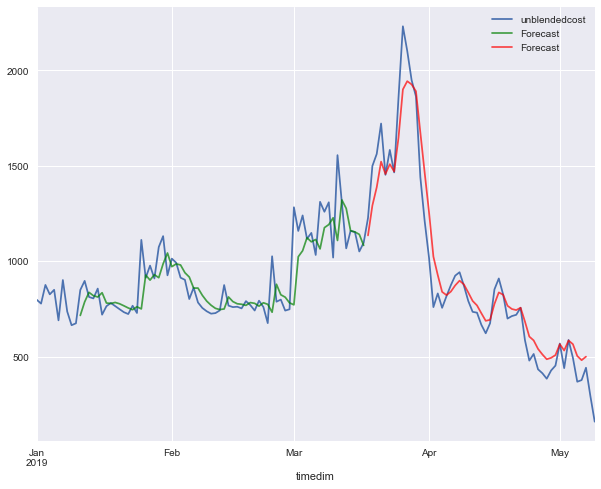

in sample
MAPE 16.600527187729817
rmse 130.18216091998283
out of sample
mape 39.28457528275701
rmse 119.10166393001754
[10, 32, 'tanh', 0.0003]
Epoch 1/1000
66/66 [==============================] - 2s 25ms/sample - loss: 0.7732 - mean_squared_error: 0.7732
Epoch 2/1000
66/66 [==============================] - 0s 499us/sample - loss: 0.6214 - mean_squared_error: 0.6214
Epoch 3/1000
66/66 [==============================] - 0s 484us/sample - loss: 0.4847 - mean_squared_error: 0.4847
Epoch 4/1000
66/66 [==============================] - 0s 499us/sample - loss: 0.3628 - mean_squared_error: 0.3628
Epoch 5/1000
66/66 [==============================] - 0s 499us/sample - loss: 0.2605 - mean_squared_error: 0.2605
Epoch 6/1000
66/66 [==============================] - 0s 529us/sample - loss: 0.1842 - mean_squared_error: 0.1842
Epoch 7/1000
66/66 [==============================] - 0s 514us/sample - loss: 0.1512 - mean_squared_error: 0.1512
Epoch 8/1000
66/66 [==============================] - 0s 49

66/66 [==============================] - 0s 499us/sample - loss: 0.0301 - mean_squared_error: 0.0301
Epoch 71/1000
66/66 [==============================] - 0s 514us/sample - loss: 0.0303 - mean_squared_error: 0.0303
Epoch 72/1000
66/66 [==============================] - 0s 544us/sample - loss: 0.0298 - mean_squared_error: 0.0298
Epoch 73/1000
66/66 [==============================] - 0s 529us/sample - loss: 0.0292 - mean_squared_error: 0.0292
Epoch 74/1000
66/66 [==============================] - 0s 499us/sample - loss: 0.0288 - mean_squared_error: 0.0288
Epoch 75/1000
66/66 [==============================] - 0s 544us/sample - loss: 0.0284 - mean_squared_error: 0.0284
Epoch 76/1000
66/66 [==============================] - 0s 514us/sample - loss: 0.0281 - mean_squared_error: 0.0281
Epoch 77/1000
66/66 [==============================] - 0s 514us/sample - loss: 0.0277 - mean_squared_error: 0.0277
Epoch 78/1000
66/66 [==============================] - 0s 499us/sample - loss: 0.0275 - mean_s

66/66 [==============================] - 0s 514us/sample - loss: 0.0184 - mean_squared_error: 0.0184
Epoch 141/1000
66/66 [==============================] - 0s 499us/sample - loss: 0.0183 - mean_squared_error: 0.0183
Epoch 142/1000
66/66 [==============================] - 0s 514us/sample - loss: 0.0183 - mean_squared_error: 0.0183
Epoch 143/1000
66/66 [==============================] - 0s 514us/sample - loss: 0.0182 - mean_squared_error: 0.0182
Epoch 144/1000
66/66 [==============================] - 0s 514us/sample - loss: 0.0182 - mean_squared_error: 0.0182
Epoch 145/1000
66/66 [==============================] - 0s 514us/sample - loss: 0.0181 - mean_squared_error: 0.0181
Epoch 146/1000
66/66 [==============================] - 0s 529us/sample - loss: 0.0181 - mean_squared_error: 0.0181
Epoch 147/1000
66/66 [==============================] - 0s 499us/sample - loss: 0.0180 - mean_squared_error: 0.0180
Epoch 148/1000
66/66 [==============================] - 0s 499us/sample - loss: 0.0179 

66/66 [==============================] - 0s 589us/sample - loss: 0.0167 - mean_squared_error: 0.0167
Epoch 211/1000
66/66 [==============================] - 0s 695us/sample - loss: 0.0167 - mean_squared_error: 0.0167
Epoch 212/1000
66/66 [==============================] - 0s 574us/sample - loss: 0.0166 - mean_squared_error: 0.0166
Epoch 213/1000
66/66 [==============================] - 0s 544us/sample - loss: 0.0166 - mean_squared_error: 0.0166
Epoch 214/1000
66/66 [==============================] - 0s 559us/sample - loss: 0.0166 - mean_squared_error: 0.0166
Epoch 215/1000
66/66 [==============================] - 0s 1ms/sample - loss: 0.0166 - mean_squared_error: 0.0166
Epoch 216/1000
66/66 [==============================] - 0s 770us/sample - loss: 0.0166 - mean_squared_error: 0.0166
Epoch 217/1000
66/66 [==============================] - 0s 831us/sample - loss: 0.0166 - mean_squared_error: 0.0166
Epoch 218/1000
66/66 [==============================] - 0s 604us/sample - loss: 0.0165 - 

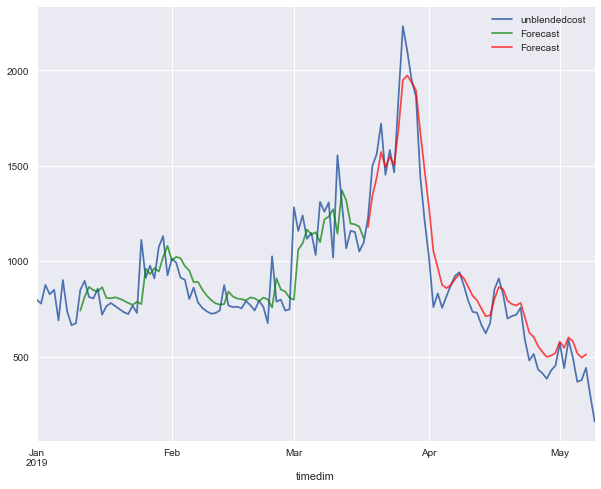

in sample
MAPE 17.350497332092413
rmse 130.1210447546136
out of sample
mape 40.26053595083706
rmse 118.61682577724487
[10, 32, 'tanh', 0.001]
Epoch 1/1000
66/66 [==============================] - 1s 22ms/sample - loss: 0.8885 - mean_squared_error: 0.8885
Epoch 2/1000
66/66 [==============================] - 0s 512us/sample - loss: 0.4953 - mean_squared_error: 0.4953
Epoch 3/1000
66/66 [==============================] - 0s 473us/sample - loss: 0.2275 - mean_squared_error: 0.2275
Epoch 4/1000
66/66 [==============================] - 0s 473us/sample - loss: 0.1856 - mean_squared_error: 0.1856
Epoch 5/1000
66/66 [==============================] - 0s 710us/sample - loss: 0.1559 - mean_squared_error: 0.1559
Epoch 6/1000
66/66 [==============================] - 0s 634us/sample - loss: 0.1138 - mean_squared_error: 0.1138
Epoch 7/1000
66/66 [==============================] - 0s 480us/sample - loss: 0.1067 - mean_squared_error: 0.1067
Epoch 8/1000
66/66 [==============================] - 0s 473u

66/66 [==============================] - 0s 947us/sample - loss: 0.0170 - mean_squared_error: 0.0170
Epoch 71/1000
66/66 [==============================] - 0s 1ms/sample - loss: 0.0173 - mean_squared_error: 0.0173
Epoch 72/1000
66/66 [==============================] - 0s 1ms/sample - loss: 0.0169 - mean_squared_error: 0.0169
Epoch 73/1000
66/66 [==============================] - 0s 473us/sample - loss: 0.0169 - mean_squared_error: 0.0169
Epoch 74/1000
66/66 [==============================] - 0s 473us/sample - loss: 0.0168 - mean_squared_error: 0.0168
Epoch 75/1000
66/66 [==============================] - 0s 710us/sample - loss: 0.0168 - mean_squared_error: 0.0168
Epoch 76/1000
66/66 [==============================] - 0s 473us/sample - loss: 0.0166 - mean_squared_error: 0.0166
Epoch 77/1000
66/66 [==============================] - 0s 796us/sample - loss: 0.0169 - mean_squared_error: 0.0169
Epoch 78/1000
66/66 [==============================] - 0s 607us/sample - loss: 0.0166 - mean_squar

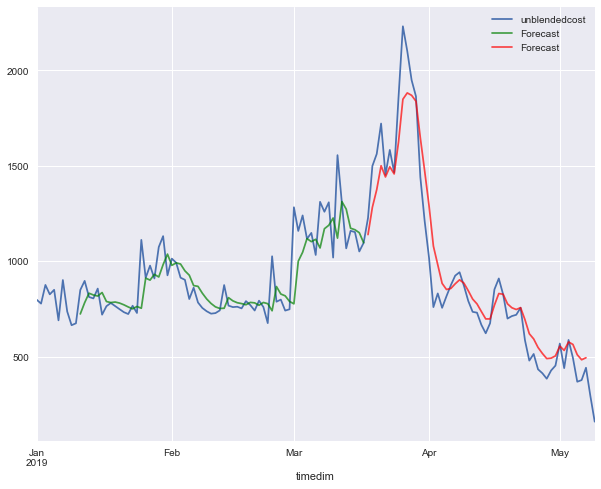

in sample
MAPE 16.38617302592206
rmse 129.798299490205
out of sample
mape 39.66066917558971
rmse 133.14654422465506
[10, 32, 'tanh', 0.003]
Epoch 1/1000
66/66 [==============================] - 2s 26ms/sample - loss: 0.5123 - mean_squared_error: 0.5123
Epoch 2/1000
66/66 [==============================] - 0s 502us/sample - loss: 0.1851 - mean_squared_error: 0.1851
Epoch 3/1000
66/66 [==============================] - 0s 473us/sample - loss: 0.0918 - mean_squared_error: 0.0918
Epoch 4/1000
66/66 [==============================] - 0s 710us/sample - loss: 0.0769 - mean_squared_error: 0.0769
Epoch 5/1000
66/66 [==============================] - 0s 473us/sample - loss: 0.0475 - mean_squared_error: 0.0475
Epoch 6/1000
66/66 [==============================] - 0s 710us/sample - loss: 0.0487 - mean_squared_error: 0.0487
Epoch 7/1000
66/66 [==============================] - 0s 473us/sample - loss: 0.0351 - mean_squared_error: 0.0351
Epoch 8/1000
66/66 [==============================] - 0s 710us/

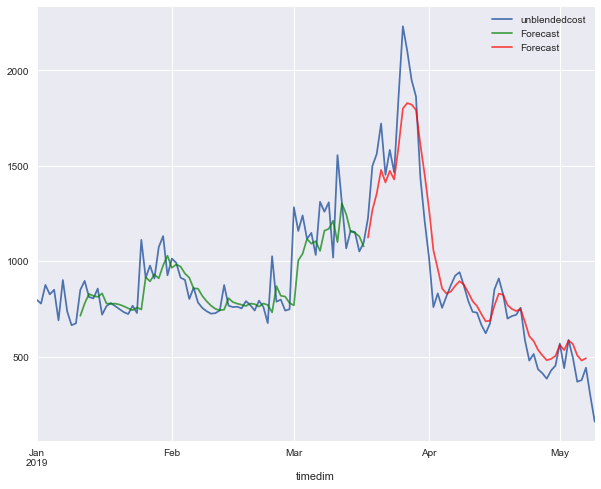

in sample
MAPE 16.456030728304533
rmse 131.09291285393843
out of sample
mape 39.158637474388556
rmse 136.60125952806837
[10, 32, 'tanh', 0.01]
Epoch 1/1000
66/66 [==============================] - 2s 25ms/sample - loss: 0.7955 - mean_squared_error: 0.7955
Epoch 2/1000
66/66 [==============================] - 0s 504us/sample - loss: 0.7915 - mean_squared_error: 0.7915
Epoch 3/1000
66/66 [==============================] - 0s 473us/sample - loss: 0.7875 - mean_squared_error: 0.7875
Epoch 4/1000
66/66 [==============================] - 0s 717us/sample - loss: 0.7837 - mean_squared_error: 0.7837
Epoch 5/1000
66/66 [==============================] - 0s 501us/sample - loss: 0.7798 - mean_squared_error: 0.7798
Epoch 6/1000
66/66 [==============================] - 0s 473us/sample - loss: 0.7759 - mean_squared_error: 0.7759
Epoch 7/1000
66/66 [==============================] - 0s 710us/sample - loss: 0.7721 - mean_squared_error: 0.7721
Epoch 8/1000
66/66 [==============================] - 0s 473

66/66 [==============================] - 0s 473us/sample - loss: 0.4449 - mean_squared_error: 0.4449
Epoch 71/1000
66/66 [==============================] - 0s 710us/sample - loss: 0.4367 - mean_squared_error: 0.4367
Epoch 72/1000
66/66 [==============================] - 0s 710us/sample - loss: 0.4287 - mean_squared_error: 0.4287
Epoch 73/1000
66/66 [==============================] - 0s 710us/sample - loss: 0.4205 - mean_squared_error: 0.4205
Epoch 74/1000
66/66 [==============================] - 0s 710us/sample - loss: 0.4125 - mean_squared_error: 0.4125
Epoch 75/1000
66/66 [==============================] - 0s 630us/sample - loss: 0.4041 - mean_squared_error: 0.4041
Epoch 76/1000
66/66 [==============================] - 0s 497us/sample - loss: 0.3959 - mean_squared_error: 0.3959
Epoch 77/1000
66/66 [==============================] - 0s 473us/sample - loss: 0.3873 - mean_squared_error: 0.3873
Epoch 78/1000
66/66 [==============================] - 0s 473us/sample - loss: 0.3789 - mean_s

66/66 [==============================] - 0s 710us/sample - loss: 0.1820 - mean_squared_error: 0.1820
Epoch 142/1000
66/66 [==============================] - 0s 473us/sample - loss: 0.1808 - mean_squared_error: 0.1808
Epoch 143/1000
66/66 [==============================] - 0s 627us/sample - loss: 0.1796 - mean_squared_error: 0.1796
Epoch 144/1000
66/66 [==============================] - 0s 473us/sample - loss: 0.1784 - mean_squared_error: 0.1784
Epoch 145/1000
66/66 [==============================] - 0s 473us/sample - loss: 0.1771 - mean_squared_error: 0.1771
Epoch 146/1000
66/66 [==============================] - 0s 473us/sample - loss: 0.1759 - mean_squared_error: 0.1759
Epoch 147/1000
66/66 [==============================] - 0s 710us/sample - loss: 0.1746 - mean_squared_error: 0.1746
Epoch 148/1000
66/66 [==============================] - 0s 710us/sample - loss: 0.1733 - mean_squared_error: 0.1733
Epoch 149/1000
66/66 [==============================] - 0s 710us/sample - loss: 0.1720 

66/66 [==============================] - 0s 473us/sample - loss: 0.1133 - mean_squared_error: 0.1133
Epoch 212/1000
66/66 [==============================] - 0s 473us/sample - loss: 0.1132 - mean_squared_error: 0.1132
Epoch 213/1000
66/66 [==============================] - 0s 473us/sample - loss: 0.1128 - mean_squared_error: 0.1128
Epoch 214/1000
66/66 [==============================] - 0s 710us/sample - loss: 0.1122 - mean_squared_error: 0.1122
Epoch 215/1000
66/66 [==============================] - 0s 662us/sample - loss: 0.1116 - mean_squared_error: 0.1116
Epoch 216/1000
66/66 [==============================] - 0s 458us/sample - loss: 0.1112 - mean_squared_error: 0.1112
Epoch 217/1000
66/66 [==============================] - 0s 710us/sample - loss: 0.1109 - mean_squared_error: 0.1109
Epoch 218/1000
66/66 [==============================] - 0s 473us/sample - loss: 0.1105 - mean_squared_error: 0.1105
Epoch 219/1000
66/66 [==============================] - 0s 473us/sample - loss: 0.1100 

66/66 [==============================] - 0s 710us/sample - loss: 0.0895 - mean_squared_error: 0.0895
Epoch 282/1000
66/66 [==============================] - 0s 473us/sample - loss: 0.0892 - mean_squared_error: 0.0892
Epoch 283/1000
66/66 [==============================] - 0s 473us/sample - loss: 0.0890 - mean_squared_error: 0.0890
Epoch 284/1000
66/66 [==============================] - 0s 710us/sample - loss: 0.0887 - mean_squared_error: 0.0887
Epoch 285/1000
66/66 [==============================] - 0s 473us/sample - loss: 0.0884 - mean_squared_error: 0.0884
Epoch 286/1000
66/66 [==============================] - 0s 710us/sample - loss: 0.0881 - mean_squared_error: 0.0881
Epoch 287/1000
66/66 [==============================] - 0s 473us/sample - loss: 0.0879 - mean_squared_error: 0.0879
Epoch 288/1000
66/66 [==============================] - 0s 710us/sample - loss: 0.0876 - mean_squared_error: 0.0876
Epoch 289/1000
66/66 [==============================] - 0s 473us/sample - loss: 0.0873 

66/66 [==============================] - 0s 473us/sample - loss: 0.0723 - mean_squared_error: 0.0723
Epoch 352/1000
66/66 [==============================] - 0s 710us/sample - loss: 0.0721 - mean_squared_error: 0.0721
Epoch 353/1000
66/66 [==============================] - 0s 473us/sample - loss: 0.0719 - mean_squared_error: 0.0719
Epoch 354/1000
66/66 [==============================] - 0s 710us/sample - loss: 0.0717 - mean_squared_error: 0.0717
Epoch 355/1000
66/66 [==============================] - 0s 473us/sample - loss: 0.0715 - mean_squared_error: 0.0715
Epoch 356/1000
66/66 [==============================] - 0s 710us/sample - loss: 0.0713 - mean_squared_error: 0.0713
Epoch 357/1000
66/66 [==============================] - 0s 473us/sample - loss: 0.0711 - mean_squared_error: 0.0711
Epoch 358/1000
66/66 [==============================] - 0s 710us/sample - loss: 0.0709 - mean_squared_error: 0.0709
Epoch 359/1000
66/66 [==============================] - 0s 944us/sample - loss: 0.0707 

66/66 [==============================] - 0s 1ms/sample - loss: 0.0593 - mean_squared_error: 0.0593
Epoch 422/1000
66/66 [==============================] - 0s 947us/sample - loss: 0.0592 - mean_squared_error: 0.0592
Epoch 423/1000
66/66 [==============================] - 0s 736us/sample - loss: 0.0590 - mean_squared_error: 0.0590
Epoch 424/1000
66/66 [==============================] - 0s 504us/sample - loss: 0.0589 - mean_squared_error: 0.0589
Epoch 425/1000
66/66 [==============================] - 0s 473us/sample - loss: 0.0587 - mean_squared_error: 0.0587
Epoch 426/1000
66/66 [==============================] - 0s 473us/sample - loss: 0.0585 - mean_squared_error: 0.0585
Epoch 427/1000
66/66 [==============================] - 0s 473us/sample - loss: 0.0584 - mean_squared_error: 0.0584
Epoch 428/1000
66/66 [==============================] - 0s 557us/sample - loss: 0.0582 - mean_squared_error: 0.0582
Epoch 429/1000
66/66 [==============================] - 0s 710us/sample - loss: 0.0581 - 

66/66 [==============================] - 0s 771us/sample - loss: 0.0490 - mean_squared_error: 0.0490
Epoch 492/1000
66/66 [==============================] - 0s 665us/sample - loss: 0.0488 - mean_squared_error: 0.0488
Epoch 493/1000
66/66 [==============================] - 0s 771us/sample - loss: 0.0487 - mean_squared_error: 0.0487
Epoch 494/1000
66/66 [==============================] - 0s 635us/sample - loss: 0.0485 - mean_squared_error: 0.0485
Epoch 495/1000
66/66 [==============================] - 0s 559us/sample - loss: 0.0484 - mean_squared_error: 0.0484
Epoch 496/1000
66/66 [==============================] - 0s 710us/sample - loss: 0.0483 - mean_squared_error: 0.0483
Epoch 497/1000
66/66 [==============================] - 0s 861us/sample - loss: 0.0482 - mean_squared_error: 0.0482
Epoch 498/1000
66/66 [==============================] - 0s 756us/sample - loss: 0.0481 - mean_squared_error: 0.0481
Epoch 499/1000
66/66 [==============================] - 0s 1ms/sample - loss: 0.0480 - 

66/66 [==============================] - 0s 831us/sample - loss: 0.0416 - mean_squared_error: 0.0416
Epoch 562/1000
66/66 [==============================] - 0s 816us/sample - loss: 0.0415 - mean_squared_error: 0.0415
Epoch 563/1000
66/66 [==============================] - 0s 756us/sample - loss: 0.0414 - mean_squared_error: 0.0414
Epoch 564/1000
66/66 [==============================] - 0s 907us/sample - loss: 0.0413 - mean_squared_error: 0.0413
Epoch 565/1000
66/66 [==============================] - 0s 740us/sample - loss: 0.0413 - mean_squared_error: 0.0413
Epoch 566/1000
66/66 [==============================] - 0s 665us/sample - loss: 0.0412 - mean_squared_error: 0.0412
Epoch 567/1000
66/66 [==============================] - 0s 574us/sample - loss: 0.0411 - mean_squared_error: 0.0411
Epoch 568/1000
66/66 [==============================] - 0s 680us/sample - loss: 0.0410 - mean_squared_error: 0.0410
Epoch 569/1000
66/66 [==============================] - 0s 589us/sample - loss: 0.0409 

66/66 [==============================] - 0s 2ms/sample - loss: 0.0363 - mean_squared_error: 0.0363
Epoch 632/1000
66/66 [==============================] - 0s 947us/sample - loss: 0.0362 - mean_squared_error: 0.0362
Epoch 633/1000
66/66 [==============================] - 0s 710us/sample - loss: 0.0361 - mean_squared_error: 0.0361
Epoch 634/1000
66/66 [==============================] - 0s 710us/sample - loss: 0.0361 - mean_squared_error: 0.0361
Epoch 635/1000
66/66 [==============================] - 0s 710us/sample - loss: 0.0360 - mean_squared_error: 0.0360
Epoch 636/1000
66/66 [==============================] - 0s 929us/sample - loss: 0.0360 - mean_squared_error: 0.0360
Epoch 637/1000
66/66 [==============================] - 0s 710us/sample - loss: 0.0359 - mean_squared_error: 0.0359
Epoch 638/1000
66/66 [==============================] - 0s 710us/sample - loss: 0.0358 - mean_squared_error: 0.0358
Epoch 639/1000
66/66 [==============================] - 0s 744us/sample - loss: 0.0358 - 

66/66 [==============================] - 0s 1ms/sample - loss: 0.0321 - mean_squared_error: 0.0321
Epoch 702/1000
66/66 [==============================] - 0s 1ms/sample - loss: 0.0321 - mean_squared_error: 0.0321
Epoch 703/1000
66/66 [==============================] - 0s 947us/sample - loss: 0.0320 - mean_squared_error: 0.0320
Epoch 704/1000
66/66 [==============================] - 0s 710us/sample - loss: 0.0320 - mean_squared_error: 0.0320
Epoch 705/1000
66/66 [==============================] - 0s 710us/sample - loss: 0.0319 - mean_squared_error: 0.0319
Epoch 706/1000
66/66 [==============================] - 0s 710us/sample - loss: 0.0319 - mean_squared_error: 0.0319
Epoch 707/1000
66/66 [==============================] - 0s 947us/sample - loss: 0.0318 - mean_squared_error: 0.0318
Epoch 708/1000
66/66 [==============================] - 0s 1ms/sample - loss: 0.0318 - mean_squared_error: 0.0318
Epoch 709/1000
66/66 [==============================] - 0s 744us/sample - loss: 0.0317 - mean

66/66 [==============================] - 0s 748us/sample - loss: 0.0287 - mean_squared_error: 0.0287
Epoch 772/1000
66/66 [==============================] - 0s 710us/sample - loss: 0.0287 - mean_squared_error: 0.0287
Epoch 773/1000
66/66 [==============================] - 0s 710us/sample - loss: 0.0286 - mean_squared_error: 0.0286
Epoch 774/1000
66/66 [==============================] - 0s 710us/sample - loss: 0.0285 - mean_squared_error: 0.0285
Epoch 775/1000
66/66 [==============================] - 0s 710us/sample - loss: 0.0286 - mean_squared_error: 0.0286
Epoch 776/1000
66/66 [==============================] - 0s 473us/sample - loss: 0.0285 - mean_squared_error: 0.0285
Epoch 777/1000
66/66 [==============================] - 0s 880us/sample - loss: 0.0284 - mean_squared_error: 0.0284
Epoch 778/1000
66/66 [==============================] - 0s 506us/sample - loss: 0.0284 - mean_squared_error: 0.0284
Epoch 779/1000
66/66 [==============================] - 0s 710us/sample - loss: 0.0283 

66/66 [==============================] - 0s 947us/sample - loss: 0.0258 - mean_squared_error: 0.0258
Epoch 842/1000
66/66 [==============================] - 0s 947us/sample - loss: 0.0258 - mean_squared_error: 0.0258
Epoch 843/1000
66/66 [==============================] - 0s 947us/sample - loss: 0.0257 - mean_squared_error: 0.0257
Epoch 844/1000
66/66 [==============================] - 0s 710us/sample - loss: 0.0257 - mean_squared_error: 0.0257
Epoch 845/1000
66/66 [==============================] - 0s 710us/sample - loss: 0.0257 - mean_squared_error: 0.0257
Epoch 846/1000
66/66 [==============================] - 0s 710us/sample - loss: 0.0256 - mean_squared_error: 0.0256
Epoch 847/1000
66/66 [==============================] - 0s 710us/sample - loss: 0.0255 - mean_squared_error: 0.0255
Epoch 848/1000
66/66 [==============================] - 0s 923us/sample - loss: 0.0255 - mean_squared_error: 0.0255
Epoch 849/1000
66/66 [==============================] - 0s 437us/sample - loss: 0.0255 

66/66 [==============================] - 0s 549us/sample - loss: 0.0234 - mean_squared_error: 0.0234
Epoch 912/1000
66/66 [==============================] - 0s 544us/sample - loss: 0.0233 - mean_squared_error: 0.0233
Epoch 913/1000
66/66 [==============================] - 0s 529us/sample - loss: 0.0233 - mean_squared_error: 0.0233
Epoch 914/1000
66/66 [==============================] - 0s 589us/sample - loss: 0.0233 - mean_squared_error: 0.0233
Epoch 915/1000
66/66 [==============================] - 0s 501us/sample - loss: 0.0232 - mean_squared_error: 0.0232
Epoch 916/1000
66/66 [==============================] - 0s 473us/sample - loss: 0.0232 - mean_squared_error: 0.0232
Epoch 917/1000
66/66 [==============================] - 0s 473us/sample - loss: 0.0232 - mean_squared_error: 0.0232
Epoch 918/1000
66/66 [==============================] - 0s 473us/sample - loss: 0.0232 - mean_squared_error: 0.0232
Epoch 919/1000
66/66 [==============================] - 0s 473us/sample - loss: 0.0231 

66/66 [==============================] - 0s 473us/sample - loss: 0.0214 - mean_squared_error: 0.0214
Epoch 982/1000
66/66 [==============================] - 0s 473us/sample - loss: 0.0214 - mean_squared_error: 0.0214
Epoch 983/1000
66/66 [==============================] - 0s 473us/sample - loss: 0.0214 - mean_squared_error: 0.0214
Epoch 984/1000
66/66 [==============================] - 0s 552us/sample - loss: 0.0214 - mean_squared_error: 0.0214
Epoch 985/1000
66/66 [==============================] - 0s 473us/sample - loss: 0.0213 - mean_squared_error: 0.0213
Epoch 986/1000
66/66 [==============================] - 0s 473us/sample - loss: 0.0212 - mean_squared_error: 0.0212
Epoch 987/1000
66/66 [==============================] - 0s 710us/sample - loss: 0.0213 - mean_squared_error: 0.0213
Epoch 988/1000
66/66 [==============================] - 0s 710us/sample - loss: 0.0213 - mean_squared_error: 0.0213
Epoch 989/1000
66/66 [==============================] - 0s 642us/sample - loss: 0.0212 

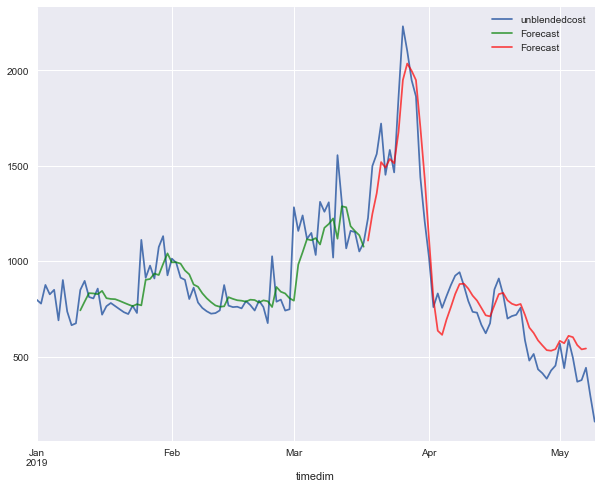

in sample
MAPE 16.096190413732756
rmse 128.1594705326073
out of sample
mape 36.612742543525606
rmse 127.88783061223883
[10, 32, 'relu', 0.0001]
Epoch 1/1000
66/66 [==============================] - 2s 27ms/sample - loss: 0.7431 - mean_squared_error: 0.7431
Epoch 2/1000
66/66 [==============================] - 0s 509us/sample - loss: 0.7231 - mean_squared_error: 0.7231
Epoch 3/1000
66/66 [==============================] - 0s 473us/sample - loss: 0.7034 - mean_squared_error: 0.7034
Epoch 4/1000
66/66 [==============================] - 0s 710us/sample - loss: 0.6836 - mean_squared_error: 0.6836
Epoch 5/1000
66/66 [==============================] - 0s 583us/sample - loss: 0.6637 - mean_squared_error: 0.6637
Epoch 6/1000
66/66 [==============================] - 0s 710us/sample - loss: 0.6441 - mean_squared_error: 0.6441
Epoch 7/1000
66/66 [==============================] - 0s 473us/sample - loss: 0.6240 - mean_squared_error: 0.6240
Epoch 8/1000
66/66 [==============================] - 0s 71

66/66 [==============================] - 0s 544us/sample - loss: 0.0959 - mean_squared_error: 0.0959
Epoch 71/1000
66/66 [==============================] - 0s 695us/sample - loss: 0.0949 - mean_squared_error: 0.0949
Epoch 72/1000
66/66 [==============================] - 0s 574us/sample - loss: 0.0939 - mean_squared_error: 0.0939
Epoch 73/1000
66/66 [==============================] - 0s 559us/sample - loss: 0.0932 - mean_squared_error: 0.0932
Epoch 74/1000
66/66 [==============================] - 0s 410us/sample - loss: 0.0923 - mean_squared_error: 0.0923
Epoch 75/1000
66/66 [==============================] - 0s 710us/sample - loss: 0.0915 - mean_squared_error: 0.0915
Epoch 76/1000
66/66 [==============================] - 0s 473us/sample - loss: 0.0908 - mean_squared_error: 0.0908
Epoch 77/1000
66/66 [==============================] - 0s 473us/sample - loss: 0.0899 - mean_squared_error: 0.0899
Epoch 78/1000
66/66 [==============================] - 0s 473us/sample - loss: 0.0892 - mean_s

66/66 [==============================] - 0s 710us/sample - loss: 0.0537 - mean_squared_error: 0.0537
Epoch 142/1000
66/66 [==============================] - 0s 710us/sample - loss: 0.0532 - mean_squared_error: 0.0532
Epoch 143/1000
66/66 [==============================] - 0s 710us/sample - loss: 0.0528 - mean_squared_error: 0.0528
Epoch 144/1000
66/66 [==============================] - 0s 473us/sample - loss: 0.0524 - mean_squared_error: 0.0524
Epoch 145/1000
66/66 [==============================] - 0s 473us/sample - loss: 0.0520 - mean_squared_error: 0.0520
Epoch 146/1000
66/66 [==============================] - 0s 473us/sample - loss: 0.0516 - mean_squared_error: 0.0516
Epoch 147/1000
66/66 [==============================] - 0s 710us/sample - loss: 0.0512 - mean_squared_error: 0.0512
Epoch 148/1000
66/66 [==============================] - 0s 473us/sample - loss: 0.0508 - mean_squared_error: 0.0508
Epoch 149/1000
66/66 [==============================] - 0s 740us/sample - loss: 0.0504 

66/66 [==============================] - 0s 1ms/sample - loss: 0.0321 - mean_squared_error: 0.0321
Epoch 212/1000
66/66 [==============================] - 0s 1ms/sample - loss: 0.0319 - mean_squared_error: 0.0319
Epoch 213/1000
66/66 [==============================] - 0s 771us/sample - loss: 0.0317 - mean_squared_error: 0.0317
Epoch 214/1000
66/66 [==============================] - 0s 740us/sample - loss: 0.0315 - mean_squared_error: 0.0315
Epoch 215/1000
66/66 [==============================] - 0s 801us/sample - loss: 0.0314 - mean_squared_error: 0.0314
Epoch 216/1000
66/66 [==============================] - 0s 604us/sample - loss: 0.0312 - mean_squared_error: 0.0312
Epoch 217/1000
66/66 [==============================] - 0s 589us/sample - loss: 0.0310 - mean_squared_error: 0.0310
Epoch 218/1000
66/66 [==============================] - 0s 619us/sample - loss: 0.0308 - mean_squared_error: 0.0308
Epoch 219/1000
66/66 [==============================] - 0s 650us/sample - loss: 0.0307 - me

66/66 [==============================] - 0s 801us/sample - loss: 0.0228 - mean_squared_error: 0.0228
Epoch 282/1000
66/66 [==============================] - 0s 997us/sample - loss: 0.0227 - mean_squared_error: 0.0227
Epoch 283/1000
66/66 [==============================] - 0s 710us/sample - loss: 0.0226 - mean_squared_error: 0.0226
Epoch 284/1000
66/66 [==============================] - 0s 786us/sample - loss: 0.0226 - mean_squared_error: 0.0226
Epoch 285/1000
66/66 [==============================] - 0s 771us/sample - loss: 0.0226 - mean_squared_error: 0.0226
Epoch 286/1000
66/66 [==============================] - 0s 710us/sample - loss: 0.0225 - mean_squared_error: 0.0225
Epoch 287/1000
66/66 [==============================] - 0s 876us/sample - loss: 0.0224 - mean_squared_error: 0.0224
Epoch 288/1000
66/66 [==============================] - 0s 756us/sample - loss: 0.0222 - mean_squared_error: 0.0222
Epoch 289/1000
66/66 [==============================] - 0s 967us/sample - loss: 0.0222 

66/66 [==============================] - 0s 763us/sample - loss: 0.0188 - mean_squared_error: 0.0188
Epoch 352/1000
66/66 [==============================] - 0s 589us/sample - loss: 0.0188 - mean_squared_error: 0.0188
Epoch 353/1000
66/66 [==============================] - 0s 635us/sample - loss: 0.0187 - mean_squared_error: 0.0187
Epoch 354/1000
66/66 [==============================] - 0s 589us/sample - loss: 0.0187 - mean_squared_error: 0.0187
Epoch 355/1000
66/66 [==============================] - 0s 665us/sample - loss: 0.0187 - mean_squared_error: 0.0187
Epoch 356/1000
66/66 [==============================] - 0s 604us/sample - loss: 0.0187 - mean_squared_error: 0.0187
Epoch 357/1000
66/66 [==============================] - 0s 604us/sample - loss: 0.0186 - mean_squared_error: 0.0186
Epoch 358/1000
66/66 [==============================] - 0s 831us/sample - loss: 0.0186 - mean_squared_error: 0.0186
Epoch 359/1000
66/66 [==============================] - 0s 680us/sample - loss: 0.0186 

66/66 [==============================] - 0s 567us/sample - loss: 0.0172 - mean_squared_error: 0.0172
Epoch 422/1000
66/66 [==============================] - 0s 665us/sample - loss: 0.0172 - mean_squared_error: 0.0172
Epoch 423/1000
66/66 [==============================] - 0s 809us/sample - loss: 0.0172 - mean_squared_error: 0.0172
Epoch 424/1000
66/66 [==============================] - 0s 771us/sample - loss: 0.0171 - mean_squared_error: 0.0171
Epoch 425/1000
66/66 [==============================] - 0s 695us/sample - loss: 0.0172 - mean_squared_error: 0.0172
Epoch 426/1000
66/66 [==============================] - 0s 589us/sample - loss: 0.0171 - mean_squared_error: 0.0171
Epoch 427/1000
66/66 [==============================] - 0s 650us/sample - loss: 0.0172 - mean_squared_error: 0.0172
Epoch 428/1000
66/66 [==============================] - 0s 620us/sample - loss: 0.0171 - mean_squared_error: 0.0171
Epoch 429/1000
66/66 [==============================] - 0s 559us/sample - loss: 0.0170 

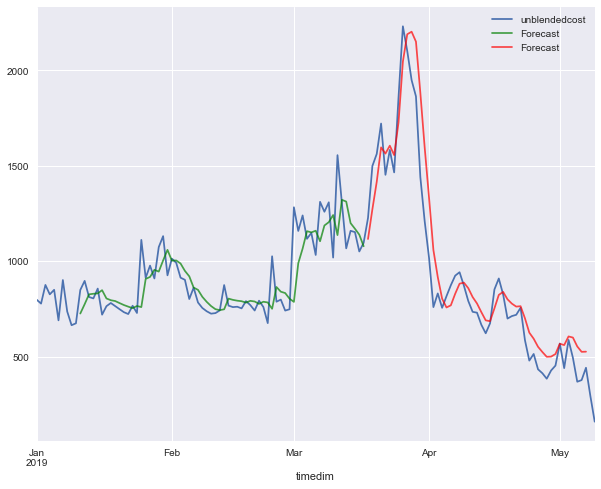

in sample
MAPE 16.754306402603216
rmse 127.89143142346867
out of sample
mape 38.802908834714366
rmse 149.06448562175035
[10, 32, 'relu', 0.0003]
Epoch 1/1000
66/66 [==============================] - 2s 29ms/sample - loss: 1.0259 - mean_squared_error: 1.0259
Epoch 2/1000
66/66 [==============================] - 0s 589us/sample - loss: 0.9473 - mean_squared_error: 0.9473
Epoch 3/1000
66/66 [==============================] - 0s 559us/sample - loss: 0.8762 - mean_squared_error: 0.8762
Epoch 4/1000
66/66 [==============================] - 0s 544us/sample - loss: 0.8123 - mean_squared_error: 0.8123
Epoch 5/1000
66/66 [==============================] - 0s 529us/sample - loss: 0.7490 - mean_squared_error: 0.7490
Epoch 6/1000
66/66 [==============================] - 0s 574us/sample - loss: 0.6911 - mean_squared_error: 0.6911
Epoch 7/1000
66/66 [==============================] - 0s 635us/sample - loss: 0.6334 - mean_squared_error: 0.6334
Epoch 8/1000
66/66 [==============================] - 0s 5

66/66 [==============================] - 0s 589us/sample - loss: 0.0469 - mean_squared_error: 0.0469
Epoch 71/1000
66/66 [==============================] - 0s 574us/sample - loss: 0.0465 - mean_squared_error: 0.0465
Epoch 72/1000
66/66 [==============================] - 0s 529us/sample - loss: 0.0455 - mean_squared_error: 0.0455
Epoch 73/1000
66/66 [==============================] - 0s 514us/sample - loss: 0.0449 - mean_squared_error: 0.0449
Epoch 74/1000
66/66 [==============================] - 0s 499us/sample - loss: 0.0444 - mean_squared_error: 0.0444
Epoch 75/1000
66/66 [==============================] - 0s 559us/sample - loss: 0.0439 - mean_squared_error: 0.0439
Epoch 76/1000
66/66 [==============================] - 0s 559us/sample - loss: 0.0434 - mean_squared_error: 0.0434
Epoch 77/1000
66/66 [==============================] - 0s 529us/sample - loss: 0.0429 - mean_squared_error: 0.0429
Epoch 78/1000
66/66 [==============================] - 0s 559us/sample - loss: 0.0424 - mean_s

66/66 [==============================] - 0s 710us/sample - loss: 0.0242 - mean_squared_error: 0.0242
Epoch 141/1000
66/66 [==============================] - 0s 781us/sample - loss: 0.0238 - mean_squared_error: 0.0238
Epoch 142/1000
66/66 [==============================] - 0s 457us/sample - loss: 0.0237 - mean_squared_error: 0.0237
Epoch 143/1000
66/66 [==============================] - 0s 710us/sample - loss: 0.0232 - mean_squared_error: 0.0232
Epoch 144/1000
66/66 [==============================] - 0s 710us/sample - loss: 0.0231 - mean_squared_error: 0.0231
Epoch 145/1000
66/66 [==============================] - 0s 473us/sample - loss: 0.0227 - mean_squared_error: 0.0227
Epoch 146/1000
66/66 [==============================] - 0s 473us/sample - loss: 0.0223 - mean_squared_error: 0.0223
Epoch 147/1000
66/66 [==============================] - 0s 710us/sample - loss: 0.0220 - mean_squared_error: 0.0220
Epoch 148/1000
66/66 [==============================] - 0s 473us/sample - loss: 0.0218 

66/66 [==============================] - 0s 473us/sample - loss: 0.0169 - mean_squared_error: 0.0169
Epoch 211/1000
66/66 [==============================] - 0s 710us/sample - loss: 0.0168 - mean_squared_error: 0.0168
Epoch 212/1000
66/66 [==============================] - 0s 473us/sample - loss: 0.0167 - mean_squared_error: 0.0167
Epoch 213/1000
66/66 [==============================] - 0s 473us/sample - loss: 0.0169 - mean_squared_error: 0.0169
Epoch 214/1000
66/66 [==============================] - 0s 709us/sample - loss: 0.0168 - mean_squared_error: 0.0168
Epoch 215/1000
66/66 [==============================] - 0s 473us/sample - loss: 0.0169 - mean_squared_error: 0.0169
Epoch 216/1000
66/66 [==============================] - 0s 473us/sample - loss: 0.0168 - mean_squared_error: 0.0168
Epoch 217/1000
66/66 [==============================] - 0s 473us/sample - loss: 0.0168 - mean_squared_error: 0.0168
Epoch 00217: early stopping


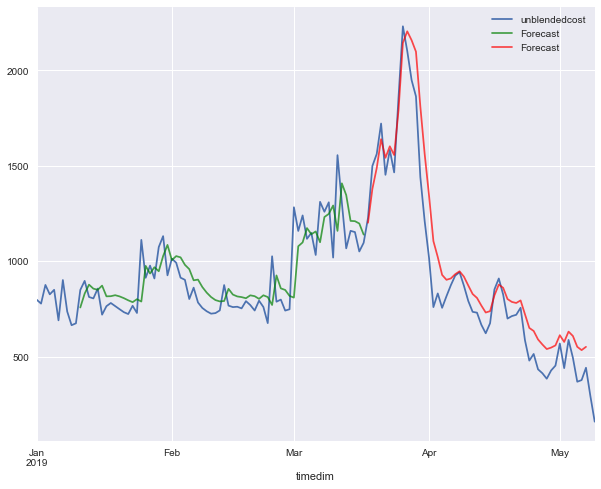

in sample
MAPE 17.42449791831192
rmse 132.61904270077764
out of sample
mape 40.56252865953066
rmse 144.59724201062022
[10, 32, 'relu', 0.001]
Epoch 1/1000
66/66 [==============================] - 2s 29ms/sample - loss: 0.8163 - mean_squared_error: 0.8163
Epoch 2/1000
66/66 [==============================] - 0s 861us/sample - loss: 0.5570 - mean_squared_error: 0.5570
Epoch 3/1000
66/66 [==============================] - 0s 801us/sample - loss: 0.3174 - mean_squared_error: 0.3174
Epoch 4/1000
66/66 [==============================] - 0s 816us/sample - loss: 0.1776 - mean_squared_error: 0.1776
Epoch 5/1000
66/66 [==============================] - 0s 680us/sample - loss: 0.1815 - mean_squared_error: 0.1815
Epoch 6/1000
66/66 [==============================] - 0s 771us/sample - loss: 0.1334 - mean_squared_error: 0.1334
Epoch 7/1000
66/66 [==============================] - 0s 801us/sample - loss: 0.1241 - mean_squared_error: 0.1241
Epoch 8/1000
66/66 [==============================] - 0s 816u

66/66 [==============================] - 0s 710us/sample - loss: 0.0207 - mean_squared_error: 0.0207
Epoch 71/1000
66/66 [==============================] - 0s 635us/sample - loss: 0.0205 - mean_squared_error: 0.0205
Epoch 72/1000
66/66 [==============================] - 0s 710us/sample - loss: 0.0203 - mean_squared_error: 0.0203
Epoch 73/1000
66/66 [==============================] - 0s 1ms/sample - loss: 0.0201 - mean_squared_error: 0.0201
Epoch 74/1000
66/66 [==============================] - 0s 695us/sample - loss: 0.0200 - mean_squared_error: 0.0200
Epoch 75/1000
66/66 [==============================] - 0s 695us/sample - loss: 0.0199 - mean_squared_error: 0.0199
Epoch 76/1000
66/66 [==============================] - 0s 876us/sample - loss: 0.0199 - mean_squared_error: 0.0199
Epoch 77/1000
66/66 [==============================] - 0s 680us/sample - loss: 0.0197 - mean_squared_error: 0.0197
Epoch 78/1000
66/66 [==============================] - 0s 861us/sample - loss: 0.0196 - mean_squ

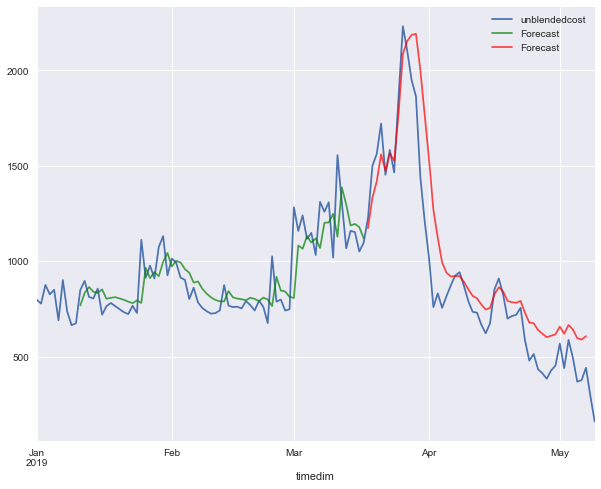

in sample
MAPE 16.762059458575056
rmse 129.47402264410883
out of sample
mape 41.057103983589144
rmse 204.53344536647802
[10, 32, 'relu', 0.003]
Epoch 1/1000
66/66 [==============================] - 2s 26ms/sample - loss: 0.7488 - mean_squared_error: 0.7488
Epoch 2/1000
66/66 [==============================] - 0s 665us/sample - loss: 0.2915 - mean_squared_error: 0.2915
Epoch 3/1000
66/66 [==============================] - 0s 756us/sample - loss: 0.1809 - mean_squared_error: 0.1809
Epoch 4/1000
66/66 [==============================] - 0s 680us/sample - loss: 0.1279 - mean_squared_error: 0.1279
Epoch 5/1000
66/66 [==============================] - 0s 756us/sample - loss: 0.0778 - mean_squared_error: 0.0778
Epoch 6/1000
66/66 [==============================] - 0s 740us/sample - loss: 0.0699 - mean_squared_error: 0.0699
Epoch 7/1000
66/66 [==============================] - 0s 680us/sample - loss: 0.0537 - mean_squared_error: 0.0537
Epoch 8/1000
66/66 [==============================] - 0s 66

66/66 [==============================] - 0s 635us/sample - loss: 0.0162 - mean_squared_error: 0.0162
Epoch 71/1000
66/66 [==============================] - 0s 710us/sample - loss: 0.0165 - mean_squared_error: 0.0165
Epoch 72/1000
66/66 [==============================] - 0s 831us/sample - loss: 0.0163 - mean_squared_error: 0.0163
Epoch 73/1000
66/66 [==============================] - 0s 725us/sample - loss: 0.0169 - mean_squared_error: 0.0169
Epoch 74/1000
66/66 [==============================] - 0s 574us/sample - loss: 0.0165 - mean_squared_error: 0.0165
Epoch 00074: early stopping


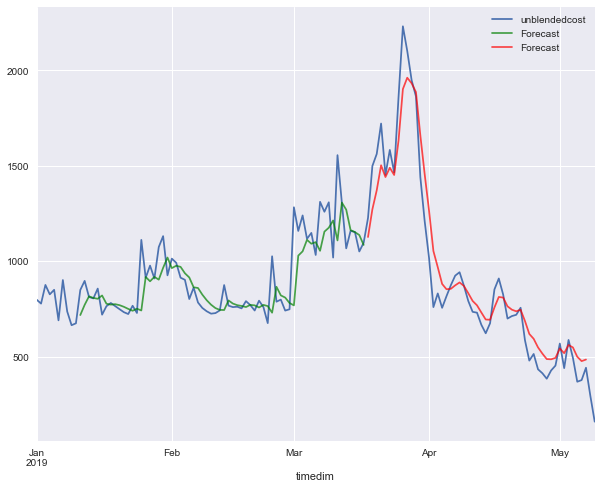

in sample
MAPE 16.647053656724538
rmse 130.85923883379672
out of sample
mape 39.671086065276825
rmse 124.29060508920413
[10, 32, 'relu', 0.01]
Epoch 1/1000
66/66 [==============================] - 2s 36ms/sample - loss: 0.7110 - mean_squared_error: 0.7110
Epoch 2/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.6812 - mean_squared_error: 0.6812
Epoch 3/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.6520 - mean_squared_error: 0.6520
Epoch 4/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.6245 - mean_squared_error: 0.6245
Epoch 5/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.5968 - mean_squared_error: 0.5968
Epoch 6/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.5706 - mean_squared_error: 0.5706
Epoch 7/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.5449 - mean_squared_error: 0.5449
Epoch 8/1000
66/66 [==============================] - 0s 2ms/sample - lo

66/66 [==============================] - 0s 2ms/sample - loss: 0.1282 - mean_squared_error: 0.1282
Epoch 72/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.1272 - mean_squared_error: 0.1272
Epoch 73/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.1262 - mean_squared_error: 0.1262
Epoch 74/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.1252 - mean_squared_error: 0.1252
Epoch 75/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.1242 - mean_squared_error: 0.1242
Epoch 76/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.1232 - mean_squared_error: 0.1232
Epoch 77/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.1222 - mean_squared_error: 0.1222
Epoch 78/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.1213 - mean_squared_error: 0.1213
Epoch 79/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.1203 - mean_squared_error: 0.12

66/66 [==============================] - 0s 2ms/sample - loss: 0.0736 - mean_squared_error: 0.0736
Epoch 144/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.0731 - mean_squared_error: 0.0731
Epoch 145/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.0727 - mean_squared_error: 0.0727
Epoch 146/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.0723 - mean_squared_error: 0.0723
Epoch 147/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.0718 - mean_squared_error: 0.0718
Epoch 148/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.0714 - mean_squared_error: 0.0714
Epoch 149/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.0710 - mean_squared_error: 0.0710
Epoch 150/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.0706 - mean_squared_error: 0.0706
Epoch 151/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.0702 - mean_squared_err

Epoch 215/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.0528 - mean_squared_error: 0.0528
Epoch 216/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.0526 - mean_squared_error: 0.0526
Epoch 217/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.0524 - mean_squared_error: 0.0524
Epoch 218/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.0522 - mean_squared_error: 0.0522
Epoch 219/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.0520 - mean_squared_error: 0.0520
Epoch 220/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.0518 - mean_squared_error: 0.0518
Epoch 221/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.0516 - mean_squared_error: 0.0516
Epoch 222/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.0514 - mean_squared_error: 0.0514
Epoch 223/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.0512 - m

66/66 [==============================] - 0s 2ms/sample - loss: 0.0409 - mean_squared_error: 0.0409
Epoch 287/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.0407 - mean_squared_error: 0.0407
Epoch 288/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.0406 - mean_squared_error: 0.0406
Epoch 289/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.0405 - mean_squared_error: 0.0405
Epoch 290/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.0403 - mean_squared_error: 0.0403
Epoch 291/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.0402 - mean_squared_error: 0.0402
Epoch 292/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.0401 - mean_squared_error: 0.0401
Epoch 293/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.0399 - mean_squared_error: 0.0399
Epoch 294/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.0398 - mean_squared_err

Epoch 358/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.0326 - mean_squared_error: 0.0326
Epoch 359/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.0325 - mean_squared_error: 0.0325
Epoch 360/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.0324 - mean_squared_error: 0.0324
Epoch 361/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.0323 - mean_squared_error: 0.0323
Epoch 362/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.0323 - mean_squared_error: 0.0323
Epoch 363/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.0322 - mean_squared_error: 0.0322
Epoch 364/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.0321 - mean_squared_error: 0.0321
Epoch 365/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.0320 - mean_squared_error: 0.0320
Epoch 366/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.0319 - m

66/66 [==============================] - 0s 2ms/sample - loss: 0.0271 - mean_squared_error: 0.0271
Epoch 430/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.0271 - mean_squared_error: 0.0271
Epoch 431/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.0270 - mean_squared_error: 0.0270
Epoch 432/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.0269 - mean_squared_error: 0.0269
Epoch 433/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.0269 - mean_squared_error: 0.0269
Epoch 434/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.0268 - mean_squared_error: 0.0268
Epoch 435/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.0267 - mean_squared_error: 0.0267
Epoch 436/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.0267 - mean_squared_error: 0.0267
Epoch 437/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.0266 - mean_squared_err

Epoch 501/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.0234 - mean_squared_error: 0.0234
Epoch 502/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.0234 - mean_squared_error: 0.0234
Epoch 503/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.0233 - mean_squared_error: 0.0233
Epoch 504/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.0233 - mean_squared_error: 0.0233
Epoch 505/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.0233 - mean_squared_error: 0.0233
Epoch 506/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.0232 - mean_squared_error: 0.0232
Epoch 507/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.0232 - mean_squared_error: 0.0232
Epoch 508/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.0231 - mean_squared_error: 0.0231
Epoch 509/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.0231 - m

66/66 [==============================] - 0s 2ms/sample - loss: 0.0209 - mean_squared_error: 0.0209
Epoch 573/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.0209 - mean_squared_error: 0.0209
Epoch 574/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.0209 - mean_squared_error: 0.0209
Epoch 575/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.0208 - mean_squared_error: 0.0208
Epoch 576/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.0208 - mean_squared_error: 0.0208
Epoch 577/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.0207 - mean_squared_error: 0.0207
Epoch 578/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.0207 - mean_squared_error: 0.0207
Epoch 579/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.0207 - mean_squared_error: 0.0207
Epoch 580/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.0206 - mean_squared_err

Epoch 644/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.0190 - mean_squared_error: 0.0190
Epoch 645/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.0190 - mean_squared_error: 0.0190
Epoch 646/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.0190 - mean_squared_error: 0.0190
Epoch 647/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.0190 - mean_squared_error: 0.0190
Epoch 648/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.0190 - mean_squared_error: 0.0190
Epoch 649/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.0189 - mean_squared_error: 0.0189
Epoch 650/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.0189 - mean_squared_error: 0.0189
Epoch 651/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.0189 - mean_squared_error: 0.0189
Epoch 652/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.0189 - m

66/66 [==============================] - 0s 2ms/sample - loss: 0.0179 - mean_squared_error: 0.0179
Epoch 716/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.0179 - mean_squared_error: 0.0179
Epoch 717/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.0178 - mean_squared_error: 0.0178
Epoch 718/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.0178 - mean_squared_error: 0.0178
Epoch 719/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.0178 - mean_squared_error: 0.0178
Epoch 720/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.0178 - mean_squared_error: 0.0178
Epoch 721/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.0178 - mean_squared_error: 0.0178
Epoch 722/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.0178 - mean_squared_error: 0.0178
Epoch 723/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.0178 - mean_squared_err

Epoch 787/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.0171 - mean_squared_error: 0.0171
Epoch 788/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.0171 - mean_squared_error: 0.0171
Epoch 789/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.0171 - mean_squared_error: 0.0171
Epoch 790/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.0171 - mean_squared_error: 0.0171
Epoch 791/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.0171 - mean_squared_error: 0.0171
Epoch 792/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.0171 - mean_squared_error: 0.0171
Epoch 793/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.0171 - mean_squared_error: 0.0171
Epoch 794/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.0172 - mean_squared_error: 0.0172
Epoch 795/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.0171 - m

66/66 [==============================] - 0s 2ms/sample - loss: 0.0168 - mean_squared_error: 0.0168
Epoch 859/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.0167 - mean_squared_error: 0.0167
Epoch 860/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.0167 - mean_squared_error: 0.0167
Epoch 861/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.0167 - mean_squared_error: 0.0167
Epoch 862/1000
66/66 [==============================] - 0s 3ms/sample - loss: 0.0167 - mean_squared_error: 0.0167
Epoch 863/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.0167 - mean_squared_error: 0.0167
Epoch 864/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.0167 - mean_squared_error: 0.0167
Epoch 865/1000
66/66 [==============================] - 0s 3ms/sample - loss: 0.0167 - mean_squared_error: 0.0167
Epoch 866/1000
66/66 [==============================] - 0s 3ms/sample - loss: 0.0167 - mean_squared_err

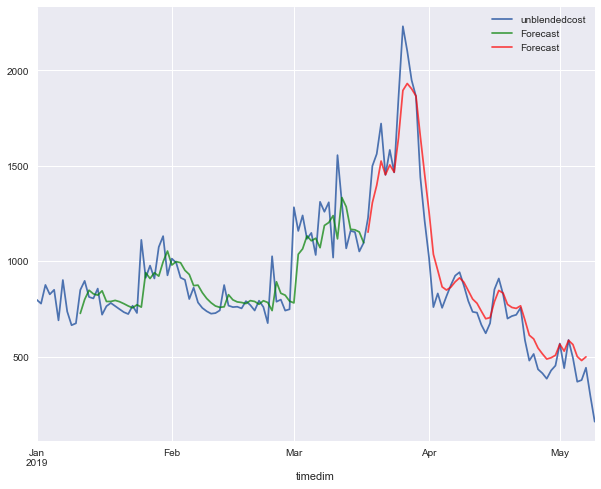

in sample
MAPE 16.566594016872692
rmse 129.56992811870458
out of sample
mape 39.61787079845635
rmse 119.74235116717743
[10, 64, 'tanh', 0.0001]
Epoch 1/1000
66/66 [==============================] - 2s 35ms/sample - loss: 0.8768 - mean_squared_error: 0.8768
Epoch 2/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.7880 - mean_squared_error: 0.7880
Epoch 3/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.7066 - mean_squared_error: 0.7066
Epoch 4/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.6305 - mean_squared_error: 0.6305
Epoch 5/1000
66/66 [==============================] - 0s 3ms/sample - loss: 0.5593 - mean_squared_error: 0.5593
Epoch 6/1000
66/66 [==============================] - 0s 3ms/sample - loss: 0.4908 - mean_squared_error: 0.4908
Epoch 7/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.4304 - mean_squared_error: 0.4304
Epoch 8/1000
66/66 [==============================] - 0s 3ms/sample - l

66/66 [==============================] - 0s 2ms/sample - loss: 0.0666 - mean_squared_error: 0.0666
Epoch 72/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.0659 - mean_squared_error: 0.0659
Epoch 73/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.0652 - mean_squared_error: 0.0652
Epoch 74/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.0645 - mean_squared_error: 0.0645
Epoch 75/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.0639 - mean_squared_error: 0.0639
Epoch 76/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.0633 - mean_squared_error: 0.0633
Epoch 77/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.0626 - mean_squared_error: 0.0626
Epoch 78/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.0619 - mean_squared_error: 0.0619
Epoch 79/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.0613 - mean_squared_error: 0.06

66/66 [==============================] - 0s 2ms/sample - loss: 0.0348 - mean_squared_error: 0.0348
Epoch 144/1000
66/66 [==============================] - 0s 3ms/sample - loss: 0.0346 - mean_squared_error: 0.0346
Epoch 145/1000
66/66 [==============================] - 0s 3ms/sample - loss: 0.0344 - mean_squared_error: 0.0344
Epoch 146/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.0341 - mean_squared_error: 0.0341
Epoch 147/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.0339 - mean_squared_error: 0.0339
Epoch 148/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.0337 - mean_squared_error: 0.0337
Epoch 149/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.0335 - mean_squared_error: 0.0335
Epoch 150/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.0332 - mean_squared_error: 0.0332
Epoch 151/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.0330 - mean_squared_err

Epoch 215/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.0233 - mean_squared_error: 0.0233
Epoch 216/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.0232 - mean_squared_error: 0.0232
Epoch 217/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.0231 - mean_squared_error: 0.0231
Epoch 218/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.0230 - mean_squared_error: 0.0230
Epoch 219/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.0230 - mean_squared_error: 0.0230
Epoch 220/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.0230 - mean_squared_error: 0.0230
Epoch 221/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.0229 - mean_squared_error: 0.0229
Epoch 222/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.0226 - mean_squared_error: 0.0226
Epoch 223/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.0226 - m

66/66 [==============================] - 0s 6ms/sample - loss: 0.0183 - mean_squared_error: 0.0183
Epoch 287/1000
66/66 [==============================] - 0s 5ms/sample - loss: 0.0183 - mean_squared_error: 0.0183
Epoch 288/1000
66/66 [==============================] - 0s 5ms/sample - loss: 0.0183 - mean_squared_error: 0.0183
Epoch 289/1000
66/66 [==============================] - 0s 5ms/sample - loss: 0.0182 - mean_squared_error: 0.0182
Epoch 290/1000
66/66 [==============================] - 0s 5ms/sample - loss: 0.0182 - mean_squared_error: 0.0182
Epoch 291/1000
66/66 [==============================] - 0s 5ms/sample - loss: 0.0181 - mean_squared_error: 0.0181
Epoch 292/1000
66/66 [==============================] - 0s 6ms/sample - loss: 0.0181 - mean_squared_error: 0.0181
Epoch 293/1000
66/66 [==============================] - 0s 6ms/sample - loss: 0.0180 - mean_squared_error: 0.0180
Epoch 294/1000
66/66 [==============================] - 0s 7ms/sample - loss: 0.0180 - mean_squared_err

Epoch 358/1000
66/66 [==============================] - 0s 3ms/sample - loss: 0.0167 - mean_squared_error: 0.0167
Epoch 359/1000
66/66 [==============================] - 0s 3ms/sample - loss: 0.0167 - mean_squared_error: 0.0167
Epoch 360/1000
66/66 [==============================] - 0s 3ms/sample - loss: 0.0167 - mean_squared_error: 0.0167
Epoch 00360: early stopping


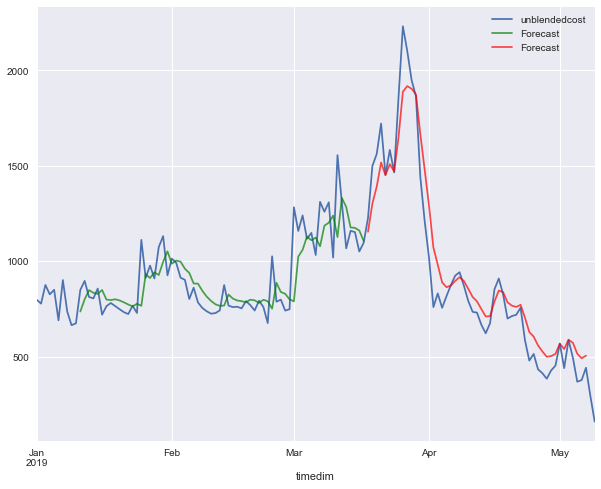

in sample
MAPE 16.44135996685235
rmse 129.05892526490504
out of sample
mape 39.90112251916905
rmse 129.77384403563116
[10, 64, 'tanh', 0.0003]
Epoch 1/1000
66/66 [==============================] - 3s 38ms/sample - loss: 0.8594 - mean_squared_error: 0.8594
Epoch 2/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.5850 - mean_squared_error: 0.5850
Epoch 3/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.3689 - mean_squared_error: 0.3689
Epoch 4/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.2274 - mean_squared_error: 0.2274
Epoch 5/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.1806 - mean_squared_error: 0.1806
Epoch 6/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.1820 - mean_squared_error: 0.1820
Epoch 7/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.1558 - mean_squared_error: 0.1558
Epoch 8/1000
66/66 [==============================] - 0s 2ms/sample - lo

66/66 [==============================] - 0s 1ms/sample - loss: 0.0242 - mean_squared_error: 0.0242
Epoch 72/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.0239 - mean_squared_error: 0.0239
Epoch 73/1000
66/66 [==============================] - 0s 1ms/sample - loss: 0.0236 - mean_squared_error: 0.0236
Epoch 74/1000
66/66 [==============================] - 0s 1ms/sample - loss: 0.0234 - mean_squared_error: 0.0234
Epoch 75/1000
66/66 [==============================] - ETA: 0s - loss: 0.0184 - mean_squared_error: 0.01 - 0s 1ms/sample - loss: 0.0231 - mean_squared_error: 0.0231
Epoch 76/1000
66/66 [==============================] - 0s 1ms/sample - loss: 0.0229 - mean_squared_error: 0.0229
Epoch 77/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.0225 - mean_squared_error: 0.0225
Epoch 78/1000
66/66 [==============================] - 0s 1ms/sample - loss: 0.0224 - mean_squared_error: 0.0224
Epoch 79/1000
66/66 [==============================] - 0s 

66/66 [==============================] - 0s 2ms/sample - loss: 0.0165 - mean_squared_error: 0.0165
Epoch 143/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.0166 - mean_squared_error: 0.0166
Epoch 144/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.0166 - mean_squared_error: 0.0166
Epoch 145/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.0165 - mean_squared_error: 0.0165
Epoch 146/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.0165 - mean_squared_error: 0.0165
Epoch 147/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.0164 - mean_squared_error: 0.0164
Epoch 148/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.0165 - mean_squared_error: 0.0165
Epoch 149/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.0166 - mean_squared_error: 0.0166
Epoch 150/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.0166 - mean_squared_err

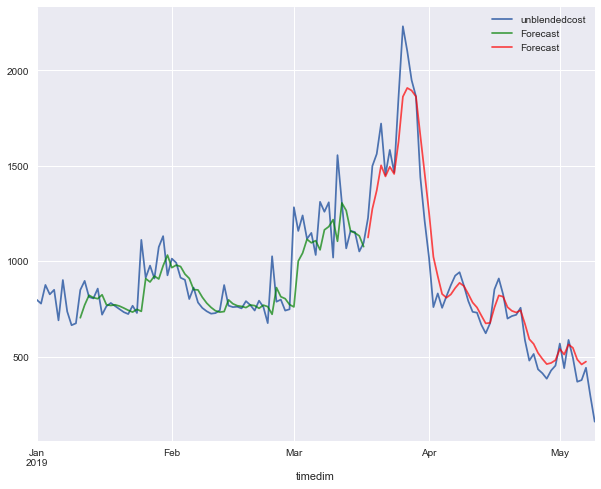

in sample
MAPE 16.803061399219406
rmse 132.11536263053907
out of sample
mape 39.46551410298971
rmse 121.16206890267529
[10, 64, 'tanh', 0.001]
Epoch 1/1000
66/66 [==============================] - 2s 34ms/sample - loss: 0.7031 - mean_squared_error: 0.7031
Epoch 2/1000
66/66 [==============================] - 0s 1ms/sample - loss: 0.2078 - mean_squared_error: 0.2078
Epoch 3/1000
66/66 [==============================] - 0s 1ms/sample - loss: 0.1625 - mean_squared_error: 0.1625
Epoch 4/1000
66/66 [==============================] - 0s 1ms/sample - loss: 0.1030 - mean_squared_error: 0.1030
Epoch 5/1000
66/66 [==============================] - 0s 1ms/sample - loss: 0.0931 - mean_squared_error: 0.0931
Epoch 6/1000
66/66 [==============================] - 0s 1ms/sample - loss: 0.0679 - mean_squared_error: 0.0679
Epoch 7/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.0644 - mean_squared_error: 0.0644
Epoch 8/1000
66/66 [==============================] - 0s 2ms/sample - lo

66/66 [==============================] - 0s 2ms/sample - loss: 0.0167 - mean_squared_error: 0.0167
Epoch 72/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.0164 - mean_squared_error: 0.0164
Epoch 73/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.0163 - mean_squared_error: 0.0163
Epoch 00073: early stopping


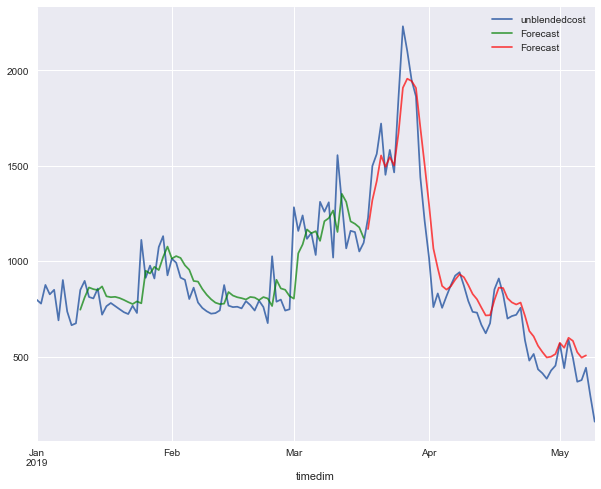

in sample
MAPE 17.149645517246135
rmse 129.47080487627125
out of sample
mape 40.25299428159831
rmse 128.02087887443534
[10, 64, 'tanh', 0.003]
Epoch 1/1000
66/66 [==============================] - 2s 34ms/sample - loss: 0.4425 - mean_squared_error: 0.4425
Epoch 2/1000
66/66 [==============================] - 0s 1ms/sample - loss: 0.1046 - mean_squared_error: 0.1046
Epoch 3/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.0557 - mean_squared_error: 0.0557
Epoch 4/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.0577 - mean_squared_error: 0.0577
Epoch 5/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.0347 - mean_squared_error: 0.0347
Epoch 6/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.0325 - mean_squared_error: 0.0325
Epoch 7/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.0264 - mean_squared_error: 0.0264
Epoch 8/1000
66/66 [==============================] - 0s 2ms/sample - lo

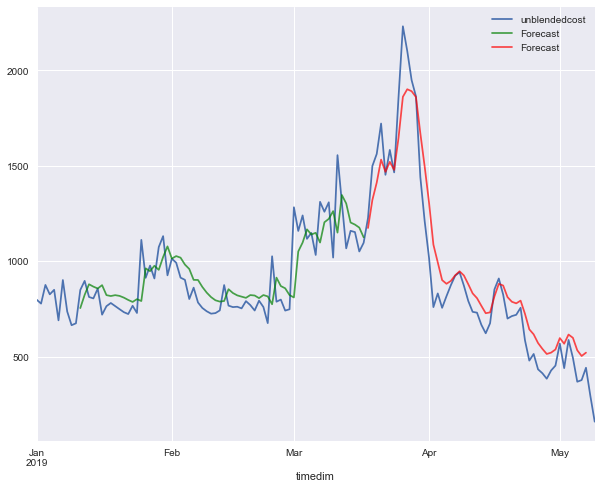

in sample
MAPE 17.03300751393234
rmse 130.4379279196294
out of sample
mape 40.545007789776065
rmse 138.67135835000312
[10, 64, 'tanh', 0.01]
Epoch 1/1000
66/66 [==============================] - 2s 33ms/sample - loss: 0.7636 - mean_squared_error: 0.7636
Epoch 2/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.7544 - mean_squared_error: 0.7544
Epoch 3/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.7455 - mean_squared_error: 0.7455
Epoch 4/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.7365 - mean_squared_error: 0.7365
Epoch 5/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.7277 - mean_squared_error: 0.7277
Epoch 6/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.7188 - mean_squared_error: 0.7188
Epoch 7/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.7103 - mean_squared_error: 0.7103
Epoch 8/1000
66/66 [==============================] - 0s 2ms/sample - loss

66/66 [==============================] - 0s 2ms/sample - loss: 0.1941 - mean_squared_error: 0.1941
Epoch 72/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.1925 - mean_squared_error: 0.1925
Epoch 73/1000
66/66 [==============================] - 0s 3ms/sample - loss: 0.1910 - mean_squared_error: 0.1910
Epoch 74/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.1895 - mean_squared_error: 0.1895
Epoch 75/1000
66/66 [==============================] - 0s 3ms/sample - loss: 0.1880 - mean_squared_error: 0.1880
Epoch 76/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.1865 - mean_squared_error: 0.1865
Epoch 77/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.1850 - mean_squared_error: 0.1850
Epoch 78/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.1836 - mean_squared_error: 0.1836
Epoch 79/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.1821 - mean_squared_error: 0.18

66/66 [==============================] - 0s 2ms/sample - loss: 0.1110 - mean_squared_error: 0.1110
Epoch 144/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.1105 - mean_squared_error: 0.1105
Epoch 145/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.1100 - mean_squared_error: 0.1100
Epoch 146/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.1096 - mean_squared_error: 0.1096
Epoch 147/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.1091 - mean_squared_error: 0.1091
Epoch 148/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.1086 - mean_squared_error: 0.1086
Epoch 149/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.1083 - mean_squared_error: 0.1083
Epoch 150/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.1078 - mean_squared_error: 0.1078
Epoch 151/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.1074 - mean_squared_err

Epoch 215/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.0819 - mean_squared_error: 0.0819
Epoch 216/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.0816 - mean_squared_error: 0.0816
Epoch 217/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.0812 - mean_squared_error: 0.0812
Epoch 218/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.0809 - mean_squared_error: 0.0809
Epoch 219/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.0806 - mean_squared_error: 0.0806
Epoch 220/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.0803 - mean_squared_error: 0.0803
Epoch 221/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.0799 - mean_squared_error: 0.0799
Epoch 222/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.0796 - mean_squared_error: 0.0796
Epoch 223/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.0793 - m

66/66 [==============================] - 0s 2ms/sample - loss: 0.0623 - mean_squared_error: 0.0623
Epoch 287/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.0621 - mean_squared_error: 0.0621
Epoch 288/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.0619 - mean_squared_error: 0.0619
Epoch 289/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.0618 - mean_squared_error: 0.0618
Epoch 290/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.0615 - mean_squared_error: 0.0615
Epoch 291/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.0613 - mean_squared_error: 0.0613
Epoch 292/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.0611 - mean_squared_error: 0.0611
Epoch 293/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.0609 - mean_squared_error: 0.0609
Epoch 294/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.0607 - mean_squared_err

Epoch 358/1000
66/66 [==============================] - 0s 3ms/sample - loss: 0.0504 - mean_squared_error: 0.0504
Epoch 359/1000
66/66 [==============================] - 0s 4ms/sample - loss: 0.0503 - mean_squared_error: 0.0503
Epoch 360/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.0501 - mean_squared_error: 0.0501
Epoch 361/1000
66/66 [==============================] - 0s 3ms/sample - loss: 0.0500 - mean_squared_error: 0.0500
Epoch 362/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.0499 - mean_squared_error: 0.0499
Epoch 363/1000
66/66 [==============================] - 0s 3ms/sample - loss: 0.0498 - mean_squared_error: 0.0498
Epoch 364/1000
66/66 [==============================] - 0s 3ms/sample - loss: 0.0496 - mean_squared_error: 0.0496
Epoch 365/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.0495 - mean_squared_error: 0.0495
Epoch 366/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.0494 - m

66/66 [==============================] - 0s 2ms/sample - loss: 0.0418 - mean_squared_error: 0.0418
Epoch 430/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.0417 - mean_squared_error: 0.0417
Epoch 431/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.0415 - mean_squared_error: 0.0415
Epoch 432/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.0414 - mean_squared_error: 0.0414
Epoch 433/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.0415 - mean_squared_error: 0.0415
Epoch 434/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.0414 - mean_squared_error: 0.0414
Epoch 435/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.0411 - mean_squared_error: 0.0411
Epoch 436/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.0411 - mean_squared_error: 0.0411
Epoch 437/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.0410 - mean_squared_err

66/66 [==============================] - 0s 2ms/sample - loss: 0.0347 - mean_squared_error: 0.0347
Epoch 501/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.0346 - mean_squared_error: 0.0346
Epoch 502/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.0345 - mean_squared_error: 0.0345
Epoch 503/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.0344 - mean_squared_error: 0.0344
Epoch 504/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.0345 - mean_squared_error: 0.0345
Epoch 505/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.0348 - mean_squared_error: 0.0348
Epoch 506/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.0344 - mean_squared_error: 0.0344
Epoch 507/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.0341 - mean_squared_error: 0.0341
Epoch 508/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.0342 - mean_squared_err

Epoch 572/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.0292 - mean_squared_error: 0.0292
Epoch 573/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.0292 - mean_squared_error: 0.0292
Epoch 574/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.0291 - mean_squared_error: 0.0291
Epoch 575/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.0290 - mean_squared_error: 0.0290
Epoch 576/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.0290 - mean_squared_error: 0.0290
Epoch 577/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.0289 - mean_squared_error: 0.0289
Epoch 578/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.0289 - mean_squared_error: 0.0289
Epoch 579/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.0288 - mean_squared_error: 0.0288
Epoch 580/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.0288 - m

66/66 [==============================] - 0s 2ms/sample - loss: 0.0254 - mean_squared_error: 0.0254
Epoch 644/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.0253 - mean_squared_error: 0.0253
Epoch 645/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.0252 - mean_squared_error: 0.0252
Epoch 646/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.0252 - mean_squared_error: 0.0252
Epoch 647/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.0251 - mean_squared_error: 0.0251
Epoch 648/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.0252 - mean_squared_error: 0.0252
Epoch 649/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.0252 - mean_squared_error: 0.0252
Epoch 650/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.0251 - mean_squared_error: 0.0251
Epoch 651/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.0250 - mean_squared_err

Epoch 715/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.0223 - mean_squared_error: 0.0223
Epoch 716/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.0223 - mean_squared_error: 0.0223
Epoch 717/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.0223 - mean_squared_error: 0.0223
Epoch 718/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.0223 - mean_squared_error: 0.0223
Epoch 719/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.0222 - mean_squared_error: 0.0222
Epoch 720/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.0222 - mean_squared_error: 0.0222
Epoch 721/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.0222 - mean_squared_error: 0.0222
Epoch 722/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.0221 - mean_squared_error: 0.0221
Epoch 723/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.0220 - m

66/66 [==============================] - 0s 2ms/sample - loss: 0.0202 - mean_squared_error: 0.0202
Epoch 787/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.0201 - mean_squared_error: 0.0201
Epoch 788/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.0200 - mean_squared_error: 0.0200
Epoch 789/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.0200 - mean_squared_error: 0.0200
Epoch 790/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.0200 - mean_squared_error: 0.0200
Epoch 791/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.0200 - mean_squared_error: 0.0200
Epoch 792/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.0200 - mean_squared_error: 0.0200
Epoch 793/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.0199 - mean_squared_error: 0.0199
Epoch 794/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.0199 - mean_squared_err

Epoch 858/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.0185 - mean_squared_error: 0.0185
Epoch 859/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.0185 - mean_squared_error: 0.0185
Epoch 860/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.0185 - mean_squared_error: 0.0185
Epoch 861/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.0184 - mean_squared_error: 0.0184
Epoch 862/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.0184 - mean_squared_error: 0.0184
Epoch 863/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.0184 - mean_squared_error: 0.0184
Epoch 864/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.0184 - mean_squared_error: 0.0184
Epoch 865/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.0184 - mean_squared_error: 0.0184
Epoch 866/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.0184 - m

66/66 [==============================] - 0s 2ms/sample - loss: 0.0176 - mean_squared_error: 0.0176
Epoch 00929: early stopping


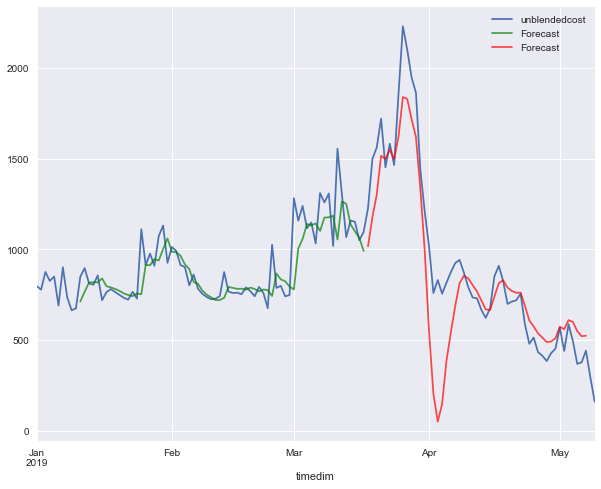

in sample
MAPE 16.585763716667117
rmse 129.8715412244413
out of sample
mape 38.29845290869886
rmse 234.24530274556122
[10, 64, 'relu', 0.0001]
Epoch 1/1000
66/66 [==============================] - 2s 34ms/sample - loss: 0.8387 - mean_squared_error: 0.8387
Epoch 2/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.7994 - mean_squared_error: 0.7994
Epoch 3/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.7596 - mean_squared_error: 0.7596
Epoch 4/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.7221 - mean_squared_error: 0.7221
Epoch 5/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.6839 - mean_squared_error: 0.6839
Epoch 6/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.6460 - mean_squared_error: 0.6460
Epoch 7/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.6086 - mean_squared_error: 0.6086
Epoch 8/1000
66/66 [==============================] - 0s 2ms/sample - lo

66/66 [==============================] - 0s 2ms/sample - loss: 0.0884 - mean_squared_error: 0.0884
Epoch 72/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.0874 - mean_squared_error: 0.0874
Epoch 73/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.0864 - mean_squared_error: 0.0864
Epoch 74/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.0854 - mean_squared_error: 0.0854
Epoch 75/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.0844 - mean_squared_error: 0.0844
Epoch 76/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.0835 - mean_squared_error: 0.0835
Epoch 77/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.0826 - mean_squared_error: 0.0826
Epoch 78/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.0819 - mean_squared_error: 0.0819
Epoch 79/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.0811 - mean_squared_error: 0.08

66/66 [==============================] - 0s 2ms/sample - loss: 0.0436 - mean_squared_error: 0.0436
Epoch 144/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.0433 - mean_squared_error: 0.0433
Epoch 145/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.0429 - mean_squared_error: 0.0429
Epoch 146/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.0426 - mean_squared_error: 0.0426
Epoch 147/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.0423 - mean_squared_error: 0.0423
Epoch 148/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.0419 - mean_squared_error: 0.0419
Epoch 149/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.0416 - mean_squared_error: 0.0416
Epoch 150/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.0413 - mean_squared_error: 0.0413
Epoch 151/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.0410 - mean_squared_err

Epoch 215/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.0277 - mean_squared_error: 0.0277
Epoch 216/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.0276 - mean_squared_error: 0.0276
Epoch 217/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.0276 - mean_squared_error: 0.0276
Epoch 218/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.0275 - mean_squared_error: 0.0275
Epoch 219/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.0272 - mean_squared_error: 0.0272
Epoch 220/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.0272 - mean_squared_error: 0.0272
Epoch 221/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.0270 - mean_squared_error: 0.0270
Epoch 222/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.0268 - mean_squared_error: 0.0268
Epoch 223/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.0267 - m

66/66 [==============================] - 0s 2ms/sample - loss: 0.0212 - mean_squared_error: 0.0212
Epoch 287/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.0210 - mean_squared_error: 0.0210
Epoch 288/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.0210 - mean_squared_error: 0.0210
Epoch 289/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.0210 - mean_squared_error: 0.0210
Epoch 290/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.0209 - mean_squared_error: 0.0209
Epoch 291/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.0208 - mean_squared_error: 0.0208
Epoch 292/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.0207 - mean_squared_error: 0.0207
Epoch 293/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.0206 - mean_squared_error: 0.0206
Epoch 294/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.0206 - mean_squared_err

Epoch 358/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.0180 - mean_squared_error: 0.0180
Epoch 359/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.0179 - mean_squared_error: 0.0179
Epoch 360/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.0180 - mean_squared_error: 0.0180
Epoch 361/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.0179 - mean_squared_error: 0.0179
Epoch 362/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.0179 - mean_squared_error: 0.0179
Epoch 363/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.0178 - mean_squared_error: 0.0178
Epoch 364/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.0178 - mean_squared_error: 0.0178
Epoch 365/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.0178 - mean_squared_error: 0.0178
Epoch 366/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.0178 - m

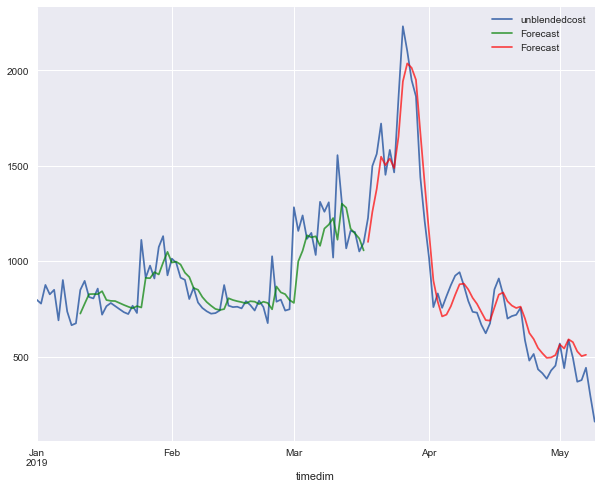

in sample
MAPE 16.475496442434213
rmse 128.4899091270915
out of sample
mape 37.38777109115089
rmse 112.75388269327244
[10, 64, 'relu', 0.0003]
Epoch 1/1000
66/66 [==============================] - 2s 33ms/sample - loss: 0.8510 - mean_squared_error: 0.8510
Epoch 2/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.7498 - mean_squared_error: 0.7498
Epoch 3/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.6569 - mean_squared_error: 0.6569
Epoch 4/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.5687 - mean_squared_error: 0.5687
Epoch 5/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.4792 - mean_squared_error: 0.4792
Epoch 6/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.3935 - mean_squared_error: 0.3935
Epoch 7/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.3098 - mean_squared_error: 0.3098
Epoch 8/1000
66/66 [==============================] - 0s 2ms/sample - lo

66/66 [==============================] - 0s 2ms/sample - loss: 0.0309 - mean_squared_error: 0.0309
Epoch 72/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.0304 - mean_squared_error: 0.0304
Epoch 73/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.0302 - mean_squared_error: 0.0302
Epoch 74/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.0296 - mean_squared_error: 0.0296
Epoch 75/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.0299 - mean_squared_error: 0.0299
Epoch 76/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.0291 - mean_squared_error: 0.0291
Epoch 77/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.0286 - mean_squared_error: 0.0286
Epoch 78/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.0282 - mean_squared_error: 0.0282
Epoch 79/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.0278 - mean_squared_error: 0.02

66/66 [==============================] - 0s 2ms/sample - loss: 0.0170 - mean_squared_error: 0.0170
Epoch 144/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.0170 - mean_squared_error: 0.0170
Epoch 145/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.0169 - mean_squared_error: 0.0169
Epoch 146/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.0167 - mean_squared_error: 0.0167
Epoch 147/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.0169 - mean_squared_error: 0.0169
Epoch 148/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.0168 - mean_squared_error: 0.0168
Epoch 149/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.0168 - mean_squared_error: 0.0168
Epoch 150/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.0168 - mean_squared_error: 0.0168
Epoch 151/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.0166 - mean_squared_err

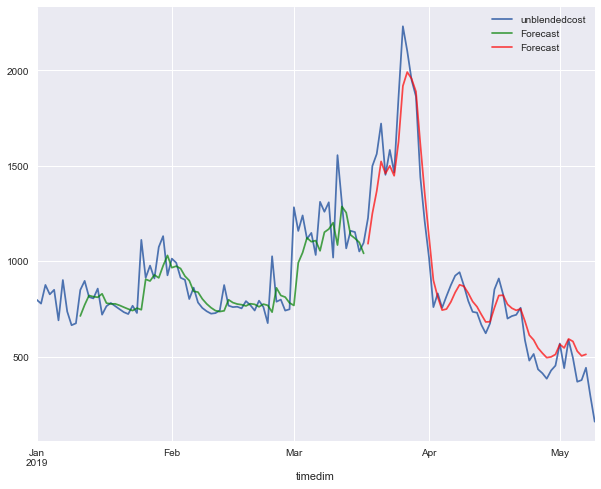

in sample
MAPE 16.51097489328746
rmse 131.41684451955655
out of sample
mape 37.39834100819387
rmse 110.05558385563599
[10, 64, 'relu', 0.001]
Epoch 1/1000
66/66 [==============================] - 2s 35ms/sample - loss: 0.6695 - mean_squared_error: 0.6695
Epoch 2/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.3424 - mean_squared_error: 0.3424
Epoch 3/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.1842 - mean_squared_error: 0.1842
Epoch 4/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.1631 - mean_squared_error: 0.1631
Epoch 5/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.1273 - mean_squared_error: 0.1273
Epoch 6/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.1160 - mean_squared_error: 0.1160
Epoch 7/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.0967 - mean_squared_error: 0.0967
Epoch 8/1000
66/66 [==============================] - 0s 2ms/sample - los

66/66 [==============================] - 0s 2ms/sample - loss: 0.0177 - mean_squared_error: 0.0177
Epoch 72/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.0176 - mean_squared_error: 0.0176
Epoch 73/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.0176 - mean_squared_error: 0.0176
Epoch 74/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.0173 - mean_squared_error: 0.0173
Epoch 75/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.0176 - mean_squared_error: 0.0176
Epoch 76/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.0176 - mean_squared_error: 0.0176
Epoch 77/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.0176 - mean_squared_error: 0.0176
Epoch 78/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.0174 - mean_squared_error: 0.0174
Epoch 79/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.0173 - mean_squared_error: 0.01

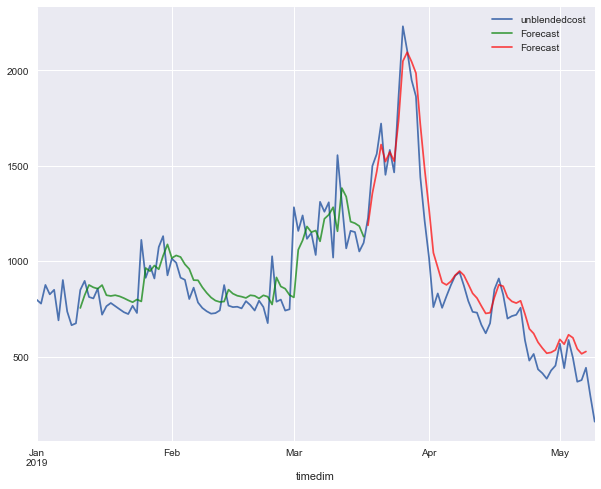

in sample
MAPE 17.168729516793544
rmse 131.61299137083145
out of sample
mape 40.550043770950246
rmse 121.35985617035988
[10, 64, 'relu', 0.003]
Epoch 1/1000
66/66 [==============================] - 2s 35ms/sample - loss: 0.5839 - mean_squared_error: 0.5839
Epoch 2/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.1999 - mean_squared_error: 0.1999
Epoch 3/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.1246 - mean_squared_error: 0.1246
Epoch 4/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.0818 - mean_squared_error: 0.0818
Epoch 5/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.0693 - mean_squared_error: 0.0693
Epoch 6/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.0493 - mean_squared_error: 0.0493
Epoch 7/1000
66/66 [==============================] - 0s 2ms/sample - loss: 0.0484 - mean_squared_error: 0.0484
Epoch 8/1000
66/66 [==============================] - 0s 2ms/sample - l

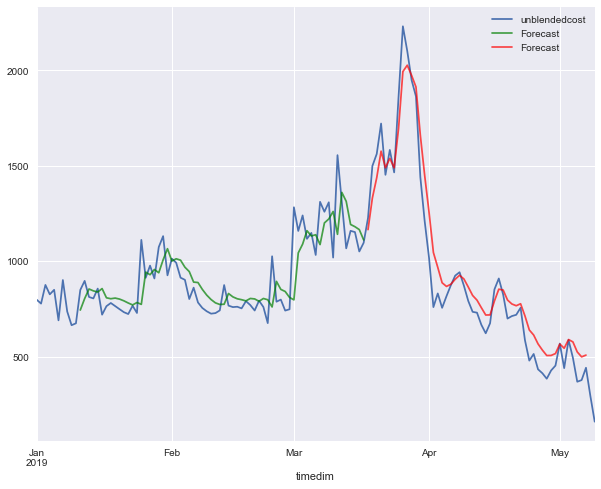

in sample
MAPE 16.812205451029683
rmse 129.11015737875124
out of sample
mape 40.08909654668219
rmse 115.41652453782635
[10, 64, 'relu', 0.01]
Epoch 1/1000
63/63 [==============================] - 3s 48ms/sample - loss: 0.5139 - mean_squared_error: 0.5139
Epoch 2/1000
63/63 [==============================] - 0s 792us/sample - loss: 0.5048 - mean_squared_error: 0.5048
Epoch 3/1000
63/63 [==============================] - 0s 697us/sample - loss: 0.4959 - mean_squared_error: 0.4959
Epoch 4/1000
63/63 [==============================] - 0s 823us/sample - loss: 0.4869 - mean_squared_error: 0.4869
Epoch 5/1000
63/63 [==============================] - 0s 950us/sample - loss: 0.4781 - mean_squared_error: 0.4781
Epoch 6/1000
63/63 [==============================] - 0s 760us/sample - loss: 0.4696 - mean_squared_error: 0.4696
Epoch 7/1000
63/63 [==============================] - 0s 871us/sample - loss: 0.4608 - mean_squared_error: 0.4608
Epoch 8/1000
63/63 [==============================] - 0s 1ms/

63/63 [==============================] - 0s 807us/sample - loss: 0.1256 - mean_squared_error: 0.1256
Epoch 71/1000
63/63 [==============================] - 0s 617us/sample - loss: 0.1235 - mean_squared_error: 0.1235
Epoch 72/1000
63/63 [==============================] - 0s 871us/sample - loss: 0.1214 - mean_squared_error: 0.1214
Epoch 73/1000
63/63 [==============================] - 0s 696us/sample - loss: 0.1194 - mean_squared_error: 0.1194
Epoch 74/1000
63/63 [==============================] - 0s 871us/sample - loss: 0.1176 - mean_squared_error: 0.1176
Epoch 75/1000
63/63 [==============================] - 0s 744us/sample - loss: 0.1158 - mean_squared_error: 0.1158
Epoch 76/1000
63/63 [==============================] - 0s 887us/sample - loss: 0.1141 - mean_squared_error: 0.1141
Epoch 77/1000
63/63 [==============================] - 0s 633us/sample - loss: 0.1125 - mean_squared_error: 0.1125
Epoch 78/1000
63/63 [==============================] - 0s 823us/sample - loss: 0.1109 - mean_s

63/63 [==============================] - 0s 902us/sample - loss: 0.0820 - mean_squared_error: 0.0820
Epoch 142/1000
63/63 [==============================] - 0s 665us/sample - loss: 0.0818 - mean_squared_error: 0.0818
Epoch 143/1000
63/63 [==============================] - 0s 712us/sample - loss: 0.0816 - mean_squared_error: 0.0816
Epoch 144/1000
63/63 [==============================] - 0s 776us/sample - loss: 0.0814 - mean_squared_error: 0.0814
Epoch 145/1000
63/63 [==============================] - 0s 665us/sample - loss: 0.0813 - mean_squared_error: 0.0813
Epoch 146/1000
63/63 [==============================] - 0s 855us/sample - loss: 0.0811 - mean_squared_error: 0.0811
Epoch 147/1000
63/63 [==============================] - 0s 760us/sample - loss: 0.0809 - mean_squared_error: 0.0809
Epoch 148/1000
63/63 [==============================] - 0s 760us/sample - loss: 0.0807 - mean_squared_error: 0.0807
Epoch 149/1000
63/63 [==============================] - 0s 839us/sample - loss: 0.0806 

63/63 [==============================] - 0s 728us/sample - loss: 0.0704 - mean_squared_error: 0.0704
Epoch 212/1000
63/63 [==============================] - 0s 633us/sample - loss: 0.0703 - mean_squared_error: 0.0703
Epoch 213/1000
63/63 [==============================] - 0s 697us/sample - loss: 0.0701 - mean_squared_error: 0.0701
Epoch 214/1000
63/63 [==============================] - 0s 855us/sample - loss: 0.0700 - mean_squared_error: 0.0700
Epoch 215/1000
63/63 [==============================] - 0s 791us/sample - loss: 0.0698 - mean_squared_error: 0.0698
Epoch 216/1000
63/63 [==============================] - 0s 792us/sample - loss: 0.0697 - mean_squared_error: 0.0697
Epoch 217/1000
63/63 [==============================] - 0s 744us/sample - loss: 0.0695 - mean_squared_error: 0.0695
Epoch 218/1000
63/63 [==============================] - 0s 823us/sample - loss: 0.0693 - mean_squared_error: 0.0693
Epoch 219/1000
63/63 [==============================] - 0s 712us/sample - loss: 0.0692 

63/63 [==============================] - 0s 518us/sample - loss: 0.0601 - mean_squared_error: 0.0601
Epoch 282/1000
63/63 [==============================] - 0s 496us/sample - loss: 0.0600 - mean_squared_error: 0.0600
Epoch 283/1000
63/63 [==============================] - 0s 496us/sample - loss: 0.0599 - mean_squared_error: 0.0599
Epoch 284/1000
63/63 [==============================] - 0s 496us/sample - loss: 0.0597 - mean_squared_error: 0.0597
Epoch 285/1000
63/63 [==============================] - 0s 617us/sample - loss: 0.0596 - mean_squared_error: 0.0596
Epoch 286/1000
63/63 [==============================] - 0s 496us/sample - loss: 0.0594 - mean_squared_error: 0.0594
Epoch 287/1000
63/63 [==============================] - 0s 496us/sample - loss: 0.0593 - mean_squared_error: 0.0593
Epoch 288/1000
63/63 [==============================] - 0s 496us/sample - loss: 0.0592 - mean_squared_error: 0.0592
Epoch 289/1000
63/63 [==============================] - 0s 496us/sample - loss: 0.0590 

63/63 [==============================] - 0s 728us/sample - loss: 0.0511 - mean_squared_error: 0.0511
Epoch 352/1000
63/63 [==============================] - 0s 681us/sample - loss: 0.0510 - mean_squared_error: 0.0510
Epoch 353/1000
63/63 [==============================] - 0s 871us/sample - loss: 0.0509 - mean_squared_error: 0.0509
Epoch 354/1000
63/63 [==============================] - 0s 760us/sample - loss: 0.0508 - mean_squared_error: 0.0508
Epoch 355/1000
63/63 [==============================] - 0s 665us/sample - loss: 0.0506 - mean_squared_error: 0.0506
Epoch 356/1000
63/63 [==============================] - 0s 855us/sample - loss: 0.0505 - mean_squared_error: 0.0505
Epoch 357/1000
63/63 [==============================] - 0s 776us/sample - loss: 0.0504 - mean_squared_error: 0.0504
Epoch 358/1000
63/63 [==============================] - 0s 760us/sample - loss: 0.0503 - mean_squared_error: 0.0503
Epoch 359/1000
63/63 [==============================] - 0s 696us/sample - loss: 0.0502 

63/63 [==============================] - 0s 839us/sample - loss: 0.0439 - mean_squared_error: 0.0439
Epoch 422/1000
63/63 [==============================] - 0s 807us/sample - loss: 0.0438 - mean_squared_error: 0.0438
Epoch 423/1000
63/63 [==============================] - 0s 744us/sample - loss: 0.0437 - mean_squared_error: 0.0437
Epoch 424/1000
63/63 [==============================] - 0s 776us/sample - loss: 0.0436 - mean_squared_error: 0.0436
Epoch 425/1000
63/63 [==============================] - 0s 902us/sample - loss: 0.0435 - mean_squared_error: 0.0435
Epoch 426/1000
63/63 [==============================] - 0s 1ms/sample - loss: 0.0434 - mean_squared_error: 0.0434
Epoch 427/1000
63/63 [==============================] - 0s 712us/sample - loss: 0.0434 - mean_squared_error: 0.0434
Epoch 428/1000
63/63 [==============================] - 0s 760us/sample - loss: 0.0433 - mean_squared_error: 0.0433
Epoch 429/1000
63/63 [==============================] - 0s 934us/sample - loss: 0.0432 - 

63/63 [==============================] - 0s 760us/sample - loss: 0.0389 - mean_squared_error: 0.0389
Epoch 492/1000
63/63 [==============================] - 0s 697us/sample - loss: 0.0389 - mean_squared_error: 0.0389
Epoch 493/1000
63/63 [==============================] - 0s 633us/sample - loss: 0.0388 - mean_squared_error: 0.0388
Epoch 494/1000
63/63 [==============================] - 0s 950us/sample - loss: 0.0387 - mean_squared_error: 0.0387
Epoch 495/1000
63/63 [==============================] - 0s 823us/sample - loss: 0.0387 - mean_squared_error: 0.0387
Epoch 496/1000
63/63 [==============================] - 0s 807us/sample - loss: 0.0386 - mean_squared_error: 0.0386
Epoch 497/1000
63/63 [==============================] - 0s 823us/sample - loss: 0.0386 - mean_squared_error: 0.0386
Epoch 498/1000
63/63 [==============================] - 0s 744us/sample - loss: 0.0385 - mean_squared_error: 0.0385
Epoch 499/1000
63/63 [==============================] - 0s 792us/sample - loss: 0.0385 

63/63 [==============================] - 0s 855us/sample - loss: 0.0353 - mean_squared_error: 0.0353
Epoch 562/1000
63/63 [==============================] - 0s 728us/sample - loss: 0.0353 - mean_squared_error: 0.0353
Epoch 563/1000
63/63 [==============================] - 0s 681us/sample - loss: 0.0352 - mean_squared_error: 0.0352
Epoch 564/1000
63/63 [==============================] - 0s 712us/sample - loss: 0.0352 - mean_squared_error: 0.0352
Epoch 565/1000
63/63 [==============================] - 0s 776us/sample - loss: 0.0351 - mean_squared_error: 0.0351
Epoch 566/1000
63/63 [==============================] - 0s 712us/sample - loss: 0.0351 - mean_squared_error: 0.0351
Epoch 567/1000
63/63 [==============================] - 0s 665us/sample - loss: 0.0351 - mean_squared_error: 0.0351
Epoch 568/1000
63/63 [==============================] - 0s 728us/sample - loss: 0.0350 - mean_squared_error: 0.0350
Epoch 569/1000
63/63 [==============================] - 0s 649us/sample - loss: 0.0350 

63/63 [==============================] - 0s 665us/sample - loss: 0.0324 - mean_squared_error: 0.0324
Epoch 632/1000
63/63 [==============================] - 0s 791us/sample - loss: 0.0323 - mean_squared_error: 0.0323
Epoch 633/1000
63/63 [==============================] - 0s 823us/sample - loss: 0.0323 - mean_squared_error: 0.0323
Epoch 634/1000
63/63 [==============================] - 0s 760us/sample - loss: 0.0322 - mean_squared_error: 0.0322
Epoch 635/1000
63/63 [==============================] - 0s 649us/sample - loss: 0.0322 - mean_squared_error: 0.0322
Epoch 636/1000
63/63 [==============================] - 0s 776us/sample - loss: 0.0322 - mean_squared_error: 0.0322
Epoch 637/1000
63/63 [==============================] - 0s 760us/sample - loss: 0.0321 - mean_squared_error: 0.0321
Epoch 638/1000
63/63 [==============================] - 0s 681us/sample - loss: 0.0321 - mean_squared_error: 0.0321
Epoch 639/1000
63/63 [==============================] - 0s 649us/sample - loss: 0.0320 

63/63 [==============================] - 0s 617us/sample - loss: 0.0298 - mean_squared_error: 0.0298
Epoch 702/1000
63/63 [==============================] - 0s 697us/sample - loss: 0.0297 - mean_squared_error: 0.0297
Epoch 703/1000
63/63 [==============================] - 0s 681us/sample - loss: 0.0297 - mean_squared_error: 0.0297
Epoch 704/1000
63/63 [==============================] - 0s 744us/sample - loss: 0.0297 - mean_squared_error: 0.0297
Epoch 705/1000
63/63 [==============================] - 0s 934us/sample - loss: 0.0297 - mean_squared_error: 0.0297
Epoch 706/1000
63/63 [==============================] - 0s 886us/sample - loss: 0.0296 - mean_squared_error: 0.0296
Epoch 707/1000
63/63 [==============================] - 0s 887us/sample - loss: 0.0296 - mean_squared_error: 0.0296
Epoch 708/1000
63/63 [==============================] - 0s 807us/sample - loss: 0.0295 - mean_squared_error: 0.0295
Epoch 709/1000
63/63 [==============================] - 0s 823us/sample - loss: 0.0295 

63/63 [==============================] - 0s 712us/sample - loss: 0.0276 - mean_squared_error: 0.0276
Epoch 772/1000
63/63 [==============================] - 0s 712us/sample - loss: 0.0275 - mean_squared_error: 0.0275
Epoch 773/1000
63/63 [==============================] - 0s 1ms/sample - loss: 0.0275 - mean_squared_error: 0.0275
Epoch 774/1000
63/63 [==============================] - 0s 744us/sample - loss: 0.0275 - mean_squared_error: 0.0275
Epoch 775/1000
63/63 [==============================] - 0s 855us/sample - loss: 0.0274 - mean_squared_error: 0.0274
Epoch 776/1000
63/63 [==============================] - 0s 791us/sample - loss: 0.0274 - mean_squared_error: 0.0274
Epoch 777/1000
63/63 [==============================] - 0s 775us/sample - loss: 0.0274 - mean_squared_error: 0.0274
Epoch 778/1000
63/63 [==============================] - 0s 934us/sample - loss: 0.0274 - mean_squared_error: 0.0274
Epoch 779/1000
63/63 [==============================] - 0s 823us/sample - loss: 0.0273 - 

63/63 [==============================] - 0s 902us/sample - loss: 0.0256 - mean_squared_error: 0.0256
Epoch 842/1000
63/63 [==============================] - 0s 728us/sample - loss: 0.0256 - mean_squared_error: 0.0256
Epoch 843/1000
63/63 [==============================] - 0s 697us/sample - loss: 0.0256 - mean_squared_error: 0.0256
Epoch 844/1000
63/63 [==============================] - 0s 776us/sample - loss: 0.0255 - mean_squared_error: 0.0255
Epoch 845/1000
63/63 [==============================] - 0s 807us/sample - loss: 0.0255 - mean_squared_error: 0.0255
Epoch 846/1000
63/63 [==============================] - 0s 777us/sample - loss: 0.0255 - mean_squared_error: 0.0255
Epoch 847/1000
63/63 [==============================] - 0s 792us/sample - loss: 0.0255 - mean_squared_error: 0.0255
Epoch 848/1000
63/63 [==============================] - 0s 744us/sample - loss: 0.0254 - mean_squared_error: 0.0254
Epoch 849/1000
63/63 [==============================] - 0s 744us/sample - loss: 0.0254 

63/63 [==============================] - 0s 776us/sample - loss: 0.0239 - mean_squared_error: 0.0239
Epoch 912/1000
63/63 [==============================] - 0s 649us/sample - loss: 0.0239 - mean_squared_error: 0.0239
Epoch 913/1000
63/63 [==============================] - 0s 712us/sample - loss: 0.0239 - mean_squared_error: 0.0239
Epoch 914/1000
63/63 [==============================] - 0s 855us/sample - loss: 0.0239 - mean_squared_error: 0.0239
Epoch 915/1000
63/63 [==============================] - 0s 728us/sample - loss: 0.0238 - mean_squared_error: 0.0238
Epoch 916/1000
63/63 [==============================] - 0s 823us/sample - loss: 0.0238 - mean_squared_error: 0.0238
Epoch 917/1000
63/63 [==============================] - 0s 744us/sample - loss: 0.0238 - mean_squared_error: 0.0238
Epoch 918/1000
63/63 [==============================] - 0s 728us/sample - loss: 0.0238 - mean_squared_error: 0.0238
Epoch 919/1000
63/63 [==============================] - 0s 792us/sample - loss: 0.0238 

63/63 [==============================] - 0s 649us/sample - loss: 0.0225 - mean_squared_error: 0.0225
Epoch 982/1000
63/63 [==============================] - 0s 902us/sample - loss: 0.0225 - mean_squared_error: 0.0225
Epoch 983/1000
63/63 [==============================] - 0s 839us/sample - loss: 0.0224 - mean_squared_error: 0.0224
Epoch 984/1000
63/63 [==============================] - 0s 902us/sample - loss: 0.0224 - mean_squared_error: 0.0224
Epoch 985/1000
63/63 [==============================] - 0s 950us/sample - loss: 0.0224 - mean_squared_error: 0.0224
Epoch 986/1000
63/63 [==============================] - 0s 871us/sample - loss: 0.0224 - mean_squared_error: 0.0224
Epoch 987/1000
63/63 [==============================] - 0s 792us/sample - loss: 0.0224 - mean_squared_error: 0.0224
Epoch 988/1000
63/63 [==============================] - 0s 744us/sample - loss: 0.0223 - mean_squared_error: 0.0223
Epoch 989/1000
63/63 [==============================] - 0s 728us/sample - loss: 0.0223 

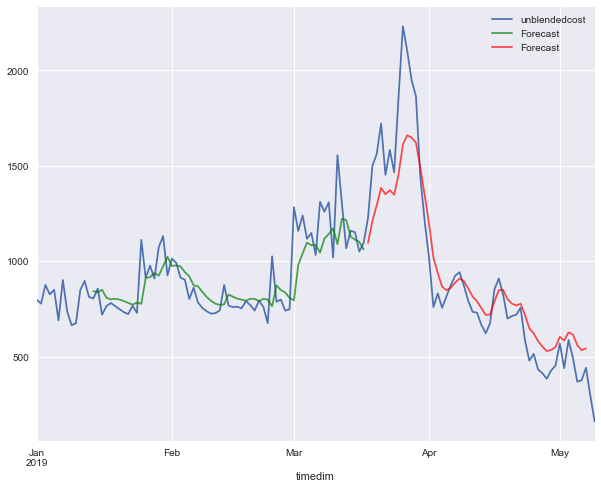

in sample
MAPE 16.713689016215042
rmse 132.28554869395555
out of sample
mape 38.34905830696053
rmse 183.04572804384753
[13, 16, 'tanh', 0.0001]
Epoch 1/1000
63/63 [==============================] - 2s 40ms/sample - loss: 0.5600 - mean_squared_error: 0.5600
Epoch 2/1000
63/63 [==============================] - 0s 570us/sample - loss: 0.5373 - mean_squared_error: 0.5373
Epoch 3/1000
63/63 [==============================] - 0s 807us/sample - loss: 0.5143 - mean_squared_error: 0.5143
Epoch 4/1000
63/63 [==============================] - 0s 886us/sample - loss: 0.4917 - mean_squared_error: 0.4917
Epoch 5/1000
63/63 [==============================] - 0s 887us/sample - loss: 0.4699 - mean_squared_error: 0.4699
Epoch 6/1000
63/63 [==============================] - 0s 728us/sample - loss: 0.4481 - mean_squared_error: 0.4481
Epoch 7/1000
63/63 [==============================] - 0s 760us/sample - loss: 0.4269 - mean_squared_error: 0.4269
Epoch 8/1000
63/63 [==============================] - 0s 80

63/63 [==============================] - 0s 839us/sample - loss: 0.0862 - mean_squared_error: 0.0862
Epoch 71/1000
63/63 [==============================] - 0s 712us/sample - loss: 0.0856 - mean_squared_error: 0.0856
Epoch 72/1000
63/63 [==============================] - 0s 776us/sample - loss: 0.0849 - mean_squared_error: 0.0849
Epoch 73/1000
63/63 [==============================] - 0s 855us/sample - loss: 0.0843 - mean_squared_error: 0.0843
Epoch 74/1000
63/63 [==============================] - 0s 760us/sample - loss: 0.0836 - mean_squared_error: 0.0836
Epoch 75/1000
63/63 [==============================] - 0s 776us/sample - loss: 0.0830 - mean_squared_error: 0.0830
Epoch 76/1000
63/63 [==============================] - 0s 744us/sample - loss: 0.0824 - mean_squared_error: 0.0824
Epoch 77/1000
63/63 [==============================] - 0s 681us/sample - loss: 0.0817 - mean_squared_error: 0.0817
Epoch 78/1000
63/63 [==============================] - 0s 760us/sample - loss: 0.0811 - mean_s

63/63 [==============================] - 0s 728us/sample - loss: 0.0515 - mean_squared_error: 0.0515
Epoch 142/1000
63/63 [==============================] - 0s 760us/sample - loss: 0.0511 - mean_squared_error: 0.0511
Epoch 143/1000
63/63 [==============================] - 0s 839us/sample - loss: 0.0508 - mean_squared_error: 0.0508
Epoch 144/1000
63/63 [==============================] - 0s 744us/sample - loss: 0.0504 - mean_squared_error: 0.0504
Epoch 145/1000
63/63 [==============================] - 0s 792us/sample - loss: 0.0501 - mean_squared_error: 0.0501
Epoch 146/1000
63/63 [==============================] - 0s 934us/sample - loss: 0.0497 - mean_squared_error: 0.0497
Epoch 147/1000
63/63 [==============================] - 0s 776us/sample - loss: 0.0494 - mean_squared_error: 0.0494
Epoch 148/1000
63/63 [==============================] - 0s 792us/sample - loss: 0.0490 - mean_squared_error: 0.0490
Epoch 149/1000
63/63 [==============================] - 0s 807us/sample - loss: 0.0487 

63/63 [==============================] - 0s 665us/sample - loss: 0.0361 - mean_squared_error: 0.0361
Epoch 212/1000
63/63 [==============================] - 0s 728us/sample - loss: 0.0360 - mean_squared_error: 0.0360
Epoch 213/1000
63/63 [==============================] - 0s 697us/sample - loss: 0.0358 - mean_squared_error: 0.0358
Epoch 214/1000
63/63 [==============================] - 0s 792us/sample - loss: 0.0357 - mean_squared_error: 0.0357
Epoch 215/1000
63/63 [==============================] - 0s 744us/sample - loss: 0.0356 - mean_squared_error: 0.0356
Epoch 216/1000
63/63 [==============================] - 0s 887us/sample - loss: 0.0354 - mean_squared_error: 0.0354
Epoch 217/1000
63/63 [==============================] - 0s 617us/sample - loss: 0.0353 - mean_squared_error: 0.0353
Epoch 218/1000
63/63 [==============================] - 0s 871us/sample - loss: 0.0352 - mean_squared_error: 0.0352
Epoch 219/1000
63/63 [==============================] - 0s 728us/sample - loss: 0.0351 

63/63 [==============================] - 0s 728us/sample - loss: 0.0289 - mean_squared_error: 0.0289
Epoch 282/1000
63/63 [==============================] - 0s 776us/sample - loss: 0.0288 - mean_squared_error: 0.0288
Epoch 283/1000
63/63 [==============================] - 0s 871us/sample - loss: 0.0287 - mean_squared_error: 0.0287
Epoch 284/1000
63/63 [==============================] - 0s 744us/sample - loss: 0.0287 - mean_squared_error: 0.0287
Epoch 285/1000
63/63 [==============================] - 0s 855us/sample - loss: 0.0286 - mean_squared_error: 0.0286
Epoch 286/1000
63/63 [==============================] - 0s 823us/sample - loss: 0.0285 - mean_squared_error: 0.0285
Epoch 287/1000
63/63 [==============================] - 0s 886us/sample - loss: 0.0284 - mean_squared_error: 0.0284
Epoch 288/1000
63/63 [==============================] - 0s 744us/sample - loss: 0.0284 - mean_squared_error: 0.0284
Epoch 289/1000
63/63 [==============================] - 0s 981us/sample - loss: 0.0283 

63/63 [==============================] - 0s 776us/sample - loss: 0.0244 - mean_squared_error: 0.0244
Epoch 352/1000
63/63 [==============================] - 0s 728us/sample - loss: 0.0243 - mean_squared_error: 0.0243
Epoch 353/1000
63/63 [==============================] - 0s 776us/sample - loss: 0.0243 - mean_squared_error: 0.0243
Epoch 354/1000
63/63 [==============================] - 0s 665us/sample - loss: 0.0242 - mean_squared_error: 0.0242
Epoch 355/1000
63/63 [==============================] - 0s 902us/sample - loss: 0.0242 - mean_squared_error: 0.0242
Epoch 356/1000
63/63 [==============================] - 0s 760us/sample - loss: 0.0241 - mean_squared_error: 0.0241
Epoch 357/1000
63/63 [==============================] - 0s 776us/sample - loss: 0.0241 - mean_squared_error: 0.0241
Epoch 358/1000
63/63 [==============================] - 0s 807us/sample - loss: 0.0240 - mean_squared_error: 0.0240
Epoch 359/1000
63/63 [==============================] - 0s 807us/sample - loss: 0.0240 

63/63 [==============================] - 0s 807us/sample - loss: 0.0214 - mean_squared_error: 0.0214
Epoch 422/1000
63/63 [==============================] - 0s 918us/sample - loss: 0.0214 - mean_squared_error: 0.0214
Epoch 423/1000
63/63 [==============================] - 0s 871us/sample - loss: 0.0214 - mean_squared_error: 0.0214
Epoch 424/1000
63/63 [==============================] - 0s 602us/sample - loss: 0.0213 - mean_squared_error: 0.0213
Epoch 425/1000
63/63 [==============================] - 0s 981us/sample - loss: 0.0213 - mean_squared_error: 0.0213
Epoch 426/1000
63/63 [==============================] - 0s 744us/sample - loss: 0.0213 - mean_squared_error: 0.0213
Epoch 427/1000
63/63 [==============================] - 0s 760us/sample - loss: 0.0212 - mean_squared_error: 0.0212
Epoch 428/1000
63/63 [==============================] - 0s 792us/sample - loss: 0.0212 - mean_squared_error: 0.0212
Epoch 429/1000
63/63 [==============================] - 0s 681us/sample - loss: 0.0212 

63/63 [==============================] - 0s 886us/sample - loss: 0.0194 - mean_squared_error: 0.0194
Epoch 492/1000
63/63 [==============================] - 0s 681us/sample - loss: 0.0194 - mean_squared_error: 0.0194
Epoch 493/1000
63/63 [==============================] - 0s 697us/sample - loss: 0.0194 - mean_squared_error: 0.0194
Epoch 494/1000
63/63 [==============================] - 0s 776us/sample - loss: 0.0194 - mean_squared_error: 0.0194
Epoch 495/1000
63/63 [==============================] - 0s 744us/sample - loss: 0.0194 - mean_squared_error: 0.0194
Epoch 496/1000
63/63 [==============================] - 0s 887us/sample - loss: 0.0193 - mean_squared_error: 0.0193
Epoch 497/1000
63/63 [==============================] - 0s 839us/sample - loss: 0.0193 - mean_squared_error: 0.0193
Epoch 498/1000
63/63 [==============================] - 0s 855us/sample - loss: 0.0193 - mean_squared_error: 0.0193
Epoch 499/1000
63/63 [==============================] - 0s 728us/sample - loss: 0.0193 

63/63 [==============================] - 0s 823us/sample - loss: 0.0181 - mean_squared_error: 0.0181
Epoch 562/1000
63/63 [==============================] - 0s 997us/sample - loss: 0.0181 - mean_squared_error: 0.0181
Epoch 563/1000
63/63 [==============================] - 0s 1ms/sample - loss: 0.0180 - mean_squared_error: 0.0180
Epoch 564/1000
63/63 [==============================] - 0s 902us/sample - loss: 0.0180 - mean_squared_error: 0.0180
Epoch 565/1000
63/63 [==============================] - 0s 997us/sample - loss: 0.0180 - mean_squared_error: 0.0180
Epoch 566/1000
63/63 [==============================] - 0s 902us/sample - loss: 0.0180 - mean_squared_error: 0.0180
Epoch 567/1000
63/63 [==============================] - 0s 1ms/sample - loss: 0.0180 - mean_squared_error: 0.0180
Epoch 568/1000
63/63 [==============================] - 0s 839us/sample - loss: 0.0180 - mean_squared_error: 0.0180
Epoch 569/1000
63/63 [==============================] - 0s 918us/sample - loss: 0.0179 - me

63/63 [==============================] - 0s 697us/sample - loss: 0.0171 - mean_squared_error: 0.0171
Epoch 632/1000
63/63 [==============================] - 0s 728us/sample - loss: 0.0171 - mean_squared_error: 0.0171
Epoch 633/1000
63/63 [==============================] - 0s 839us/sample - loss: 0.0171 - mean_squared_error: 0.0171
Epoch 634/1000
63/63 [==============================] - 0s 792us/sample - loss: 0.0171 - mean_squared_error: 0.0171
Epoch 635/1000
63/63 [==============================] - 0s 776us/sample - loss: 0.0171 - mean_squared_error: 0.0171
Epoch 636/1000
63/63 [==============================] - 0s 823us/sample - loss: 0.0171 - mean_squared_error: 0.0171
Epoch 637/1000
63/63 [==============================] - 0s 744us/sample - loss: 0.0170 - mean_squared_error: 0.0170
Epoch 638/1000
63/63 [==============================] - 0s 934us/sample - loss: 0.0171 - mean_squared_error: 0.0171
Epoch 639/1000
63/63 [==============================] - 0s 871us/sample - loss: 0.0170 

63/63 [==============================] - 0s 697us/sample - loss: 0.0165 - mean_squared_error: 0.0165
Epoch 702/1000
63/63 [==============================] - 0s 776us/sample - loss: 0.0165 - mean_squared_error: 0.0165
Epoch 703/1000
63/63 [==============================] - 0s 681us/sample - loss: 0.0165 - mean_squared_error: 0.0165
Epoch 704/1000
63/63 [==============================] - 0s 744us/sample - loss: 0.0164 - mean_squared_error: 0.0164
Epoch 705/1000
63/63 [==============================] - 0s 918us/sample - loss: 0.0164 - mean_squared_error: 0.0164
Epoch 706/1000
63/63 [==============================] - 0s 760us/sample - loss: 0.0164 - mean_squared_error: 0.0164
Epoch 707/1000
63/63 [==============================] - 0s 823us/sample - loss: 0.0164 - mean_squared_error: 0.0164
Epoch 708/1000
63/63 [==============================] - 0s 807us/sample - loss: 0.0164 - mean_squared_error: 0.0164
Epoch 709/1000
63/63 [==============================] - 0s 681us/sample - loss: 0.0164 

63/63 [==============================] - 0s 712us/sample - loss: 0.0161 - mean_squared_error: 0.0161
Epoch 772/1000
63/63 [==============================] - 0s 776us/sample - loss: 0.0161 - mean_squared_error: 0.0161
Epoch 773/1000
63/63 [==============================] - 0s 665us/sample - loss: 0.0161 - mean_squared_error: 0.0161
Epoch 774/1000
63/63 [==============================] - 0s 728us/sample - loss: 0.0161 - mean_squared_error: 0.0161
Epoch 775/1000
63/63 [==============================] - 0s 792us/sample - loss: 0.0160 - mean_squared_error: 0.0160
Epoch 776/1000
63/63 [==============================] - 0s 871us/sample - loss: 0.0160 - mean_squared_error: 0.0160
Epoch 777/1000
63/63 [==============================] - 0s 697us/sample - loss: 0.0160 - mean_squared_error: 0.0160
Epoch 778/1000
63/63 [==============================] - 0s 886us/sample - loss: 0.0160 - mean_squared_error: 0.0160
Epoch 779/1000
63/63 [==============================] - 0s 807us/sample - loss: 0.0160 

63/63 [==============================] - 0s 776us/sample - loss: 0.0158 - mean_squared_error: 0.0158
Epoch 842/1000
63/63 [==============================] - 0s 744us/sample - loss: 0.0158 - mean_squared_error: 0.0158
Epoch 843/1000
63/63 [==============================] - 0s 728us/sample - loss: 0.0158 - mean_squared_error: 0.0158
Epoch 844/1000
63/63 [==============================] - 0s 823us/sample - loss: 0.0158 - mean_squared_error: 0.0158
Epoch 845/1000
63/63 [==============================] - 0s 807us/sample - loss: 0.0158 - mean_squared_error: 0.0158
Epoch 846/1000
63/63 [==============================] - 0s 950us/sample - loss: 0.0158 - mean_squared_error: 0.0158
Epoch 847/1000
63/63 [==============================] - 0s 902us/sample - loss: 0.0158 - mean_squared_error: 0.0158
Epoch 848/1000
63/63 [==============================] - 0s 839us/sample - loss: 0.0158 - mean_squared_error: 0.0158
Epoch 849/1000
63/63 [==============================] - 0s 1ms/sample - loss: 0.0158 - 

63/63 [==============================] - 0s 728us/sample - loss: 0.0157 - mean_squared_error: 0.0157
Epoch 912/1000
63/63 [==============================] - 0s 744us/sample - loss: 0.0157 - mean_squared_error: 0.0157
Epoch 913/1000
63/63 [==============================] - 0s 665us/sample - loss: 0.0157 - mean_squared_error: 0.0157
Epoch 914/1000
63/63 [==============================] - 0s 934us/sample - loss: 0.0157 - mean_squared_error: 0.0157
Epoch 915/1000
63/63 [==============================] - 0s 728us/sample - loss: 0.0157 - mean_squared_error: 0.0157
Epoch 916/1000
63/63 [==============================] - 0s 712us/sample - loss: 0.0157 - mean_squared_error: 0.0157
Epoch 917/1000
63/63 [==============================] - 0s 902us/sample - loss: 0.0157 - mean_squared_error: 0.0157
Epoch 918/1000
63/63 [==============================] - 0s 807us/sample - loss: 0.0157 - mean_squared_error: 0.0157
Epoch 919/1000
63/63 [==============================] - 0s 886us/sample - loss: 0.0157 

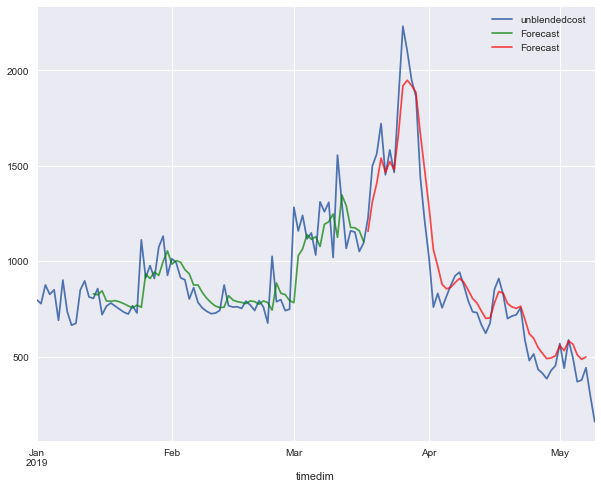

in sample
MAPE 17.49730982894797
rmse 130.95171315899017
out of sample
mape 40.14544319217953
rmse 121.49378912384199
[13, 16, 'tanh', 0.0003]
Epoch 1/1000
63/63 [==============================] - 2s 38ms/sample - loss: 0.8729 - mean_squared_error: 0.8729
Epoch 2/1000
63/63 [==============================] - 0s 855us/sample - loss: 0.7963 - mean_squared_error: 0.7963
Epoch 3/1000
63/63 [==============================] - 0s 744us/sample - loss: 0.7225 - mean_squared_error: 0.7225
Epoch 4/1000
63/63 [==============================] - 0s 665us/sample - loss: 0.6538 - mean_squared_error: 0.6538
Epoch 5/1000
63/63 [==============================] - 0s 807us/sample - loss: 0.5916 - mean_squared_error: 0.5916
Epoch 6/1000
63/63 [==============================] - 0s 696us/sample - loss: 0.5315 - mean_squared_error: 0.5315
Epoch 7/1000
63/63 [==============================] - 0s 728us/sample - loss: 0.4747 - mean_squared_error: 0.4747
Epoch 8/1000
63/63 [==============================] - 0s 760

63/63 [==============================] - 0s 712us/sample - loss: 0.0457 - mean_squared_error: 0.0457
Epoch 71/1000
63/63 [==============================] - 0s 839us/sample - loss: 0.0453 - mean_squared_error: 0.0453
Epoch 72/1000
63/63 [==============================] - 0s 617us/sample - loss: 0.0449 - mean_squared_error: 0.0449
Epoch 73/1000
63/63 [==============================] - 0s 918us/sample - loss: 0.0445 - mean_squared_error: 0.0445
Epoch 74/1000
63/63 [==============================] - 0s 728us/sample - loss: 0.0441 - mean_squared_error: 0.0441
Epoch 75/1000
63/63 [==============================] - 0s 792us/sample - loss: 0.0437 - mean_squared_error: 0.0437
Epoch 76/1000
63/63 [==============================] - 0s 712us/sample - loss: 0.0433 - mean_squared_error: 0.0433
Epoch 77/1000
63/63 [==============================] - 0s 1ms/sample - loss: 0.0429 - mean_squared_error: 0.0429
Epoch 78/1000
63/63 [==============================] - 0s 744us/sample - loss: 0.0426 - mean_squ

63/63 [==============================] - 0s 760us/sample - loss: 0.0287 - mean_squared_error: 0.0287
Epoch 141/1000
63/63 [==============================] - 0s 681us/sample - loss: 0.0285 - mean_squared_error: 0.0285
Epoch 142/1000
63/63 [==============================] - 0s 918us/sample - loss: 0.0284 - mean_squared_error: 0.0284
Epoch 143/1000
63/63 [==============================] - 0s 776us/sample - loss: 0.0282 - mean_squared_error: 0.0282
Epoch 144/1000
63/63 [==============================] - 0s 855us/sample - loss: 0.0281 - mean_squared_error: 0.0281
Epoch 145/1000
63/63 [==============================] - 0s 1ms/sample - loss: 0.0279 - mean_squared_error: 0.0279
Epoch 146/1000
63/63 [==============================] - 0s 855us/sample - loss: 0.0278 - mean_squared_error: 0.0278
Epoch 147/1000
63/63 [==============================] - 0s 997us/sample - loss: 0.0277 - mean_squared_error: 0.0277
Epoch 148/1000
63/63 [==============================] - 0s 807us/sample - loss: 0.0275 - 

63/63 [==============================] - 0s 760us/sample - loss: 0.0214 - mean_squared_error: 0.0214
Epoch 211/1000
63/63 [==============================] - 0s 712us/sample - loss: 0.0214 - mean_squared_error: 0.0214
Epoch 212/1000
63/63 [==============================] - 0s 681us/sample - loss: 0.0213 - mean_squared_error: 0.0213
Epoch 213/1000
63/63 [==============================] - 0s 712us/sample - loss: 0.0213 - mean_squared_error: 0.0213
Epoch 214/1000
63/63 [==============================] - 0s 934us/sample - loss: 0.0212 - mean_squared_error: 0.0212
Epoch 215/1000
63/63 [==============================] - 0s 712us/sample - loss: 0.0211 - mean_squared_error: 0.0211
Epoch 216/1000
63/63 [==============================] - 0s 712us/sample - loss: 0.0211 - mean_squared_error: 0.0211
Epoch 217/1000
63/63 [==============================] - 0s 807us/sample - loss: 0.0210 - mean_squared_error: 0.0210
Epoch 218/1000
63/63 [==============================] - 0s 633us/sample - loss: 0.0209 

63/63 [==============================] - 0s 681us/sample - loss: 0.0183 - mean_squared_error: 0.0183
Epoch 281/1000
63/63 [==============================] - 0s 807us/sample - loss: 0.0182 - mean_squared_error: 0.0182
Epoch 282/1000
63/63 [==============================] - 0s 839us/sample - loss: 0.0182 - mean_squared_error: 0.0182
Epoch 283/1000
63/63 [==============================] - 0s 807us/sample - loss: 0.0182 - mean_squared_error: 0.0182
Epoch 284/1000
63/63 [==============================] - 0s 855us/sample - loss: 0.0181 - mean_squared_error: 0.0181
Epoch 285/1000
63/63 [==============================] - 0s 855us/sample - loss: 0.0181 - mean_squared_error: 0.0181
Epoch 286/1000
63/63 [==============================] - 0s 855us/sample - loss: 0.0181 - mean_squared_error: 0.0181
Epoch 287/1000
63/63 [==============================] - 0s 744us/sample - loss: 0.0181 - mean_squared_error: 0.0181
Epoch 288/1000
63/63 [==============================] - 0s 681us/sample - loss: 0.0180 

63/63 [==============================] - 0s 855us/sample - loss: 0.0168 - mean_squared_error: 0.0168
Epoch 351/1000
63/63 [==============================] - 0s 665us/sample - loss: 0.0168 - mean_squared_error: 0.0168
Epoch 352/1000
63/63 [==============================] - 0s 602us/sample - loss: 0.0167 - mean_squared_error: 0.0167
Epoch 353/1000
63/63 [==============================] - 0s 712us/sample - loss: 0.0167 - mean_squared_error: 0.0167
Epoch 354/1000
63/63 [==============================] - 0s 680us/sample - loss: 0.0167 - mean_squared_error: 0.0167
Epoch 355/1000
63/63 [==============================] - 0s 887us/sample - loss: 0.0167 - mean_squared_error: 0.0167
Epoch 356/1000
63/63 [==============================] - 0s 744us/sample - loss: 0.0167 - mean_squared_error: 0.0167
Epoch 357/1000
63/63 [==============================] - 0s 760us/sample - loss: 0.0167 - mean_squared_error: 0.0167
Epoch 358/1000
63/63 [==============================] - 0s 839us/sample - loss: 0.0167 

63/63 [==============================] - 0s 791us/sample - loss: 0.0161 - mean_squared_error: 0.0161
Epoch 421/1000
63/63 [==============================] - 0s 839us/sample - loss: 0.0161 - mean_squared_error: 0.0161
Epoch 422/1000
63/63 [==============================] - 0s 649us/sample - loss: 0.0161 - mean_squared_error: 0.0161
Epoch 423/1000
63/63 [==============================] - 0s 760us/sample - loss: 0.0160 - mean_squared_error: 0.0160
Epoch 424/1000
63/63 [==============================] - 0s 792us/sample - loss: 0.0161 - mean_squared_error: 0.0161
Epoch 425/1000
63/63 [==============================] - 0s 792us/sample - loss: 0.0160 - mean_squared_error: 0.0160
Epoch 426/1000
63/63 [==============================] - 0s 712us/sample - loss: 0.0160 - mean_squared_error: 0.0160
Epoch 427/1000
63/63 [==============================] - 0s 649us/sample - loss: 0.0160 - mean_squared_error: 0.0160
Epoch 428/1000
63/63 [==============================] - 0s 887us/sample - loss: 0.0160 

63/63 [==============================] - 0s 712us/sample - loss: 0.0158 - mean_squared_error: 0.0158
Epoch 491/1000
63/63 [==============================] - 0s 712us/sample - loss: 0.0157 - mean_squared_error: 0.0157
Epoch 492/1000
63/63 [==============================] - 0s 855us/sample - loss: 0.0157 - mean_squared_error: 0.0157
Epoch 493/1000
63/63 [==============================] - 0s 760us/sample - loss: 0.0157 - mean_squared_error: 0.0157
Epoch 494/1000
63/63 [==============================] - 0s 681us/sample - loss: 0.0157 - mean_squared_error: 0.0157
Epoch 495/1000
63/63 [==============================] - 0s 681us/sample - loss: 0.0157 - mean_squared_error: 0.0157
Epoch 496/1000
63/63 [==============================] - 0s 697us/sample - loss: 0.0157 - mean_squared_error: 0.0157
Epoch 497/1000
63/63 [==============================] - 0s 902us/sample - loss: 0.0157 - mean_squared_error: 0.0157
Epoch 498/1000
63/63 [==============================] - 0s 744us/sample - loss: 0.0157 

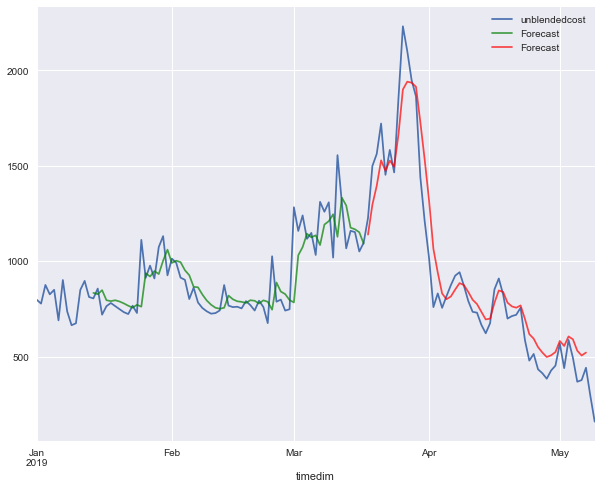

in sample
MAPE 17.61228829186844
rmse 129.59441217307617
out of sample
mape 38.96472620021235
rmse 132.48751906305915
[13, 16, 'tanh', 0.001]
Epoch 1/1000
63/63 [==============================] - 2s 37ms/sample - loss: 0.5833 - mean_squared_error: 0.5833
Epoch 2/1000
63/63 [==============================] - 0s 728us/sample - loss: 0.3389 - mean_squared_error: 0.3389
Epoch 3/1000
63/63 [==============================] - 0s 649us/sample - loss: 0.1677 - mean_squared_error: 0.1677
Epoch 4/1000
63/63 [==============================] - 0s 918us/sample - loss: 0.1159 - mean_squared_error: 0.1159
Epoch 5/1000
63/63 [==============================] - 0s 728us/sample - loss: 0.1285 - mean_squared_error: 0.1285
Epoch 6/1000
63/63 [==============================] - 0s 807us/sample - loss: 0.1126 - mean_squared_error: 0.1126
Epoch 7/1000
63/63 [==============================] - 0s 665us/sample - loss: 0.0870 - mean_squared_error: 0.0870
Epoch 8/1000
63/63 [==============================] - 0s 855u

63/63 [==============================] - 0s 665us/sample - loss: 0.0179 - mean_squared_error: 0.0179
Epoch 71/1000
63/63 [==============================] - 0s 807us/sample - loss: 0.0178 - mean_squared_error: 0.0178
Epoch 72/1000
63/63 [==============================] - 0s 617us/sample - loss: 0.0177 - mean_squared_error: 0.0177
Epoch 73/1000
63/63 [==============================] - 0s 697us/sample - loss: 0.0176 - mean_squared_error: 0.0176
Epoch 74/1000
63/63 [==============================] - 0s 697us/sample - loss: 0.0176 - mean_squared_error: 0.0176
Epoch 75/1000
63/63 [==============================] - 0s 776us/sample - loss: 0.0174 - mean_squared_error: 0.0174
Epoch 76/1000
63/63 [==============================] - 0s 681us/sample - loss: 0.0174 - mean_squared_error: 0.0174
Epoch 77/1000
63/63 [==============================] - 0s 776us/sample - loss: 0.0173 - mean_squared_error: 0.0173
Epoch 78/1000
63/63 [==============================] - 0s 697us/sample - loss: 0.0173 - mean_s

63/63 [==============================] - 0s 823us/sample - loss: 0.0158 - mean_squared_error: 0.0158
Epoch 142/1000
63/63 [==============================] - 0s 807us/sample - loss: 0.0158 - mean_squared_error: 0.0158
Epoch 143/1000
63/63 [==============================] - 0s 712us/sample - loss: 0.0158 - mean_squared_error: 0.0158
Epoch 144/1000
63/63 [==============================] - 0s 807us/sample - loss: 0.0158 - mean_squared_error: 0.0158
Epoch 145/1000
63/63 [==============================] - 0s 807us/sample - loss: 0.0158 - mean_squared_error: 0.0158
Epoch 146/1000
63/63 [==============================] - 0s 760us/sample - loss: 0.0158 - mean_squared_error: 0.0158
Epoch 147/1000
63/63 [==============================] - 0s 776us/sample - loss: 0.0158 - mean_squared_error: 0.0158
Epoch 148/1000
63/63 [==============================] - 0s 760us/sample - loss: 0.0157 - mean_squared_error: 0.0157
Epoch 149/1000
63/63 [==============================] - 0s 807us/sample - loss: 0.0157 

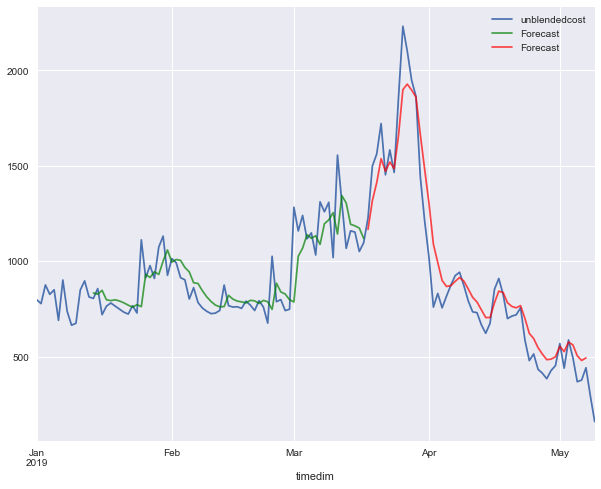

in sample
MAPE 17.711078537161725
rmse 130.91032246822098
out of sample
mape 40.32904732370891
rmse 126.29715810847013
[13, 16, 'tanh', 0.003]
Epoch 1/1000
63/63 [==============================] - 3s 45ms/sample - loss: 0.7403 - mean_squared_error: 0.7403
Epoch 2/1000
63/63 [==============================] - 0s 902us/sample - loss: 0.1636 - mean_squared_error: 0.1636
Epoch 3/1000
63/63 [==============================] - 0s 602us/sample - loss: 0.1339 - mean_squared_error: 0.1339
Epoch 4/1000
63/63 [==============================] - 0s 776us/sample - loss: 0.0765 - mean_squared_error: 0.0765
Epoch 5/1000
63/63 [==============================] - 0s 712us/sample - loss: 0.0578 - mean_squared_error: 0.0578
Epoch 6/1000
63/63 [==============================] - 0s 744us/sample - loss: 0.0598 - mean_squared_error: 0.0598
Epoch 7/1000
63/63 [==============================] - 0s 934us/sample - loss: 0.0480 - mean_squared_error: 0.0480
Epoch 8/1000
63/63 [==============================] - 0s 681

63/63 [==============================] - 0s 744us/sample - loss: 0.0162 - mean_squared_error: 0.0162
Epoch 71/1000
63/63 [==============================] - 0s 807us/sample - loss: 0.0161 - mean_squared_error: 0.0161
Epoch 72/1000
63/63 [==============================] - 0s 617us/sample - loss: 0.0161 - mean_squared_error: 0.0161
Epoch 73/1000
63/63 [==============================] - 0s 887us/sample - loss: 0.0160 - mean_squared_error: 0.0160
Epoch 74/1000
63/63 [==============================] - 0s 760us/sample - loss: 0.0161 - mean_squared_error: 0.0161
Epoch 75/1000
63/63 [==============================] - 0s 712us/sample - loss: 0.0160 - mean_squared_error: 0.0160
Epoch 76/1000
63/63 [==============================] - 0s 807us/sample - loss: 0.0160 - mean_squared_error: 0.0160
Epoch 77/1000
63/63 [==============================] - 0s 792us/sample - loss: 0.0160 - mean_squared_error: 0.0160
Epoch 78/1000
63/63 [==============================] - 0s 792us/sample - loss: 0.0159 - mean_s

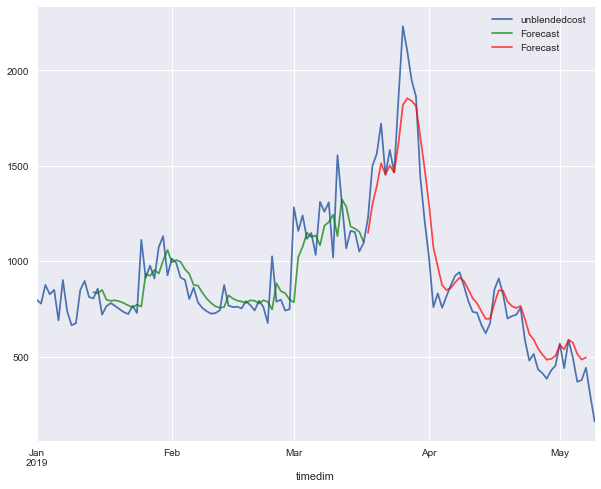

in sample
MAPE 17.590161814101187
rmse 129.92800318092713
out of sample
mape 39.723182031322516
rmse 135.12854098271106
[13, 16, 'tanh', 0.01]
Epoch 1/1000
63/63 [==============================] - 2s 38ms/sample - loss: 0.7690 - mean_squared_error: 0.7690
Epoch 2/1000
63/63 [==============================] - 0s 760us/sample - loss: 0.7653 - mean_squared_error: 0.7653
Epoch 3/1000
63/63 [==============================] - 0s 697us/sample - loss: 0.7614 - mean_squared_error: 0.7614
Epoch 4/1000
63/63 [==============================] - 0s 807us/sample - loss: 0.7576 - mean_squared_error: 0.7576
Epoch 5/1000
63/63 [==============================] - 0s 871us/sample - loss: 0.7537 - mean_squared_error: 0.7537
Epoch 6/1000
63/63 [==============================] - 0s 791us/sample - loss: 0.7500 - mean_squared_error: 0.7500
Epoch 7/1000
63/63 [==============================] - 0s 823us/sample - loss: 0.7461 - mean_squared_error: 0.7461
Epoch 8/1000
63/63 [==============================] - 0s 649

63/63 [==============================] - 0s 744us/sample - loss: 0.4878 - mean_squared_error: 0.4878
Epoch 71/1000
63/63 [==============================] - 0s 697us/sample - loss: 0.4833 - mean_squared_error: 0.4833
Epoch 72/1000
63/63 [==============================] - 0s 855us/sample - loss: 0.4788 - mean_squared_error: 0.4788
Epoch 73/1000
63/63 [==============================] - 0s 776us/sample - loss: 0.4744 - mean_squared_error: 0.4744
Epoch 74/1000
63/63 [==============================] - 0s 902us/sample - loss: 0.4699 - mean_squared_error: 0.4699
Epoch 75/1000
63/63 [==============================] - 0s 776us/sample - loss: 0.4654 - mean_squared_error: 0.4654
Epoch 76/1000
63/63 [==============================] - 0s 950us/sample - loss: 0.4609 - mean_squared_error: 0.4609
Epoch 77/1000
63/63 [==============================] - 0s 792us/sample - loss: 0.4564 - mean_squared_error: 0.4564
Epoch 78/1000
63/63 [==============================] - 0s 855us/sample - loss: 0.4518 - mean_s

63/63 [==============================] - 0s 776us/sample - loss: 0.1701 - mean_squared_error: 0.1701
Epoch 142/1000
63/63 [==============================] - 0s 744us/sample - loss: 0.1680 - mean_squared_error: 0.1680
Epoch 143/1000
63/63 [==============================] - 0s 760us/sample - loss: 0.1660 - mean_squared_error: 0.1660
Epoch 144/1000
63/63 [==============================] - 0s 744us/sample - loss: 0.1642 - mean_squared_error: 0.1642
Epoch 145/1000
63/63 [==============================] - 0s 744us/sample - loss: 0.1627 - mean_squared_error: 0.1627
Epoch 146/1000
63/63 [==============================] - 0s 807us/sample - loss: 0.1612 - mean_squared_error: 0.1612
Epoch 147/1000
63/63 [==============================] - 0s 807us/sample - loss: 0.1599 - mean_squared_error: 0.1599
Epoch 148/1000
63/63 [==============================] - 0s 776us/sample - loss: 0.1587 - mean_squared_error: 0.1587
Epoch 149/1000
63/63 [==============================] - 0s 728us/sample - loss: 0.1575 

63/63 [==============================] - 0s 712us/sample - loss: 0.1084 - mean_squared_error: 0.1084
Epoch 212/1000
63/63 [==============================] - 0s 744us/sample - loss: 0.1078 - mean_squared_error: 0.1078
Epoch 213/1000
63/63 [==============================] - 0s 712us/sample - loss: 0.1072 - mean_squared_error: 0.1072
Epoch 214/1000
63/63 [==============================] - 0s 792us/sample - loss: 0.1067 - mean_squared_error: 0.1067
Epoch 215/1000
63/63 [==============================] - 0s 807us/sample - loss: 0.1061 - mean_squared_error: 0.1061
Epoch 216/1000
63/63 [==============================] - 0s 807us/sample - loss: 0.1056 - mean_squared_error: 0.1056
Epoch 217/1000
63/63 [==============================] - 0s 871us/sample - loss: 0.1051 - mean_squared_error: 0.1051
Epoch 218/1000
63/63 [==============================] - 0s 807us/sample - loss: 0.1046 - mean_squared_error: 0.1046
Epoch 219/1000
63/63 [==============================] - 0s 697us/sample - loss: 0.1041 

63/63 [==============================] - 0s 681us/sample - loss: 0.0853 - mean_squared_error: 0.0853
Epoch 282/1000
63/63 [==============================] - 0s 807us/sample - loss: 0.0851 - mean_squared_error: 0.0851
Epoch 283/1000
63/63 [==============================] - 0s 918us/sample - loss: 0.0849 - mean_squared_error: 0.0849
Epoch 284/1000
63/63 [==============================] - 0s 871us/sample - loss: 0.0846 - mean_squared_error: 0.0846
Epoch 285/1000
63/63 [==============================] - 0s 760us/sample - loss: 0.0844 - mean_squared_error: 0.0844
Epoch 286/1000
63/63 [==============================] - 0s 839us/sample - loss: 0.0842 - mean_squared_error: 0.0842
Epoch 287/1000
63/63 [==============================] - 0s 744us/sample - loss: 0.0840 - mean_squared_error: 0.0840
Epoch 288/1000
63/63 [==============================] - 0s 823us/sample - loss: 0.0837 - mean_squared_error: 0.0837
Epoch 289/1000
63/63 [==============================] - 0s 823us/sample - loss: 0.0835 

63/63 [==============================] - 0s 496us/sample - loss: 0.0715 - mean_squared_error: 0.0715
Epoch 352/1000
63/63 [==============================] - 0s 744us/sample - loss: 0.0713 - mean_squared_error: 0.0713
Epoch 353/1000
63/63 [==============================] - 0s 650us/sample - loss: 0.0712 - mean_squared_error: 0.0712
Epoch 354/1000
63/63 [==============================] - 0s 548us/sample - loss: 0.0710 - mean_squared_error: 0.0710
Epoch 355/1000
63/63 [==============================] - 0s 496us/sample - loss: 0.0708 - mean_squared_error: 0.0708
Epoch 356/1000
63/63 [==============================] - 0s 744us/sample - loss: 0.0707 - mean_squared_error: 0.0707
Epoch 357/1000
63/63 [==============================] - 0s 496us/sample - loss: 0.0705 - mean_squared_error: 0.0705
Epoch 358/1000
63/63 [==============================] - 0s 496us/sample - loss: 0.0704 - mean_squared_error: 0.0704
Epoch 359/1000
63/63 [==============================] - 0s 496us/sample - loss: 0.0702 

63/63 [==============================] - 0s 744us/sample - loss: 0.0613 - mean_squared_error: 0.0613
Epoch 422/1000
63/63 [==============================] - 0s 918us/sample - loss: 0.0612 - mean_squared_error: 0.0612
Epoch 423/1000
63/63 [==============================] - 0s 934us/sample - loss: 0.0610 - mean_squared_error: 0.0610
Epoch 424/1000
63/63 [==============================] - 0s 792us/sample - loss: 0.0609 - mean_squared_error: 0.0609
Epoch 425/1000
63/63 [==============================] - 0s 918us/sample - loss: 0.0608 - mean_squared_error: 0.0608
Epoch 426/1000
63/63 [==============================] - 0s 696us/sample - loss: 0.0607 - mean_squared_error: 0.0607
Epoch 427/1000
63/63 [==============================] - 0s 886us/sample - loss: 0.0605 - mean_squared_error: 0.0605
Epoch 428/1000
63/63 [==============================] - 0s 918us/sample - loss: 0.0604 - mean_squared_error: 0.0604
Epoch 429/1000
63/63 [==============================] - 0s 712us/sample - loss: 0.0603 

63/63 [==============================] - 0s 776us/sample - loss: 0.0530 - mean_squared_error: 0.0530
Epoch 492/1000
63/63 [==============================] - 0s 807us/sample - loss: 0.0529 - mean_squared_error: 0.0529
Epoch 493/1000
63/63 [==============================] - 0s 966us/sample - loss: 0.0528 - mean_squared_error: 0.0528
Epoch 494/1000
63/63 [==============================] - 0s 934us/sample - loss: 0.0527 - mean_squared_error: 0.0527
Epoch 495/1000
63/63 [==============================] - 0s 982us/sample - loss: 0.0526 - mean_squared_error: 0.0526
Epoch 496/1000
63/63 [==============================] - 0s 791us/sample - loss: 0.0525 - mean_squared_error: 0.0525
Epoch 497/1000
63/63 [==============================] - 0s 776us/sample - loss: 0.0524 - mean_squared_error: 0.0524
Epoch 498/1000
63/63 [==============================] - 0s 871us/sample - loss: 0.0523 - mean_squared_error: 0.0523
Epoch 499/1000
63/63 [==============================] - 0s 902us/sample - loss: 0.0522 

63/63 [==============================] - 0s 776us/sample - loss: 0.0464 - mean_squared_error: 0.0464
Epoch 562/1000
63/63 [==============================] - 0s 744us/sample - loss: 0.0463 - mean_squared_error: 0.0463
Epoch 563/1000
63/63 [==============================] - 0s 1ms/sample - loss: 0.0462 - mean_squared_error: 0.0462
Epoch 564/1000
63/63 [==============================] - 0s 807us/sample - loss: 0.0461 - mean_squared_error: 0.0461
Epoch 565/1000
63/63 [==============================] - 0s 744us/sample - loss: 0.0460 - mean_squared_error: 0.0460
Epoch 566/1000
63/63 [==============================] - 0s 776us/sample - loss: 0.0460 - mean_squared_error: 0.0460
Epoch 567/1000
63/63 [==============================] - 0s 776us/sample - loss: 0.0459 - mean_squared_error: 0.0459
Epoch 568/1000
63/63 [==============================] - 0s 712us/sample - loss: 0.0458 - mean_squared_error: 0.0458
Epoch 569/1000
63/63 [==============================] - 0s 807us/sample - loss: 0.0457 - 

63/63 [==============================] - 0s 855us/sample - loss: 0.0412 - mean_squared_error: 0.0412
Epoch 632/1000
63/63 [==============================] - 0s 728us/sample - loss: 0.0412 - mean_squared_error: 0.0412
Epoch 633/1000
63/63 [==============================] - 0s 776us/sample - loss: 0.0411 - mean_squared_error: 0.0411
Epoch 634/1000
63/63 [==============================] - 0s 918us/sample - loss: 0.0410 - mean_squared_error: 0.0410
Epoch 635/1000
63/63 [==============================] - 0s 744us/sample - loss: 0.0410 - mean_squared_error: 0.0410
Epoch 636/1000
63/63 [==============================] - 0s 728us/sample - loss: 0.0409 - mean_squared_error: 0.0409
Epoch 637/1000
63/63 [==============================] - 0s 776us/sample - loss: 0.0408 - mean_squared_error: 0.0408
Epoch 638/1000
63/63 [==============================] - 0s 792us/sample - loss: 0.0408 - mean_squared_error: 0.0408
Epoch 639/1000
63/63 [==============================] - 0s 760us/sample - loss: 0.0407 

63/63 [==============================] - 0s 712us/sample - loss: 0.0371 - mean_squared_error: 0.0371
Epoch 702/1000
63/63 [==============================] - 0s 902us/sample - loss: 0.0371 - mean_squared_error: 0.0371
Epoch 703/1000
63/63 [==============================] - 0s 681us/sample - loss: 0.0370 - mean_squared_error: 0.0370
Epoch 704/1000
63/63 [==============================] - 0s 918us/sample - loss: 0.0370 - mean_squared_error: 0.0370
Epoch 705/1000
63/63 [==============================] - 0s 934us/sample - loss: 0.0369 - mean_squared_error: 0.0369
Epoch 706/1000
63/63 [==============================] - 0s 681us/sample - loss: 0.0369 - mean_squared_error: 0.0369
Epoch 707/1000
63/63 [==============================] - 0s 792us/sample - loss: 0.0368 - mean_squared_error: 0.0368
Epoch 708/1000
63/63 [==============================] - 0s 855us/sample - loss: 0.0368 - mean_squared_error: 0.0368
Epoch 709/1000
63/63 [==============================] - 0s 649us/sample - loss: 0.0367 

63/63 [==============================] - 0s 776us/sample - loss: 0.0338 - mean_squared_error: 0.0338
Epoch 772/1000
63/63 [==============================] - 0s 697us/sample - loss: 0.0337 - mean_squared_error: 0.0337
Epoch 773/1000
63/63 [==============================] - 0s 728us/sample - loss: 0.0337 - mean_squared_error: 0.0337
Epoch 774/1000
63/63 [==============================] - 0s 744us/sample - loss: 0.0336 - mean_squared_error: 0.0336
Epoch 775/1000
63/63 [==============================] - 0s 744us/sample - loss: 0.0336 - mean_squared_error: 0.0336
Epoch 776/1000
63/63 [==============================] - 0s 871us/sample - loss: 0.0336 - mean_squared_error: 0.0336
Epoch 777/1000
63/63 [==============================] - 0s 918us/sample - loss: 0.0335 - mean_squared_error: 0.0335
Epoch 778/1000
63/63 [==============================] - 0s 760us/sample - loss: 0.0335 - mean_squared_error: 0.0335
Epoch 779/1000
63/63 [==============================] - 0s 760us/sample - loss: 0.0334 

63/63 [==============================] - 0s 839us/sample - loss: 0.0309 - mean_squared_error: 0.0309
Epoch 842/1000
63/63 [==============================] - 0s 744us/sample - loss: 0.0309 - mean_squared_error: 0.0309
Epoch 843/1000
63/63 [==============================] - 0s 697us/sample - loss: 0.0308 - mean_squared_error: 0.0308
Epoch 844/1000
63/63 [==============================] - 0s 760us/sample - loss: 0.0308 - mean_squared_error: 0.0308
Epoch 845/1000
63/63 [==============================] - 0s 776us/sample - loss: 0.0308 - mean_squared_error: 0.0308
Epoch 846/1000
63/63 [==============================] - 0s 791us/sample - loss: 0.0307 - mean_squared_error: 0.0307
Epoch 847/1000
63/63 [==============================] - 0s 712us/sample - loss: 0.0307 - mean_squared_error: 0.0307
Epoch 848/1000
63/63 [==============================] - 0s 728us/sample - loss: 0.0307 - mean_squared_error: 0.0307
Epoch 849/1000
63/63 [==============================] - 0s 649us/sample - loss: 0.0306 

63/63 [==============================] - 0s 712us/sample - loss: 0.0284 - mean_squared_error: 0.0284
Epoch 912/1000
63/63 [==============================] - 0s 807us/sample - loss: 0.0284 - mean_squared_error: 0.0284
Epoch 913/1000
63/63 [==============================] - 0s 728us/sample - loss: 0.0284 - mean_squared_error: 0.0284
Epoch 914/1000
63/63 [==============================] - 0s 855us/sample - loss: 0.0284 - mean_squared_error: 0.0284
Epoch 915/1000
63/63 [==============================] - 0s 871us/sample - loss: 0.0283 - mean_squared_error: 0.0283
Epoch 916/1000
63/63 [==============================] - 0s 776us/sample - loss: 0.0283 - mean_squared_error: 0.0283
Epoch 917/1000
63/63 [==============================] - 0s 712us/sample - loss: 0.0283 - mean_squared_error: 0.0283
Epoch 918/1000
63/63 [==============================] - 0s 760us/sample - loss: 0.0282 - mean_squared_error: 0.0282
Epoch 919/1000
63/63 [==============================] - 0s 855us/sample - loss: 0.0282 

63/63 [==============================] - 0s 760us/sample - loss: 0.0263 - mean_squared_error: 0.0263
Epoch 982/1000
63/63 [==============================] - 0s 760us/sample - loss: 0.0263 - mean_squared_error: 0.0263
Epoch 983/1000
63/63 [==============================] - 0s 681us/sample - loss: 0.0262 - mean_squared_error: 0.0262
Epoch 984/1000
63/63 [==============================] - 0s 887us/sample - loss: 0.0262 - mean_squared_error: 0.0262
Epoch 985/1000
63/63 [==============================] - 0s 760us/sample - loss: 0.0262 - mean_squared_error: 0.0262
Epoch 986/1000
63/63 [==============================] - 0s 760us/sample - loss: 0.0261 - mean_squared_error: 0.0261
Epoch 987/1000
63/63 [==============================] - 0s 792us/sample - loss: 0.0261 - mean_squared_error: 0.0261
Epoch 988/1000
63/63 [==============================] - 0s 839us/sample - loss: 0.0261 - mean_squared_error: 0.0261
Epoch 989/1000
63/63 [==============================] - 0s 886us/sample - loss: 0.0261 

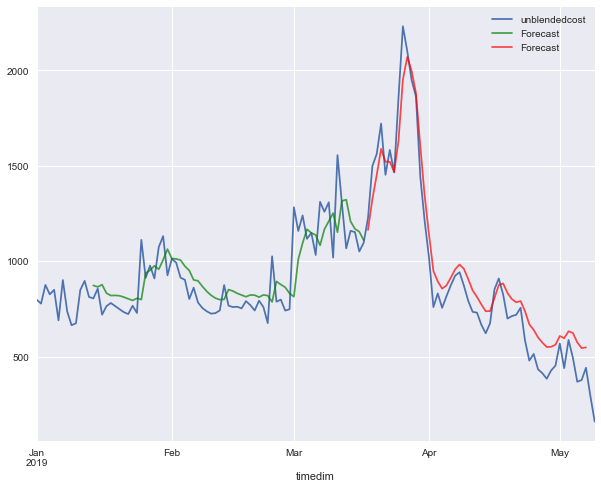

in sample
MAPE 17.306726579741838
rmse 132.826876532728
out of sample
mape 39.82643002438537
rmse 120.47228686436823
[13, 16, 'relu', 0.0001]
Epoch 1/1000
63/63 [==============================] - 3s 45ms/sample - loss: 0.8142 - mean_squared_error: 0.8142
Epoch 2/1000
63/63 [==============================] - 0s 791us/sample - loss: 0.7984 - mean_squared_error: 0.7984
Epoch 3/1000
63/63 [==============================] - 0s 649us/sample - loss: 0.7827 - mean_squared_error: 0.7827
Epoch 4/1000
63/63 [==============================] - 0s 855us/sample - loss: 0.7671 - mean_squared_error: 0.7671
Epoch 5/1000
63/63 [==============================] - 0s 744us/sample - loss: 0.7515 - mean_squared_error: 0.7515
Epoch 6/1000
63/63 [==============================] - 0s 823us/sample - loss: 0.7362 - mean_squared_error: 0.7362
Epoch 7/1000
63/63 [==============================] - 0s 823us/sample - loss: 0.7216 - mean_squared_error: 0.7216
Epoch 8/1000
63/63 [==============================] - 0s 776u

63/63 [==============================] - 0s 839us/sample - loss: 0.1431 - mean_squared_error: 0.1431
Epoch 71/1000
63/63 [==============================] - 0s 760us/sample - loss: 0.1415 - mean_squared_error: 0.1415
Epoch 72/1000
63/63 [==============================] - 0s 760us/sample - loss: 0.1401 - mean_squared_error: 0.1401
Epoch 73/1000
63/63 [==============================] - 0s 791us/sample - loss: 0.1387 - mean_squared_error: 0.1387
Epoch 74/1000
63/63 [==============================] - 0s 839us/sample - loss: 0.1372 - mean_squared_error: 0.1372
Epoch 75/1000
63/63 [==============================] - 0s 807us/sample - loss: 0.1358 - mean_squared_error: 0.1358
Epoch 76/1000
63/63 [==============================] - 0s 681us/sample - loss: 0.1344 - mean_squared_error: 0.1344
Epoch 77/1000
63/63 [==============================] - 0s 744us/sample - loss: 0.1330 - mean_squared_error: 0.1330
Epoch 78/1000
63/63 [==============================] - 0s 823us/sample - loss: 0.1316 - mean_s

63/63 [==============================] - 0s 712us/sample - loss: 0.0755 - mean_squared_error: 0.0755
Epoch 141/1000
63/63 [==============================] - 0s 839us/sample - loss: 0.0750 - mean_squared_error: 0.0750
Epoch 142/1000
63/63 [==============================] - 0s 649us/sample - loss: 0.0747 - mean_squared_error: 0.0747
Epoch 143/1000
63/63 [==============================] - 0s 728us/sample - loss: 0.0743 - mean_squared_error: 0.0743
Epoch 144/1000
63/63 [==============================] - 0s 744us/sample - loss: 0.0739 - mean_squared_error: 0.0739
Epoch 145/1000
63/63 [==============================] - 0s 823us/sample - loss: 0.0735 - mean_squared_error: 0.0735
Epoch 146/1000
63/63 [==============================] - 0s 728us/sample - loss: 0.0732 - mean_squared_error: 0.0732
Epoch 147/1000
63/63 [==============================] - 0s 776us/sample - loss: 0.0728 - mean_squared_error: 0.0728
Epoch 148/1000
63/63 [==============================] - 0s 681us/sample - loss: 0.0724 

63/63 [==============================] - 0s 697us/sample - loss: 0.0551 - mean_squared_error: 0.0551
Epoch 211/1000
63/63 [==============================] - 0s 617us/sample - loss: 0.0549 - mean_squared_error: 0.0549
Epoch 212/1000
63/63 [==============================] - 0s 886us/sample - loss: 0.0547 - mean_squared_error: 0.0547
Epoch 213/1000
63/63 [==============================] - 0s 744us/sample - loss: 0.0544 - mean_squared_error: 0.0544
Epoch 214/1000
63/63 [==============================] - 0s 744us/sample - loss: 0.0542 - mean_squared_error: 0.0542
Epoch 215/1000
63/63 [==============================] - 0s 886us/sample - loss: 0.0540 - mean_squared_error: 0.0540
Epoch 216/1000
63/63 [==============================] - 0s 918us/sample - loss: 0.0538 - mean_squared_error: 0.0538
Epoch 217/1000
63/63 [==============================] - 0s 633us/sample - loss: 0.0536 - mean_squared_error: 0.0536
Epoch 218/1000
63/63 [==============================] - 0s 934us/sample - loss: 0.0534 

63/63 [==============================] - 0s 776us/sample - loss: 0.0426 - mean_squared_error: 0.0426
Epoch 281/1000
63/63 [==============================] - 0s 776us/sample - loss: 0.0424 - mean_squared_error: 0.0424
Epoch 282/1000
63/63 [==============================] - 0s 934us/sample - loss: 0.0423 - mean_squared_error: 0.0423
Epoch 283/1000
63/63 [==============================] - 0s 871us/sample - loss: 0.0421 - mean_squared_error: 0.0421
Epoch 284/1000
63/63 [==============================] - 0s 792us/sample - loss: 0.0420 - mean_squared_error: 0.0420
Epoch 285/1000
63/63 [==============================] - 0s 839us/sample - loss: 0.0419 - mean_squared_error: 0.0419
Epoch 286/1000
63/63 [==============================] - 0s 681us/sample - loss: 0.0417 - mean_squared_error: 0.0417
Epoch 287/1000
63/63 [==============================] - 0s 823us/sample - loss: 0.0416 - mean_squared_error: 0.0416
Epoch 288/1000
63/63 [==============================] - 0s 807us/sample - loss: 0.0414 

63/63 [==============================] - 0s 776us/sample - loss: 0.0344 - mean_squared_error: 0.0344
Epoch 351/1000
63/63 [==============================] - 0s 697us/sample - loss: 0.0343 - mean_squared_error: 0.0343
Epoch 352/1000
63/63 [==============================] - 0s 712us/sample - loss: 0.0342 - mean_squared_error: 0.0342
Epoch 353/1000
63/63 [==============================] - 0s 823us/sample - loss: 0.0341 - mean_squared_error: 0.0341
Epoch 354/1000
63/63 [==============================] - 0s 665us/sample - loss: 0.0340 - mean_squared_error: 0.0340
Epoch 355/1000
63/63 [==============================] - 0s 681us/sample - loss: 0.0340 - mean_squared_error: 0.0340
Epoch 356/1000
63/63 [==============================] - 0s 681us/sample - loss: 0.0339 - mean_squared_error: 0.0339
Epoch 357/1000
63/63 [==============================] - 0s 887us/sample - loss: 0.0338 - mean_squared_error: 0.0338
Epoch 358/1000
63/63 [==============================] - 0s 728us/sample - loss: 0.0337 

63/63 [==============================] - 0s 839us/sample - loss: 0.0293 - mean_squared_error: 0.0293
Epoch 421/1000
63/63 [==============================] - 0s 776us/sample - loss: 0.0292 - mean_squared_error: 0.0292
Epoch 422/1000
63/63 [==============================] - 0s 728us/sample - loss: 0.0291 - mean_squared_error: 0.0291
Epoch 423/1000
63/63 [==============================] - 0s 760us/sample - loss: 0.0291 - mean_squared_error: 0.0291
Epoch 424/1000
63/63 [==============================] - 0s 792us/sample - loss: 0.0290 - mean_squared_error: 0.0290
Epoch 425/1000
63/63 [==============================] - 0s 776us/sample - loss: 0.0290 - mean_squared_error: 0.0290
Epoch 426/1000
63/63 [==============================] - 0s 728us/sample - loss: 0.0289 - mean_squared_error: 0.0289
Epoch 427/1000
63/63 [==============================] - 0s 807us/sample - loss: 0.0289 - mean_squared_error: 0.0289
Epoch 428/1000
63/63 [==============================] - 0s 776us/sample - loss: 0.0288 

63/63 [==============================] - 0s 792us/sample - loss: 0.0259 - mean_squared_error: 0.0259
Epoch 491/1000
63/63 [==============================] - 0s 744us/sample - loss: 0.0258 - mean_squared_error: 0.0258
Epoch 492/1000
63/63 [==============================] - 0s 649us/sample - loss: 0.0258 - mean_squared_error: 0.0258
Epoch 493/1000
63/63 [==============================] - 0s 665us/sample - loss: 0.0258 - mean_squared_error: 0.0258
Epoch 494/1000
63/63 [==============================] - 0s 776us/sample - loss: 0.0257 - mean_squared_error: 0.0257
Epoch 495/1000
63/63 [==============================] - 0s 839us/sample - loss: 0.0257 - mean_squared_error: 0.0257
Epoch 496/1000
63/63 [==============================] - 0s 776us/sample - loss: 0.0256 - mean_squared_error: 0.0256
Epoch 497/1000
63/63 [==============================] - 0s 712us/sample - loss: 0.0256 - mean_squared_error: 0.0256
Epoch 498/1000
63/63 [==============================] - 0s 839us/sample - loss: 0.0256 

63/63 [==============================] - 0s 696us/sample - loss: 0.0234 - mean_squared_error: 0.0234
Epoch 561/1000
63/63 [==============================] - 0s 791us/sample - loss: 0.0234 - mean_squared_error: 0.0234
Epoch 562/1000
63/63 [==============================] - 0s 728us/sample - loss: 0.0233 - mean_squared_error: 0.0233
Epoch 563/1000
63/63 [==============================] - 0s 760us/sample - loss: 0.0233 - mean_squared_error: 0.0233
Epoch 564/1000
63/63 [==============================] - 0s 902us/sample - loss: 0.0233 - mean_squared_error: 0.0233
Epoch 565/1000
63/63 [==============================] - 0s 792us/sample - loss: 0.0232 - mean_squared_error: 0.0232
Epoch 566/1000
63/63 [==============================] - 0s 855us/sample - loss: 0.0232 - mean_squared_error: 0.0232
Epoch 567/1000
63/63 [==============================] - 0s 744us/sample - loss: 0.0232 - mean_squared_error: 0.0232
Epoch 568/1000
63/63 [==============================] - 0s 760us/sample - loss: 0.0231 

63/63 [==============================] - 0s 776us/sample - loss: 0.0215 - mean_squared_error: 0.0215
Epoch 631/1000
63/63 [==============================] - 0s 665us/sample - loss: 0.0214 - mean_squared_error: 0.0214
Epoch 632/1000
63/63 [==============================] - 0s 871us/sample - loss: 0.0214 - mean_squared_error: 0.0214
Epoch 633/1000
63/63 [==============================] - 0s 744us/sample - loss: 0.0214 - mean_squared_error: 0.0214
Epoch 634/1000
63/63 [==============================] - 0s 791us/sample - loss: 0.0214 - mean_squared_error: 0.0214
Epoch 635/1000
63/63 [==============================] - 0s 807us/sample - loss: 0.0213 - mean_squared_error: 0.0213
Epoch 636/1000
63/63 [==============================] - 0s 792us/sample - loss: 0.0213 - mean_squared_error: 0.0213
Epoch 637/1000
63/63 [==============================] - 0s 681us/sample - loss: 0.0213 - mean_squared_error: 0.0213
Epoch 638/1000
63/63 [==============================] - 0s 744us/sample - loss: 0.0213 

63/63 [==============================] - 0s 807us/sample - loss: 0.0200 - mean_squared_error: 0.0200
Epoch 701/1000
63/63 [==============================] - 0s 760us/sample - loss: 0.0199 - mean_squared_error: 0.0199
Epoch 702/1000
63/63 [==============================] - 0s 665us/sample - loss: 0.0199 - mean_squared_error: 0.0199
Epoch 703/1000
63/63 [==============================] - 0s 776us/sample - loss: 0.0199 - mean_squared_error: 0.0199
Epoch 704/1000
63/63 [==============================] - 0s 681us/sample - loss: 0.0199 - mean_squared_error: 0.0199
Epoch 705/1000
63/63 [==============================] - 0s 665us/sample - loss: 0.0199 - mean_squared_error: 0.0199
Epoch 706/1000
63/63 [==============================] - 0s 681us/sample - loss: 0.0198 - mean_squared_error: 0.0198
Epoch 707/1000
63/63 [==============================] - 0s 855us/sample - loss: 0.0198 - mean_squared_error: 0.0198
Epoch 708/1000
63/63 [==============================] - 0s 744us/sample - loss: 0.0198 

63/63 [==============================] - 0s 681us/sample - loss: 0.0188 - mean_squared_error: 0.0188
Epoch 771/1000
63/63 [==============================] - 0s 776us/sample - loss: 0.0188 - mean_squared_error: 0.0188
Epoch 772/1000
63/63 [==============================] - 0s 997us/sample - loss: 0.0187 - mean_squared_error: 0.0187
Epoch 773/1000
63/63 [==============================] - 0s 776us/sample - loss: 0.0187 - mean_squared_error: 0.0187
Epoch 774/1000
63/63 [==============================] - 0s 839us/sample - loss: 0.0187 - mean_squared_error: 0.0187
Epoch 775/1000
63/63 [==============================] - 0s 602us/sample - loss: 0.0187 - mean_squared_error: 0.0187
Epoch 776/1000
63/63 [==============================] - 0s 776us/sample - loss: 0.0187 - mean_squared_error: 0.0187
Epoch 777/1000
63/63 [==============================] - 0s 681us/sample - loss: 0.0187 - mean_squared_error: 0.0187
Epoch 778/1000
63/63 [==============================] - 0s 918us/sample - loss: 0.0187 

63/63 [==============================] - 0s 697us/sample - loss: 0.0179 - mean_squared_error: 0.0179
Epoch 841/1000
63/63 [==============================] - 0s 760us/sample - loss: 0.0179 - mean_squared_error: 0.0179
Epoch 842/1000
63/63 [==============================] - 0s 776us/sample - loss: 0.0178 - mean_squared_error: 0.0178
Epoch 843/1000
63/63 [==============================] - 0s 855us/sample - loss: 0.0178 - mean_squared_error: 0.0178
Epoch 844/1000
63/63 [==============================] - 0s 760us/sample - loss: 0.0178 - mean_squared_error: 0.0178
Epoch 845/1000
63/63 [==============================] - 0s 728us/sample - loss: 0.0178 - mean_squared_error: 0.0178
Epoch 846/1000
63/63 [==============================] - 0s 887us/sample - loss: 0.0178 - mean_squared_error: 0.0178
Epoch 847/1000
63/63 [==============================] - 0s 1ms/sample - loss: 0.0178 - mean_squared_error: 0.0178
Epoch 848/1000
63/63 [==============================] - 0s 776us/sample - loss: 0.0178 - 

63/63 [==============================] - 0s 760us/sample - loss: 0.0172 - mean_squared_error: 0.0172
Epoch 911/1000
63/63 [==============================] - 0s 744us/sample - loss: 0.0171 - mean_squared_error: 0.0171
Epoch 912/1000
63/63 [==============================] - 0s 760us/sample - loss: 0.0171 - mean_squared_error: 0.0171
Epoch 913/1000
63/63 [==============================] - 0s 839us/sample - loss: 0.0171 - mean_squared_error: 0.0171
Epoch 914/1000
63/63 [==============================] - 0s 855us/sample - loss: 0.0171 - mean_squared_error: 0.0171
Epoch 915/1000
63/63 [==============================] - 0s 776us/sample - loss: 0.0171 - mean_squared_error: 0.0171
Epoch 916/1000
63/63 [==============================] - 0s 918us/sample - loss: 0.0171 - mean_squared_error: 0.0171
Epoch 917/1000
63/63 [==============================] - 0s 712us/sample - loss: 0.0171 - mean_squared_error: 0.0171
Epoch 918/1000
63/63 [==============================] - 0s 886us/sample - loss: 0.0171 

63/63 [==============================] - 0s 712us/sample - loss: 0.0166 - mean_squared_error: 0.0166
Epoch 981/1000
63/63 [==============================] - 0s 871us/sample - loss: 0.0166 - mean_squared_error: 0.0166
Epoch 982/1000
63/63 [==============================] - 0s 839us/sample - loss: 0.0166 - mean_squared_error: 0.0166
Epoch 983/1000
63/63 [==============================] - 0s 744us/sample - loss: 0.0166 - mean_squared_error: 0.0166
Epoch 984/1000
63/63 [==============================] - 0s 760us/sample - loss: 0.0166 - mean_squared_error: 0.0166
Epoch 985/1000
63/63 [==============================] - 0s 855us/sample - loss: 0.0166 - mean_squared_error: 0.0166
Epoch 986/1000
63/63 [==============================] - 0s 839us/sample - loss: 0.0166 - mean_squared_error: 0.0166
Epoch 987/1000
63/63 [==============================] - 0s 712us/sample - loss: 0.0166 - mean_squared_error: 0.0166
Epoch 988/1000
63/63 [==============================] - 0s 902us/sample - loss: 0.0166 

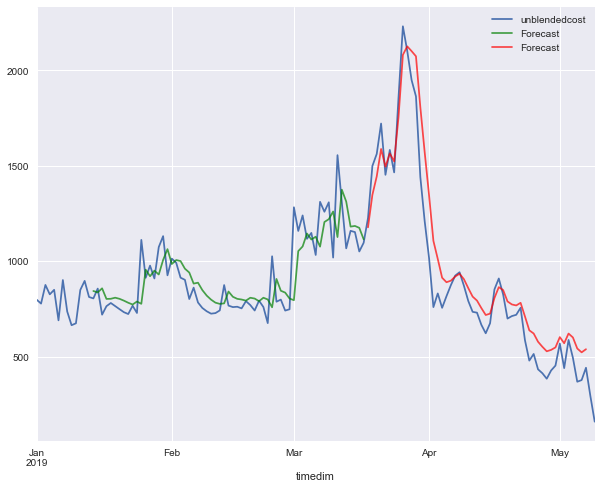

in sample
MAPE 17.776953216436745
rmse 132.21728974840124
out of sample
mape 40.1114279911517
rmse 140.10406453683748
[13, 16, 'relu', 0.0003]
Epoch 1/1000
63/63 [==============================] - 3s 40ms/sample - loss: 0.4892 - mean_squared_error: 0.4892
Epoch 2/1000
63/63 [==============================] - 0s 712us/sample - loss: 0.4474 - mean_squared_error: 0.4474
Epoch 3/1000
63/63 [==============================] - 0s 807us/sample - loss: 0.4054 - mean_squared_error: 0.4054
Epoch 4/1000
63/63 [==============================] - 0s 744us/sample - loss: 0.3648 - mean_squared_error: 0.3648
Epoch 5/1000
63/63 [==============================] - 0s 697us/sample - loss: 0.3246 - mean_squared_error: 0.3246
Epoch 6/1000
63/63 [==============================] - 0s 823us/sample - loss: 0.2873 - mean_squared_error: 0.2873
Epoch 7/1000
63/63 [==============================] - 0s 887us/sample - loss: 0.2511 - mean_squared_error: 0.2511
Epoch 8/1000
63/63 [==============================] - 0s 697

63/63 [==============================] - 0s 807us/sample - loss: 0.0343 - mean_squared_error: 0.0343
Epoch 71/1000
63/63 [==============================] - 0s 712us/sample - loss: 0.0340 - mean_squared_error: 0.0340
Epoch 72/1000
63/63 [==============================] - 0s 681us/sample - loss: 0.0337 - mean_squared_error: 0.0337
Epoch 73/1000
63/63 [==============================] - 0s 855us/sample - loss: 0.0333 - mean_squared_error: 0.0333
Epoch 74/1000
63/63 [==============================] - 0s 902us/sample - loss: 0.0330 - mean_squared_error: 0.0330
Epoch 75/1000
63/63 [==============================] - 0s 697us/sample - loss: 0.0327 - mean_squared_error: 0.0327
Epoch 76/1000
63/63 [==============================] - 0s 776us/sample - loss: 0.0324 - mean_squared_error: 0.0324
Epoch 77/1000
63/63 [==============================] - 0s 839us/sample - loss: 0.0321 - mean_squared_error: 0.0321
Epoch 78/1000
63/63 [==============================] - 0s 712us/sample - loss: 0.0319 - mean_s

63/63 [==============================] - 0s 728us/sample - loss: 0.0219 - mean_squared_error: 0.0219
Epoch 142/1000
63/63 [==============================] - 0s 807us/sample - loss: 0.0218 - mean_squared_error: 0.0218
Epoch 143/1000
63/63 [==============================] - 0s 807us/sample - loss: 0.0218 - mean_squared_error: 0.0218
Epoch 144/1000
63/63 [==============================] - 0s 902us/sample - loss: 0.0217 - mean_squared_error: 0.0217
Epoch 145/1000
63/63 [==============================] - 0s 807us/sample - loss: 0.0215 - mean_squared_error: 0.0215
Epoch 146/1000
63/63 [==============================] - 0s 744us/sample - loss: 0.0215 - mean_squared_error: 0.0215
Epoch 147/1000
63/63 [==============================] - 0s 697us/sample - loss: 0.0214 - mean_squared_error: 0.0214
Epoch 148/1000
63/63 [==============================] - 0s 918us/sample - loss: 0.0213 - mean_squared_error: 0.0213
Epoch 149/1000
63/63 [==============================] - 0s 697us/sample - loss: 0.0212 

63/63 [==============================] - 0s 760us/sample - loss: 0.0179 - mean_squared_error: 0.0179
Epoch 212/1000
63/63 [==============================] - 0s 918us/sample - loss: 0.0179 - mean_squared_error: 0.0179
Epoch 213/1000
63/63 [==============================] - 0s 791us/sample - loss: 0.0178 - mean_squared_error: 0.0178
Epoch 214/1000
63/63 [==============================] - 0s 902us/sample - loss: 0.0178 - mean_squared_error: 0.0178
Epoch 215/1000
63/63 [==============================] - 0s 728us/sample - loss: 0.0178 - mean_squared_error: 0.0178
Epoch 216/1000
63/63 [==============================] - 0s 681us/sample - loss: 0.0177 - mean_squared_error: 0.0177
Epoch 217/1000
63/63 [==============================] - 0s 776us/sample - loss: 0.0177 - mean_squared_error: 0.0177
Epoch 218/1000
63/63 [==============================] - 0s 760us/sample - loss: 0.0177 - mean_squared_error: 0.0177
Epoch 219/1000
63/63 [==============================] - 0s 712us/sample - loss: 0.0177 

63/63 [==============================] - 0s 823us/sample - loss: 0.0164 - mean_squared_error: 0.0164
Epoch 282/1000
63/63 [==============================] - 0s 649us/sample - loss: 0.0164 - mean_squared_error: 0.0164
Epoch 283/1000
63/63 [==============================] - 0s 665us/sample - loss: 0.0163 - mean_squared_error: 0.0163
Epoch 284/1000
63/63 [==============================] - 0s 760us/sample - loss: 0.0163 - mean_squared_error: 0.0163
Epoch 285/1000
63/63 [==============================] - 0s 712us/sample - loss: 0.0163 - mean_squared_error: 0.0163
Epoch 286/1000
63/63 [==============================] - 0s 712us/sample - loss: 0.0163 - mean_squared_error: 0.0163
Epoch 287/1000
63/63 [==============================] - 0s 807us/sample - loss: 0.0163 - mean_squared_error: 0.0163
Epoch 288/1000
63/63 [==============================] - 0s 807us/sample - loss: 0.0163 - mean_squared_error: 0.0163
Epoch 289/1000
63/63 [==============================] - 0s 697us/sample - loss: 0.0163 

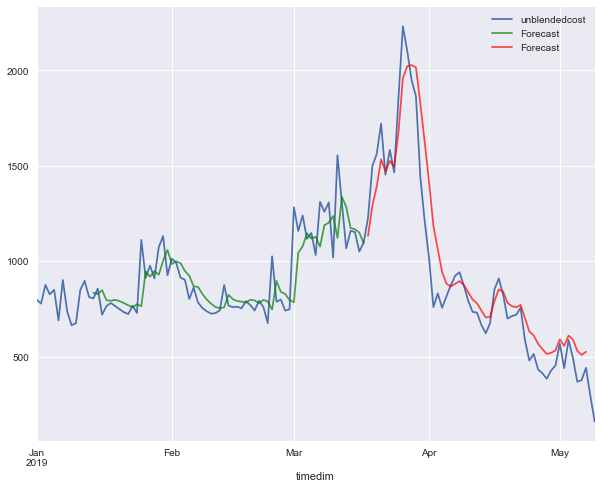

in sample
MAPE 17.65676942205133
rmse 129.62546440974904
out of sample
mape 40.11076496200875
rmse 156.53944877233243
[13, 16, 'relu', 0.001]
Epoch 1/1000
63/63 [==============================] - 3s 42ms/sample - loss: 0.6617 - mean_squared_error: 0.6617
Epoch 2/1000
63/63 [==============================] - 0s 823us/sample - loss: 0.5260 - mean_squared_error: 0.5260
Epoch 3/1000
63/63 [==============================] - 0s 807us/sample - loss: 0.3883 - mean_squared_error: 0.3883
Epoch 4/1000
63/63 [==============================] - 0s 918us/sample - loss: 0.2564 - mean_squared_error: 0.2564
Epoch 5/1000
63/63 [==============================] - 0s 617us/sample - loss: 0.1511 - mean_squared_error: 0.1511
Epoch 6/1000
63/63 [==============================] - 0s 902us/sample - loss: 0.1266 - mean_squared_error: 0.1266
Epoch 7/1000
63/63 [==============================] - 0s 934us/sample - loss: 0.1238 - mean_squared_error: 0.1238
Epoch 8/1000
63/63 [==============================] - 0s 918u

63/63 [==============================] - 0s 744us/sample - loss: 0.0195 - mean_squared_error: 0.0195
Epoch 71/1000
63/63 [==============================] - 0s 712us/sample - loss: 0.0193 - mean_squared_error: 0.0193
Epoch 72/1000
63/63 [==============================] - 0s 728us/sample - loss: 0.0193 - mean_squared_error: 0.0193
Epoch 73/1000
63/63 [==============================] - 0s 1ms/sample - loss: 0.0192 - mean_squared_error: 0.0192
Epoch 74/1000
63/63 [==============================] - 0s 776us/sample - loss: 0.0190 - mean_squared_error: 0.0190
Epoch 75/1000
63/63 [==============================] - 0s 823us/sample - loss: 0.0190 - mean_squared_error: 0.0190
Epoch 76/1000
63/63 [==============================] - 0s 997us/sample - loss: 0.0189 - mean_squared_error: 0.0189
Epoch 77/1000
63/63 [==============================] - 0s 728us/sample - loss: 0.0188 - mean_squared_error: 0.0188
Epoch 78/1000
63/63 [==============================] - 0s 807us/sample - loss: 0.0187 - mean_squ

63/63 [==============================] - 0s 665us/sample - loss: 0.0161 - mean_squared_error: 0.0161
Epoch 142/1000
63/63 [==============================] - 0s 744us/sample - loss: 0.0162 - mean_squared_error: 0.0162
Epoch 143/1000
63/63 [==============================] - 0s 1ms/sample - loss: 0.0160 - mean_squared_error: 0.0160
Epoch 144/1000
63/63 [==============================] - 0s 792us/sample - loss: 0.0160 - mean_squared_error: 0.0160
Epoch 145/1000
63/63 [==============================] - 0s 744us/sample - loss: 0.0160 - mean_squared_error: 0.0160
Epoch 146/1000
63/63 [==============================] - 0s 887us/sample - loss: 0.0160 - mean_squared_error: 0.0160
Epoch 147/1000
63/63 [==============================] - 0s 744us/sample - loss: 0.0160 - mean_squared_error: 0.0160
Epoch 148/1000
63/63 [==============================] - 0s 665us/sample - loss: 0.0159 - mean_squared_error: 0.0159
Epoch 149/1000
63/63 [==============================] - 0s 871us/sample - loss: 0.0159 - 

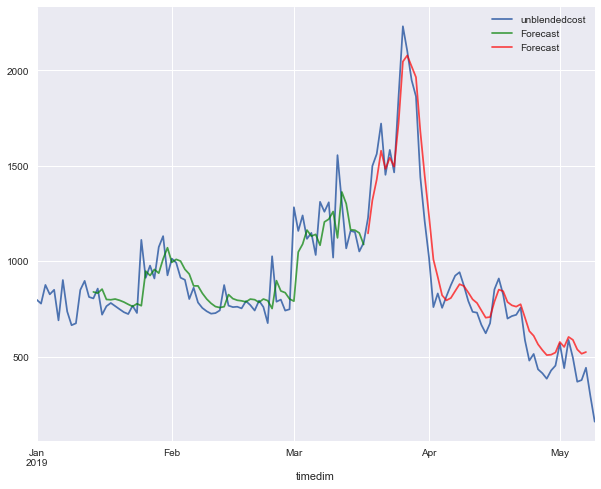

in sample
MAPE 17.7634478301327
rmse 130.42508207114437
out of sample
mape 38.96714017361731
rmse 110.76398209342022
[13, 16, 'relu', 0.003]
Epoch 1/1000
63/63 [==============================] - 3s 42ms/sample - loss: 0.8979 - mean_squared_error: 0.8979
Epoch 2/1000
63/63 [==============================] - 0s 839us/sample - loss: 0.5219 - mean_squared_error: 0.5219
Epoch 3/1000
63/63 [==============================] - 0s 792us/sample - loss: 0.2405 - mean_squared_error: 0.2405
Epoch 4/1000
63/63 [==============================] - 0s 823us/sample - loss: 0.1853 - mean_squared_error: 0.1853
Epoch 5/1000
63/63 [==============================] - 0s 776us/sample - loss: 0.1061 - mean_squared_error: 0.1061
Epoch 6/1000
63/63 [==============================] - 0s 855us/sample - loss: 0.0968 - mean_squared_error: 0.0968
Epoch 7/1000
63/63 [==============================] - 0s 839us/sample - loss: 0.0769 - mean_squared_error: 0.0769
Epoch 8/1000
63/63 [==============================] - 0s 855us

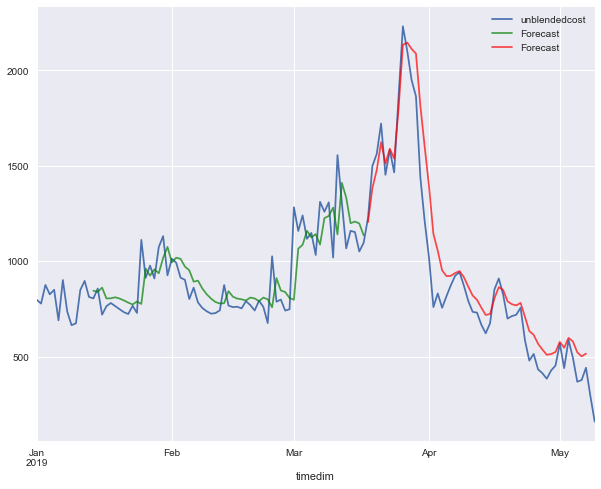

in sample
MAPE 18.287924655560623
rmse 134.0682021420635
out of sample
mape 41.234456767689956
rmse 143.3301240189532
[13, 16, 'relu', 0.01]
Epoch 1/1000
63/63 [==============================] - 3s 50ms/sample - loss: 0.7055 - mean_squared_error: 0.7055
Epoch 2/1000
63/63 [==============================] - 0s 871us/sample - loss: 0.6924 - mean_squared_error: 0.6924
Epoch 3/1000
63/63 [==============================] - 0s 823us/sample - loss: 0.6796 - mean_squared_error: 0.6796
Epoch 4/1000
63/63 [==============================] - 0s 981us/sample - loss: 0.6668 - mean_squared_error: 0.6668
Epoch 5/1000
63/63 [==============================] - 0s 696us/sample - loss: 0.6542 - mean_squared_error: 0.6542
Epoch 6/1000
63/63 [==============================] - 0s 855us/sample - loss: 0.6416 - mean_squared_error: 0.6416
Epoch 7/1000
63/63 [==============================] - 0s 855us/sample - loss: 0.6292 - mean_squared_error: 0.6292
Epoch 8/1000
63/63 [==============================] - 0s 950us

63/63 [==============================] - 0s 791us/sample - loss: 0.1451 - mean_squared_error: 0.1451
Epoch 71/1000
63/63 [==============================] - 0s 792us/sample - loss: 0.1443 - mean_squared_error: 0.1443
Epoch 72/1000
63/63 [==============================] - 0s 744us/sample - loss: 0.1436 - mean_squared_error: 0.1436
Epoch 73/1000
63/63 [==============================] - 0s 934us/sample - loss: 0.1429 - mean_squared_error: 0.1429
Epoch 74/1000
63/63 [==============================] - 0s 807us/sample - loss: 0.1422 - mean_squared_error: 0.1422
Epoch 75/1000
63/63 [==============================] - 0s 871us/sample - loss: 0.1415 - mean_squared_error: 0.1415
Epoch 76/1000
63/63 [==============================] - 0s 855us/sample - loss: 0.1408 - mean_squared_error: 0.1408
Epoch 77/1000
63/63 [==============================] - 0s 934us/sample - loss: 0.1401 - mean_squared_error: 0.1401
Epoch 78/1000
63/63 [==============================] - 0s 776us/sample - loss: 0.1394 - mean_s

63/63 [==============================] - 0s 760us/sample - loss: 0.1032 - mean_squared_error: 0.1032
Epoch 142/1000
63/63 [==============================] - 0s 776us/sample - loss: 0.1027 - mean_squared_error: 0.1027
Epoch 143/1000
63/63 [==============================] - 0s 950us/sample - loss: 0.1022 - mean_squared_error: 0.1022
Epoch 144/1000
63/63 [==============================] - 0s 792us/sample - loss: 0.1017 - mean_squared_error: 0.1017
Epoch 145/1000
63/63 [==============================] - 0s 823us/sample - loss: 0.1012 - mean_squared_error: 0.1012
Epoch 146/1000
63/63 [==============================] - 0s 934us/sample - loss: 0.1008 - mean_squared_error: 0.1008
Epoch 147/1000
63/63 [==============================] - 0s 855us/sample - loss: 0.1003 - mean_squared_error: 0.1003
Epoch 148/1000
63/63 [==============================] - 0s 902us/sample - loss: 0.0998 - mean_squared_error: 0.0998
Epoch 149/1000
63/63 [==============================] - 0s 886us/sample - loss: 0.0993 

63/63 [==============================] - 0s 792us/sample - loss: 0.0743 - mean_squared_error: 0.0743
Epoch 212/1000
63/63 [==============================] - 0s 807us/sample - loss: 0.0740 - mean_squared_error: 0.0740
Epoch 213/1000
63/63 [==============================] - 0s 855us/sample - loss: 0.0737 - mean_squared_error: 0.0737
Epoch 214/1000
63/63 [==============================] - 0s 807us/sample - loss: 0.0734 - mean_squared_error: 0.0734
Epoch 215/1000
63/63 [==============================] - 0s 918us/sample - loss: 0.0731 - mean_squared_error: 0.0731
Epoch 216/1000
63/63 [==============================] - 0s 871us/sample - loss: 0.0728 - mean_squared_error: 0.0728
Epoch 217/1000
63/63 [==============================] - 0s 807us/sample - loss: 0.0725 - mean_squared_error: 0.0725
Epoch 218/1000
63/63 [==============================] - 0s 950us/sample - loss: 0.0722 - mean_squared_error: 0.0722
Epoch 219/1000
63/63 [==============================] - 0s 918us/sample - loss: 0.0719 

63/63 [==============================] - 0s 839us/sample - loss: 0.0584 - mean_squared_error: 0.0584
Epoch 282/1000
63/63 [==============================] - 0s 807us/sample - loss: 0.0583 - mean_squared_error: 0.0583
Epoch 283/1000
63/63 [==============================] - 0s 807us/sample - loss: 0.0581 - mean_squared_error: 0.0581
Epoch 284/1000
63/63 [==============================] - 0s 855us/sample - loss: 0.0580 - mean_squared_error: 0.0580
Epoch 285/1000
63/63 [==============================] - 0s 807us/sample - loss: 0.0578 - mean_squared_error: 0.0578
Epoch 286/1000
63/63 [==============================] - 0s 1ms/sample - loss: 0.0576 - mean_squared_error: 0.0576
Epoch 287/1000
63/63 [==============================] - 0s 966us/sample - loss: 0.0575 - mean_squared_error: 0.0575
Epoch 288/1000
63/63 [==============================] - 0s 887us/sample - loss: 0.0573 - mean_squared_error: 0.0573
Epoch 289/1000
63/63 [==============================] - 0s 728us/sample - loss: 0.0572 - 

63/63 [==============================] - 0s 792us/sample - loss: 0.0493 - mean_squared_error: 0.0493
Epoch 352/1000
63/63 [==============================] - 0s 776us/sample - loss: 0.0491 - mean_squared_error: 0.0491
Epoch 353/1000
63/63 [==============================] - 0s 776us/sample - loss: 0.0490 - mean_squared_error: 0.0490
Epoch 354/1000
63/63 [==============================] - 0s 728us/sample - loss: 0.0489 - mean_squared_error: 0.0489
Epoch 355/1000
63/63 [==============================] - 0s 776us/sample - loss: 0.0488 - mean_squared_error: 0.0488
Epoch 356/1000
63/63 [==============================] - 0s 887us/sample - loss: 0.0487 - mean_squared_error: 0.0487
Epoch 357/1000
63/63 [==============================] - 0s 728us/sample - loss: 0.0486 - mean_squared_error: 0.0486
Epoch 358/1000
63/63 [==============================] - 0s 902us/sample - loss: 0.0485 - mean_squared_error: 0.0485
Epoch 359/1000
63/63 [==============================] - 0s 871us/sample - loss: 0.0484 

63/63 [==============================] - 0s 776us/sample - loss: 0.0423 - mean_squared_error: 0.0423
Epoch 422/1000
63/63 [==============================] - 0s 966us/sample - loss: 0.0422 - mean_squared_error: 0.0422
Epoch 423/1000
63/63 [==============================] - 0s 887us/sample - loss: 0.0421 - mean_squared_error: 0.0421
Epoch 424/1000
63/63 [==============================] - 0s 839us/sample - loss: 0.0420 - mean_squared_error: 0.0420
Epoch 425/1000
63/63 [==============================] - 0s 1ms/sample - loss: 0.0420 - mean_squared_error: 0.0420
Epoch 426/1000
63/63 [==============================] - 0s 744us/sample - loss: 0.0419 - mean_squared_error: 0.0419
Epoch 427/1000
63/63 [==============================] - 0s 823us/sample - loss: 0.0418 - mean_squared_error: 0.0418
Epoch 428/1000
63/63 [==============================] - 0s 886us/sample - loss: 0.0417 - mean_squared_error: 0.0417
Epoch 429/1000
63/63 [==============================] - 0s 791us/sample - loss: 0.0416 - 

63/63 [==============================] - 0s 728us/sample - loss: 0.0368 - mean_squared_error: 0.0368
Epoch 492/1000
63/63 [==============================] - 0s 776us/sample - loss: 0.0368 - mean_squared_error: 0.0368
Epoch 493/1000
63/63 [==============================] - 0s 792us/sample - loss: 0.0367 - mean_squared_error: 0.0367
Epoch 494/1000
63/63 [==============================] - 0s 997us/sample - loss: 0.0366 - mean_squared_error: 0.0366
Epoch 495/1000
63/63 [==============================] - 0s 792us/sample - loss: 0.0366 - mean_squared_error: 0.0366
Epoch 496/1000
63/63 [==============================] - 0s 855us/sample - loss: 0.0365 - mean_squared_error: 0.0365
Epoch 497/1000
63/63 [==============================] - 0s 950us/sample - loss: 0.0364 - mean_squared_error: 0.0364
Epoch 498/1000
63/63 [==============================] - 0s 887us/sample - loss: 0.0363 - mean_squared_error: 0.0363
Epoch 499/1000
63/63 [==============================] - 0s 902us/sample - loss: 0.0363 

63/63 [==============================] - 0s 887us/sample - loss: 0.0325 - mean_squared_error: 0.0325
Epoch 562/1000
63/63 [==============================] - 0s 839us/sample - loss: 0.0325 - mean_squared_error: 0.0325
Epoch 563/1000
63/63 [==============================] - 0s 918us/sample - loss: 0.0324 - mean_squared_error: 0.0324
Epoch 564/1000
63/63 [==============================] - 0s 966us/sample - loss: 0.0323 - mean_squared_error: 0.0323
Epoch 565/1000
63/63 [==============================] - 0s 1ms/sample - loss: 0.0323 - mean_squared_error: 0.0323
Epoch 566/1000
63/63 [==============================] - 0s 934us/sample - loss: 0.0322 - mean_squared_error: 0.0322
Epoch 567/1000
63/63 [==============================] - 0s 807us/sample - loss: 0.0322 - mean_squared_error: 0.0322
Epoch 568/1000
63/63 [==============================] - 0s 839us/sample - loss: 0.0321 - mean_squared_error: 0.0321
Epoch 569/1000
63/63 [==============================] - 0s 934us/sample - loss: 0.0321 - 

63/63 [==============================] - 0s 839us/sample - loss: 0.0291 - mean_squared_error: 0.0291
Epoch 632/1000
63/63 [==============================] - 0s 807us/sample - loss: 0.0291 - mean_squared_error: 0.0291
Epoch 633/1000
63/63 [==============================] - 0s 792us/sample - loss: 0.0290 - mean_squared_error: 0.0290
Epoch 634/1000
63/63 [==============================] - 0s 728us/sample - loss: 0.0290 - mean_squared_error: 0.0290
Epoch 635/1000
63/63 [==============================] - 0s 855us/sample - loss: 0.0289 - mean_squared_error: 0.0289
Epoch 636/1000
63/63 [==============================] - 0s 887us/sample - loss: 0.0289 - mean_squared_error: 0.0289
Epoch 637/1000
63/63 [==============================] - 0s 902us/sample - loss: 0.0289 - mean_squared_error: 0.0289
Epoch 638/1000
63/63 [==============================] - 0s 871us/sample - loss: 0.0288 - mean_squared_error: 0.0288
Epoch 639/1000
63/63 [==============================] - 0s 871us/sample - loss: 0.0288 

63/63 [==============================] - 0s 839us/sample - loss: 0.0264 - mean_squared_error: 0.0264
Epoch 702/1000
63/63 [==============================] - 0s 997us/sample - loss: 0.0264 - mean_squared_error: 0.0264
Epoch 703/1000
63/63 [==============================] - 0s 902us/sample - loss: 0.0264 - mean_squared_error: 0.0264
Epoch 704/1000
63/63 [==============================] - 0s 823us/sample - loss: 0.0263 - mean_squared_error: 0.0263
Epoch 705/1000
63/63 [==============================] - 0s 934us/sample - loss: 0.0263 - mean_squared_error: 0.0263
Epoch 706/1000
63/63 [==============================] - 0s 839us/sample - loss: 0.0263 - mean_squared_error: 0.0263
Epoch 707/1000
63/63 [==============================] - 0s 823us/sample - loss: 0.0262 - mean_squared_error: 0.0262
Epoch 708/1000
63/63 [==============================] - 0s 776us/sample - loss: 0.0262 - mean_squared_error: 0.0262
Epoch 709/1000
63/63 [==============================] - 0s 760us/sample - loss: 0.0262 

63/63 [==============================] - 0s 697us/sample - loss: 0.0242 - mean_squared_error: 0.0242
Epoch 772/1000
63/63 [==============================] - 0s 776us/sample - loss: 0.0242 - mean_squared_error: 0.0242
Epoch 773/1000
63/63 [==============================] - 0s 792us/sample - loss: 0.0242 - mean_squared_error: 0.0242
Epoch 774/1000
63/63 [==============================] - 0s 1ms/sample - loss: 0.0242 - mean_squared_error: 0.0242
Epoch 775/1000
63/63 [==============================] - 0s 1ms/sample - loss: 0.0241 - mean_squared_error: 0.0241
Epoch 776/1000
63/63 [==============================] - 0s 902us/sample - loss: 0.0241 - mean_squared_error: 0.0241
Epoch 777/1000
63/63 [==============================] - 0s 934us/sample - loss: 0.0241 - mean_squared_error: 0.0241
Epoch 778/1000
63/63 [==============================] - 0s 760us/sample - loss: 0.0240 - mean_squared_error: 0.0240
Epoch 779/1000
63/63 [==============================] - 0s 871us/sample - loss: 0.0240 - me

63/63 [==============================] - 0s 760us/sample - loss: 0.0224 - mean_squared_error: 0.0224
Epoch 842/1000
63/63 [==============================] - 0s 792us/sample - loss: 0.0224 - mean_squared_error: 0.0224
Epoch 843/1000
63/63 [==============================] - 0s 871us/sample - loss: 0.0224 - mean_squared_error: 0.0224
Epoch 844/1000
63/63 [==============================] - 0s 934us/sample - loss: 0.0224 - mean_squared_error: 0.0224
Epoch 845/1000
63/63 [==============================] - 0s 918us/sample - loss: 0.0224 - mean_squared_error: 0.0224
Epoch 846/1000
63/63 [==============================] - 0s 792us/sample - loss: 0.0223 - mean_squared_error: 0.0223
Epoch 847/1000
63/63 [==============================] - 0s 807us/sample - loss: 0.0223 - mean_squared_error: 0.0223
Epoch 848/1000
63/63 [==============================] - 0s 871us/sample - loss: 0.0223 - mean_squared_error: 0.0223
Epoch 849/1000
63/63 [==============================] - 0s 997us/sample - loss: 0.0223 

63/63 [==============================] - 0s 744us/sample - loss: 0.0210 - mean_squared_error: 0.0210
Epoch 912/1000
63/63 [==============================] - 0s 728us/sample - loss: 0.0209 - mean_squared_error: 0.0209
Epoch 913/1000
63/63 [==============================] - 0s 855us/sample - loss: 0.0209 - mean_squared_error: 0.0209
Epoch 914/1000
63/63 [==============================] - 0s 839us/sample - loss: 0.0209 - mean_squared_error: 0.0209
Epoch 915/1000
63/63 [==============================] - 0s 902us/sample - loss: 0.0209 - mean_squared_error: 0.0209
Epoch 916/1000
63/63 [==============================] - 0s 839us/sample - loss: 0.0209 - mean_squared_error: 0.0209
Epoch 917/1000
63/63 [==============================] - 0s 760us/sample - loss: 0.0208 - mean_squared_error: 0.0208
Epoch 918/1000
63/63 [==============================] - 0s 886us/sample - loss: 0.0208 - mean_squared_error: 0.0208
Epoch 919/1000
63/63 [==============================] - 0s 807us/sample - loss: 0.0208 

63/63 [==============================] - 0s 792us/sample - loss: 0.0197 - mean_squared_error: 0.0197
Epoch 982/1000
63/63 [==============================] - 0s 981us/sample - loss: 0.0197 - mean_squared_error: 0.0197
Epoch 983/1000
63/63 [==============================] - 0s 855us/sample - loss: 0.0197 - mean_squared_error: 0.0197
Epoch 984/1000
63/63 [==============================] - 0s 918us/sample - loss: 0.0197 - mean_squared_error: 0.0197
Epoch 985/1000
63/63 [==============================] - 0s 934us/sample - loss: 0.0197 - mean_squared_error: 0.0197
Epoch 986/1000
63/63 [==============================] - 0s 871us/sample - loss: 0.0196 - mean_squared_error: 0.0196
Epoch 987/1000
63/63 [==============================] - 0s 807us/sample - loss: 0.0196 - mean_squared_error: 0.0196
Epoch 988/1000
63/63 [==============================] - 0s 760us/sample - loss: 0.0196 - mean_squared_error: 0.0196
Epoch 989/1000
63/63 [==============================] - 0s 728us/sample - loss: 0.0196 

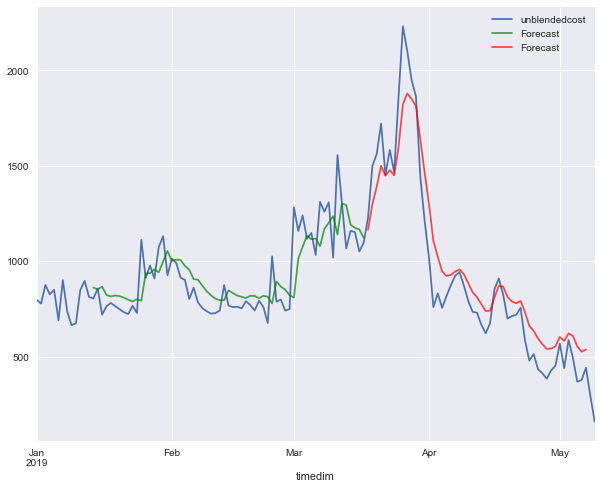

in sample
MAPE 17.438890003433112
rmse 132.18398974762172
out of sample
mape 40.04274363036483
rmse 152.0691614684104
[13, 32, 'tanh', 0.0001]
Epoch 1/1000
63/63 [==============================] - 3s 47ms/sample - loss: 0.8340 - mean_squared_error: 0.8340
Epoch 2/1000
63/63 [==============================] - 0s 839us/sample - loss: 0.7907 - mean_squared_error: 0.7907
Epoch 3/1000
63/63 [==============================] - 0s 918us/sample - loss: 0.7506 - mean_squared_error: 0.7506
Epoch 4/1000
63/63 [==============================] - 0s 887us/sample - loss: 0.7092 - mean_squared_error: 0.7092
Epoch 5/1000
63/63 [==============================] - 0s 776us/sample - loss: 0.6706 - mean_squared_error: 0.6706
Epoch 6/1000
63/63 [==============================] - 0s 966us/sample - loss: 0.6334 - mean_squared_error: 0.6334
Epoch 7/1000
63/63 [==============================] - 0s 902us/sample - loss: 0.5963 - mean_squared_error: 0.5963
Epoch 8/1000
63/63 [==============================] - 0s 918

63/63 [==============================] - 0s 776us/sample - loss: 0.0842 - mean_squared_error: 0.0842
Epoch 71/1000
63/63 [==============================] - 0s 792us/sample - loss: 0.0831 - mean_squared_error: 0.0831
Epoch 72/1000
63/63 [==============================] - 0s 728us/sample - loss: 0.0820 - mean_squared_error: 0.0820
Epoch 73/1000
63/63 [==============================] - 0s 1ms/sample - loss: 0.0810 - mean_squared_error: 0.0810
Epoch 74/1000
63/63 [==============================] - 0s 1ms/sample - loss: 0.0800 - mean_squared_error: 0.0800
Epoch 75/1000
63/63 [==============================] - 0s 855us/sample - loss: 0.0790 - mean_squared_error: 0.0790
Epoch 76/1000
63/63 [==============================] - 0s 839us/sample - loss: 0.0781 - mean_squared_error: 0.0781
Epoch 77/1000
63/63 [==============================] - 0s 744us/sample - loss: 0.0772 - mean_squared_error: 0.0772
Epoch 78/1000
63/63 [==============================] - 0s 839us/sample - loss: 0.0763 - mean_squar

63/63 [==============================] - 0s 950us/sample - loss: 0.0480 - mean_squared_error: 0.0480
Epoch 142/1000
63/63 [==============================] - 0s 918us/sample - loss: 0.0477 - mean_squared_error: 0.0477
Epoch 143/1000
63/63 [==============================] - 0s 712us/sample - loss: 0.0475 - mean_squared_error: 0.0475
Epoch 144/1000
63/63 [==============================] - 0s 728us/sample - loss: 0.0472 - mean_squared_error: 0.0472
Epoch 145/1000
63/63 [==============================] - 0s 839us/sample - loss: 0.0469 - mean_squared_error: 0.0469
Epoch 146/1000
63/63 [==============================] - 0s 791us/sample - loss: 0.0466 - mean_squared_error: 0.0466
Epoch 147/1000
63/63 [==============================] - 0s 839us/sample - loss: 0.0463 - mean_squared_error: 0.0463
Epoch 148/1000
63/63 [==============================] - 0s 807us/sample - loss: 0.0460 - mean_squared_error: 0.0460
Epoch 149/1000
63/63 [==============================] - 0s 823us/sample - loss: 0.0457 

63/63 [==============================] - 0s 728us/sample - loss: 0.0334 - mean_squared_error: 0.0334
Epoch 212/1000
63/63 [==============================] - 0s 697us/sample - loss: 0.0332 - mean_squared_error: 0.0332
Epoch 213/1000
63/63 [==============================] - 0s 776us/sample - loss: 0.0331 - mean_squared_error: 0.0331
Epoch 214/1000
63/63 [==============================] - 0s 871us/sample - loss: 0.0330 - mean_squared_error: 0.0330
Epoch 215/1000
63/63 [==============================] - 0s 760us/sample - loss: 0.0328 - mean_squared_error: 0.0328
Epoch 216/1000
63/63 [==============================] - 0s 839us/sample - loss: 0.0327 - mean_squared_error: 0.0327
Epoch 217/1000
63/63 [==============================] - 0s 744us/sample - loss: 0.0325 - mean_squared_error: 0.0325
Epoch 218/1000
63/63 [==============================] - 0s 744us/sample - loss: 0.0324 - mean_squared_error: 0.0324
Epoch 219/1000
63/63 [==============================] - 0s 776us/sample - loss: 0.0323 

63/63 [==============================] - 0s 855us/sample - loss: 0.0258 - mean_squared_error: 0.0258
Epoch 282/1000
63/63 [==============================] - 0s 665us/sample - loss: 0.0258 - mean_squared_error: 0.0258
Epoch 283/1000
63/63 [==============================] - 0s 855us/sample - loss: 0.0257 - mean_squared_error: 0.0257
Epoch 284/1000
63/63 [==============================] - 0s 1ms/sample - loss: 0.0256 - mean_squared_error: 0.0256
Epoch 285/1000
63/63 [==============================] - 0s 902us/sample - loss: 0.0255 - mean_squared_error: 0.0255
Epoch 286/1000
63/63 [==============================] - 0s 982us/sample - loss: 0.0254 - mean_squared_error: 0.0254
Epoch 287/1000
63/63 [==============================] - 0s 855us/sample - loss: 0.0254 - mean_squared_error: 0.0254
Epoch 288/1000
63/63 [==============================] - 0s 823us/sample - loss: 0.0253 - mean_squared_error: 0.0253
Epoch 289/1000
63/63 [==============================] - 0s 839us/sample - loss: 0.0252 - 

63/63 [==============================] - 0s 934us/sample - loss: 0.0213 - mean_squared_error: 0.0213
Epoch 352/1000
63/63 [==============================] - 0s 950us/sample - loss: 0.0212 - mean_squared_error: 0.0212
Epoch 353/1000
63/63 [==============================] - 0s 886us/sample - loss: 0.0212 - mean_squared_error: 0.0212
Epoch 354/1000
63/63 [==============================] - 0s 728us/sample - loss: 0.0211 - mean_squared_error: 0.0211
Epoch 355/1000
63/63 [==============================] - 0s 807us/sample - loss: 0.0211 - mean_squared_error: 0.0211
Epoch 356/1000
63/63 [==============================] - 0s 744us/sample - loss: 0.0210 - mean_squared_error: 0.0210
Epoch 357/1000
63/63 [==============================] - 0s 807us/sample - loss: 0.0210 - mean_squared_error: 0.0210
Epoch 358/1000
63/63 [==============================] - 0s 855us/sample - loss: 0.0209 - mean_squared_error: 0.0209
Epoch 359/1000
63/63 [==============================] - 0s 855us/sample - loss: 0.0209 

63/63 [==============================] - 0s 855us/sample - loss: 0.0185 - mean_squared_error: 0.0185
Epoch 422/1000
63/63 [==============================] - 0s 918us/sample - loss: 0.0185 - mean_squared_error: 0.0185
Epoch 423/1000
63/63 [==============================] - 0s 697us/sample - loss: 0.0185 - mean_squared_error: 0.0185
Epoch 424/1000
63/63 [==============================] - 0s 760us/sample - loss: 0.0185 - mean_squared_error: 0.0185
Epoch 425/1000
63/63 [==============================] - 0s 823us/sample - loss: 0.0184 - mean_squared_error: 0.0184
Epoch 426/1000
63/63 [==============================] - 0s 728us/sample - loss: 0.0184 - mean_squared_error: 0.0184
Epoch 427/1000
63/63 [==============================] - 0s 871us/sample - loss: 0.0184 - mean_squared_error: 0.0184
Epoch 428/1000
63/63 [==============================] - 0s 712us/sample - loss: 0.0184 - mean_squared_error: 0.0184
Epoch 429/1000
63/63 [==============================] - 0s 871us/sample - loss: 0.0183 

63/63 [==============================] - 0s 966us/sample - loss: 0.0170 - mean_squared_error: 0.0170
Epoch 492/1000
63/63 [==============================] - 0s 728us/sample - loss: 0.0170 - mean_squared_error: 0.0170
Epoch 493/1000
63/63 [==============================] - 0s 712us/sample - loss: 0.0170 - mean_squared_error: 0.0170
Epoch 494/1000
63/63 [==============================] - 0s 744us/sample - loss: 0.0170 - mean_squared_error: 0.0170
Epoch 495/1000
63/63 [==============================] - 0s 839us/sample - loss: 0.0170 - mean_squared_error: 0.0170
Epoch 496/1000
63/63 [==============================] - 0s 776us/sample - loss: 0.0169 - mean_squared_error: 0.0169
Epoch 497/1000
63/63 [==============================] - 0s 871us/sample - loss: 0.0169 - mean_squared_error: 0.0169
Epoch 498/1000
63/63 [==============================] - 0s 839us/sample - loss: 0.0169 - mean_squared_error: 0.0169
Epoch 499/1000
63/63 [==============================] - 0s 744us/sample - loss: 0.0169 

63/63 [==============================] - 0s 728us/sample - loss: 0.0162 - mean_squared_error: 0.0162
Epoch 562/1000
63/63 [==============================] - 0s 839us/sample - loss: 0.0162 - mean_squared_error: 0.0162
Epoch 563/1000
63/63 [==============================] - 0s 776us/sample - loss: 0.0162 - mean_squared_error: 0.0162
Epoch 564/1000
63/63 [==============================] - 0s 887us/sample - loss: 0.0162 - mean_squared_error: 0.0162
Epoch 565/1000
63/63 [==============================] - 0s 807us/sample - loss: 0.0162 - mean_squared_error: 0.0162
Epoch 566/1000
63/63 [==============================] - 0s 807us/sample - loss: 0.0162 - mean_squared_error: 0.0162
Epoch 567/1000
63/63 [==============================] - 0s 887us/sample - loss: 0.0162 - mean_squared_error: 0.0162
Epoch 568/1000
63/63 [==============================] - 0s 792us/sample - loss: 0.0162 - mean_squared_error: 0.0162
Epoch 569/1000
63/63 [==============================] - 0s 950us/sample - loss: 0.0162 

63/63 [==============================] - 0s 760us/sample - loss: 0.0158 - mean_squared_error: 0.0158
Epoch 632/1000
63/63 [==============================] - 0s 855us/sample - loss: 0.0158 - mean_squared_error: 0.0158
Epoch 633/1000
63/63 [==============================] - 0s 887us/sample - loss: 0.0158 - mean_squared_error: 0.0158
Epoch 634/1000
63/63 [==============================] - 0s 728us/sample - loss: 0.0158 - mean_squared_error: 0.0158
Epoch 635/1000
63/63 [==============================] - 0s 744us/sample - loss: 0.0158 - mean_squared_error: 0.0158
Epoch 636/1000
63/63 [==============================] - 0s 712us/sample - loss: 0.0158 - mean_squared_error: 0.0158
Epoch 637/1000
63/63 [==============================] - 0s 792us/sample - loss: 0.0158 - mean_squared_error: 0.0158
Epoch 638/1000
63/63 [==============================] - 0s 760us/sample - loss: 0.0158 - mean_squared_error: 0.0158
Epoch 639/1000
63/63 [==============================] - 0s 744us/sample - loss: 0.0158 

63/63 [==============================] - 0s 792us/sample - loss: 0.0156 - mean_squared_error: 0.0156
Epoch 702/1000
63/63 [==============================] - 0s 712us/sample - loss: 0.0156 - mean_squared_error: 0.0156
Epoch 703/1000
63/63 [==============================] - 0s 776us/sample - loss: 0.0156 - mean_squared_error: 0.0156
Epoch 704/1000
63/63 [==============================] - 0s 744us/sample - loss: 0.0156 - mean_squared_error: 0.0156
Epoch 705/1000
63/63 [==============================] - 0s 776us/sample - loss: 0.0156 - mean_squared_error: 0.0156
Epoch 706/1000
63/63 [==============================] - 0s 902us/sample - loss: 0.0156 - mean_squared_error: 0.0156
Epoch 707/1000
63/63 [==============================] - 0s 681us/sample - loss: 0.0156 - mean_squared_error: 0.0156
Epoch 708/1000
63/63 [==============================] - 0s 886us/sample - loss: 0.0156 - mean_squared_error: 0.0156
Epoch 709/1000
63/63 [==============================] - 0s 744us/sample - loss: 0.0156 

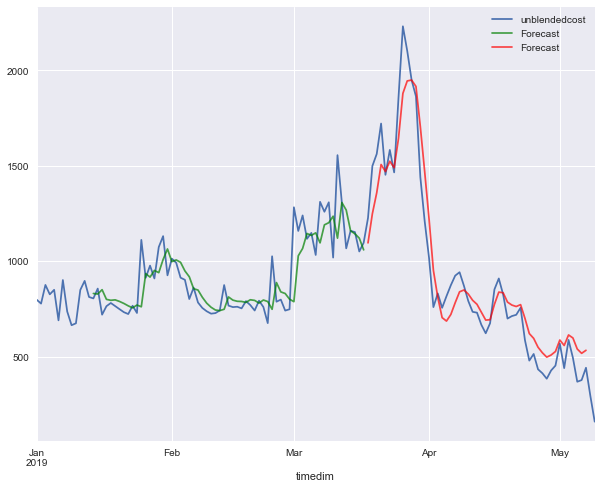

in sample
MAPE 17.59183745113016
rmse 128.0908865463923
out of sample
mape 37.02379068383945
rmse 130.80603597773356
[13, 32, 'tanh', 0.0003]
Epoch 1/1000
63/63 [==============================] - 3s 45ms/sample - loss: 0.8907 - mean_squared_error: 0.8907
Epoch 2/1000
63/63 [==============================] - 0s 760us/sample - loss: 0.7057 - mean_squared_error: 0.7057
Epoch 3/1000
63/63 [==============================] - 0s 902us/sample - loss: 0.5534 - mean_squared_error: 0.5534
Epoch 4/1000
63/63 [==============================] - 0s 776us/sample - loss: 0.4174 - mean_squared_error: 0.4174
Epoch 5/1000
63/63 [==============================] - 0s 934us/sample - loss: 0.3031 - mean_squared_error: 0.3031
Epoch 6/1000
63/63 [==============================] - 0s 776us/sample - loss: 0.2159 - mean_squared_error: 0.2159
Epoch 7/1000
63/63 [==============================] - 0s 807us/sample - loss: 0.1561 - mean_squared_error: 0.1561
Epoch 8/1000
63/63 [==============================] - 0s 776u

63/63 [==============================] - 0s 1ms/sample - loss: 0.0341 - mean_squared_error: 0.0341
Epoch 71/1000
63/63 [==============================] - 0s 744us/sample - loss: 0.0337 - mean_squared_error: 0.0337
Epoch 72/1000
63/63 [==============================] - 0s 744us/sample - loss: 0.0334 - mean_squared_error: 0.0334
Epoch 73/1000
63/63 [==============================] - 0s 744us/sample - loss: 0.0330 - mean_squared_error: 0.0330
Epoch 74/1000
63/63 [==============================] - 0s 744us/sample - loss: 0.0327 - mean_squared_error: 0.0327
Epoch 75/1000
63/63 [==============================] - 0s 744us/sample - loss: 0.0323 - mean_squared_error: 0.0323
Epoch 76/1000
63/63 [==============================] - 0s 744us/sample - loss: 0.0320 - mean_squared_error: 0.0320
Epoch 77/1000
63/63 [==============================] - 0s 744us/sample - loss: 0.0317 - mean_squared_error: 0.0317
Epoch 78/1000
63/63 [==============================] - 0s 744us/sample - loss: 0.0314 - mean_squ

63/63 [==============================] - 0s 855us/sample - loss: 0.0202 - mean_squared_error: 0.0202
Epoch 142/1000
63/63 [==============================] - 0s 871us/sample - loss: 0.0201 - mean_squared_error: 0.0201
Epoch 143/1000
63/63 [==============================] - 0s 728us/sample - loss: 0.0200 - mean_squared_error: 0.0200
Epoch 144/1000
63/63 [==============================] - 0s 792us/sample - loss: 0.0199 - mean_squared_error: 0.0199
Epoch 145/1000
63/63 [==============================] - 0s 839us/sample - loss: 0.0198 - mean_squared_error: 0.0198
Epoch 146/1000
63/63 [==============================] - 0s 776us/sample - loss: 0.0197 - mean_squared_error: 0.0197
Epoch 147/1000
63/63 [==============================] - 0s 950us/sample - loss: 0.0197 - mean_squared_error: 0.0197
Epoch 148/1000
63/63 [==============================] - 0s 792us/sample - loss: 0.0196 - mean_squared_error: 0.0196
Epoch 149/1000
63/63 [==============================] - 0s 744us/sample - loss: 0.0195 

63/63 [==============================] - 0s 681us/sample - loss: 0.0167 - mean_squared_error: 0.0167
Epoch 212/1000
63/63 [==============================] - 0s 902us/sample - loss: 0.0167 - mean_squared_error: 0.0167
Epoch 213/1000
63/63 [==============================] - 0s 855us/sample - loss: 0.0167 - mean_squared_error: 0.0167
Epoch 214/1000
63/63 [==============================] - 0s 760us/sample - loss: 0.0167 - mean_squared_error: 0.0167
Epoch 215/1000
63/63 [==============================] - 0s 934us/sample - loss: 0.0166 - mean_squared_error: 0.0166
Epoch 216/1000
63/63 [==============================] - 0s 902us/sample - loss: 0.0166 - mean_squared_error: 0.0166
Epoch 217/1000
63/63 [==============================] - 0s 1ms/sample - loss: 0.0166 - mean_squared_error: 0.0166
Epoch 218/1000
63/63 [==============================] - 0s 697us/sample - loss: 0.0166 - mean_squared_error: 0.0166
Epoch 219/1000
63/63 [==============================] - 0s 744us/sample - loss: 0.0165 - 

63/63 [==============================] - 0s 855us/sample - loss: 0.0159 - mean_squared_error: 0.0159
Epoch 282/1000
63/63 [==============================] - 0s 776us/sample - loss: 0.0159 - mean_squared_error: 0.0159
Epoch 283/1000
63/63 [==============================] - 0s 760us/sample - loss: 0.0158 - mean_squared_error: 0.0158
Epoch 284/1000
63/63 [==============================] - 0s 871us/sample - loss: 0.0158 - mean_squared_error: 0.0158
Epoch 285/1000
63/63 [==============================] - 0s 887us/sample - loss: 0.0159 - mean_squared_error: 0.0159
Epoch 286/1000
63/63 [==============================] - 0s 918us/sample - loss: 0.0158 - mean_squared_error: 0.0158
Epoch 287/1000
63/63 [==============================] - 0s 839us/sample - loss: 0.0159 - mean_squared_error: 0.0159
Epoch 288/1000
63/63 [==============================] - 0s 792us/sample - loss: 0.0158 - mean_squared_error: 0.0158
Epoch 289/1000
63/63 [==============================] - 0s 886us/sample - loss: 0.0158 

63/63 [==============================] - 0s 855us/sample - loss: 0.0156 - mean_squared_error: 0.0156
Epoch 352/1000
63/63 [==============================] - 0s 776us/sample - loss: 0.0156 - mean_squared_error: 0.0156
Epoch 353/1000
63/63 [==============================] - 0s 760us/sample - loss: 0.0156 - mean_squared_error: 0.0156
Epoch 354/1000
63/63 [==============================] - 0s 776us/sample - loss: 0.0156 - mean_squared_error: 0.0156
Epoch 355/1000
63/63 [==============================] - 0s 792us/sample - loss: 0.0156 - mean_squared_error: 0.0156
Epoch 356/1000
63/63 [==============================] - 0s 855us/sample - loss: 0.0156 - mean_squared_error: 0.0156
Epoch 357/1000
63/63 [==============================] - 0s 807us/sample - loss: 0.0156 - mean_squared_error: 0.0156
Epoch 358/1000
63/63 [==============================] - 0s 823us/sample - loss: 0.0156 - mean_squared_error: 0.0156
Epoch 359/1000
63/63 [==============================] - 0s 997us/sample - loss: 0.0157 

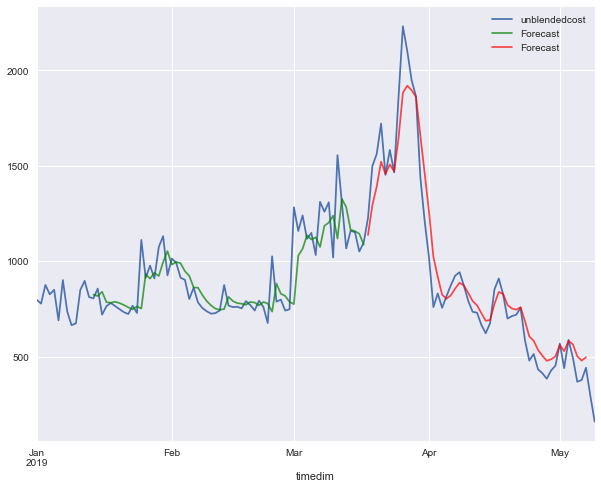

in sample
MAPE 17.6799704317483
rmse 130.55760959766116
out of sample
mape 39.44967195315831
rmse 119.63700050533592
[13, 32, 'tanh', 0.001]
Epoch 1/1000
63/63 [==============================] - 3s 46ms/sample - loss: 1.0020 - mean_squared_error: 1.0020
Epoch 2/1000
63/63 [==============================] - 0s 839us/sample - loss: 0.5632 - mean_squared_error: 0.5632
Epoch 3/1000
63/63 [==============================] - 0s 887us/sample - loss: 0.2492 - mean_squared_error: 0.2492
Epoch 4/1000
63/63 [==============================] - 0s 760us/sample - loss: 0.1543 - mean_squared_error: 0.1543
Epoch 5/1000
63/63 [==============================] - 0s 918us/sample - loss: 0.1675 - mean_squared_error: 0.1675
Epoch 6/1000
63/63 [==============================] - 0s 807us/sample - loss: 0.1143 - mean_squared_error: 0.1143
Epoch 7/1000
63/63 [==============================] - 0s 839us/sample - loss: 0.0946 - mean_squared_error: 0.0946
Epoch 8/1000
63/63 [==============================] - 0s 791us

63/63 [==============================] - 0s 776us/sample - loss: 0.0161 - mean_squared_error: 0.0161
Epoch 71/1000
63/63 [==============================] - 0s 823us/sample - loss: 0.0161 - mean_squared_error: 0.0161
Epoch 72/1000
63/63 [==============================] - 0s 902us/sample - loss: 0.0160 - mean_squared_error: 0.0160
Epoch 73/1000
63/63 [==============================] - 0s 902us/sample - loss: 0.0160 - mean_squared_error: 0.0160
Epoch 74/1000
63/63 [==============================] - 0s 918us/sample - loss: 0.0159 - mean_squared_error: 0.0159
Epoch 75/1000
63/63 [==============================] - 0s 871us/sample - loss: 0.0160 - mean_squared_error: 0.0160
Epoch 76/1000
63/63 [==============================] - 0s 839us/sample - loss: 0.0160 - mean_squared_error: 0.0160
Epoch 77/1000
63/63 [==============================] - 0s 1ms/sample - loss: 0.0159 - mean_squared_error: 0.0159
Epoch 78/1000
63/63 [==============================] - 0s 697us/sample - loss: 0.0158 - mean_squ

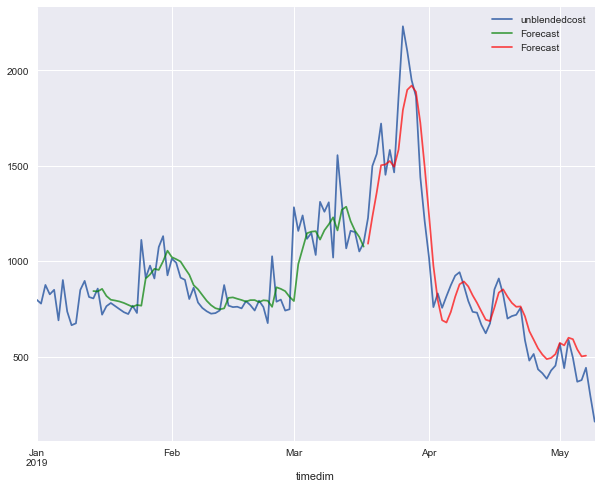

in sample
MAPE 17.390897660247624
rmse 127.27686489922795
out of sample
mape 37.74020967321082
rmse 142.35411906533847
[13, 32, 'tanh', 0.003]
Epoch 1/1000
63/63 [==============================] - 3s 49ms/sample - loss: 0.5912 - mean_squared_error: 0.5912
Epoch 2/1000
63/63 [==============================] - 0s 839us/sample - loss: 0.1436 - mean_squared_error: 0.1436
Epoch 3/1000
63/63 [==============================] - 0s 744us/sample - loss: 0.0707 - mean_squared_error: 0.0707
Epoch 4/1000
63/63 [==============================] - 0s 807us/sample - loss: 0.0690 - mean_squared_error: 0.0690
Epoch 5/1000
63/63 [==============================] - 0s 966us/sample - loss: 0.0472 - mean_squared_error: 0.0472
Epoch 6/1000
63/63 [==============================] - 0s 807us/sample - loss: 0.0354 - mean_squared_error: 0.0354
Epoch 7/1000
63/63 [==============================] - 0s 902us/sample - loss: 0.0371 - mean_squared_error: 0.0371
Epoch 8/1000
63/63 [==============================] - 0s 918

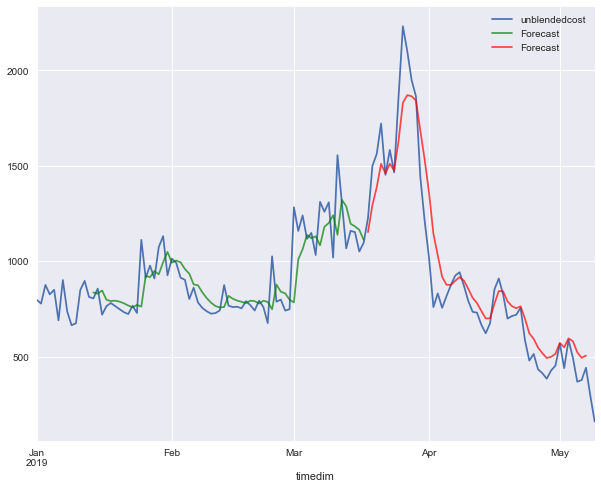

in sample
MAPE 17.455216294484806
rmse 130.17002125136239
out of sample
mape 39.80910755702723
rmse 146.44211326339766
[13, 32, 'tanh', 0.01]
Epoch 1/1000
63/63 [==============================] - 3s 46ms/sample - loss: 0.7429 - mean_squared_error: 0.7429
Epoch 2/1000
63/63 [==============================] - 0s 760us/sample - loss: 0.7357 - mean_squared_error: 0.7357
Epoch 3/1000
63/63 [==============================] - 0s 934us/sample - loss: 0.7287 - mean_squared_error: 0.7287
Epoch 4/1000
63/63 [==============================] - 0s 855us/sample - loss: 0.7218 - mean_squared_error: 0.7218
Epoch 5/1000
63/63 [==============================] - 0s 728us/sample - loss: 0.7148 - mean_squared_error: 0.7148
Epoch 6/1000
63/63 [==============================] - 0s 792us/sample - loss: 0.7078 - mean_squared_error: 0.7078
Epoch 7/1000
63/63 [==============================] - 0s 839us/sample - loss: 0.7010 - mean_squared_error: 0.7010
Epoch 8/1000
63/63 [==============================] - 0s 792u

63/63 [==============================] - 0s 839us/sample - loss: 0.2471 - mean_squared_error: 0.2471
Epoch 71/1000
63/63 [==============================] - 0s 760us/sample - loss: 0.2412 - mean_squared_error: 0.2412
Epoch 72/1000
63/63 [==============================] - 0s 886us/sample - loss: 0.2358 - mean_squared_error: 0.2358
Epoch 73/1000
63/63 [==============================] - 0s 1ms/sample - loss: 0.2309 - mean_squared_error: 0.2309
Epoch 74/1000
63/63 [==============================] - 0s 1ms/sample - loss: 0.2265 - mean_squared_error: 0.2265
Epoch 75/1000
63/63 [==============================] - 0s 871us/sample - loss: 0.2225 - mean_squared_error: 0.2225
Epoch 76/1000
63/63 [==============================] - 0s 1ms/sample - loss: 0.2190 - mean_squared_error: 0.2190
Epoch 77/1000
63/63 [==============================] - 0s 792us/sample - loss: 0.2160 - mean_squared_error: 0.2160
Epoch 78/1000
63/63 [==============================] - 0s 871us/sample - loss: 0.2133 - mean_squared

63/63 [==============================] - 0s 744us/sample - loss: 0.1283 - mean_squared_error: 0.1283
Epoch 142/1000
63/63 [==============================] - 0s 776us/sample - loss: 0.1277 - mean_squared_error: 0.1277
Epoch 143/1000
63/63 [==============================] - 0s 792us/sample - loss: 0.1271 - mean_squared_error: 0.1271
Epoch 144/1000
63/63 [==============================] - 0s 1ms/sample - loss: 0.1265 - mean_squared_error: 0.1265
Epoch 145/1000
63/63 [==============================] - 0s 807us/sample - loss: 0.1259 - mean_squared_error: 0.1259
Epoch 146/1000
63/63 [==============================] - 0s 918us/sample - loss: 0.1253 - mean_squared_error: 0.1253
Epoch 147/1000
63/63 [==============================] - 0s 807us/sample - loss: 0.1247 - mean_squared_error: 0.1247
Epoch 148/1000
63/63 [==============================] - 0s 823us/sample - loss: 0.1242 - mean_squared_error: 0.1242
Epoch 149/1000
63/63 [==============================] - 0s 918us/sample - loss: 0.1236 - 

63/63 [==============================] - 0s 728us/sample - loss: 0.0970 - mean_squared_error: 0.0970
Epoch 212/1000
63/63 [==============================] - 0s 728us/sample - loss: 0.0966 - mean_squared_error: 0.0966
Epoch 213/1000
63/63 [==============================] - 0s 839us/sample - loss: 0.0963 - mean_squared_error: 0.0963
Epoch 214/1000
63/63 [==============================] - 0s 728us/sample - loss: 0.0960 - mean_squared_error: 0.0960
Epoch 215/1000
63/63 [==============================] - 0s 902us/sample - loss: 0.0957 - mean_squared_error: 0.0957
Epoch 216/1000
63/63 [==============================] - 0s 696us/sample - loss: 0.0953 - mean_squared_error: 0.0953
Epoch 217/1000
63/63 [==============================] - 0s 839us/sample - loss: 0.0950 - mean_squared_error: 0.0950
Epoch 218/1000
63/63 [==============================] - 0s 760us/sample - loss: 0.0947 - mean_squared_error: 0.0947
Epoch 219/1000
63/63 [==============================] - 0s 792us/sample - loss: 0.0944 

63/63 [==============================] - 0s 760us/sample - loss: 0.0780 - mean_squared_error: 0.0780
Epoch 282/1000
63/63 [==============================] - 0s 823us/sample - loss: 0.0777 - mean_squared_error: 0.0777
Epoch 283/1000
63/63 [==============================] - 0s 902us/sample - loss: 0.0775 - mean_squared_error: 0.0775
Epoch 284/1000
63/63 [==============================] - 0s 902us/sample - loss: 0.0773 - mean_squared_error: 0.0773
Epoch 285/1000
63/63 [==============================] - 0s 918us/sample - loss: 0.0771 - mean_squared_error: 0.0771
Epoch 286/1000
63/63 [==============================] - 0s 902us/sample - loss: 0.0769 - mean_squared_error: 0.0769
Epoch 287/1000
63/63 [==============================] - 0s 807us/sample - loss: 0.0766 - mean_squared_error: 0.0766
Epoch 288/1000
63/63 [==============================] - 0s 886us/sample - loss: 0.0764 - mean_squared_error: 0.0764
Epoch 289/1000
63/63 [==============================] - 0s 760us/sample - loss: 0.0762 

63/63 [==============================] - 0s 839us/sample - loss: 0.0648 - mean_squared_error: 0.0648
Epoch 352/1000
63/63 [==============================] - 0s 839us/sample - loss: 0.0647 - mean_squared_error: 0.0647
Epoch 353/1000
63/63 [==============================] - 0s 807us/sample - loss: 0.0645 - mean_squared_error: 0.0645
Epoch 354/1000
63/63 [==============================] - 0s 823us/sample - loss: 0.0643 - mean_squared_error: 0.0643
Epoch 355/1000
63/63 [==============================] - 0s 791us/sample - loss: 0.0642 - mean_squared_error: 0.0642
Epoch 356/1000
63/63 [==============================] - 0s 855us/sample - loss: 0.0640 - mean_squared_error: 0.0640
Epoch 357/1000
63/63 [==============================] - 0s 1ms/sample - loss: 0.0639 - mean_squared_error: 0.0639
Epoch 358/1000
63/63 [==============================] - 0s 982us/sample - loss: 0.0637 - mean_squared_error: 0.0637
Epoch 359/1000
63/63 [==============================] - 0s 855us/sample - loss: 0.0635 - 

63/63 [==============================] - 0s 776us/sample - loss: 0.0547 - mean_squared_error: 0.0547
Epoch 422/1000
63/63 [==============================] - 0s 839us/sample - loss: 0.0546 - mean_squared_error: 0.0546
Epoch 423/1000
63/63 [==============================] - 0s 1ms/sample - loss: 0.0545 - mean_squared_error: 0.0545
Epoch 424/1000
63/63 [==============================] - 0s 823us/sample - loss: 0.0543 - mean_squared_error: 0.0543
Epoch 425/1000
63/63 [==============================] - 0s 886us/sample - loss: 0.0542 - mean_squared_error: 0.0542
Epoch 426/1000
63/63 [==============================] - 0s 839us/sample - loss: 0.0541 - mean_squared_error: 0.0541
Epoch 427/1000
63/63 [==============================] - 0s 855us/sample - loss: 0.0540 - mean_squared_error: 0.0540
Epoch 428/1000
63/63 [==============================] - 0s 934us/sample - loss: 0.0538 - mean_squared_error: 0.0538
Epoch 429/1000
63/63 [==============================] - 0s 839us/sample - loss: 0.0537 - 

63/63 [==============================] - 0s 1ms/sample - loss: 0.0469 - mean_squared_error: 0.0469
Epoch 492/1000
63/63 [==============================] - 0s 760us/sample - loss: 0.0468 - mean_squared_error: 0.0468
Epoch 493/1000
63/63 [==============================] - 0s 807us/sample - loss: 0.0467 - mean_squared_error: 0.0467
Epoch 494/1000
63/63 [==============================] - 0s 871us/sample - loss: 0.0466 - mean_squared_error: 0.0466
Epoch 495/1000
63/63 [==============================] - 0s 934us/sample - loss: 0.0465 - mean_squared_error: 0.0465
Epoch 496/1000
63/63 [==============================] - 0s 887us/sample - loss: 0.0464 - mean_squared_error: 0.0464
Epoch 497/1000
63/63 [==============================] - 0s 807us/sample - loss: 0.0464 - mean_squared_error: 0.0464
Epoch 498/1000
63/63 [==============================] - 0s 855us/sample - loss: 0.0463 - mean_squared_error: 0.0463
Epoch 499/1000
63/63 [==============================] - 0s 950us/sample - loss: 0.0462 - 

63/63 [==============================] - 0s 839us/sample - loss: 0.0411 - mean_squared_error: 0.0411
Epoch 562/1000
63/63 [==============================] - 0s 855us/sample - loss: 0.0410 - mean_squared_error: 0.0410
Epoch 563/1000
63/63 [==============================] - 0s 981us/sample - loss: 0.0410 - mean_squared_error: 0.0410
Epoch 564/1000
63/63 [==============================] - 0s 776us/sample - loss: 0.0409 - mean_squared_error: 0.0409
Epoch 565/1000
63/63 [==============================] - 0s 887us/sample - loss: 0.0408 - mean_squared_error: 0.0408
Epoch 566/1000
63/63 [==============================] - 0s 871us/sample - loss: 0.0408 - mean_squared_error: 0.0408
Epoch 567/1000
63/63 [==============================] - 0s 823us/sample - loss: 0.0407 - mean_squared_error: 0.0407
Epoch 568/1000
63/63 [==============================] - 0s 981us/sample - loss: 0.0406 - mean_squared_error: 0.0406
Epoch 569/1000
63/63 [==============================] - 0s 728us/sample - loss: 0.0405 

63/63 [==============================] - 0s 823us/sample - loss: 0.0366 - mean_squared_error: 0.0366
Epoch 632/1000
63/63 [==============================] - 0s 823us/sample - loss: 0.0365 - mean_squared_error: 0.0365
Epoch 633/1000
63/63 [==============================] - 0s 823us/sample - loss: 0.0364 - mean_squared_error: 0.0364
Epoch 634/1000
63/63 [==============================] - 0s 839us/sample - loss: 0.0364 - mean_squared_error: 0.0364
Epoch 635/1000
63/63 [==============================] - 0s 982us/sample - loss: 0.0363 - mean_squared_error: 0.0363
Epoch 636/1000
63/63 [==============================] - 0s 871us/sample - loss: 0.0363 - mean_squared_error: 0.0363
Epoch 637/1000
63/63 [==============================] - 0s 887us/sample - loss: 0.0362 - mean_squared_error: 0.0362
Epoch 638/1000
63/63 [==============================] - 0s 871us/sample - loss: 0.0361 - mean_squared_error: 0.0361
Epoch 639/1000
63/63 [==============================] - 0s 918us/sample - loss: 0.0361 

63/63 [==============================] - 0s 807us/sample - loss: 0.0327 - mean_squared_error: 0.0327
Epoch 702/1000
63/63 [==============================] - 0s 839us/sample - loss: 0.0327 - mean_squared_error: 0.0327
Epoch 703/1000
63/63 [==============================] - 0s 950us/sample - loss: 0.0326 - mean_squared_error: 0.0326
Epoch 704/1000
63/63 [==============================] - 0s 839us/sample - loss: 0.0326 - mean_squared_error: 0.0326
Epoch 705/1000
63/63 [==============================] - 0s 997us/sample - loss: 0.0325 - mean_squared_error: 0.0325
Epoch 706/1000
63/63 [==============================] - 0s 918us/sample - loss: 0.0325 - mean_squared_error: 0.0325
Epoch 707/1000
63/63 [==============================] - 0s 902us/sample - loss: 0.0324 - mean_squared_error: 0.0324
Epoch 708/1000
63/63 [==============================] - 0s 855us/sample - loss: 0.0324 - mean_squared_error: 0.0324
Epoch 709/1000
63/63 [==============================] - 0s 887us/sample - loss: 0.0323 

63/63 [==============================] - 0s 807us/sample - loss: 0.0296 - mean_squared_error: 0.0296
Epoch 772/1000
63/63 [==============================] - 0s 791us/sample - loss: 0.0295 - mean_squared_error: 0.0295
Epoch 773/1000
63/63 [==============================] - 0s 760us/sample - loss: 0.0295 - mean_squared_error: 0.0295
Epoch 774/1000
63/63 [==============================] - 0s 902us/sample - loss: 0.0295 - mean_squared_error: 0.0295
Epoch 775/1000
63/63 [==============================] - 0s 744us/sample - loss: 0.0294 - mean_squared_error: 0.0294
Epoch 776/1000
63/63 [==============================] - 0s 823us/sample - loss: 0.0294 - mean_squared_error: 0.0294
Epoch 777/1000
63/63 [==============================] - 0s 886us/sample - loss: 0.0293 - mean_squared_error: 0.0293
Epoch 778/1000
63/63 [==============================] - 0s 807us/sample - loss: 0.0293 - mean_squared_error: 0.0293
Epoch 779/1000
63/63 [==============================] - 0s 792us/sample - loss: 0.0292 

63/63 [==============================] - 0s 760us/sample - loss: 0.0270 - mean_squared_error: 0.0270
Epoch 842/1000
63/63 [==============================] - 0s 744us/sample - loss: 0.0270 - mean_squared_error: 0.0270
Epoch 843/1000
63/63 [==============================] - 0s 823us/sample - loss: 0.0270 - mean_squared_error: 0.0270
Epoch 844/1000
63/63 [==============================] - 0s 855us/sample - loss: 0.0269 - mean_squared_error: 0.0269
Epoch 845/1000
63/63 [==============================] - 0s 823us/sample - loss: 0.0269 - mean_squared_error: 0.0269
Epoch 846/1000
63/63 [==============================] - 0s 871us/sample - loss: 0.0268 - mean_squared_error: 0.0268
Epoch 847/1000
63/63 [==============================] - 0s 839us/sample - loss: 0.0268 - mean_squared_error: 0.0268
Epoch 848/1000
63/63 [==============================] - 0s 950us/sample - loss: 0.0268 - mean_squared_error: 0.0268
Epoch 849/1000
63/63 [==============================] - 0s 776us/sample - loss: 0.0267 

63/63 [==============================] - 0s 807us/sample - loss: 0.0249 - mean_squared_error: 0.0249
Epoch 912/1000
63/63 [==============================] - 0s 871us/sample - loss: 0.0249 - mean_squared_error: 0.0249
Epoch 913/1000
63/63 [==============================] - 0s 839us/sample - loss: 0.0248 - mean_squared_error: 0.0248
Epoch 914/1000
63/63 [==============================] - 0s 887us/sample - loss: 0.0248 - mean_squared_error: 0.0248
Epoch 915/1000
63/63 [==============================] - 0s 871us/sample - loss: 0.0248 - mean_squared_error: 0.0248
Epoch 916/1000
63/63 [==============================] - 0s 871us/sample - loss: 0.0248 - mean_squared_error: 0.0248
Epoch 917/1000
63/63 [==============================] - 0s 839us/sample - loss: 0.0247 - mean_squared_error: 0.0247
Epoch 918/1000
63/63 [==============================] - 0s 1ms/sample - loss: 0.0247 - mean_squared_error: 0.0247
Epoch 919/1000
63/63 [==============================] - 0s 871us/sample - loss: 0.0247 - 

63/63 [==============================] - 0s 776us/sample - loss: 0.0232 - mean_squared_error: 0.0232
Epoch 982/1000
63/63 [==============================] - 0s 776us/sample - loss: 0.0231 - mean_squared_error: 0.0231
Epoch 983/1000
63/63 [==============================] - 0s 744us/sample - loss: 0.0231 - mean_squared_error: 0.0231
Epoch 984/1000
63/63 [==============================] - 0s 823us/sample - loss: 0.0231 - mean_squared_error: 0.0231
Epoch 985/1000
63/63 [==============================] - 0s 871us/sample - loss: 0.0231 - mean_squared_error: 0.0231
Epoch 986/1000
63/63 [==============================] - 0s 887us/sample - loss: 0.0231 - mean_squared_error: 0.0231
Epoch 987/1000
63/63 [==============================] - 0s 902us/sample - loss: 0.0230 - mean_squared_error: 0.0230
Epoch 988/1000
63/63 [==============================] - 0s 855us/sample - loss: 0.0230 - mean_squared_error: 0.0230
Epoch 989/1000
63/63 [==============================] - 0s 934us/sample - loss: 0.0230 

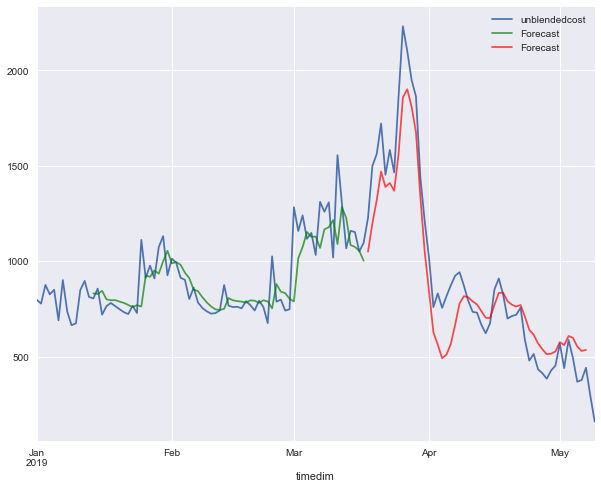

in sample
MAPE 17.218609877979855
rmse 129.7994363673668
out of sample
mape 35.23306371076318
rmse 164.04210103801535
[13, 32, 'relu', 0.0001]
Epoch 1/1000
63/63 [==============================] - 3s 47ms/sample - loss: 0.7767 - mean_squared_error: 0.7767
Epoch 2/1000
63/63 [==============================] - 0s 744us/sample - loss: 0.7564 - mean_squared_error: 0.7564
Epoch 3/1000
63/63 [==============================] - 0s 807us/sample - loss: 0.7375 - mean_squared_error: 0.7375
Epoch 4/1000
63/63 [==============================] - 0s 776us/sample - loss: 0.7200 - mean_squared_error: 0.7200
Epoch 5/1000
63/63 [==============================] - 0s 681us/sample - loss: 0.7036 - mean_squared_error: 0.7036
Epoch 6/1000
63/63 [==============================] - 0s 855us/sample - loss: 0.6872 - mean_squared_error: 0.6872
Epoch 7/1000
63/63 [==============================] - 0s 696us/sample - loss: 0.6714 - mean_squared_error: 0.6714
Epoch 8/1000
63/63 [==============================] - 0s 823

63/63 [==============================] - 0s 728us/sample - loss: 0.1035 - mean_squared_error: 0.1035
Epoch 71/1000
63/63 [==============================] - 0s 807us/sample - loss: 0.1021 - mean_squared_error: 0.1021
Epoch 72/1000
63/63 [==============================] - 0s 776us/sample - loss: 0.1008 - mean_squared_error: 0.1008
Epoch 73/1000
63/63 [==============================] - 0s 1ms/sample - loss: 0.0996 - mean_squared_error: 0.0996
Epoch 74/1000
63/63 [==============================] - 0s 728us/sample - loss: 0.0985 - mean_squared_error: 0.0985
Epoch 75/1000
63/63 [==============================] - 0s 792us/sample - loss: 0.0973 - mean_squared_error: 0.0973
Epoch 76/1000
63/63 [==============================] - 0s 855us/sample - loss: 0.0963 - mean_squared_error: 0.0963
Epoch 77/1000
63/63 [==============================] - 0s 950us/sample - loss: 0.0952 - mean_squared_error: 0.0952
Epoch 78/1000
63/63 [==============================] - 0s 918us/sample - loss: 0.0942 - mean_squ

63/63 [==============================] - 0s 744us/sample - loss: 0.0538 - mean_squared_error: 0.0538
Epoch 142/1000
63/63 [==============================] - 0s 887us/sample - loss: 0.0535 - mean_squared_error: 0.0535
Epoch 143/1000
63/63 [==============================] - 0s 791us/sample - loss: 0.0531 - mean_squared_error: 0.0531
Epoch 144/1000
63/63 [==============================] - 0s 918us/sample - loss: 0.0527 - mean_squared_error: 0.0527
Epoch 145/1000
63/63 [==============================] - 0s 760us/sample - loss: 0.0523 - mean_squared_error: 0.0523
Epoch 146/1000
63/63 [==============================] - 0s 871us/sample - loss: 0.0519 - mean_squared_error: 0.0519
Epoch 147/1000
63/63 [==============================] - 0s 807us/sample - loss: 0.0516 - mean_squared_error: 0.0516
Epoch 148/1000
63/63 [==============================] - 0s 855us/sample - loss: 0.0512 - mean_squared_error: 0.0512
Epoch 149/1000
63/63 [==============================] - 0s 871us/sample - loss: 0.0509 

63/63 [==============================] - 0s 950us/sample - loss: 0.0364 - mean_squared_error: 0.0364
Epoch 212/1000
63/63 [==============================] - 0s 728us/sample - loss: 0.0363 - mean_squared_error: 0.0363
Epoch 213/1000
63/63 [==============================] - 0s 712us/sample - loss: 0.0361 - mean_squared_error: 0.0361
Epoch 214/1000
63/63 [==============================] - 0s 776us/sample - loss: 0.0359 - mean_squared_error: 0.0359
Epoch 215/1000
63/63 [==============================] - 0s 855us/sample - loss: 0.0358 - mean_squared_error: 0.0358
Epoch 216/1000
63/63 [==============================] - 0s 871us/sample - loss: 0.0356 - mean_squared_error: 0.0356
Epoch 217/1000
63/63 [==============================] - 0s 807us/sample - loss: 0.0355 - mean_squared_error: 0.0355
Epoch 218/1000
63/63 [==============================] - 0s 950us/sample - loss: 0.0353 - mean_squared_error: 0.0353
Epoch 219/1000
63/63 [==============================] - 0s 966us/sample - loss: 0.0351 

63/63 [==============================] - 0s 760us/sample - loss: 0.0275 - mean_squared_error: 0.0275
Epoch 282/1000
63/63 [==============================] - 0s 902us/sample - loss: 0.0274 - mean_squared_error: 0.0274
Epoch 283/1000
63/63 [==============================] - 0s 792us/sample - loss: 0.0273 - mean_squared_error: 0.0273
Epoch 284/1000
63/63 [==============================] - 0s 807us/sample - loss: 0.0272 - mean_squared_error: 0.0272
Epoch 285/1000
63/63 [==============================] - 0s 855us/sample - loss: 0.0271 - mean_squared_error: 0.0271
Epoch 286/1000
63/63 [==============================] - 0s 918us/sample - loss: 0.0270 - mean_squared_error: 0.0270
Epoch 287/1000
63/63 [==============================] - 0s 776us/sample - loss: 0.0269 - mean_squared_error: 0.0269
Epoch 288/1000
63/63 [==============================] - 0s 934us/sample - loss: 0.0268 - mean_squared_error: 0.0268
Epoch 289/1000
63/63 [==============================] - 0s 744us/sample - loss: 0.0267 

63/63 [==============================] - 0s 887us/sample - loss: 0.0220 - mean_squared_error: 0.0220
Epoch 352/1000
63/63 [==============================] - 0s 839us/sample - loss: 0.0220 - mean_squared_error: 0.0220
Epoch 353/1000
63/63 [==============================] - 0s 776us/sample - loss: 0.0219 - mean_squared_error: 0.0219
Epoch 354/1000
63/63 [==============================] - 0s 839us/sample - loss: 0.0219 - mean_squared_error: 0.0219
Epoch 355/1000
63/63 [==============================] - 0s 839us/sample - loss: 0.0219 - mean_squared_error: 0.0219
Epoch 356/1000
63/63 [==============================] - 0s 855us/sample - loss: 0.0218 - mean_squared_error: 0.0218
Epoch 357/1000
63/63 [==============================] - 0s 950us/sample - loss: 0.0217 - mean_squared_error: 0.0217
Epoch 358/1000
63/63 [==============================] - 0s 1ms/sample - loss: 0.0217 - mean_squared_error: 0.0217
Epoch 359/1000
63/63 [==============================] - 0s 887us/sample - loss: 0.0216 - 

63/63 [==============================] - 0s 776us/sample - loss: 0.0190 - mean_squared_error: 0.0190
Epoch 422/1000
63/63 [==============================] - 0s 807us/sample - loss: 0.0190 - mean_squared_error: 0.0190
Epoch 423/1000
63/63 [==============================] - 0s 934us/sample - loss: 0.0190 - mean_squared_error: 0.0190
Epoch 424/1000
63/63 [==============================] - 0s 776us/sample - loss: 0.0189 - mean_squared_error: 0.0189
Epoch 425/1000
63/63 [==============================] - 0s 902us/sample - loss: 0.0189 - mean_squared_error: 0.0189
Epoch 426/1000
63/63 [==============================] - 0s 807us/sample - loss: 0.0189 - mean_squared_error: 0.0189
Epoch 427/1000
63/63 [==============================] - 0s 839us/sample - loss: 0.0189 - mean_squared_error: 0.0189
Epoch 428/1000
63/63 [==============================] - 0s 697us/sample - loss: 0.0188 - mean_squared_error: 0.0188
Epoch 429/1000
63/63 [==============================] - 0s 902us/sample - loss: 0.0188 

63/63 [==============================] - 0s 728us/sample - loss: 0.0174 - mean_squared_error: 0.0174
Epoch 492/1000
63/63 [==============================] - 0s 776us/sample - loss: 0.0174 - mean_squared_error: 0.0174
Epoch 493/1000
63/63 [==============================] - 0s 791us/sample - loss: 0.0173 - mean_squared_error: 0.0173
Epoch 494/1000
63/63 [==============================] - 0s 871us/sample - loss: 0.0173 - mean_squared_error: 0.0173
Epoch 495/1000
63/63 [==============================] - 0s 791us/sample - loss: 0.0173 - mean_squared_error: 0.0173
Epoch 496/1000
63/63 [==============================] - 0s 902us/sample - loss: 0.0173 - mean_squared_error: 0.0173
Epoch 497/1000
63/63 [==============================] - 0s 918us/sample - loss: 0.0173 - mean_squared_error: 0.0173
Epoch 498/1000
63/63 [==============================] - 0s 902us/sample - loss: 0.0173 - mean_squared_error: 0.0173
Epoch 499/1000
63/63 [==============================] - 0s 950us/sample - loss: 0.0173 

63/63 [==============================] - 0s 728us/sample - loss: 0.0165 - mean_squared_error: 0.0165
Epoch 562/1000
63/63 [==============================] - 0s 744us/sample - loss: 0.0165 - mean_squared_error: 0.0165
Epoch 563/1000
63/63 [==============================] - 0s 823us/sample - loss: 0.0165 - mean_squared_error: 0.0165
Epoch 564/1000
63/63 [==============================] - 0s 871us/sample - loss: 0.0165 - mean_squared_error: 0.0165
Epoch 565/1000
63/63 [==============================] - 0s 792us/sample - loss: 0.0165 - mean_squared_error: 0.0165
Epoch 566/1000
63/63 [==============================] - 0s 712us/sample - loss: 0.0165 - mean_squared_error: 0.0165
Epoch 567/1000
63/63 [==============================] - 0s 966us/sample - loss: 0.0165 - mean_squared_error: 0.0165
Epoch 568/1000
63/63 [==============================] - 0s 791us/sample - loss: 0.0164 - mean_squared_error: 0.0164
Epoch 569/1000
63/63 [==============================] - 0s 776us/sample - loss: 0.0164 

63/63 [==============================] - 0s 791us/sample - loss: 0.0161 - mean_squared_error: 0.0161
Epoch 632/1000
63/63 [==============================] - 0s 807us/sample - loss: 0.0161 - mean_squared_error: 0.0161
Epoch 633/1000
63/63 [==============================] - 0s 776us/sample - loss: 0.0161 - mean_squared_error: 0.0161
Epoch 634/1000
63/63 [==============================] - 0s 918us/sample - loss: 0.0161 - mean_squared_error: 0.0161
Epoch 635/1000
63/63 [==============================] - 0s 918us/sample - loss: 0.0161 - mean_squared_error: 0.0161
Epoch 636/1000
63/63 [==============================] - 0s 1ms/sample - loss: 0.0161 - mean_squared_error: 0.0161
Epoch 637/1000
63/63 [==============================] - 0s 823us/sample - loss: 0.0161 - mean_squared_error: 0.0161
Epoch 638/1000
63/63 [==============================] - 0s 839us/sample - loss: 0.0160 - mean_squared_error: 0.0160
Epoch 639/1000
63/63 [==============================] - 0s 934us/sample - loss: 0.0160 - 

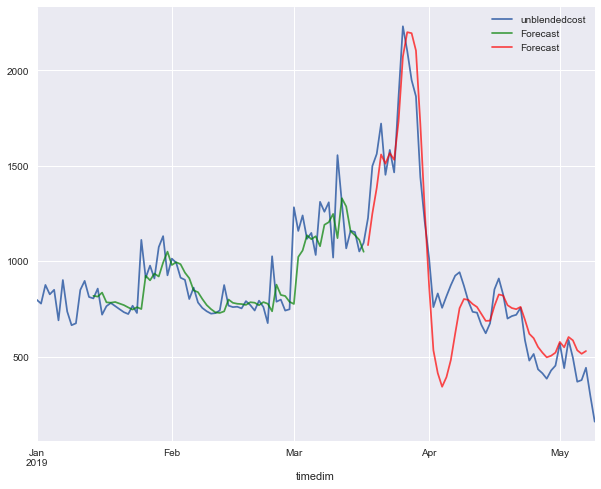

in sample
MAPE 17.759079257728935
rmse 130.00648852689017
out of sample
mape 36.89159890978471
rmse 170.01474230935884
[13, 32, 'relu', 0.0003]
Epoch 1/1000
63/63 [==============================] - 3s 50ms/sample - loss: 0.7249 - mean_squared_error: 0.7249
Epoch 2/1000
63/63 [==============================] - 0s 1ms/sample - loss: 0.6651 - mean_squared_error: 0.6651
Epoch 3/1000
63/63 [==============================] - 0s 965us/sample - loss: 0.6065 - mean_squared_error: 0.6065
Epoch 4/1000
63/63 [==============================] - 0s 776us/sample - loss: 0.5507 - mean_squared_error: 0.5507
Epoch 5/1000
63/63 [==============================] - 0s 855us/sample - loss: 0.4965 - mean_squared_error: 0.4965
Epoch 6/1000
63/63 [==============================] - 0s 1ms/sample - loss: 0.4420 - mean_squared_error: 0.4420
Epoch 7/1000
63/63 [==============================] - 0s 712us/sample - loss: 0.3840 - mean_squared_error: 0.3840
Epoch 8/1000
63/63 [==============================] - 0s 839us/

63/63 [==============================] - 0s 966us/sample - loss: 0.0355 - mean_squared_error: 0.0355
Epoch 71/1000
63/63 [==============================] - 0s 712us/sample - loss: 0.0351 - mean_squared_error: 0.0351
Epoch 72/1000
63/63 [==============================] - 0s 728us/sample - loss: 0.0346 - mean_squared_error: 0.0346
Epoch 73/1000
63/63 [==============================] - 0s 855us/sample - loss: 0.0343 - mean_squared_error: 0.0343
Epoch 74/1000
63/63 [==============================] - 0s 823us/sample - loss: 0.0339 - mean_squared_error: 0.0339
Epoch 75/1000
63/63 [==============================] - 0s 1ms/sample - loss: 0.0335 - mean_squared_error: 0.0335
Epoch 76/1000
63/63 [==============================] - 0s 712us/sample - loss: 0.0332 - mean_squared_error: 0.0332
Epoch 77/1000
63/63 [==============================] - 0s 902us/sample - loss: 0.0328 - mean_squared_error: 0.0328
Epoch 78/1000
63/63 [==============================] - 0s 950us/sample - loss: 0.0324 - mean_squ

63/63 [==============================] - 0s 1ms/sample - loss: 0.0206 - mean_squared_error: 0.0206
Epoch 142/1000
63/63 [==============================] - 0s 855us/sample - loss: 0.0206 - mean_squared_error: 0.0206
Epoch 143/1000
63/63 [==============================] - 0s 776us/sample - loss: 0.0205 - mean_squared_error: 0.0205
Epoch 144/1000
63/63 [==============================] - 0s 839us/sample - loss: 0.0206 - mean_squared_error: 0.0206
Epoch 145/1000
63/63 [==============================] - 0s 728us/sample - loss: 0.0204 - mean_squared_error: 0.0204
Epoch 146/1000
63/63 [==============================] - 0s 792us/sample - loss: 0.0204 - mean_squared_error: 0.0204
Epoch 147/1000
63/63 [==============================] - 0s 871us/sample - loss: 0.0202 - mean_squared_error: 0.0202
Epoch 148/1000
63/63 [==============================] - 0s 1ms/sample - loss: 0.0201 - mean_squared_error: 0.0201
Epoch 149/1000
63/63 [==============================] - 0s 807us/sample - loss: 0.0200 - me

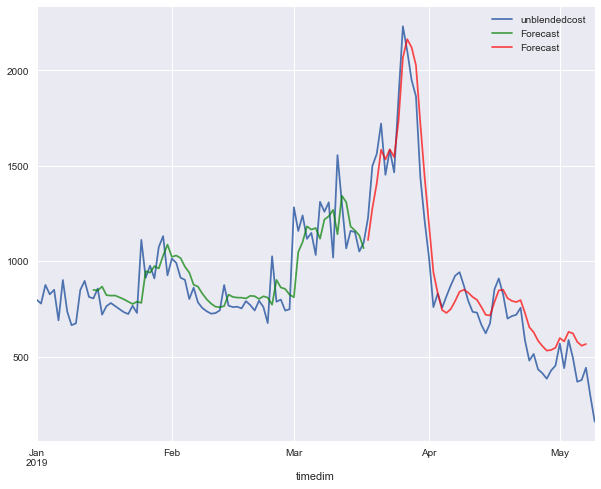

in sample
MAPE 17.96303537837762
rmse 129.04815510931766
out of sample
mape 37.955589787141854
rmse 126.137259782526
[13, 32, 'relu', 0.001]
Epoch 1/1000
63/63 [==============================] - 3s 50ms/sample - loss: 0.7774 - mean_squared_error: 0.7774
Epoch 2/1000
63/63 [==============================] - 0s 807us/sample - loss: 0.5676 - mean_squared_error: 0.5676
Epoch 3/1000
63/63 [==============================] - 0s 918us/sample - loss: 0.3771 - mean_squared_error: 0.3771
Epoch 4/1000
63/63 [==============================] - 0s 760us/sample - loss: 0.2236 - mean_squared_error: 0.2236
Epoch 5/1000
63/63 [==============================] - 0s 776us/sample - loss: 0.1530 - mean_squared_error: 0.1530
Epoch 6/1000
63/63 [==============================] - 0s 887us/sample - loss: 0.1636 - mean_squared_error: 0.1636
Epoch 7/1000
63/63 [==============================] - 0s 934us/sample - loss: 0.1183 - mean_squared_error: 0.1183
Epoch 8/1000
63/63 [==============================] - 0s 886us

63/63 [==============================] - 0s 886us/sample - loss: 0.0215 - mean_squared_error: 0.0215
Epoch 71/1000
63/63 [==============================] - 0s 681us/sample - loss: 0.0213 - mean_squared_error: 0.0213
Epoch 72/1000
63/63 [==============================] - 0s 887us/sample - loss: 0.0210 - mean_squared_error: 0.0210
Epoch 73/1000
63/63 [==============================] - 0s 902us/sample - loss: 0.0210 - mean_squared_error: 0.0210
Epoch 74/1000
63/63 [==============================] - 0s 776us/sample - loss: 0.0208 - mean_squared_error: 0.0208
Epoch 75/1000
63/63 [==============================] - 0s 871us/sample - loss: 0.0206 - mean_squared_error: 0.0206
Epoch 76/1000
63/63 [==============================] - 0s 744us/sample - loss: 0.0206 - mean_squared_error: 0.0206
Epoch 77/1000
63/63 [==============================] - 0s 823us/sample - loss: 0.0204 - mean_squared_error: 0.0204
Epoch 78/1000
63/63 [==============================] - 0s 966us/sample - loss: 0.0204 - mean_s

63/63 [==============================] - 0s 823us/sample - loss: 0.0167 - mean_squared_error: 0.0167
Epoch 142/1000
63/63 [==============================] - 0s 839us/sample - loss: 0.0167 - mean_squared_error: 0.0167
Epoch 143/1000
63/63 [==============================] - 0s 807us/sample - loss: 0.0167 - mean_squared_error: 0.0167
Epoch 144/1000
63/63 [==============================] - 0s 918us/sample - loss: 0.0167 - mean_squared_error: 0.0167
Epoch 145/1000
63/63 [==============================] - 0s 871us/sample - loss: 0.0166 - mean_squared_error: 0.0166
Epoch 146/1000
63/63 [==============================] - 0s 823us/sample - loss: 0.0166 - mean_squared_error: 0.0166
Epoch 147/1000
63/63 [==============================] - 0s 886us/sample - loss: 0.0166 - mean_squared_error: 0.0166
Epoch 148/1000
63/63 [==============================] - 0s 760us/sample - loss: 0.0165 - mean_squared_error: 0.0165
Epoch 149/1000
63/63 [==============================] - 0s 807us/sample - loss: 0.0166 

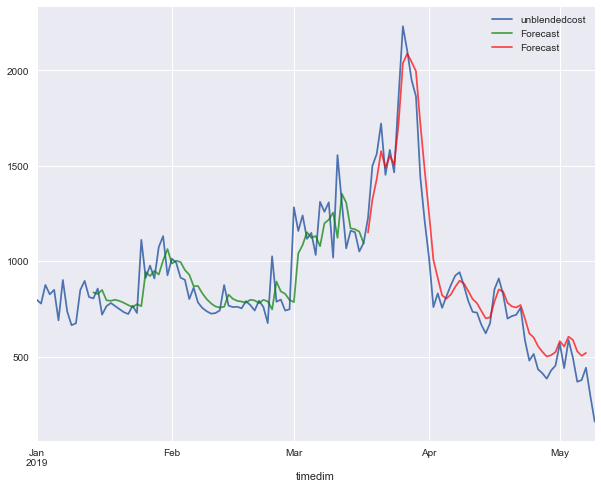

in sample
MAPE 17.65269648641258
rmse 130.70281064301827
out of sample
mape 39.322378191988896
rmse 113.00836550551871
[13, 32, 'relu', 0.003]
Epoch 1/1000
63/63 [==============================] - 3s 51ms/sample - loss: 0.5983 - mean_squared_error: 0.5983
Epoch 2/1000
63/63 [==============================] - 0s 807us/sample - loss: 0.1995 - mean_squared_error: 0.1995
Epoch 3/1000
63/63 [==============================] - 0s 981us/sample - loss: 0.1188 - mean_squared_error: 0.1188
Epoch 4/1000
63/63 [==============================] - 0s 950us/sample - loss: 0.0948 - mean_squared_error: 0.0948
Epoch 5/1000
63/63 [==============================] - 0s 871us/sample - loss: 0.0685 - mean_squared_error: 0.0685
Epoch 6/1000
63/63 [==============================] - 0s 823us/sample - loss: 0.0610 - mean_squared_error: 0.0610
Epoch 7/1000
63/63 [==============================] - 0s 918us/sample - loss: 0.0498 - mean_squared_error: 0.0498
Epoch 8/1000
63/63 [==============================] - 0s 887

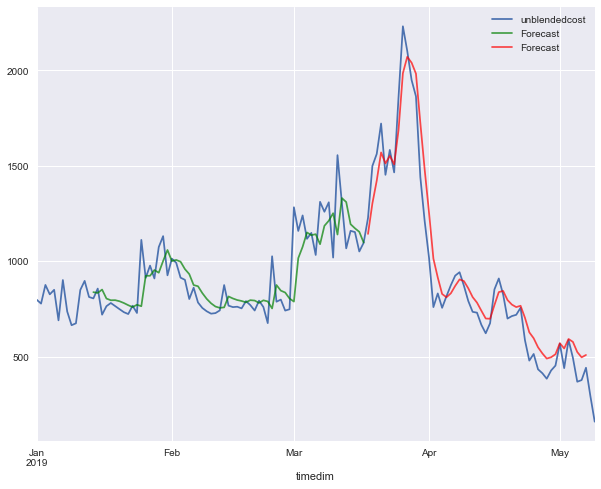

in sample
MAPE 17.493384497144397
rmse 129.77652267132822
out of sample
mape 39.665571093720494
rmse 117.13788303656781
[13, 32, 'relu', 0.01]
Epoch 1/1000
63/63 [==============================] - 4s 56ms/sample - loss: 0.8698 - mean_squared_error: 0.8698
Epoch 2/1000
63/63 [==============================] - 0s 2ms/sample - loss: 0.8465 - mean_squared_error: 0.8465
Epoch 3/1000
63/63 [==============================] - 0s 2ms/sample - loss: 0.8240 - mean_squared_error: 0.8240
Epoch 4/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.8019 - mean_squared_error: 0.8019
Epoch 5/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.7792 - mean_squared_error: 0.7792
Epoch 6/1000
63/63 [==============================] - 0s 2ms/sample - loss: 0.7586 - mean_squared_error: 0.7586
Epoch 7/1000
63/63 [==============================] - 0s 2ms/sample - loss: 0.7377 - mean_squared_error: 0.7377
Epoch 8/1000
63/63 [==============================] - 0s 2ms/sample - lo

63/63 [==============================] - 0s 2ms/sample - loss: 0.1569 - mean_squared_error: 0.1569
Epoch 72/1000
63/63 [==============================] - 0s 2ms/sample - loss: 0.1557 - mean_squared_error: 0.1557
Epoch 73/1000
63/63 [==============================] - 0s 2ms/sample - loss: 0.1545 - mean_squared_error: 0.1545
Epoch 74/1000
63/63 [==============================] - 0s 2ms/sample - loss: 0.1533 - mean_squared_error: 0.1533
Epoch 75/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.1521 - mean_squared_error: 0.1521
Epoch 76/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.1509 - mean_squared_error: 0.1509
Epoch 77/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.1498 - mean_squared_error: 0.1498
Epoch 78/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.1486 - mean_squared_error: 0.1486
Epoch 79/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.1475 - mean_squared_error: 0.14

63/63 [==============================] - 0s 2ms/sample - loss: 0.0922 - mean_squared_error: 0.0922
Epoch 144/1000
63/63 [==============================] - 0s 2ms/sample - loss: 0.0917 - mean_squared_error: 0.0917
Epoch 145/1000
63/63 [==============================] - 0s 2ms/sample - loss: 0.0912 - mean_squared_error: 0.0912
Epoch 146/1000
63/63 [==============================] - 0s 2ms/sample - loss: 0.0907 - mean_squared_error: 0.0907
Epoch 147/1000
63/63 [==============================] - 0s 2ms/sample - loss: 0.0901 - mean_squared_error: 0.0901
Epoch 148/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.0897 - mean_squared_error: 0.0897
Epoch 149/1000
63/63 [==============================] - 0s 2ms/sample - loss: 0.0892 - mean_squared_error: 0.0892
Epoch 150/1000
63/63 [==============================] - 0s 2ms/sample - loss: 0.0887 - mean_squared_error: 0.0887
Epoch 151/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.0882 - mean_squared_err

Epoch 215/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.0684 - mean_squared_error: 0.0684
Epoch 216/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.0682 - mean_squared_error: 0.0682
Epoch 217/1000
63/63 [==============================] - 0s 2ms/sample - loss: 0.0680 - mean_squared_error: 0.0680
Epoch 218/1000
63/63 [==============================] - 0s 2ms/sample - loss: 0.0677 - mean_squared_error: 0.0677
Epoch 219/1000
63/63 [==============================] - 0s 2ms/sample - loss: 0.0675 - mean_squared_error: 0.0675
Epoch 220/1000
63/63 [==============================] - 0s 2ms/sample - loss: 0.0673 - mean_squared_error: 0.0673
Epoch 221/1000
63/63 [==============================] - 0s 2ms/sample - loss: 0.0670 - mean_squared_error: 0.0670
Epoch 222/1000
63/63 [==============================] - 0s 2ms/sample - loss: 0.0668 - mean_squared_error: 0.0668
Epoch 223/1000
63/63 [==============================] - 0s 2ms/sample - loss: 0.0666 - m

63/63 [==============================] - 0s 3ms/sample - loss: 0.0543 - mean_squared_error: 0.0543
Epoch 287/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.0542 - mean_squared_error: 0.0542
Epoch 288/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.0540 - mean_squared_error: 0.0540
Epoch 289/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.0538 - mean_squared_error: 0.0538
Epoch 290/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.0537 - mean_squared_error: 0.0537
Epoch 291/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.0535 - mean_squared_error: 0.0535
Epoch 292/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.0534 - mean_squared_error: 0.0534
Epoch 293/1000
63/63 [==============================] - 0s 2ms/sample - loss: 0.0532 - mean_squared_error: 0.0532
Epoch 294/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.0530 - mean_squared_err

Epoch 358/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.0444 - mean_squared_error: 0.0444
Epoch 359/1000
63/63 [==============================] - 0s 2ms/sample - loss: 0.0442 - mean_squared_error: 0.0442
Epoch 360/1000
63/63 [==============================] - 0s 2ms/sample - loss: 0.0441 - mean_squared_error: 0.0441
Epoch 361/1000
63/63 [==============================] - 0s 2ms/sample - loss: 0.0440 - mean_squared_error: 0.0440
Epoch 362/1000
63/63 [==============================] - 0s 2ms/sample - loss: 0.0439 - mean_squared_error: 0.0439
Epoch 363/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.0438 - mean_squared_error: 0.0438
Epoch 364/1000
63/63 [==============================] - 0s 2ms/sample - loss: 0.0437 - mean_squared_error: 0.0437
Epoch 365/1000
63/63 [==============================] - 0s 2ms/sample - loss: 0.0436 - mean_squared_error: 0.0436
Epoch 366/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.0434 - m

63/63 [==============================] - 0s 2ms/sample - loss: 0.0374 - mean_squared_error: 0.0374
Epoch 430/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.0374 - mean_squared_error: 0.0374
Epoch 431/1000
63/63 [==============================] - 0s 2ms/sample - loss: 0.0373 - mean_squared_error: 0.0373
Epoch 432/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.0372 - mean_squared_error: 0.0372
Epoch 433/1000
63/63 [==============================] - 0s 2ms/sample - loss: 0.0371 - mean_squared_error: 0.0371
Epoch 434/1000
63/63 [==============================] - 0s 2ms/sample - loss: 0.0370 - mean_squared_error: 0.0370
Epoch 435/1000
63/63 [==============================] - 0s 2ms/sample - loss: 0.0370 - mean_squared_error: 0.0370
Epoch 436/1000
63/63 [==============================] - 0s 2ms/sample - loss: 0.0369 - mean_squared_error: 0.0369
Epoch 437/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.0368 - mean_squared_err

Epoch 501/1000
63/63 [==============================] - 0s 2ms/sample - loss: 0.0323 - mean_squared_error: 0.0323
Epoch 502/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.0323 - mean_squared_error: 0.0323
Epoch 503/1000
63/63 [==============================] - 0s 2ms/sample - loss: 0.0322 - mean_squared_error: 0.0322
Epoch 504/1000
63/63 [==============================] - 0s 2ms/sample - loss: 0.0322 - mean_squared_error: 0.0322
Epoch 505/1000
63/63 [==============================] - 0s 2ms/sample - loss: 0.0321 - mean_squared_error: 0.0321
Epoch 506/1000
63/63 [==============================] - 0s 2ms/sample - loss: 0.0320 - mean_squared_error: 0.0320
Epoch 507/1000
63/63 [==============================] - 0s 2ms/sample - loss: 0.0320 - mean_squared_error: 0.0320
Epoch 508/1000
63/63 [==============================] - 0s 2ms/sample - loss: 0.0319 - mean_squared_error: 0.0319
Epoch 509/1000
63/63 [==============================] - 0s 2ms/sample - loss: 0.0319 - m

63/63 [==============================] - 0s 2ms/sample - loss: 0.0285 - mean_squared_error: 0.0285
Epoch 573/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.0284 - mean_squared_error: 0.0284
Epoch 574/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.0284 - mean_squared_error: 0.0284
Epoch 575/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.0283 - mean_squared_error: 0.0283
Epoch 576/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.0283 - mean_squared_error: 0.0283
Epoch 577/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.0282 - mean_squared_error: 0.0282
Epoch 578/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.0282 - mean_squared_error: 0.0282
Epoch 579/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.0281 - mean_squared_error: 0.0281
Epoch 580/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.0281 - mean_squared_err

Epoch 644/1000
63/63 [==============================] - 0s 2ms/sample - loss: 0.0253 - mean_squared_error: 0.0253
Epoch 645/1000
63/63 [==============================] - 0s 2ms/sample - loss: 0.0253 - mean_squared_error: 0.0253
Epoch 646/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.0253 - mean_squared_error: 0.0253
Epoch 647/1000
63/63 [==============================] - 0s 2ms/sample - loss: 0.0252 - mean_squared_error: 0.0252
Epoch 648/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.0252 - mean_squared_error: 0.0252
Epoch 649/1000
63/63 [==============================] - 0s 2ms/sample - loss: 0.0251 - mean_squared_error: 0.0251
Epoch 650/1000
63/63 [==============================] - 0s 2ms/sample - loss: 0.0251 - mean_squared_error: 0.0251
Epoch 651/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.0251 - mean_squared_error: 0.0251
Epoch 652/1000
63/63 [==============================] - 0s 2ms/sample - loss: 0.0250 - m

63/63 [==============================] - 0s 3ms/sample - loss: 0.0228 - mean_squared_error: 0.0228
Epoch 716/1000
63/63 [==============================] - 0s 2ms/sample - loss: 0.0228 - mean_squared_error: 0.0228
Epoch 717/1000
63/63 [==============================] - 0s 2ms/sample - loss: 0.0228 - mean_squared_error: 0.0228
Epoch 718/1000
63/63 [==============================] - 0s 2ms/sample - loss: 0.0227 - mean_squared_error: 0.0227
Epoch 719/1000
63/63 [==============================] - 0s 2ms/sample - loss: 0.0227 - mean_squared_error: 0.0227
Epoch 720/1000
63/63 [==============================] - 0s 2ms/sample - loss: 0.0227 - mean_squared_error: 0.0227
Epoch 721/1000
63/63 [==============================] - 0s 2ms/sample - loss: 0.0226 - mean_squared_error: 0.0226
Epoch 722/1000
63/63 [==============================] - 0s 2ms/sample - loss: 0.0226 - mean_squared_error: 0.0226
Epoch 723/1000
63/63 [==============================] - 0s 2ms/sample - loss: 0.0226 - mean_squared_err

Epoch 787/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.0208 - mean_squared_error: 0.0208
Epoch 788/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.0208 - mean_squared_error: 0.0208
Epoch 789/1000
63/63 [==============================] - 0s 2ms/sample - loss: 0.0207 - mean_squared_error: 0.0207
Epoch 790/1000
63/63 [==============================] - 0s 2ms/sample - loss: 0.0207 - mean_squared_error: 0.0207
Epoch 791/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.0207 - mean_squared_error: 0.0207
Epoch 792/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.0207 - mean_squared_error: 0.0207
Epoch 793/1000
63/63 [==============================] - 0s 2ms/sample - loss: 0.0206 - mean_squared_error: 0.0206
Epoch 794/1000
63/63 [==============================] - 0s 2ms/sample - loss: 0.0206 - mean_squared_error: 0.0206
Epoch 795/1000
63/63 [==============================] - 0s 2ms/sample - loss: 0.0206 - m

63/63 [==============================] - 0s 2ms/sample - loss: 0.0192 - mean_squared_error: 0.0192
Epoch 859/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.0192 - mean_squared_error: 0.0192
Epoch 860/1000
63/63 [==============================] - 0s 2ms/sample - loss: 0.0191 - mean_squared_error: 0.0191
Epoch 861/1000
63/63 [==============================] - 0s 2ms/sample - loss: 0.0191 - mean_squared_error: 0.0191
Epoch 862/1000
63/63 [==============================] - 0s 2ms/sample - loss: 0.0191 - mean_squared_error: 0.0191
Epoch 863/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.0191 - mean_squared_error: 0.0191
Epoch 864/1000
63/63 [==============================] - 0s 2ms/sample - loss: 0.0191 - mean_squared_error: 0.0191
Epoch 865/1000
63/63 [==============================] - 0s 2ms/sample - loss: 0.0191 - mean_squared_error: 0.0191
Epoch 866/1000
63/63 [==============================] - 0s 2ms/sample - loss: 0.0190 - mean_squared_err

Epoch 930/1000
63/63 [==============================] - 0s 2ms/sample - loss: 0.0180 - mean_squared_error: 0.0180
Epoch 931/1000
63/63 [==============================] - 0s 2ms/sample - loss: 0.0179 - mean_squared_error: 0.0179
Epoch 932/1000
63/63 [==============================] - 0s 2ms/sample - loss: 0.0179 - mean_squared_error: 0.0179
Epoch 933/1000
63/63 [==============================] - 0s 2ms/sample - loss: 0.0179 - mean_squared_error: 0.0179
Epoch 934/1000
63/63 [==============================] - 0s 2ms/sample - loss: 0.0179 - mean_squared_error: 0.0179
Epoch 935/1000
63/63 [==============================] - 0s 2ms/sample - loss: 0.0179 - mean_squared_error: 0.0179
Epoch 936/1000
63/63 [==============================] - 0s 2ms/sample - loss: 0.0179 - mean_squared_error: 0.0179
Epoch 937/1000
63/63 [==============================] - 0s 2ms/sample - loss: 0.0179 - mean_squared_error: 0.0179
Epoch 938/1000
63/63 [==============================] - 0s 2ms/sample - loss: 0.0178 - m

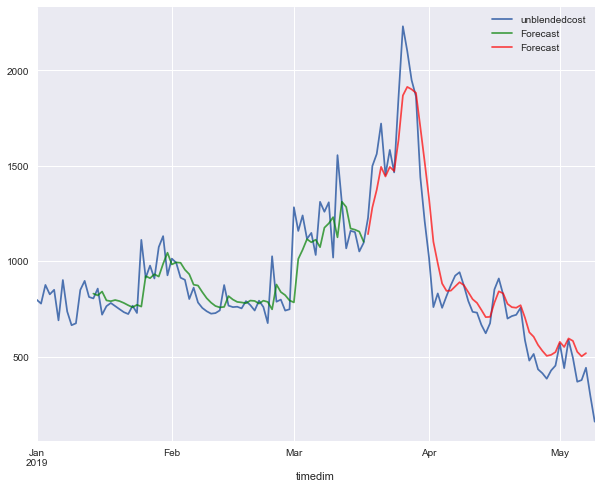

in sample
MAPE 17.16924158244762
rmse 130.3936061605884
out of sample
mape 39.3605166519713
rmse 140.35216140722596
[13, 64, 'tanh', 0.0001]
Epoch 1/1000
63/63 [==============================] - 3s 55ms/sample - loss: 0.6968 - mean_squared_error: 0.6968
Epoch 2/1000
63/63 [==============================] - 0s 2ms/sample - loss: 0.6366 - mean_squared_error: 0.6366
Epoch 3/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.5798 - mean_squared_error: 0.5798
Epoch 4/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.5243 - mean_squared_error: 0.5243
Epoch 5/1000
63/63 [==============================] - 0s 2ms/sample - loss: 0.4716 - mean_squared_error: 0.4716
Epoch 6/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.4214 - mean_squared_error: 0.4214
Epoch 7/1000
63/63 [==============================] - 0s 2ms/sample - loss: 0.3723 - mean_squared_error: 0.3723
Epoch 8/1000
63/63 [==============================] - 0s 2ms/sample - loss

63/63 [==============================] - 0s 3ms/sample - loss: 0.0624 - mean_squared_error: 0.0624
Epoch 72/1000
63/63 [==============================] - 0s 2ms/sample - loss: 0.0618 - mean_squared_error: 0.0618
Epoch 73/1000
63/63 [==============================] - 0s 2ms/sample - loss: 0.0611 - mean_squared_error: 0.0611
Epoch 74/1000
63/63 [==============================] - 0s 2ms/sample - loss: 0.0605 - mean_squared_error: 0.0605
Epoch 75/1000
63/63 [==============================] - 0s 2ms/sample - loss: 0.0599 - mean_squared_error: 0.0599
Epoch 76/1000
63/63 [==============================] - 0s 2ms/sample - loss: 0.0593 - mean_squared_error: 0.0593
Epoch 77/1000
63/63 [==============================] - 0s 2ms/sample - loss: 0.0588 - mean_squared_error: 0.0588
Epoch 78/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.0582 - mean_squared_error: 0.0582
Epoch 79/1000
63/63 [==============================] - 0s 2ms/sample - loss: 0.0576 - mean_squared_error: 0.05

63/63 [==============================] - 0s 2ms/sample - loss: 0.0353 - mean_squared_error: 0.0353
Epoch 144/1000
63/63 [==============================] - 0s 2ms/sample - loss: 0.0351 - mean_squared_error: 0.0351
Epoch 145/1000
63/63 [==============================] - 0s 2ms/sample - loss: 0.0349 - mean_squared_error: 0.0349
Epoch 146/1000
63/63 [==============================] - 0s 2ms/sample - loss: 0.0347 - mean_squared_error: 0.0347
Epoch 147/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.0345 - mean_squared_error: 0.0345
Epoch 148/1000
63/63 [==============================] - 0s 2ms/sample - loss: 0.0343 - mean_squared_error: 0.0343
Epoch 149/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.0341 - mean_squared_error: 0.0341
Epoch 150/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.0339 - mean_squared_error: 0.0339
Epoch 151/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.0337 - mean_squared_err

Epoch 215/1000
63/63 [==============================] - 0s 2ms/sample - loss: 0.0248 - mean_squared_error: 0.0248
Epoch 216/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.0247 - mean_squared_error: 0.0247
Epoch 217/1000
63/63 [==============================] - 0s 2ms/sample - loss: 0.0245 - mean_squared_error: 0.0245
Epoch 218/1000
63/63 [==============================] - 0s 2ms/sample - loss: 0.0245 - mean_squared_error: 0.0245
Epoch 219/1000
63/63 [==============================] - 0s 2ms/sample - loss: 0.0244 - mean_squared_error: 0.0244
Epoch 220/1000
63/63 [==============================] - 0s 2ms/sample - loss: 0.0243 - mean_squared_error: 0.0243
Epoch 221/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.0242 - mean_squared_error: 0.0242
Epoch 222/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.0241 - mean_squared_error: 0.0241
Epoch 223/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.0240 - m

63/63 [==============================] - 0s 2ms/sample - loss: 0.0196 - mean_squared_error: 0.0196
Epoch 287/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.0195 - mean_squared_error: 0.0195
Epoch 288/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.0194 - mean_squared_error: 0.0194
Epoch 289/1000
63/63 [==============================] - 0s 2ms/sample - loss: 0.0194 - mean_squared_error: 0.0194
Epoch 290/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.0193 - mean_squared_error: 0.0193
Epoch 291/1000
63/63 [==============================] - 0s 2ms/sample - loss: 0.0193 - mean_squared_error: 0.0193
Epoch 292/1000
63/63 [==============================] - 0s 2ms/sample - loss: 0.0193 - mean_squared_error: 0.0193
Epoch 293/1000
63/63 [==============================] - 0s 2ms/sample - loss: 0.0192 - mean_squared_error: 0.0192
Epoch 294/1000
63/63 [==============================] - 0s 2ms/sample - loss: 0.0192 - mean_squared_err

Epoch 358/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.0171 - mean_squared_error: 0.0171
Epoch 359/1000
63/63 [==============================] - 0s 2ms/sample - loss: 0.0171 - mean_squared_error: 0.0171
Epoch 360/1000
63/63 [==============================] - 0s 2ms/sample - loss: 0.0170 - mean_squared_error: 0.0170
Epoch 361/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.0170 - mean_squared_error: 0.0170
Epoch 362/1000
63/63 [==============================] - 0s 2ms/sample - loss: 0.0170 - mean_squared_error: 0.0170
Epoch 363/1000
63/63 [==============================] - 0s 2ms/sample - loss: 0.0170 - mean_squared_error: 0.0170
Epoch 364/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.0170 - mean_squared_error: 0.0170
Epoch 365/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.0169 - mean_squared_error: 0.0169
Epoch 366/1000
63/63 [==============================] - 0s 2ms/sample - loss: 0.0169 - m

63/63 [==============================] - 0s 3ms/sample - loss: 0.0161 - mean_squared_error: 0.0161
Epoch 430/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.0161 - mean_squared_error: 0.0161
Epoch 431/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.0160 - mean_squared_error: 0.0160
Epoch 432/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.0161 - mean_squared_error: 0.0161
Epoch 433/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.0160 - mean_squared_error: 0.0160
Epoch 434/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.0160 - mean_squared_error: 0.0160
Epoch 435/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.0160 - mean_squared_error: 0.0160
Epoch 436/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.0160 - mean_squared_error: 0.0160
Epoch 437/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.0160 - mean_squared_err

Epoch 501/1000
63/63 [==============================] - 0s 2ms/sample - loss: 0.0157 - mean_squared_error: 0.0157
Epoch 502/1000
63/63 [==============================] - 0s 2ms/sample - loss: 0.0157 - mean_squared_error: 0.0157
Epoch 503/1000
63/63 [==============================] - 0s 2ms/sample - loss: 0.0157 - mean_squared_error: 0.0157
Epoch 504/1000
63/63 [==============================] - 0s 2ms/sample - loss: 0.0157 - mean_squared_error: 0.0157
Epoch 505/1000
63/63 [==============================] - 0s 2ms/sample - loss: 0.0157 - mean_squared_error: 0.0157
Epoch 506/1000
63/63 [==============================] - 0s 2ms/sample - loss: 0.0157 - mean_squared_error: 0.0157
Epoch 507/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.0156 - mean_squared_error: 0.0156
Epoch 508/1000
63/63 [==============================] - 0s 2ms/sample - loss: 0.0157 - mean_squared_error: 0.0157
Epoch 509/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.0156 - m

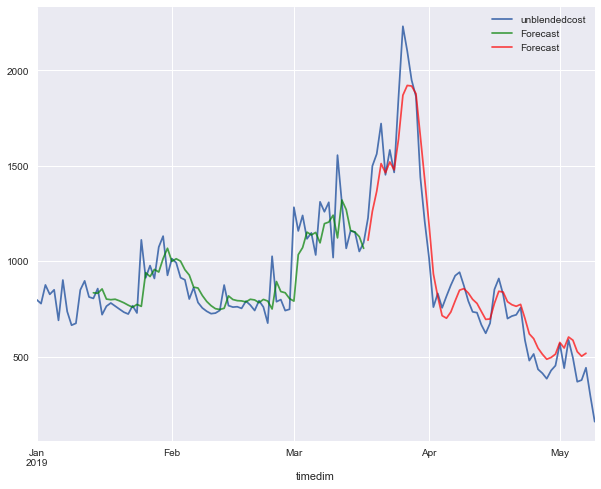

in sample
MAPE 17.506996356238144
rmse 128.55801146186303
out of sample
mape 37.579728027732116
rmse 123.18291188031829
[13, 64, 'tanh', 0.0003]
Epoch 1/1000
63/63 [==============================] - 4s 56ms/sample - loss: 0.6808 - mean_squared_error: 0.6808
Epoch 2/1000
63/63 [==============================] - 0s 2ms/sample - loss: 0.4693 - mean_squared_error: 0.4693
Epoch 3/1000
63/63 [==============================] - 0s 2ms/sample - loss: 0.3009 - mean_squared_error: 0.3009
Epoch 4/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.1836 - mean_squared_error: 0.1836
Epoch 5/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.1483 - mean_squared_error: 0.1483
Epoch 6/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.1536 - mean_squared_error: 0.1536
Epoch 7/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.1320 - mean_squared_error: 0.1320
Epoch 8/1000
63/63 [==============================] - 0s 3ms/sample - 

63/63 [==============================] - 0s 3ms/sample - loss: 0.0242 - mean_squared_error: 0.0242
Epoch 72/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.0239 - mean_squared_error: 0.0239
Epoch 73/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.0236 - mean_squared_error: 0.0236
Epoch 74/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.0234 - mean_squared_error: 0.0234
Epoch 75/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.0231 - mean_squared_error: 0.0231
Epoch 76/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.0228 - mean_squared_error: 0.0228
Epoch 77/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.0226 - mean_squared_error: 0.0226
Epoch 78/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.0224 - mean_squared_error: 0.0224
Epoch 79/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.0221 - mean_squared_error: 0.02

63/63 [==============================] - 0s 3ms/sample - loss: 0.0159 - mean_squared_error: 0.0159
Epoch 144/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.0158 - mean_squared_error: 0.0158
Epoch 145/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.0158 - mean_squared_error: 0.0158
Epoch 146/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.0158 - mean_squared_error: 0.0158
Epoch 147/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.0158 - mean_squared_error: 0.0158
Epoch 148/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.0159 - mean_squared_error: 0.0159
Epoch 149/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.0158 - mean_squared_error: 0.0158
Epoch 150/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.0158 - mean_squared_error: 0.0158
Epoch 151/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.0158 - mean_squared_err

Epoch 215/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.0154 - mean_squared_error: 0.0154
Epoch 216/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.0154 - mean_squared_error: 0.0154
Epoch 00216: early stopping


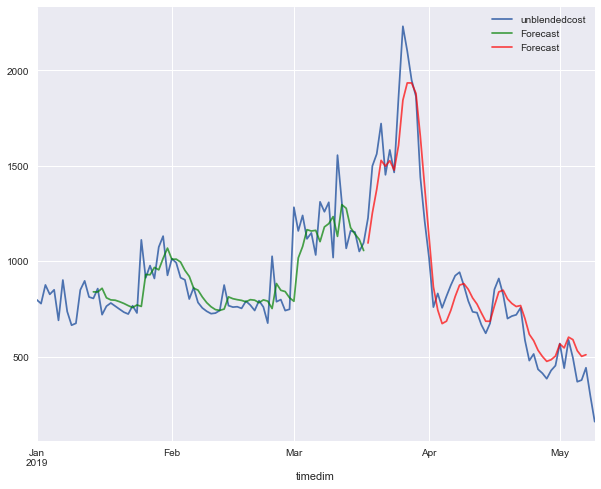

in sample
MAPE 17.66320748016076
rmse 127.97182631058294
out of sample
mape 37.44408501071984
rmse 121.04331823965022
[13, 64, 'tanh', 0.001]
Epoch 1/1000
63/63 [==============================] - 4s 56ms/sample - loss: 0.9616 - mean_squared_error: 0.9616
Epoch 2/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.3662 - mean_squared_error: 0.3662
Epoch 3/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.1894 - mean_squared_error: 0.1894
Epoch 4/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.1303 - mean_squared_error: 0.1303
Epoch 5/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.0997 - mean_squared_error: 0.0997
Epoch 6/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.0974 - mean_squared_error: 0.0974
Epoch 7/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.0762 - mean_squared_error: 0.0762
Epoch 8/1000
63/63 [==============================] - 0s 3ms/sample - los

63/63 [==============================] - 0s 3ms/sample - loss: 0.0174 - mean_squared_error: 0.0174
Epoch 72/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.0173 - mean_squared_error: 0.0173
Epoch 73/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.0173 - mean_squared_error: 0.0173
Epoch 74/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.0171 - mean_squared_error: 0.0171
Epoch 75/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.0171 - mean_squared_error: 0.0171
Epoch 76/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.0169 - mean_squared_error: 0.0169
Epoch 77/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.0169 - mean_squared_error: 0.0169
Epoch 78/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.0167 - mean_squared_error: 0.0167
Epoch 79/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.0167 - mean_squared_error: 0.01

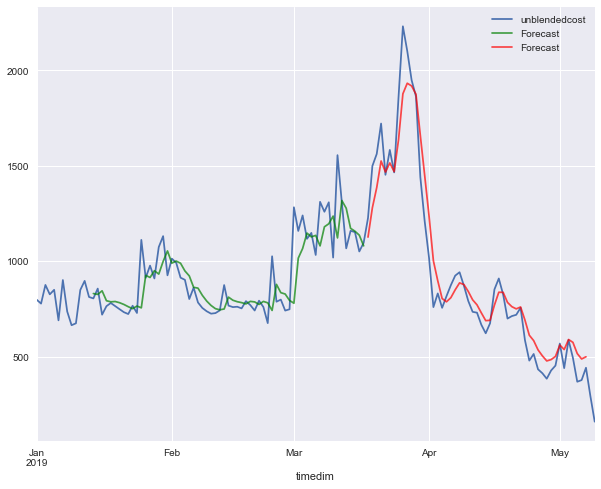

in sample
MAPE 17.500052291697603
rmse 129.71604898496747
out of sample
mape 39.0014934042985
rmse 119.51131508380826
[13, 64, 'tanh', 0.003]
Epoch 1/1000
63/63 [==============================] - 4s 57ms/sample - loss: 0.3948 - mean_squared_error: 0.3948
Epoch 2/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.0947 - mean_squared_error: 0.0947
Epoch 3/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.0611 - mean_squared_error: 0.0611
Epoch 4/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.0465 - mean_squared_error: 0.0465
Epoch 5/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.0340 - mean_squared_error: 0.0340
Epoch 6/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.0325 - mean_squared_error: 0.0325
Epoch 7/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.0279 - mean_squared_error: 0.0279
Epoch 8/1000
63/63 [==============================] - 0s 3ms/sample - los

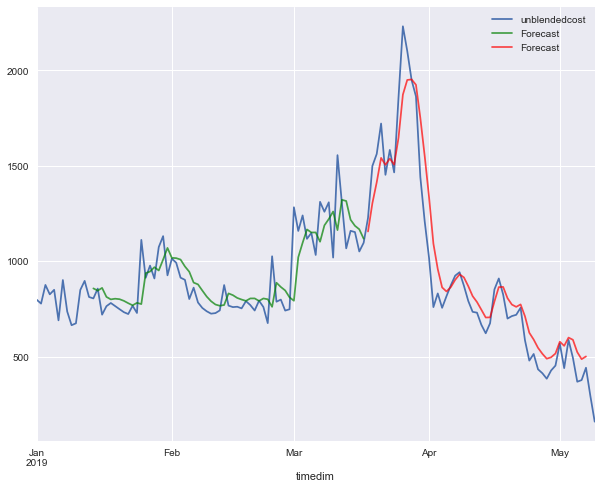

in sample
MAPE 17.722743159504805
rmse 130.00517597315533
out of sample
mape 39.93127674496932
rmse 137.3815616573901
[13, 64, 'tanh', 0.01]
Epoch 1/1000
63/63 [==============================] - 4s 57ms/sample - loss: 0.7860 - mean_squared_error: 0.7860
Epoch 2/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.7793 - mean_squared_error: 0.7793
Epoch 3/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.7728 - mean_squared_error: 0.7728
Epoch 4/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.7664 - mean_squared_error: 0.7664
Epoch 5/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.7599 - mean_squared_error: 0.7599
Epoch 6/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.7537 - mean_squared_error: 0.7537
Epoch 7/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.7471 - mean_squared_error: 0.7471
Epoch 8/1000
63/63 [==============================] - 0s 3ms/sample - loss

63/63 [==============================] - 0s 3ms/sample - loss: 0.2330 - mean_squared_error: 0.2330
Epoch 72/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.2314 - mean_squared_error: 0.2314
Epoch 73/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.2298 - mean_squared_error: 0.2298
Epoch 74/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.2282 - mean_squared_error: 0.2282
Epoch 75/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.2266 - mean_squared_error: 0.2266
Epoch 76/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.2251 - mean_squared_error: 0.2251
Epoch 77/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.2236 - mean_squared_error: 0.2236
Epoch 78/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.2221 - mean_squared_error: 0.2221
Epoch 79/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.2206 - mean_squared_error: 0.22

63/63 [==============================] - 0s 3ms/sample - loss: 0.1313 - mean_squared_error: 0.1313
Epoch 144/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.1306 - mean_squared_error: 0.1306
Epoch 145/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.1299 - mean_squared_error: 0.1299
Epoch 146/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.1292 - mean_squared_error: 0.1292
Epoch 147/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.1285 - mean_squared_error: 0.1285
Epoch 148/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.1279 - mean_squared_error: 0.1279
Epoch 149/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.1273 - mean_squared_error: 0.1273
Epoch 150/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.1266 - mean_squared_error: 0.1266
Epoch 151/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.1260 - mean_squared_err

Epoch 215/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.0933 - mean_squared_error: 0.0933
Epoch 216/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.0929 - mean_squared_error: 0.0929
Epoch 217/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.0925 - mean_squared_error: 0.0925
Epoch 218/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.0922 - mean_squared_error: 0.0922
Epoch 219/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.0918 - mean_squared_error: 0.0918
Epoch 220/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.0915 - mean_squared_error: 0.0915
Epoch 221/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.0911 - mean_squared_error: 0.0911
Epoch 222/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.0908 - mean_squared_error: 0.0908
Epoch 223/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.0905 - m

63/63 [==============================] - 0s 3ms/sample - loss: 0.0735 - mean_squared_error: 0.0735
Epoch 287/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.0734 - mean_squared_error: 0.0734
Epoch 288/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.0730 - mean_squared_error: 0.0730
Epoch 289/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.0728 - mean_squared_error: 0.0728
Epoch 290/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.0725 - mean_squared_error: 0.0725
Epoch 291/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.0723 - mean_squared_error: 0.0723
Epoch 292/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.0721 - mean_squared_error: 0.0721
Epoch 293/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.0719 - mean_squared_error: 0.0719
Epoch 294/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.0716 - mean_squared_err

Epoch 358/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.0602 - mean_squared_error: 0.0602
Epoch 359/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.0601 - mean_squared_error: 0.0601
Epoch 360/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.0599 - mean_squared_error: 0.0599
Epoch 361/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.0598 - mean_squared_error: 0.0598
Epoch 362/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.0596 - mean_squared_error: 0.0596
Epoch 363/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.0595 - mean_squared_error: 0.0595
Epoch 364/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.0593 - mean_squared_error: 0.0593
Epoch 365/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.0592 - mean_squared_error: 0.0592
Epoch 366/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.0591 - m

63/63 [==============================] - 0s 3ms/sample - loss: 0.0514 - mean_squared_error: 0.0514
Epoch 430/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.0513 - mean_squared_error: 0.0513
Epoch 431/1000
63/63 [==============================] - 0s 4ms/sample - loss: 0.0511 - mean_squared_error: 0.0511
Epoch 432/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.0510 - mean_squared_error: 0.0510
Epoch 433/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.0509 - mean_squared_error: 0.0509
Epoch 434/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.0508 - mean_squared_error: 0.0508
Epoch 435/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.0507 - mean_squared_error: 0.0507
Epoch 436/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.0506 - mean_squared_error: 0.0506
Epoch 437/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.0505 - mean_squared_err

Epoch 501/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.0443 - mean_squared_error: 0.0443
Epoch 502/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.0442 - mean_squared_error: 0.0442
Epoch 503/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.0441 - mean_squared_error: 0.0441
Epoch 504/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.0441 - mean_squared_error: 0.0441
Epoch 505/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.0440 - mean_squared_error: 0.0440
Epoch 506/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.0439 - mean_squared_error: 0.0439
Epoch 507/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.0438 - mean_squared_error: 0.0438
Epoch 508/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.0438 - mean_squared_error: 0.0438
Epoch 509/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.0436 - m

63/63 [==============================] - 0s 3ms/sample - loss: 0.0389 - mean_squared_error: 0.0389
Epoch 573/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.0389 - mean_squared_error: 0.0389
Epoch 574/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.0388 - mean_squared_error: 0.0388
Epoch 575/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.0387 - mean_squared_error: 0.0387
Epoch 576/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.0387 - mean_squared_error: 0.0387
Epoch 577/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.0386 - mean_squared_error: 0.0386
Epoch 578/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.0385 - mean_squared_error: 0.0385
Epoch 579/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.0385 - mean_squared_error: 0.0385
Epoch 580/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.0384 - mean_squared_err

Epoch 644/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.0344 - mean_squared_error: 0.0344
Epoch 645/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.0343 - mean_squared_error: 0.0343
Epoch 646/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.0343 - mean_squared_error: 0.0343
Epoch 647/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.0343 - mean_squared_error: 0.0343
Epoch 648/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.0342 - mean_squared_error: 0.0342
Epoch 649/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.0341 - mean_squared_error: 0.0341
Epoch 650/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.0340 - mean_squared_error: 0.0340
Epoch 651/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.0340 - mean_squared_error: 0.0340
Epoch 652/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.0339 - m

63/63 [==============================] - 0s 3ms/sample - loss: 0.0306 - mean_squared_error: 0.0306
Epoch 716/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.0306 - mean_squared_error: 0.0306
Epoch 717/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.0306 - mean_squared_error: 0.0306
Epoch 718/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.0304 - mean_squared_error: 0.0304
Epoch 719/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.0304 - mean_squared_error: 0.0304
Epoch 720/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.0303 - mean_squared_error: 0.0303
Epoch 721/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.0303 - mean_squared_error: 0.0303
Epoch 722/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.0303 - mean_squared_error: 0.0303
Epoch 723/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.0302 - mean_squared_err

Epoch 787/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.0274 - mean_squared_error: 0.0274
Epoch 788/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.0273 - mean_squared_error: 0.0273
Epoch 789/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.0273 - mean_squared_error: 0.0273
Epoch 790/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.0273 - mean_squared_error: 0.0273
Epoch 791/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.0272 - mean_squared_error: 0.0272
Epoch 792/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.0272 - mean_squared_error: 0.0272
Epoch 793/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.0271 - mean_squared_error: 0.0271
Epoch 794/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.0271 - mean_squared_error: 0.0271
Epoch 795/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.0271 - m

63/63 [==============================] - 0s 3ms/sample - loss: 0.0247 - mean_squared_error: 0.0247
Epoch 859/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.0247 - mean_squared_error: 0.0247
Epoch 860/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.0247 - mean_squared_error: 0.0247
Epoch 861/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.0247 - mean_squared_error: 0.0247
Epoch 862/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.0246 - mean_squared_error: 0.0246
Epoch 863/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.0246 - mean_squared_error: 0.0246
Epoch 864/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.0245 - mean_squared_error: 0.0245
Epoch 865/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.0245 - mean_squared_error: 0.0245
Epoch 866/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.0245 - mean_squared_err

Epoch 930/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.0226 - mean_squared_error: 0.0226
Epoch 931/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.0226 - mean_squared_error: 0.0226
Epoch 932/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.0225 - mean_squared_error: 0.0225
Epoch 933/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.0225 - mean_squared_error: 0.0225
Epoch 934/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.0226 - mean_squared_error: 0.0226
Epoch 935/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.0225 - mean_squared_error: 0.0225
Epoch 936/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.0225 - mean_squared_error: 0.0225
Epoch 937/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.0225 - mean_squared_error: 0.0225
Epoch 938/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.0225 - m

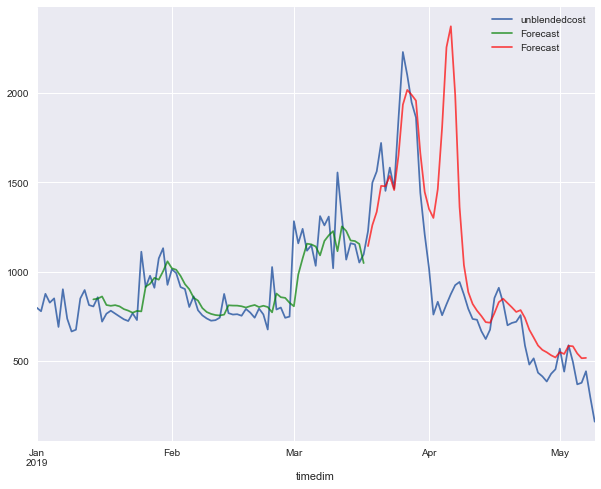

in sample
MAPE 16.991245585400467
rmse 127.04067248844409
out of sample
mape 47.33808188652841
rmse 404.0716701892051
[13, 64, 'relu', 0.0001]
Epoch 1/1000
63/63 [==============================] - 4s 59ms/sample - loss: 0.8437 - mean_squared_error: 0.8437
Epoch 2/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.8083 - mean_squared_error: 0.8083
Epoch 3/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.7746 - mean_squared_error: 0.7746
Epoch 4/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.7413 - mean_squared_error: 0.7413
Epoch 5/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.7080 - mean_squared_error: 0.7080
Epoch 6/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.6764 - mean_squared_error: 0.6764
Epoch 7/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.6440 - mean_squared_error: 0.6440
Epoch 8/1000
63/63 [==============================] - 0s 3ms/sample - lo

63/63 [==============================] - 0s 3ms/sample - loss: 0.0762 - mean_squared_error: 0.0762
Epoch 72/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.0753 - mean_squared_error: 0.0753
Epoch 73/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.0745 - mean_squared_error: 0.0745
Epoch 74/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.0737 - mean_squared_error: 0.0737
Epoch 75/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.0729 - mean_squared_error: 0.0729
Epoch 76/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.0721 - mean_squared_error: 0.0721
Epoch 77/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.0714 - mean_squared_error: 0.0714
Epoch 78/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.0706 - mean_squared_error: 0.0706
Epoch 79/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.0699 - mean_squared_error: 0.06

63/63 [==============================] - 0s 3ms/sample - loss: 0.0435 - mean_squared_error: 0.0435
Epoch 144/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.0432 - mean_squared_error: 0.0432
Epoch 145/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.0429 - mean_squared_error: 0.0429
Epoch 146/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.0427 - mean_squared_error: 0.0427
Epoch 147/1000
63/63 [==============================] - 0s 4ms/sample - loss: 0.0425 - mean_squared_error: 0.0425
Epoch 148/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.0422 - mean_squared_error: 0.0422
Epoch 149/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.0419 - mean_squared_error: 0.0419
Epoch 150/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.0417 - mean_squared_error: 0.0417
Epoch 151/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.0415 - mean_squared_err

Epoch 215/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.0305 - mean_squared_error: 0.0305
Epoch 216/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.0304 - mean_squared_error: 0.0304
Epoch 217/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.0303 - mean_squared_error: 0.0303
Epoch 218/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.0302 - mean_squared_error: 0.0302
Epoch 219/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.0301 - mean_squared_error: 0.0301
Epoch 220/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.0299 - mean_squared_error: 0.0299
Epoch 221/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.0298 - mean_squared_error: 0.0298
Epoch 222/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.0297 - mean_squared_error: 0.0297
Epoch 223/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.0296 - m

63/63 [==============================] - 0s 3ms/sample - loss: 0.0237 - mean_squared_error: 0.0237
Epoch 287/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.0236 - mean_squared_error: 0.0236
Epoch 288/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.0235 - mean_squared_error: 0.0235
Epoch 289/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.0235 - mean_squared_error: 0.0235
Epoch 290/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.0234 - mean_squared_error: 0.0234
Epoch 291/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.0234 - mean_squared_error: 0.0234
Epoch 292/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.0233 - mean_squared_error: 0.0233
Epoch 293/1000
63/63 [==============================] - 0s 4ms/sample - loss: 0.0232 - mean_squared_error: 0.0232
Epoch 294/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.0232 - mean_squared_err

Epoch 358/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.0198 - mean_squared_error: 0.0198
Epoch 359/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.0198 - mean_squared_error: 0.0198
Epoch 360/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.0197 - mean_squared_error: 0.0197
Epoch 361/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.0197 - mean_squared_error: 0.0197
Epoch 362/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.0196 - mean_squared_error: 0.0196
Epoch 363/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.0196 - mean_squared_error: 0.0196
Epoch 364/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.0195 - mean_squared_error: 0.0195
Epoch 365/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.0195 - mean_squared_error: 0.0195
Epoch 366/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.0194 - m

63/63 [==============================] - 0s 3ms/sample - loss: 0.0175 - mean_squared_error: 0.0175
Epoch 430/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.0174 - mean_squared_error: 0.0174
Epoch 431/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.0174 - mean_squared_error: 0.0174
Epoch 432/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.0174 - mean_squared_error: 0.0174
Epoch 433/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.0174 - mean_squared_error: 0.0174
Epoch 434/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.0173 - mean_squared_error: 0.0173
Epoch 435/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.0174 - mean_squared_error: 0.0174
Epoch 436/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.0173 - mean_squared_error: 0.0173
Epoch 437/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.0172 - mean_squared_err

Epoch 501/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.0161 - mean_squared_error: 0.0161
Epoch 502/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.0161 - mean_squared_error: 0.0161
Epoch 503/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.0161 - mean_squared_error: 0.0161
Epoch 504/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.0161 - mean_squared_error: 0.0161
Epoch 505/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.0160 - mean_squared_error: 0.0160
Epoch 506/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.0160 - mean_squared_error: 0.0160
Epoch 507/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.0160 - mean_squared_error: 0.0160
Epoch 508/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.0160 - mean_squared_error: 0.0160
Epoch 509/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.0160 - m

63/63 [==============================] - 0s 3ms/sample - loss: 0.0154 - mean_squared_error: 0.0154
Epoch 573/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.0155 - mean_squared_error: 0.0155
Epoch 574/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.0155 - mean_squared_error: 0.0155
Epoch 575/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.0154 - mean_squared_error: 0.0154
Epoch 576/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.0154 - mean_squared_error: 0.0154
Epoch 577/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.0154 - mean_squared_error: 0.0154
Epoch 578/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.0154 - mean_squared_error: 0.0154
Epoch 579/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.0154 - mean_squared_error: 0.0154
Epoch 580/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.0154 - mean_squared_err

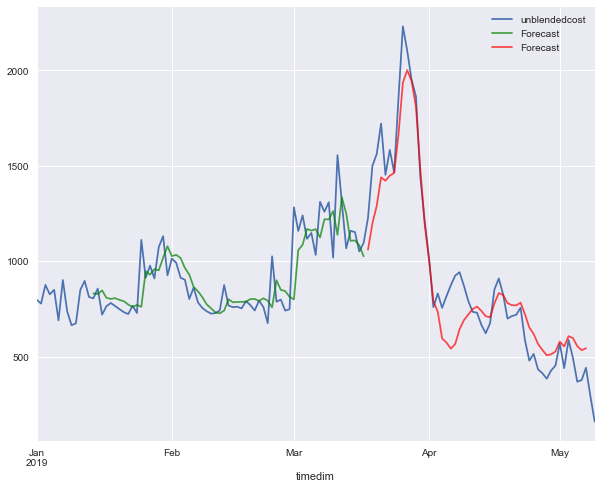

in sample
MAPE 18.20625232253646
rmse 126.52927091152247
out of sample
mape 34.89271050099872
rmse 149.8369801708317
[13, 64, 'relu', 0.0003]
Epoch 1/1000
63/63 [==============================] - 4s 65ms/sample - loss: 0.6519 - mean_squared_error: 0.6519
Epoch 2/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.5509 - mean_squared_error: 0.5509
Epoch 3/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.4500 - mean_squared_error: 0.4500
Epoch 4/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.3518 - mean_squared_error: 0.3518
Epoch 5/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.2572 - mean_squared_error: 0.2572
Epoch 6/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.1770 - mean_squared_error: 0.1770
Epoch 7/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.1564 - mean_squared_error: 0.1564
Epoch 8/1000
63/63 [==============================] - 0s 3ms/sample - los

63/63 [==============================] - 0s 3ms/sample - loss: 0.0285 - mean_squared_error: 0.0285
Epoch 72/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.0282 - mean_squared_error: 0.0282
Epoch 73/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.0280 - mean_squared_error: 0.0280
Epoch 74/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.0276 - mean_squared_error: 0.0276
Epoch 75/1000
63/63 [==============================] - 0s 4ms/sample - loss: 0.0274 - mean_squared_error: 0.0274
Epoch 76/1000
63/63 [==============================] - 0s 4ms/sample - loss: 0.0269 - mean_squared_error: 0.0269
Epoch 77/1000
63/63 [==============================] - 0s 4ms/sample - loss: 0.0267 - mean_squared_error: 0.0267
Epoch 78/1000
63/63 [==============================] - 0s 4ms/sample - loss: 0.0264 - mean_squared_error: 0.0264
Epoch 79/1000
63/63 [==============================] - 0s 4ms/sample - loss: 0.0261 - mean_squared_error: 0.02

63/63 [==============================] - 0s 3ms/sample - loss: 0.0174 - mean_squared_error: 0.0174
Epoch 144/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.0173 - mean_squared_error: 0.0173
Epoch 145/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.0173 - mean_squared_error: 0.0173
Epoch 146/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.0172 - mean_squared_error: 0.0172
Epoch 147/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.0172 - mean_squared_error: 0.0172
Epoch 148/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.0171 - mean_squared_error: 0.0171
Epoch 149/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.0171 - mean_squared_error: 0.0171
Epoch 150/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.0170 - mean_squared_error: 0.0170
Epoch 151/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.0170 - mean_squared_err

Epoch 215/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.0157 - mean_squared_error: 0.0157
Epoch 00215: early stopping


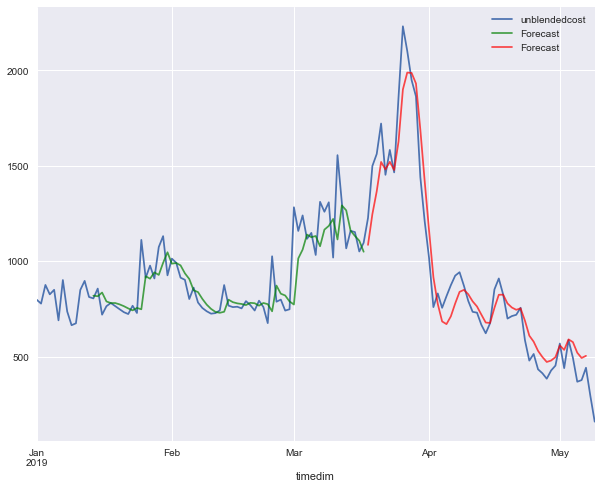

in sample
MAPE 17.499645086394903
rmse 129.47966566483734
out of sample
mape 36.95527628760888
rmse 120.74553366329152
[13, 64, 'relu', 0.001]
Epoch 1/1000
63/63 [==============================] - 4s 61ms/sample - loss: 0.6391 - mean_squared_error: 0.6391
Epoch 2/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.3520 - mean_squared_error: 0.3520
Epoch 3/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.1810 - mean_squared_error: 0.1810
Epoch 4/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.1703 - mean_squared_error: 0.1703
Epoch 5/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.1228 - mean_squared_error: 0.1228
Epoch 6/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.1174 - mean_squared_error: 0.1174
Epoch 7/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.1037 - mean_squared_error: 0.1037
Epoch 8/1000
63/63 [==============================] - 0s 3ms/sample - lo

63/63 [==============================] - 0s 3ms/sample - loss: 0.0184 - mean_squared_error: 0.0184
Epoch 72/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.0183 - mean_squared_error: 0.0183
Epoch 73/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.0180 - mean_squared_error: 0.0180
Epoch 74/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.0179 - mean_squared_error: 0.0179
Epoch 75/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.0177 - mean_squared_error: 0.0177
Epoch 76/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.0175 - mean_squared_error: 0.0175
Epoch 77/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.0174 - mean_squared_error: 0.0174
Epoch 78/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.0175 - mean_squared_error: 0.0175
Epoch 79/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.0172 - mean_squared_error: 0.01

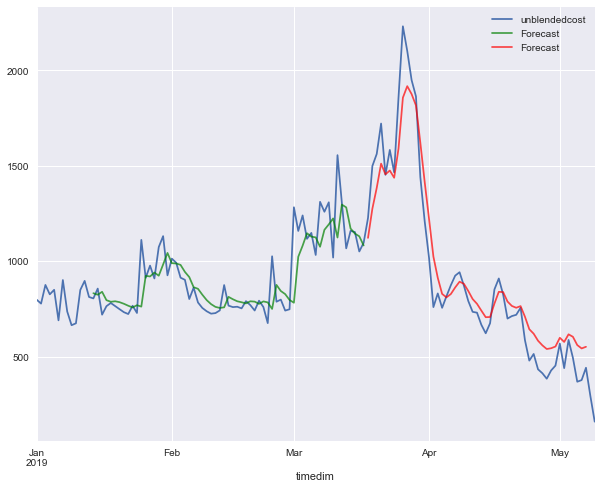

in sample
MAPE 17.28242096658117
rmse 128.51566966164984
out of sample
mape 38.2315294336175
rmse 133.58406340808847
[13, 64, 'relu', 0.003]
Epoch 1/1000
63/63 [==============================] - 4s 64ms/sample - loss: 0.4616 - mean_squared_error: 0.4616
Epoch 2/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.2357 - mean_squared_error: 0.2357
Epoch 3/1000
63/63 [==============================] - 0s 4ms/sample - loss: 0.1725 - mean_squared_error: 0.1725
Epoch 4/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.1236 - mean_squared_error: 0.1236
Epoch 5/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.0725 - mean_squared_error: 0.0725
Epoch 6/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.0656 - mean_squared_error: 0.0656
Epoch 7/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.0612 - mean_squared_error: 0.0612
Epoch 8/1000
63/63 [==============================] - 0s 3ms/sample - loss

63/63 [==============================] - 0s 3ms/sample - loss: 0.0163 - mean_squared_error: 0.0163
Epoch 72/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.0162 - mean_squared_error: 0.0162
Epoch 73/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.0162 - mean_squared_error: 0.0162
Epoch 74/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.0161 - mean_squared_error: 0.0161
Epoch 75/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.0160 - mean_squared_error: 0.0160
Epoch 76/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.0161 - mean_squared_error: 0.0161
Epoch 77/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.0160 - mean_squared_error: 0.0160
Epoch 78/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.0160 - mean_squared_error: 0.0160
Epoch 79/1000
63/63 [==============================] - 0s 3ms/sample - loss: 0.0159 - mean_squared_error: 0.01

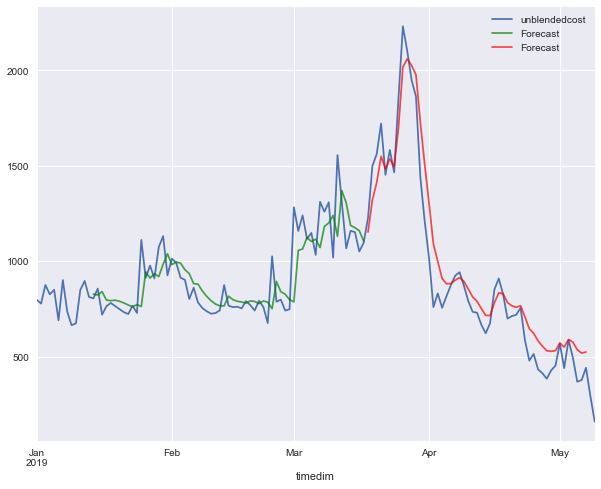

in sample
MAPE 17.599728464773598
rmse 130.8481252298728
out of sample
mape 39.9878811538864
rmse 130.39876243140964
[13, 64, 'relu', 0.01]
Epoch 1/1000
60/60 [==============================] - 4s 69ms/sample - loss: 0.8509 - mean_squared_error: 0.8509
Epoch 2/1000
60/60 [==============================] - 0s 997us/sample - loss: 0.8353 - mean_squared_error: 0.8353
Epoch 3/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.8199 - mean_squared_error: 0.8199
Epoch 4/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.8047 - mean_squared_error: 0.8047
Epoch 5/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.7894 - mean_squared_error: 0.7894
Epoch 6/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.7749 - mean_squared_error: 0.7749
Epoch 7/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.7603 - mean_squared_error: 0.7603
Epoch 8/1000
60/60 [==============================] - 0s 1ms/sample - los

60/60 [==============================] - 0s 1ms/sample - loss: 0.2048 - mean_squared_error: 0.2048
Epoch 72/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.2006 - mean_squared_error: 0.2006
Epoch 73/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.1965 - mean_squared_error: 0.1965
Epoch 74/1000
60/60 [==============================] - 0s 2ms/sample - loss: 0.1922 - mean_squared_error: 0.1922
Epoch 75/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.1883 - mean_squared_error: 0.1883
Epoch 76/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.1844 - mean_squared_error: 0.1844
Epoch 77/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.1807 - mean_squared_error: 0.1807
Epoch 78/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.1770 - mean_squared_error: 0.1770
Epoch 79/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.1733 - mean_squared_error: 0.17

60/60 [==============================] - 0s 1ms/sample - loss: 0.0853 - mean_squared_error: 0.0853
Epoch 144/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0851 - mean_squared_error: 0.0851
Epoch 145/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0848 - mean_squared_error: 0.0848
Epoch 146/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0846 - mean_squared_error: 0.0846
Epoch 147/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0844 - mean_squared_error: 0.0844
Epoch 148/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0842 - mean_squared_error: 0.0842
Epoch 149/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0839 - mean_squared_error: 0.0839
Epoch 150/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0838 - mean_squared_error: 0.0838
Epoch 151/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0836 - mean_squared_err

Epoch 215/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0750 - mean_squared_error: 0.0750
Epoch 216/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0749 - mean_squared_error: 0.0749
Epoch 217/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0748 - mean_squared_error: 0.0748
Epoch 218/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0746 - mean_squared_error: 0.0746
Epoch 219/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0745 - mean_squared_error: 0.0745
Epoch 220/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0744 - mean_squared_error: 0.0744
Epoch 221/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0743 - mean_squared_error: 0.0743
Epoch 222/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0742 - mean_squared_error: 0.0742
Epoch 223/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0740 - m

60/60 [==============================] - 0s 1ms/sample - loss: 0.0669 - mean_squared_error: 0.0669
Epoch 287/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0668 - mean_squared_error: 0.0668
Epoch 288/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0667 - mean_squared_error: 0.0667
Epoch 289/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0666 - mean_squared_error: 0.0666
Epoch 290/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0665 - mean_squared_error: 0.0665
Epoch 291/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0664 - mean_squared_error: 0.0664
Epoch 292/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0663 - mean_squared_error: 0.0663
Epoch 293/1000
60/60 [==============================] - 0s 2ms/sample - loss: 0.0662 - mean_squared_error: 0.0662
Epoch 294/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0661 - mean_squared_err

Epoch 358/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0595 - mean_squared_error: 0.0595
Epoch 359/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0594 - mean_squared_error: 0.0594
Epoch 360/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0593 - mean_squared_error: 0.0593
Epoch 361/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0593 - mean_squared_error: 0.0593
Epoch 362/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0592 - mean_squared_error: 0.0592
Epoch 363/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0591 - mean_squared_error: 0.0591
Epoch 364/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0590 - mean_squared_error: 0.0590
Epoch 365/1000
60/60 [==============================] - 0s 2ms/sample - loss: 0.0589 - mean_squared_error: 0.0589
Epoch 366/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0588 - m

60/60 [==============================] - 0s 781us/sample - loss: 0.0531 - mean_squared_error: 0.0531
Epoch 430/1000
60/60 [==============================] - 0s 781us/sample - loss: 0.0530 - mean_squared_error: 0.0530
Epoch 431/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0529 - mean_squared_error: 0.0529
Epoch 432/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0528 - mean_squared_error: 0.0528
Epoch 433/1000
60/60 [==============================] - 0s 781us/sample - loss: 0.0527 - mean_squared_error: 0.0527
Epoch 434/1000
60/60 [==============================] - 0s 781us/sample - loss: 0.0526 - mean_squared_error: 0.0526
Epoch 435/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0525 - mean_squared_error: 0.0525
Epoch 436/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0525 - mean_squared_error: 0.0525
Epoch 437/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0524 - mean_squ

60/60 [==============================] - 0s 2ms/sample - loss: 0.0473 - mean_squared_error: 0.0473
Epoch 501/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0472 - mean_squared_error: 0.0472
Epoch 502/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0472 - mean_squared_error: 0.0472
Epoch 503/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0471 - mean_squared_error: 0.0471
Epoch 504/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0470 - mean_squared_error: 0.0470
Epoch 505/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0469 - mean_squared_error: 0.0469
Epoch 506/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0469 - mean_squared_error: 0.0469
Epoch 507/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0468 - mean_squared_error: 0.0468
Epoch 508/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0467 - mean_squared_err

Epoch 572/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0422 - mean_squared_error: 0.0422
Epoch 573/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0421 - mean_squared_error: 0.0421
Epoch 574/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0421 - mean_squared_error: 0.0421
Epoch 575/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0420 - mean_squared_error: 0.0420
Epoch 576/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0419 - mean_squared_error: 0.0419
Epoch 577/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0419 - mean_squared_error: 0.0419
Epoch 578/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0418 - mean_squared_error: 0.0418
Epoch 579/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0417 - mean_squared_error: 0.0417
Epoch 580/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0417 - m

60/60 [==============================] - 0s 1ms/sample - loss: 0.0379 - mean_squared_error: 0.0379
Epoch 644/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0378 - mean_squared_error: 0.0378
Epoch 645/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0377 - mean_squared_error: 0.0377
Epoch 646/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0377 - mean_squared_error: 0.0377
Epoch 647/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0376 - mean_squared_error: 0.0376
Epoch 648/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0376 - mean_squared_error: 0.0376
Epoch 649/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0375 - mean_squared_error: 0.0375
Epoch 650/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0375 - mean_squared_error: 0.0375
Epoch 651/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0374 - mean_squared_err

60/60 [==============================] - 0s 1ms/sample - loss: 0.0343 - mean_squared_error: 0.0343
Epoch 715/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0342 - mean_squared_error: 0.0342
Epoch 716/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0342 - mean_squared_error: 0.0342
Epoch 717/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0341 - mean_squared_error: 0.0341
Epoch 718/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0341 - mean_squared_error: 0.0341
Epoch 719/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0340 - mean_squared_error: 0.0340
Epoch 720/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0340 - mean_squared_error: 0.0340
Epoch 721/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0340 - mean_squared_error: 0.0340
Epoch 722/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0339 - mean_squared_err

Epoch 786/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0314 - mean_squared_error: 0.0314
Epoch 787/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0314 - mean_squared_error: 0.0314
Epoch 788/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0313 - mean_squared_error: 0.0313
Epoch 789/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0313 - mean_squared_error: 0.0313
Epoch 790/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0313 - mean_squared_error: 0.0313
Epoch 791/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0312 - mean_squared_error: 0.0312
Epoch 792/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0312 - mean_squared_error: 0.0312
Epoch 793/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0312 - mean_squared_error: 0.0312
Epoch 794/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0311 - m

60/60 [==============================] - 0s 1ms/sample - loss: 0.0292 - mean_squared_error: 0.0292
Epoch 858/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0292 - mean_squared_error: 0.0292
Epoch 859/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0292 - mean_squared_error: 0.0292
Epoch 860/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0291 - mean_squared_error: 0.0291
Epoch 861/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0291 - mean_squared_error: 0.0291
Epoch 862/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0291 - mean_squared_error: 0.0291
Epoch 863/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0291 - mean_squared_error: 0.0291
Epoch 864/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0290 - mean_squared_error: 0.0290
Epoch 865/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0290 - mean_squared_err

Epoch 929/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0274 - mean_squared_error: 0.0274
Epoch 930/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0274 - mean_squared_error: 0.0274
Epoch 931/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0274 - mean_squared_error: 0.0274
Epoch 932/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0273 - mean_squared_error: 0.0273
Epoch 933/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0273 - mean_squared_error: 0.0273
Epoch 934/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0273 - mean_squared_error: 0.0273
Epoch 935/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0273 - mean_squared_error: 0.0273
Epoch 936/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0273 - mean_squared_error: 0.0273
Epoch 937/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0272 - m

60/60 [==============================] - 0s 1ms/sample - loss: 0.0259 - mean_squared_error: 0.0259


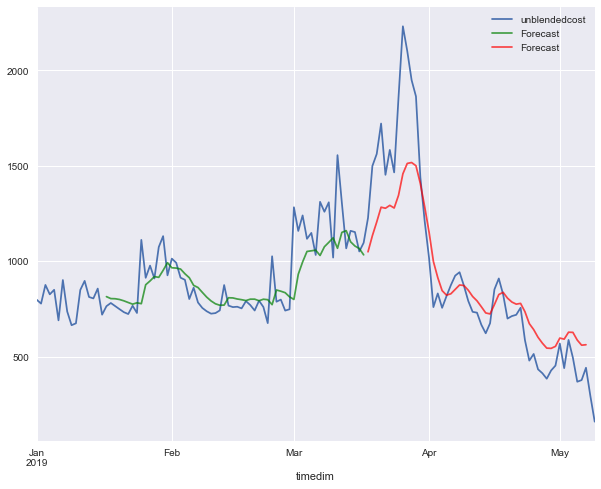

in sample
MAPE 16.700426578687534
rmse 140.00765701540166
out of sample
mape 37.452790467079275
rmse 228.33897303520797
[16, 16, 'tanh', 0.0001]
Epoch 1/1000
60/60 [==============================] - 4s 69ms/sample - loss: 0.7171 - mean_squared_error: 0.7171
Epoch 2/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.6820 - mean_squared_error: 0.6820
Epoch 3/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.6472 - mean_squared_error: 0.6472
Epoch 4/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.6137 - mean_squared_error: 0.6137
Epoch 5/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.5805 - mean_squared_error: 0.5805
Epoch 6/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.5488 - mean_squared_error: 0.5488
Epoch 7/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.5179 - mean_squared_error: 0.5179
Epoch 8/1000
60/60 [==============================] - 0s 1ms/sample - 

60/60 [==============================] - 0s 1ms/sample - loss: 0.0951 - mean_squared_error: 0.0951
Epoch 72/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0944 - mean_squared_error: 0.0944
Epoch 73/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0938 - mean_squared_error: 0.0938
Epoch 74/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0932 - mean_squared_error: 0.0932
Epoch 75/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0925 - mean_squared_error: 0.0925
Epoch 76/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0919 - mean_squared_error: 0.0919
Epoch 77/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0913 - mean_squared_error: 0.0913
Epoch 78/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0907 - mean_squared_error: 0.0907
Epoch 79/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0901 - mean_squared_error: 0.09

60/60 [==============================] - 0s 1ms/sample - loss: 0.0617 - mean_squared_error: 0.0617
Epoch 144/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0614 - mean_squared_error: 0.0614
Epoch 145/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0611 - mean_squared_error: 0.0611
Epoch 146/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0607 - mean_squared_error: 0.0607
Epoch 147/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0604 - mean_squared_error: 0.0604
Epoch 148/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0601 - mean_squared_error: 0.0601
Epoch 149/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0598 - mean_squared_error: 0.0598
Epoch 150/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0595 - mean_squared_error: 0.0595
Epoch 151/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0592 - mean_squared_err

Epoch 215/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0443 - mean_squared_error: 0.0443
Epoch 216/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0441 - mean_squared_error: 0.0441
Epoch 217/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0439 - mean_squared_error: 0.0439
Epoch 218/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0438 - mean_squared_error: 0.0438
Epoch 219/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0436 - mean_squared_error: 0.0436
Epoch 220/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0434 - mean_squared_error: 0.0434
Epoch 221/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0432 - mean_squared_error: 0.0432
Epoch 222/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0431 - mean_squared_error: 0.0431
Epoch 223/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0429 - m

60/60 [==============================] - 0s 1ms/sample - loss: 0.0349 - mean_squared_error: 0.0349
Epoch 287/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0348 - mean_squared_error: 0.0348
Epoch 288/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0347 - mean_squared_error: 0.0347
Epoch 289/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0346 - mean_squared_error: 0.0346
Epoch 290/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0345 - mean_squared_error: 0.0345
Epoch 291/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0344 - mean_squared_error: 0.0344
Epoch 292/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0343 - mean_squared_error: 0.0343
Epoch 293/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0342 - mean_squared_error: 0.0342
Epoch 294/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0341 - mean_squared_err

Epoch 358/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0295 - mean_squared_error: 0.0295
Epoch 359/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0295 - mean_squared_error: 0.0295
Epoch 360/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0294 - mean_squared_error: 0.0294
Epoch 361/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0293 - mean_squared_error: 0.0293
Epoch 362/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0293 - mean_squared_error: 0.0293
Epoch 363/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0292 - mean_squared_error: 0.0292
Epoch 364/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0292 - mean_squared_error: 0.0292
Epoch 365/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0291 - mean_squared_error: 0.0291
Epoch 366/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0291 - m

60/60 [==============================] - 0s 1ms/sample - loss: 0.0259 - mean_squared_error: 0.0259
Epoch 430/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0259 - mean_squared_error: 0.0259
Epoch 431/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0259 - mean_squared_error: 0.0259
Epoch 432/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0258 - mean_squared_error: 0.0258
Epoch 433/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0258 - mean_squared_error: 0.0258
Epoch 434/1000
60/60 [==============================] - 0s 2ms/sample - loss: 0.0257 - mean_squared_error: 0.0257
Epoch 435/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0257 - mean_squared_error: 0.0257
Epoch 436/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0256 - mean_squared_error: 0.0256
Epoch 437/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0256 - mean_squared_err

Epoch 501/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0232 - mean_squared_error: 0.0232
Epoch 502/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0232 - mean_squared_error: 0.0232
Epoch 503/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0231 - mean_squared_error: 0.0231
Epoch 504/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0231 - mean_squared_error: 0.0231
Epoch 505/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0231 - mean_squared_error: 0.0231
Epoch 506/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0230 - mean_squared_error: 0.0230
Epoch 507/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0230 - mean_squared_error: 0.0230
Epoch 508/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0230 - mean_squared_error: 0.0230
Epoch 509/1000
60/60 [==============================] - 0s 997us/sample - loss: 0.0229 -

60/60 [==============================] - 0s 1ms/sample - loss: 0.0211 - mean_squared_error: 0.0211
Epoch 573/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0211 - mean_squared_error: 0.0211
Epoch 574/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0210 - mean_squared_error: 0.0210
Epoch 575/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0210 - mean_squared_error: 0.0210
Epoch 576/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0210 - mean_squared_error: 0.0210
Epoch 577/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0210 - mean_squared_error: 0.0210
Epoch 578/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0209 - mean_squared_error: 0.0209
Epoch 579/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0209 - mean_squared_error: 0.0209
Epoch 580/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0209 - mean_squared_err

60/60 [==============================] - 0s 1ms/sample - loss: 0.0194 - mean_squared_error: 0.0194
Epoch 644/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0194 - mean_squared_error: 0.0194
Epoch 645/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0194 - mean_squared_error: 0.0194
Epoch 646/1000
60/60 [==============================] - 0s 997us/sample - loss: 0.0194 - mean_squared_error: 0.0194
Epoch 647/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0193 - mean_squared_error: 0.0193
Epoch 648/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0193 - mean_squared_error: 0.0193
Epoch 649/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0193 - mean_squared_error: 0.0193
Epoch 650/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0193 - mean_squared_error: 0.0193
Epoch 651/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0193 - mean_squared_e

Epoch 715/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0181 - mean_squared_error: 0.0181
Epoch 716/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0181 - mean_squared_error: 0.0181
Epoch 717/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0181 - mean_squared_error: 0.0181
Epoch 718/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0181 - mean_squared_error: 0.0181
Epoch 719/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0180 - mean_squared_error: 0.0180
Epoch 720/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0180 - mean_squared_error: 0.0180
Epoch 721/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0180 - mean_squared_error: 0.0180
Epoch 722/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0180 - mean_squared_error: 0.0180
Epoch 723/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0180 - m

60/60 [==============================] - 0s 1ms/sample - loss: 0.0172 - mean_squared_error: 0.0172
Epoch 787/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0172 - mean_squared_error: 0.0172
Epoch 788/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0172 - mean_squared_error: 0.0172
Epoch 789/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0172 - mean_squared_error: 0.0172
Epoch 790/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0172 - mean_squared_error: 0.0172
Epoch 791/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0171 - mean_squared_error: 0.0171
Epoch 792/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0171 - mean_squared_error: 0.0171
Epoch 793/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0171 - mean_squared_error: 0.0171
Epoch 794/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0171 - mean_squared_err

Epoch 858/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0166 - mean_squared_error: 0.0166
Epoch 859/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0166 - mean_squared_error: 0.0166
Epoch 860/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0166 - mean_squared_error: 0.0166
Epoch 861/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0166 - mean_squared_error: 0.0166
Epoch 862/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0166 - mean_squared_error: 0.0166
Epoch 863/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0166 - mean_squared_error: 0.0166
Epoch 864/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0165 - mean_squared_error: 0.0165
Epoch 865/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0165 - mean_squared_error: 0.0165
Epoch 866/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0165 - m

60/60 [==============================] - 0s 1ms/sample - loss: 0.0162 - mean_squared_error: 0.0162
Epoch 930/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0162 - mean_squared_error: 0.0162
Epoch 931/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0162 - mean_squared_error: 0.0162
Epoch 932/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0162 - mean_squared_error: 0.0162
Epoch 933/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0161 - mean_squared_error: 0.0161
Epoch 934/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0161 - mean_squared_error: 0.0161
Epoch 935/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0161 - mean_squared_error: 0.0161
Epoch 936/1000
60/60 [==============================] - 0s 2ms/sample - loss: 0.0161 - mean_squared_error: 0.0161
Epoch 937/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0161 - mean_squared_err

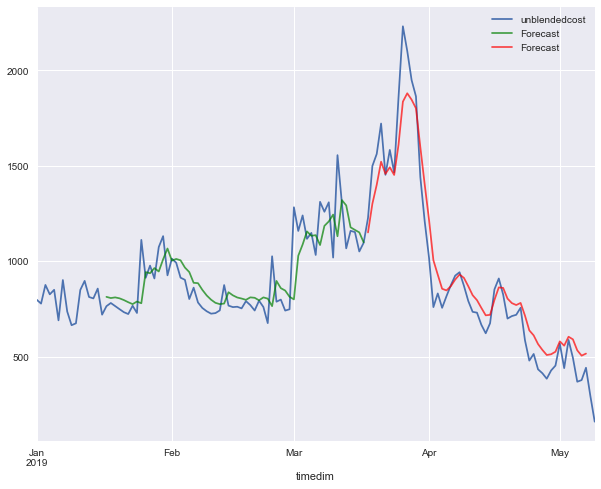

in sample
MAPE 18.46989088043521
rmse 132.1992159314084
out of sample
mape 39.313518251708366
rmse 127.69933932903396
[16, 16, 'tanh', 0.0003]
Epoch 1/1000
60/60 [==============================] - 4s 66ms/sample - loss: 0.7947 - mean_squared_error: 0.7947
Epoch 2/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.6824 - mean_squared_error: 0.6824
Epoch 3/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.5797 - mean_squared_error: 0.5797
Epoch 4/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.4852 - mean_squared_error: 0.4852
Epoch 5/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.3994 - mean_squared_error: 0.3994
Epoch 6/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.3240 - mean_squared_error: 0.3240
Epoch 7/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.2586 - mean_squared_error: 0.2586
Epoch 8/1000
60/60 [==============================] - 0s 1ms/sample - lo

60/60 [==============================] - 0s 1ms/sample - loss: 0.0388 - mean_squared_error: 0.0388
Epoch 72/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0385 - mean_squared_error: 0.0385
Epoch 73/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0382 - mean_squared_error: 0.0382
Epoch 74/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0378 - mean_squared_error: 0.0378
Epoch 75/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0375 - mean_squared_error: 0.0375
Epoch 76/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0372 - mean_squared_error: 0.0372
Epoch 77/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0369 - mean_squared_error: 0.0369
Epoch 78/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0366 - mean_squared_error: 0.0366
Epoch 79/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0363 - mean_squared_error: 0.03

60/60 [==============================] - 0s 1ms/sample - loss: 0.0247 - mean_squared_error: 0.0247
Epoch 144/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0246 - mean_squared_error: 0.0246
Epoch 145/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0245 - mean_squared_error: 0.0245
Epoch 146/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0244 - mean_squared_error: 0.0244
Epoch 147/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0243 - mean_squared_error: 0.0243
Epoch 148/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0242 - mean_squared_error: 0.0242
Epoch 149/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0241 - mean_squared_error: 0.0241
Epoch 150/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0240 - mean_squared_error: 0.0240
Epoch 151/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0239 - mean_squared_err

Epoch 215/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0193 - mean_squared_error: 0.0193
Epoch 216/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0193 - mean_squared_error: 0.0193
Epoch 217/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0192 - mean_squared_error: 0.0192
Epoch 218/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0192 - mean_squared_error: 0.0192
Epoch 219/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0191 - mean_squared_error: 0.0191
Epoch 220/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0191 - mean_squared_error: 0.0191
Epoch 221/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0190 - mean_squared_error: 0.0190
Epoch 222/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0190 - mean_squared_error: 0.0190
Epoch 223/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0189 - m

60/60 [==============================] - 0s 1ms/sample - loss: 0.0171 - mean_squared_error: 0.0171
Epoch 287/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0171 - mean_squared_error: 0.0171
Epoch 288/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0170 - mean_squared_error: 0.0170
Epoch 289/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0170 - mean_squared_error: 0.0170
Epoch 290/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0170 - mean_squared_error: 0.0170
Epoch 291/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0170 - mean_squared_error: 0.0170
Epoch 292/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0170 - mean_squared_error: 0.0170
Epoch 293/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0170 - mean_squared_error: 0.0170
Epoch 294/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0169 - mean_squared_err

Epoch 358/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0161 - mean_squared_error: 0.0161
Epoch 359/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0161 - mean_squared_error: 0.0161
Epoch 360/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0161 - mean_squared_error: 0.0161
Epoch 361/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0161 - mean_squared_error: 0.0161
Epoch 362/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0161 - mean_squared_error: 0.0161
Epoch 363/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0161 - mean_squared_error: 0.0161
Epoch 364/1000
60/60 [==============================] - 0s 2ms/sample - loss: 0.0161 - mean_squared_error: 0.0161
Epoch 365/1000
60/60 [==============================] - 0s 2ms/sample - loss: 0.0161 - mean_squared_error: 0.0161
Epoch 366/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0161 - m

60/60 [==============================] - 0s 1ms/sample - loss: 0.0157 - mean_squared_error: 0.0157
Epoch 430/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0157 - mean_squared_error: 0.0157
Epoch 431/1000
60/60 [==============================] - 0s 2ms/sample - loss: 0.0157 - mean_squared_error: 0.0157
Epoch 432/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0157 - mean_squared_error: 0.0157
Epoch 433/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0157 - mean_squared_error: 0.0157
Epoch 434/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0157 - mean_squared_error: 0.0157
Epoch 435/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0157 - mean_squared_error: 0.0157
Epoch 436/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0157 - mean_squared_error: 0.0157
Epoch 437/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0157 - mean_squared_err

Epoch 501/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0155 - mean_squared_error: 0.0155
Epoch 502/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0155 - mean_squared_error: 0.0155
Epoch 503/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0155 - mean_squared_error: 0.0155
Epoch 504/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0155 - mean_squared_error: 0.0155
Epoch 505/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0155 - mean_squared_error: 0.0155
Epoch 506/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0154 - mean_squared_error: 0.0154
Epoch 507/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0154 - mean_squared_error: 0.0154
Epoch 508/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0154 - mean_squared_error: 0.0154
Epoch 509/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0154 - m

60/60 [==============================] - 0s 1ms/sample - loss: 0.0153 - mean_squared_error: 0.0153
Epoch 573/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0153 - mean_squared_error: 0.0153
Epoch 00573: early stopping


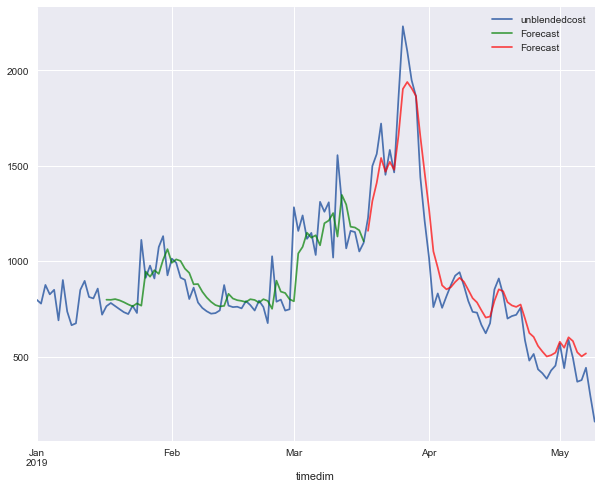

in sample
MAPE 18.57270363139673
rmse 132.70012048211103
out of sample
mape 39.70306054363794
rmse 123.12567731518278
[16, 16, 'tanh', 0.001]
Epoch 1/1000
60/60 [==============================] - 4s 68ms/sample - loss: 0.7296 - mean_squared_error: 0.7296
Epoch 2/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.4951 - mean_squared_error: 0.4951
Epoch 3/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.3188 - mean_squared_error: 0.3188
Epoch 4/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.1825 - mean_squared_error: 0.1825
Epoch 5/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.1018 - mean_squared_error: 0.1018
Epoch 6/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0928 - mean_squared_error: 0.0928
Epoch 7/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0994 - mean_squared_error: 0.0994
Epoch 8/1000
60/60 [==============================] - 0s 1ms/sample - los

60/60 [==============================] - 0s 1ms/sample - loss: 0.0195 - mean_squared_error: 0.0195
Epoch 72/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0193 - mean_squared_error: 0.0193
Epoch 73/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0192 - mean_squared_error: 0.0192
Epoch 74/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0190 - mean_squared_error: 0.0190
Epoch 75/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0188 - mean_squared_error: 0.0188
Epoch 76/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0187 - mean_squared_error: 0.0187
Epoch 77/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0185 - mean_squared_error: 0.0185
Epoch 78/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0184 - mean_squared_error: 0.0184
Epoch 79/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0182 - mean_squared_error: 0.01

60/60 [==============================] - 0s 1ms/sample - loss: 0.0154 - mean_squared_error: 0.0154
Epoch 144/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0154 - mean_squared_error: 0.0154
Epoch 145/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0154 - mean_squared_error: 0.0154
Epoch 00145: early stopping


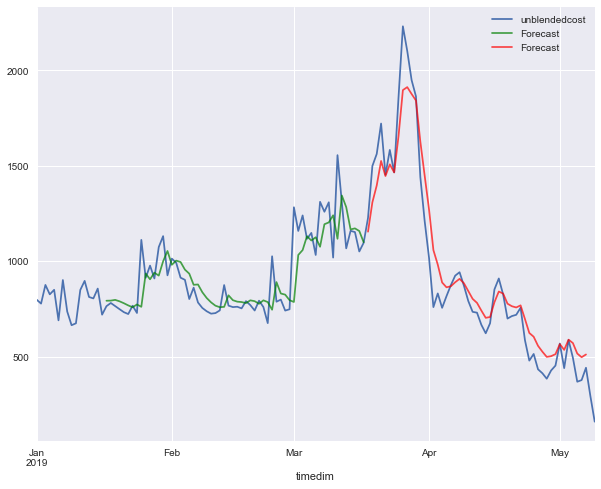

in sample
MAPE 18.330612599875302
rmse 133.1263760999901
out of sample
mape 39.77985923782587
rmse 124.3173665285947
[16, 16, 'tanh', 0.003]
Epoch 1/1000
60/60 [==============================] - 5s 77ms/sample - loss: 0.4829 - mean_squared_error: 0.4829
Epoch 2/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.1051 - mean_squared_error: 0.1051
Epoch 3/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.1122 - mean_squared_error: 0.1122
Epoch 4/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0601 - mean_squared_error: 0.0601
Epoch 5/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0560 - mean_squared_error: 0.0560
Epoch 6/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0522 - mean_squared_error: 0.0522
Epoch 7/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0402 - mean_squared_error: 0.0402
Epoch 8/1000
60/60 [==============================] - 0s 2ms/sample - loss

60/60 [==============================] - 0s 1ms/sample - loss: 0.0158 - mean_squared_error: 0.0158
Epoch 00071: early stopping


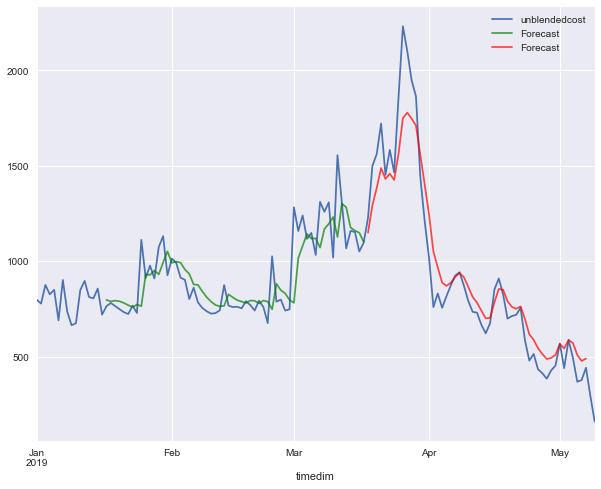

in sample
MAPE 18.051770003303172
rmse 132.4193619307428
out of sample
mape 39.706831811689476
rmse 142.9500599956817
[16, 16, 'tanh', 0.01]
Epoch 1/1000
60/60 [==============================] - 5s 77ms/sample - loss: 0.4386 - mean_squared_error: 0.4386
Epoch 2/1000
60/60 [==============================] - 0s 2ms/sample - loss: 0.4339 - mean_squared_error: 0.4339
Epoch 3/1000
60/60 [==============================] - 0s 2ms/sample - loss: 0.4292 - mean_squared_error: 0.4292
Epoch 4/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.4245 - mean_squared_error: 0.4245
Epoch 5/1000
60/60 [==============================] - 0s 2ms/sample - loss: 0.4197 - mean_squared_error: 0.4197
Epoch 6/1000
60/60 [==============================] - 0s 2ms/sample - loss: 0.4152 - mean_squared_error: 0.4152
Epoch 7/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.4104 - mean_squared_error: 0.4104
Epoch 8/1000
60/60 [==============================] - 0s 1ms/sample - loss

60/60 [==============================] - 0s 1ms/sample - loss: 0.1382 - mean_squared_error: 0.1382
Epoch 72/1000
60/60 [==============================] - 0s 2ms/sample - loss: 0.1359 - mean_squared_error: 0.1359
Epoch 73/1000
60/60 [==============================] - 0s 2ms/sample - loss: 0.1336 - mean_squared_error: 0.1336
Epoch 74/1000
60/60 [==============================] - 0s 2ms/sample - loss: 0.1314 - mean_squared_error: 0.1314
Epoch 75/1000
60/60 [==============================] - 0s 2ms/sample - loss: 0.1293 - mean_squared_error: 0.1293
Epoch 76/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.1274 - mean_squared_error: 0.1274
Epoch 77/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.1256 - mean_squared_error: 0.1256
Epoch 78/1000
60/60 [==============================] - 0s 2ms/sample - loss: 0.1239 - mean_squared_error: 0.1239
Epoch 79/1000
60/60 [==============================] - 0s 2ms/sample - loss: 0.1223 - mean_squared_error: 0.12

60/60 [==============================] - 0s 1ms/sample - loss: 0.0846 - mean_squared_error: 0.0846
Epoch 144/1000
60/60 [==============================] - 0s 3ms/sample - loss: 0.0842 - mean_squared_error: 0.0842
Epoch 145/1000
60/60 [==============================] - 0s 2ms/sample - loss: 0.0838 - mean_squared_error: 0.0838
Epoch 146/1000
60/60 [==============================] - 0s 2ms/sample - loss: 0.0834 - mean_squared_error: 0.08340s - loss: 0.0853 - mean_squared_error: 0.08
Epoch 147/1000
60/60 [==============================] - 0s 2ms/sample - loss: 0.0830 - mean_squared_error: 0.0830
Epoch 148/1000
60/60 [==============================] - 0s 2ms/sample - loss: 0.0826 - mean_squared_error: 0.0826
Epoch 149/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0822 - mean_squared_error: 0.0822
Epoch 150/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0818 - mean_squared_error: 0.0818
Epoch 151/1000
60/60 [==============================] - 0s 

60/60 [==============================] - 0s 2ms/sample - loss: 0.0642 - mean_squared_error: 0.0642
Epoch 215/1000
60/60 [==============================] - 0s 2ms/sample - loss: 0.0641 - mean_squared_error: 0.0641
Epoch 216/1000
60/60 [==============================] - 0s 2ms/sample - loss: 0.0639 - mean_squared_error: 0.0639
Epoch 217/1000
60/60 [==============================] - 0s 2ms/sample - loss: 0.0637 - mean_squared_error: 0.0637
Epoch 218/1000
60/60 [==============================] - 0s 2ms/sample - loss: 0.0635 - mean_squared_error: 0.0635
Epoch 219/1000
60/60 [==============================] - 0s 2ms/sample - loss: 0.0634 - mean_squared_error: 0.0634
Epoch 220/1000
60/60 [==============================] - 0s 2ms/sample - loss: 0.0632 - mean_squared_error: 0.0632
Epoch 221/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0631 - mean_squared_error: 0.0631
Epoch 222/1000
60/60 [==============================] - 0s 2ms/sample - loss: 0.0629 - mean_squared_err

Epoch 286/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0549 - mean_squared_error: 0.0549
Epoch 287/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0548 - mean_squared_error: 0.0548
Epoch 288/1000
60/60 [==============================] - 0s 2ms/sample - loss: 0.0547 - mean_squared_error: 0.0547
Epoch 289/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0546 - mean_squared_error: 0.0546
Epoch 290/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0545 - mean_squared_error: 0.0545
Epoch 291/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0544 - mean_squared_error: 0.0544
Epoch 292/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0543 - mean_squared_error: 0.0543
Epoch 293/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0542 - mean_squared_error: 0.0542
Epoch 294/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0541 - m

60/60 [==============================] - 0s 1ms/sample - loss: 0.0482 - mean_squared_error: 0.0482
Epoch 358/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0481 - mean_squared_error: 0.0481
Epoch 359/1000
60/60 [==============================] - 0s 2ms/sample - loss: 0.0481 - mean_squared_error: 0.0481
Epoch 360/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0480 - mean_squared_error: 0.0480
Epoch 361/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0479 - mean_squared_error: 0.0479
Epoch 362/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0478 - mean_squared_error: 0.0478
Epoch 363/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0477 - mean_squared_error: 0.0477
Epoch 364/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0476 - mean_squared_error: 0.0476
Epoch 365/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0476 - mean_squared_err

Epoch 429/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0427 - mean_squared_error: 0.0427
Epoch 430/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0427 - mean_squared_error: 0.0427
Epoch 431/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0426 - mean_squared_error: 0.0426
Epoch 432/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0425 - mean_squared_error: 0.0425
Epoch 433/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0425 - mean_squared_error: 0.0425
Epoch 434/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0424 - mean_squared_error: 0.0424
Epoch 435/1000
60/60 [==============================] - 0s 2ms/sample - loss: 0.0423 - mean_squared_error: 0.0423
Epoch 436/1000
60/60 [==============================] - 0s 2ms/sample - loss: 0.0423 - mean_squared_error: 0.0423
Epoch 437/1000
60/60 [==============================] - 0s 2ms/sample - loss: 0.0422 - m

60/60 [==============================] - 0s 1ms/sample - loss: 0.0383 - mean_squared_error: 0.0383
Epoch 501/1000
60/60 [==============================] - 0s 2ms/sample - loss: 0.0383 - mean_squared_error: 0.0383
Epoch 502/1000
60/60 [==============================] - 0s 2ms/sample - loss: 0.0382 - mean_squared_error: 0.0382
Epoch 503/1000
60/60 [==============================] - 0s 2ms/sample - loss: 0.0382 - mean_squared_error: 0.0382
Epoch 504/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0381 - mean_squared_error: 0.0381
Epoch 505/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0380 - mean_squared_error: 0.0380
Epoch 506/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0380 - mean_squared_error: 0.0380
Epoch 507/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0379 - mean_squared_error: 0.0379
Epoch 508/1000
60/60 [==============================] - 0s 2ms/sample - loss: 0.0379 - mean_squared_err

Epoch 572/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0346 - mean_squared_error: 0.0346
Epoch 573/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0346 - mean_squared_error: 0.0346
Epoch 574/1000
60/60 [==============================] - 0s 2ms/sample - loss: 0.0345 - mean_squared_error: 0.0345
Epoch 575/1000
60/60 [==============================] - 0s 2ms/sample - loss: 0.0345 - mean_squared_error: 0.0345
Epoch 576/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0344 - mean_squared_error: 0.0344
Epoch 577/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0344 - mean_squared_error: 0.0344
Epoch 578/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0343 - mean_squared_error: 0.0343
Epoch 579/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0343 - mean_squared_error: 0.0343
Epoch 580/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0342 - m

60/60 [==============================] - 0s 1ms/sample - loss: 0.0315 - mean_squared_error: 0.0315
Epoch 644/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0315 - mean_squared_error: 0.0315
Epoch 645/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0314 - mean_squared_error: 0.0314
Epoch 646/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0314 - mean_squared_error: 0.0314
Epoch 647/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0314 - mean_squared_error: 0.0314
Epoch 648/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0313 - mean_squared_error: 0.0313
Epoch 649/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0313 - mean_squared_error: 0.0313
Epoch 650/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0313 - mean_squared_error: 0.0313
Epoch 651/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0312 - mean_squared_err

Epoch 715/1000
60/60 [==============================] - 0s 2ms/sample - loss: 0.0289 - mean_squared_error: 0.0289
Epoch 716/1000
60/60 [==============================] - 0s 2ms/sample - loss: 0.0289 - mean_squared_error: 0.0289
Epoch 717/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0288 - mean_squared_error: 0.0288
Epoch 718/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0288 - mean_squared_error: 0.0288
Epoch 719/1000
60/60 [==============================] - 0s 2ms/sample - loss: 0.0288 - mean_squared_error: 0.0288
Epoch 720/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0287 - mean_squared_error: 0.0287
Epoch 721/1000
60/60 [==============================] - 0s 2ms/sample - loss: 0.0287 - mean_squared_error: 0.0287
Epoch 722/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0287 - mean_squared_error: 0.0287
Epoch 723/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0286 - m

60/60 [==============================] - 0s 1ms/sample - loss: 0.0267 - mean_squared_error: 0.0267
Epoch 787/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0267 - mean_squared_error: 0.0267
Epoch 788/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0267 - mean_squared_error: 0.0267
Epoch 789/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0266 - mean_squared_error: 0.0266
Epoch 790/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0266 - mean_squared_error: 0.0266
Epoch 791/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0266 - mean_squared_error: 0.0266
Epoch 792/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0265 - mean_squared_error: 0.0265
Epoch 793/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0265 - mean_squared_error: 0.0265
Epoch 794/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0265 - mean_squared_err

Epoch 858/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0248 - mean_squared_error: 0.0248
Epoch 859/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0248 - mean_squared_error: 0.0248
Epoch 860/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0248 - mean_squared_error: 0.0248
Epoch 861/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0248 - mean_squared_error: 0.0248
Epoch 862/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0248 - mean_squared_error: 0.0248
Epoch 863/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0247 - mean_squared_error: 0.0247
Epoch 864/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0247 - mean_squared_error: 0.0247
Epoch 865/1000
60/60 [==============================] - 0s 2ms/sample - loss: 0.0247 - mean_squared_error: 0.0247
Epoch 866/1000
60/60 [==============================] - 0s 2ms/sample - loss: 0.0247 - m

60/60 [==============================] - 0s 1ms/sample - loss: 0.0233 - mean_squared_error: 0.0233
Epoch 930/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0233 - mean_squared_error: 0.0233
Epoch 931/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0232 - mean_squared_error: 0.0232
Epoch 932/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0232 - mean_squared_error: 0.0232
Epoch 933/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0232 - mean_squared_error: 0.0232
Epoch 934/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0232 - mean_squared_error: 0.0232
Epoch 935/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0232 - mean_squared_error: 0.0232
Epoch 936/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0231 - mean_squared_error: 0.0231
Epoch 937/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0231 - mean_squared_err

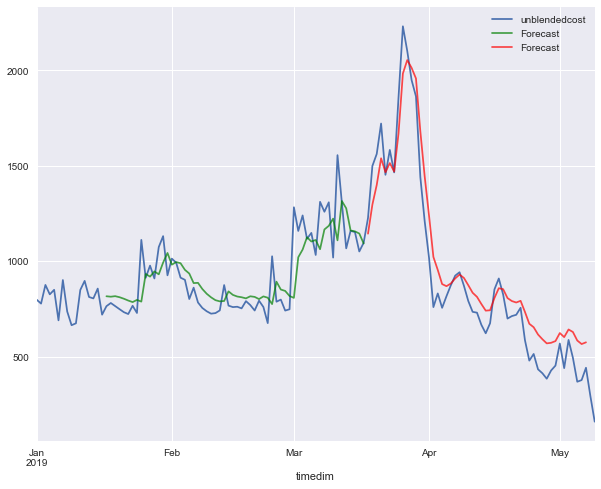

in sample
MAPE 17.86590870500521
rmse 133.37854429773412
out of sample
mape 39.33433069768958
rmse 135.78119805319815
[16, 16, 'relu', 0.0001]
Epoch 1/1000
60/60 [==============================] - 4s 74ms/sample - loss: 0.9061 - mean_squared_error: 0.9061
Epoch 2/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.8843 - mean_squared_error: 0.8843
Epoch 3/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.8630 - mean_squared_error: 0.8630
Epoch 4/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.8426 - mean_squared_error: 0.8426
Epoch 5/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.8223 - mean_squared_error: 0.8223
Epoch 6/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.8032 - mean_squared_error: 0.8032
Epoch 7/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.7847 - mean_squared_error: 0.7847
Epoch 8/1000
60/60 [==============================] - 0s 2ms/sample - lo

60/60 [==============================] - 0s 1ms/sample - loss: 0.0852 - mean_squared_error: 0.0852
Epoch 72/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0843 - mean_squared_error: 0.0843
Epoch 73/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0835 - mean_squared_error: 0.0835
Epoch 74/1000
60/60 [==============================] - 0s 2ms/sample - loss: 0.0827 - mean_squared_error: 0.0827
Epoch 75/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0820 - mean_squared_error: 0.0820
Epoch 76/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0813 - mean_squared_error: 0.0813
Epoch 77/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0806 - mean_squared_error: 0.0806
Epoch 78/1000
60/60 [==============================] - 0s 2ms/sample - loss: 0.0799 - mean_squared_error: 0.0799
Epoch 79/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0792 - mean_squared_error: 0.07

60/60 [==============================] - 0s 1ms/sample - loss: 0.0532 - mean_squared_error: 0.0532
Epoch 144/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0529 - mean_squared_error: 0.0529
Epoch 145/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0527 - mean_squared_error: 0.0527
Epoch 146/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0524 - mean_squared_error: 0.0524
Epoch 147/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0522 - mean_squared_error: 0.0522
Epoch 148/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0519 - mean_squared_error: 0.0519
Epoch 149/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0518 - mean_squared_error: 0.0518
Epoch 150/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0515 - mean_squared_error: 0.0515
Epoch 151/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0512 - mean_squared_err

Epoch 215/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0404 - mean_squared_error: 0.0404
Epoch 216/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0403 - mean_squared_error: 0.0403
Epoch 217/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0402 - mean_squared_error: 0.0402
Epoch 218/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0400 - mean_squared_error: 0.0400
Epoch 219/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0399 - mean_squared_error: 0.0399
Epoch 220/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0398 - mean_squared_error: 0.0398
Epoch 221/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0397 - mean_squared_error: 0.0397
Epoch 222/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0395 - mean_squared_error: 0.0395
Epoch 223/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0394 - m

60/60 [==============================] - 0s 1ms/sample - loss: 0.0332 - mean_squared_error: 0.0332
Epoch 287/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0331 - mean_squared_error: 0.0331
Epoch 288/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0330 - mean_squared_error: 0.0330
Epoch 289/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0330 - mean_squared_error: 0.0330
Epoch 290/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0329 - mean_squared_error: 0.0329
Epoch 291/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0328 - mean_squared_error: 0.0328
Epoch 292/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0327 - mean_squared_error: 0.0327
Epoch 293/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0327 - mean_squared_error: 0.0327
Epoch 294/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0326 - mean_squared_err

Epoch 358/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0284 - mean_squared_error: 0.0284
Epoch 359/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0283 - mean_squared_error: 0.0283
Epoch 360/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0282 - mean_squared_error: 0.0282
Epoch 361/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0282 - mean_squared_error: 0.0282
Epoch 362/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0281 - mean_squared_error: 0.0281
Epoch 363/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0281 - mean_squared_error: 0.0281
Epoch 364/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0280 - mean_squared_error: 0.0280
Epoch 365/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0279 - mean_squared_error: 0.0279
Epoch 366/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0279 - m

60/60 [==============================] - 0s 1ms/sample - loss: 0.0248 - mean_squared_error: 0.0248
Epoch 430/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0248 - mean_squared_error: 0.0248
Epoch 431/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0247 - mean_squared_error: 0.0247
Epoch 432/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0247 - mean_squared_error: 0.0247
Epoch 433/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0247 - mean_squared_error: 0.0247
Epoch 434/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0246 - mean_squared_error: 0.0246
Epoch 435/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0246 - mean_squared_error: 0.0246
Epoch 436/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0246 - mean_squared_error: 0.0246
Epoch 437/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0245 - mean_squared_err

Epoch 501/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0222 - mean_squared_error: 0.0222
Epoch 502/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0222 - mean_squared_error: 0.0222
Epoch 503/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0221 - mean_squared_error: 0.0221
Epoch 504/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0221 - mean_squared_error: 0.0221
Epoch 505/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0220 - mean_squared_error: 0.0220
Epoch 506/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0220 - mean_squared_error: 0.0220
Epoch 507/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0220 - mean_squared_error: 0.0220
Epoch 508/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0220 - mean_squared_error: 0.0220
Epoch 509/1000
60/60 [==============================] - 0s 2ms/sample - loss: 0.0219 - m

60/60 [==============================] - 0s 1ms/sample - loss: 0.0201 - mean_squared_error: 0.0201
Epoch 573/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0201 - mean_squared_error: 0.0201
Epoch 574/1000
60/60 [==============================] - 0s 2ms/sample - loss: 0.0201 - mean_squared_error: 0.0201
Epoch 575/1000
60/60 [==============================] - 0s 2ms/sample - loss: 0.0201 - mean_squared_error: 0.0201
Epoch 576/1000
60/60 [==============================] - 0s 2ms/sample - loss: 0.0200 - mean_squared_error: 0.0200
Epoch 577/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0200 - mean_squared_error: 0.0200
Epoch 578/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0200 - mean_squared_error: 0.0200
Epoch 579/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0200 - mean_squared_error: 0.0200
Epoch 580/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0200 - mean_squared_err

Epoch 644/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0188 - mean_squared_error: 0.0188
Epoch 645/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0187 - mean_squared_error: 0.0187
Epoch 646/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0187 - mean_squared_error: 0.0187
Epoch 647/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0188 - mean_squared_error: 0.0188
Epoch 648/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0187 - mean_squared_error: 0.0187
Epoch 649/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0187 - mean_squared_error: 0.0187
Epoch 650/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0187 - mean_squared_error: 0.0187
Epoch 651/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0187 - mean_squared_error: 0.0187
Epoch 652/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0186 - m

60/60 [==============================] - 0s 1ms/sample - loss: 0.0177 - mean_squared_error: 0.0177
Epoch 716/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0177 - mean_squared_error: 0.0177
Epoch 717/1000
60/60 [==============================] - 0s 2ms/sample - loss: 0.0177 - mean_squared_error: 0.0177
Epoch 718/1000
60/60 [==============================] - 0s 2ms/sample - loss: 0.0177 - mean_squared_error: 0.0177
Epoch 719/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0177 - mean_squared_error: 0.0177
Epoch 720/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0177 - mean_squared_error: 0.0177
Epoch 721/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0176 - mean_squared_error: 0.0176
Epoch 722/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0176 - mean_squared_error: 0.0176
Epoch 723/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0176 - mean_squared_err

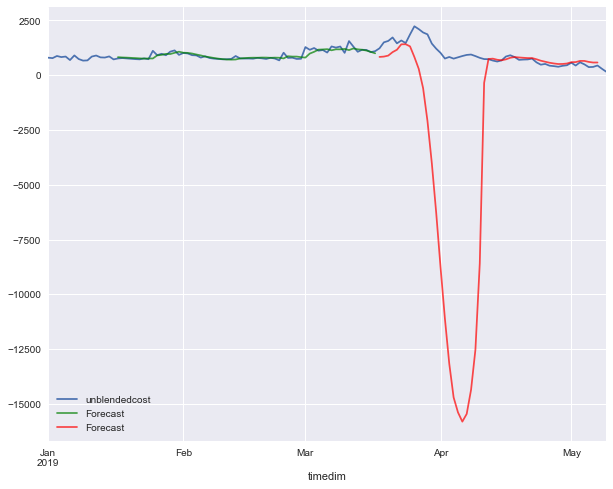

in sample
MAPE 18.04560047163706
rmse 126.32157081598041
out of sample
mape 59.82762313740518
rmse 6414.866173404136
[16, 16, 'relu', 0.0003]
Epoch 1/1000
60/60 [==============================] - 4s 72ms/sample - loss: 0.8244 - mean_squared_error: 0.8244
Epoch 2/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.7569 - mean_squared_error: 0.7569
Epoch 3/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.6914 - mean_squared_error: 0.6914
Epoch 4/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.6292 - mean_squared_error: 0.6292
Epoch 5/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.5690 - mean_squared_error: 0.5690
Epoch 6/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.5090 - mean_squared_error: 0.5090
Epoch 7/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.4503 - mean_squared_error: 0.4503
Epoch 8/1000
60/60 [==============================] - 0s 1ms/sample - los

60/60 [==============================] - 0s 1ms/sample - loss: 0.0456 - mean_squared_error: 0.0456
Epoch 72/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0451 - mean_squared_error: 0.0451
Epoch 73/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0446 - mean_squared_error: 0.0446
Epoch 74/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0440 - mean_squared_error: 0.0440
Epoch 75/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0436 - mean_squared_error: 0.0436
Epoch 76/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0432 - mean_squared_error: 0.0432
Epoch 77/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0428 - mean_squared_error: 0.0428
Epoch 78/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0424 - mean_squared_error: 0.0424
Epoch 79/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0420 - mean_squared_error: 0.04

60/60 [==============================] - 0s 1ms/sample - loss: 0.0269 - mean_squared_error: 0.0269
Epoch 144/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0268 - mean_squared_error: 0.0268
Epoch 145/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0267 - mean_squared_error: 0.0267
Epoch 146/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0266 - mean_squared_error: 0.0266
Epoch 147/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0264 - mean_squared_error: 0.0264
Epoch 148/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0263 - mean_squared_error: 0.0263
Epoch 149/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0261 - mean_squared_error: 0.0261
Epoch 150/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0260 - mean_squared_error: 0.0260
Epoch 151/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0259 - mean_squared_err

Epoch 215/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0206 - mean_squared_error: 0.0206
Epoch 216/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0206 - mean_squared_error: 0.0206
Epoch 217/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0206 - mean_squared_error: 0.0206
Epoch 218/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0205 - mean_squared_error: 0.0205
Epoch 219/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0205 - mean_squared_error: 0.0205
Epoch 220/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0204 - mean_squared_error: 0.0204
Epoch 221/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0204 - mean_squared_error: 0.0204
Epoch 222/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0203 - mean_squared_error: 0.0203
Epoch 223/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0202 - m

60/60 [==============================] - 0s 1ms/sample - loss: 0.0179 - mean_squared_error: 0.0179
Epoch 287/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0179 - mean_squared_error: 0.0179
Epoch 288/1000
60/60 [==============================] - 0s 2ms/sample - loss: 0.0179 - mean_squared_error: 0.0179
Epoch 289/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0178 - mean_squared_error: 0.0178
Epoch 290/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0178 - mean_squared_error: 0.0178
Epoch 291/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0178 - mean_squared_error: 0.0178
Epoch 292/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0178 - mean_squared_error: 0.0178
Epoch 293/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0177 - mean_squared_error: 0.0177
Epoch 294/1000
60/60 [==============================] - 0s 2ms/sample - loss: 0.0177 - mean_squared_err

Epoch 358/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0164 - mean_squared_error: 0.0164
Epoch 359/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0163 - mean_squared_error: 0.0163
Epoch 360/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0164 - mean_squared_error: 0.0164
Epoch 361/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0163 - mean_squared_error: 0.0163
Epoch 362/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0163 - mean_squared_error: 0.0163
Epoch 363/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0162 - mean_squared_error: 0.0162
Epoch 364/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0163 - mean_squared_error: 0.0163
Epoch 365/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0162 - mean_squared_error: 0.0162
Epoch 366/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0163 - m

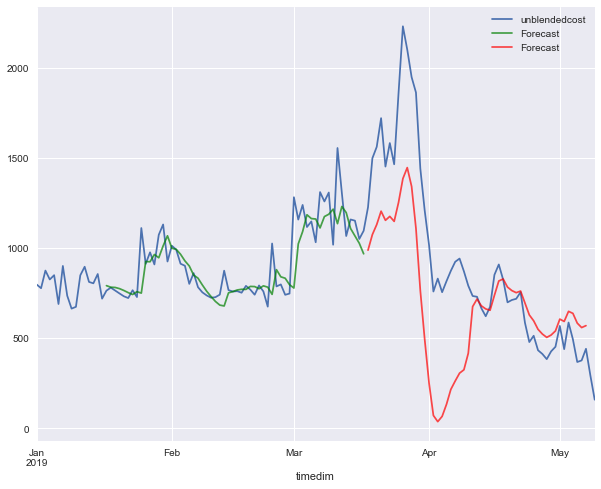

in sample
MAPE 18.368879687746148
rmse 129.8370546975918
out of sample
mape 38.528974184190595
rmse 422.101346737169
[16, 16, 'relu', 0.001]
Epoch 1/1000
60/60 [==============================] - 5s 77ms/sample - loss: 0.7819 - mean_squared_error: 0.7819
Epoch 2/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.6628 - mean_squared_error: 0.6628
Epoch 3/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.5548 - mean_squared_error: 0.5548
Epoch 4/1000
60/60 [==============================] - 0s 2ms/sample - loss: 0.4605 - mean_squared_error: 0.4605
Epoch 5/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.3822 - mean_squared_error: 0.3822
Epoch 6/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.3011 - mean_squared_error: 0.3011
Epoch 7/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.2225 - mean_squared_error: 0.2225
Epoch 8/1000
60/60 [==============================] - 0s 1ms/sample - loss

60/60 [==============================] - 0s 1ms/sample - loss: 0.0277 - mean_squared_error: 0.0277
Epoch 72/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0275 - mean_squared_error: 0.0275
Epoch 73/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0273 - mean_squared_error: 0.0273
Epoch 74/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0271 - mean_squared_error: 0.0271
Epoch 75/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0269 - mean_squared_error: 0.0269
Epoch 76/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0267 - mean_squared_error: 0.0267
Epoch 77/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0265 - mean_squared_error: 0.0265
Epoch 78/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0263 - mean_squared_error: 0.0263
Epoch 79/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0261 - mean_squared_error: 0.02

60/60 [==============================] - 0s 1ms/sample - loss: 0.0200 - mean_squared_error: 0.0200
Epoch 144/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0200 - mean_squared_error: 0.0200
Epoch 145/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0199 - mean_squared_error: 0.0199
Epoch 146/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0199 - mean_squared_error: 0.0199
Epoch 147/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0198 - mean_squared_error: 0.0198
Epoch 148/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0198 - mean_squared_error: 0.0198
Epoch 149/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0198 - mean_squared_error: 0.0198
Epoch 150/1000
60/60 [==============================] - 0s 2ms/sample - loss: 0.0197 - mean_squared_error: 0.0197
Epoch 151/1000
60/60 [==============================] - 0s 2ms/sample - loss: 0.0197 - mean_squared_err

Epoch 215/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0182 - mean_squared_error: 0.0182
Epoch 216/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0182 - mean_squared_error: 0.0182
Epoch 217/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0182 - mean_squared_error: 0.0182
Epoch 218/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0182 - mean_squared_error: 0.0182
Epoch 219/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0182 - mean_squared_error: 0.0182
Epoch 220/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0181 - mean_squared_error: 0.0181
Epoch 221/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0181 - mean_squared_error: 0.0181
Epoch 222/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0181 - mean_squared_error: 0.0181
Epoch 223/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0181 - m

60/60 [==============================] - 0s 1ms/sample - loss: 0.0173 - mean_squared_error: 0.0173
Epoch 287/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0173 - mean_squared_error: 0.0173
Epoch 288/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0173 - mean_squared_error: 0.0173
Epoch 289/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0173 - mean_squared_error: 0.0173
Epoch 290/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0173 - mean_squared_error: 0.0173
Epoch 291/1000
60/60 [==============================] - 0s 2ms/sample - loss: 0.0173 - mean_squared_error: 0.0173
Epoch 292/1000
60/60 [==============================] - 0s 2ms/sample - loss: 0.0172 - mean_squared_error: 0.0172
Epoch 293/1000
60/60 [==============================] - 0s 2ms/sample - loss: 0.0172 - mean_squared_error: 0.0172
Epoch 294/1000
60/60 [==============================] - 0s 2ms/sample - loss: 0.0172 - mean_squared_err

Epoch 358/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0165 - mean_squared_error: 0.0165
Epoch 359/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0165 - mean_squared_error: 0.0165
Epoch 360/1000
60/60 [==============================] - 0s 2ms/sample - loss: 0.0165 - mean_squared_error: 0.0165
Epoch 361/1000
60/60 [==============================] - 0s 2ms/sample - loss: 0.0165 - mean_squared_error: 0.0165
Epoch 362/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0165 - mean_squared_error: 0.0165
Epoch 363/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0165 - mean_squared_error: 0.0165
Epoch 364/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0164 - mean_squared_error: 0.0164
Epoch 365/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0164 - mean_squared_error: 0.0164
Epoch 366/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0164 - m

60/60 [==============================] - 0s 1ms/sample - loss: 0.0160 - mean_squared_error: 0.0160
Epoch 430/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0160 - mean_squared_error: 0.0160
Epoch 431/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0160 - mean_squared_error: 0.0160
Epoch 432/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0160 - mean_squared_error: 0.0160
Epoch 433/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0160 - mean_squared_error: 0.0160
Epoch 434/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0160 - mean_squared_error: 0.0160
Epoch 435/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0160 - mean_squared_error: 0.0160
Epoch 436/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0160 - mean_squared_error: 0.0160
Epoch 437/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0159 - mean_squared_err

Epoch 501/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0155 - mean_squared_error: 0.0155
Epoch 502/1000
60/60 [==============================] - 0s 2ms/sample - loss: 0.0155 - mean_squared_error: 0.0155
Epoch 503/1000
60/60 [==============================] - 0s 2ms/sample - loss: 0.0155 - mean_squared_error: 0.0155
Epoch 504/1000
60/60 [==============================] - 0s 2ms/sample - loss: 0.0155 - mean_squared_error: 0.0155
Epoch 505/1000
60/60 [==============================] - 0s 2ms/sample - loss: 0.0155 - mean_squared_error: 0.0155
Epoch 506/1000
60/60 [==============================] - 0s 2ms/sample - loss: 0.0155 - mean_squared_error: 0.0155
Epoch 507/1000
60/60 [==============================] - 0s 2ms/sample - loss: 0.0155 - mean_squared_error: 0.0155
Epoch 508/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0155 - mean_squared_error: 0.0155
Epoch 509/1000
60/60 [==============================] - 0s 2ms/sample - loss: 0.0155 - m

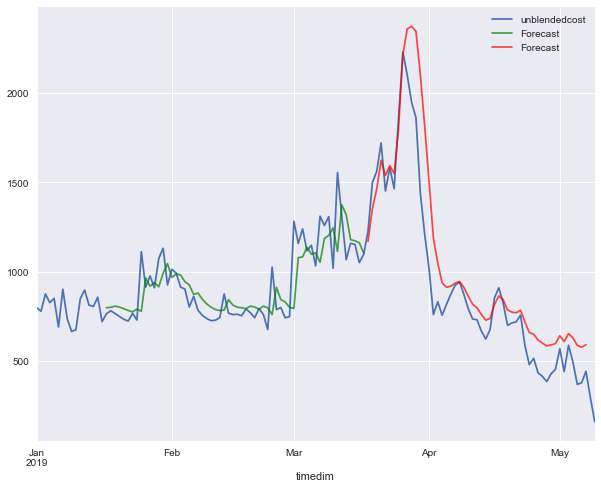

in sample
MAPE 18.386427349018934
rmse 134.49296751103745
out of sample
mape 40.540600789245275
rmse 213.32473080698216
[16, 16, 'relu', 0.003]
Epoch 1/1000
60/60 [==============================] - 5s 81ms/sample - loss: 0.9270 - mean_squared_error: 0.9270
Epoch 2/1000
60/60 [==============================] - 0s 2ms/sample - loss: 0.3972 - mean_squared_error: 0.3972
Epoch 3/1000
60/60 [==============================] - 0s 2ms/sample - loss: 0.1675 - mean_squared_error: 0.1675
Epoch 4/1000
60/60 [==============================] - 0s 2ms/sample - loss: 0.1081 - mean_squared_error: 0.1081
Epoch 5/1000
60/60 [==============================] - 0s 2ms/sample - loss: 0.0896 - mean_squared_error: 0.0896
Epoch 6/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0762 - mean_squared_error: 0.0762
Epoch 7/1000
60/60 [==============================] - 0s 2ms/sample - loss: 0.0585 - mean_squared_error: 0.0585
Epoch 8/1000
60/60 [==============================] - 0s 1ms/sample - l

60/60 [==============================] - 0s 1ms/sample - loss: 0.0202 - mean_squared_error: 0.0202
Epoch 72/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0202 - mean_squared_error: 0.0202
Epoch 73/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0200 - mean_squared_error: 0.0200
Epoch 74/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0200 - mean_squared_error: 0.0200
Epoch 75/1000
60/60 [==============================] - 0s 2ms/sample - loss: 0.0199 - mean_squared_error: 0.0199
Epoch 76/1000
60/60 [==============================] - 0s 2ms/sample - loss: 0.0198 - mean_squared_error: 0.0198
Epoch 77/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0198 - mean_squared_error: 0.0198
Epoch 78/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0197 - mean_squared_error: 0.0197
Epoch 79/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0196 - mean_squared_error: 0.01

60/60 [==============================] - 0s 1ms/sample - loss: 0.0162 - mean_squared_error: 0.0162
Epoch 144/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0162 - mean_squared_error: 0.0162
Epoch 145/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0161 - mean_squared_error: 0.0161
Epoch 146/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0161 - mean_squared_error: 0.0161
Epoch 147/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0161 - mean_squared_error: 0.0161
Epoch 148/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0161 - mean_squared_error: 0.0161
Epoch 149/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0160 - mean_squared_error: 0.0160
Epoch 150/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0161 - mean_squared_error: 0.0161
Epoch 151/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0161 - mean_squared_err

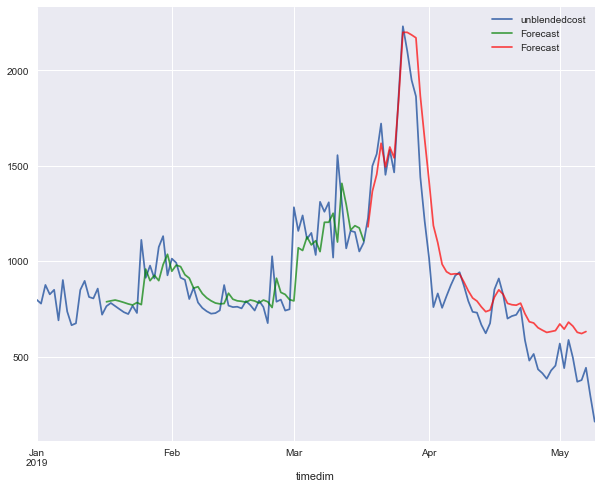

in sample
MAPE 18.163760916069077
rmse 135.14911765001673
out of sample
mape 39.87267414872358
rmse 182.0948890984062
[16, 16, 'relu', 0.01]
Epoch 1/1000
60/60 [==============================] - 5s 77ms/sample - loss: 0.9192 - mean_squared_error: 0.9192
Epoch 2/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.9047 - mean_squared_error: 0.9047
Epoch 3/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.8903 - mean_squared_error: 0.8903
Epoch 4/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.8761 - mean_squared_error: 0.8761
Epoch 5/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.8622 - mean_squared_error: 0.8622
Epoch 6/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.8483 - mean_squared_error: 0.8483
Epoch 7/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.8349 - mean_squared_error: 0.8349
Epoch 8/1000
60/60 [==============================] - 0s 1ms/sample - loss

60/60 [==============================] - 0s 1ms/sample - loss: 0.1473 - mean_squared_error: 0.1473
Epoch 72/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.1446 - mean_squared_error: 0.1446
Epoch 73/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.1424 - mean_squared_error: 0.1424
Epoch 74/1000
60/60 [==============================] - 0s 2ms/sample - loss: 0.1404 - mean_squared_error: 0.1404
Epoch 75/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.1388 - mean_squared_error: 0.1388
Epoch 76/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.1374 - mean_squared_error: 0.1374
Epoch 77/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.1362 - mean_squared_error: 0.1362
Epoch 78/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.1351 - mean_squared_error: 0.1351
Epoch 79/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.1342 - mean_squared_error: 0.13

60/60 [==============================] - 0s 1ms/sample - loss: 0.0985 - mean_squared_error: 0.0985
Epoch 144/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0981 - mean_squared_error: 0.0981
Epoch 145/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0976 - mean_squared_error: 0.0976
Epoch 146/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0971 - mean_squared_error: 0.0971
Epoch 147/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0967 - mean_squared_error: 0.0967
Epoch 148/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0962 - mean_squared_error: 0.0962
Epoch 149/1000
60/60 [==============================] - 0s 2ms/sample - loss: 0.0957 - mean_squared_error: 0.0957
Epoch 150/1000
60/60 [==============================] - 0s 2ms/sample - loss: 0.0953 - mean_squared_error: 0.0953
Epoch 151/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0948 - mean_squared_err

Epoch 215/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0704 - mean_squared_error: 0.0704
Epoch 216/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0701 - mean_squared_error: 0.0701
Epoch 217/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0699 - mean_squared_error: 0.0699
Epoch 218/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0696 - mean_squared_error: 0.0696
Epoch 219/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0693 - mean_squared_error: 0.0693
Epoch 220/1000
60/60 [==============================] - 0s 2ms/sample - loss: 0.0691 - mean_squared_error: 0.0691
Epoch 221/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0689 - mean_squared_error: 0.0689
Epoch 222/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0686 - mean_squared_error: 0.0686
Epoch 223/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0684 - m

60/60 [==============================] - 0s 1ms/sample - loss: 0.0576 - mean_squared_error: 0.0576
Epoch 287/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0574 - mean_squared_error: 0.0574
Epoch 288/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0573 - mean_squared_error: 0.0573
Epoch 289/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0571 - mean_squared_error: 0.0571
Epoch 290/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0570 - mean_squared_error: 0.0570
Epoch 291/1000
60/60 [==============================] - 0s 2ms/sample - loss: 0.0569 - mean_squared_error: 0.0569
Epoch 292/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0567 - mean_squared_error: 0.0567
Epoch 293/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0566 - mean_squared_error: 0.0566
Epoch 294/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0565 - mean_squared_err

Epoch 358/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0488 - mean_squared_error: 0.0488
Epoch 359/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0487 - mean_squared_error: 0.0487
Epoch 360/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0486 - mean_squared_error: 0.0486
Epoch 361/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0485 - mean_squared_error: 0.0485
Epoch 362/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0484 - mean_squared_error: 0.0484
Epoch 363/1000
60/60 [==============================] - 0s 2ms/sample - loss: 0.0482 - mean_squared_error: 0.0482
Epoch 364/1000
60/60 [==============================] - 0s 2ms/sample - loss: 0.0481 - mean_squared_error: 0.0481
Epoch 365/1000
60/60 [==============================] - 0s 2ms/sample - loss: 0.0480 - mean_squared_error: 0.0480
Epoch 366/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0479 - m

60/60 [==============================] - 0s 2ms/sample - loss: 0.0421 - mean_squared_error: 0.0421
Epoch 430/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0420 - mean_squared_error: 0.0420
Epoch 431/1000
60/60 [==============================] - 0s 2ms/sample - loss: 0.0419 - mean_squared_error: 0.0419
Epoch 432/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0418 - mean_squared_error: 0.0418
Epoch 433/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0418 - mean_squared_error: 0.0418
Epoch 434/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0417 - mean_squared_error: 0.0417
Epoch 435/1000
60/60 [==============================] - 0s 2ms/sample - loss: 0.0416 - mean_squared_error: 0.0416
Epoch 436/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0415 - mean_squared_error: 0.0415
Epoch 437/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0414 - mean_squared_err

Epoch 501/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0368 - mean_squared_error: 0.0368
Epoch 502/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0367 - mean_squared_error: 0.0367
Epoch 503/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0367 - mean_squared_error: 0.0367
Epoch 504/1000
60/60 [==============================] - 0s 2ms/sample - loss: 0.0366 - mean_squared_error: 0.0366
Epoch 505/1000
60/60 [==============================] - 0s 2ms/sample - loss: 0.0365 - mean_squared_error: 0.0365
Epoch 506/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0365 - mean_squared_error: 0.0365
Epoch 507/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0364 - mean_squared_error: 0.0364
Epoch 508/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0364 - mean_squared_error: 0.0364
Epoch 509/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0363 - m

60/60 [==============================] - 0s 1ms/sample - loss: 0.0327 - mean_squared_error: 0.0327
Epoch 573/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0327 - mean_squared_error: 0.0327
Epoch 574/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0326 - mean_squared_error: 0.0326
Epoch 575/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0326 - mean_squared_error: 0.0326
Epoch 576/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0325 - mean_squared_error: 0.0325
Epoch 577/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0325 - mean_squared_error: 0.0325
Epoch 578/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0324 - mean_squared_error: 0.0324
Epoch 579/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0324 - mean_squared_error: 0.0324
Epoch 580/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0323 - mean_squared_err

Epoch 644/1000
60/60 [==============================] - 0s 2ms/sample - loss: 0.0295 - mean_squared_error: 0.0295
Epoch 645/1000
60/60 [==============================] - 0s 2ms/sample - loss: 0.0294 - mean_squared_error: 0.0294
Epoch 646/1000
60/60 [==============================] - 0s 2ms/sample - loss: 0.0294 - mean_squared_error: 0.0294
Epoch 647/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0293 - mean_squared_error: 0.0293
Epoch 648/1000
60/60 [==============================] - 0s 2ms/sample - loss: 0.0293 - mean_squared_error: 0.0293
Epoch 649/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0293 - mean_squared_error: 0.0293
Epoch 650/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0292 - mean_squared_error: 0.0292
Epoch 651/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0292 - mean_squared_error: 0.0292
Epoch 652/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0291 - m

60/60 [==============================] - 0s 1ms/sample - loss: 0.0268 - mean_squared_error: 0.0268
Epoch 716/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0268 - mean_squared_error: 0.0268
Epoch 717/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0268 - mean_squared_error: 0.0268
Epoch 718/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0267 - mean_squared_error: 0.0267
Epoch 719/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0267 - mean_squared_error: 0.0267
Epoch 720/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0267 - mean_squared_error: 0.0267
Epoch 721/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0266 - mean_squared_error: 0.0266
Epoch 722/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0266 - mean_squared_error: 0.0266
Epoch 723/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0266 - mean_squared_err

Epoch 787/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0246 - mean_squared_error: 0.0246
Epoch 788/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0246 - mean_squared_error: 0.0246
Epoch 789/1000
60/60 [==============================] - 0s 2ms/sample - loss: 0.0245 - mean_squared_error: 0.0245
Epoch 790/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0245 - mean_squared_error: 0.0245
Epoch 791/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0245 - mean_squared_error: 0.0245
Epoch 792/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0244 - mean_squared_error: 0.0244
Epoch 793/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0244 - mean_squared_error: 0.0244
Epoch 794/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0244 - mean_squared_error: 0.0244
Epoch 795/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0244 - m

60/60 [==============================] - 0s 2ms/sample - loss: 0.0227 - mean_squared_error: 0.0227
Epoch 859/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0227 - mean_squared_error: 0.0227
Epoch 860/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0227 - mean_squared_error: 0.0227
Epoch 861/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0227 - mean_squared_error: 0.0227
Epoch 862/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0227 - mean_squared_error: 0.0227
Epoch 863/1000
60/60 [==============================] - 0s 2ms/sample - loss: 0.0226 - mean_squared_error: 0.0226
Epoch 864/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0226 - mean_squared_error: 0.0226
Epoch 865/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0226 - mean_squared_error: 0.0226
Epoch 866/1000
60/60 [==============================] - 0s 2ms/sample - loss: 0.0226 - mean_squared_err

Epoch 930/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0212 - mean_squared_error: 0.0212
Epoch 931/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0212 - mean_squared_error: 0.0212
Epoch 932/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0211 - mean_squared_error: 0.0211
Epoch 933/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0211 - mean_squared_error: 0.0211
Epoch 934/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0211 - mean_squared_error: 0.0211
Epoch 935/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0211 - mean_squared_error: 0.0211
Epoch 936/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0211 - mean_squared_error: 0.0211
Epoch 937/1000
60/60 [==============================] - 0s 2ms/sample - loss: 0.0210 - mean_squared_error: 0.0210
Epoch 938/1000
60/60 [==============================] - 0s 2ms/sample - loss: 0.0210 - m

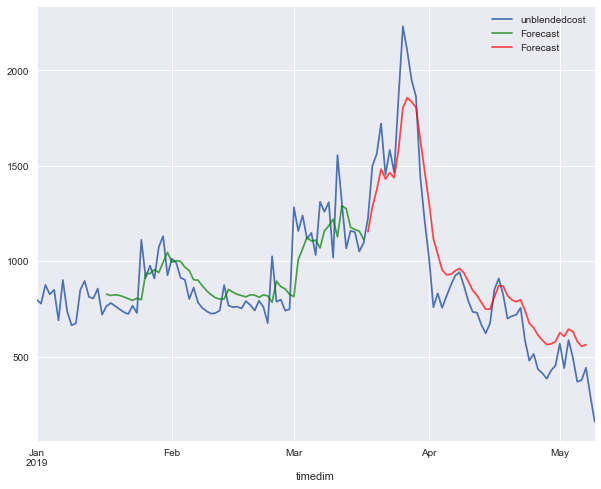

in sample
MAPE 17.940024787952108
rmse 134.2189387342189
out of sample
mape 40.14260122501097
rmse 164.01555304103726
[16, 32, 'tanh', 0.0001]
Epoch 1/1000
60/60 [==============================] - 6s 92ms/sample - loss: 1.0057 - mean_squared_error: 1.0057
Epoch 2/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.9496 - mean_squared_error: 0.9496
Epoch 3/1000
60/60 [==============================] - 0s 2ms/sample - loss: 0.8967 - mean_squared_error: 0.8967
Epoch 4/1000
60/60 [==============================] - 0s 2ms/sample - loss: 0.8434 - mean_squared_error: 0.8435
Epoch 5/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.7939 - mean_squared_error: 0.7939
Epoch 6/1000
60/60 [==============================] - 0s 2ms/sample - loss: 0.7445 - mean_squared_error: 0.7445
Epoch 7/1000
60/60 [==============================] - 0s 2ms/sample - loss: 0.6939 - mean_squared_error: 0.6939
Epoch 8/1000
60/60 [==============================] - 0s 1ms/sample - lo

60/60 [==============================] - 0s 1ms/sample - loss: 0.0835 - mean_squared_error: 0.0835
Epoch 72/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0826 - mean_squared_error: 0.0826
Epoch 73/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0817 - mean_squared_error: 0.0817
Epoch 74/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0808 - mean_squared_error: 0.0808
Epoch 75/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0800 - mean_squared_error: 0.0800
Epoch 76/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0791 - mean_squared_error: 0.0791
Epoch 77/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0783 - mean_squared_error: 0.0783
Epoch 78/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0774 - mean_squared_error: 0.0774
Epoch 79/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0766 - mean_squared_error: 0.07

60/60 [==============================] - 0s 1ms/sample - loss: 0.0485 - mean_squared_error: 0.0485
Epoch 144/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0482 - mean_squared_error: 0.0482
Epoch 145/1000
60/60 [==============================] - 0s 2ms/sample - loss: 0.0480 - mean_squared_error: 0.0480
Epoch 146/1000
60/60 [==============================] - 0s 2ms/sample - loss: 0.0478 - mean_squared_error: 0.0478
Epoch 147/1000
60/60 [==============================] - 0s 2ms/sample - loss: 0.0475 - mean_squared_error: 0.0475
Epoch 148/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0473 - mean_squared_error: 0.0473
Epoch 149/1000
60/60 [==============================] - 0s 2ms/sample - loss: 0.0470 - mean_squared_error: 0.0470
Epoch 150/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0468 - mean_squared_error: 0.0468
Epoch 151/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0466 - mean_squared_err

Epoch 215/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0353 - mean_squared_error: 0.0353
Epoch 216/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0351 - mean_squared_error: 0.0351
Epoch 217/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0350 - mean_squared_error: 0.0350
Epoch 218/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0349 - mean_squared_error: 0.0349
Epoch 219/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0348 - mean_squared_error: 0.0348
Epoch 220/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0346 - mean_squared_error: 0.0346
Epoch 221/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0345 - mean_squared_error: 0.0345
Epoch 222/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0344 - mean_squared_error: 0.0344
Epoch 223/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0343 - m

60/60 [==============================] - 0s 1ms/sample - loss: 0.0279 - mean_squared_error: 0.0279
Epoch 287/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0278 - mean_squared_error: 0.0278
Epoch 288/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0277 - mean_squared_error: 0.0277
Epoch 289/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0277 - mean_squared_error: 0.0277
Epoch 290/1000
60/60 [==============================] - 0s 2ms/sample - loss: 0.0276 - mean_squared_error: 0.0276
Epoch 291/1000
60/60 [==============================] - 0s 2ms/sample - loss: 0.0275 - mean_squared_error: 0.0275
Epoch 292/1000
60/60 [==============================] - 0s 2ms/sample - loss: 0.0274 - mean_squared_error: 0.0274
Epoch 293/1000
60/60 [==============================] - 0s 2ms/sample - loss: 0.0274 - mean_squared_error: 0.0274
Epoch 294/1000
60/60 [==============================] - 0s 2ms/sample - loss: 0.0273 - mean_squared_err

Epoch 358/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0233 - mean_squared_error: 0.0233
Epoch 359/1000
60/60 [==============================] - 0s 2ms/sample - loss: 0.0233 - mean_squared_error: 0.0233
Epoch 360/1000
60/60 [==============================] - 0s 2ms/sample - loss: 0.0232 - mean_squared_error: 0.0232
Epoch 361/1000
60/60 [==============================] - 0s 2ms/sample - loss: 0.0232 - mean_squared_error: 0.0232
Epoch 362/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0232 - mean_squared_error: 0.0232
Epoch 363/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0231 - mean_squared_error: 0.0231
Epoch 364/1000
60/60 [==============================] - 0s 2ms/sample - loss: 0.0231 - mean_squared_error: 0.0231
Epoch 365/1000
60/60 [==============================] - 0s 2ms/sample - loss: 0.0230 - mean_squared_error: 0.0230
Epoch 366/1000
60/60 [==============================] - 0s 2ms/sample - loss: 0.0230 - m

60/60 [==============================] - 0s 2ms/sample - loss: 0.0205 - mean_squared_error: 0.0205
Epoch 430/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0204 - mean_squared_error: 0.0204
Epoch 431/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0204 - mean_squared_error: 0.0204
Epoch 432/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0204 - mean_squared_error: 0.0204
Epoch 433/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0203 - mean_squared_error: 0.0203
Epoch 434/1000
60/60 [==============================] - 0s 2ms/sample - loss: 0.0203 - mean_squared_error: 0.0203
Epoch 435/1000
60/60 [==============================] - 0s 2ms/sample - loss: 0.0203 - mean_squared_error: 0.0203
Epoch 436/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0202 - mean_squared_error: 0.0202
Epoch 437/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0202 - mean_squared_err

Epoch 501/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0185 - mean_squared_error: 0.0185
Epoch 502/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0185 - mean_squared_error: 0.0185
Epoch 503/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0184 - mean_squared_error: 0.0184
Epoch 504/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0184 - mean_squared_error: 0.0184
Epoch 505/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0184 - mean_squared_error: 0.0184
Epoch 506/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0184 - mean_squared_error: 0.0184
Epoch 507/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0184 - mean_squared_error: 0.0184
Epoch 508/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0183 - mean_squared_error: 0.0183
Epoch 509/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0183 - m

60/60 [==============================] - 0s 1ms/sample - loss: 0.0172 - mean_squared_error: 0.0172
Epoch 573/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0172 - mean_squared_error: 0.0172
Epoch 574/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0172 - mean_squared_error: 0.0172
Epoch 575/1000
60/60 [==============================] - 0s 2ms/sample - loss: 0.0172 - mean_squared_error: 0.0172
Epoch 576/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0171 - mean_squared_error: 0.0171
Epoch 577/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0171 - mean_squared_error: 0.0171
Epoch 578/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0171 - mean_squared_error: 0.0171
Epoch 579/1000
60/60 [==============================] - 0s 2ms/sample - loss: 0.0171 - mean_squared_error: 0.0171
Epoch 580/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0171 - mean_squared_err

Epoch 644/1000
60/60 [==============================] - 0s 2ms/sample - loss: 0.0164 - mean_squared_error: 0.0164
Epoch 645/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0163 - mean_squared_error: 0.0163
Epoch 646/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0163 - mean_squared_error: 0.0163
Epoch 647/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0163 - mean_squared_error: 0.0163
Epoch 648/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0163 - mean_squared_error: 0.0163
Epoch 649/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0163 - mean_squared_error: 0.0163
Epoch 650/1000
60/60 [==============================] - 0s 2ms/sample - loss: 0.0163 - mean_squared_error: 0.0163
Epoch 651/1000
60/60 [==============================] - 0s 2ms/sample - loss: 0.0163 - mean_squared_error: 0.0163
Epoch 652/1000
60/60 [==============================] - 0s 2ms/sample - loss: 0.0163 - m

60/60 [==============================] - 0s 1ms/sample - loss: 0.0158 - mean_squared_error: 0.0158
Epoch 716/1000
60/60 [==============================] - 0s 2ms/sample - loss: 0.0159 - mean_squared_error: 0.0159
Epoch 717/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0158 - mean_squared_error: 0.0158
Epoch 718/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0158 - mean_squared_error: 0.0158
Epoch 719/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0158 - mean_squared_error: 0.0158
Epoch 720/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0158 - mean_squared_error: 0.0158
Epoch 721/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0158 - mean_squared_error: 0.0158
Epoch 722/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0158 - mean_squared_error: 0.0158
Epoch 723/1000
60/60 [==============================] - 0s 2ms/sample - loss: 0.0158 - mean_squared_err

Epoch 787/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0155 - mean_squared_error: 0.0155
Epoch 788/1000
60/60 [==============================] - 0s 2ms/sample - loss: 0.0155 - mean_squared_error: 0.0155
Epoch 789/1000
60/60 [==============================] - 0s 2ms/sample - loss: 0.0155 - mean_squared_error: 0.0155
Epoch 790/1000
60/60 [==============================] - 0s 2ms/sample - loss: 0.0155 - mean_squared_error: 0.0155
Epoch 791/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0155 - mean_squared_error: 0.0155
Epoch 792/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0155 - mean_squared_error: 0.0155
Epoch 793/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0155 - mean_squared_error: 0.0155
Epoch 794/1000
60/60 [==============================] - 0s 2ms/sample - loss: 0.0155 - mean_squared_error: 0.0155
Epoch 795/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0155 - m

60/60 [==============================] - 0s 1ms/sample - loss: 0.0153 - mean_squared_error: 0.0153
Epoch 859/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0153 - mean_squared_error: 0.0153
Epoch 860/1000
60/60 [==============================] - 0s 2ms/sample - loss: 0.0153 - mean_squared_error: 0.0153
Epoch 861/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0153 - mean_squared_error: 0.0153
Epoch 862/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0153 - mean_squared_error: 0.0153
Epoch 863/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0153 - mean_squared_error: 0.0153
Epoch 864/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0153 - mean_squared_error: 0.0153
Epoch 865/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0153 - mean_squared_error: 0.0153
Epoch 866/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0153 - mean_squared_err

Epoch 930/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0151 - mean_squared_error: 0.0151
Epoch 931/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0151 - mean_squared_error: 0.0151
Epoch 932/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0151 - mean_squared_error: 0.0151
Epoch 933/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0151 - mean_squared_error: 0.0151
Epoch 934/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0151 - mean_squared_error: 0.0151
Epoch 935/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0151 - mean_squared_error: 0.0151
Epoch 936/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0151 - mean_squared_error: 0.0151
Epoch 937/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0151 - mean_squared_error: 0.0151
Epoch 938/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0151 - m

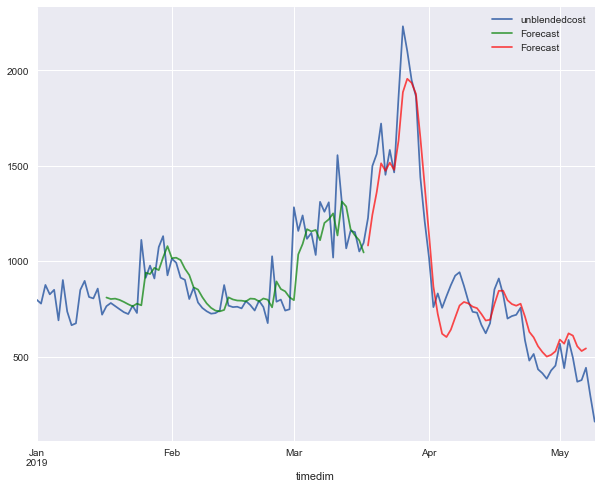

in sample
MAPE 18.63254456052096
rmse 129.3727322285544
out of sample
mape 35.72669686877512
rmse 134.40003559837132
[16, 32, 'tanh', 0.0003]
Epoch 1/1000
60/60 [==============================] - 6s 95ms/sample - loss: 0.5692 - mean_squared_error: 0.5692
Epoch 2/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.4378 - mean_squared_error: 0.4378
Epoch 3/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.3184 - mean_squared_error: 0.3184
Epoch 4/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.2232 - mean_squared_error: 0.2232
Epoch 5/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.1567 - mean_squared_error: 0.1567
Epoch 6/1000
60/60 [==============================] - 0s 2ms/sample - loss: 0.1349 - mean_squared_error: 0.1349
Epoch 7/1000
60/60 [==============================] - 0s 2ms/sample - loss: 0.1395 - mean_squared_error: 0.1395
Epoch 8/1000
60/60 [==============================] - 0s 1ms/sample - los

60/60 [==============================] - 0s 1ms/sample - loss: 0.0309 - mean_squared_error: 0.0309
Epoch 72/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0306 - mean_squared_error: 0.0306
Epoch 73/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0303 - mean_squared_error: 0.0303
Epoch 74/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0300 - mean_squared_error: 0.0300
Epoch 75/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0297 - mean_squared_error: 0.0297
Epoch 76/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0294 - mean_squared_error: 0.0294
Epoch 77/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0292 - mean_squared_error: 0.0292
Epoch 78/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0288 - mean_squared_error: 0.0288
Epoch 79/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0285 - mean_squared_error: 0.02

60/60 [==============================] - 0s 2ms/sample - loss: 0.0192 - mean_squared_error: 0.0192
Epoch 144/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0191 - mean_squared_error: 0.0191
Epoch 145/1000
60/60 [==============================] - 0s 2ms/sample - loss: 0.0190 - mean_squared_error: 0.0190
Epoch 146/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0190 - mean_squared_error: 0.0190
Epoch 147/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0189 - mean_squared_error: 0.0189
Epoch 148/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0188 - mean_squared_error: 0.0188
Epoch 149/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0188 - mean_squared_error: 0.0188
Epoch 150/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0187 - mean_squared_error: 0.0187
Epoch 151/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0187 - mean_squared_err

Epoch 215/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0162 - mean_squared_error: 0.0162
Epoch 216/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0162 - mean_squared_error: 0.0162
Epoch 217/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0162 - mean_squared_error: 0.0162
Epoch 218/1000
60/60 [==============================] - 0s 2ms/sample - loss: 0.0162 - mean_squared_error: 0.0162
Epoch 219/1000
60/60 [==============================] - 0s 2ms/sample - loss: 0.0161 - mean_squared_error: 0.0161
Epoch 220/1000
60/60 [==============================] - 0s 2ms/sample - loss: 0.0161 - mean_squared_error: 0.0161
Epoch 221/1000
60/60 [==============================] - 0s 2ms/sample - loss: 0.0161 - mean_squared_error: 0.0161
Epoch 222/1000
60/60 [==============================] - 0s 2ms/sample - loss: 0.0161 - mean_squared_error: 0.0161
Epoch 223/1000
60/60 [==============================] - 0s 2ms/sample - loss: 0.0161 - m

60/60 [==============================] - 0s 2ms/sample - loss: 0.0154 - mean_squared_error: 0.0154
Epoch 287/1000
60/60 [==============================] - 0s 2ms/sample - loss: 0.0155 - mean_squared_error: 0.0155
Epoch 288/1000
60/60 [==============================] - 0s 2ms/sample - loss: 0.0155 - mean_squared_error: 0.0155
Epoch 289/1000
60/60 [==============================] - 0s 2ms/sample - loss: 0.0154 - mean_squared_error: 0.0154
Epoch 290/1000
60/60 [==============================] - 0s 2ms/sample - loss: 0.0154 - mean_squared_error: 0.0154
Epoch 291/1000
60/60 [==============================] - 0s 2ms/sample - loss: 0.0154 - mean_squared_error: 0.0154
Epoch 292/1000
60/60 [==============================] - 0s 2ms/sample - loss: 0.0155 - mean_squared_error: 0.0155
Epoch 293/1000
60/60 [==============================] - 0s 2ms/sample - loss: 0.0154 - mean_squared_error: 0.0154
Epoch 294/1000
60/60 [==============================] - 0s 2ms/sample - loss: 0.0154 - mean_squared_err

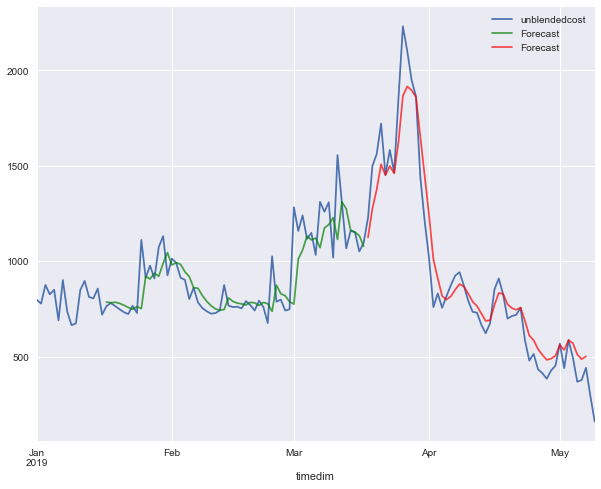

in sample
MAPE 18.10067022964576
rmse 132.79743605741925
out of sample
mape 38.88064965493599
rmse 122.29014933136567
[16, 32, 'tanh', 0.001]
Epoch 1/1000
60/60 [==============================] - 6s 92ms/sample - loss: 0.9055 - mean_squared_error: 0.9055
Epoch 2/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.4840 - mean_squared_error: 0.4840
Epoch 3/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.2025 - mean_squared_error: 0.2025
Epoch 4/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.1323 - mean_squared_error: 0.1323
Epoch 5/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.1346 - mean_squared_error: 0.1346
Epoch 6/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0864 - mean_squared_error: 0.0864
Epoch 7/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0746 - mean_squared_error: 0.0746
Epoch 8/1000
60/60 [==============================] - 0s 1ms/sample - los

60/60 [==============================] - 0s 1ms/sample - loss: 0.0173 - mean_squared_error: 0.0173
Epoch 72/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0171 - mean_squared_error: 0.0171
Epoch 73/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0170 - mean_squared_error: 0.0170
Epoch 74/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0169 - mean_squared_error: 0.0169
Epoch 75/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0169 - mean_squared_error: 0.0169
Epoch 76/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0167 - mean_squared_error: 0.0167
Epoch 77/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0166 - mean_squared_error: 0.0166
Epoch 78/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0165 - mean_squared_error: 0.0165
Epoch 79/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0164 - mean_squared_error: 0.01

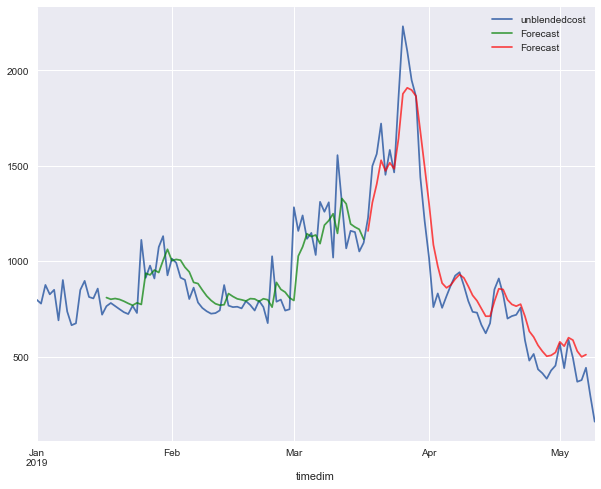

in sample
MAPE 18.46748712613262
rmse 131.9264030444934
out of sample
mape 39.86684923979997
rmse 133.78229426892128
[16, 32, 'tanh', 0.003]
Epoch 1/1000
60/60 [==============================] - 5s 90ms/sample - loss: 0.3432 - mean_squared_error: 0.3432
Epoch 2/1000
60/60 [==============================] - 0s 2ms/sample - loss: 0.1111 - mean_squared_error: 0.1111
Epoch 3/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0704 - mean_squared_error: 0.0704
Epoch 4/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0519 - mean_squared_error: 0.0519
Epoch 5/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0400 - mean_squared_error: 0.0400
Epoch 6/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0366 - mean_squared_error: 0.0366
Epoch 7/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0292 - mean_squared_error: 0.0292
Epoch 8/1000
60/60 [==============================] - 0s 1ms/sample - loss

60/60 [==============================] - 0s 1ms/sample - loss: 0.0153 - mean_squared_error: 0.0153
Epoch 72/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0153 - mean_squared_error: 0.0153
Epoch 73/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0154 - mean_squared_error: 0.0154
Epoch 74/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0152 - mean_squared_error: 0.0152
Epoch 75/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0153 - mean_squared_error: 0.0153
Epoch 76/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0153 - mean_squared_error: 0.0153
Epoch 77/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0153 - mean_squared_error: 0.0153
Epoch 78/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0153 - mean_squared_error: 0.0153
Epoch 79/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0152 - mean_squared_error: 0.01

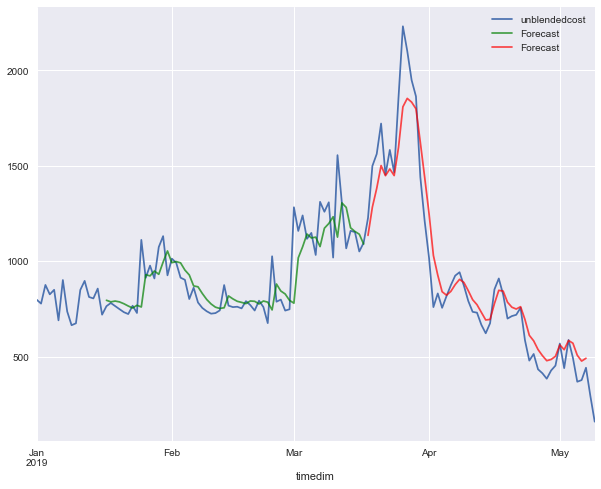

in sample
MAPE 18.043922551263957
rmse 131.82619612924657
out of sample
mape 39.305191149352545
rmse 129.82484581483544
[16, 32, 'tanh', 0.01]
Epoch 1/1000
60/60 [==============================] - 5s 89ms/sample - loss: 0.7080 - mean_squared_error: 0.7080
Epoch 2/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.7009 - mean_squared_error: 0.7009
Epoch 3/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.6939 - mean_squared_error: 0.6939
Epoch 4/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.6868 - mean_squared_error: 0.6868
Epoch 5/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.6800 - mean_squared_error: 0.6800
Epoch 6/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.6732 - mean_squared_error: 0.6732
Epoch 7/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.6664 - mean_squared_error: 0.6664
Epoch 8/1000
60/60 [==============================] - 0s 1ms/sample - lo

60/60 [==============================] - 0s 1ms/sample - loss: 0.1921 - mean_squared_error: 0.1921
Epoch 72/1000
60/60 [==============================] - 0s 2ms/sample - loss: 0.1859 - mean_squared_error: 0.1859
Epoch 73/1000
60/60 [==============================] - 0s 2ms/sample - loss: 0.1802 - mean_squared_error: 0.1802
Epoch 74/1000
60/60 [==============================] - 0s 2ms/sample - loss: 0.1749 - mean_squared_error: 0.1749
Epoch 75/1000
60/60 [==============================] - 0s 2ms/sample - loss: 0.1704 - mean_squared_error: 0.1704
Epoch 76/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.1664 - mean_squared_error: 0.1664
Epoch 77/1000
60/60 [==============================] - 0s 2ms/sample - loss: 0.1632 - mean_squared_error: 0.1632
Epoch 78/1000
60/60 [==============================] - 0s 2ms/sample - loss: 0.1605 - mean_squared_error: 0.1605
Epoch 79/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.1584 - mean_squared_error: 0.15

60/60 [==============================] - 0s 1ms/sample - loss: 0.1021 - mean_squared_error: 0.1021
Epoch 144/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.1014 - mean_squared_error: 0.1014
Epoch 145/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.1008 - mean_squared_error: 0.1008
Epoch 146/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.1001 - mean_squared_error: 0.1001
Epoch 147/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0995 - mean_squared_error: 0.0995
Epoch 148/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0988 - mean_squared_error: 0.0988
Epoch 149/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0982 - mean_squared_error: 0.0982
Epoch 150/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0976 - mean_squared_error: 0.0976
Epoch 151/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0969 - mean_squared_err

Epoch 215/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0719 - mean_squared_error: 0.0719
Epoch 216/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0717 - mean_squared_error: 0.0717
Epoch 217/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0715 - mean_squared_error: 0.0715
Epoch 218/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0713 - mean_squared_error: 0.0713
Epoch 219/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0711 - mean_squared_error: 0.0711
Epoch 220/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0709 - mean_squared_error: 0.0709
Epoch 221/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0707 - mean_squared_error: 0.0707
Epoch 222/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0705 - mean_squared_error: 0.0705
Epoch 223/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0703 - m

60/60 [==============================] - 0s 1ms/sample - loss: 0.0602 - mean_squared_error: 0.0602
Epoch 287/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0601 - mean_squared_error: 0.0601
Epoch 288/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0600 - mean_squared_error: 0.0600
Epoch 289/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0598 - mean_squared_error: 0.0598
Epoch 290/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0597 - mean_squared_error: 0.0597
Epoch 291/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0596 - mean_squared_error: 0.0596
Epoch 292/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0594 - mean_squared_error: 0.0594
Epoch 293/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0593 - mean_squared_error: 0.0593
Epoch 294/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0591 - mean_squared_err

Epoch 358/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0515 - mean_squared_error: 0.0515
Epoch 359/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0514 - mean_squared_error: 0.0514
Epoch 360/1000
60/60 [==============================] - 0s 2ms/sample - loss: 0.0513 - mean_squared_error: 0.0513
Epoch 361/1000
60/60 [==============================] - 0s 2ms/sample - loss: 0.0512 - mean_squared_error: 0.0512
Epoch 362/1000
60/60 [==============================] - 0s 2ms/sample - loss: 0.0511 - mean_squared_error: 0.0511
Epoch 363/1000
60/60 [==============================] - 0s 2ms/sample - loss: 0.0510 - mean_squared_error: 0.0510
Epoch 364/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0509 - mean_squared_error: 0.0509
Epoch 365/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0508 - mean_squared_error: 0.0508
Epoch 366/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0507 - m

60/60 [==============================] - 0s 2ms/sample - loss: 0.0447 - mean_squared_error: 0.0447
Epoch 430/1000
60/60 [==============================] - 0s 2ms/sample - loss: 0.0447 - mean_squared_error: 0.0447
Epoch 431/1000
60/60 [==============================] - ETA: 0s - loss: 0.0443 - mean_squared_error: 0.04 - 0s 1ms/sample - loss: 0.0446 - mean_squared_error: 0.0446
Epoch 432/1000
60/60 [==============================] - 0s 2ms/sample - loss: 0.0445 - mean_squared_error: 0.0445
Epoch 433/1000
60/60 [==============================] - 0s 2ms/sample - loss: 0.0444 - mean_squared_error: 0.0444
Epoch 434/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0443 - mean_squared_error: 0.0443
Epoch 435/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0442 - mean_squared_error: 0.0442
Epoch 436/1000
60/60 [==============================] - 0s 2ms/sample - loss: 0.0441 - mean_squared_error: 0.0441
Epoch 437/1000
60/60 [=============================

60/60 [==============================] - 0s 1ms/sample - loss: 0.0394 - mean_squared_error: 0.0394
Epoch 501/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0393 - mean_squared_error: 0.0393
Epoch 502/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0392 - mean_squared_error: 0.0392
Epoch 503/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0392 - mean_squared_error: 0.0392
Epoch 504/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0391 - mean_squared_error: 0.0391
Epoch 505/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0390 - mean_squared_error: 0.0390
Epoch 506/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0390 - mean_squared_error: 0.0390
Epoch 507/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0389 - mean_squared_error: 0.0389
Epoch 508/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0388 - mean_squared_err

Epoch 572/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0350 - mean_squared_error: 0.0350
Epoch 573/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0350 - mean_squared_error: 0.0350
Epoch 574/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0349 - mean_squared_error: 0.0349
Epoch 575/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0348 - mean_squared_error: 0.0348
Epoch 576/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0348 - mean_squared_error: 0.0348
Epoch 577/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0347 - mean_squared_error: 0.0347
Epoch 578/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0347 - mean_squared_error: 0.0347
Epoch 579/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0346 - mean_squared_error: 0.0346
Epoch 580/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0346 - m

60/60 [==============================] - 0s 1ms/sample - loss: 0.0315 - mean_squared_error: 0.0315
Epoch 644/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0315 - mean_squared_error: 0.0315
Epoch 645/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0314 - mean_squared_error: 0.0314
Epoch 646/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0314 - mean_squared_error: 0.0314
Epoch 647/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0313 - mean_squared_error: 0.0313
Epoch 648/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0313 - mean_squared_error: 0.0313
Epoch 649/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0312 - mean_squared_error: 0.0312
Epoch 650/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0312 - mean_squared_error: 0.0312
Epoch 651/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0312 - mean_squared_err

60/60 [==============================] - 0s 1ms/sample - loss: 0.0287 - mean_squared_error: 0.0287
Epoch 715/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0286 - mean_squared_error: 0.0286
Epoch 716/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0286 - mean_squared_error: 0.0286
Epoch 717/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0285 - mean_squared_error: 0.0285
Epoch 718/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0285 - mean_squared_error: 0.0285
Epoch 719/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0285 - mean_squared_error: 0.0285
Epoch 720/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0284 - mean_squared_error: 0.0284
Epoch 721/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0284 - mean_squared_error: 0.0284
Epoch 722/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0284 - mean_squared_err

Epoch 786/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0263 - mean_squared_error: 0.0263
Epoch 787/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0262 - mean_squared_error: 0.0262
Epoch 788/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0262 - mean_squared_error: 0.0262
Epoch 789/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0262 - mean_squared_error: 0.0262
Epoch 790/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0261 - mean_squared_error: 0.0261
Epoch 791/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0261 - mean_squared_error: 0.0261
Epoch 792/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0261 - mean_squared_error: 0.0261
Epoch 793/1000
60/60 [==============================] - 0s 961us/sample - loss: 0.0260 - mean_squared_error: 0.0260
Epoch 794/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0260 -

60/60 [==============================] - 0s 2ms/sample - loss: 0.0242 - mean_squared_error: 0.0242
Epoch 858/1000
60/60 [==============================] - 0s 3ms/sample - loss: 0.0242 - mean_squared_error: 0.0242
Epoch 859/1000
60/60 [==============================] - 0s 2ms/sample - loss: 0.0242 - mean_squared_error: 0.0242
Epoch 860/1000
60/60 [==============================] - 0s 3ms/sample - loss: 0.0242 - mean_squared_error: 0.0242
Epoch 861/1000
60/60 [==============================] - 0s 2ms/sample - loss: 0.0241 - mean_squared_error: 0.0241
Epoch 862/1000
60/60 [==============================] - 0s 2ms/sample - loss: 0.0241 - mean_squared_error: 0.0241
Epoch 863/1000
60/60 [==============================] - 0s 2ms/sample - loss: 0.0241 - mean_squared_error: 0.0241
Epoch 864/1000
60/60 [==============================] - 0s 2ms/sample - loss: 0.0241 - mean_squared_error: 0.0241
Epoch 865/1000
60/60 [==============================] - 0s 2ms/sample - loss: 0.0240 - mean_squared_err

Epoch 929/1000
60/60 [==============================] - 0s 2ms/sample - loss: 0.0225 - mean_squared_error: 0.0225
Epoch 930/1000
60/60 [==============================] - 0s 2ms/sample - loss: 0.0225 - mean_squared_error: 0.0225
Epoch 931/1000
60/60 [==============================] - 0s 2ms/sample - loss: 0.0224 - mean_squared_error: 0.0224
Epoch 932/1000
60/60 [==============================] - 0s 2ms/sample - loss: 0.0224 - mean_squared_error: 0.0224
Epoch 933/1000
60/60 [==============================] - 0s 2ms/sample - loss: 0.0224 - mean_squared_error: 0.0224
Epoch 934/1000
60/60 [==============================] - 0s 2ms/sample - loss: 0.0224 - mean_squared_error: 0.0224
Epoch 935/1000
60/60 [==============================] - 0s 2ms/sample - loss: 0.0224 - mean_squared_error: 0.0224
Epoch 936/1000
60/60 [==============================] - 0s 2ms/sample - loss: 0.0223 - mean_squared_error: 0.0223
Epoch 937/1000
60/60 [==============================] - 0s 2ms/sample - loss: 0.0223 - m

60/60 [==============================] - 0s 2ms/sample - loss: 0.0210 - mean_squared_error: 0.0210


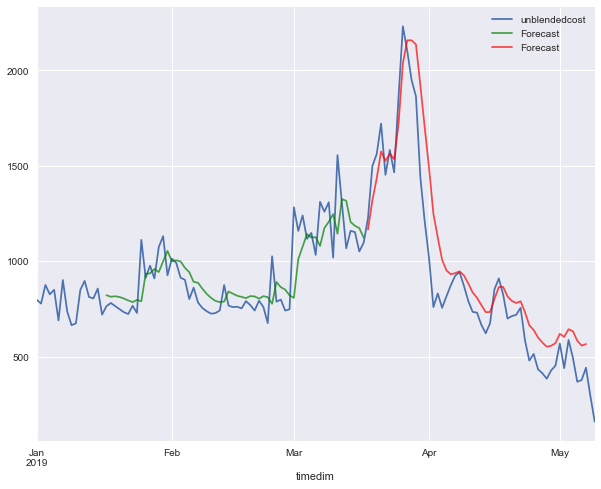

in sample
MAPE 18.164080874616133
rmse 133.38727814760176
out of sample
mape 41.20277364244265
rmse 187.13959850640214
[16, 32, 'relu', 0.0001]
Epoch 1/1000
60/60 [==============================] - 5s 85ms/sample - loss: 0.7657 - mean_squared_error: 0.7657
Epoch 2/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.7411 - mean_squared_error: 0.7411
Epoch 3/1000
60/60 [==============================] - 0s 984us/sample - loss: 0.7171 - mean_squared_error: 0.7171
Epoch 4/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.6926 - mean_squared_error: 0.6926
Epoch 5/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.6690 - mean_squared_error: 0.6690
Epoch 6/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.6458 - mean_squared_error: 0.6458
Epoch 7/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.6234 - mean_squared_error: 0.6234
Epoch 8/1000
60/60 [==============================] - 0s 1ms/sample -

60/60 [==============================] - 0s 1ms/sample - loss: 0.0925 - mean_squared_error: 0.0925
Epoch 72/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0914 - mean_squared_error: 0.0914
Epoch 73/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0905 - mean_squared_error: 0.0905
Epoch 74/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0896 - mean_squared_error: 0.0896
Epoch 75/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0888 - mean_squared_error: 0.0888
Epoch 76/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0880 - mean_squared_error: 0.0880
Epoch 77/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0872 - mean_squared_error: 0.0872
Epoch 78/1000
60/60 [==============================] - 0s 2ms/sample - loss: 0.0865 - mean_squared_error: 0.0865
Epoch 79/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0859 - mean_squared_error: 0.08

60/60 [==============================] - 0s 1ms/sample - loss: 0.0569 - mean_squared_error: 0.0569
Epoch 143/1000
60/60 [==============================] - 0s 2ms/sample - loss: 0.0566 - mean_squared_error: 0.0566
Epoch 144/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0563 - mean_squared_error: 0.0563
Epoch 145/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0560 - mean_squared_error: 0.0560
Epoch 146/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0557 - mean_squared_error: 0.0557
Epoch 147/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0554 - mean_squared_error: 0.0554
Epoch 148/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0551 - mean_squared_error: 0.0551
Epoch 149/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0549 - mean_squared_error: 0.0549
Epoch 150/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0546 - mean_squared_err

60/60 [==============================] - 0s 1ms/sample - loss: 0.0422 - mean_squared_error: 0.0422
Epoch 214/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0420 - mean_squared_error: 0.0420
Epoch 215/1000
60/60 [==============================] - 0s 958us/sample - loss: 0.0419 - mean_squared_error: 0.0419
Epoch 216/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0417 - mean_squared_error: 0.0417
Epoch 217/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0416 - mean_squared_error: 0.0416
Epoch 218/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0415 - mean_squared_error: 0.0415
Epoch 219/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0413 - mean_squared_error: 0.0413
Epoch 220/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0411 - mean_squared_error: 0.0411
Epoch 221/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0410 - mean_squared_e

Epoch 285/1000
60/60 [==============================] - 0s 2ms/sample - loss: 0.0336 - mean_squared_error: 0.0336
Epoch 286/1000
60/60 [==============================] - 0s 2ms/sample - loss: 0.0335 - mean_squared_error: 0.0335
Epoch 287/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0334 - mean_squared_error: 0.0334
Epoch 288/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0333 - mean_squared_error: 0.0333
Epoch 289/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0332 - mean_squared_error: 0.0332
Epoch 290/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0331 - mean_squared_error: 0.0331
Epoch 291/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0330 - mean_squared_error: 0.0330
Epoch 292/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0329 - mean_squared_error: 0.0329
Epoch 293/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0329 - m

60/60 [==============================] - 0s 1ms/sample - loss: 0.0279 - mean_squared_error: 0.0279
Epoch 357/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0278 - mean_squared_error: 0.0278
Epoch 358/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0277 - mean_squared_error: 0.0277
Epoch 359/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0277 - mean_squared_error: 0.0277
Epoch 360/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0276 - mean_squared_error: 0.0276
Epoch 361/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0275 - mean_squared_error: 0.0275
Epoch 362/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0275 - mean_squared_error: 0.0275
Epoch 363/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0274 - mean_squared_error: 0.0274
Epoch 364/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0273 - mean_squared_err

60/60 [==============================] - 0s 1ms/sample - loss: 0.0237 - mean_squared_error: 0.0237
Epoch 428/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0237 - mean_squared_error: 0.0237
Epoch 429/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0236 - mean_squared_error: 0.0236
Epoch 430/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0236 - mean_squared_error: 0.0236
Epoch 431/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0235 - mean_squared_error: 0.0235
Epoch 432/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0235 - mean_squared_error: 0.0235
Epoch 433/1000
60/60 [==============================] - 0s 2ms/sample - loss: 0.0234 - mean_squared_error: 0.0234
Epoch 434/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0234 - mean_squared_error: 0.0234
Epoch 435/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0233 - mean_squared_err

Epoch 499/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0207 - mean_squared_error: 0.0207
Epoch 500/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0207 - mean_squared_error: 0.0207
Epoch 501/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0207 - mean_squared_error: 0.0207
Epoch 502/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0206 - mean_squared_error: 0.0206
Epoch 503/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0206 - mean_squared_error: 0.0206
Epoch 504/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0206 - mean_squared_error: 0.0206
Epoch 505/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0205 - mean_squared_error: 0.0205
Epoch 506/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0205 - mean_squared_error: 0.0205
Epoch 507/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0205 - m

60/60 [==============================] - 0s 1ms/sample - loss: 0.0187 - mean_squared_error: 0.0187
Epoch 571/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0186 - mean_squared_error: 0.0186
Epoch 572/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0186 - mean_squared_error: 0.0186
Epoch 573/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0186 - mean_squared_error: 0.0186
Epoch 574/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0186 - mean_squared_error: 0.0186
Epoch 575/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0185 - mean_squared_error: 0.0185
Epoch 576/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0185 - mean_squared_error: 0.0185
Epoch 577/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0185 - mean_squared_error: 0.0185
Epoch 578/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0185 - mean_squared_err

60/60 [==============================] - 0s 1ms/sample - loss: 0.0172 - mean_squared_error: 0.0172
Epoch 642/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0172 - mean_squared_error: 0.0172
Epoch 643/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0172 - mean_squared_error: 0.0172
Epoch 644/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0172 - mean_squared_error: 0.0172
Epoch 645/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0172 - mean_squared_error: 0.0172
Epoch 646/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0172 - mean_squared_error: 0.0172
Epoch 647/1000
60/60 [==============================] - 0s 999us/sample - loss: 0.0171 - mean_squared_error: 0.0171
Epoch 648/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0171 - mean_squared_error: 0.0171
Epoch 649/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0171 - mean_squared_e

Epoch 713/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0163 - mean_squared_error: 0.0163
Epoch 714/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0163 - mean_squared_error: 0.0163
Epoch 715/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0163 - mean_squared_error: 0.0163
Epoch 716/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0163 - mean_squared_error: 0.0163
Epoch 717/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0163 - mean_squared_error: 0.0163
Epoch 718/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0163 - mean_squared_error: 0.0163
Epoch 719/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0163 - mean_squared_error: 0.0163
Epoch 720/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0162 - mean_squared_error: 0.0162
Epoch 721/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0162 - m

60/60 [==============================] - 0s 949us/sample - loss: 0.0157 - mean_squared_error: 0.0157
Epoch 785/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0157 - mean_squared_error: 0.0157
Epoch 786/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0157 - mean_squared_error: 0.0157
Epoch 787/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0157 - mean_squared_error: 0.0157
Epoch 788/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0157 - mean_squared_error: 0.0157
Epoch 789/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0157 - mean_squared_error: 0.0157
Epoch 790/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0157 - mean_squared_error: 0.0157
Epoch 791/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0157 - mean_squared_error: 0.0157
Epoch 792/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0157 - mean_squared_e

60/60 [==============================] - 0s 1ms/sample - loss: 0.0154 - mean_squared_error: 0.0154
Epoch 856/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0154 - mean_squared_error: 0.0154
Epoch 857/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0154 - mean_squared_error: 0.0154
Epoch 858/1000
60/60 [==============================] - 0s 2ms/sample - loss: 0.0154 - mean_squared_error: 0.0154
Epoch 859/1000
60/60 [==============================] - 0s 2ms/sample - loss: 0.0154 - mean_squared_error: 0.0154
Epoch 860/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0154 - mean_squared_error: 0.0154
Epoch 861/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0154 - mean_squared_error: 0.0154
Epoch 862/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0154 - mean_squared_error: 0.0154
Epoch 863/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0154 - mean_squared_err

Epoch 927/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0152 - mean_squared_error: 0.0152
Epoch 928/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0152 - mean_squared_error: 0.0152
Epoch 929/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0152 - mean_squared_error: 0.0152
Epoch 930/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0152 - mean_squared_error: 0.0152
Epoch 931/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0152 - mean_squared_error: 0.0152
Epoch 932/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0152 - mean_squared_error: 0.0152
Epoch 933/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0152 - mean_squared_error: 0.0152
Epoch 934/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0152 - mean_squared_error: 0.0152
Epoch 935/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0152 - m

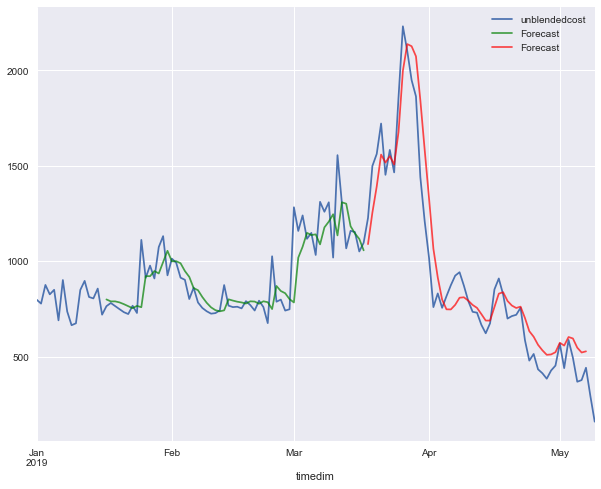

in sample
MAPE 18.267011473898382
rmse 130.54514253599055
out of sample
mape 37.58191734378061
rmse 146.83607006337118
[16, 32, 'relu', 0.0003]
Epoch 1/1000
60/60 [==============================] - 5s 85ms/sample - loss: 1.0894 - mean_squared_error: 1.0894
Epoch 2/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.9947 - mean_squared_error: 0.9947
Epoch 3/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.9040 - mean_squared_error: 0.9040
Epoch 4/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.8195 - mean_squared_error: 0.8195
Epoch 5/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.7388 - mean_squared_error: 0.7388
Epoch 6/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.6613 - mean_squared_error: 0.6613
Epoch 7/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.5880 - mean_squared_error: 0.5880
Epoch 8/1000
60/60 [==============================] - 0s 1ms/sample - l

60/60 [==============================] - 0s 2ms/sample - loss: 0.0443 - mean_squared_error: 0.0443
Epoch 72/1000
60/60 [==============================] - 0s 2ms/sample - loss: 0.0437 - mean_squared_error: 0.0437
Epoch 73/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0430 - mean_squared_error: 0.0430
Epoch 74/1000
60/60 [==============================] - 0s 2ms/sample - loss: 0.0426 - mean_squared_error: 0.0426
Epoch 75/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0419 - mean_squared_error: 0.0419
Epoch 76/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0414 - mean_squared_error: 0.0414
Epoch 77/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0409 - mean_squared_error: 0.0409
Epoch 78/1000
60/60 [==============================] - 0s 2ms/sample - loss: 0.0404 - mean_squared_error: 0.0404
Epoch 79/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0398 - mean_squared_error: 0.03

60/60 [==============================] - 0s 1ms/sample - loss: 0.0240 - mean_squared_error: 0.0240
Epoch 144/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0239 - mean_squared_error: 0.0239
Epoch 145/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0237 - mean_squared_error: 0.0237
Epoch 146/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0236 - mean_squared_error: 0.0236
Epoch 147/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0235 - mean_squared_error: 0.0235
Epoch 148/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0234 - mean_squared_error: 0.0234
Epoch 149/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0232 - mean_squared_error: 0.0232
Epoch 150/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0231 - mean_squared_error: 0.0231
Epoch 151/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0230 - mean_squared_err

Epoch 215/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0179 - mean_squared_error: 0.0179
Epoch 216/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0179 - mean_squared_error: 0.0179
Epoch 217/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0178 - mean_squared_error: 0.0178
Epoch 218/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0178 - mean_squared_error: 0.0178
Epoch 219/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0177 - mean_squared_error: 0.0177
Epoch 220/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0177 - mean_squared_error: 0.0177
Epoch 221/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0177 - mean_squared_error: 0.0177
Epoch 222/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0177 - mean_squared_error: 0.0177
Epoch 223/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0176 - m

60/60 [==============================] - 0s 1ms/sample - loss: 0.0160 - mean_squared_error: 0.0160
Epoch 287/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0160 - mean_squared_error: 0.0160
Epoch 288/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0160 - mean_squared_error: 0.0160
Epoch 289/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0159 - mean_squared_error: 0.0159
Epoch 290/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0161 - mean_squared_error: 0.0161
Epoch 291/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0162 - mean_squared_error: 0.0162
Epoch 292/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0159 - mean_squared_error: 0.0159
Epoch 293/1000
60/60 [==============================] - 0s 2ms/sample - loss: 0.0159 - mean_squared_error: 0.0159
Epoch 294/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0160 - mean_squared_err

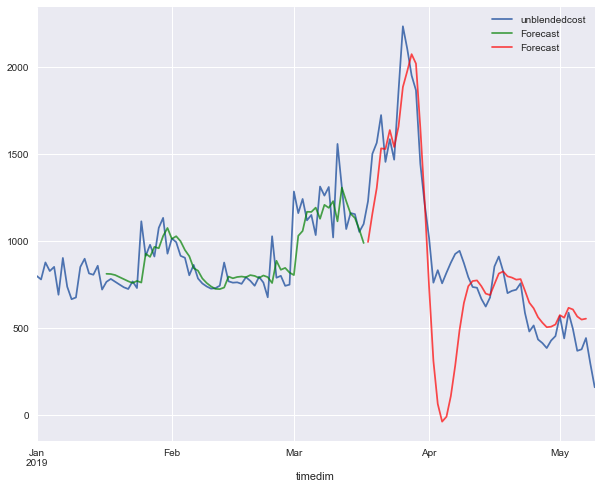

in sample
MAPE 18.37713021243606
rmse 128.9289166305124
out of sample
mape 41.2529476494643
rmse 289.0177968625845
[16, 32, 'relu', 0.001]
Epoch 1/1000
60/60 [==============================] - 5s 89ms/sample - loss: 0.7681 - mean_squared_error: 0.7681
Epoch 2/1000
60/60 [==============================] - 0s 999us/sample - loss: 0.6277 - mean_squared_error: 0.6277
Epoch 3/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.5040 - mean_squared_error: 0.5040
Epoch 4/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.3819 - mean_squared_error: 0.3819
Epoch 5/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.2607 - mean_squared_error: 0.2607
Epoch 6/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.1532 - mean_squared_error: 0.1532
Epoch 7/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.1205 - mean_squared_error: 0.1205
Epoch 8/1000
60/60 [==============================] - 0s 1ms/sample - loss

60/60 [==============================] - 0s 2ms/sample - loss: 0.0216 - mean_squared_error: 0.0216
Epoch 72/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0213 - mean_squared_error: 0.0213
Epoch 73/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0213 - mean_squared_error: 0.0213
Epoch 74/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0214 - mean_squared_error: 0.0214
Epoch 75/1000
60/60 [==============================] - 0s 2ms/sample - loss: 0.0210 - mean_squared_error: 0.0210
Epoch 76/1000
60/60 [==============================] - 0s 2ms/sample - loss: 0.0208 - mean_squared_error: 0.0208
Epoch 77/1000
60/60 [==============================] - 0s 2ms/sample - loss: 0.0208 - mean_squared_error: 0.0208
Epoch 78/1000
60/60 [==============================] - 0s 2ms/sample - loss: 0.0208 - mean_squared_error: 0.0208
Epoch 79/1000
60/60 [==============================] - 0s 2ms/sample - loss: 0.0206 - mean_squared_error: 0.02

60/60 [==============================] - 0s 1ms/sample - loss: 0.0165 - mean_squared_error: 0.0165
Epoch 144/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0165 - mean_squared_error: 0.0165
Epoch 145/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0164 - mean_squared_error: 0.0164
Epoch 146/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0164 - mean_squared_error: 0.0164
Epoch 147/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0164 - mean_squared_error: 0.0164
Epoch 148/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0164 - mean_squared_error: 0.0164
Epoch 149/1000
60/60 [==============================] - 0s 2ms/sample - loss: 0.0165 - mean_squared_error: 0.0165
Epoch 150/1000
60/60 [==============================] - 0s 2ms/sample - loss: 0.0165 - mean_squared_error: 0.0165
Epoch 151/1000
60/60 [==============================] - 0s 2ms/sample - loss: 0.0164 - mean_squared_err

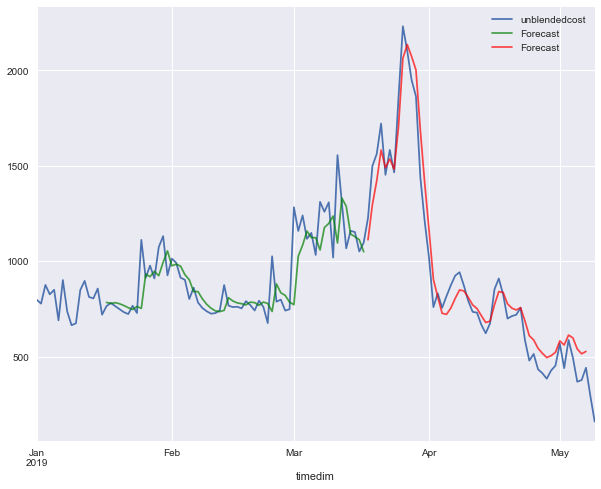

in sample
MAPE 18.44961575505329
rmse 133.52740691074123
out of sample
mape 36.88286737168159
rmse 105.22410127429347
[16, 32, 'relu', 0.003]
Epoch 1/1000
60/60 [==============================] - 6s 93ms/sample - loss: 0.7373 - mean_squared_error: 0.7373
Epoch 2/1000
60/60 [==============================] - ETA: 0s - loss: 0.2091 - mean_squared_error: 0.20 - 0s 2ms/sample - loss: 0.2023 - mean_squared_error: 0.2023
Epoch 3/1000
60/60 [==============================] - 0s 2ms/sample - loss: 0.1295 - mean_squared_error: 0.1295
Epoch 4/1000
60/60 [==============================] - 0s 2ms/sample - loss: 0.0918 - mean_squared_error: 0.0918
Epoch 5/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0737 - mean_squared_error: 0.0737
Epoch 6/1000
60/60 [==============================] - 0s 1ms/sample - loss: 0.0562 - mean_squared_error: 0.0562
Epoch 7/1000
60/60 [==============================] - 0s 2ms/sample - loss: 0.0504 - mean_squared_error: 0.0504
Epoch 8/1000
60/60 [=

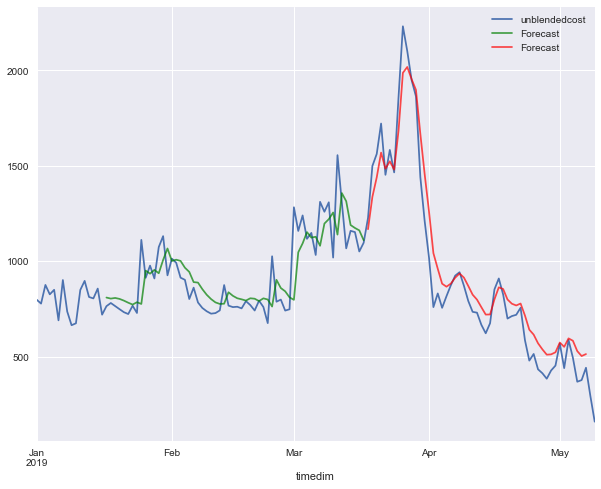

in sample
MAPE 18.580308948751984
rmse 132.8059130442586
out of sample
mape 40.150007607255866
rmse 117.3939345294221
[16, 32, 'relu', 0.01]
Epoch 1/1000
60/60 [==============================] - 6s 93ms/sample - loss: 0.7613 - mean_squared_error: 0.7613
Epoch 2/1000
60/60 [==============================] - 0s 5ms/sample - loss: 0.7346 - mean_squared_error: 0.7346
Epoch 3/1000
60/60 [==============================] - 0s 5ms/sample - loss: 0.7092 - mean_squared_error: 0.7092
Epoch 4/1000
60/60 [==============================] - 0s 5ms/sample - loss: 0.6833 - mean_squared_error: 0.6833
Epoch 5/1000
60/60 [==============================] - 0s 5ms/sample - loss: 0.6577 - mean_squared_error: 0.6577
Epoch 6/1000
60/60 [==============================] - 0s 5ms/sample - loss: 0.6330 - mean_squared_error: 0.6330
Epoch 7/1000
60/60 [==============================] - 0s 5ms/sample - loss: 0.6083 - mean_squared_error: 0.6083
Epoch 8/1000
60/60 [==============================] - 0s 5ms/sample - loss

60/60 [==============================] - 0s 5ms/sample - loss: 0.1133 - mean_squared_error: 0.1133
Epoch 72/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.1125 - mean_squared_error: 0.1125
Epoch 73/1000
60/60 [==============================] - 0s 7ms/sample - loss: 0.1116 - mean_squared_error: 0.1116
Epoch 74/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.1108 - mean_squared_error: 0.1108
Epoch 75/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.1099 - mean_squared_error: 0.1099
Epoch 76/1000
60/60 [==============================] - 0s 5ms/sample - loss: 0.1091 - mean_squared_error: 0.1091
Epoch 77/1000
60/60 [==============================] - 0s 5ms/sample - loss: 0.1082 - mean_squared_error: 0.1082
Epoch 78/1000
60/60 [==============================] - 0s 5ms/sample - loss: 0.1074 - mean_squared_error: 0.1074
Epoch 79/1000
60/60 [==============================] - 0s 5ms/sample - loss: 0.1066 - mean_squared_error: 0.10

60/60 [==============================] - 0s 5ms/sample - loss: 0.0712 - mean_squared_error: 0.0712
Epoch 144/1000
60/60 [==============================] - 0s 5ms/sample - loss: 0.0709 - mean_squared_error: 0.0709
Epoch 145/1000
60/60 [==============================] - 0s 5ms/sample - loss: 0.0706 - mean_squared_error: 0.0706
Epoch 146/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0703 - mean_squared_error: 0.0703
Epoch 147/1000
60/60 [==============================] - 0s 5ms/sample - loss: 0.0700 - mean_squared_error: 0.0700
Epoch 148/1000
60/60 [==============================] - 0s 5ms/sample - loss: 0.0697 - mean_squared_error: 0.0697
Epoch 149/1000
60/60 [==============================] - 0s 5ms/sample - loss: 0.0694 - mean_squared_error: 0.0694
Epoch 150/1000
60/60 [==============================] - 0s 5ms/sample - loss: 0.0692 - mean_squared_error: 0.0692
Epoch 151/1000
60/60 [==============================] - 0s 5ms/sample - loss: 0.0689 - mean_squared_err

Epoch 215/1000
60/60 [==============================] - 0s 5ms/sample - loss: 0.0553 - mean_squared_error: 0.0553
Epoch 216/1000
60/60 [==============================] - 0s 7ms/sample - loss: 0.0551 - mean_squared_error: 0.0551
Epoch 217/1000
60/60 [==============================] - 0s 5ms/sample - loss: 0.0549 - mean_squared_error: 0.0549
Epoch 218/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0547 - mean_squared_error: 0.0547
Epoch 219/1000
60/60 [==============================] - 0s 8ms/sample - loss: 0.0546 - mean_squared_error: 0.0546
Epoch 220/1000
60/60 [==============================] - 0s 7ms/sample - loss: 0.0544 - mean_squared_error: 0.0544
Epoch 221/1000
60/60 [==============================] - 0s 7ms/sample - loss: 0.0542 - mean_squared_error: 0.0542
Epoch 222/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0541 - mean_squared_error: 0.0541
Epoch 223/1000
60/60 [==============================] - 0s 5ms/sample - loss: 0.0539 - m

60/60 [==============================] - 0s 5ms/sample - loss: 0.0450 - mean_squared_error: 0.0450
Epoch 287/1000
60/60 [==============================] - 0s 5ms/sample - loss: 0.0448 - mean_squared_error: 0.0448
Epoch 288/1000
60/60 [==============================] - 0s 5ms/sample - loss: 0.0447 - mean_squared_error: 0.0447
Epoch 289/1000
60/60 [==============================] - 0s 5ms/sample - loss: 0.0446 - mean_squared_error: 0.0446
Epoch 290/1000
60/60 [==============================] - 0s 5ms/sample - loss: 0.0445 - mean_squared_error: 0.0445
Epoch 291/1000
60/60 [==============================] - 0s 5ms/sample - loss: 0.0444 - mean_squared_error: 0.0444
Epoch 292/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0443 - mean_squared_error: 0.0443
Epoch 293/1000
60/60 [==============================] - 0s 5ms/sample - loss: 0.0441 - mean_squared_error: 0.0441
Epoch 294/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0440 - mean_squared_err

Epoch 358/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0375 - mean_squared_error: 0.0375
Epoch 359/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0375 - mean_squared_error: 0.0375
Epoch 360/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0374 - mean_squared_error: 0.0374
Epoch 361/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0373 - mean_squared_error: 0.0373
Epoch 362/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0372 - mean_squared_error: 0.0372
Epoch 363/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0371 - mean_squared_error: 0.0371
Epoch 364/1000
60/60 [==============================] - 1s 10ms/sample - loss: 0.0370 - mean_squared_error: 0.0370
Epoch 365/1000
60/60 [==============================] - 1s 8ms/sample - loss: 0.0370 - mean_squared_error: 0.0370
Epoch 366/1000
60/60 [==============================] - 0s 7ms/sample - loss: 0.0369 - 

60/60 [==============================] - 0s 5ms/sample - loss: 0.0322 - mean_squared_error: 0.0322
Epoch 430/1000
60/60 [==============================] - 0s 5ms/sample - loss: 0.0322 - mean_squared_error: 0.0322
Epoch 431/1000
60/60 [==============================] - 0s 5ms/sample - loss: 0.0321 - mean_squared_error: 0.0321
Epoch 432/1000
60/60 [==============================] - 0s 5ms/sample - loss: 0.0320 - mean_squared_error: 0.0320
Epoch 433/1000
60/60 [==============================] - 0s 5ms/sample - loss: 0.0320 - mean_squared_error: 0.0320
Epoch 434/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0319 - mean_squared_error: 0.0319
Epoch 435/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0319 - mean_squared_error: 0.0319
Epoch 436/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0318 - mean_squared_error: 0.0318
Epoch 437/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0317 - mean_squared_err

Epoch 501/1000
60/60 [==============================] - 0s 5ms/sample - loss: 0.0282 - mean_squared_error: 0.0282
Epoch 502/1000
60/60 [==============================] - 0s 5ms/sample - loss: 0.0282 - mean_squared_error: 0.0282
Epoch 503/1000
60/60 [==============================] - 0s 5ms/sample - loss: 0.0281 - mean_squared_error: 0.0281
Epoch 504/1000
60/60 [==============================] - 0s 5ms/sample - loss: 0.0281 - mean_squared_error: 0.0281
Epoch 505/1000
60/60 [==============================] - 0s 5ms/sample - loss: 0.0281 - mean_squared_error: 0.0281
Epoch 506/1000
60/60 [==============================] - 0s 5ms/sample - loss: 0.0280 - mean_squared_error: 0.0280
Epoch 507/1000
60/60 [==============================] - 0s 5ms/sample - loss: 0.0280 - mean_squared_error: 0.0280
Epoch 508/1000
60/60 [==============================] - 0s 5ms/sample - loss: 0.0279 - mean_squared_error: 0.0279
Epoch 509/1000
60/60 [==============================] - 0s 5ms/sample - loss: 0.0279 - m

60/60 [==============================] - 0s 5ms/sample - loss: 0.0252 - mean_squared_error: 0.0252
Epoch 573/1000
60/60 [==============================] - 0s 5ms/sample - loss: 0.0252 - mean_squared_error: 0.0252
Epoch 574/1000
60/60 [==============================] - 0s 5ms/sample - loss: 0.0252 - mean_squared_error: 0.0252
Epoch 575/1000
60/60 [==============================] - 0s 5ms/sample - loss: 0.0251 - mean_squared_error: 0.0251
Epoch 576/1000
60/60 [==============================] - 0s 5ms/sample - loss: 0.0251 - mean_squared_error: 0.0251
Epoch 577/1000
60/60 [==============================] - 0s 5ms/sample - loss: 0.0250 - mean_squared_error: 0.0250
Epoch 578/1000
60/60 [==============================] - 0s 5ms/sample - loss: 0.0250 - mean_squared_error: 0.0250
Epoch 579/1000
60/60 [==============================] - 0s 5ms/sample - loss: 0.0250 - mean_squared_error: 0.0250
Epoch 580/1000
60/60 [==============================] - 0s 5ms/sample - loss: 0.0249 - mean_squared_err

Epoch 644/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0228 - mean_squared_error: 0.0228
Epoch 645/1000
60/60 [==============================] - 0s 5ms/sample - loss: 0.0228 - mean_squared_error: 0.0228
Epoch 646/1000
60/60 [==============================] - 0s 5ms/sample - loss: 0.0227 - mean_squared_error: 0.0227
Epoch 647/1000
60/60 [==============================] - 0s 5ms/sample - loss: 0.0227 - mean_squared_error: 0.0227
Epoch 648/1000
60/60 [==============================] - 0s 5ms/sample - loss: 0.0227 - mean_squared_error: 0.0227
Epoch 649/1000
60/60 [==============================] - 0s 5ms/sample - loss: 0.0226 - mean_squared_error: 0.0226
Epoch 650/1000
60/60 [==============================] - 0s 5ms/sample - loss: 0.0226 - mean_squared_error: 0.0226
Epoch 651/1000
60/60 [==============================] - 0s 5ms/sample - loss: 0.0226 - mean_squared_error: 0.0226
Epoch 652/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0226 - m

60/60 [==============================] - 0s 5ms/sample - loss: 0.0209 - mean_squared_error: 0.0209
Epoch 716/1000
60/60 [==============================] - 0s 5ms/sample - loss: 0.0209 - mean_squared_error: 0.0209
Epoch 717/1000
60/60 [==============================] - 0s 5ms/sample - loss: 0.0208 - mean_squared_error: 0.0208
Epoch 718/1000
60/60 [==============================] - 0s 5ms/sample - loss: 0.0208 - mean_squared_error: 0.0208
Epoch 719/1000
60/60 [==============================] - 0s 5ms/sample - loss: 0.0208 - mean_squared_error: 0.0208
Epoch 720/1000
60/60 [==============================] - 0s 5ms/sample - loss: 0.0208 - mean_squared_error: 0.0208
Epoch 721/1000
60/60 [==============================] - 0s 5ms/sample - loss: 0.0207 - mean_squared_error: 0.0207
Epoch 722/1000
60/60 [==============================] - 0s 5ms/sample - loss: 0.0207 - mean_squared_error: 0.0207
Epoch 723/1000
60/60 [==============================] - 0s 5ms/sample - loss: 0.0207 - mean_squared_err

60/60 [==============================] - 0s 6ms/sample - loss: 0.0193 - mean_squared_error: 0.0193
Epoch 787/1000
60/60 [==============================] - 0s 5ms/sample - loss: 0.0193 - mean_squared_error: 0.0193
Epoch 788/1000
60/60 [==============================] - 0s 5ms/sample - loss: 0.0193 - mean_squared_error: 0.0193
Epoch 789/1000
60/60 [==============================] - 0s 5ms/sample - loss: 0.0193 - mean_squared_error: 0.0193
Epoch 790/1000
60/60 [==============================] - 0s 5ms/sample - loss: 0.0193 - mean_squared_error: 0.0193
Epoch 791/1000
60/60 [==============================] - 0s 5ms/sample - loss: 0.0193 - mean_squared_error: 0.0193
Epoch 792/1000
60/60 [==============================] - 0s 5ms/sample - loss: 0.0192 - mean_squared_error: 0.0192
Epoch 793/1000
60/60 [==============================] - 0s 5ms/sample - loss: 0.0192 - mean_squared_error: 0.0192
Epoch 794/1000
60/60 [==============================] - 0s 5ms/sample - loss: 0.0192 - mean_squared_err

Epoch 858/1000
60/60 [==============================] - 0s 5ms/sample - loss: 0.0182 - mean_squared_error: 0.0182
Epoch 859/1000
60/60 [==============================] - 0s 5ms/sample - loss: 0.0181 - mean_squared_error: 0.0181
Epoch 860/1000
60/60 [==============================] - 0s 5ms/sample - loss: 0.0181 - mean_squared_error: 0.0181
Epoch 861/1000
60/60 [==============================] - 0s 5ms/sample - loss: 0.0181 - mean_squared_error: 0.0181
Epoch 862/1000
60/60 [==============================] - 0s 5ms/sample - loss: 0.0181 - mean_squared_error: 0.0181
Epoch 863/1000
60/60 [==============================] - 0s 5ms/sample - loss: 0.0181 - mean_squared_error: 0.0181
Epoch 864/1000
60/60 [==============================] - 0s 5ms/sample - loss: 0.0181 - mean_squared_error: 0.0181
Epoch 865/1000
60/60 [==============================] - 0s 5ms/sample - loss: 0.0180 - mean_squared_error: 0.0180
Epoch 866/1000
60/60 [==============================] - 0s 5ms/sample - loss: 0.0180 - m

60/60 [==============================] - 0s 5ms/sample - loss: 0.0173 - mean_squared_error: 0.0173
Epoch 930/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0172 - mean_squared_error: 0.0172
Epoch 931/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0172 - mean_squared_error: 0.0172
Epoch 932/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0172 - mean_squared_error: 0.0172
Epoch 933/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0172 - mean_squared_error: 0.0172
Epoch 934/1000
60/60 [==============================] - 0s 5ms/sample - loss: 0.0172 - mean_squared_error: 0.0172
Epoch 935/1000
60/60 [==============================] - 0s 5ms/sample - loss: 0.0172 - mean_squared_error: 0.0172
Epoch 936/1000
60/60 [==============================] - 0s 5ms/sample - loss: 0.0172 - mean_squared_error: 0.0172
Epoch 937/1000
60/60 [==============================] - 0s 5ms/sample - loss: 0.0172 - mean_squared_err

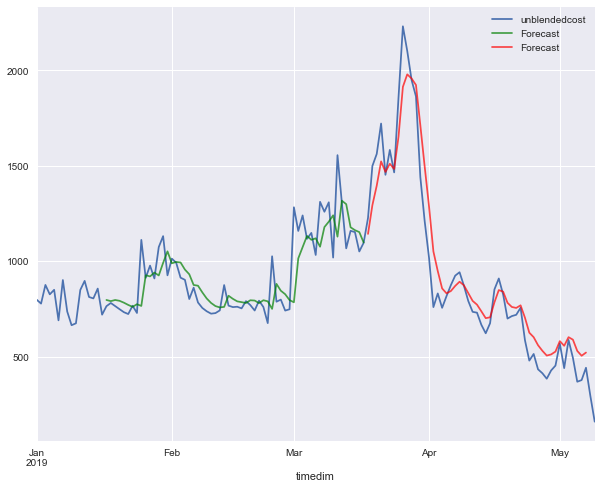

in sample
MAPE 18.128740325110172
rmse 132.36933360454404
out of sample
mape 39.05436876882041
rmse 128.12985429920025
[16, 64, 'tanh', 0.0001]
Epoch 1/1000
60/60 [==============================] - 6s 93ms/sample - loss: 1.0344 - mean_squared_error: 1.0344
Epoch 2/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.9417 - mean_squared_error: 0.9417
Epoch 3/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.8539 - mean_squared_error: 0.8539
Epoch 4/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.7706 - mean_squared_error: 0.7706
Epoch 5/1000
60/60 [==============================] - 0s 5ms/sample - loss: 0.6923 - mean_squared_error: 0.6923
Epoch 6/1000
60/60 [==============================] - 0s 5ms/sample - loss: 0.6160 - mean_squared_error: 0.6160
Epoch 7/1000
60/60 [==============================] - 0s 5ms/sample - loss: 0.5453 - mean_squared_error: 0.5453
Epoch 8/1000
60/60 [==============================] - 0s 5ms/sample - l

60/60 [==============================] - 0s 6ms/sample - loss: 0.0666 - mean_squared_error: 0.0666
Epoch 72/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0660 - mean_squared_error: 0.0660
Epoch 73/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0655 - mean_squared_error: 0.0655
Epoch 74/1000
60/60 [==============================] - 0s 5ms/sample - loss: 0.0649 - mean_squared_error: 0.0649
Epoch 75/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0644 - mean_squared_error: 0.0644
Epoch 76/1000
60/60 [==============================] - 0s 7ms/sample - loss: 0.0638 - mean_squared_error: 0.0638
Epoch 77/1000
60/60 [==============================] - 0s 7ms/sample - loss: 0.0633 - mean_squared_error: 0.0633
Epoch 78/1000
60/60 [==============================] - 0s 7ms/sample - loss: 0.0628 - mean_squared_error: 0.0628
Epoch 79/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0623 - mean_squared_error: 0.06

60/60 [==============================] - 0s 5ms/sample - loss: 0.0406 - mean_squared_error: 0.0406
Epoch 144/1000
60/60 [==============================] - 0s 5ms/sample - loss: 0.0404 - mean_squared_error: 0.0404
Epoch 145/1000
60/60 [==============================] - 0s 5ms/sample - loss: 0.0402 - mean_squared_error: 0.0402
Epoch 146/1000
60/60 [==============================] - 0s 5ms/sample - loss: 0.0400 - mean_squared_error: 0.0400
Epoch 147/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0397 - mean_squared_error: 0.0397
Epoch 148/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0395 - mean_squared_error: 0.0395
Epoch 149/1000
60/60 [==============================] - 0s 5ms/sample - loss: 0.0393 - mean_squared_error: 0.0393
Epoch 150/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0391 - mean_squared_error: 0.0391
Epoch 151/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0389 - mean_squared_err

Epoch 215/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0293 - mean_squared_error: 0.0293
Epoch 216/1000
60/60 [==============================] - 0s 5ms/sample - loss: 0.0292 - mean_squared_error: 0.0292
Epoch 217/1000
60/60 [==============================] - 0s 5ms/sample - loss: 0.0291 - mean_squared_error: 0.0291
Epoch 218/1000
60/60 [==============================] - 0s 5ms/sample - loss: 0.0290 - mean_squared_error: 0.0290
Epoch 219/1000
60/60 [==============================] - 0s 5ms/sample - loss: 0.0289 - mean_squared_error: 0.0289
Epoch 220/1000
60/60 [==============================] - 0s 5ms/sample - loss: 0.0288 - mean_squared_error: 0.0288
Epoch 221/1000
60/60 [==============================] - 0s 5ms/sample - loss: 0.0287 - mean_squared_error: 0.0287
Epoch 222/1000
60/60 [==============================] - 0s 5ms/sample - loss: 0.0286 - mean_squared_error: 0.0286
Epoch 223/1000
60/60 [==============================] - 0s 5ms/sample - loss: 0.0285 - m

60/60 [==============================] - 0s 5ms/sample - loss: 0.0232 - mean_squared_error: 0.0232
Epoch 287/1000
60/60 [==============================] - 0s 5ms/sample - loss: 0.0232 - mean_squared_error: 0.0232
Epoch 288/1000
60/60 [==============================] - 0s 5ms/sample - loss: 0.0231 - mean_squared_error: 0.0231
Epoch 289/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0230 - mean_squared_error: 0.0230
Epoch 290/1000
60/60 [==============================] - 0s 5ms/sample - loss: 0.0230 - mean_squared_error: 0.0230
Epoch 291/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0230 - mean_squared_error: 0.0230
Epoch 292/1000
60/60 [==============================] - 0s 5ms/sample - loss: 0.0229 - mean_squared_error: 0.0229
Epoch 293/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0228 - mean_squared_error: 0.0228
Epoch 294/1000
60/60 [==============================] - 0s 7ms/sample - loss: 0.0227 - mean_squared_err

Epoch 358/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0195 - mean_squared_error: 0.0195
Epoch 359/1000
60/60 [==============================] - 0s 7ms/sample - loss: 0.0194 - mean_squared_error: 0.0194
Epoch 360/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0194 - mean_squared_error: 0.0194
Epoch 361/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0194 - mean_squared_error: 0.0194
Epoch 362/1000
60/60 [==============================] - 0s 7ms/sample - loss: 0.0193 - mean_squared_error: 0.0193
Epoch 363/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0193 - mean_squared_error: 0.0193
Epoch 364/1000
60/60 [==============================] - 0s 7ms/sample - loss: 0.0193 - mean_squared_error: 0.0193
Epoch 365/1000
60/60 [==============================] - 0s 7ms/sample - loss: 0.0192 - mean_squared_error: 0.0192
Epoch 366/1000
60/60 [==============================] - 0s 7ms/sample - loss: 0.0192 - m

60/60 [==============================] - 0s 6ms/sample - loss: 0.0173 - mean_squared_error: 0.0173
Epoch 430/1000
60/60 [==============================] - 0s 7ms/sample - loss: 0.0173 - mean_squared_error: 0.0173
Epoch 431/1000
60/60 [==============================] - 0s 7ms/sample - loss: 0.0173 - mean_squared_error: 0.0173
Epoch 432/1000
60/60 [==============================] - 0s 8ms/sample - loss: 0.0172 - mean_squared_error: 0.0172
Epoch 433/1000
60/60 [==============================] - 0s 7ms/sample - loss: 0.0172 - mean_squared_error: 0.0172
Epoch 434/1000
60/60 [==============================] - 0s 8ms/sample - loss: 0.0172 - mean_squared_error: 0.0172
Epoch 435/1000
60/60 [==============================] - 0s 8ms/sample - loss: 0.0172 - mean_squared_error: 0.0172
Epoch 436/1000
60/60 [==============================] - 0s 7ms/sample - loss: 0.0172 - mean_squared_error: 0.0172
Epoch 437/1000
60/60 [==============================] - 0s 8ms/sample - loss: 0.0171 - mean_squared_err

Epoch 501/1000
60/60 [==============================] - 0s 7ms/sample - loss: 0.0161 - mean_squared_error: 0.0161
Epoch 502/1000
60/60 [==============================] - 0s 8ms/sample - loss: 0.0161 - mean_squared_error: 0.0161
Epoch 503/1000
60/60 [==============================] - 0s 8ms/sample - loss: 0.0161 - mean_squared_error: 0.0161
Epoch 504/1000
60/60 [==============================] - 0s 8ms/sample - loss: 0.0161 - mean_squared_error: 0.0161
Epoch 505/1000
60/60 [==============================] - 1s 9ms/sample - loss: 0.0161 - mean_squared_error: 0.0161
Epoch 506/1000
60/60 [==============================] - 1s 9ms/sample - loss: 0.0161 - mean_squared_error: 0.0161
Epoch 507/1000
60/60 [==============================] - 0s 8ms/sample - loss: 0.0161 - mean_squared_error: 0.0161
Epoch 508/1000
60/60 [==============================] - 0s 8ms/sample - loss: 0.0161 - mean_squared_error: 0.0161
Epoch 509/1000
60/60 [==============================] - 0s 7ms/sample - loss: 0.0160 - m

60/60 [==============================] - 0s 7ms/sample - loss: 0.0156 - mean_squared_error: 0.0156
Epoch 573/1000
60/60 [==============================] - 0s 7ms/sample - loss: 0.0155 - mean_squared_error: 0.0155
Epoch 574/1000
60/60 [==============================] - 0s 7ms/sample - loss: 0.0155 - mean_squared_error: 0.0155
Epoch 575/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0155 - mean_squared_error: 0.0155
Epoch 576/1000
60/60 [==============================] - 0s 7ms/sample - loss: 0.0155 - mean_squared_error: 0.0155
Epoch 577/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0155 - mean_squared_error: 0.0155
Epoch 578/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0155 - mean_squared_error: 0.0155
Epoch 579/1000
60/60 [==============================] - 0s 5ms/sample - loss: 0.0155 - mean_squared_error: 0.0155
Epoch 580/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0155 - mean_squared_err

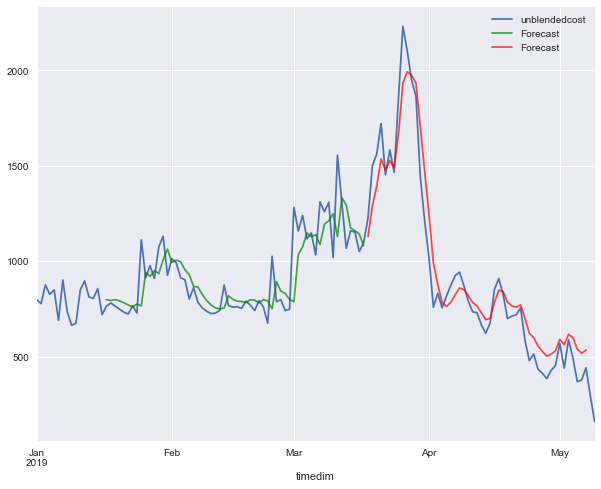

in sample
MAPE 18.440130529376347
rmse 131.31130430321141
out of sample
mape 37.83216650450474
rmse 121.45967708303341
[16, 64, 'tanh', 0.0003]
Epoch 1/1000
60/60 [==============================] - 6s 107ms/sample - loss: 0.8404 - mean_squared_error: 0.8404
Epoch 2/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.6444 - mean_squared_error: 0.6444
Epoch 3/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.4657 - mean_squared_error: 0.4657
Epoch 4/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.3078 - mean_squared_error: 0.3078
Epoch 5/1000
60/60 [==============================] - 0s 7ms/sample - loss: 0.1838 - mean_squared_error: 0.1838
Epoch 6/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.1734 - mean_squared_error: 0.1734
Epoch 7/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.1653 - mean_squared_error: 0.1653
Epoch 8/1000
60/60 [==============================] - 0s 7ms/sample - 

60/60 [==============================] - 0s 7ms/sample - loss: 0.0271 - mean_squared_error: 0.0271
Epoch 72/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0268 - mean_squared_error: 0.0268
Epoch 73/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0264 - mean_squared_error: 0.0264
Epoch 74/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0261 - mean_squared_error: 0.0261
Epoch 75/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0258 - mean_squared_error: 0.0258
Epoch 76/1000
60/60 [==============================] - 0s 7ms/sample - loss: 0.0256 - mean_squared_error: 0.0256
Epoch 77/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0253 - mean_squared_error: 0.0253
Epoch 78/1000
60/60 [==============================] - 0s 7ms/sample - loss: 0.0250 - mean_squared_error: 0.0250
Epoch 79/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0247 - mean_squared_error: 0.02

60/60 [==============================] - 0s 6ms/sample - loss: 0.0163 - mean_squared_error: 0.0163
Epoch 144/1000
60/60 [==============================] - 0s 8ms/sample - loss: 0.0164 - mean_squared_error: 0.0164
Epoch 145/1000
60/60 [==============================] - 0s 7ms/sample - loss: 0.0163 - mean_squared_error: 0.0163
Epoch 146/1000
60/60 [==============================] - 0s 7ms/sample - loss: 0.0162 - mean_squared_error: 0.0162
Epoch 147/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0162 - mean_squared_error: 0.0162
Epoch 148/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0161 - mean_squared_error: 0.0161
Epoch 149/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0161 - mean_squared_error: 0.0161
Epoch 150/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0161 - mean_squared_error: 0.0161
Epoch 151/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0160 - mean_squared_err

Epoch 215/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0150 - mean_squared_error: 0.0150
Epoch 216/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0150 - mean_squared_error: 0.0150
Epoch 217/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0150 - mean_squared_error: 0.0150
Epoch 218/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0150 - mean_squared_error: 0.0150
Epoch 219/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0150 - mean_squared_error: 0.0150
Epoch 220/1000
60/60 [==============================] - 0s 7ms/sample - loss: 0.0150 - mean_squared_error: 0.0150
Epoch 221/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0151 - mean_squared_error: 0.0151
Epoch 222/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0151 - mean_squared_error: 0.0151
Epoch 223/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0150 - m

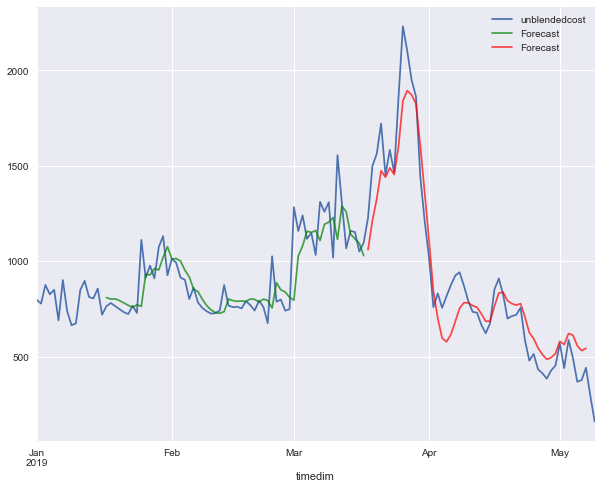

in sample
MAPE 18.49518161504396
rmse 129.19525396711174
out of sample
mape 35.5668646883941
rmse 144.34909619252232
[16, 64, 'tanh', 0.001]
Epoch 1/1000
60/60 [==============================] - 6s 103ms/sample - loss: 0.6568 - mean_squared_error: 0.6568
Epoch 2/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.1856 - mean_squared_error: 0.1856
Epoch 3/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.1580 - mean_squared_error: 0.1580
Epoch 4/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0886 - mean_squared_error: 0.0886
Epoch 5/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0893 - mean_squared_error: 0.0893
Epoch 6/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0734 - mean_squared_error: 0.0734
Epoch 7/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0591 - mean_squared_error: 0.0591
Epoch 8/1000
60/60 [==============================] - 0s 6ms/sample - los

60/60 [==============================] - 0s 6ms/sample - loss: 0.0156 - mean_squared_error: 0.0156
Epoch 72/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0156 - mean_squared_error: 0.0156
Epoch 73/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0155 - mean_squared_error: 0.0155
Epoch 74/1000
60/60 [==============================] - 0s 8ms/sample - loss: 0.0155 - mean_squared_error: 0.0155
Epoch 75/1000
60/60 [==============================] - 0s 8ms/sample - loss: 0.0155 - mean_squared_error: 0.0155
Epoch 76/1000
60/60 [==============================] - 0s 7ms/sample - loss: 0.0155 - mean_squared_error: 0.0155
Epoch 77/1000
60/60 [==============================] - 0s 7ms/sample - loss: 0.0154 - mean_squared_error: 0.0154
Epoch 78/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0155 - mean_squared_error: 0.0155
Epoch 79/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0154 - mean_squared_error: 0.01

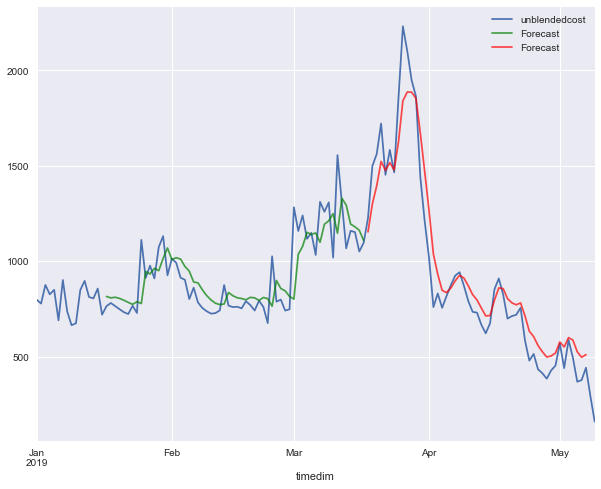

in sample
MAPE 18.405982276426162
rmse 131.61636119653593
out of sample
mape 39.70290209665438
rmse 131.45689966235702
[16, 64, 'tanh', 0.003]
Epoch 1/1000
60/60 [==============================] - 6s 103ms/sample - loss: 0.5472 - mean_squared_error: 0.5472
Epoch 2/1000
60/60 [==============================] - 0s 7ms/sample - loss: 0.0952 - mean_squared_error: 0.0952
Epoch 3/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0681 - mean_squared_error: 0.0681
Epoch 4/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0440 - mean_squared_error: 0.0440
Epoch 5/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0348 - mean_squared_error: 0.0348
Epoch 6/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0312 - mean_squared_error: 0.0312
Epoch 7/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0274 - mean_squared_error: 0.0274
Epoch 8/1000
60/60 [==============================] - 0s 6ms/sample - l

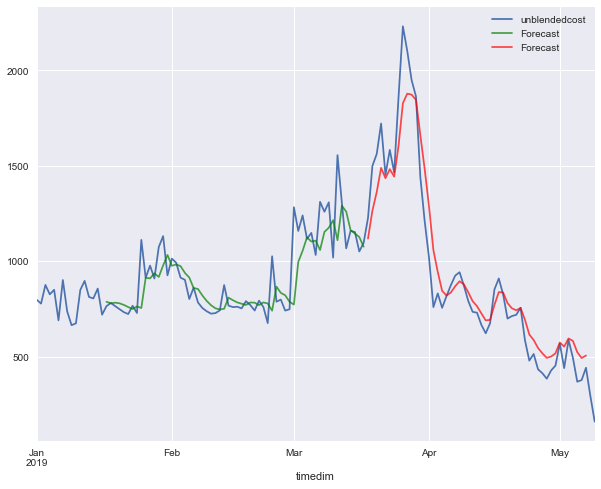

in sample
MAPE 17.90859695324277
rmse 133.22076848614427
out of sample
mape 39.01842723717427
rmse 136.1323227102271
[16, 64, 'tanh', 0.01]
Epoch 1/1000
60/60 [==============================] - 6s 105ms/sample - loss: 0.6687 - mean_squared_error: 0.6687
Epoch 2/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.6596 - mean_squared_error: 0.6596
Epoch 3/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.6508 - mean_squared_error: 0.6508
Epoch 4/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.6422 - mean_squared_error: 0.6422
Epoch 5/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.6335 - mean_squared_error: 0.6335
Epoch 6/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.6248 - mean_squared_error: 0.6248
Epoch 7/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.6160 - mean_squared_error: 0.6160
Epoch 8/1000
60/60 [==============================] - 0s 6ms/sample - loss

60/60 [==============================] - 0s 7ms/sample - loss: 0.1446 - mean_squared_error: 0.1446
Epoch 72/1000
60/60 [==============================] - 0s 8ms/sample - loss: 0.1428 - mean_squared_error: 0.1428
Epoch 73/1000
60/60 [==============================] - 0s 8ms/sample - loss: 0.1410 - mean_squared_error: 0.1410
Epoch 74/1000
60/60 [==============================] - 0s 7ms/sample - loss: 0.1392 - mean_squared_error: 0.1392
Epoch 75/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.1374 - mean_squared_error: 0.1374
Epoch 76/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.1357 - mean_squared_error: 0.1357
Epoch 77/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.1339 - mean_squared_error: 0.1339
Epoch 78/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.1322 - mean_squared_error: 0.1322
Epoch 79/1000
60/60 [==============================] - 0s 7ms/sample - loss: 0.1305 - mean_squared_error: 0.13

60/60 [==============================] - 0s 6ms/sample - loss: 0.0860 - mean_squared_error: 0.0860
Epoch 144/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0855 - mean_squared_error: 0.0855
Epoch 145/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0851 - mean_squared_error: 0.0851
Epoch 146/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0848 - mean_squared_error: 0.0848
Epoch 147/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0843 - mean_squared_error: 0.0843
Epoch 148/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0840 - mean_squared_error: 0.0840
Epoch 149/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0836 - mean_squared_error: 0.0836
Epoch 150/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0832 - mean_squared_error: 0.0832
Epoch 151/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0828 - mean_squared_err

Epoch 215/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0637 - mean_squared_error: 0.0637
Epoch 216/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0635 - mean_squared_error: 0.0635
Epoch 217/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0633 - mean_squared_error: 0.0633
Epoch 218/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0631 - mean_squared_error: 0.0631
Epoch 219/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0629 - mean_squared_error: 0.0629
Epoch 220/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0627 - mean_squared_error: 0.0627
Epoch 221/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0625 - mean_squared_error: 0.0625
Epoch 222/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0623 - mean_squared_error: 0.0623
Epoch 223/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0621 - m

60/60 [==============================] - 0s 6ms/sample - loss: 0.0518 - mean_squared_error: 0.0518
Epoch 287/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0517 - mean_squared_error: 0.0517
Epoch 288/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0516 - mean_squared_error: 0.0516
Epoch 289/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0515 - mean_squared_error: 0.0515
Epoch 290/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0513 - mean_squared_error: 0.0513
Epoch 291/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0512 - mean_squared_error: 0.0512
Epoch 292/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0511 - mean_squared_error: 0.0511
Epoch 293/1000
60/60 [==============================] - 0s 7ms/sample - loss: 0.0509 - mean_squared_error: 0.0509
Epoch 294/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0508 - mean_squared_err

Epoch 358/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0435 - mean_squared_error: 0.0435
Epoch 359/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0434 - mean_squared_error: 0.0434
Epoch 360/1000
60/60 [==============================] - 0s 8ms/sample - loss: 0.0433 - mean_squared_error: 0.0433
Epoch 361/1000
60/60 [==============================] - 0s 8ms/sample - loss: 0.0432 - mean_squared_error: 0.0432
Epoch 362/1000
60/60 [==============================] - 0s 7ms/sample - loss: 0.0431 - mean_squared_error: 0.0431
Epoch 363/1000
60/60 [==============================] - 0s 7ms/sample - loss: 0.0430 - mean_squared_error: 0.0430
Epoch 364/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0429 - mean_squared_error: 0.0429
Epoch 365/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0429 - mean_squared_error: 0.0429
Epoch 366/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0428 - m

60/60 [==============================] - 0s 6ms/sample - loss: 0.0373 - mean_squared_error: 0.0373
Epoch 430/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0372 - mean_squared_error: 0.0372
Epoch 431/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0371 - mean_squared_error: 0.0371
Epoch 432/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0371 - mean_squared_error: 0.0371
Epoch 433/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0370 - mean_squared_error: 0.0370
Epoch 434/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0369 - mean_squared_error: 0.0369
Epoch 435/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0368 - mean_squared_error: 0.0368
Epoch 436/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0368 - mean_squared_error: 0.0368
Epoch 437/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0367 - mean_squared_err

Epoch 501/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0323 - mean_squared_error: 0.0323
Epoch 502/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0322 - mean_squared_error: 0.0322
Epoch 503/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0321 - mean_squared_error: 0.0321
Epoch 504/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0321 - mean_squared_error: 0.0321
Epoch 505/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0320 - mean_squared_error: 0.0320
Epoch 506/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0320 - mean_squared_error: 0.0320
Epoch 507/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0319 - mean_squared_error: 0.0319
Epoch 508/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0318 - mean_squared_error: 0.0318
Epoch 509/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0318 - m

60/60 [==============================] - 0s 7ms/sample - loss: 0.0283 - mean_squared_error: 0.0283
Epoch 573/1000
60/60 [==============================] - 0s 7ms/sample - loss: 0.0283 - mean_squared_error: 0.0283
Epoch 574/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0282 - mean_squared_error: 0.0282
Epoch 575/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0282 - mean_squared_error: 0.0282
Epoch 576/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0282 - mean_squared_error: 0.0282
Epoch 577/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0281 - mean_squared_error: 0.0281
Epoch 578/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0280 - mean_squared_error: 0.0280
Epoch 579/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0280 - mean_squared_error: 0.0280
Epoch 580/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0279 - mean_squared_err

Epoch 644/1000
60/60 [==============================] - 0s 7ms/sample - loss: 0.0252 - mean_squared_error: 0.0252
Epoch 645/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0252 - mean_squared_error: 0.0252
Epoch 646/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0251 - mean_squared_error: 0.0251
Epoch 647/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0251 - mean_squared_error: 0.0251
Epoch 648/1000
60/60 [==============================] - 0s 8ms/sample - loss: 0.0251 - mean_squared_error: 0.0251
Epoch 649/1000
60/60 [==============================] - 0s 8ms/sample - loss: 0.0250 - mean_squared_error: 0.0250
Epoch 650/1000
60/60 [==============================] - 0s 8ms/sample - loss: 0.0250 - mean_squared_error: 0.0250
Epoch 651/1000
60/60 [==============================] - 0s 7ms/sample - loss: 0.0250 - mean_squared_error: 0.0250
Epoch 652/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0249 - m

60/60 [==============================] - 0s 6ms/sample - loss: 0.0228 - mean_squared_error: 0.0228
Epoch 716/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0228 - mean_squared_error: 0.0228
Epoch 717/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0228 - mean_squared_error: 0.0228
Epoch 718/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0227 - mean_squared_error: 0.0227
Epoch 719/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0227 - mean_squared_error: 0.0227
Epoch 720/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0227 - mean_squared_error: 0.0227
Epoch 721/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0227 - mean_squared_error: 0.0227
Epoch 722/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0226 - mean_squared_error: 0.0226
Epoch 723/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0226 - mean_squared_err

Epoch 787/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0209 - mean_squared_error: 0.0209
Epoch 788/1000
60/60 [==============================] - 0s 7ms/sample - loss: 0.0210 - mean_squared_error: 0.0210
Epoch 789/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0209 - mean_squared_error: 0.0209
Epoch 790/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0209 - mean_squared_error: 0.0209
Epoch 791/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0208 - mean_squared_error: 0.0208
Epoch 792/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0208 - mean_squared_error: 0.0208
Epoch 793/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0208 - mean_squared_error: 0.0208
Epoch 794/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0208 - mean_squared_error: 0.0208
Epoch 795/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0207 - m

60/60 [==============================] - 0s 6ms/sample - loss: 0.0194 - mean_squared_error: 0.0194
Epoch 859/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0194 - mean_squared_error: 0.0194
Epoch 860/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0194 - mean_squared_error: 0.0194
Epoch 861/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0193 - mean_squared_error: 0.0193
Epoch 862/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0193 - mean_squared_error: 0.0193
Epoch 863/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0193 - mean_squared_error: 0.0193
Epoch 864/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0193 - mean_squared_error: 0.0193
Epoch 865/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0193 - mean_squared_error: 0.0193
Epoch 866/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0193 - mean_squared_err

Epoch 930/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0182 - mean_squared_error: 0.0182
Epoch 931/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0182 - mean_squared_error: 0.0182
Epoch 932/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0182 - mean_squared_error: 0.0182
Epoch 933/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0181 - mean_squared_error: 0.0181
Epoch 934/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0181 - mean_squared_error: 0.0181
Epoch 935/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0181 - mean_squared_error: 0.0181
Epoch 936/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0181 - mean_squared_error: 0.0181
Epoch 937/1000
60/60 [==============================] - 0s 8ms/sample - loss: 0.0181 - mean_squared_error: 0.0181
Epoch 938/1000
60/60 [==============================] - 0s 8ms/sample - loss: 0.0181 - m

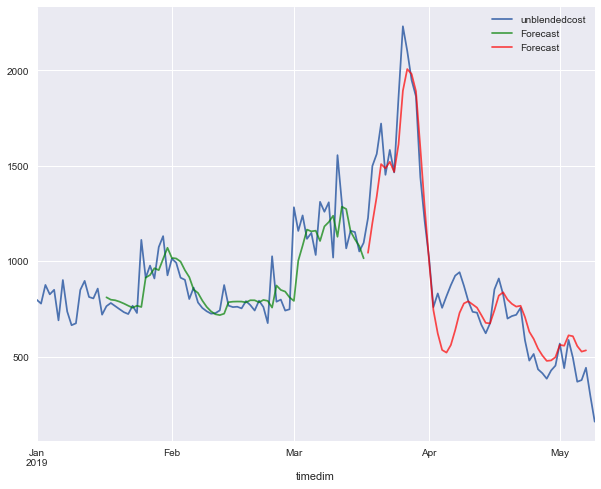

in sample
MAPE 18.52500095293071
rmse 129.65778453374415
out of sample
mape 35.45472233923783
rmse 144.55046799055668
[16, 64, 'relu', 0.0001]
Epoch 1/1000
60/60 [==============================] - 6s 108ms/sample - loss: 0.9652 - mean_squared_error: 0.9652
Epoch 2/1000
60/60 [==============================] - 0s 8ms/sample - loss: 0.9316 - mean_squared_error: 0.9316
Epoch 3/1000
60/60 [==============================] - 0s 7ms/sample - loss: 0.9005 - mean_squared_error: 0.9005
Epoch 4/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.8726 - mean_squared_error: 0.8726
Epoch 5/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.8474 - mean_squared_error: 0.8474
Epoch 6/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.8238 - mean_squared_error: 0.8238
Epoch 7/1000
60/60 [==============================] - 0s 7ms/sample - loss: 0.8004 - mean_squared_error: 0.8004
Epoch 8/1000
60/60 [==============================] - 0s 6ms/sample - l

60/60 [==============================] - 0s 6ms/sample - loss: 0.0882 - mean_squared_error: 0.0882
Epoch 72/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0869 - mean_squared_error: 0.0869
Epoch 73/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0858 - mean_squared_error: 0.0858
Epoch 74/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0846 - mean_squared_error: 0.0846
Epoch 75/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0835 - mean_squared_error: 0.0835
Epoch 76/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0824 - mean_squared_error: 0.0824
Epoch 77/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0813 - mean_squared_error: 0.0813
Epoch 78/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0806 - mean_squared_error: 0.0806
Epoch 79/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0797 - mean_squared_error: 0.07

60/60 [==============================] - 0s 6ms/sample - loss: 0.0477 - mean_squared_error: 0.0477
Epoch 144/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0473 - mean_squared_error: 0.0473
Epoch 145/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0470 - mean_squared_error: 0.0470
Epoch 146/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0468 - mean_squared_error: 0.0468
Epoch 147/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0465 - mean_squared_error: 0.0465
Epoch 148/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0462 - mean_squared_error: 0.0462
Epoch 149/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0460 - mean_squared_error: 0.0460
Epoch 150/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0458 - mean_squared_error: 0.0458
Epoch 151/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0456 - mean_squared_err

Epoch 215/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0333 - mean_squared_error: 0.0333
Epoch 216/1000
60/60 [==============================] - 0s 7ms/sample - loss: 0.0332 - mean_squared_error: 0.0332
Epoch 217/1000
60/60 [==============================] - 0s 7ms/sample - loss: 0.0330 - mean_squared_error: 0.0330
Epoch 218/1000
60/60 [==============================] - 0s 7ms/sample - loss: 0.0329 - mean_squared_error: 0.0329
Epoch 219/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0328 - mean_squared_error: 0.0328
Epoch 220/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0328 - mean_squared_error: 0.0328
Epoch 221/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0325 - mean_squared_error: 0.0325
Epoch 222/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0324 - mean_squared_error: 0.0324
Epoch 223/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0323 - m

60/60 [==============================] - 0s 6ms/sample - loss: 0.0255 - mean_squared_error: 0.0255
Epoch 287/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0254 - mean_squared_error: 0.0254
Epoch 288/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0254 - mean_squared_error: 0.0254
Epoch 289/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0253 - mean_squared_error: 0.0253
Epoch 290/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0252 - mean_squared_error: 0.0252
Epoch 291/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0251 - mean_squared_error: 0.0251
Epoch 292/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0251 - mean_squared_error: 0.0251
Epoch 293/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0249 - mean_squared_error: 0.0249
Epoch 294/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0248 - mean_squared_err

Epoch 358/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0205 - mean_squared_error: 0.0205
Epoch 359/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0204 - mean_squared_error: 0.0204
Epoch 360/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0205 - mean_squared_error: 0.0205
Epoch 361/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0204 - mean_squared_error: 0.0204
Epoch 362/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0201 - mean_squared_error: 0.0201
Epoch 363/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0205 - mean_squared_error: 0.0205
Epoch 364/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0201 - mean_squared_error: 0.0201
Epoch 365/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0200 - mean_squared_error: 0.0200
Epoch 366/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0200 - m

60/60 [==============================] - 0s 6ms/sample - loss: 0.0174 - mean_squared_error: 0.0174
Epoch 430/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0175 - mean_squared_error: 0.0175
Epoch 431/1000
60/60 [==============================] - 0s 8ms/sample - loss: 0.0173 - mean_squared_error: 0.0173
Epoch 432/1000
60/60 [==============================] - 0s 7ms/sample - loss: 0.0172 - mean_squared_error: 0.0172
Epoch 433/1000
60/60 [==============================] - 0s 7ms/sample - loss: 0.0173 - mean_squared_error: 0.0173
Epoch 434/1000
60/60 [==============================] - 0s 7ms/sample - loss: 0.0172 - mean_squared_error: 0.0172
Epoch 435/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0172 - mean_squared_error: 0.0172
Epoch 436/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0171 - mean_squared_error: 0.0171
Epoch 437/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0171 - mean_squared_err

Epoch 501/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0155 - mean_squared_error: 0.0155
Epoch 502/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0156 - mean_squared_error: 0.0156
Epoch 503/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0155 - mean_squared_error: 0.0155
Epoch 504/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0155 - mean_squared_error: 0.0155
Epoch 505/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0157 - mean_squared_error: 0.0157
Epoch 506/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0156 - mean_squared_error: 0.0156
Epoch 507/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0155 - mean_squared_error: 0.0155
Epoch 508/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0156 - mean_squared_error: 0.0156
Epoch 00508: early stopping


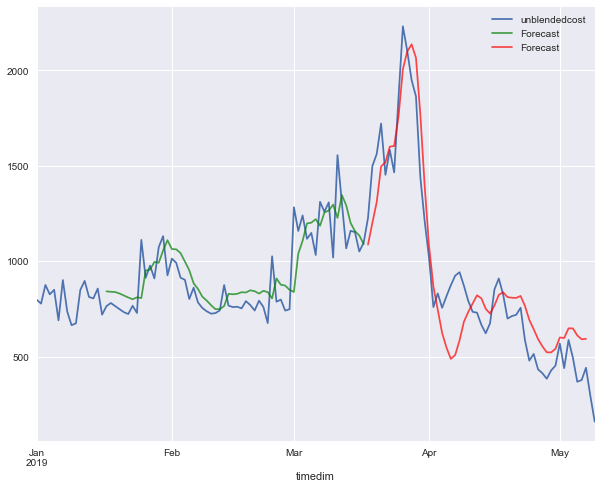

in sample
MAPE 18.941715075605348
rmse 128.09986562188436
out of sample
mape 36.313083493049874
rmse 176.03258342840516
[16, 64, 'relu', 0.0003]
Epoch 1/1000
60/60 [==============================] - 7s 109ms/sample - loss: 0.7988 - mean_squared_error: 0.7988
Epoch 2/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.6721 - mean_squared_error: 0.6721
Epoch 3/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.5491 - mean_squared_error: 0.5491
Epoch 4/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.4275 - mean_squared_error: 0.4275
Epoch 5/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.3137 - mean_squared_error: 0.3137
Epoch 6/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.2116 - mean_squared_error: 0.2116
Epoch 7/1000
60/60 [==============================] - 0s 7ms/sample - loss: 0.1833 - mean_squared_error: 0.1833
Epoch 8/1000
60/60 [==============================] - 0s 7ms/sample -

60/60 [==============================] - 0s 8ms/sample - loss: 0.0330 - mean_squared_error: 0.0330
Epoch 72/1000
60/60 [==============================] - 0s 7ms/sample - loss: 0.0330 - mean_squared_error: 0.0330
Epoch 73/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0325 - mean_squared_error: 0.0325
Epoch 74/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0322 - mean_squared_error: 0.0322
Epoch 75/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0318 - mean_squared_error: 0.0318
Epoch 76/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0316 - mean_squared_error: 0.0316
Epoch 77/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0312 - mean_squared_error: 0.0312
Epoch 78/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0309 - mean_squared_error: 0.0309
Epoch 79/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0306 - mean_squared_error: 0.03

60/60 [==============================] - 0s 6ms/sample - loss: 0.0208 - mean_squared_error: 0.0208
Epoch 143/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0208 - mean_squared_error: 0.0208
Epoch 144/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0207 - mean_squared_error: 0.0207
Epoch 145/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0206 - mean_squared_error: 0.0206
Epoch 146/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0205 - mean_squared_error: 0.0205
Epoch 147/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0204 - mean_squared_error: 0.0204
Epoch 148/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0204 - mean_squared_error: 0.0204
Epoch 149/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0203 - mean_squared_error: 0.0203
Epoch 150/1000
60/60 [==============================] - 0s 8ms/sample - loss: 0.0202 - mean_squared_err

Epoch 214/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0170 - mean_squared_error: 0.0170
Epoch 215/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0169 - mean_squared_error: 0.0169
Epoch 216/1000
60/60 [==============================] - 0s 7ms/sample - loss: 0.0169 - mean_squared_error: 0.0169
Epoch 217/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0169 - mean_squared_error: 0.0169
Epoch 218/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0169 - mean_squared_error: 0.0169
Epoch 219/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0168 - mean_squared_error: 0.0168
Epoch 220/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0169 - mean_squared_error: 0.0169
Epoch 221/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0168 - mean_squared_error: 0.0168
Epoch 222/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0168 - m

60/60 [==============================] - 0s 6ms/sample - loss: 0.0155 - mean_squared_error: 0.0155
Epoch 286/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0155 - mean_squared_error: 0.0155
Epoch 287/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0155 - mean_squared_error: 0.0155
Epoch 288/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0155 - mean_squared_error: 0.0155
Epoch 289/1000
60/60 [==============================] - 0s 7ms/sample - loss: 0.0154 - mean_squared_error: 0.0154
Epoch 290/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0154 - mean_squared_error: 0.0154
Epoch 291/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0154 - mean_squared_error: 0.0154
Epoch 292/1000
60/60 [==============================] - 0s 7ms/sample - loss: 0.0155 - mean_squared_error: 0.0155
Epoch 293/1000
60/60 [==============================] - 0s 7ms/sample - loss: 0.0154 - mean_squared_err

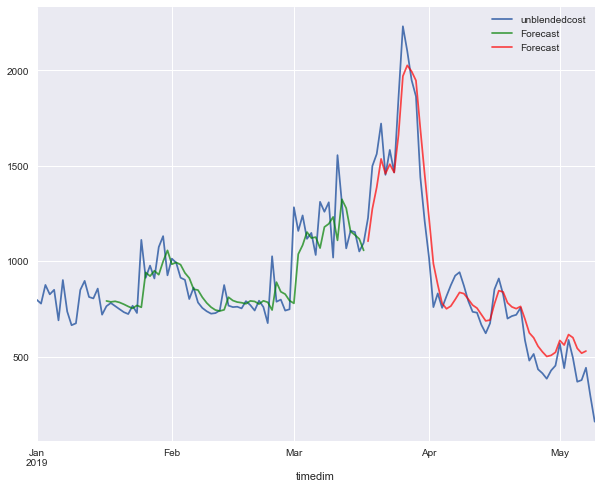

in sample
MAPE 18.357538571684334
rmse 131.5810801889767
out of sample
mape 37.379986483544045
rmse 119.72635598970977
[16, 64, 'relu', 0.001]
Epoch 1/1000
60/60 [==============================] - 6s 107ms/sample - loss: 0.7358 - mean_squared_error: 0.7358
Epoch 2/1000
60/60 [==============================] - 0s 7ms/sample - loss: 0.3653 - mean_squared_error: 0.3653
Epoch 3/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.1727 - mean_squared_error: 0.1727
Epoch 4/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.1448 - mean_squared_error: 0.1448
Epoch 5/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.1125 - mean_squared_error: 0.1125
Epoch 6/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.1051 - mean_squared_error: 0.1051
Epoch 7/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0838 - mean_squared_error: 0.0838
Epoch 8/1000
60/60 [==============================] - 0s 6ms/sample - l

60/60 [==============================] - 0s 6ms/sample - loss: 0.0158 - mean_squared_error: 0.0158
Epoch 72/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0158 - mean_squared_error: 0.0158
Epoch 73/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0159 - mean_squared_error: 0.0159
Epoch 74/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0158 - mean_squared_error: 0.0158
Epoch 75/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0157 - mean_squared_error: 0.0157
Epoch 76/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0157 - mean_squared_error: 0.0157
Epoch 77/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0156 - mean_squared_error: 0.0156
Epoch 78/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0157 - mean_squared_error: 0.0157
Epoch 79/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0157 - mean_squared_error: 0.01

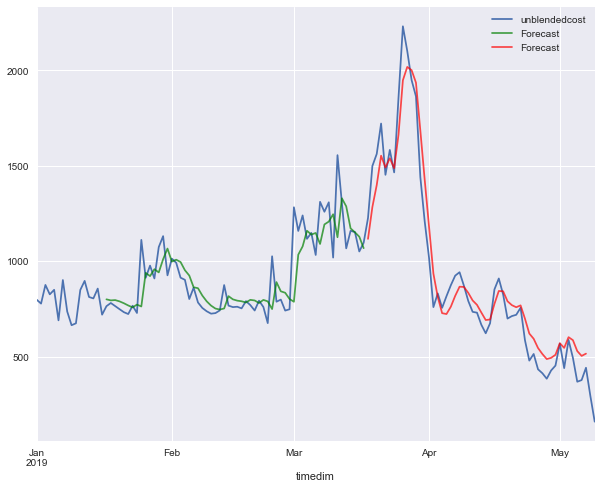

in sample
MAPE 18.453044473734487
rmse 130.95113574610664
out of sample
mape 37.92925021138069
rmse 112.1766467368367
[16, 64, 'relu', 0.003]
Epoch 1/1000
60/60 [==============================] - 7s 117ms/sample - loss: 0.5173 - mean_squared_error: 0.5173
Epoch 2/1000
60/60 [==============================] - 0s 7ms/sample - loss: 0.2165 - mean_squared_error: 0.2165
Epoch 3/1000
60/60 [==============================] - 0s 7ms/sample - loss: 0.1610 - mean_squared_error: 0.1610
Epoch 4/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.1381 - mean_squared_error: 0.1381
Epoch 5/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0790 - mean_squared_error: 0.0790
Epoch 6/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0519 - mean_squared_error: 0.0519
Epoch 7/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0572 - mean_squared_error: 0.0572
Epoch 8/1000
60/60 [==============================] - 0s 7ms/sample - lo

60/60 [==============================] - 0s 7ms/sample - loss: 0.0174 - mean_squared_error: 0.0174
Epoch 72/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0173 - mean_squared_error: 0.0173
Epoch 73/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0172 - mean_squared_error: 0.0172
Epoch 74/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0172 - mean_squared_error: 0.0172
Epoch 75/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0170 - mean_squared_error: 0.0170
Epoch 76/1000
60/60 [==============================] - 0s 7ms/sample - loss: 0.0169 - mean_squared_error: 0.0169
Epoch 77/1000
60/60 [==============================] - 0s 8ms/sample - loss: 0.0168 - mean_squared_error: 0.0168
Epoch 78/1000
60/60 [==============================] - 1s 8ms/sample - loss: 0.0167 - mean_squared_error: 0.0167
Epoch 79/1000
60/60 [==============================] - 0s 7ms/sample - loss: 0.0166 - mean_squared_error: 0.01

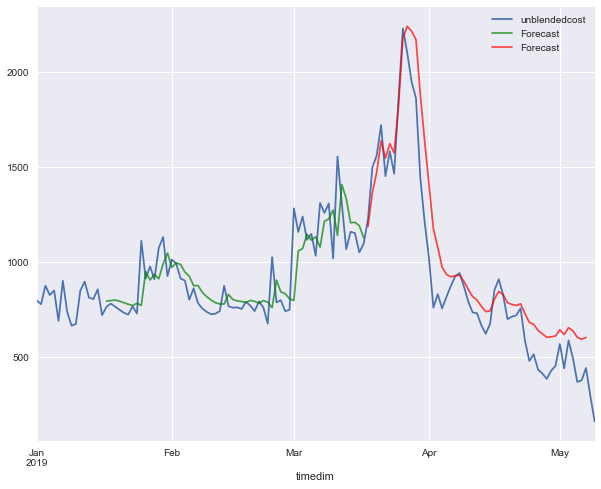

in sample
MAPE 18.383574817976285
rmse 134.32584105554233
out of sample
mape 40.27082351245495
rmse 177.27335568868173
[16, 64, 'relu', 0.01]


In [13]:
for params in parameter_combination:
    try:
        model,X_train,Y_train=model_train_param(params)
        temp=model_overfitting_check(model,params[0],X_train,Y_train)
        print(list(params))
        print("====================================================")
        grid_search_results.loc[len(grid_search_results),:]=(list(params)+temp)
    except:
        continue

### check overfitting (data without extreme values)

Epoch 1/1000
60/60 [==============================] - 7s 121ms/sample - loss: 0.9020 - mean_squared_error: 0.9020
Epoch 2/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.8756 - mean_squared_error: 0.8756
Epoch 3/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.8506 - mean_squared_error: 0.8506
Epoch 4/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.8258 - mean_squared_error: 0.8258
Epoch 5/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.8015 - mean_squared_error: 0.8015
Epoch 6/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.7772 - mean_squared_error: 0.7772
Epoch 7/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.7545 - mean_squared_error: 0.7545
Epoch 8/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.7319 - mean_squared_error: 0.7319
Epoch 9/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.7097 - mean_squared_erro

60/60 [==============================] - 0s 7ms/sample - loss: 0.1355 - mean_squared_error: 0.1355
Epoch 74/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.1343 - mean_squared_error: 0.1343
Epoch 75/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.1332 - mean_squared_error: 0.1332
Epoch 76/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.1320 - mean_squared_error: 0.1320
Epoch 77/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.1309 - mean_squared_error: 0.1309
Epoch 78/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.1298 - mean_squared_error: 0.1298
Epoch 79/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.1287 - mean_squared_error: 0.1287
Epoch 80/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.1276 - mean_squared_error: 0.1276
Epoch 81/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.1265 - mean_squared_error: 0.12

60/60 [==============================] - 0s 6ms/sample - loss: 0.0849 - mean_squared_error: 0.0849
Epoch 146/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0846 - mean_squared_error: 0.0846
Epoch 147/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0842 - mean_squared_error: 0.0842
Epoch 148/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0839 - mean_squared_error: 0.0839
Epoch 149/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0835 - mean_squared_error: 0.0835
Epoch 150/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0832 - mean_squared_error: 0.0832
Epoch 151/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0828 - mean_squared_error: 0.0828
Epoch 152/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0825 - mean_squared_error: 0.0825
Epoch 153/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0821 - mean_squared_err

Epoch 217/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0648 - mean_squared_error: 0.0648
Epoch 218/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0645 - mean_squared_error: 0.0645
Epoch 219/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0643 - mean_squared_error: 0.0643
Epoch 220/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0641 - mean_squared_error: 0.0641
Epoch 221/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0639 - mean_squared_error: 0.0639
Epoch 222/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0637 - mean_squared_error: 0.0637
Epoch 223/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0635 - mean_squared_error: 0.0635
Epoch 224/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0632 - mean_squared_error: 0.0632
Epoch 225/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0630 - m

60/60 [==============================] - 0s 7ms/sample - loss: 0.0518 - mean_squared_error: 0.0518
Epoch 289/1000
60/60 [==============================] - 0s 7ms/sample - loss: 0.0517 - mean_squared_error: 0.0517
Epoch 290/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0515 - mean_squared_error: 0.0515
Epoch 291/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0514 - mean_squared_error: 0.0514
Epoch 292/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0512 - mean_squared_error: 0.0512
Epoch 293/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0511 - mean_squared_error: 0.0511
Epoch 294/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0510 - mean_squared_error: 0.0510
Epoch 295/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0508 - mean_squared_error: 0.0508
Epoch 296/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0507 - mean_squared_err

Epoch 360/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0429 - mean_squared_error: 0.0429
Epoch 361/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0428 - mean_squared_error: 0.0428
Epoch 362/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0427 - mean_squared_error: 0.0427
Epoch 363/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0426 - mean_squared_error: 0.0426
Epoch 364/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0425 - mean_squared_error: 0.0425
Epoch 365/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0424 - mean_squared_error: 0.0424
Epoch 366/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0423 - mean_squared_error: 0.0423
Epoch 367/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0422 - mean_squared_error: 0.0422
Epoch 368/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0421 - m

60/60 [==============================] - 0s 6ms/sample - loss: 0.0366 - mean_squared_error: 0.0366
Epoch 432/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0365 - mean_squared_error: 0.0365
Epoch 433/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0364 - mean_squared_error: 0.0364
Epoch 434/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0364 - mean_squared_error: 0.0364
Epoch 435/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0363 - mean_squared_error: 0.0363
Epoch 436/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0362 - mean_squared_error: 0.0362
Epoch 437/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0361 - mean_squared_error: 0.0361
Epoch 438/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0361 - mean_squared_error: 0.0361
Epoch 439/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0360 - mean_squared_err

Epoch 503/1000
60/60 [==============================] - 0s 8ms/sample - loss: 0.0318 - mean_squared_error: 0.0318
Epoch 504/1000
60/60 [==============================] - 0s 7ms/sample - loss: 0.0317 - mean_squared_error: 0.0317
Epoch 505/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0317 - mean_squared_error: 0.0317
Epoch 506/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0316 - mean_squared_error: 0.0316
Epoch 507/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0315 - mean_squared_error: 0.0315
Epoch 508/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0315 - mean_squared_error: 0.0315
Epoch 509/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0314 - mean_squared_error: 0.0314
Epoch 510/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0314 - mean_squared_error: 0.0314
Epoch 511/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0313 - m

60/60 [==============================] - 0s 6ms/sample - loss: 0.0281 - mean_squared_error: 0.0281
Epoch 575/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0280 - mean_squared_error: 0.0280
Epoch 576/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0280 - mean_squared_error: 0.0280
Epoch 577/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0279 - mean_squared_error: 0.0279
Epoch 578/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0279 - mean_squared_error: 0.0279
Epoch 579/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0278 - mean_squared_error: 0.0278
Epoch 580/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0278 - mean_squared_error: 0.0278
Epoch 581/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0277 - mean_squared_error: 0.0277
Epoch 582/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0277 - mean_squared_err

Epoch 646/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0250 - mean_squared_error: 0.0250
Epoch 647/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0250 - mean_squared_error: 0.0250
Epoch 648/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0250 - mean_squared_error: 0.0250
Epoch 649/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0249 - mean_squared_error: 0.0249
Epoch 650/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0249 - mean_squared_error: 0.0249
Epoch 651/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0249 - mean_squared_error: 0.0249
Epoch 652/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0248 - mean_squared_error: 0.0248
Epoch 653/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0248 - mean_squared_error: 0.0248
Epoch 654/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0248 - m

60/60 [==============================] - 0s 6ms/sample - loss: 0.0227 - mean_squared_error: 0.0227
Epoch 718/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0226 - mean_squared_error: 0.0226
Epoch 719/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0226 - mean_squared_error: 0.0226
Epoch 720/1000
60/60 [==============================] - 0s 7ms/sample - loss: 0.0226 - mean_squared_error: 0.0226
Epoch 721/1000
60/60 [==============================] - 0s 7ms/sample - loss: 0.0225 - mean_squared_error: 0.0225
Epoch 722/1000
60/60 [==============================] - 0s 7ms/sample - loss: 0.0225 - mean_squared_error: 0.0225
Epoch 723/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0225 - mean_squared_error: 0.0225
Epoch 724/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0225 - mean_squared_error: 0.0225
Epoch 725/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0224 - mean_squared_err

Epoch 789/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0207 - mean_squared_error: 0.0207
Epoch 790/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0207 - mean_squared_error: 0.0207
Epoch 791/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0207 - mean_squared_error: 0.0207
Epoch 792/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0207 - mean_squared_error: 0.0207
Epoch 793/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0206 - mean_squared_error: 0.0206
Epoch 794/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0206 - mean_squared_error: 0.0206
Epoch 795/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0206 - mean_squared_error: 0.0206
Epoch 796/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0206 - mean_squared_error: 0.0206
Epoch 797/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0205 - m

60/60 [==============================] - 0s 6ms/sample - loss: 0.0192 - mean_squared_error: 0.0192
Epoch 861/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0192 - mean_squared_error: 0.0192
Epoch 862/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0192 - mean_squared_error: 0.0192
Epoch 863/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0192 - mean_squared_error: 0.0192
Epoch 864/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0192 - mean_squared_error: 0.0192
Epoch 865/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0192 - mean_squared_error: 0.0192
Epoch 866/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0191 - mean_squared_error: 0.0191
Epoch 867/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0191 - mean_squared_error: 0.0191
Epoch 868/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0191 - mean_squared_err

Epoch 932/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0181 - mean_squared_error: 0.0181
Epoch 933/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0181 - mean_squared_error: 0.0181
Epoch 934/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0181 - mean_squared_error: 0.0181
Epoch 935/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0180 - mean_squared_error: 0.0180
Epoch 936/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0180 - mean_squared_error: 0.0180
Epoch 937/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0180 - mean_squared_error: 0.0180
Epoch 938/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0180 - mean_squared_error: 0.0180
Epoch 939/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0180 - mean_squared_error: 0.0180
Epoch 940/1000
60/60 [==============================] - 0s 6ms/sample - loss: 0.0180 - m

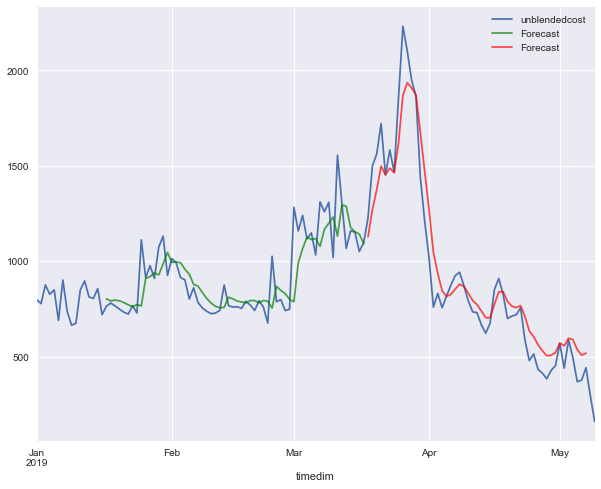

in sample
MAPE 17.957152508789477
rmse 131.88790628560415
out of sample
mape 38.920104900992584
rmse 132.4586184643903


In [15]:
current_best=[7,32,'tanh',0.01]
current_best=[16,32,'relu',0.003]
current_best=[16,64,'tanh',0.0001]##more stable
n_steps=current_best[0]
model,X_train,Y_train=model_train_param(current_best)
temp=model_overfitting_check(model,current_best[0],X_train,Y_train)

### verify with complete data (including extreme values)

In [16]:
#make prediction with test data (out of sample)
X_test = []
Y_test = [] 
test_x = np.array((daily_data_final['unblendedcost'])[train_size-n_steps:])
test_num=len(test_x)
for i in range(test_num-n_steps-1):
    X_test.append(test_x[i:i+n_steps].reshape(n_steps,-1))
    Y_test.append(test_x[i:i+n_steps].reshape(n_steps,-1))
X_test = np.array(X_test)
Y_test = np.array(Y_test)
X_test,Y_test =X_test/1000,Y_test/1000

In [17]:
y_predict=model.predict(X_test)
data_temp2=daily_data_final.iloc[train_size-1:train_size-n_steps+test_num-2,].copy()
data_temp2.loc[:,'unblendedcost']=list((y_predict.reshape(-1))[list(range(n_steps-1,n_steps*(len(y_predict)+1)-1,n_steps))])
data_temp2.unblendedcost*=1000

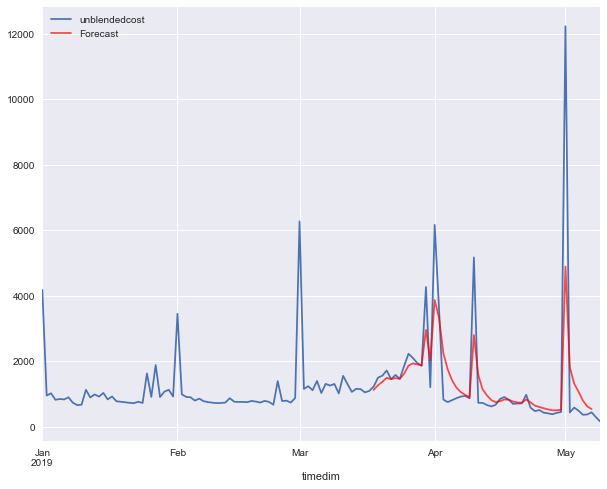

In [18]:
ax = daily_data_final.plot(label='actual with extreme value',figsize=(10,8))
(data_temp2.unblendedcost).plot(ax=ax, label='Forecast', alpha=0.7, color='red')
plt.legend()
plt.show()

In [19]:
print('out of sample')
mape = mean_absolute_percentage_error(daily_data_final.iloc[train_size-1:train_size-n_steps+test_num-2,], data_temp2.unblendedcost)
print('MAPE {}'.format(mape))
rmse = standardized_rmse(daily_data_final.iloc[train_size-1:train_size-n_steps+test_num-2,], data_temp2.unblendedcost)
print('RMSE {}'.format(rmse))

out of sample
MAPE 45.26197891940807
RMSE 1214.0762024829314
